In [1]:
#Citation:https://github.com/BakingBrains/Generation_of_Data_using_GAN/blob/main/data_generation_using_gan.py
#User on Github: BakingBrains

In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense 
from tensorflow.keras.layers import Flatten, BatchNormalization
from tensorflow.keras.layers import Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
import numpy as np
from PIL import Image
from tqdm import tqdm
import os 
import time
import matplotlib.pyplot as plt

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
GENERATE_RES = 4 # Generation resolution factor 
# (1=32, 2=64, 3=96, 4=128, etc.)
GENERATE_SQUARE = 32 * GENERATE_RES # rows/cols (should be square)
IMAGE_CHANNELS = 3

# Preview image 
PREVIEW_ROWS = 4
PREVIEW_COLS = 7
PREVIEW_MARGIN = 16

# Size vector to generate images from
SEED_SIZE = 100

# Configuration
DATA_PATH = 'E:/Github/thesis/flowerDataset/new_flower_dataset/1/'
EPOCHS = 90000
BATCH_SIZE = 64
BUFFER_SIZE = 60000

print(f"Will generate {GENERATE_SQUARE}px square images.")

Will generate 128px square images.


In [5]:
#output('Will generate 96px square images.')

In [6]:
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)

In [7]:
training_binary_path = os.path.join(DATA_PATH,
        f'training_data_{GENERATE_SQUARE}_{GENERATE_SQUARE}.npy')

print(f"Looking for file: {training_binary_path}")

if not os.path.isfile(training_binary_path):
    start = time.time()
    print("Loading training images...")

    training_data = []
    faces_path = os.path.join(DATA_PATH)
    for filename in tqdm(os.listdir(faces_path)):
        path = os.path.join(faces_path,filename)
        image = Image.open(path).resize((GENERATE_SQUARE,
            GENERATE_SQUARE),Image.ANTIALIAS)
        training_data.append(np.asarray(image))
    training_data = np.reshape(training_data,(-1,GENERATE_SQUARE,
            GENERATE_SQUARE,IMAGE_CHANNELS))
    training_data = training_data.astype(np.float32)
    training_data = training_data / 127.5 - 1.


    print("Saving training image binary...")
    np.save(training_binary_path,training_data)
    elapsed = time.time()-start
    print (f'Image preprocess time: {hms_string(elapsed)}')
else:
    print("Loading previous training pickle...")
    training_data = np.load(training_binary_path)

Looking for file: E:/Github/thesis/flowerDataset/new_flower_dataset/1/training_data_128_128.npy
Loading previous training pickle...


In [8]:
train_dataset = tf.data.Dataset.from_tensor_slices(training_data) .shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [9]:
def build_generator(seed_size, channels):
    model = Sequential()

    model.add(Dense(4*4*256,activation="relu",input_dim=seed_size))
    model.add(Reshape((4,4,256)))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
   
    # Output resolution, additional upsampling
    model.add(UpSampling2D())
    model.add(Conv2D(128,kernel_size=3,padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    if GENERATE_RES>1:
        model.add(UpSampling2D(size=(GENERATE_RES,GENERATE_RES)))
        model.add(Conv2D(128,kernel_size=3,padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Activation("relu"))

    # Final CNN layer
    model.add(Conv2D(channels,kernel_size=3,padding="same"))
    model.add(Activation("tanh"))

    return model


def build_discriminator(image_shape):
    model = Sequential()

    model.add(Conv2D(32, kernel_size=3, strides=2, input_shape=image_shape, 
                     padding="same"))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

In [10]:
def save_images(cnt,noise):
    
    image_array = np.full(( 
        PREVIEW_MARGIN + (PREVIEW_ROWS * (GENERATE_SQUARE+PREVIEW_MARGIN)), 
        PREVIEW_MARGIN + (PREVIEW_COLS * (GENERATE_SQUARE+PREVIEW_MARGIN)), 3), 
        255, dtype=np.uint8)
  
    generated_images = generator.predict(noise)

    generated_images = 0.5 * generated_images + 0.5
        
    image_count = 0
    
    for row in range(PREVIEW_ROWS):
        for col in range(PREVIEW_COLS):
            r = row * (GENERATE_SQUARE+16) + PREVIEW_MARGIN
            c = col * (GENERATE_SQUARE+16) + PREVIEW_MARGIN
            image_array[r:r+GENERATE_SQUARE,c:c+GENERATE_SQUARE] \
            = generated_images[image_count] * 255
            image_count += 1

          
    output_path = os.path.join(DATA_PATH,'output')
    if not os.path.exists(output_path):
        os.makedirs(output_path)
  
    filename = os.path.join(output_path,f"train-{cnt}.png")
    im = Image.fromarray(image_array)
    im.save(filename)

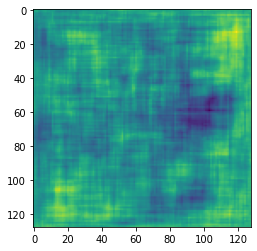

In [11]:
generator = build_generator(SEED_SIZE, IMAGE_CHANNELS)

noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0])

In [12]:
image_shape = (GENERATE_SQUARE,GENERATE_SQUARE,IMAGE_CHANNELS)

discriminator = build_discriminator(image_shape)
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.5001988]], shape=(1, 1), dtype=float32)


In [13]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [14]:
generator_optimizer = tf.keras.optimizers.Adam(1.5e-4,0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1.5e-4,0.5)

In [15]:
@tf.function
def train_step(images):
    seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(seed, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    

        gradients_of_generator = gen_tape.gradient(
            gen_loss, generator.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(
            disc_loss, discriminator.trainable_variables)

        generator_optimizer.apply_gradients(zip(
            gradients_of_generator, generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(
            gradients_of_discriminator, 
            discriminator.trainable_variables))
    return gen_loss,disc_loss

In [16]:
def train(dataset, epochs):
    fixed_seed = np.random.normal(0, 1, (PREVIEW_ROWS * PREVIEW_COLS, 
                                       SEED_SIZE))
    start = time.time()

    for epoch in range(epochs):
        epoch_start = time.time()

        gen_loss_list = []
        disc_loss_list = []

        for image_batch in dataset:
            t = train_step(image_batch)
            gen_loss_list.append(t[0])
            disc_loss_list.append(t[1])

        g_loss = sum(gen_loss_list) / len(gen_loss_list)
        d_loss = sum(disc_loss_list) / len(disc_loss_list)

        epoch_elapsed = time.time()-epoch_start
        print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss},'
               ' {hms_string(epoch_elapsed)}')
        save_images(epoch,fixed_seed)

    elapsed = time.time()-start
    print (f'Training time: {hms_string(elapsed)}')

In [17]:
train(train_dataset, EPOCHS)

Epoch 1, gen loss=0.42663896083831787,disc loss=1.8866808414459229, {hms_string(epoch_elapsed)}
Epoch 2, gen loss=5.195921897888184,disc loss=3.3968353271484375, {hms_string(epoch_elapsed)}
Epoch 3, gen loss=0.866423487663269,disc loss=0.8662843108177185, {hms_string(epoch_elapsed)}
Epoch 4, gen loss=0.8520402908325195,disc loss=1.0447653532028198, {hms_string(epoch_elapsed)}
Epoch 5, gen loss=1.9778846502304077,disc loss=0.8271586894989014, {hms_string(epoch_elapsed)}
Epoch 6, gen loss=1.422895908355713,disc loss=1.026929259300232, {hms_string(epoch_elapsed)}
Epoch 7, gen loss=0.6667273044586182,disc loss=1.4089324474334717, {hms_string(epoch_elapsed)}
Epoch 8, gen loss=2.9567883014678955,disc loss=2.1411473751068115, {hms_string(epoch_elapsed)}
Epoch 9, gen loss=0.2671120762825012,disc loss=2.0898072719573975, {hms_string(epoch_elapsed)}
Epoch 10, gen loss=2.794919013977051,disc loss=1.496572732925415, {hms_string(epoch_elapsed)}
Epoch 11, gen loss=1.0956603288650513,disc loss=1.1708

Epoch 87, gen loss=1.3398311138153076,disc loss=0.7019310593605042, {hms_string(epoch_elapsed)}
Epoch 88, gen loss=4.100613594055176,disc loss=0.31825578212738037, {hms_string(epoch_elapsed)}
Epoch 89, gen loss=2.994215965270996,disc loss=0.3011634349822998, {hms_string(epoch_elapsed)}
Epoch 90, gen loss=2.0976109504699707,disc loss=0.46339157223701477, {hms_string(epoch_elapsed)}
Epoch 91, gen loss=3.9208831787109375,disc loss=0.7076452374458313, {hms_string(epoch_elapsed)}
Epoch 92, gen loss=1.3226203918457031,disc loss=0.6741905808448792, {hms_string(epoch_elapsed)}
Epoch 93, gen loss=3.972957134246826,disc loss=0.653441309928894, {hms_string(epoch_elapsed)}
Epoch 94, gen loss=2.067898750305176,disc loss=0.4723820686340332, {hms_string(epoch_elapsed)}
Epoch 95, gen loss=3.1689794063568115,disc loss=0.4009859561920166, {hms_string(epoch_elapsed)}
Epoch 96, gen loss=1.831176996231079,disc loss=0.528289794921875, {hms_string(epoch_elapsed)}
Epoch 97, gen loss=4.705036163330078,disc los

Epoch 173, gen loss=2.4479377269744873,disc loss=0.40891849994659424, {hms_string(epoch_elapsed)}
Epoch 174, gen loss=3.081554412841797,disc loss=0.3551088273525238, {hms_string(epoch_elapsed)}
Epoch 175, gen loss=3.3314671516418457,disc loss=0.35471946001052856, {hms_string(epoch_elapsed)}
Epoch 176, gen loss=1.8230754137039185,disc loss=0.4812125265598297, {hms_string(epoch_elapsed)}
Epoch 177, gen loss=4.094870567321777,disc loss=0.4221094250679016, {hms_string(epoch_elapsed)}
Epoch 178, gen loss=2.410731315612793,disc loss=0.44964489340782166, {hms_string(epoch_elapsed)}
Epoch 179, gen loss=4.128421783447266,disc loss=0.2673436403274536, {hms_string(epoch_elapsed)}
Epoch 180, gen loss=3.6401586532592773,disc loss=0.25705230236053467, {hms_string(epoch_elapsed)}
Epoch 181, gen loss=1.527345061302185,disc loss=0.7691717743873596, {hms_string(epoch_elapsed)}
Epoch 182, gen loss=6.169981479644775,disc loss=0.7614560723304749, {hms_string(epoch_elapsed)}
Epoch 183, gen loss=1.8830749988

Epoch 258, gen loss=4.310779094696045,disc loss=0.2668701410293579, {hms_string(epoch_elapsed)}
Epoch 259, gen loss=3.9086923599243164,disc loss=0.2654891908168793, {hms_string(epoch_elapsed)}
Epoch 260, gen loss=1.8485134840011597,disc loss=0.6194267272949219, {hms_string(epoch_elapsed)}
Epoch 261, gen loss=5.314348220825195,disc loss=0.4311535060405731, {hms_string(epoch_elapsed)}
Epoch 262, gen loss=3.5643017292022705,disc loss=0.1983790099620819, {hms_string(epoch_elapsed)}
Epoch 263, gen loss=1.953747272491455,disc loss=0.4638672471046448, {hms_string(epoch_elapsed)}
Epoch 264, gen loss=4.945870399475098,disc loss=0.5889832973480225, {hms_string(epoch_elapsed)}
Epoch 265, gen loss=1.8852006196975708,disc loss=0.6356976628303528, {hms_string(epoch_elapsed)}
Epoch 266, gen loss=4.059044361114502,disc loss=0.5391600728034973, {hms_string(epoch_elapsed)}
Epoch 267, gen loss=1.4985636472702026,disc loss=0.818531334400177, {hms_string(epoch_elapsed)}
Epoch 268, gen loss=7.34880685806274

Epoch 343, gen loss=3.6794586181640625,disc loss=0.30781352519989014, {hms_string(epoch_elapsed)}
Epoch 344, gen loss=3.4077882766723633,disc loss=0.3406190872192383, {hms_string(epoch_elapsed)}
Epoch 345, gen loss=2.726567268371582,disc loss=0.45015713572502136, {hms_string(epoch_elapsed)}
Epoch 346, gen loss=4.074887275695801,disc loss=0.39907708764076233, {hms_string(epoch_elapsed)}
Epoch 347, gen loss=1.6047316789627075,disc loss=0.9113279581069946, {hms_string(epoch_elapsed)}
Epoch 348, gen loss=7.262033462524414,disc loss=0.9532507658004761, {hms_string(epoch_elapsed)}
Epoch 349, gen loss=2.816500663757324,disc loss=0.259844571352005, {hms_string(epoch_elapsed)}
Epoch 350, gen loss=2.560588836669922,disc loss=0.3001876175403595, {hms_string(epoch_elapsed)}
Epoch 351, gen loss=6.697671890258789,disc loss=0.1302017718553543, {hms_string(epoch_elapsed)}
Epoch 352, gen loss=4.0340118408203125,disc loss=0.2068559229373932, {hms_string(epoch_elapsed)}
Epoch 353, gen loss=2.999849796295

Epoch 428, gen loss=1.1887872219085693,disc loss=1.391806721687317, {hms_string(epoch_elapsed)}
Epoch 429, gen loss=12.188591003417969,disc loss=1.8449755907058716, {hms_string(epoch_elapsed)}
Epoch 430, gen loss=3.8255457878112793,disc loss=0.32645004987716675, {hms_string(epoch_elapsed)}
Epoch 431, gen loss=0.9153056144714355,disc loss=1.2331409454345703, {hms_string(epoch_elapsed)}
Epoch 432, gen loss=13.35805892944336,disc loss=1.5919169187545776, {hms_string(epoch_elapsed)}
Epoch 433, gen loss=6.426434516906738,disc loss=0.053552642464637756, {hms_string(epoch_elapsed)}
Epoch 434, gen loss=1.0024144649505615,disc loss=1.2354512214660645, {hms_string(epoch_elapsed)}
Epoch 435, gen loss=10.983592987060547,disc loss=1.0956913232803345, {hms_string(epoch_elapsed)}
Epoch 436, gen loss=6.197418212890625,disc loss=0.16071376204490662, {hms_string(epoch_elapsed)}
Epoch 437, gen loss=1.2361891269683838,disc loss=1.3267420530319214, {hms_string(epoch_elapsed)}
Epoch 438, gen loss=10.7533626

Epoch 513, gen loss=16.514240264892578,disc loss=2.7768802642822266, {hms_string(epoch_elapsed)}
Epoch 514, gen loss=11.064062118530273,disc loss=0.1036047488451004, {hms_string(epoch_elapsed)}
Epoch 515, gen loss=2.2732033729553223,disc loss=0.6815621256828308, {hms_string(epoch_elapsed)}
Epoch 516, gen loss=2.8765668869018555,disc loss=0.4322427809238434, {hms_string(epoch_elapsed)}
Epoch 517, gen loss=6.505135536193848,disc loss=0.12825538218021393, {hms_string(epoch_elapsed)}
Epoch 518, gen loss=4.654267311096191,disc loss=0.3904988169670105, {hms_string(epoch_elapsed)}
Epoch 519, gen loss=1.069900631904602,disc loss=1.4935120344161987, {hms_string(epoch_elapsed)}
Epoch 520, gen loss=12.835897445678711,disc loss=2.6422760486602783, {hms_string(epoch_elapsed)}
Epoch 521, gen loss=4.939259052276611,disc loss=0.094443678855896, {hms_string(epoch_elapsed)}
Epoch 522, gen loss=0.8380398750305176,disc loss=1.9245986938476562, {hms_string(epoch_elapsed)}
Epoch 523, gen loss=14.55113697052

Epoch 598, gen loss=1.3476752042770386,disc loss=0.961353600025177, {hms_string(epoch_elapsed)}
Epoch 599, gen loss=11.937135696411133,disc loss=0.5333297848701477, {hms_string(epoch_elapsed)}
Epoch 600, gen loss=9.7225341796875,disc loss=0.2658455967903137, {hms_string(epoch_elapsed)}
Epoch 601, gen loss=2.0469038486480713,disc loss=0.5755861401557922, {hms_string(epoch_elapsed)}
Epoch 602, gen loss=6.219270706176758,disc loss=0.2540402412414551, {hms_string(epoch_elapsed)}
Epoch 603, gen loss=4.382753372192383,disc loss=0.3179612159729004, {hms_string(epoch_elapsed)}
Epoch 604, gen loss=1.6736048460006714,disc loss=1.288291573524475, {hms_string(epoch_elapsed)}
Epoch 605, gen loss=10.787140846252441,disc loss=2.756030321121216, {hms_string(epoch_elapsed)}
Epoch 606, gen loss=0.5443370342254639,disc loss=2.1690056324005127, {hms_string(epoch_elapsed)}
Epoch 607, gen loss=18.154909133911133,disc loss=0.6223238706588745, {hms_string(epoch_elapsed)}
Epoch 608, gen loss=16.88326072692871,

Epoch 683, gen loss=9.755647659301758,disc loss=0.1893083155155182, {hms_string(epoch_elapsed)}
Epoch 684, gen loss=7.5986528396606445,disc loss=0.14257720112800598, {hms_string(epoch_elapsed)}
Epoch 685, gen loss=2.7092342376708984,disc loss=0.7081665992736816, {hms_string(epoch_elapsed)}
Epoch 686, gen loss=6.849282741546631,disc loss=0.5561157464981079, {hms_string(epoch_elapsed)}
Epoch 687, gen loss=1.2510287761688232,disc loss=0.9099514484405518, {hms_string(epoch_elapsed)}
Epoch 688, gen loss=11.450605392456055,disc loss=1.214096188545227, {hms_string(epoch_elapsed)}
Epoch 689, gen loss=5.1462297439575195,disc loss=0.08617981523275375, {hms_string(epoch_elapsed)}
Epoch 690, gen loss=0.9959505200386047,disc loss=1.6249698400497437, {hms_string(epoch_elapsed)}
Epoch 691, gen loss=15.723328590393066,disc loss=1.5241637229919434, {hms_string(epoch_elapsed)}
Epoch 692, gen loss=11.619247436523438,disc loss=0.1248711347579956, {hms_string(epoch_elapsed)}
Epoch 693, gen loss=3.487258911

Epoch 769, gen loss=0.13233137130737305,disc loss=4.975355625152588, {hms_string(epoch_elapsed)}
Epoch 770, gen loss=26.71855926513672,disc loss=2.6030123233795166, {hms_string(epoch_elapsed)}
Epoch 771, gen loss=21.697965621948242,disc loss=0.7483545541763306, {hms_string(epoch_elapsed)}
Epoch 772, gen loss=5.846928596496582,disc loss=0.031486812978982925, {hms_string(epoch_elapsed)}
Epoch 773, gen loss=0.37768256664276123,disc loss=2.7837111949920654, {hms_string(epoch_elapsed)}
Epoch 774, gen loss=22.96842384338379,disc loss=1.5699049234390259, {hms_string(epoch_elapsed)}
Epoch 775, gen loss=22.978099822998047,disc loss=0.836205005645752, {hms_string(epoch_elapsed)}
Epoch 776, gen loss=13.256820678710938,disc loss=0.03898293524980545, {hms_string(epoch_elapsed)}
Epoch 777, gen loss=5.419474124908447,disc loss=0.07932869344949722, {hms_string(epoch_elapsed)}
Epoch 778, gen loss=1.4174129962921143,disc loss=1.2566217184066772, {hms_string(epoch_elapsed)}
Epoch 779, gen loss=12.8269519

Epoch 854, gen loss=3.7416582107543945,disc loss=0.24693965911865234, {hms_string(epoch_elapsed)}
Epoch 855, gen loss=4.009481430053711,disc loss=0.1385010927915573, {hms_string(epoch_elapsed)}
Epoch 856, gen loss=3.9818098545074463,disc loss=0.3089064657688141, {hms_string(epoch_elapsed)}
Epoch 857, gen loss=5.760884761810303,disc loss=0.2801973819732666, {hms_string(epoch_elapsed)}
Epoch 858, gen loss=2.193093776702881,disc loss=0.891075611114502, {hms_string(epoch_elapsed)}
Epoch 859, gen loss=10.6437406539917,disc loss=0.34081897139549255, {hms_string(epoch_elapsed)}
Epoch 860, gen loss=7.965904235839844,disc loss=0.41661038994789124, {hms_string(epoch_elapsed)}
Epoch 861, gen loss=1.0908563137054443,disc loss=1.2653181552886963, {hms_string(epoch_elapsed)}
Epoch 862, gen loss=14.986124038696289,disc loss=0.9140064120292664, {hms_string(epoch_elapsed)}
Epoch 863, gen loss=12.001932144165039,disc loss=0.18563030660152435, {hms_string(epoch_elapsed)}
Epoch 864, gen loss=2.10596513748

Epoch 940, gen loss=5.053663730621338,disc loss=0.12998956441879272, {hms_string(epoch_elapsed)}
Epoch 941, gen loss=3.1118335723876953,disc loss=0.364507257938385, {hms_string(epoch_elapsed)}
Epoch 942, gen loss=5.316163063049316,disc loss=0.3433504104614258, {hms_string(epoch_elapsed)}
Epoch 943, gen loss=3.896585464477539,disc loss=0.4041686952114105, {hms_string(epoch_elapsed)}
Epoch 944, gen loss=3.1210174560546875,disc loss=0.3407956659793854, {hms_string(epoch_elapsed)}
Epoch 945, gen loss=6.91670560836792,disc loss=0.08684401959180832, {hms_string(epoch_elapsed)}
Epoch 946, gen loss=5.78562593460083,disc loss=0.18174386024475098, {hms_string(epoch_elapsed)}
Epoch 947, gen loss=4.6619415283203125,disc loss=0.13337098062038422, {hms_string(epoch_elapsed)}
Epoch 948, gen loss=4.3532514572143555,disc loss=0.3041658103466034, {hms_string(epoch_elapsed)}
Epoch 949, gen loss=3.163145065307617,disc loss=0.34616637229919434, {hms_string(epoch_elapsed)}
Epoch 950, gen loss=5.665015220642

Epoch 1025, gen loss=3.4504265785217285,disc loss=0.17251497507095337, {hms_string(epoch_elapsed)}
Epoch 1026, gen loss=3.132509708404541,disc loss=0.28247877955436707, {hms_string(epoch_elapsed)}
Epoch 1027, gen loss=7.618415355682373,disc loss=0.26034781336784363, {hms_string(epoch_elapsed)}
Epoch 1028, gen loss=5.117657661437988,disc loss=0.14881564676761627, {hms_string(epoch_elapsed)}
Epoch 1029, gen loss=2.9891881942749023,disc loss=0.4042476713657379, {hms_string(epoch_elapsed)}
Epoch 1030, gen loss=9.247945785522461,disc loss=0.20639921724796295, {hms_string(epoch_elapsed)}
Epoch 1031, gen loss=7.360479354858398,disc loss=0.19614888727664948, {hms_string(epoch_elapsed)}
Epoch 1032, gen loss=2.8802168369293213,disc loss=0.3306201696395874, {hms_string(epoch_elapsed)}
Epoch 1033, gen loss=5.6844940185546875,disc loss=0.1601434201002121, {hms_string(epoch_elapsed)}
Epoch 1034, gen loss=4.151845932006836,disc loss=0.25857385993003845, {hms_string(epoch_elapsed)}
Epoch 1035, gen los

Epoch 1109, gen loss=4.962430000305176,disc loss=0.10694930702447891, {hms_string(epoch_elapsed)}
Epoch 1110, gen loss=4.772590637207031,disc loss=0.15036140382289886, {hms_string(epoch_elapsed)}
Epoch 1111, gen loss=3.227482318878174,disc loss=0.3004887104034424, {hms_string(epoch_elapsed)}
Epoch 1112, gen loss=5.895591735839844,disc loss=0.21644732356071472, {hms_string(epoch_elapsed)}
Epoch 1113, gen loss=5.700470447540283,disc loss=0.2038152515888214, {hms_string(epoch_elapsed)}
Epoch 1114, gen loss=2.391794204711914,disc loss=0.4493328630924225, {hms_string(epoch_elapsed)}
Epoch 1115, gen loss=9.997740745544434,disc loss=0.6608160734176636, {hms_string(epoch_elapsed)}
Epoch 1116, gen loss=6.753971099853516,disc loss=0.1978026181459427, {hms_string(epoch_elapsed)}
Epoch 1117, gen loss=2.4384355545043945,disc loss=0.5417242646217346, {hms_string(epoch_elapsed)}
Epoch 1118, gen loss=9.315570831298828,disc loss=0.18720225989818573, {hms_string(epoch_elapsed)}
Epoch 1119, gen loss=9.30

Epoch 1193, gen loss=3.4707822799682617,disc loss=0.27740344405174255, {hms_string(epoch_elapsed)}
Epoch 1194, gen loss=5.038176536560059,disc loss=0.3335880637168884, {hms_string(epoch_elapsed)}
Epoch 1195, gen loss=6.133440017700195,disc loss=0.15090316534042358, {hms_string(epoch_elapsed)}
Epoch 1196, gen loss=4.792534828186035,disc loss=0.07255225628614426, {hms_string(epoch_elapsed)}
Epoch 1197, gen loss=5.300361156463623,disc loss=0.10393619537353516, {hms_string(epoch_elapsed)}
Epoch 1198, gen loss=4.141695976257324,disc loss=0.15951669216156006, {hms_string(epoch_elapsed)}
Epoch 1199, gen loss=6.4524359703063965,disc loss=0.11325564235448837, {hms_string(epoch_elapsed)}
Epoch 1200, gen loss=4.33251953125,disc loss=0.2577325105667114, {hms_string(epoch_elapsed)}
Epoch 1201, gen loss=4.62839412689209,disc loss=0.08733604848384857, {hms_string(epoch_elapsed)}
Epoch 1202, gen loss=5.767240524291992,disc loss=0.09218005836009979, {hms_string(epoch_elapsed)}
Epoch 1203, gen loss=4.35

Epoch 1277, gen loss=5.044403076171875,disc loss=0.095908522605896, {hms_string(epoch_elapsed)}
Epoch 1278, gen loss=2.975637435913086,disc loss=0.29526400566101074, {hms_string(epoch_elapsed)}
Epoch 1279, gen loss=10.565868377685547,disc loss=0.3384159505367279, {hms_string(epoch_elapsed)}
Epoch 1280, gen loss=8.353073120117188,disc loss=0.05830413103103638, {hms_string(epoch_elapsed)}
Epoch 1281, gen loss=4.136162757873535,disc loss=0.1591298133134842, {hms_string(epoch_elapsed)}
Epoch 1282, gen loss=4.365508079528809,disc loss=0.09705613553524017, {hms_string(epoch_elapsed)}
Epoch 1283, gen loss=6.250088691711426,disc loss=0.10009422898292542, {hms_string(epoch_elapsed)}
Epoch 1284, gen loss=5.332154273986816,disc loss=0.040191616863012314, {hms_string(epoch_elapsed)}
Epoch 1285, gen loss=3.9957423210144043,disc loss=0.18125686049461365, {hms_string(epoch_elapsed)}
Epoch 1286, gen loss=7.686587333679199,disc loss=0.07858870178461075, {hms_string(epoch_elapsed)}
Epoch 1287, gen loss=

Epoch 1362, gen loss=7.070749282836914,disc loss=0.14235153794288635, {hms_string(epoch_elapsed)}
Epoch 1363, gen loss=3.9080100059509277,disc loss=0.21624204516410828, {hms_string(epoch_elapsed)}
Epoch 1364, gen loss=6.743619918823242,disc loss=0.0643041729927063, {hms_string(epoch_elapsed)}
Epoch 1365, gen loss=5.886507034301758,disc loss=0.09332152456045151, {hms_string(epoch_elapsed)}
Epoch 1366, gen loss=3.1376266479492188,disc loss=0.2546432912349701, {hms_string(epoch_elapsed)}
Epoch 1367, gen loss=8.50663948059082,disc loss=0.22380320727825165, {hms_string(epoch_elapsed)}
Epoch 1368, gen loss=5.501514434814453,disc loss=0.14482048153877258, {hms_string(epoch_elapsed)}
Epoch 1369, gen loss=2.8780298233032227,disc loss=0.40426790714263916, {hms_string(epoch_elapsed)}
Epoch 1370, gen loss=13.107231140136719,disc loss=0.2380557805299759, {hms_string(epoch_elapsed)}
Epoch 1371, gen loss=11.103279113769531,disc loss=0.16337595880031586, {hms_string(epoch_elapsed)}
Epoch 1372, gen los

Epoch 1447, gen loss=5.18855094909668,disc loss=0.12776750326156616, {hms_string(epoch_elapsed)}
Epoch 1448, gen loss=4.815262317657471,disc loss=0.14520707726478577, {hms_string(epoch_elapsed)}
Epoch 1449, gen loss=5.766518592834473,disc loss=0.1477264165878296, {hms_string(epoch_elapsed)}
Epoch 1450, gen loss=6.659750461578369,disc loss=0.055112868547439575, {hms_string(epoch_elapsed)}
Epoch 1451, gen loss=4.959763526916504,disc loss=0.17549721896648407, {hms_string(epoch_elapsed)}
Epoch 1452, gen loss=5.4547648429870605,disc loss=0.09586181491613388, {hms_string(epoch_elapsed)}
Epoch 1453, gen loss=4.8244829177856445,disc loss=0.06350523978471756, {hms_string(epoch_elapsed)}
Epoch 1454, gen loss=6.217503547668457,disc loss=0.07878836989402771, {hms_string(epoch_elapsed)}
Epoch 1455, gen loss=7.011188507080078,disc loss=0.06883224844932556, {hms_string(epoch_elapsed)}
Epoch 1456, gen loss=5.188381195068359,disc loss=0.07631143927574158, {hms_string(epoch_elapsed)}
Epoch 1457, gen los

Epoch 1531, gen loss=2.3253307342529297,disc loss=0.38365477323532104, {hms_string(epoch_elapsed)}
Epoch 1532, gen loss=11.060100555419922,disc loss=0.4825475811958313, {hms_string(epoch_elapsed)}
Epoch 1533, gen loss=7.736837863922119,disc loss=0.051925886422395706, {hms_string(epoch_elapsed)}
Epoch 1534, gen loss=3.329063653945923,disc loss=0.23193781077861786, {hms_string(epoch_elapsed)}
Epoch 1535, gen loss=8.266402244567871,disc loss=0.015814224258065224, {hms_string(epoch_elapsed)}
Epoch 1536, gen loss=8.84649658203125,disc loss=0.07910076528787613, {hms_string(epoch_elapsed)}
Epoch 1537, gen loss=6.959116458892822,disc loss=0.019175510853528976, {hms_string(epoch_elapsed)}
Epoch 1538, gen loss=4.258409023284912,disc loss=0.1101507917046547, {hms_string(epoch_elapsed)}
Epoch 1539, gen loss=6.766594886779785,disc loss=0.12311746180057526, {hms_string(epoch_elapsed)}
Epoch 1540, gen loss=5.80355167388916,disc loss=0.052444860339164734, {hms_string(epoch_elapsed)}
Epoch 1541, gen lo

Epoch 1615, gen loss=14.832992553710938,disc loss=0.5996633172035217, {hms_string(epoch_elapsed)}
Epoch 1616, gen loss=10.003814697265625,disc loss=0.13991840183734894, {hms_string(epoch_elapsed)}
Epoch 1617, gen loss=2.2994422912597656,disc loss=0.6148335933685303, {hms_string(epoch_elapsed)}
Epoch 1618, gen loss=17.531036376953125,disc loss=1.1472153663635254, {hms_string(epoch_elapsed)}
Epoch 1619, gen loss=9.656249046325684,disc loss=0.024280112236738205, {hms_string(epoch_elapsed)}
Epoch 1620, gen loss=3.02524733543396,disc loss=0.2905518114566803, {hms_string(epoch_elapsed)}
Epoch 1621, gen loss=8.691973686218262,disc loss=0.010097862221300602, {hms_string(epoch_elapsed)}
Epoch 1622, gen loss=9.157332420349121,disc loss=0.021932311356067657, {hms_string(epoch_elapsed)}
Epoch 1623, gen loss=7.122489929199219,disc loss=0.08691039681434631, {hms_string(epoch_elapsed)}
Epoch 1624, gen loss=3.0111703872680664,disc loss=0.2608368992805481, {hms_string(epoch_elapsed)}
Epoch 1625, gen lo

Epoch 1699, gen loss=12.242704391479492,disc loss=0.004341166466474533, {hms_string(epoch_elapsed)}
Epoch 1700, gen loss=6.920914173126221,disc loss=0.009016298688948154, {hms_string(epoch_elapsed)}
Epoch 1701, gen loss=3.0872836112976074,disc loss=0.254751592874527, {hms_string(epoch_elapsed)}
Epoch 1702, gen loss=10.373953819274902,disc loss=0.021006759256124496, {hms_string(epoch_elapsed)}
Epoch 1703, gen loss=10.86624526977539,disc loss=0.013766536489129066, {hms_string(epoch_elapsed)}
Epoch 1704, gen loss=8.514239311218262,disc loss=0.02524026855826378, {hms_string(epoch_elapsed)}
Epoch 1705, gen loss=5.1696319580078125,disc loss=0.07339511066675186, {hms_string(epoch_elapsed)}
Epoch 1706, gen loss=3.092967987060547,disc loss=0.3360936641693115, {hms_string(epoch_elapsed)}
Epoch 1707, gen loss=12.09709358215332,disc loss=0.7011079788208008, {hms_string(epoch_elapsed)}
Epoch 1708, gen loss=7.628799915313721,disc loss=0.022457020357251167, {hms_string(epoch_elapsed)}
Epoch 1709, gen

Epoch 1783, gen loss=6.36869478225708,disc loss=0.08915817737579346, {hms_string(epoch_elapsed)}
Epoch 1784, gen loss=6.423401832580566,disc loss=0.04095017910003662, {hms_string(epoch_elapsed)}
Epoch 1785, gen loss=4.341114044189453,disc loss=0.14914700388908386, {hms_string(epoch_elapsed)}
Epoch 1786, gen loss=6.325226783752441,disc loss=0.07934486865997314, {hms_string(epoch_elapsed)}
Epoch 1787, gen loss=5.685507774353027,disc loss=0.06484410166740417, {hms_string(epoch_elapsed)}
Epoch 1788, gen loss=4.286643981933594,disc loss=0.1945771872997284, {hms_string(epoch_elapsed)}
Epoch 1789, gen loss=8.074956893920898,disc loss=0.11122820526361465, {hms_string(epoch_elapsed)}
Epoch 1790, gen loss=5.783517837524414,disc loss=0.0874381735920906, {hms_string(epoch_elapsed)}
Epoch 1791, gen loss=3.7416796684265137,disc loss=0.15597003698349, {hms_string(epoch_elapsed)}
Epoch 1792, gen loss=7.277045726776123,disc loss=0.07068731635808945, {hms_string(epoch_elapsed)}
Epoch 1793, gen loss=7.87

Epoch 1867, gen loss=6.952937126159668,disc loss=0.1468004733324051, {hms_string(epoch_elapsed)}
Epoch 1868, gen loss=4.884296417236328,disc loss=0.10415804386138916, {hms_string(epoch_elapsed)}
Epoch 1869, gen loss=5.278905868530273,disc loss=0.06674045324325562, {hms_string(epoch_elapsed)}
Epoch 1870, gen loss=4.500234603881836,disc loss=0.0843101367354393, {hms_string(epoch_elapsed)}
Epoch 1871, gen loss=7.10561990737915,disc loss=0.02890256606042385, {hms_string(epoch_elapsed)}
Epoch 1872, gen loss=6.10692024230957,disc loss=0.12610279023647308, {hms_string(epoch_elapsed)}
Epoch 1873, gen loss=3.287431001663208,disc loss=0.24736632406711578, {hms_string(epoch_elapsed)}
Epoch 1874, gen loss=8.759891510009766,disc loss=0.1338772475719452, {hms_string(epoch_elapsed)}
Epoch 1875, gen loss=8.143940925598145,disc loss=0.0685778558254242, {hms_string(epoch_elapsed)}
Epoch 1876, gen loss=7.782994270324707,disc loss=0.022364865988492966, {hms_string(epoch_elapsed)}
Epoch 1877, gen loss=5.05

Epoch 1951, gen loss=5.405037879943848,disc loss=0.1008201390504837, {hms_string(epoch_elapsed)}
Epoch 1952, gen loss=6.330863952636719,disc loss=0.03442705050110817, {hms_string(epoch_elapsed)}
Epoch 1953, gen loss=6.869651794433594,disc loss=0.03243590146303177, {hms_string(epoch_elapsed)}
Epoch 1954, gen loss=6.120692729949951,disc loss=0.04376563802361488, {hms_string(epoch_elapsed)}
Epoch 1955, gen loss=5.263089656829834,disc loss=0.060601893812417984, {hms_string(epoch_elapsed)}
Epoch 1956, gen loss=5.637652397155762,disc loss=0.054758064448833466, {hms_string(epoch_elapsed)}
Epoch 1957, gen loss=4.470574855804443,disc loss=0.07800306379795074, {hms_string(epoch_elapsed)}
Epoch 1958, gen loss=5.587759494781494,disc loss=0.058657389134168625, {hms_string(epoch_elapsed)}
Epoch 1959, gen loss=5.955216407775879,disc loss=0.0633847638964653, {hms_string(epoch_elapsed)}
Epoch 1960, gen loss=5.7540740966796875,disc loss=0.029545888304710388, {hms_string(epoch_elapsed)}
Epoch 1961, gen l

Epoch 2035, gen loss=6.374200820922852,disc loss=0.08705814182758331, {hms_string(epoch_elapsed)}
Epoch 2036, gen loss=5.800333499908447,disc loss=0.033342599868774414, {hms_string(epoch_elapsed)}
Epoch 2037, gen loss=4.066320896148682,disc loss=0.14873972535133362, {hms_string(epoch_elapsed)}
Epoch 2038, gen loss=7.607745170593262,disc loss=0.3831388056278229, {hms_string(epoch_elapsed)}
Epoch 2039, gen loss=2.5595784187316895,disc loss=0.3687542974948883, {hms_string(epoch_elapsed)}
Epoch 2040, gen loss=11.005509376525879,disc loss=0.19045591354370117, {hms_string(epoch_elapsed)}
Epoch 2041, gen loss=11.995552062988281,disc loss=0.08127819001674652, {hms_string(epoch_elapsed)}
Epoch 2042, gen loss=8.382761001586914,disc loss=0.028909822925925255, {hms_string(epoch_elapsed)}
Epoch 2043, gen loss=4.519205093383789,disc loss=0.07845506817102432, {hms_string(epoch_elapsed)}
Epoch 2044, gen loss=4.513440132141113,disc loss=0.09581336379051208, {hms_string(epoch_elapsed)}
Epoch 2045, gen l

Epoch 2119, gen loss=6.2170586585998535,disc loss=0.03212971240282059, {hms_string(epoch_elapsed)}
Epoch 2120, gen loss=5.474948883056641,disc loss=0.06759123504161835, {hms_string(epoch_elapsed)}
Epoch 2121, gen loss=4.875398635864258,disc loss=0.06723275035619736, {hms_string(epoch_elapsed)}
Epoch 2122, gen loss=7.500741958618164,disc loss=0.07127557694911957, {hms_string(epoch_elapsed)}
Epoch 2123, gen loss=5.458425045013428,disc loss=0.03421391174197197, {hms_string(epoch_elapsed)}
Epoch 2124, gen loss=4.826744556427002,disc loss=0.04894475266337395, {hms_string(epoch_elapsed)}
Epoch 2125, gen loss=7.47426700592041,disc loss=0.0163311418145895, {hms_string(epoch_elapsed)}
Epoch 2126, gen loss=8.045644760131836,disc loss=0.027739552780985832, {hms_string(epoch_elapsed)}
Epoch 2127, gen loss=6.5621867179870605,disc loss=0.05786172300577164, {hms_string(epoch_elapsed)}
Epoch 2128, gen loss=5.887388229370117,disc loss=0.0329580157995224, {hms_string(epoch_elapsed)}
Epoch 2129, gen loss

Epoch 2203, gen loss=8.174509048461914,disc loss=0.04376540333032608, {hms_string(epoch_elapsed)}
Epoch 2204, gen loss=7.718282222747803,disc loss=0.02147040143609047, {hms_string(epoch_elapsed)}
Epoch 2205, gen loss=5.016199111938477,disc loss=0.041298411786556244, {hms_string(epoch_elapsed)}
Epoch 2206, gen loss=4.508476734161377,disc loss=0.13999560475349426, {hms_string(epoch_elapsed)}
Epoch 2207, gen loss=4.576892852783203,disc loss=0.06437982618808746, {hms_string(epoch_elapsed)}
Epoch 2208, gen loss=7.432568073272705,disc loss=0.01306640449911356, {hms_string(epoch_elapsed)}
Epoch 2209, gen loss=7.6130523681640625,disc loss=0.08089156448841095, {hms_string(epoch_elapsed)}
Epoch 2210, gen loss=4.64112663269043,disc loss=0.07497790455818176, {hms_string(epoch_elapsed)}
Epoch 2211, gen loss=4.839704513549805,disc loss=0.04341888427734375, {hms_string(epoch_elapsed)}
Epoch 2212, gen loss=6.464378833770752,disc loss=0.05480797588825226, {hms_string(epoch_elapsed)}
Epoch 2213, gen los

Epoch 2287, gen loss=8.964790344238281,disc loss=0.020008211955428123, {hms_string(epoch_elapsed)}
Epoch 2288, gen loss=5.610621452331543,disc loss=0.05410163477063179, {hms_string(epoch_elapsed)}
Epoch 2289, gen loss=5.920852184295654,disc loss=0.03868831694126129, {hms_string(epoch_elapsed)}
Epoch 2290, gen loss=6.194444179534912,disc loss=0.07735899090766907, {hms_string(epoch_elapsed)}
Epoch 2291, gen loss=6.60384464263916,disc loss=0.05923943594098091, {hms_string(epoch_elapsed)}
Epoch 2292, gen loss=5.497442722320557,disc loss=0.06991730630397797, {hms_string(epoch_elapsed)}
Epoch 2293, gen loss=4.708867073059082,disc loss=0.19886744022369385, {hms_string(epoch_elapsed)}
Epoch 2294, gen loss=6.901585102081299,disc loss=0.011939600110054016, {hms_string(epoch_elapsed)}
Epoch 2295, gen loss=6.571022033691406,disc loss=0.019683603197336197, {hms_string(epoch_elapsed)}
Epoch 2296, gen loss=7.192051887512207,disc loss=0.017021873965859413, {hms_string(epoch_elapsed)}
Epoch 2297, gen l

Epoch 2371, gen loss=7.599992752075195,disc loss=0.03746849298477173, {hms_string(epoch_elapsed)}
Epoch 2372, gen loss=5.247251987457275,disc loss=0.06433477997779846, {hms_string(epoch_elapsed)}
Epoch 2373, gen loss=5.978250503540039,disc loss=0.07411138713359833, {hms_string(epoch_elapsed)}
Epoch 2374, gen loss=5.985723495483398,disc loss=0.09465008229017258, {hms_string(epoch_elapsed)}
Epoch 2375, gen loss=6.479048728942871,disc loss=0.02940269000828266, {hms_string(epoch_elapsed)}
Epoch 2376, gen loss=6.713560104370117,disc loss=0.05153130739927292, {hms_string(epoch_elapsed)}
Epoch 2377, gen loss=6.376086235046387,disc loss=0.0328320674598217, {hms_string(epoch_elapsed)}
Epoch 2378, gen loss=8.435575485229492,disc loss=0.03861527517437935, {hms_string(epoch_elapsed)}
Epoch 2379, gen loss=6.221986770629883,disc loss=0.024919569492340088, {hms_string(epoch_elapsed)}
Epoch 2380, gen loss=5.197078704833984,disc loss=0.060187146067619324, {hms_string(epoch_elapsed)}
Epoch 2381, gen los

Epoch 2456, gen loss=6.482433319091797,disc loss=0.019742749631404877, {hms_string(epoch_elapsed)}
Epoch 2457, gen loss=7.008790016174316,disc loss=0.07402242720127106, {hms_string(epoch_elapsed)}
Epoch 2458, gen loss=5.113032341003418,disc loss=0.08074967563152313, {hms_string(epoch_elapsed)}
Epoch 2459, gen loss=8.639135360717773,disc loss=0.010891707614064217, {hms_string(epoch_elapsed)}
Epoch 2460, gen loss=9.778314590454102,disc loss=0.037441436201334, {hms_string(epoch_elapsed)}
Epoch 2461, gen loss=8.001697540283203,disc loss=0.013577035628259182, {hms_string(epoch_elapsed)}
Epoch 2462, gen loss=6.348125457763672,disc loss=0.0234740749001503, {hms_string(epoch_elapsed)}
Epoch 2463, gen loss=4.137687683105469,disc loss=0.09966371953487396, {hms_string(epoch_elapsed)}
Epoch 2464, gen loss=9.216999053955078,disc loss=0.06346191465854645, {hms_string(epoch_elapsed)}
Epoch 2465, gen loss=9.201398849487305,disc loss=0.0518038347363472, {hms_string(epoch_elapsed)}
Epoch 2466, gen loss=

Epoch 2541, gen loss=7.155696392059326,disc loss=0.020013686269521713, {hms_string(epoch_elapsed)}
Epoch 2542, gen loss=5.059739589691162,disc loss=0.06383192539215088, {hms_string(epoch_elapsed)}
Epoch 2543, gen loss=7.8482666015625,disc loss=0.02865651436150074, {hms_string(epoch_elapsed)}
Epoch 2544, gen loss=7.887505054473877,disc loss=0.03472713381052017, {hms_string(epoch_elapsed)}
Epoch 2545, gen loss=6.100467681884766,disc loss=0.05752713978290558, {hms_string(epoch_elapsed)}
Epoch 2546, gen loss=5.937723636627197,disc loss=0.06278005987405777, {hms_string(epoch_elapsed)}
Epoch 2547, gen loss=4.448321342468262,disc loss=0.11718389391899109, {hms_string(epoch_elapsed)}
Epoch 2548, gen loss=11.741742134094238,disc loss=0.10806097090244293, {hms_string(epoch_elapsed)}
Epoch 2549, gen loss=9.06755542755127,disc loss=0.025310415774583817, {hms_string(epoch_elapsed)}
Epoch 2550, gen loss=6.570696830749512,disc loss=0.018479445949196815, {hms_string(epoch_elapsed)}
Epoch 2551, gen los

Epoch 2625, gen loss=5.422497272491455,disc loss=0.03835558891296387, {hms_string(epoch_elapsed)}
Epoch 2626, gen loss=5.4054412841796875,disc loss=0.06158992275595665, {hms_string(epoch_elapsed)}
Epoch 2627, gen loss=7.188259601593018,disc loss=0.07638371735811234, {hms_string(epoch_elapsed)}
Epoch 2628, gen loss=5.774683952331543,disc loss=0.02633265033364296, {hms_string(epoch_elapsed)}
Epoch 2629, gen loss=6.4209418296813965,disc loss=0.014357383362948895, {hms_string(epoch_elapsed)}
Epoch 2630, gen loss=6.043099403381348,disc loss=0.03573264181613922, {hms_string(epoch_elapsed)}
Epoch 2631, gen loss=8.713037490844727,disc loss=0.014053167775273323, {hms_string(epoch_elapsed)}
Epoch 2632, gen loss=9.32186508178711,disc loss=0.015871722251176834, {hms_string(epoch_elapsed)}
Epoch 2633, gen loss=7.787453651428223,disc loss=0.035645756870508194, {hms_string(epoch_elapsed)}
Epoch 2634, gen loss=4.537814140319824,disc loss=0.07574446499347687, {hms_string(epoch_elapsed)}
Epoch 2635, gen

Epoch 2709, gen loss=8.402485847473145,disc loss=0.009102409705519676, {hms_string(epoch_elapsed)}
Epoch 2710, gen loss=7.855564117431641,disc loss=0.023706845939159393, {hms_string(epoch_elapsed)}
Epoch 2711, gen loss=6.947315216064453,disc loss=0.0174541175365448, {hms_string(epoch_elapsed)}
Epoch 2712, gen loss=5.74367618560791,disc loss=0.04497095197439194, {hms_string(epoch_elapsed)}
Epoch 2713, gen loss=5.4380269050598145,disc loss=0.07557681202888489, {hms_string(epoch_elapsed)}
Epoch 2714, gen loss=9.121513366699219,disc loss=0.04847139120101929, {hms_string(epoch_elapsed)}
Epoch 2715, gen loss=9.7637300491333,disc loss=0.0509164072573185, {hms_string(epoch_elapsed)}
Epoch 2716, gen loss=6.98026180267334,disc loss=0.010357499122619629, {hms_string(epoch_elapsed)}
Epoch 2717, gen loss=5.618934154510498,disc loss=0.019837066531181335, {hms_string(epoch_elapsed)}
Epoch 2718, gen loss=5.98807430267334,disc loss=0.03886255621910095, {hms_string(epoch_elapsed)}
Epoch 2719, gen loss=8

Epoch 2793, gen loss=5.45295524597168,disc loss=0.04258451983332634, {hms_string(epoch_elapsed)}
Epoch 2794, gen loss=8.285078048706055,disc loss=0.05249670147895813, {hms_string(epoch_elapsed)}
Epoch 2795, gen loss=7.731629848480225,disc loss=0.012639295309782028, {hms_string(epoch_elapsed)}
Epoch 2796, gen loss=5.984044075012207,disc loss=0.03299631178379059, {hms_string(epoch_elapsed)}
Epoch 2797, gen loss=7.166660308837891,disc loss=0.018526174128055573, {hms_string(epoch_elapsed)}
Epoch 2798, gen loss=7.819244861602783,disc loss=0.00744161382317543, {hms_string(epoch_elapsed)}
Epoch 2799, gen loss=7.331892013549805,disc loss=0.044023700058460236, {hms_string(epoch_elapsed)}
Epoch 2800, gen loss=7.281118392944336,disc loss=0.011339305900037289, {hms_string(epoch_elapsed)}
Epoch 2801, gen loss=6.513747215270996,disc loss=0.02406890317797661, {hms_string(epoch_elapsed)}
Epoch 2802, gen loss=5.698243618011475,disc loss=0.04260248690843582, {hms_string(epoch_elapsed)}
Epoch 2803, gen l

Epoch 2877, gen loss=7.206463813781738,disc loss=0.01677274890244007, {hms_string(epoch_elapsed)}
Epoch 2878, gen loss=6.150563716888428,disc loss=0.029125427827239037, {hms_string(epoch_elapsed)}
Epoch 2879, gen loss=6.648821830749512,disc loss=0.030721815302968025, {hms_string(epoch_elapsed)}
Epoch 2880, gen loss=5.562958717346191,disc loss=0.04406873136758804, {hms_string(epoch_elapsed)}
Epoch 2881, gen loss=9.215253829956055,disc loss=0.02462543174624443, {hms_string(epoch_elapsed)}
Epoch 2882, gen loss=9.466548919677734,disc loss=0.03267262130975723, {hms_string(epoch_elapsed)}
Epoch 2883, gen loss=8.560762405395508,disc loss=0.006826163735240698, {hms_string(epoch_elapsed)}
Epoch 2884, gen loss=5.924427032470703,disc loss=0.02362244576215744, {hms_string(epoch_elapsed)}
Epoch 2885, gen loss=6.767097473144531,disc loss=0.02393694967031479, {hms_string(epoch_elapsed)}
Epoch 2886, gen loss=7.44564151763916,disc loss=0.01924608275294304, {hms_string(epoch_elapsed)}
Epoch 2887, gen lo

Epoch 2961, gen loss=40.26728057861328,disc loss=0.4166540503501892, {hms_string(epoch_elapsed)}
Epoch 2962, gen loss=22.691448211669922,disc loss=0.0013717298861593008, {hms_string(epoch_elapsed)}
Epoch 2963, gen loss=8.473875045776367,disc loss=0.0041972072795033455, {hms_string(epoch_elapsed)}
Epoch 2964, gen loss=0.4531557857990265,disc loss=4.249823570251465, {hms_string(epoch_elapsed)}
Epoch 2965, gen loss=71.7535171508789,disc loss=9.40464973449707, {hms_string(epoch_elapsed)}
Epoch 2966, gen loss=64.87288665771484,disc loss=0.22135528922080994, {hms_string(epoch_elapsed)}
Epoch 2967, gen loss=43.209716796875,disc loss=0.01087113469839096, {hms_string(epoch_elapsed)}
Epoch 2968, gen loss=19.395423889160156,disc loss=0.003078110981732607, {hms_string(epoch_elapsed)}
Epoch 2969, gen loss=2.8875975608825684,disc loss=0.8264870643615723, {hms_string(epoch_elapsed)}
Epoch 2970, gen loss=15.429008483886719,disc loss=3.419105996727012e-05, {hms_string(epoch_elapsed)}
Epoch 2971, gen lo

Epoch 3045, gen loss=5.403463363647461,disc loss=0.030048618093132973, {hms_string(epoch_elapsed)}
Epoch 3046, gen loss=5.691588401794434,disc loss=0.06965883821249008, {hms_string(epoch_elapsed)}
Epoch 3047, gen loss=8.928791046142578,disc loss=0.12090984731912613, {hms_string(epoch_elapsed)}
Epoch 3048, gen loss=6.525322914123535,disc loss=0.08736506849527359, {hms_string(epoch_elapsed)}
Epoch 3049, gen loss=3.1918559074401855,disc loss=0.3063279688358307, {hms_string(epoch_elapsed)}
Epoch 3050, gen loss=17.419898986816406,disc loss=0.2008926123380661, {hms_string(epoch_elapsed)}
Epoch 3051, gen loss=19.27150535583496,disc loss=0.08078624308109283, {hms_string(epoch_elapsed)}
Epoch 3052, gen loss=16.54568862915039,disc loss=0.010977201163768768, {hms_string(epoch_elapsed)}
Epoch 3053, gen loss=11.432950019836426,disc loss=0.05277888476848602, {hms_string(epoch_elapsed)}
Epoch 3054, gen loss=6.202089309692383,disc loss=0.033150386065244675, {hms_string(epoch_elapsed)}
Epoch 3055, gen 

Epoch 3129, gen loss=9.021821022033691,disc loss=0.026779357343912125, {hms_string(epoch_elapsed)}
Epoch 3130, gen loss=6.420365810394287,disc loss=0.043008849024772644, {hms_string(epoch_elapsed)}
Epoch 3131, gen loss=8.289993286132812,disc loss=0.045219674706459045, {hms_string(epoch_elapsed)}
Epoch 3132, gen loss=9.514945030212402,disc loss=0.017467020079493523, {hms_string(epoch_elapsed)}
Epoch 3133, gen loss=7.773256778717041,disc loss=0.027330204844474792, {hms_string(epoch_elapsed)}
Epoch 3134, gen loss=7.115203857421875,disc loss=0.0339866504073143, {hms_string(epoch_elapsed)}
Epoch 3135, gen loss=6.244450569152832,disc loss=0.04017996788024902, {hms_string(epoch_elapsed)}
Epoch 3136, gen loss=6.7814507484436035,disc loss=0.04530716314911842, {hms_string(epoch_elapsed)}
Epoch 3137, gen loss=5.653281211853027,disc loss=0.08519645035266876, {hms_string(epoch_elapsed)}
Epoch 3138, gen loss=9.001173973083496,disc loss=0.10293072462081909, {hms_string(epoch_elapsed)}
Epoch 3139, gen

Epoch 3213, gen loss=20.83050537109375,disc loss=0.41549915075302124, {hms_string(epoch_elapsed)}
Epoch 3214, gen loss=18.633581161499023,disc loss=0.03496598079800606, {hms_string(epoch_elapsed)}
Epoch 3215, gen loss=13.515697479248047,disc loss=0.0020933332853019238, {hms_string(epoch_elapsed)}
Epoch 3216, gen loss=9.342287063598633,disc loss=0.0029846886172890663, {hms_string(epoch_elapsed)}
Epoch 3217, gen loss=4.152304649353027,disc loss=0.09293649345636368, {hms_string(epoch_elapsed)}
Epoch 3218, gen loss=8.127668380737305,disc loss=0.0035250671207904816, {hms_string(epoch_elapsed)}
Epoch 3219, gen loss=8.396821975708008,disc loss=0.01165490597486496, {hms_string(epoch_elapsed)}
Epoch 3220, gen loss=6.641468048095703,disc loss=0.027612648904323578, {hms_string(epoch_elapsed)}
Epoch 3221, gen loss=5.7647857666015625,disc loss=0.05276940017938614, {hms_string(epoch_elapsed)}
Epoch 3222, gen loss=6.533993721008301,disc loss=0.08393561840057373, {hms_string(epoch_elapsed)}
Epoch 3223

Epoch 3297, gen loss=23.350894927978516,disc loss=0.0050097182393074036, {hms_string(epoch_elapsed)}
Epoch 3298, gen loss=11.554450988769531,disc loss=0.002199455862864852, {hms_string(epoch_elapsed)}
Epoch 3299, gen loss=3.1057474613189697,disc loss=0.4658152163028717, {hms_string(epoch_elapsed)}
Epoch 3300, gen loss=26.734512329101562,disc loss=0.05848587304353714, {hms_string(epoch_elapsed)}
Epoch 3301, gen loss=33.02437973022461,disc loss=0.08081726729869843, {hms_string(epoch_elapsed)}
Epoch 3302, gen loss=28.218921661376953,disc loss=0.15901854634284973, {hms_string(epoch_elapsed)}
Epoch 3303, gen loss=17.860652923583984,disc loss=0.005131964571774006, {hms_string(epoch_elapsed)}
Epoch 3304, gen loss=9.606653213500977,disc loss=0.001067307312041521, {hms_string(epoch_elapsed)}
Epoch 3305, gen loss=4.0978617668151855,disc loss=0.164014533162117, {hms_string(epoch_elapsed)}
Epoch 3306, gen loss=13.964309692382812,disc loss=0.002849271520972252, {hms_string(epoch_elapsed)}
Epoch 330

Epoch 3381, gen loss=10.280584335327148,disc loss=0.049679048359394073, {hms_string(epoch_elapsed)}
Epoch 3382, gen loss=5.967972755432129,disc loss=0.0318322516977787, {hms_string(epoch_elapsed)}
Epoch 3383, gen loss=7.340797424316406,disc loss=0.013050179928541183, {hms_string(epoch_elapsed)}
Epoch 3384, gen loss=5.221358776092529,disc loss=0.07073650509119034, {hms_string(epoch_elapsed)}
Epoch 3385, gen loss=7.390806674957275,disc loss=0.05637076497077942, {hms_string(epoch_elapsed)}
Epoch 3386, gen loss=8.443979263305664,disc loss=0.026275500655174255, {hms_string(epoch_elapsed)}
Epoch 3387, gen loss=4.996984004974365,disc loss=0.14485596120357513, {hms_string(epoch_elapsed)}
Epoch 3388, gen loss=12.40842056274414,disc loss=0.067084901034832, {hms_string(epoch_elapsed)}
Epoch 3389, gen loss=11.523005485534668,disc loss=0.004632757510989904, {hms_string(epoch_elapsed)}
Epoch 3390, gen loss=8.972705841064453,disc loss=0.020314045250415802, {hms_string(epoch_elapsed)}
Epoch 3391, gen 

Epoch 3465, gen loss=8.52320384979248,disc loss=0.00897650420665741, {hms_string(epoch_elapsed)}
Epoch 3466, gen loss=6.8765411376953125,disc loss=0.029718168079853058, {hms_string(epoch_elapsed)}
Epoch 3467, gen loss=4.554329872131348,disc loss=0.16826137900352478, {hms_string(epoch_elapsed)}
Epoch 3468, gen loss=15.427806854248047,disc loss=0.20705841481685638, {hms_string(epoch_elapsed)}
Epoch 3469, gen loss=13.15087890625,disc loss=0.004605242051184177, {hms_string(epoch_elapsed)}
Epoch 3470, gen loss=8.338484764099121,disc loss=0.005417550913989544, {hms_string(epoch_elapsed)}
Epoch 3471, gen loss=5.694708824157715,disc loss=0.04993538185954094, {hms_string(epoch_elapsed)}
Epoch 3472, gen loss=6.048786163330078,disc loss=0.021578412503004074, {hms_string(epoch_elapsed)}
Epoch 3473, gen loss=7.52213191986084,disc loss=0.0205540768802166, {hms_string(epoch_elapsed)}
Epoch 3474, gen loss=8.617669105529785,disc loss=0.026241160929203033, {hms_string(epoch_elapsed)}
Epoch 3475, gen los

Epoch 3550, gen loss=7.2992353439331055,disc loss=0.01325869932770729, {hms_string(epoch_elapsed)}
Epoch 3551, gen loss=6.201465606689453,disc loss=0.033301252871751785, {hms_string(epoch_elapsed)}
Epoch 3552, gen loss=6.233475685119629,disc loss=0.07347816973924637, {hms_string(epoch_elapsed)}
Epoch 3553, gen loss=5.848770618438721,disc loss=0.036433540284633636, {hms_string(epoch_elapsed)}
Epoch 3554, gen loss=8.559200286865234,disc loss=0.05342504009604454, {hms_string(epoch_elapsed)}
Epoch 3555, gen loss=8.235673904418945,disc loss=0.014036036096513271, {hms_string(epoch_elapsed)}
Epoch 3556, gen loss=7.576955795288086,disc loss=0.01216166466474533, {hms_string(epoch_elapsed)}
Epoch 3557, gen loss=7.396988391876221,disc loss=0.011803733184933662, {hms_string(epoch_elapsed)}
Epoch 3558, gen loss=7.635551452636719,disc loss=0.021590355783700943, {hms_string(epoch_elapsed)}
Epoch 3559, gen loss=8.24659538269043,disc loss=0.013771820813417435, {hms_string(epoch_elapsed)}
Epoch 3560, ge

Epoch 3633, gen loss=15.674455642700195,disc loss=0.01397761795669794, {hms_string(epoch_elapsed)}
Epoch 3634, gen loss=19.610973358154297,disc loss=0.06736194342374802, {hms_string(epoch_elapsed)}
Epoch 3635, gen loss=17.008756637573242,disc loss=0.03331942483782768, {hms_string(epoch_elapsed)}
Epoch 3636, gen loss=12.701414108276367,disc loss=0.0023831690195947886, {hms_string(epoch_elapsed)}
Epoch 3637, gen loss=9.640373229980469,disc loss=0.001166622620075941, {hms_string(epoch_elapsed)}
Epoch 3638, gen loss=5.7924041748046875,disc loss=0.029947662726044655, {hms_string(epoch_elapsed)}
Epoch 3639, gen loss=7.208003044128418,disc loss=0.014370866119861603, {hms_string(epoch_elapsed)}
Epoch 3640, gen loss=6.756922245025635,disc loss=0.03262466937303543, {hms_string(epoch_elapsed)}
Epoch 3641, gen loss=8.468883514404297,disc loss=0.014517394825816154, {hms_string(epoch_elapsed)}
Epoch 3642, gen loss=8.867789268493652,disc loss=0.006381085608154535, {hms_string(epoch_elapsed)}
Epoch 36

Epoch 3717, gen loss=13.071413040161133,disc loss=0.0351976603269577, {hms_string(epoch_elapsed)}
Epoch 3718, gen loss=10.606377601623535,disc loss=0.0031569472048431635, {hms_string(epoch_elapsed)}
Epoch 3719, gen loss=7.20259952545166,disc loss=0.00858218502253294, {hms_string(epoch_elapsed)}
Epoch 3720, gen loss=5.450656890869141,disc loss=0.03330865502357483, {hms_string(epoch_elapsed)}
Epoch 3721, gen loss=8.450528144836426,disc loss=0.005553371272981167, {hms_string(epoch_elapsed)}
Epoch 3722, gen loss=9.978805541992188,disc loss=0.0008108774782158434, {hms_string(epoch_elapsed)}
Epoch 3723, gen loss=7.690450191497803,disc loss=0.008528776466846466, {hms_string(epoch_elapsed)}
Epoch 3724, gen loss=6.442643165588379,disc loss=0.024301841855049133, {hms_string(epoch_elapsed)}
Epoch 3725, gen loss=6.644824504852295,disc loss=0.0199552234262228, {hms_string(epoch_elapsed)}
Epoch 3726, gen loss=8.229446411132812,disc loss=0.05390670523047447, {hms_string(epoch_elapsed)}
Epoch 3727, ge

Epoch 3801, gen loss=8.574731826782227,disc loss=0.021351944655179977, {hms_string(epoch_elapsed)}
Epoch 3802, gen loss=9.923538208007812,disc loss=0.015637099742889404, {hms_string(epoch_elapsed)}
Epoch 3803, gen loss=8.092229843139648,disc loss=0.012876620516180992, {hms_string(epoch_elapsed)}
Epoch 3804, gen loss=4.32563591003418,disc loss=0.08595030009746552, {hms_string(epoch_elapsed)}
Epoch 3805, gen loss=10.853992462158203,disc loss=0.026725079864263535, {hms_string(epoch_elapsed)}
Epoch 3806, gen loss=12.17156982421875,disc loss=0.1328854262828827, {hms_string(epoch_elapsed)}
Epoch 3807, gen loss=6.54719877243042,disc loss=0.02448171190917492, {hms_string(epoch_elapsed)}
Epoch 3808, gen loss=5.209864616394043,disc loss=0.08300963789224625, {hms_string(epoch_elapsed)}
Epoch 3809, gen loss=12.034868240356445,disc loss=0.008429556153714657, {hms_string(epoch_elapsed)}
Epoch 3810, gen loss=12.640408515930176,disc loss=0.06071975827217102, {hms_string(epoch_elapsed)}
Epoch 3811, gen

Epoch 3885, gen loss=6.666718006134033,disc loss=0.01681118831038475, {hms_string(epoch_elapsed)}
Epoch 3886, gen loss=6.516345977783203,disc loss=0.029596231877803802, {hms_string(epoch_elapsed)}
Epoch 3887, gen loss=6.750863552093506,disc loss=0.02227872796356678, {hms_string(epoch_elapsed)}
Epoch 3888, gen loss=8.057327270507812,disc loss=0.04613786190748215, {hms_string(epoch_elapsed)}
Epoch 3889, gen loss=5.348950386047363,disc loss=0.04852345585823059, {hms_string(epoch_elapsed)}
Epoch 3890, gen loss=8.37509822845459,disc loss=0.05160493403673172, {hms_string(epoch_elapsed)}
Epoch 3891, gen loss=8.226423263549805,disc loss=0.014711341820657253, {hms_string(epoch_elapsed)}
Epoch 3892, gen loss=7.756634712219238,disc loss=0.020356472581624985, {hms_string(epoch_elapsed)}
Epoch 3893, gen loss=8.02271556854248,disc loss=0.0064131878316402435, {hms_string(epoch_elapsed)}
Epoch 3894, gen loss=6.90727424621582,disc loss=0.02086423523724079, {hms_string(epoch_elapsed)}
Epoch 3895, gen lo

Epoch 3968, gen loss=7.154510498046875,disc loss=0.0338587760925293, {hms_string(epoch_elapsed)}
Epoch 3969, gen loss=5.245535373687744,disc loss=0.09813468903303146, {hms_string(epoch_elapsed)}
Epoch 3970, gen loss=15.610809326171875,disc loss=0.041515082120895386, {hms_string(epoch_elapsed)}
Epoch 3971, gen loss=16.857746124267578,disc loss=0.06684767454862595, {hms_string(epoch_elapsed)}
Epoch 3972, gen loss=13.114411354064941,disc loss=0.00041758923907764256, {hms_string(epoch_elapsed)}
Epoch 3973, gen loss=10.77895736694336,disc loss=0.001506736851297319, {hms_string(epoch_elapsed)}
Epoch 3974, gen loss=6.778504371643066,disc loss=0.02216462232172489, {hms_string(epoch_elapsed)}
Epoch 3975, gen loss=6.453055381774902,disc loss=0.03416348248720169, {hms_string(epoch_elapsed)}
Epoch 3976, gen loss=11.935148239135742,disc loss=0.0004900804487988353, {hms_string(epoch_elapsed)}
Epoch 3977, gen loss=12.095088005065918,disc loss=0.08756035566329956, {hms_string(epoch_elapsed)}
Epoch 397

Epoch 4051, gen loss=8.584264755249023,disc loss=0.034820806235075, {hms_string(epoch_elapsed)}
Epoch 4052, gen loss=4.262796401977539,disc loss=0.09313128888607025, {hms_string(epoch_elapsed)}
Epoch 4053, gen loss=14.703570365905762,disc loss=0.09037803113460541, {hms_string(epoch_elapsed)}
Epoch 4054, gen loss=14.396055221557617,disc loss=0.0423128604888916, {hms_string(epoch_elapsed)}
Epoch 4055, gen loss=10.126686096191406,disc loss=0.0023260568268597126, {hms_string(epoch_elapsed)}
Epoch 4056, gen loss=7.315402984619141,disc loss=0.006645543966442347, {hms_string(epoch_elapsed)}
Epoch 4057, gen loss=5.119640827178955,disc loss=0.060118816792964935, {hms_string(epoch_elapsed)}
Epoch 4058, gen loss=12.899818420410156,disc loss=0.004383782856166363, {hms_string(epoch_elapsed)}
Epoch 4059, gen loss=14.741317749023438,disc loss=0.022861935198307037, {hms_string(epoch_elapsed)}
Epoch 4060, gen loss=12.915885925292969,disc loss=0.04601636528968811, {hms_string(epoch_elapsed)}
Epoch 4061,

Epoch 4134, gen loss=29.977718353271484,disc loss=0.846440315246582, {hms_string(epoch_elapsed)}
Epoch 4135, gen loss=19.456218719482422,disc loss=1.0598068911349401e-05, {hms_string(epoch_elapsed)}
Epoch 4136, gen loss=9.39495849609375,disc loss=0.0014027873985469341, {hms_string(epoch_elapsed)}
Epoch 4137, gen loss=0.876429557800293,disc loss=1.372612714767456, {hms_string(epoch_elapsed)}
Epoch 4138, gen loss=96.5972900390625,disc loss=3.6520373821258545, {hms_string(epoch_elapsed)}
Epoch 4139, gen loss=98.47874450683594,disc loss=0.18053194880485535, {hms_string(epoch_elapsed)}
Epoch 4140, gen loss=60.282569885253906,disc loss=0.0020060259848833084, {hms_string(epoch_elapsed)}
Epoch 4141, gen loss=17.975696563720703,disc loss=0.0033545123878866434, {hms_string(epoch_elapsed)}
Epoch 4142, gen loss=0.015851467847824097,disc loss=6.480528354644775, {hms_string(epoch_elapsed)}
Epoch 4143, gen loss=114.66324615478516,disc loss=12.368708610534668, {hms_string(epoch_elapsed)}
Epoch 4144, g

Epoch 4218, gen loss=57.00434875488281,disc loss=6.288243293762207, {hms_string(epoch_elapsed)}
Epoch 4219, gen loss=45.71836471557617,disc loss=0.820065975189209, {hms_string(epoch_elapsed)}
Epoch 4220, gen loss=19.133407592773438,disc loss=3.2949872547760606e-05, {hms_string(epoch_elapsed)}
Epoch 4221, gen loss=0.1989983320236206,disc loss=8.032541275024414, {hms_string(epoch_elapsed)}
Epoch 4222, gen loss=87.908935546875,disc loss=5.2035112380981445, {hms_string(epoch_elapsed)}
Epoch 4223, gen loss=91.86737060546875,disc loss=2.4481542110443115, {hms_string(epoch_elapsed)}
Epoch 4224, gen loss=62.0587158203125,disc loss=0.0373125895857811, {hms_string(epoch_elapsed)}
Epoch 4225, gen loss=25.88189697265625,disc loss=0.001216774107888341, {hms_string(epoch_elapsed)}
Epoch 4226, gen loss=1.6548875570297241,disc loss=1.681701898574829, {hms_string(epoch_elapsed)}
Epoch 4227, gen loss=44.68376159667969,disc loss=0.01648910716176033, {hms_string(epoch_elapsed)}
Epoch 4228, gen loss=47.431

Epoch 4302, gen loss=2.4959964752197266,disc loss=1.017482876777649, {hms_string(epoch_elapsed)}
Epoch 4303, gen loss=23.27750015258789,disc loss=0.004837667569518089, {hms_string(epoch_elapsed)}
Epoch 4304, gen loss=26.837474822998047,disc loss=0.16784529387950897, {hms_string(epoch_elapsed)}
Epoch 4305, gen loss=22.2174072265625,disc loss=0.12796860933303833, {hms_string(epoch_elapsed)}
Epoch 4306, gen loss=12.66357421875,disc loss=0.0678352639079094, {hms_string(epoch_elapsed)}
Epoch 4307, gen loss=2.056711435317993,disc loss=0.7941043376922607, {hms_string(epoch_elapsed)}
Epoch 4308, gen loss=26.95444679260254,disc loss=0.6633283495903015, {hms_string(epoch_elapsed)}
Epoch 4309, gen loss=27.39458465576172,disc loss=0.18889769911766052, {hms_string(epoch_elapsed)}
Epoch 4310, gen loss=16.233068466186523,disc loss=0.0005848384462296963, {hms_string(epoch_elapsed)}
Epoch 4311, gen loss=5.6042399406433105,disc loss=0.19142630696296692, {hms_string(epoch_elapsed)}
Epoch 4312, gen loss=3

Epoch 4386, gen loss=0.8089999556541443,disc loss=2.4173808097839355, {hms_string(epoch_elapsed)}
Epoch 4387, gen loss=51.148643493652344,disc loss=2.373098850250244, {hms_string(epoch_elapsed)}
Epoch 4388, gen loss=54.925079345703125,disc loss=0.47454673051834106, {hms_string(epoch_elapsed)}
Epoch 4389, gen loss=41.93962478637695,disc loss=0.004739263094961643, {hms_string(epoch_elapsed)}
Epoch 4390, gen loss=24.49112892150879,disc loss=0.0001803348568500951, {hms_string(epoch_elapsed)}
Epoch 4391, gen loss=8.806729316711426,disc loss=0.005161265376955271, {hms_string(epoch_elapsed)}
Epoch 4392, gen loss=0.2635200023651123,disc loss=4.227944374084473, {hms_string(epoch_elapsed)}
Epoch 4393, gen loss=67.2174072265625,disc loss=3.394407272338867, {hms_string(epoch_elapsed)}
Epoch 4394, gen loss=77.739501953125,disc loss=2.9668891429901123, {hms_string(epoch_elapsed)}
Epoch 4395, gen loss=58.916385650634766,disc loss=0.038359470665454865, {hms_string(epoch_elapsed)}
Epoch 4396, gen loss=

Epoch 4471, gen loss=5.230371475219727,disc loss=0.38603198528289795, {hms_string(epoch_elapsed)}
Epoch 4472, gen loss=8.865625381469727,disc loss=0.1262160986661911, {hms_string(epoch_elapsed)}
Epoch 4473, gen loss=8.891663551330566,disc loss=0.4193504750728607, {hms_string(epoch_elapsed)}
Epoch 4474, gen loss=3.3938536643981934,disc loss=0.6082884073257446, {hms_string(epoch_elapsed)}
Epoch 4475, gen loss=17.363359451293945,disc loss=0.3989484906196594, {hms_string(epoch_elapsed)}
Epoch 4476, gen loss=16.69424819946289,disc loss=0.4225701689720154, {hms_string(epoch_elapsed)}
Epoch 4477, gen loss=9.25526237487793,disc loss=0.010428892448544502, {hms_string(epoch_elapsed)}
Epoch 4478, gen loss=2.1444602012634277,disc loss=0.9287572503089905, {hms_string(epoch_elapsed)}
Epoch 4479, gen loss=27.391464233398438,disc loss=0.8573368191719055, {hms_string(epoch_elapsed)}
Epoch 4480, gen loss=28.586669921875,disc loss=0.39441871643066406, {hms_string(epoch_elapsed)}
Epoch 4481, gen loss=21.0

Epoch 4555, gen loss=11.457284927368164,disc loss=0.030162688344717026, {hms_string(epoch_elapsed)}
Epoch 4556, gen loss=9.902491569519043,disc loss=0.210868239402771, {hms_string(epoch_elapsed)}
Epoch 4557, gen loss=7.830541133880615,disc loss=0.04107440263032913, {hms_string(epoch_elapsed)}
Epoch 4558, gen loss=4.570502281188965,disc loss=0.2561730444431305, {hms_string(epoch_elapsed)}
Epoch 4559, gen loss=13.256234169006348,disc loss=0.03918195888400078, {hms_string(epoch_elapsed)}
Epoch 4560, gen loss=17.863109588623047,disc loss=0.23356908559799194, {hms_string(epoch_elapsed)}
Epoch 4561, gen loss=14.118714332580566,disc loss=0.0034913374111056328, {hms_string(epoch_elapsed)}
Epoch 4562, gen loss=12.74783706665039,disc loss=0.01860693283379078, {hms_string(epoch_elapsed)}
Epoch 4563, gen loss=9.012009620666504,disc loss=0.01646813377737999, {hms_string(epoch_elapsed)}
Epoch 4564, gen loss=5.810340881347656,disc loss=0.05729705095291138, {hms_string(epoch_elapsed)}
Epoch 4565, gen 

Epoch 4639, gen loss=10.769941329956055,disc loss=0.19152460992336273, {hms_string(epoch_elapsed)}
Epoch 4640, gen loss=9.032275199890137,disc loss=0.06167415529489517, {hms_string(epoch_elapsed)}
Epoch 4641, gen loss=5.5053911209106445,disc loss=0.21997477114200592, {hms_string(epoch_elapsed)}
Epoch 4642, gen loss=7.699840068817139,disc loss=0.06291026622056961, {hms_string(epoch_elapsed)}
Epoch 4643, gen loss=8.266048431396484,disc loss=0.09291829913854599, {hms_string(epoch_elapsed)}
Epoch 4644, gen loss=7.678808212280273,disc loss=0.1263100951910019, {hms_string(epoch_elapsed)}
Epoch 4645, gen loss=6.350510597229004,disc loss=0.0887298583984375, {hms_string(epoch_elapsed)}
Epoch 4646, gen loss=5.649718284606934,disc loss=0.08478309214115143, {hms_string(epoch_elapsed)}
Epoch 4647, gen loss=8.612302780151367,disc loss=0.07348703593015671, {hms_string(epoch_elapsed)}
Epoch 4648, gen loss=7.519382476806641,disc loss=0.2769606411457062, {hms_string(epoch_elapsed)}
Epoch 4649, gen loss=

Epoch 4723, gen loss=4.33656120300293,disc loss=0.3517410159111023, {hms_string(epoch_elapsed)}
Epoch 4724, gen loss=14.586322784423828,disc loss=0.12773679196834564, {hms_string(epoch_elapsed)}
Epoch 4725, gen loss=16.399925231933594,disc loss=0.12771311402320862, {hms_string(epoch_elapsed)}
Epoch 4726, gen loss=13.223455429077148,disc loss=0.006367488298565149, {hms_string(epoch_elapsed)}
Epoch 4727, gen loss=10.529285430908203,disc loss=0.02932540886104107, {hms_string(epoch_elapsed)}
Epoch 4728, gen loss=9.489904403686523,disc loss=0.024835051968693733, {hms_string(epoch_elapsed)}
Epoch 4729, gen loss=8.317625045776367,disc loss=0.03653845191001892, {hms_string(epoch_elapsed)}
Epoch 4730, gen loss=5.955287933349609,disc loss=0.06323584914207458, {hms_string(epoch_elapsed)}
Epoch 4731, gen loss=7.033761024475098,disc loss=0.06429475545883179, {hms_string(epoch_elapsed)}
Epoch 4732, gen loss=7.868067741394043,disc loss=0.07172886282205582, {hms_string(epoch_elapsed)}
Epoch 4733, gen 

Epoch 4807, gen loss=5.459550380706787,disc loss=0.18776163458824158, {hms_string(epoch_elapsed)}
Epoch 4808, gen loss=14.977771759033203,disc loss=0.08676816523075104, {hms_string(epoch_elapsed)}
Epoch 4809, gen loss=15.088074684143066,disc loss=0.2399446964263916, {hms_string(epoch_elapsed)}
Epoch 4810, gen loss=10.46015739440918,disc loss=0.0475115105509758, {hms_string(epoch_elapsed)}
Epoch 4811, gen loss=6.137993812561035,disc loss=0.13338740170001984, {hms_string(epoch_elapsed)}
Epoch 4812, gen loss=8.618486404418945,disc loss=0.02432303875684738, {hms_string(epoch_elapsed)}
Epoch 4813, gen loss=8.370366096496582,disc loss=0.1124628409743309, {hms_string(epoch_elapsed)}
Epoch 4814, gen loss=5.2227864265441895,disc loss=0.1691814363002777, {hms_string(epoch_elapsed)}
Epoch 4815, gen loss=12.791228294372559,disc loss=0.024696189910173416, {hms_string(epoch_elapsed)}
Epoch 4816, gen loss=14.494585990905762,disc loss=0.03357907012104988, {hms_string(epoch_elapsed)}
Epoch 4817, gen lo

Epoch 4891, gen loss=7.785515785217285,disc loss=0.06381142139434814, {hms_string(epoch_elapsed)}
Epoch 4892, gen loss=9.632115364074707,disc loss=0.33592090010643005, {hms_string(epoch_elapsed)}
Epoch 4893, gen loss=6.131159782409668,disc loss=0.0714559480547905, {hms_string(epoch_elapsed)}
Epoch 4894, gen loss=5.986399173736572,disc loss=0.07567093521356583, {hms_string(epoch_elapsed)}
Epoch 4895, gen loss=8.374957084655762,disc loss=0.19443106651306152, {hms_string(epoch_elapsed)}
Epoch 4896, gen loss=8.016233444213867,disc loss=0.01421374548226595, {hms_string(epoch_elapsed)}
Epoch 4897, gen loss=6.916572570800781,disc loss=0.033076196908950806, {hms_string(epoch_elapsed)}
Epoch 4898, gen loss=7.031303405761719,disc loss=0.05234886705875397, {hms_string(epoch_elapsed)}
Epoch 4899, gen loss=8.44986629486084,disc loss=0.020701302215456963, {hms_string(epoch_elapsed)}
Epoch 4900, gen loss=6.436040878295898,disc loss=0.18077096343040466, {hms_string(epoch_elapsed)}
Epoch 4901, gen loss

Epoch 4975, gen loss=11.366376876831055,disc loss=0.005580246448516846, {hms_string(epoch_elapsed)}
Epoch 4976, gen loss=8.426549911499023,disc loss=0.006573105696588755, {hms_string(epoch_elapsed)}
Epoch 4977, gen loss=5.268155097961426,disc loss=0.17342600226402283, {hms_string(epoch_elapsed)}
Epoch 4978, gen loss=12.008933067321777,disc loss=0.0045637586154043674, {hms_string(epoch_elapsed)}
Epoch 4979, gen loss=13.395017623901367,disc loss=0.019599653780460358, {hms_string(epoch_elapsed)}
Epoch 4980, gen loss=12.656754493713379,disc loss=0.027019159868359566, {hms_string(epoch_elapsed)}
Epoch 4981, gen loss=10.800034523010254,disc loss=0.033490393310785294, {hms_string(epoch_elapsed)}
Epoch 4982, gen loss=6.630579471588135,disc loss=0.14183276891708374, {hms_string(epoch_elapsed)}
Epoch 4983, gen loss=6.717168807983398,disc loss=0.051226384937763214, {hms_string(epoch_elapsed)}
Epoch 4984, gen loss=6.289402961730957,disc loss=0.07173973321914673, {hms_string(epoch_elapsed)}
Epoch 4

Epoch 5060, gen loss=9.909944534301758,disc loss=0.13084565103054047, {hms_string(epoch_elapsed)}
Epoch 5061, gen loss=7.546840190887451,disc loss=0.05296311527490616, {hms_string(epoch_elapsed)}
Epoch 5062, gen loss=6.689113140106201,disc loss=0.03958548605442047, {hms_string(epoch_elapsed)}
Epoch 5063, gen loss=9.072796821594238,disc loss=0.004142585676163435, {hms_string(epoch_elapsed)}
Epoch 5064, gen loss=9.189857482910156,disc loss=0.006163761951029301, {hms_string(epoch_elapsed)}
Epoch 5065, gen loss=8.40723705291748,disc loss=0.01588144525885582, {hms_string(epoch_elapsed)}
Epoch 5066, gen loss=8.328455924987793,disc loss=0.16993075609207153, {hms_string(epoch_elapsed)}
Epoch 5067, gen loss=7.2461676597595215,disc loss=0.04343452304601669, {hms_string(epoch_elapsed)}
Epoch 5068, gen loss=7.47905158996582,disc loss=0.025326065719127655, {hms_string(epoch_elapsed)}
Epoch 5069, gen loss=7.722476959228516,disc loss=0.017740871757268906, {hms_string(epoch_elapsed)}
Epoch 5070, gen l

Epoch 5144, gen loss=9.101663589477539,disc loss=0.015442964620888233, {hms_string(epoch_elapsed)}
Epoch 5145, gen loss=9.248169898986816,disc loss=0.022127274423837662, {hms_string(epoch_elapsed)}
Epoch 5146, gen loss=9.497058868408203,disc loss=0.0076714325696229935, {hms_string(epoch_elapsed)}
Epoch 5147, gen loss=8.081294059753418,disc loss=0.010591124184429646, {hms_string(epoch_elapsed)}
Epoch 5148, gen loss=8.29554271697998,disc loss=0.005249589215964079, {hms_string(epoch_elapsed)}
Epoch 5149, gen loss=7.368420600891113,disc loss=0.014038179069757462, {hms_string(epoch_elapsed)}
Epoch 5150, gen loss=7.0319013595581055,disc loss=0.1441221535205841, {hms_string(epoch_elapsed)}
Epoch 5151, gen loss=9.591203689575195,disc loss=0.09645901620388031, {hms_string(epoch_elapsed)}
Epoch 5152, gen loss=9.380035400390625,disc loss=0.0560830682516098, {hms_string(epoch_elapsed)}
Epoch 5153, gen loss=8.443801879882812,disc loss=0.04711569473147392, {hms_string(epoch_elapsed)}
Epoch 5154, gen

Epoch 5228, gen loss=6.960311412811279,disc loss=0.04071705788373947, {hms_string(epoch_elapsed)}
Epoch 5229, gen loss=6.559326171875,disc loss=0.047125861048698425, {hms_string(epoch_elapsed)}
Epoch 5230, gen loss=8.296405792236328,disc loss=0.007944009266793728, {hms_string(epoch_elapsed)}
Epoch 5231, gen loss=8.027486801147461,disc loss=0.018792901188135147, {hms_string(epoch_elapsed)}
Epoch 5232, gen loss=7.8444132804870605,disc loss=0.030015114694833755, {hms_string(epoch_elapsed)}
Epoch 5233, gen loss=5.873172760009766,disc loss=0.05329492315649986, {hms_string(epoch_elapsed)}
Epoch 5234, gen loss=6.763434410095215,disc loss=0.056728262454271317, {hms_string(epoch_elapsed)}
Epoch 5235, gen loss=8.924856185913086,disc loss=0.008983535692095757, {hms_string(epoch_elapsed)}
Epoch 5236, gen loss=9.928055763244629,disc loss=0.06992893666028976, {hms_string(epoch_elapsed)}
Epoch 5237, gen loss=7.319214820861816,disc loss=0.045605286955833435, {hms_string(epoch_elapsed)}
Epoch 5238, gen

Epoch 5312, gen loss=10.747166633605957,disc loss=0.10493334382772446, {hms_string(epoch_elapsed)}
Epoch 5313, gen loss=8.460230827331543,disc loss=0.006841693539172411, {hms_string(epoch_elapsed)}
Epoch 5314, gen loss=7.946206569671631,disc loss=0.0653691440820694, {hms_string(epoch_elapsed)}
Epoch 5315, gen loss=6.508697032928467,disc loss=0.06953013688325882, {hms_string(epoch_elapsed)}
Epoch 5316, gen loss=7.5097198486328125,disc loss=0.023720528930425644, {hms_string(epoch_elapsed)}
Epoch 5317, gen loss=8.315258026123047,disc loss=0.009379413910210133, {hms_string(epoch_elapsed)}
Epoch 5318, gen loss=8.759750366210938,disc loss=0.022088011726737022, {hms_string(epoch_elapsed)}
Epoch 5319, gen loss=7.754712104797363,disc loss=0.015604929998517036, {hms_string(epoch_elapsed)}
Epoch 5320, gen loss=7.738883018493652,disc loss=0.015520208515226841, {hms_string(epoch_elapsed)}
Epoch 5321, gen loss=8.398641586303711,disc loss=0.0131405433639884, {hms_string(epoch_elapsed)}
Epoch 5322, ge

Epoch 5396, gen loss=7.639098167419434,disc loss=0.019800987094640732, {hms_string(epoch_elapsed)}
Epoch 5397, gen loss=4.72629451751709,disc loss=0.13020913302898407, {hms_string(epoch_elapsed)}
Epoch 5398, gen loss=12.692873001098633,disc loss=0.008531288243830204, {hms_string(epoch_elapsed)}
Epoch 5399, gen loss=13.940223693847656,disc loss=0.017900044098496437, {hms_string(epoch_elapsed)}
Epoch 5400, gen loss=12.867029190063477,disc loss=0.09433034062385559, {hms_string(epoch_elapsed)}
Epoch 5401, gen loss=9.771137237548828,disc loss=0.006204722449183464, {hms_string(epoch_elapsed)}
Epoch 5402, gen loss=6.957340240478516,disc loss=0.04893010854721069, {hms_string(epoch_elapsed)}
Epoch 5403, gen loss=7.898836135864258,disc loss=0.008604834787547588, {hms_string(epoch_elapsed)}
Epoch 5404, gen loss=6.536145210266113,disc loss=0.06171523407101631, {hms_string(epoch_elapsed)}
Epoch 5405, gen loss=6.23615026473999,disc loss=0.029977574944496155, {hms_string(epoch_elapsed)}
Epoch 5406, g

Epoch 5480, gen loss=11.321636199951172,disc loss=0.034085508435964584, {hms_string(epoch_elapsed)}
Epoch 5481, gen loss=13.142606735229492,disc loss=0.1108698695898056, {hms_string(epoch_elapsed)}
Epoch 5482, gen loss=10.13688850402832,disc loss=0.008447416126728058, {hms_string(epoch_elapsed)}
Epoch 5483, gen loss=7.661722183227539,disc loss=0.01723821461200714, {hms_string(epoch_elapsed)}
Epoch 5484, gen loss=4.9507317543029785,disc loss=0.10044747591018677, {hms_string(epoch_elapsed)}
Epoch 5485, gen loss=11.502317428588867,disc loss=0.051105353981256485, {hms_string(epoch_elapsed)}
Epoch 5486, gen loss=11.720526695251465,disc loss=0.037046413868665695, {hms_string(epoch_elapsed)}
Epoch 5487, gen loss=11.049320220947266,disc loss=0.005858133547008038, {hms_string(epoch_elapsed)}
Epoch 5488, gen loss=7.393800258636475,disc loss=0.029629314318299294, {hms_string(epoch_elapsed)}
Epoch 5489, gen loss=6.539294719696045,disc loss=0.08595778048038483, {hms_string(epoch_elapsed)}
Epoch 549

Epoch 5564, gen loss=10.141303062438965,disc loss=0.012557156383991241, {hms_string(epoch_elapsed)}
Epoch 5565, gen loss=10.417236328125,disc loss=0.059943102300167084, {hms_string(epoch_elapsed)}
Epoch 5566, gen loss=8.081887245178223,disc loss=0.017339447513222694, {hms_string(epoch_elapsed)}
Epoch 5567, gen loss=6.655155181884766,disc loss=0.0656755194067955, {hms_string(epoch_elapsed)}
Epoch 5568, gen loss=9.506513595581055,disc loss=0.02169186621904373, {hms_string(epoch_elapsed)}
Epoch 5569, gen loss=9.511531829833984,disc loss=0.002547255717217922, {hms_string(epoch_elapsed)}
Epoch 5570, gen loss=7.651610851287842,disc loss=0.025761671364307404, {hms_string(epoch_elapsed)}
Epoch 5571, gen loss=7.658125400543213,disc loss=0.06737897545099258, {hms_string(epoch_elapsed)}
Epoch 5572, gen loss=10.063741683959961,disc loss=0.04706846550107002, {hms_string(epoch_elapsed)}
Epoch 5573, gen loss=8.966752052307129,disc loss=0.013423733413219452, {hms_string(epoch_elapsed)}
Epoch 5574, gen

Epoch 5648, gen loss=10.509719848632812,disc loss=0.0013548587448894978, {hms_string(epoch_elapsed)}
Epoch 5649, gen loss=9.802783012390137,disc loss=0.004253201652318239, {hms_string(epoch_elapsed)}
Epoch 5650, gen loss=8.786819458007812,disc loss=0.010769915767014027, {hms_string(epoch_elapsed)}
Epoch 5651, gen loss=9.543050765991211,disc loss=0.020456064492464066, {hms_string(epoch_elapsed)}
Epoch 5652, gen loss=9.34598159790039,disc loss=0.0028655773494392633, {hms_string(epoch_elapsed)}
Epoch 5653, gen loss=9.871038436889648,disc loss=0.02588452398777008, {hms_string(epoch_elapsed)}
Epoch 5654, gen loss=9.700786590576172,disc loss=0.025935089215636253, {hms_string(epoch_elapsed)}
Epoch 5655, gen loss=8.272970199584961,disc loss=0.008006758987903595, {hms_string(epoch_elapsed)}
Epoch 5656, gen loss=8.624923706054688,disc loss=0.01778656430542469, {hms_string(epoch_elapsed)}
Epoch 5657, gen loss=8.694158554077148,disc loss=0.02377687580883503, {hms_string(epoch_elapsed)}
Epoch 5658,

Epoch 5731, gen loss=5.953343391418457,disc loss=0.06079708784818649, {hms_string(epoch_elapsed)}
Epoch 5732, gen loss=9.758831024169922,disc loss=0.03368490934371948, {hms_string(epoch_elapsed)}
Epoch 5733, gen loss=11.325571060180664,disc loss=0.004506412893533707, {hms_string(epoch_elapsed)}
Epoch 5734, gen loss=10.709945678710938,disc loss=0.007438956759870052, {hms_string(epoch_elapsed)}
Epoch 5735, gen loss=8.811397552490234,disc loss=0.013429412618279457, {hms_string(epoch_elapsed)}
Epoch 5736, gen loss=7.681615352630615,disc loss=0.047572001814842224, {hms_string(epoch_elapsed)}
Epoch 5737, gen loss=5.542011260986328,disc loss=0.07898750901222229, {hms_string(epoch_elapsed)}
Epoch 5738, gen loss=10.072816848754883,disc loss=0.026439936831593513, {hms_string(epoch_elapsed)}
Epoch 5739, gen loss=11.795639038085938,disc loss=0.07833205163478851, {hms_string(epoch_elapsed)}
Epoch 5740, gen loss=8.381891250610352,disc loss=0.018610429018735886, {hms_string(epoch_elapsed)}
Epoch 5741

Epoch 5815, gen loss=9.056114196777344,disc loss=0.015301527455449104, {hms_string(epoch_elapsed)}
Epoch 5816, gen loss=8.492086410522461,disc loss=0.018282687291502953, {hms_string(epoch_elapsed)}
Epoch 5817, gen loss=8.907916069030762,disc loss=0.009691132232546806, {hms_string(epoch_elapsed)}
Epoch 5818, gen loss=8.059372901916504,disc loss=0.04165259003639221, {hms_string(epoch_elapsed)}
Epoch 5819, gen loss=10.091459274291992,disc loss=0.0082071078941226, {hms_string(epoch_elapsed)}
Epoch 5820, gen loss=10.949308395385742,disc loss=0.0034918251913040876, {hms_string(epoch_elapsed)}
Epoch 5821, gen loss=10.30687427520752,disc loss=0.002546628937125206, {hms_string(epoch_elapsed)}
Epoch 5822, gen loss=9.073368072509766,disc loss=0.01769224926829338, {hms_string(epoch_elapsed)}
Epoch 5823, gen loss=7.666049003601074,disc loss=0.01026107743382454, {hms_string(epoch_elapsed)}
Epoch 5824, gen loss=6.958836555480957,disc loss=0.03823915496468544, {hms_string(epoch_elapsed)}
Epoch 5825, g

Epoch 5898, gen loss=7.438973426818848,disc loss=0.01818491891026497, {hms_string(epoch_elapsed)}
Epoch 5899, gen loss=6.806203365325928,disc loss=0.05949923023581505, {hms_string(epoch_elapsed)}
Epoch 5900, gen loss=10.421924591064453,disc loss=0.01046026311814785, {hms_string(epoch_elapsed)}
Epoch 5901, gen loss=10.905088424682617,disc loss=0.0935652032494545, {hms_string(epoch_elapsed)}
Epoch 5902, gen loss=8.602985382080078,disc loss=0.01694527082145214, {hms_string(epoch_elapsed)}
Epoch 5903, gen loss=6.910508155822754,disc loss=0.018001466989517212, {hms_string(epoch_elapsed)}
Epoch 5904, gen loss=6.397411823272705,disc loss=0.11631329357624054, {hms_string(epoch_elapsed)}
Epoch 5905, gen loss=16.139057159423828,disc loss=0.0026004749815911055, {hms_string(epoch_elapsed)}
Epoch 5906, gen loss=19.399442672729492,disc loss=0.09887531399726868, {hms_string(epoch_elapsed)}
Epoch 5907, gen loss=17.623966217041016,disc loss=0.12612994015216827, {hms_string(epoch_elapsed)}
Epoch 5908, g

Epoch 5981, gen loss=7.729334831237793,disc loss=0.017873795703053474, {hms_string(epoch_elapsed)}
Epoch 5982, gen loss=8.555131912231445,disc loss=0.0071029337123036385, {hms_string(epoch_elapsed)}
Epoch 5983, gen loss=7.031906604766846,disc loss=0.02095327340066433, {hms_string(epoch_elapsed)}
Epoch 5984, gen loss=8.367473602294922,disc loss=0.006817934103310108, {hms_string(epoch_elapsed)}
Epoch 5985, gen loss=9.747647285461426,disc loss=0.0044129942543804646, {hms_string(epoch_elapsed)}
Epoch 5986, gen loss=7.944364547729492,disc loss=0.07074759155511856, {hms_string(epoch_elapsed)}
Epoch 5987, gen loss=6.736329078674316,disc loss=0.05140117183327675, {hms_string(epoch_elapsed)}
Epoch 5988, gen loss=11.368993759155273,disc loss=0.006968167144805193, {hms_string(epoch_elapsed)}
Epoch 5989, gen loss=11.570033073425293,disc loss=0.004339090082794428, {hms_string(epoch_elapsed)}
Epoch 5990, gen loss=11.25918960571289,disc loss=0.003337315283715725, {hms_string(epoch_elapsed)}
Epoch 599

Epoch 6065, gen loss=10.62082576751709,disc loss=0.00396110350266099, {hms_string(epoch_elapsed)}
Epoch 6066, gen loss=11.483469009399414,disc loss=0.0030155698768794537, {hms_string(epoch_elapsed)}
Epoch 6067, gen loss=10.64422607421875,disc loss=0.003950899466872215, {hms_string(epoch_elapsed)}
Epoch 6068, gen loss=10.869527816772461,disc loss=0.0011189099168404937, {hms_string(epoch_elapsed)}
Epoch 6069, gen loss=8.593222618103027,disc loss=0.009828310459852219, {hms_string(epoch_elapsed)}
Epoch 6070, gen loss=9.614477157592773,disc loss=0.007700951304286718, {hms_string(epoch_elapsed)}
Epoch 6071, gen loss=8.528016090393066,disc loss=0.010358129628002644, {hms_string(epoch_elapsed)}
Epoch 6072, gen loss=8.83388900756836,disc loss=0.0030571091920137405, {hms_string(epoch_elapsed)}
Epoch 6073, gen loss=6.520967483520508,disc loss=0.024945896118879318, {hms_string(epoch_elapsed)}
Epoch 6074, gen loss=8.552815437316895,disc loss=0.00698361499235034, {hms_string(epoch_elapsed)}
Epoch 60

Epoch 6149, gen loss=12.001714706420898,disc loss=0.022731035947799683, {hms_string(epoch_elapsed)}
Epoch 6150, gen loss=10.624924659729004,disc loss=0.0038805596996098757, {hms_string(epoch_elapsed)}
Epoch 6151, gen loss=9.416213989257812,disc loss=0.002328884322196245, {hms_string(epoch_elapsed)}
Epoch 6152, gen loss=7.633359909057617,disc loss=0.015832386910915375, {hms_string(epoch_elapsed)}
Epoch 6153, gen loss=6.745351791381836,disc loss=0.09799271076917648, {hms_string(epoch_elapsed)}
Epoch 6154, gen loss=12.974159240722656,disc loss=0.024207519367337227, {hms_string(epoch_elapsed)}
Epoch 6155, gen loss=13.483991622924805,disc loss=0.17533905804157257, {hms_string(epoch_elapsed)}
Epoch 6156, gen loss=12.053628921508789,disc loss=0.007047269959002733, {hms_string(epoch_elapsed)}
Epoch 6157, gen loss=8.731633186340332,disc loss=0.010676149278879166, {hms_string(epoch_elapsed)}
Epoch 6158, gen loss=9.364694595336914,disc loss=0.012499934062361717, {hms_string(epoch_elapsed)}
Epoch 

Epoch 6233, gen loss=8.9035005569458,disc loss=0.0033652381971478462, {hms_string(epoch_elapsed)}
Epoch 6234, gen loss=9.11038589477539,disc loss=0.038596950471401215, {hms_string(epoch_elapsed)}
Epoch 6235, gen loss=7.108173370361328,disc loss=0.011270226910710335, {hms_string(epoch_elapsed)}
Epoch 6236, gen loss=7.768529891967773,disc loss=0.05152547359466553, {hms_string(epoch_elapsed)}
Epoch 6237, gen loss=11.470878601074219,disc loss=0.0015802201814949512, {hms_string(epoch_elapsed)}
Epoch 6238, gen loss=12.875833511352539,disc loss=0.0027482707519084215, {hms_string(epoch_elapsed)}
Epoch 6239, gen loss=13.18968391418457,disc loss=0.19011835753917694, {hms_string(epoch_elapsed)}
Epoch 6240, gen loss=9.132179260253906,disc loss=0.002935496624559164, {hms_string(epoch_elapsed)}
Epoch 6241, gen loss=6.295833587646484,disc loss=0.02327393740415573, {hms_string(epoch_elapsed)}
Epoch 6242, gen loss=8.325661659240723,disc loss=0.00981346145272255, {hms_string(epoch_elapsed)}
Epoch 6243, 

Epoch 6317, gen loss=9.872291564941406,disc loss=0.00940846186131239, {hms_string(epoch_elapsed)}
Epoch 6318, gen loss=8.778008460998535,disc loss=0.006068824324756861, {hms_string(epoch_elapsed)}
Epoch 6319, gen loss=9.84847640991211,disc loss=0.00892537459731102, {hms_string(epoch_elapsed)}
Epoch 6320, gen loss=9.922576904296875,disc loss=0.007606097962707281, {hms_string(epoch_elapsed)}
Epoch 6321, gen loss=8.702442169189453,disc loss=0.0382319912314415, {hms_string(epoch_elapsed)}
Epoch 6322, gen loss=9.220924377441406,disc loss=0.0055304402485489845, {hms_string(epoch_elapsed)}
Epoch 6323, gen loss=8.034566879272461,disc loss=0.0111794238910079, {hms_string(epoch_elapsed)}
Epoch 6324, gen loss=8.96983814239502,disc loss=0.00566480215638876, {hms_string(epoch_elapsed)}
Epoch 6325, gen loss=9.84579086303711,disc loss=0.012546797282993793, {hms_string(epoch_elapsed)}
Epoch 6326, gen loss=10.333335876464844,disc loss=0.006497621536254883, {hms_string(epoch_elapsed)}
Epoch 6327, gen lo

Epoch 6401, gen loss=7.218969821929932,disc loss=0.030243966728448868, {hms_string(epoch_elapsed)}
Epoch 6402, gen loss=10.064892768859863,disc loss=0.014720331877470016, {hms_string(epoch_elapsed)}
Epoch 6403, gen loss=10.31357192993164,disc loss=0.003020435804501176, {hms_string(epoch_elapsed)}
Epoch 6404, gen loss=9.198859214782715,disc loss=0.0029397038742899895, {hms_string(epoch_elapsed)}
Epoch 6405, gen loss=9.284147262573242,disc loss=0.022205980494618416, {hms_string(epoch_elapsed)}
Epoch 6406, gen loss=7.203398704528809,disc loss=0.006773672066628933, {hms_string(epoch_elapsed)}
Epoch 6407, gen loss=6.88748836517334,disc loss=0.020881500095129013, {hms_string(epoch_elapsed)}
Epoch 6408, gen loss=8.39802074432373,disc loss=0.018946612253785133, {hms_string(epoch_elapsed)}
Epoch 6409, gen loss=10.534916877746582,disc loss=0.0463339239358902, {hms_string(epoch_elapsed)}
Epoch 6410, gen loss=9.508232116699219,disc loss=0.012106567621231079, {hms_string(epoch_elapsed)}
Epoch 6411,

Epoch 6484, gen loss=8.76036262512207,disc loss=0.0033913827501237392, {hms_string(epoch_elapsed)}
Epoch 6485, gen loss=7.7301225662231445,disc loss=0.014521323144435883, {hms_string(epoch_elapsed)}
Epoch 6486, gen loss=8.176336288452148,disc loss=0.004137895535677671, {hms_string(epoch_elapsed)}
Epoch 6487, gen loss=8.262982368469238,disc loss=0.009562660939991474, {hms_string(epoch_elapsed)}
Epoch 6488, gen loss=9.207164764404297,disc loss=0.004963327199220657, {hms_string(epoch_elapsed)}
Epoch 6489, gen loss=9.625247955322266,disc loss=0.006041471380740404, {hms_string(epoch_elapsed)}
Epoch 6490, gen loss=8.776609420776367,disc loss=0.02699429728090763, {hms_string(epoch_elapsed)}
Epoch 6491, gen loss=7.663881301879883,disc loss=0.01097039319574833, {hms_string(epoch_elapsed)}
Epoch 6492, gen loss=10.967243194580078,disc loss=0.10342161357402802, {hms_string(epoch_elapsed)}
Epoch 6493, gen loss=6.569399356842041,disc loss=0.031649816781282425, {hms_string(epoch_elapsed)}
Epoch 6494,

Epoch 6567, gen loss=7.797061920166016,disc loss=0.018151462078094482, {hms_string(epoch_elapsed)}
Epoch 6568, gen loss=9.790889739990234,disc loss=0.0035905332770198584, {hms_string(epoch_elapsed)}
Epoch 6569, gen loss=11.025117874145508,disc loss=0.010948254726827145, {hms_string(epoch_elapsed)}
Epoch 6570, gen loss=8.53770923614502,disc loss=0.0026406021788716316, {hms_string(epoch_elapsed)}
Epoch 6571, gen loss=8.196739196777344,disc loss=0.00527352187782526, {hms_string(epoch_elapsed)}
Epoch 6572, gen loss=5.306026935577393,disc loss=0.07112471759319305, {hms_string(epoch_elapsed)}
Epoch 6573, gen loss=11.317873001098633,disc loss=0.005027255043387413, {hms_string(epoch_elapsed)}
Epoch 6574, gen loss=13.289787292480469,disc loss=0.016393020749092102, {hms_string(epoch_elapsed)}
Epoch 6575, gen loss=11.616037368774414,disc loss=0.0301206037402153, {hms_string(epoch_elapsed)}
Epoch 6576, gen loss=7.4844536781311035,disc loss=0.006363657768815756, {hms_string(epoch_elapsed)}
Epoch 65

Epoch 6651, gen loss=15.466813087463379,disc loss=0.017403680831193924, {hms_string(epoch_elapsed)}
Epoch 6652, gen loss=18.903043746948242,disc loss=0.0011740749469026923, {hms_string(epoch_elapsed)}
Epoch 6653, gen loss=19.762508392333984,disc loss=0.02973034232854843, {hms_string(epoch_elapsed)}
Epoch 6654, gen loss=18.079551696777344,disc loss=0.0010911234421655536, {hms_string(epoch_elapsed)}
Epoch 6655, gen loss=15.859161376953125,disc loss=0.0003234993200749159, {hms_string(epoch_elapsed)}
Epoch 6656, gen loss=14.962605476379395,disc loss=0.0004431530833244324, {hms_string(epoch_elapsed)}
Epoch 6657, gen loss=13.411823272705078,disc loss=0.0015309074660763144, {hms_string(epoch_elapsed)}
Epoch 6658, gen loss=11.017500877380371,disc loss=0.0010632071644067764, {hms_string(epoch_elapsed)}
Epoch 6659, gen loss=9.708066940307617,disc loss=0.0034621763043105602, {hms_string(epoch_elapsed)}
Epoch 6660, gen loss=9.147859573364258,disc loss=0.0025410111993551254, {hms_string(epoch_elaps

Epoch 6735, gen loss=10.240723609924316,disc loss=0.0041116513311862946, {hms_string(epoch_elapsed)}
Epoch 6736, gen loss=9.542914390563965,disc loss=0.0048487139865756035, {hms_string(epoch_elapsed)}
Epoch 6737, gen loss=8.212879180908203,disc loss=0.020792663097381592, {hms_string(epoch_elapsed)}
Epoch 6738, gen loss=12.215325355529785,disc loss=0.01754341833293438, {hms_string(epoch_elapsed)}
Epoch 6739, gen loss=13.77657699584961,disc loss=0.005263311788439751, {hms_string(epoch_elapsed)}
Epoch 6740, gen loss=12.994688034057617,disc loss=0.001925444696098566, {hms_string(epoch_elapsed)}
Epoch 6741, gen loss=10.842899322509766,disc loss=0.002753137145191431, {hms_string(epoch_elapsed)}
Epoch 6742, gen loss=10.02379035949707,disc loss=0.007316700182855129, {hms_string(epoch_elapsed)}
Epoch 6743, gen loss=8.587770462036133,disc loss=0.019258955493569374, {hms_string(epoch_elapsed)}
Epoch 6744, gen loss=11.338740348815918,disc loss=0.0023378892801702023, {hms_string(epoch_elapsed)}
Epo

Epoch 6818, gen loss=16.880332946777344,disc loss=0.019739307463169098, {hms_string(epoch_elapsed)}
Epoch 6819, gen loss=17.093215942382812,disc loss=0.0005239497404545546, {hms_string(epoch_elapsed)}
Epoch 6820, gen loss=15.376851081848145,disc loss=0.0014841180527582765, {hms_string(epoch_elapsed)}
Epoch 6821, gen loss=12.626255989074707,disc loss=0.00150001619476825, {hms_string(epoch_elapsed)}
Epoch 6822, gen loss=11.19774341583252,disc loss=0.0029706365894526243, {hms_string(epoch_elapsed)}
Epoch 6823, gen loss=9.353520393371582,disc loss=0.0079574566334486, {hms_string(epoch_elapsed)}
Epoch 6824, gen loss=10.451278686523438,disc loss=0.004577857907861471, {hms_string(epoch_elapsed)}
Epoch 6825, gen loss=8.744073867797852,disc loss=0.005988765507936478, {hms_string(epoch_elapsed)}
Epoch 6826, gen loss=9.71846866607666,disc loss=0.0041867634281516075, {hms_string(epoch_elapsed)}
Epoch 6827, gen loss=8.069367408752441,disc loss=0.026926174759864807, {hms_string(epoch_elapsed)}
Epoch

Epoch 6902, gen loss=10.47252082824707,disc loss=0.0013421073090285063, {hms_string(epoch_elapsed)}
Epoch 6903, gen loss=9.564287185668945,disc loss=0.005101114045828581, {hms_string(epoch_elapsed)}
Epoch 6904, gen loss=10.478487014770508,disc loss=0.00492648733779788, {hms_string(epoch_elapsed)}
Epoch 6905, gen loss=8.384384155273438,disc loss=0.005417301319539547, {hms_string(epoch_elapsed)}
Epoch 6906, gen loss=7.530806064605713,disc loss=0.020464276894927025, {hms_string(epoch_elapsed)}
Epoch 6907, gen loss=9.31367015838623,disc loss=0.014847829937934875, {hms_string(epoch_elapsed)}
Epoch 6908, gen loss=8.965015411376953,disc loss=0.002960392041131854, {hms_string(epoch_elapsed)}
Epoch 6909, gen loss=9.405378341674805,disc loss=0.006128495559096336, {hms_string(epoch_elapsed)}
Epoch 6910, gen loss=9.211294174194336,disc loss=0.05377747118473053, {hms_string(epoch_elapsed)}
Epoch 6911, gen loss=6.729831218719482,disc loss=0.017213748767971992, {hms_string(epoch_elapsed)}
Epoch 6912,

Epoch 6985, gen loss=12.162307739257812,disc loss=0.007857784628868103, {hms_string(epoch_elapsed)}
Epoch 6986, gen loss=10.406709671020508,disc loss=0.013770153746008873, {hms_string(epoch_elapsed)}
Epoch 6987, gen loss=8.799059867858887,disc loss=0.006019247695803642, {hms_string(epoch_elapsed)}
Epoch 6988, gen loss=5.079373836517334,disc loss=0.09795219451189041, {hms_string(epoch_elapsed)}
Epoch 6989, gen loss=19.280086517333984,disc loss=0.022399671375751495, {hms_string(epoch_elapsed)}
Epoch 6990, gen loss=23.09406280517578,disc loss=0.02963368408381939, {hms_string(epoch_elapsed)}
Epoch 6991, gen loss=22.286617279052734,disc loss=0.04846915230154991, {hms_string(epoch_elapsed)}
Epoch 6992, gen loss=16.637939453125,disc loss=0.0033963380847126245, {hms_string(epoch_elapsed)}
Epoch 6993, gen loss=13.7813720703125,disc loss=0.010322798043489456, {hms_string(epoch_elapsed)}
Epoch 6994, gen loss=10.426151275634766,disc loss=0.0037272018380463123, {hms_string(epoch_elapsed)}
Epoch 699

Epoch 7069, gen loss=7.3825154304504395,disc loss=0.017496075481176376, {hms_string(epoch_elapsed)}
Epoch 7070, gen loss=9.409886360168457,disc loss=0.0015578645979985595, {hms_string(epoch_elapsed)}
Epoch 7071, gen loss=9.48910140991211,disc loss=0.0038306480273604393, {hms_string(epoch_elapsed)}
Epoch 7072, gen loss=9.061522483825684,disc loss=0.004887450486421585, {hms_string(epoch_elapsed)}
Epoch 7073, gen loss=8.356403350830078,disc loss=0.004562638700008392, {hms_string(epoch_elapsed)}
Epoch 7074, gen loss=7.277734756469727,disc loss=0.009690470062196255, {hms_string(epoch_elapsed)}
Epoch 7075, gen loss=8.539898872375488,disc loss=0.013610487803816795, {hms_string(epoch_elapsed)}
Epoch 7076, gen loss=8.126785278320312,disc loss=0.009173108264803886, {hms_string(epoch_elapsed)}
Epoch 7077, gen loss=8.584935188293457,disc loss=0.008987468667328358, {hms_string(epoch_elapsed)}
Epoch 7078, gen loss=9.244990348815918,disc loss=0.003319405484944582, {hms_string(epoch_elapsed)}
Epoch 70

Epoch 7153, gen loss=13.233720779418945,disc loss=0.016738437116146088, {hms_string(epoch_elapsed)}
Epoch 7154, gen loss=12.733711242675781,disc loss=0.003918427973985672, {hms_string(epoch_elapsed)}
Epoch 7155, gen loss=9.971821784973145,disc loss=0.002407553605735302, {hms_string(epoch_elapsed)}
Epoch 7156, gen loss=7.161323547363281,disc loss=0.02438330464065075, {hms_string(epoch_elapsed)}
Epoch 7157, gen loss=9.190256118774414,disc loss=0.003479455364868045, {hms_string(epoch_elapsed)}
Epoch 7158, gen loss=10.783418655395508,disc loss=0.012956536374986172, {hms_string(epoch_elapsed)}
Epoch 7159, gen loss=9.299177169799805,disc loss=0.005978977307677269, {hms_string(epoch_elapsed)}
Epoch 7160, gen loss=9.222000122070312,disc loss=0.02908032387495041, {hms_string(epoch_elapsed)}
Epoch 7161, gen loss=5.691562175750732,disc loss=0.046742189675569534, {hms_string(epoch_elapsed)}
Epoch 7162, gen loss=14.320562362670898,disc loss=0.006341629661619663, {hms_string(epoch_elapsed)}
Epoch 71

Epoch 7237, gen loss=19.805477142333984,disc loss=0.02497726120054722, {hms_string(epoch_elapsed)}
Epoch 7238, gen loss=16.68686294555664,disc loss=0.00414207624271512, {hms_string(epoch_elapsed)}
Epoch 7239, gen loss=14.007257461547852,disc loss=0.008913717232644558, {hms_string(epoch_elapsed)}
Epoch 7240, gen loss=10.5803804397583,disc loss=0.00040619890205562115, {hms_string(epoch_elapsed)}
Epoch 7241, gen loss=7.372468948364258,disc loss=0.013105181977152824, {hms_string(epoch_elapsed)}
Epoch 7242, gen loss=8.940938949584961,disc loss=0.00268858065828681, {hms_string(epoch_elapsed)}
Epoch 7243, gen loss=7.735899925231934,disc loss=0.006383282132446766, {hms_string(epoch_elapsed)}
Epoch 7244, gen loss=7.564681053161621,disc loss=0.018587427213788033, {hms_string(epoch_elapsed)}
Epoch 7245, gen loss=7.465324401855469,disc loss=0.02040310576558113, {hms_string(epoch_elapsed)}
Epoch 7246, gen loss=9.726563453674316,disc loss=0.11582183837890625, {hms_string(epoch_elapsed)}
Epoch 7247, 

Epoch 7320, gen loss=13.557668685913086,disc loss=0.0006749391322955489, {hms_string(epoch_elapsed)}
Epoch 7321, gen loss=10.024304389953613,disc loss=0.002234621439129114, {hms_string(epoch_elapsed)}
Epoch 7322, gen loss=7.435257434844971,disc loss=0.018701205030083656, {hms_string(epoch_elapsed)}
Epoch 7323, gen loss=9.652189254760742,disc loss=0.0074036139994859695, {hms_string(epoch_elapsed)}
Epoch 7324, gen loss=12.518062591552734,disc loss=0.01552995853126049, {hms_string(epoch_elapsed)}
Epoch 7325, gen loss=11.806870460510254,disc loss=0.0029726210050284863, {hms_string(epoch_elapsed)}
Epoch 7326, gen loss=9.771900177001953,disc loss=0.0025404589250683784, {hms_string(epoch_elapsed)}
Epoch 7327, gen loss=8.476604461669922,disc loss=0.007115277461707592, {hms_string(epoch_elapsed)}
Epoch 7328, gen loss=8.091590881347656,disc loss=0.01245866809040308, {hms_string(epoch_elapsed)}
Epoch 7329, gen loss=9.598876953125,disc loss=0.008893135003745556, {hms_string(epoch_elapsed)}
Epoch 7

Epoch 7403, gen loss=22.449901580810547,disc loss=0.02973429299890995, {hms_string(epoch_elapsed)}
Epoch 7404, gen loss=19.332603454589844,disc loss=0.04075537249445915, {hms_string(epoch_elapsed)}
Epoch 7405, gen loss=14.257322311401367,disc loss=0.00011975620873272419, {hms_string(epoch_elapsed)}
Epoch 7406, gen loss=10.452396392822266,disc loss=0.00059602374676615, {hms_string(epoch_elapsed)}
Epoch 7407, gen loss=7.026169300079346,disc loss=0.017861591652035713, {hms_string(epoch_elapsed)}
Epoch 7408, gen loss=8.065792083740234,disc loss=0.0037182357627898455, {hms_string(epoch_elapsed)}
Epoch 7409, gen loss=9.282711029052734,disc loss=0.00943269394338131, {hms_string(epoch_elapsed)}
Epoch 7410, gen loss=8.37093734741211,disc loss=0.006911710370332003, {hms_string(epoch_elapsed)}
Epoch 7411, gen loss=8.21437931060791,disc loss=0.0023291786201298237, {hms_string(epoch_elapsed)}
Epoch 7412, gen loss=6.41542911529541,disc loss=0.023244034498929977, {hms_string(epoch_elapsed)}
Epoch 741

Epoch 7487, gen loss=8.344372749328613,disc loss=0.005852896254509687, {hms_string(epoch_elapsed)}
Epoch 7488, gen loss=7.930858612060547,disc loss=0.008578593842685223, {hms_string(epoch_elapsed)}
Epoch 7489, gen loss=10.076377868652344,disc loss=0.015860553830862045, {hms_string(epoch_elapsed)}
Epoch 7490, gen loss=9.217214584350586,disc loss=0.005738974083214998, {hms_string(epoch_elapsed)}
Epoch 7491, gen loss=9.299072265625,disc loss=0.0018500552978366613, {hms_string(epoch_elapsed)}
Epoch 7492, gen loss=8.80722427368164,disc loss=0.0031640133820474148, {hms_string(epoch_elapsed)}
Epoch 7493, gen loss=8.904128074645996,disc loss=0.003450741060078144, {hms_string(epoch_elapsed)}
Epoch 7494, gen loss=8.591852188110352,disc loss=0.026990775018930435, {hms_string(epoch_elapsed)}
Epoch 7495, gen loss=14.719141960144043,disc loss=0.0006803861469961703, {hms_string(epoch_elapsed)}
Epoch 7496, gen loss=16.956825256347656,disc loss=0.004940689075738192, {hms_string(epoch_elapsed)}
Epoch 74

Epoch 7570, gen loss=8.549978256225586,disc loss=0.0043028537184000015, {hms_string(epoch_elapsed)}
Epoch 7571, gen loss=8.234301567077637,disc loss=0.00651495810598135, {hms_string(epoch_elapsed)}
Epoch 7572, gen loss=10.655655860900879,disc loss=0.001336987828835845, {hms_string(epoch_elapsed)}
Epoch 7573, gen loss=10.389898300170898,disc loss=0.0071332878433167934, {hms_string(epoch_elapsed)}
Epoch 7574, gen loss=10.057275772094727,disc loss=0.004899312742054462, {hms_string(epoch_elapsed)}
Epoch 7575, gen loss=8.699373245239258,disc loss=0.03223268315196037, {hms_string(epoch_elapsed)}
Epoch 7576, gen loss=7.347250461578369,disc loss=0.03482920676469803, {hms_string(epoch_elapsed)}
Epoch 7577, gen loss=13.579846382141113,disc loss=0.0723596066236496, {hms_string(epoch_elapsed)}
Epoch 7578, gen loss=12.666577339172363,disc loss=0.001404010457918048, {hms_string(epoch_elapsed)}
Epoch 7579, gen loss=12.813497543334961,disc loss=0.00026467014686204493, {hms_string(epoch_elapsed)}
Epoch

Epoch 7654, gen loss=10.398941993713379,disc loss=0.0018331577302888036, {hms_string(epoch_elapsed)}
Epoch 7655, gen loss=9.51153564453125,disc loss=0.0016686012968420982, {hms_string(epoch_elapsed)}
Epoch 7656, gen loss=8.088123321533203,disc loss=0.004879327490925789, {hms_string(epoch_elapsed)}
Epoch 7657, gen loss=9.268497467041016,disc loss=0.008421958424150944, {hms_string(epoch_elapsed)}
Epoch 7658, gen loss=11.479349136352539,disc loss=0.0010398782324045897, {hms_string(epoch_elapsed)}
Epoch 7659, gen loss=8.829462051391602,disc loss=0.006568633019924164, {hms_string(epoch_elapsed)}
Epoch 7660, gen loss=8.589658737182617,disc loss=0.0154656283557415, {hms_string(epoch_elapsed)}
Epoch 7661, gen loss=9.20454216003418,disc loss=0.00330535345710814, {hms_string(epoch_elapsed)}
Epoch 7662, gen loss=8.566269874572754,disc loss=0.05210820585489273, {hms_string(epoch_elapsed)}
Epoch 7663, gen loss=5.788027286529541,disc loss=0.10258851945400238, {hms_string(epoch_elapsed)}
Epoch 7664, 

Epoch 7738, gen loss=10.511682510375977,disc loss=0.001651531783863902, {hms_string(epoch_elapsed)}
Epoch 7739, gen loss=9.543684005737305,disc loss=0.0029249023646116257, {hms_string(epoch_elapsed)}
Epoch 7740, gen loss=7.759504318237305,disc loss=0.006176028400659561, {hms_string(epoch_elapsed)}
Epoch 7741, gen loss=6.969689846038818,disc loss=0.01796863228082657, {hms_string(epoch_elapsed)}
Epoch 7742, gen loss=9.961553573608398,disc loss=0.0024679601192474365, {hms_string(epoch_elapsed)}
Epoch 7743, gen loss=11.21281909942627,disc loss=0.02646499127149582, {hms_string(epoch_elapsed)}
Epoch 7744, gen loss=8.251412391662598,disc loss=0.0153235774487257, {hms_string(epoch_elapsed)}
Epoch 7745, gen loss=6.268604278564453,disc loss=0.031617000699043274, {hms_string(epoch_elapsed)}
Epoch 7746, gen loss=11.779098510742188,disc loss=0.0012428315822035074, {hms_string(epoch_elapsed)}
Epoch 7747, gen loss=13.35219955444336,disc loss=0.03430510684847832, {hms_string(epoch_elapsed)}
Epoch 7748

Epoch 7821, gen loss=8.968844413757324,disc loss=0.0024548035580664873, {hms_string(epoch_elapsed)}
Epoch 7822, gen loss=9.125422477722168,disc loss=0.009450923651456833, {hms_string(epoch_elapsed)}
Epoch 7823, gen loss=10.859939575195312,disc loss=0.008058722130954266, {hms_string(epoch_elapsed)}
Epoch 7824, gen loss=9.494781494140625,disc loss=0.023341063410043716, {hms_string(epoch_elapsed)}
Epoch 7825, gen loss=7.842001914978027,disc loss=0.037469565868377686, {hms_string(epoch_elapsed)}
Epoch 7826, gen loss=6.2733283042907715,disc loss=0.050563495606184006, {hms_string(epoch_elapsed)}
Epoch 7827, gen loss=16.506576538085938,disc loss=0.00012339386739768088, {hms_string(epoch_elapsed)}
Epoch 7828, gen loss=20.75292205810547,disc loss=0.0008633944671601057, {hms_string(epoch_elapsed)}
Epoch 7829, gen loss=22.427555084228516,disc loss=0.004927908536046743, {hms_string(epoch_elapsed)}
Epoch 7830, gen loss=21.35585594177246,disc loss=0.003332898486405611, {hms_string(epoch_elapsed)}
Ep

Epoch 7905, gen loss=14.571578979492188,disc loss=0.0012389430776238441, {hms_string(epoch_elapsed)}
Epoch 7906, gen loss=14.14644718170166,disc loss=0.03296108916401863, {hms_string(epoch_elapsed)}
Epoch 7907, gen loss=9.58231258392334,disc loss=0.009088877588510513, {hms_string(epoch_elapsed)}
Epoch 7908, gen loss=10.147927284240723,disc loss=0.0017079089302569628, {hms_string(epoch_elapsed)}
Epoch 7909, gen loss=9.93520450592041,disc loss=0.0018834478687494993, {hms_string(epoch_elapsed)}
Epoch 7910, gen loss=9.211320877075195,disc loss=0.0062669445760548115, {hms_string(epoch_elapsed)}
Epoch 7911, gen loss=10.555377960205078,disc loss=0.0007107149576768279, {hms_string(epoch_elapsed)}
Epoch 7912, gen loss=11.466341972351074,disc loss=0.0013298807898536325, {hms_string(epoch_elapsed)}
Epoch 7913, gen loss=11.462371826171875,disc loss=0.005596108268946409, {hms_string(epoch_elapsed)}
Epoch 7914, gen loss=9.800545692443848,disc loss=0.0031023805495351553, {hms_string(epoch_elapsed)}
E

Epoch 7988, gen loss=10.066454887390137,disc loss=0.0009975694119930267, {hms_string(epoch_elapsed)}
Epoch 7989, gen loss=10.01298713684082,disc loss=0.0008883335976861417, {hms_string(epoch_elapsed)}
Epoch 7990, gen loss=9.378837585449219,disc loss=0.004339494742453098, {hms_string(epoch_elapsed)}
Epoch 7991, gen loss=10.729143142700195,disc loss=0.0018001500284299254, {hms_string(epoch_elapsed)}
Epoch 7992, gen loss=10.504583358764648,disc loss=0.005634781904518604, {hms_string(epoch_elapsed)}
Epoch 7993, gen loss=10.172723770141602,disc loss=0.006128188222646713, {hms_string(epoch_elapsed)}
Epoch 7994, gen loss=9.813135147094727,disc loss=0.003341548377647996, {hms_string(epoch_elapsed)}
Epoch 7995, gen loss=9.4185791015625,disc loss=0.0036238557659089565, {hms_string(epoch_elapsed)}
Epoch 7996, gen loss=9.874029159545898,disc loss=0.0011248125229030848, {hms_string(epoch_elapsed)}
Epoch 7997, gen loss=10.435836791992188,disc loss=0.0020498463418334723, {hms_string(epoch_elapsed)}
E

Epoch 8071, gen loss=13.584665298461914,disc loss=0.005550752393901348, {hms_string(epoch_elapsed)}
Epoch 8072, gen loss=14.677335739135742,disc loss=0.017421159893274307, {hms_string(epoch_elapsed)}
Epoch 8073, gen loss=12.21013069152832,disc loss=0.0004041880602017045, {hms_string(epoch_elapsed)}
Epoch 8074, gen loss=9.96522331237793,disc loss=0.000904190237633884, {hms_string(epoch_elapsed)}
Epoch 8075, gen loss=8.274805068969727,disc loss=0.012050206772983074, {hms_string(epoch_elapsed)}
Epoch 8076, gen loss=8.6773042678833,disc loss=0.005434047896414995, {hms_string(epoch_elapsed)}
Epoch 8077, gen loss=9.389793395996094,disc loss=0.004817714914679527, {hms_string(epoch_elapsed)}
Epoch 8078, gen loss=9.581686973571777,disc loss=0.0014942990383133292, {hms_string(epoch_elapsed)}
Epoch 8079, gen loss=9.419816970825195,disc loss=0.002330208895727992, {hms_string(epoch_elapsed)}
Epoch 8080, gen loss=9.529094696044922,disc loss=0.002656141761690378, {hms_string(epoch_elapsed)}
Epoch 808

Epoch 8155, gen loss=14.418069839477539,disc loss=0.003621024312451482, {hms_string(epoch_elapsed)}
Epoch 8156, gen loss=12.041019439697266,disc loss=0.001446051406674087, {hms_string(epoch_elapsed)}
Epoch 8157, gen loss=9.278818130493164,disc loss=0.0031315828673541546, {hms_string(epoch_elapsed)}
Epoch 8158, gen loss=9.701310157775879,disc loss=0.002332338597625494, {hms_string(epoch_elapsed)}
Epoch 8159, gen loss=10.662269592285156,disc loss=0.004307238385081291, {hms_string(epoch_elapsed)}
Epoch 8160, gen loss=10.636385917663574,disc loss=0.0011324367951601744, {hms_string(epoch_elapsed)}
Epoch 8161, gen loss=7.671181678771973,disc loss=0.02029416896402836, {hms_string(epoch_elapsed)}
Epoch 8162, gen loss=15.899309158325195,disc loss=0.007578372955322266, {hms_string(epoch_elapsed)}
Epoch 8163, gen loss=18.723308563232422,disc loss=0.05425507202744484, {hms_string(epoch_elapsed)}
Epoch 8164, gen loss=15.149887084960938,disc loss=0.00012111182877561077, {hms_string(epoch_elapsed)}
E

Epoch 8238, gen loss=6.036739349365234,disc loss=0.02877350151538849, {hms_string(epoch_elapsed)}
Epoch 8239, gen loss=10.945357322692871,disc loss=0.00337137165479362, {hms_string(epoch_elapsed)}
Epoch 8240, gen loss=11.959840774536133,disc loss=0.0028172663878649473, {hms_string(epoch_elapsed)}
Epoch 8241, gen loss=10.067195892333984,disc loss=0.002253426006063819, {hms_string(epoch_elapsed)}
Epoch 8242, gen loss=8.136320114135742,disc loss=0.009247129783034325, {hms_string(epoch_elapsed)}
Epoch 8243, gen loss=10.658502578735352,disc loss=0.0011750811245292425, {hms_string(epoch_elapsed)}
Epoch 8244, gen loss=9.981639862060547,disc loss=0.0015770469326525927, {hms_string(epoch_elapsed)}
Epoch 8245, gen loss=10.282944679260254,disc loss=0.0028141539078205824, {hms_string(epoch_elapsed)}
Epoch 8246, gen loss=8.326587677001953,disc loss=0.015459476970136166, {hms_string(epoch_elapsed)}
Epoch 8247, gen loss=8.74427604675293,disc loss=0.001886705867946148, {hms_string(epoch_elapsed)}
Epoc

Epoch 8321, gen loss=11.248178482055664,disc loss=0.0020185960456728935, {hms_string(epoch_elapsed)}
Epoch 8322, gen loss=10.462472915649414,disc loss=0.0013785564806312323, {hms_string(epoch_elapsed)}
Epoch 8323, gen loss=8.9052095413208,disc loss=0.0016552247107028961, {hms_string(epoch_elapsed)}
Epoch 8324, gen loss=10.517956733703613,disc loss=0.036976058036088943, {hms_string(epoch_elapsed)}
Epoch 8325, gen loss=7.349034309387207,disc loss=0.02558303251862526, {hms_string(epoch_elapsed)}
Epoch 8326, gen loss=13.691435813903809,disc loss=0.00154862308409065, {hms_string(epoch_elapsed)}
Epoch 8327, gen loss=16.058155059814453,disc loss=0.0006883104797452688, {hms_string(epoch_elapsed)}
Epoch 8328, gen loss=16.932384490966797,disc loss=0.004122891929000616, {hms_string(epoch_elapsed)}
Epoch 8329, gen loss=17.258848190307617,disc loss=0.007540913764387369, {hms_string(epoch_elapsed)}
Epoch 8330, gen loss=14.465448379516602,disc loss=0.0008383737877011299, {hms_string(epoch_elapsed)}
E

Epoch 8404, gen loss=9.969919204711914,disc loss=0.00509839691221714, {hms_string(epoch_elapsed)}
Epoch 8405, gen loss=9.807047843933105,disc loss=0.002898997627198696, {hms_string(epoch_elapsed)}
Epoch 8406, gen loss=10.682406425476074,disc loss=0.013137689791619778, {hms_string(epoch_elapsed)}
Epoch 8407, gen loss=9.613290786743164,disc loss=0.0034931953996419907, {hms_string(epoch_elapsed)}
Epoch 8408, gen loss=5.0347747802734375,disc loss=0.13604134321212769, {hms_string(epoch_elapsed)}
Epoch 8409, gen loss=44.365943908691406,disc loss=0.8979112505912781, {hms_string(epoch_elapsed)}
Epoch 8410, gen loss=22.801671981811523,disc loss=4.516738094650918e-09, {hms_string(epoch_elapsed)}
Epoch 8411, gen loss=6.448303699493408,disc loss=0.011770748533308506, {hms_string(epoch_elapsed)}
Epoch 8412, gen loss=1.6884633302688599,disc loss=0.971277117729187, {hms_string(epoch_elapsed)}
Epoch 8413, gen loss=144.5035400390625,disc loss=1.2813913822174072, {hms_string(epoch_elapsed)}
Epoch 8414, 

Epoch 8488, gen loss=110.10012817382812,disc loss=0.7229694724082947, {hms_string(epoch_elapsed)}
Epoch 8489, gen loss=57.95273971557617,disc loss=2.7639243853627704e-05, {hms_string(epoch_elapsed)}
Epoch 8490, gen loss=15.305349349975586,disc loss=0.015871914103627205, {hms_string(epoch_elapsed)}
Epoch 8491, gen loss=2.0437803982531477e-07,disc loss=23.13329315185547, {hms_string(epoch_elapsed)}
Epoch 8492, gen loss=148.09292602539062,disc loss=11.488275527954102, {hms_string(epoch_elapsed)}
Epoch 8493, gen loss=137.13560485839844,disc loss=4.236987113952637, {hms_string(epoch_elapsed)}
Epoch 8494, gen loss=79.56510925292969,disc loss=0.0004162873956374824, {hms_string(epoch_elapsed)}
Epoch 8495, gen loss=22.016876220703125,disc loss=4.7426445348719426e-07, {hms_string(epoch_elapsed)}
Epoch 8496, gen loss=0.04577434062957764,disc loss=15.349930763244629, {hms_string(epoch_elapsed)}
Epoch 8497, gen loss=121.9432373046875,disc loss=0.6047289967536926, {hms_string(epoch_elapsed)}
Epoch 8

Epoch 8572, gen loss=16.755525588989258,disc loss=0.018714016303420067, {hms_string(epoch_elapsed)}
Epoch 8573, gen loss=14.861547470092773,disc loss=0.19685135781764984, {hms_string(epoch_elapsed)}
Epoch 8574, gen loss=5.250112533569336,disc loss=0.41675180196762085, {hms_string(epoch_elapsed)}
Epoch 8575, gen loss=10.743722915649414,disc loss=0.6155890822410583, {hms_string(epoch_elapsed)}
Epoch 8576, gen loss=3.104163885116577,disc loss=0.9513399004936218, {hms_string(epoch_elapsed)}
Epoch 8577, gen loss=34.84905242919922,disc loss=1.696812391281128, {hms_string(epoch_elapsed)}
Epoch 8578, gen loss=29.1844482421875,disc loss=0.2144550085067749, {hms_string(epoch_elapsed)}
Epoch 8579, gen loss=11.041861534118652,disc loss=0.12038867175579071, {hms_string(epoch_elapsed)}
Epoch 8580, gen loss=0.024531414732336998,disc loss=10.64419937133789, {hms_string(epoch_elapsed)}
Epoch 8581, gen loss=99.6719970703125,disc loss=12.410711288452148, {hms_string(epoch_elapsed)}
Epoch 8582, gen loss=1

Epoch 8656, gen loss=5.00935697555542,disc loss=0.45570144057273865, {hms_string(epoch_elapsed)}
Epoch 8657, gen loss=20.95378303527832,disc loss=0.12595856189727783, {hms_string(epoch_elapsed)}
Epoch 8658, gen loss=24.50153350830078,disc loss=0.17202571034431458, {hms_string(epoch_elapsed)}
Epoch 8659, gen loss=17.32483673095703,disc loss=0.031096819788217545, {hms_string(epoch_elapsed)}
Epoch 8660, gen loss=10.965197563171387,disc loss=0.029975008219480515, {hms_string(epoch_elapsed)}
Epoch 8661, gen loss=4.562467098236084,disc loss=0.475940465927124, {hms_string(epoch_elapsed)}
Epoch 8662, gen loss=15.270132064819336,disc loss=0.05772506073117256, {hms_string(epoch_elapsed)}
Epoch 8663, gen loss=17.684967041015625,disc loss=0.13829199969768524, {hms_string(epoch_elapsed)}
Epoch 8664, gen loss=13.864407539367676,disc loss=0.2463991791009903, {hms_string(epoch_elapsed)}
Epoch 8665, gen loss=8.946800231933594,disc loss=0.08565632998943329, {hms_string(epoch_elapsed)}
Epoch 8666, gen lo

Epoch 8741, gen loss=5.705688953399658,disc loss=0.48805201053619385, {hms_string(epoch_elapsed)}
Epoch 8742, gen loss=15.673847198486328,disc loss=0.273569792509079, {hms_string(epoch_elapsed)}
Epoch 8743, gen loss=13.621932983398438,disc loss=0.0647527351975441, {hms_string(epoch_elapsed)}
Epoch 8744, gen loss=7.942975044250488,disc loss=0.08258603513240814, {hms_string(epoch_elapsed)}
Epoch 8745, gen loss=9.447693824768066,disc loss=0.21796643733978271, {hms_string(epoch_elapsed)}
Epoch 8746, gen loss=6.29081916809082,disc loss=0.28191840648651123, {hms_string(epoch_elapsed)}
Epoch 8747, gen loss=8.223694801330566,disc loss=0.3692089319229126, {hms_string(epoch_elapsed)}
Epoch 8748, gen loss=8.139305114746094,disc loss=0.016174467280507088, {hms_string(epoch_elapsed)}
Epoch 8749, gen loss=6.707845687866211,disc loss=0.17567884922027588, {hms_string(epoch_elapsed)}
Epoch 8750, gen loss=8.423431396484375,disc loss=0.11729218065738678, {hms_string(epoch_elapsed)}
Epoch 8751, gen loss=1

Epoch 8826, gen loss=4.448902606964111,disc loss=0.5587649345397949, {hms_string(epoch_elapsed)}
Epoch 8827, gen loss=20.38364028930664,disc loss=0.23917211592197418, {hms_string(epoch_elapsed)}
Epoch 8828, gen loss=24.28893280029297,disc loss=0.12058521062135696, {hms_string(epoch_elapsed)}
Epoch 8829, gen loss=20.594532012939453,disc loss=0.07005862146615982, {hms_string(epoch_elapsed)}
Epoch 8830, gen loss=14.423203468322754,disc loss=0.0226693544536829, {hms_string(epoch_elapsed)}
Epoch 8831, gen loss=9.039499282836914,disc loss=0.03546184301376343, {hms_string(epoch_elapsed)}
Epoch 8832, gen loss=5.80810546875,disc loss=0.10717815160751343, {hms_string(epoch_elapsed)}
Epoch 8833, gen loss=8.659866333007812,disc loss=0.02948279306292534, {hms_string(epoch_elapsed)}
Epoch 8834, gen loss=10.899713516235352,disc loss=0.012750903144478798, {hms_string(epoch_elapsed)}
Epoch 8835, gen loss=10.99665355682373,disc loss=0.10808475315570831, {hms_string(epoch_elapsed)}
Epoch 8836, gen loss=8

Epoch 8910, gen loss=11.142213821411133,disc loss=0.027456022799015045, {hms_string(epoch_elapsed)}
Epoch 8911, gen loss=11.154159545898438,disc loss=0.07330112904310226, {hms_string(epoch_elapsed)}
Epoch 8912, gen loss=8.721559524536133,disc loss=0.17628899216651917, {hms_string(epoch_elapsed)}
Epoch 8913, gen loss=4.410582065582275,disc loss=0.7011778354644775, {hms_string(epoch_elapsed)}
Epoch 8914, gen loss=26.98027229309082,disc loss=0.43089503049850464, {hms_string(epoch_elapsed)}
Epoch 8915, gen loss=30.410226821899414,disc loss=0.3090527653694153, {hms_string(epoch_elapsed)}
Epoch 8916, gen loss=23.01382064819336,disc loss=0.0036795255728065968, {hms_string(epoch_elapsed)}
Epoch 8917, gen loss=16.301624298095703,disc loss=0.00014835799811407924, {hms_string(epoch_elapsed)}
Epoch 8918, gen loss=8.544870376586914,disc loss=0.1359403133392334, {hms_string(epoch_elapsed)}
Epoch 8919, gen loss=8.74458122253418,disc loss=0.07504485547542572, {hms_string(epoch_elapsed)}
Epoch 8920, ge

Epoch 8994, gen loss=9.46520709991455,disc loss=0.014341382309794426, {hms_string(epoch_elapsed)}
Epoch 8995, gen loss=8.183481216430664,disc loss=0.020032035186886787, {hms_string(epoch_elapsed)}
Epoch 8996, gen loss=7.957137107849121,disc loss=0.04778287559747696, {hms_string(epoch_elapsed)}
Epoch 8997, gen loss=7.6890716552734375,disc loss=0.06777745485305786, {hms_string(epoch_elapsed)}
Epoch 8998, gen loss=10.705347061157227,disc loss=0.0018430536147207022, {hms_string(epoch_elapsed)}
Epoch 8999, gen loss=9.888948440551758,disc loss=0.008616676554083824, {hms_string(epoch_elapsed)}
Epoch 9000, gen loss=9.408845901489258,disc loss=0.06902517378330231, {hms_string(epoch_elapsed)}
Epoch 9001, gen loss=10.262459754943848,disc loss=0.006197121925652027, {hms_string(epoch_elapsed)}
Epoch 9002, gen loss=8.254186630249023,disc loss=0.041716884821653366, {hms_string(epoch_elapsed)}
Epoch 9003, gen loss=6.9131879806518555,disc loss=0.11290926486253738, {hms_string(epoch_elapsed)}
Epoch 9004

Epoch 9077, gen loss=11.821807861328125,disc loss=0.004431202542036772, {hms_string(epoch_elapsed)}
Epoch 9078, gen loss=12.129608154296875,disc loss=0.008538100868463516, {hms_string(epoch_elapsed)}
Epoch 9079, gen loss=10.500335693359375,disc loss=0.005205207504332066, {hms_string(epoch_elapsed)}
Epoch 9080, gen loss=9.239410400390625,disc loss=0.00776568753644824, {hms_string(epoch_elapsed)}
Epoch 9081, gen loss=9.700389862060547,disc loss=0.01418522372841835, {hms_string(epoch_elapsed)}
Epoch 9082, gen loss=8.616121292114258,disc loss=0.04068928584456444, {hms_string(epoch_elapsed)}
Epoch 9083, gen loss=12.191505432128906,disc loss=0.00485121738165617, {hms_string(epoch_elapsed)}
Epoch 9084, gen loss=11.916351318359375,disc loss=0.004088670946657658, {hms_string(epoch_elapsed)}
Epoch 9085, gen loss=11.11299991607666,disc loss=0.07523560523986816, {hms_string(epoch_elapsed)}
Epoch 9086, gen loss=7.981031894683838,disc loss=0.07182805985212326, {hms_string(epoch_elapsed)}
Epoch 9087,

Epoch 9161, gen loss=23.402881622314453,disc loss=0.12564116716384888, {hms_string(epoch_elapsed)}
Epoch 9162, gen loss=22.448863983154297,disc loss=0.019422084093093872, {hms_string(epoch_elapsed)}
Epoch 9163, gen loss=18.844736099243164,disc loss=0.01942969299852848, {hms_string(epoch_elapsed)}
Epoch 9164, gen loss=13.647819519042969,disc loss=0.000914860051125288, {hms_string(epoch_elapsed)}
Epoch 9165, gen loss=8.991355895996094,disc loss=0.017886217683553696, {hms_string(epoch_elapsed)}
Epoch 9166, gen loss=6.680698871612549,disc loss=0.07491826266050339, {hms_string(epoch_elapsed)}
Epoch 9167, gen loss=8.468944549560547,disc loss=0.07108201086521149, {hms_string(epoch_elapsed)}
Epoch 9168, gen loss=11.960312843322754,disc loss=0.10193432867527008, {hms_string(epoch_elapsed)}
Epoch 9169, gen loss=12.109947204589844,disc loss=0.003786357818171382, {hms_string(epoch_elapsed)}
Epoch 9170, gen loss=9.920644760131836,disc loss=0.13871552050113678, {hms_string(epoch_elapsed)}
Epoch 9171

Epoch 9245, gen loss=7.985062599182129,disc loss=0.10399654507637024, {hms_string(epoch_elapsed)}
Epoch 9246, gen loss=9.275296211242676,disc loss=0.014375017955899239, {hms_string(epoch_elapsed)}
Epoch 9247, gen loss=11.527030944824219,disc loss=0.02656596153974533, {hms_string(epoch_elapsed)}
Epoch 9248, gen loss=7.332250595092773,disc loss=0.08026975393295288, {hms_string(epoch_elapsed)}
Epoch 9249, gen loss=9.200016021728516,disc loss=0.15469931066036224, {hms_string(epoch_elapsed)}
Epoch 9250, gen loss=10.271596908569336,disc loss=0.03686169907450676, {hms_string(epoch_elapsed)}
Epoch 9251, gen loss=10.287618637084961,disc loss=0.028555290773510933, {hms_string(epoch_elapsed)}
Epoch 9252, gen loss=7.4839324951171875,disc loss=0.03399800509214401, {hms_string(epoch_elapsed)}
Epoch 9253, gen loss=7.957486152648926,disc loss=0.021117016673088074, {hms_string(epoch_elapsed)}
Epoch 9254, gen loss=7.558669567108154,disc loss=0.12823134660720825, {hms_string(epoch_elapsed)}
Epoch 9255, g

Epoch 9330, gen loss=14.233002662658691,disc loss=0.012464889325201511, {hms_string(epoch_elapsed)}
Epoch 9331, gen loss=14.06538200378418,disc loss=0.0166462529450655, {hms_string(epoch_elapsed)}
Epoch 9332, gen loss=12.817693710327148,disc loss=0.06304430216550827, {hms_string(epoch_elapsed)}
Epoch 9333, gen loss=11.258820533752441,disc loss=0.006811811588704586, {hms_string(epoch_elapsed)}
Epoch 9334, gen loss=8.660649299621582,disc loss=0.007838599383831024, {hms_string(epoch_elapsed)}
Epoch 9335, gen loss=7.670539855957031,disc loss=0.08803488314151764, {hms_string(epoch_elapsed)}
Epoch 9336, gen loss=11.43242073059082,disc loss=0.002643400337547064, {hms_string(epoch_elapsed)}
Epoch 9337, gen loss=12.577149391174316,disc loss=0.013156299479305744, {hms_string(epoch_elapsed)}
Epoch 9338, gen loss=12.229304313659668,disc loss=0.012492569163441658, {hms_string(epoch_elapsed)}
Epoch 9339, gen loss=10.922863006591797,disc loss=0.002805098192766309, {hms_string(epoch_elapsed)}
Epoch 93

Epoch 9413, gen loss=13.24422550201416,disc loss=0.0669964998960495, {hms_string(epoch_elapsed)}
Epoch 9414, gen loss=10.182802200317383,disc loss=0.028785482048988342, {hms_string(epoch_elapsed)}
Epoch 9415, gen loss=7.416784286499023,disc loss=0.053458672016859055, {hms_string(epoch_elapsed)}
Epoch 9416, gen loss=8.337258338928223,disc loss=0.02490171417593956, {hms_string(epoch_elapsed)}
Epoch 9417, gen loss=11.795258522033691,disc loss=0.0028548268601298332, {hms_string(epoch_elapsed)}
Epoch 9418, gen loss=11.496103286743164,disc loss=0.009392514824867249, {hms_string(epoch_elapsed)}
Epoch 9419, gen loss=10.483820915222168,disc loss=0.004879239946603775, {hms_string(epoch_elapsed)}
Epoch 9420, gen loss=10.692529678344727,disc loss=0.018466290086507797, {hms_string(epoch_elapsed)}
Epoch 9421, gen loss=8.415493965148926,disc loss=0.03131502866744995, {hms_string(epoch_elapsed)}
Epoch 9422, gen loss=7.543667316436768,disc loss=0.07332301884889603, {hms_string(epoch_elapsed)}
Epoch 942

Epoch 9497, gen loss=10.272109985351562,disc loss=0.033665645867586136, {hms_string(epoch_elapsed)}
Epoch 9498, gen loss=6.790646553039551,disc loss=0.08638402074575424, {hms_string(epoch_elapsed)}
Epoch 9499, gen loss=11.810269355773926,disc loss=0.027412354946136475, {hms_string(epoch_elapsed)}
Epoch 9500, gen loss=10.597888946533203,disc loss=0.011177056469023228, {hms_string(epoch_elapsed)}
Epoch 9501, gen loss=8.45390796661377,disc loss=0.08560112118721008, {hms_string(epoch_elapsed)}
Epoch 9502, gen loss=11.403301239013672,disc loss=0.02565636858344078, {hms_string(epoch_elapsed)}
Epoch 9503, gen loss=10.908407211303711,disc loss=0.015396912582218647, {hms_string(epoch_elapsed)}
Epoch 9504, gen loss=11.784099578857422,disc loss=0.0029554914217442274, {hms_string(epoch_elapsed)}
Epoch 9505, gen loss=9.063322067260742,disc loss=0.012021131813526154, {hms_string(epoch_elapsed)}
Epoch 9506, gen loss=10.313398361206055,disc loss=0.04691275954246521, {hms_string(epoch_elapsed)}
Epoch 9

Epoch 9580, gen loss=10.890022277832031,disc loss=0.00390654057264328, {hms_string(epoch_elapsed)}
Epoch 9581, gen loss=9.882774353027344,disc loss=0.004575406201183796, {hms_string(epoch_elapsed)}
Epoch 9582, gen loss=8.756453514099121,disc loss=0.015508171170949936, {hms_string(epoch_elapsed)}
Epoch 9583, gen loss=8.843393325805664,disc loss=0.03265589848160744, {hms_string(epoch_elapsed)}
Epoch 9584, gen loss=10.267131805419922,disc loss=0.03364495187997818, {hms_string(epoch_elapsed)}
Epoch 9585, gen loss=13.516036987304688,disc loss=0.008954089134931564, {hms_string(epoch_elapsed)}
Epoch 9586, gen loss=14.006397247314453,disc loss=0.02103552594780922, {hms_string(epoch_elapsed)}
Epoch 9587, gen loss=11.448990821838379,disc loss=0.001975797349587083, {hms_string(epoch_elapsed)}
Epoch 9588, gen loss=10.563960075378418,disc loss=0.03296176344156265, {hms_string(epoch_elapsed)}
Epoch 9589, gen loss=7.001789093017578,disc loss=0.17736037075519562, {hms_string(epoch_elapsed)}
Epoch 9590

Epoch 9664, gen loss=11.518472671508789,disc loss=0.011158129200339317, {hms_string(epoch_elapsed)}
Epoch 9665, gen loss=10.013988494873047,disc loss=0.025843027979135513, {hms_string(epoch_elapsed)}
Epoch 9666, gen loss=11.7271728515625,disc loss=0.0010372067335993052, {hms_string(epoch_elapsed)}
Epoch 9667, gen loss=11.345870971679688,disc loss=0.030134553089737892, {hms_string(epoch_elapsed)}
Epoch 9668, gen loss=10.80254077911377,disc loss=0.0028475774452090263, {hms_string(epoch_elapsed)}
Epoch 9669, gen loss=10.949670791625977,disc loss=0.0019107779953628778, {hms_string(epoch_elapsed)}
Epoch 9670, gen loss=9.952374458312988,disc loss=0.008041980676352978, {hms_string(epoch_elapsed)}
Epoch 9671, gen loss=8.417946815490723,disc loss=0.010975511744618416, {hms_string(epoch_elapsed)}
Epoch 9672, gen loss=8.667720794677734,disc loss=0.008955292403697968, {hms_string(epoch_elapsed)}
Epoch 9673, gen loss=8.41257381439209,disc loss=0.0111823296174407, {hms_string(epoch_elapsed)}
Epoch 9

Epoch 9748, gen loss=11.741537094116211,disc loss=0.009051867760717869, {hms_string(epoch_elapsed)}
Epoch 9749, gen loss=12.289722442626953,disc loss=0.012642004527151585, {hms_string(epoch_elapsed)}
Epoch 9750, gen loss=11.105695724487305,disc loss=0.004235424101352692, {hms_string(epoch_elapsed)}
Epoch 9751, gen loss=10.50967025756836,disc loss=0.004499823320657015, {hms_string(epoch_elapsed)}
Epoch 9752, gen loss=10.250596046447754,disc loss=0.00174043164588511, {hms_string(epoch_elapsed)}
Epoch 9753, gen loss=7.918034553527832,disc loss=0.03222940117120743, {hms_string(epoch_elapsed)}
Epoch 9754, gen loss=9.639127731323242,disc loss=0.08324754238128662, {hms_string(epoch_elapsed)}
Epoch 9755, gen loss=8.396707534790039,disc loss=0.007774608209729195, {hms_string(epoch_elapsed)}
Epoch 9756, gen loss=8.373940467834473,disc loss=0.027012724429368973, {hms_string(epoch_elapsed)}
Epoch 9757, gen loss=10.34318733215332,disc loss=0.03474356606602669, {hms_string(epoch_elapsed)}
Epoch 9758

Epoch 9832, gen loss=6.857072830200195,disc loss=0.0505966916680336, {hms_string(epoch_elapsed)}
Epoch 9833, gen loss=11.806694984436035,disc loss=0.010860942304134369, {hms_string(epoch_elapsed)}
Epoch 9834, gen loss=13.407703399658203,disc loss=0.0033307841513305902, {hms_string(epoch_elapsed)}
Epoch 9835, gen loss=11.584461212158203,disc loss=0.029976706951856613, {hms_string(epoch_elapsed)}
Epoch 9836, gen loss=8.781492233276367,disc loss=0.007710672449320555, {hms_string(epoch_elapsed)}
Epoch 9837, gen loss=7.381589889526367,disc loss=0.05777827650308609, {hms_string(epoch_elapsed)}
Epoch 9838, gen loss=12.402081489562988,disc loss=0.10725291073322296, {hms_string(epoch_elapsed)}
Epoch 9839, gen loss=9.73099136352539,disc loss=0.0170828215777874, {hms_string(epoch_elapsed)}
Epoch 9840, gen loss=10.464095115661621,disc loss=0.03370016813278198, {hms_string(epoch_elapsed)}
Epoch 9841, gen loss=6.530404090881348,disc loss=0.0990028977394104, {hms_string(epoch_elapsed)}
Epoch 9842, ge

Epoch 9915, gen loss=8.766636848449707,disc loss=0.007743415422737598, {hms_string(epoch_elapsed)}
Epoch 9916, gen loss=9.035429954528809,disc loss=0.00797722116112709, {hms_string(epoch_elapsed)}
Epoch 9917, gen loss=8.704936981201172,disc loss=0.004937681835144758, {hms_string(epoch_elapsed)}
Epoch 9918, gen loss=9.443948745727539,disc loss=0.04890236258506775, {hms_string(epoch_elapsed)}
Epoch 9919, gen loss=6.8645172119140625,disc loss=0.031227990984916687, {hms_string(epoch_elapsed)}
Epoch 9920, gen loss=10.534984588623047,disc loss=0.01321266870945692, {hms_string(epoch_elapsed)}
Epoch 9921, gen loss=10.047881126403809,disc loss=0.07519342005252838, {hms_string(epoch_elapsed)}
Epoch 9922, gen loss=8.430700302124023,disc loss=0.009161196649074554, {hms_string(epoch_elapsed)}
Epoch 9923, gen loss=8.292977333068848,disc loss=0.029445581138134003, {hms_string(epoch_elapsed)}
Epoch 9924, gen loss=10.105203628540039,disc loss=0.007918445393443108, {hms_string(epoch_elapsed)}
Epoch 9925

Epoch 9999, gen loss=10.453791618347168,disc loss=0.0046868291683495045, {hms_string(epoch_elapsed)}
Epoch 10000, gen loss=9.638921737670898,disc loss=0.013609001412987709, {hms_string(epoch_elapsed)}
Epoch 10001, gen loss=8.658620834350586,disc loss=0.03973722457885742, {hms_string(epoch_elapsed)}
Epoch 10002, gen loss=8.336219787597656,disc loss=0.0312860906124115, {hms_string(epoch_elapsed)}
Epoch 10003, gen loss=10.681435585021973,disc loss=0.010524403303861618, {hms_string(epoch_elapsed)}
Epoch 10004, gen loss=10.585124015808105,disc loss=0.001623746706172824, {hms_string(epoch_elapsed)}
Epoch 10005, gen loss=10.038148880004883,disc loss=0.011477576568722725, {hms_string(epoch_elapsed)}
Epoch 10006, gen loss=8.40463638305664,disc loss=0.05226653814315796, {hms_string(epoch_elapsed)}
Epoch 10007, gen loss=9.757981300354004,disc loss=0.004431275185197592, {hms_string(epoch_elapsed)}
Epoch 10008, gen loss=9.413259506225586,disc loss=0.028858359903097153, {hms_string(epoch_elapsed)}
E

Epoch 10081, gen loss=11.6428804397583,disc loss=0.017080599442124367, {hms_string(epoch_elapsed)}
Epoch 10082, gen loss=10.861623764038086,disc loss=0.007358229719102383, {hms_string(epoch_elapsed)}
Epoch 10083, gen loss=10.242393493652344,disc loss=0.0031326203607022762, {hms_string(epoch_elapsed)}
Epoch 10084, gen loss=7.411169528961182,disc loss=0.012016462162137032, {hms_string(epoch_elapsed)}
Epoch 10085, gen loss=7.908792495727539,disc loss=0.04369080066680908, {hms_string(epoch_elapsed)}
Epoch 10086, gen loss=11.641152381896973,disc loss=0.007178445812314749, {hms_string(epoch_elapsed)}
Epoch 10087, gen loss=13.435093879699707,disc loss=0.011032290756702423, {hms_string(epoch_elapsed)}
Epoch 10088, gen loss=13.337010383605957,disc loss=0.08171495050191879, {hms_string(epoch_elapsed)}
Epoch 10089, gen loss=8.574519157409668,disc loss=0.012489939108490944, {hms_string(epoch_elapsed)}
Epoch 10090, gen loss=7.240117073059082,disc loss=0.04872136563062668, {hms_string(epoch_elapsed)

Epoch 10163, gen loss=11.181722640991211,disc loss=0.002871263772249222, {hms_string(epoch_elapsed)}
Epoch 10164, gen loss=10.175079345703125,disc loss=0.0058456347323954105, {hms_string(epoch_elapsed)}
Epoch 10165, gen loss=10.862560272216797,disc loss=0.0031258738599717617, {hms_string(epoch_elapsed)}
Epoch 10166, gen loss=9.96173095703125,disc loss=0.004156316630542278, {hms_string(epoch_elapsed)}
Epoch 10167, gen loss=9.689216613769531,disc loss=0.1201862245798111, {hms_string(epoch_elapsed)}
Epoch 10168, gen loss=6.913778781890869,disc loss=0.08015269041061401, {hms_string(epoch_elapsed)}
Epoch 10169, gen loss=16.250385284423828,disc loss=0.027971899136900902, {hms_string(epoch_elapsed)}
Epoch 10170, gen loss=18.521141052246094,disc loss=0.02450546808540821, {hms_string(epoch_elapsed)}
Epoch 10171, gen loss=17.109607696533203,disc loss=0.001262722653336823, {hms_string(epoch_elapsed)}
Epoch 10172, gen loss=15.559163093566895,disc loss=0.0006900289445184171, {hms_string(epoch_elaps

Epoch 10246, gen loss=12.107246398925781,disc loss=0.0008140667341649532, {hms_string(epoch_elapsed)}
Epoch 10247, gen loss=11.114028930664062,disc loss=0.0031804610043764114, {hms_string(epoch_elapsed)}
Epoch 10248, gen loss=11.263089179992676,disc loss=0.0002782406809274107, {hms_string(epoch_elapsed)}
Epoch 10249, gen loss=10.599163055419922,disc loss=0.0020057368092238903, {hms_string(epoch_elapsed)}
Epoch 10250, gen loss=10.353628158569336,disc loss=0.002553392667323351, {hms_string(epoch_elapsed)}
Epoch 10251, gen loss=9.3240966796875,disc loss=0.0027482882142066956, {hms_string(epoch_elapsed)}
Epoch 10252, gen loss=8.50463581085205,disc loss=0.05427148938179016, {hms_string(epoch_elapsed)}
Epoch 10253, gen loss=12.33492660522461,disc loss=0.049804121255874634, {hms_string(epoch_elapsed)}
Epoch 10254, gen loss=11.070058822631836,disc loss=0.007133962586522102, {hms_string(epoch_elapsed)}
Epoch 10255, gen loss=10.06461238861084,disc loss=0.007860425859689713, {hms_string(epoch_ela

Epoch 10329, gen loss=12.704225540161133,disc loss=0.004905366338789463, {hms_string(epoch_elapsed)}
Epoch 10330, gen loss=13.890304565429688,disc loss=0.004544764291495085, {hms_string(epoch_elapsed)}
Epoch 10331, gen loss=12.993011474609375,disc loss=0.00859082955867052, {hms_string(epoch_elapsed)}
Epoch 10332, gen loss=12.237253189086914,disc loss=0.001556285424157977, {hms_string(epoch_elapsed)}
Epoch 10333, gen loss=10.812858581542969,disc loss=0.0016591621097177267, {hms_string(epoch_elapsed)}
Epoch 10334, gen loss=10.17485237121582,disc loss=0.005282917991280556, {hms_string(epoch_elapsed)}
Epoch 10335, gen loss=11.167879104614258,disc loss=0.008857494220137596, {hms_string(epoch_elapsed)}
Epoch 10336, gen loss=11.306228637695312,disc loss=0.00516162347048521, {hms_string(epoch_elapsed)}
Epoch 10337, gen loss=10.606513977050781,disc loss=0.0009423632873222232, {hms_string(epoch_elapsed)}
Epoch 10338, gen loss=10.540901184082031,disc loss=0.0040732380002737045, {hms_string(epoch_

Epoch 10412, gen loss=15.229146003723145,disc loss=0.03813989460468292, {hms_string(epoch_elapsed)}
Epoch 10413, gen loss=14.327780723571777,disc loss=0.0008261259063147008, {hms_string(epoch_elapsed)}
Epoch 10414, gen loss=13.55924129486084,disc loss=0.0006151212146505713, {hms_string(epoch_elapsed)}
Epoch 10415, gen loss=10.83946418762207,disc loss=0.001294824294745922, {hms_string(epoch_elapsed)}
Epoch 10416, gen loss=10.171268463134766,disc loss=0.07847050577402115, {hms_string(epoch_elapsed)}
Epoch 10417, gen loss=6.626020431518555,disc loss=0.045706652104854584, {hms_string(epoch_elapsed)}
Epoch 10418, gen loss=8.443681716918945,disc loss=0.015077689662575722, {hms_string(epoch_elapsed)}
Epoch 10419, gen loss=11.718305587768555,disc loss=0.0014760810881853104, {hms_string(epoch_elapsed)}
Epoch 10420, gen loss=14.240135192871094,disc loss=0.001555248978547752, {hms_string(epoch_elapsed)}
Epoch 10421, gen loss=13.23474407196045,disc loss=0.0012944894842803478, {hms_string(epoch_ela

Epoch 10494, gen loss=6.889323711395264,disc loss=0.027726439759135246, {hms_string(epoch_elapsed)}
Epoch 10495, gen loss=11.057721138000488,disc loss=0.0022533724550157785, {hms_string(epoch_elapsed)}
Epoch 10496, gen loss=11.892182350158691,disc loss=0.00838190782815218, {hms_string(epoch_elapsed)}
Epoch 10497, gen loss=7.738226890563965,disc loss=0.03021051734685898, {hms_string(epoch_elapsed)}
Epoch 10498, gen loss=10.327208518981934,disc loss=0.1013088971376419, {hms_string(epoch_elapsed)}
Epoch 10499, gen loss=5.91236686706543,disc loss=0.1464269459247589, {hms_string(epoch_elapsed)}
Epoch 10500, gen loss=18.53664779663086,disc loss=0.04099965840578079, {hms_string(epoch_elapsed)}
Epoch 10501, gen loss=21.946447372436523,disc loss=0.008143207058310509, {hms_string(epoch_elapsed)}
Epoch 10502, gen loss=23.00281524658203,disc loss=0.01666155271232128, {hms_string(epoch_elapsed)}
Epoch 10503, gen loss=20.683856964111328,disc loss=0.014721454121172428, {hms_string(epoch_elapsed)}
Epo

Epoch 10576, gen loss=11.06151008605957,disc loss=0.011316417716443539, {hms_string(epoch_elapsed)}
Epoch 10577, gen loss=13.268721580505371,disc loss=0.0029903484974056482, {hms_string(epoch_elapsed)}
Epoch 10578, gen loss=13.849248886108398,disc loss=0.0032688877545297146, {hms_string(epoch_elapsed)}
Epoch 10579, gen loss=13.410371780395508,disc loss=0.0038489846047014, {hms_string(epoch_elapsed)}
Epoch 10580, gen loss=12.284292221069336,disc loss=0.0038365828804671764, {hms_string(epoch_elapsed)}
Epoch 10581, gen loss=8.423367500305176,disc loss=0.017315305769443512, {hms_string(epoch_elapsed)}
Epoch 10582, gen loss=10.882223129272461,disc loss=0.003334782086312771, {hms_string(epoch_elapsed)}
Epoch 10583, gen loss=10.728265762329102,disc loss=0.0015079642180353403, {hms_string(epoch_elapsed)}
Epoch 10584, gen loss=10.082718849182129,disc loss=0.030675262212753296, {hms_string(epoch_elapsed)}
Epoch 10585, gen loss=8.163525581359863,disc loss=0.02072407864034176, {hms_string(epoch_el

Epoch 10659, gen loss=11.673866271972656,disc loss=0.0023025001864880323, {hms_string(epoch_elapsed)}
Epoch 10660, gen loss=11.26336669921875,disc loss=0.0019123563542962074, {hms_string(epoch_elapsed)}
Epoch 10661, gen loss=11.373455047607422,disc loss=0.0005989958299323916, {hms_string(epoch_elapsed)}
Epoch 10662, gen loss=10.572918891906738,disc loss=0.0012796177761629224, {hms_string(epoch_elapsed)}
Epoch 10663, gen loss=10.792095184326172,disc loss=0.0074328044429421425, {hms_string(epoch_elapsed)}
Epoch 10664, gen loss=12.825377464294434,disc loss=0.0002306130190845579, {hms_string(epoch_elapsed)}
Epoch 10665, gen loss=13.106572151184082,disc loss=0.001672536600381136, {hms_string(epoch_elapsed)}
Epoch 10666, gen loss=12.524028778076172,disc loss=0.0016581104137003422, {hms_string(epoch_elapsed)}
Epoch 10667, gen loss=11.691189765930176,disc loss=0.0009422452421858907, {hms_string(epoch_elapsed)}
Epoch 10668, gen loss=11.270637512207031,disc loss=0.0004179723036941141, {hms_strin

Epoch 10742, gen loss=13.35348129272461,disc loss=0.008693483658134937, {hms_string(epoch_elapsed)}
Epoch 10743, gen loss=12.083111763000488,disc loss=0.012669136747717857, {hms_string(epoch_elapsed)}
Epoch 10744, gen loss=10.542221069335938,disc loss=0.006075254641473293, {hms_string(epoch_elapsed)}
Epoch 10745, gen loss=9.169170379638672,disc loss=0.02253735437989235, {hms_string(epoch_elapsed)}
Epoch 10746, gen loss=7.550258636474609,disc loss=0.06949202716350555, {hms_string(epoch_elapsed)}
Epoch 10747, gen loss=16.590839385986328,disc loss=0.0014411323936656117, {hms_string(epoch_elapsed)}
Epoch 10748, gen loss=20.3471622467041,disc loss=0.01951553486287594, {hms_string(epoch_elapsed)}
Epoch 10749, gen loss=20.237287521362305,disc loss=0.02480226568877697, {hms_string(epoch_elapsed)}
Epoch 10750, gen loss=17.197967529296875,disc loss=0.0008411721792072058, {hms_string(epoch_elapsed)}
Epoch 10751, gen loss=13.511395454406738,disc loss=0.0008974894881248474, {hms_string(epoch_elapse

Epoch 10824, gen loss=11.502888679504395,disc loss=0.011089540086686611, {hms_string(epoch_elapsed)}
Epoch 10825, gen loss=14.55337905883789,disc loss=0.0016776390839368105, {hms_string(epoch_elapsed)}
Epoch 10826, gen loss=16.15460968017578,disc loss=0.0003839161654468626, {hms_string(epoch_elapsed)}
Epoch 10827, gen loss=14.743847846984863,disc loss=0.0005353174638003111, {hms_string(epoch_elapsed)}
Epoch 10828, gen loss=14.221944808959961,disc loss=0.0004979385994374752, {hms_string(epoch_elapsed)}
Epoch 10829, gen loss=13.716323852539062,disc loss=0.0009364109137095511, {hms_string(epoch_elapsed)}
Epoch 10830, gen loss=12.482039451599121,disc loss=0.00680271303281188, {hms_string(epoch_elapsed)}
Epoch 10831, gen loss=13.27458381652832,disc loss=0.000564839574508369, {hms_string(epoch_elapsed)}
Epoch 10832, gen loss=13.140608787536621,disc loss=0.003584627527743578, {hms_string(epoch_elapsed)}
Epoch 10833, gen loss=14.676228523254395,disc loss=0.001984137110412121, {hms_string(epoch

Epoch 10906, gen loss=11.42274284362793,disc loss=0.007882250472903252, {hms_string(epoch_elapsed)}
Epoch 10907, gen loss=11.36207389831543,disc loss=0.09733188897371292, {hms_string(epoch_elapsed)}
Epoch 10908, gen loss=6.149567127227783,disc loss=0.06463717669248581, {hms_string(epoch_elapsed)}
Epoch 10909, gen loss=14.616212844848633,disc loss=0.004216245375573635, {hms_string(epoch_elapsed)}
Epoch 10910, gen loss=17.862525939941406,disc loss=0.018419861793518066, {hms_string(epoch_elapsed)}
Epoch 10911, gen loss=17.45470428466797,disc loss=0.02602483332157135, {hms_string(epoch_elapsed)}
Epoch 10912, gen loss=15.08432674407959,disc loss=0.007784772198647261, {hms_string(epoch_elapsed)}
Epoch 10913, gen loss=12.267509460449219,disc loss=0.00029370735865086317, {hms_string(epoch_elapsed)}
Epoch 10914, gen loss=9.791786193847656,disc loss=0.001782175968401134, {hms_string(epoch_elapsed)}
Epoch 10915, gen loss=7.860150337219238,disc loss=0.033621951937675476, {hms_string(epoch_elapsed)

Epoch 10988, gen loss=11.689642906188965,disc loss=0.0009984590578824282, {hms_string(epoch_elapsed)}
Epoch 10989, gen loss=11.21816635131836,disc loss=0.005844932049512863, {hms_string(epoch_elapsed)}
Epoch 10990, gen loss=9.107189178466797,disc loss=0.022433876991271973, {hms_string(epoch_elapsed)}
Epoch 10991, gen loss=12.80678653717041,disc loss=0.005291154142469168, {hms_string(epoch_elapsed)}
Epoch 10992, gen loss=11.945713996887207,disc loss=0.0014196127885952592, {hms_string(epoch_elapsed)}
Epoch 10993, gen loss=13.181392669677734,disc loss=0.0009414207888767123, {hms_string(epoch_elapsed)}
Epoch 10994, gen loss=11.550699234008789,disc loss=0.002181844785809517, {hms_string(epoch_elapsed)}
Epoch 10995, gen loss=12.115421295166016,disc loss=0.0021075678523629904, {hms_string(epoch_elapsed)}
Epoch 10996, gen loss=9.837048530578613,disc loss=0.0023091211915016174, {hms_string(epoch_elapsed)}
Epoch 10997, gen loss=8.358850479125977,disc loss=0.01456550695002079, {hms_string(epoch_e

Epoch 11071, gen loss=11.18198299407959,disc loss=0.0011333420407027006, {hms_string(epoch_elapsed)}
Epoch 11072, gen loss=11.624163627624512,disc loss=0.0008097579702734947, {hms_string(epoch_elapsed)}
Epoch 11073, gen loss=11.642982482910156,disc loss=0.0011975066736340523, {hms_string(epoch_elapsed)}
Epoch 11074, gen loss=9.50108528137207,disc loss=0.010855699889361858, {hms_string(epoch_elapsed)}
Epoch 11075, gen loss=11.30522632598877,disc loss=0.0032483015675097704, {hms_string(epoch_elapsed)}
Epoch 11076, gen loss=13.967048645019531,disc loss=0.0004443109792191535, {hms_string(epoch_elapsed)}
Epoch 11077, gen loss=12.348753929138184,disc loss=0.0065412381663918495, {hms_string(epoch_elapsed)}
Epoch 11078, gen loss=11.534375190734863,disc loss=0.0066362908110022545, {hms_string(epoch_elapsed)}
Epoch 11079, gen loss=13.403884887695312,disc loss=0.001760830287821591, {hms_string(epoch_elapsed)}
Epoch 11080, gen loss=14.124940872192383,disc loss=0.003191612660884857, {hms_string(epo

Epoch 11153, gen loss=14.092202186584473,disc loss=0.0011348597472533584, {hms_string(epoch_elapsed)}
Epoch 11154, gen loss=13.734102249145508,disc loss=0.0005804287502542138, {hms_string(epoch_elapsed)}
Epoch 11155, gen loss=12.235448837280273,disc loss=0.0014832240995019674, {hms_string(epoch_elapsed)}
Epoch 11156, gen loss=11.121380805969238,disc loss=0.0019461509073153138, {hms_string(epoch_elapsed)}
Epoch 11157, gen loss=10.03486442565918,disc loss=0.007452359423041344, {hms_string(epoch_elapsed)}
Epoch 11158, gen loss=11.076239585876465,disc loss=0.004502654075622559, {hms_string(epoch_elapsed)}
Epoch 11159, gen loss=9.441422462463379,disc loss=0.006855586543679237, {hms_string(epoch_elapsed)}
Epoch 11160, gen loss=10.876727104187012,disc loss=0.0024910829961299896, {hms_string(epoch_elapsed)}
Epoch 11161, gen loss=11.880245208740234,disc loss=0.0014731728006154299, {hms_string(epoch_elapsed)}
Epoch 11162, gen loss=11.615680694580078,disc loss=0.007401632610708475, {hms_string(ep

Epoch 11235, gen loss=10.998160362243652,disc loss=0.008005372248589993, {hms_string(epoch_elapsed)}
Epoch 11236, gen loss=10.794775009155273,disc loss=0.004136364907026291, {hms_string(epoch_elapsed)}
Epoch 11237, gen loss=13.862165451049805,disc loss=0.007803286891430616, {hms_string(epoch_elapsed)}
Epoch 11238, gen loss=14.939872741699219,disc loss=0.001343586714938283, {hms_string(epoch_elapsed)}
Epoch 11239, gen loss=12.822450637817383,disc loss=0.0027753429021686316, {hms_string(epoch_elapsed)}
Epoch 11240, gen loss=11.916057586669922,disc loss=0.014565041288733482, {hms_string(epoch_elapsed)}
Epoch 11241, gen loss=9.601028442382812,disc loss=0.004951958078891039, {hms_string(epoch_elapsed)}
Epoch 11242, gen loss=10.176445007324219,disc loss=0.0017756852321326733, {hms_string(epoch_elapsed)}
Epoch 11243, gen loss=10.412027359008789,disc loss=0.0020518070086836815, {hms_string(epoch_elapsed)}
Epoch 11244, gen loss=12.188362121582031,disc loss=0.0005563670420087874, {hms_string(epo

Epoch 11317, gen loss=9.486679077148438,disc loss=0.0029161996208131313, {hms_string(epoch_elapsed)}
Epoch 11318, gen loss=9.34345817565918,disc loss=0.003051597159355879, {hms_string(epoch_elapsed)}
Epoch 11319, gen loss=10.58869743347168,disc loss=0.0026180571876466274, {hms_string(epoch_elapsed)}
Epoch 11320, gen loss=10.334739685058594,disc loss=0.002031393349170685, {hms_string(epoch_elapsed)}
Epoch 11321, gen loss=10.570634841918945,disc loss=0.003599111456423998, {hms_string(epoch_elapsed)}
Epoch 11322, gen loss=10.27955436706543,disc loss=0.004127946682274342, {hms_string(epoch_elapsed)}
Epoch 11323, gen loss=11.147965431213379,disc loss=0.002012142911553383, {hms_string(epoch_elapsed)}
Epoch 11324, gen loss=11.432465553283691,disc loss=0.0006123631028458476, {hms_string(epoch_elapsed)}
Epoch 11325, gen loss=10.830647468566895,disc loss=0.0009098260779865086, {hms_string(epoch_elapsed)}
Epoch 11326, gen loss=9.728558540344238,disc loss=0.004350053146481514, {hms_string(epoch_el

Epoch 11399, gen loss=10.724920272827148,disc loss=0.0035302392207086086, {hms_string(epoch_elapsed)}
Epoch 11400, gen loss=9.026961326599121,disc loss=0.002822350477799773, {hms_string(epoch_elapsed)}
Epoch 11401, gen loss=8.93304443359375,disc loss=0.0029720859602093697, {hms_string(epoch_elapsed)}
Epoch 11402, gen loss=9.477991104125977,disc loss=0.0044014411978423595, {hms_string(epoch_elapsed)}
Epoch 11403, gen loss=11.165771484375,disc loss=0.00036720241769216955, {hms_string(epoch_elapsed)}
Epoch 11404, gen loss=10.461162567138672,disc loss=0.0027249238919466734, {hms_string(epoch_elapsed)}
Epoch 11405, gen loss=10.940753936767578,disc loss=0.0011983690783381462, {hms_string(epoch_elapsed)}
Epoch 11406, gen loss=10.979724884033203,disc loss=0.0018743660766631365, {hms_string(epoch_elapsed)}
Epoch 11407, gen loss=10.884904861450195,disc loss=0.006259091664105654, {hms_string(epoch_elapsed)}
Epoch 11408, gen loss=9.74496841430664,disc loss=0.01399246696382761, {hms_string(epoch_el

Epoch 11481, gen loss=10.158323287963867,disc loss=0.0037819610442966223, {hms_string(epoch_elapsed)}
Epoch 11482, gen loss=11.312688827514648,disc loss=0.0005519027472473681, {hms_string(epoch_elapsed)}
Epoch 11483, gen loss=10.183572769165039,disc loss=0.0014399164356291294, {hms_string(epoch_elapsed)}
Epoch 11484, gen loss=9.529256820678711,disc loss=0.005959538742899895, {hms_string(epoch_elapsed)}
Epoch 11485, gen loss=8.99828815460205,disc loss=0.011103818193078041, {hms_string(epoch_elapsed)}
Epoch 11486, gen loss=10.641716957092285,disc loss=0.002941272919997573, {hms_string(epoch_elapsed)}
Epoch 11487, gen loss=10.287549018859863,disc loss=0.0026796883903443813, {hms_string(epoch_elapsed)}
Epoch 11488, gen loss=9.988990783691406,disc loss=0.01829574629664421, {hms_string(epoch_elapsed)}
Epoch 11489, gen loss=13.433489799499512,disc loss=0.04913771525025368, {hms_string(epoch_elapsed)}
Epoch 11490, gen loss=9.871255874633789,disc loss=0.0019237096421420574, {hms_string(epoch_el

Epoch 11563, gen loss=8.337407112121582,disc loss=0.012935778126120567, {hms_string(epoch_elapsed)}
Epoch 11564, gen loss=8.80548095703125,disc loss=0.008321338333189487, {hms_string(epoch_elapsed)}
Epoch 11565, gen loss=9.755964279174805,disc loss=0.001029335893690586, {hms_string(epoch_elapsed)}
Epoch 11566, gen loss=8.477398872375488,disc loss=0.004406150430440903, {hms_string(epoch_elapsed)}
Epoch 11567, gen loss=9.19875717163086,disc loss=0.001983728026971221, {hms_string(epoch_elapsed)}
Epoch 11568, gen loss=8.932647705078125,disc loss=0.004507539793848991, {hms_string(epoch_elapsed)}
Epoch 11569, gen loss=8.556414604187012,disc loss=0.008160754106938839, {hms_string(epoch_elapsed)}
Epoch 11570, gen loss=10.669363975524902,disc loss=0.0054043857380747795, {hms_string(epoch_elapsed)}
Epoch 11571, gen loss=12.421660423278809,disc loss=0.0004157130024395883, {hms_string(epoch_elapsed)}
Epoch 11572, gen loss=13.30830192565918,disc loss=0.0001525930274510756, {hms_string(epoch_elapsed

Epoch 11645, gen loss=11.63886547088623,disc loss=0.0004095881013199687, {hms_string(epoch_elapsed)}
Epoch 11646, gen loss=11.465482711791992,disc loss=0.0016802451573312283, {hms_string(epoch_elapsed)}
Epoch 11647, gen loss=11.523646354675293,disc loss=0.00029855346656404436, {hms_string(epoch_elapsed)}
Epoch 11648, gen loss=10.254838943481445,disc loss=0.006585673429071903, {hms_string(epoch_elapsed)}
Epoch 11649, gen loss=11.92251205444336,disc loss=0.00048704270739108324, {hms_string(epoch_elapsed)}
Epoch 11650, gen loss=11.978321075439453,disc loss=0.0011761733330786228, {hms_string(epoch_elapsed)}
Epoch 11651, gen loss=12.644237518310547,disc loss=0.00047436970635317266, {hms_string(epoch_elapsed)}
Epoch 11652, gen loss=12.671131134033203,disc loss=0.0002427033759886399, {hms_string(epoch_elapsed)}
Epoch 11653, gen loss=11.721606254577637,disc loss=0.004068627953529358, {hms_string(epoch_elapsed)}
Epoch 11654, gen loss=11.032094955444336,disc loss=0.014190920628607273, {hms_strin

Epoch 11728, gen loss=2.4315497875213623,disc loss=1.384224772453308, {hms_string(epoch_elapsed)}
Epoch 11729, gen loss=72.59729766845703,disc loss=4.609165191650391, {hms_string(epoch_elapsed)}
Epoch 11730, gen loss=58.70029830932617,disc loss=0.1655108630657196, {hms_string(epoch_elapsed)}
Epoch 11731, gen loss=39.33608627319336,disc loss=6.525435310322791e-05, {hms_string(epoch_elapsed)}
Epoch 11732, gen loss=19.366451263427734,disc loss=2.7123805921291932e-05, {hms_string(epoch_elapsed)}
Epoch 11733, gen loss=1.3104186058044434,disc loss=2.5044257640838623, {hms_string(epoch_elapsed)}
Epoch 11734, gen loss=105.78921508789062,disc loss=0.24462857842445374, {hms_string(epoch_elapsed)}
Epoch 11735, gen loss=143.86325073242188,disc loss=2.3187077045440674, {hms_string(epoch_elapsed)}
Epoch 11736, gen loss=129.679443359375,disc loss=0.3412657380104065, {hms_string(epoch_elapsed)}
Epoch 11737, gen loss=89.95050811767578,disc loss=1.1692962971210363e-06, {hms_string(epoch_elapsed)}
Epoch 

Epoch 11811, gen loss=16.299089431762695,disc loss=0.0005838520592078567, {hms_string(epoch_elapsed)}
Epoch 11812, gen loss=6.111316204071045,disc loss=0.16218101978302002, {hms_string(epoch_elapsed)}
Epoch 11813, gen loss=8.43175220489502,disc loss=0.03411601856350899, {hms_string(epoch_elapsed)}
Epoch 11814, gen loss=9.602327346801758,disc loss=0.07113958150148392, {hms_string(epoch_elapsed)}
Epoch 11815, gen loss=9.86404800415039,disc loss=0.1778077930212021, {hms_string(epoch_elapsed)}
Epoch 11816, gen loss=5.223248481750488,disc loss=0.31907355785369873, {hms_string(epoch_elapsed)}
Epoch 11817, gen loss=25.733322143554688,disc loss=0.21909359097480774, {hms_string(epoch_elapsed)}
Epoch 11818, gen loss=26.933837890625,disc loss=0.289537250995636, {hms_string(epoch_elapsed)}
Epoch 11819, gen loss=19.87872314453125,disc loss=0.06347743421792984, {hms_string(epoch_elapsed)}
Epoch 11820, gen loss=9.771045684814453,disc loss=0.03891512751579285, {hms_string(epoch_elapsed)}
Epoch 11821, 

Epoch 11894, gen loss=10.614544868469238,disc loss=0.0021653962321579456, {hms_string(epoch_elapsed)}
Epoch 11895, gen loss=5.509446620941162,disc loss=0.28948646783828735, {hms_string(epoch_elapsed)}
Epoch 11896, gen loss=29.05293083190918,disc loss=0.040568653494119644, {hms_string(epoch_elapsed)}
Epoch 11897, gen loss=36.239166259765625,disc loss=0.2637452781200409, {hms_string(epoch_elapsed)}
Epoch 11898, gen loss=31.44057846069336,disc loss=0.09433437883853912, {hms_string(epoch_elapsed)}
Epoch 11899, gen loss=24.29471778869629,disc loss=2.65129201579839e-05, {hms_string(epoch_elapsed)}
Epoch 11900, gen loss=19.653221130371094,disc loss=1.23263325804146e-05, {hms_string(epoch_elapsed)}
Epoch 11901, gen loss=13.90802001953125,disc loss=0.04119604080915451, {hms_string(epoch_elapsed)}
Epoch 11902, gen loss=9.351629257202148,disc loss=0.005380929913371801, {hms_string(epoch_elapsed)}
Epoch 11903, gen loss=6.504594802856445,disc loss=0.09904714673757553, {hms_string(epoch_elapsed)}
Ep

Epoch 11976, gen loss=15.954710006713867,disc loss=0.05251103267073631, {hms_string(epoch_elapsed)}
Epoch 11977, gen loss=16.661392211914062,disc loss=0.012965801171958447, {hms_string(epoch_elapsed)}
Epoch 11978, gen loss=14.994339942932129,disc loss=0.06826790422201157, {hms_string(epoch_elapsed)}
Epoch 11979, gen loss=11.914545059204102,disc loss=0.01427445374429226, {hms_string(epoch_elapsed)}
Epoch 11980, gen loss=9.971174240112305,disc loss=0.004026904236525297, {hms_string(epoch_elapsed)}
Epoch 11981, gen loss=9.487974166870117,disc loss=0.023286158218979836, {hms_string(epoch_elapsed)}
Epoch 11982, gen loss=10.708443641662598,disc loss=0.000824546383228153, {hms_string(epoch_elapsed)}
Epoch 11983, gen loss=11.467145919799805,disc loss=0.0018438019324094057, {hms_string(epoch_elapsed)}
Epoch 11984, gen loss=10.351213455200195,disc loss=0.008760574273765087, {hms_string(epoch_elapsed)}
Epoch 11985, gen loss=9.924238204956055,disc loss=0.005377344787120819, {hms_string(epoch_elaps

Epoch 12058, gen loss=8.020381927490234,disc loss=0.02661888115108013, {hms_string(epoch_elapsed)}
Epoch 12059, gen loss=10.870841026306152,disc loss=0.002497039968147874, {hms_string(epoch_elapsed)}
Epoch 12060, gen loss=11.348753929138184,disc loss=0.011320202611386776, {hms_string(epoch_elapsed)}
Epoch 12061, gen loss=11.10615062713623,disc loss=0.027350202202796936, {hms_string(epoch_elapsed)}
Epoch 12062, gen loss=10.503169059753418,disc loss=0.00206177681684494, {hms_string(epoch_elapsed)}
Epoch 12063, gen loss=8.953068733215332,disc loss=0.015951145440340042, {hms_string(epoch_elapsed)}
Epoch 12064, gen loss=8.280045509338379,disc loss=0.006367615889757872, {hms_string(epoch_elapsed)}
Epoch 12065, gen loss=8.345952987670898,disc loss=0.028613505885004997, {hms_string(epoch_elapsed)}
Epoch 12066, gen loss=8.21311092376709,disc loss=0.03137300908565521, {hms_string(epoch_elapsed)}
Epoch 12067, gen loss=9.90360164642334,disc loss=0.0021777385845780373, {hms_string(epoch_elapsed)}
E

Epoch 12140, gen loss=8.365822792053223,disc loss=0.00838807038962841, {hms_string(epoch_elapsed)}
Epoch 12141, gen loss=7.166807174682617,disc loss=0.14038220047950745, {hms_string(epoch_elapsed)}
Epoch 12142, gen loss=19.866209030151367,disc loss=0.003245363011956215, {hms_string(epoch_elapsed)}
Epoch 12143, gen loss=25.12248992919922,disc loss=0.01964910700917244, {hms_string(epoch_elapsed)}
Epoch 12144, gen loss=24.271400451660156,disc loss=0.029501158744096756, {hms_string(epoch_elapsed)}
Epoch 12145, gen loss=19.329303741455078,disc loss=0.0061754523776471615, {hms_string(epoch_elapsed)}
Epoch 12146, gen loss=15.376254081726074,disc loss=0.003821322927251458, {hms_string(epoch_elapsed)}
Epoch 12147, gen loss=11.33414077758789,disc loss=0.0069324723444879055, {hms_string(epoch_elapsed)}
Epoch 12148, gen loss=9.49915599822998,disc loss=0.018833354115486145, {hms_string(epoch_elapsed)}
Epoch 12149, gen loss=8.624360084533691,disc loss=0.04770777001976967, {hms_string(epoch_elapsed)}

Epoch 12223, gen loss=18.240779876708984,disc loss=0.0019451355328783393, {hms_string(epoch_elapsed)}
Epoch 12224, gen loss=23.094018936157227,disc loss=0.014161869883537292, {hms_string(epoch_elapsed)}
Epoch 12225, gen loss=24.11257553100586,disc loss=0.1505044549703598, {hms_string(epoch_elapsed)}
Epoch 12226, gen loss=18.901439666748047,disc loss=0.045946236699819565, {hms_string(epoch_elapsed)}
Epoch 12227, gen loss=13.298803329467773,disc loss=0.0016551708104088902, {hms_string(epoch_elapsed)}
Epoch 12228, gen loss=8.598062515258789,disc loss=0.011454428546130657, {hms_string(epoch_elapsed)}
Epoch 12229, gen loss=7.355100631713867,disc loss=0.02884286642074585, {hms_string(epoch_elapsed)}
Epoch 12230, gen loss=10.081005096435547,disc loss=0.0034273036289960146, {hms_string(epoch_elapsed)}
Epoch 12231, gen loss=10.333419799804688,disc loss=0.0065094162710011005, {hms_string(epoch_elapsed)}
Epoch 12232, gen loss=11.268857955932617,disc loss=0.0022806182969361544, {hms_string(epoch_e

Epoch 12305, gen loss=14.369799613952637,disc loss=0.0020838850177824497, {hms_string(epoch_elapsed)}
Epoch 12306, gen loss=14.016850471496582,disc loss=0.0010028536198660731, {hms_string(epoch_elapsed)}
Epoch 12307, gen loss=12.638664245605469,disc loss=0.0012699734652414918, {hms_string(epoch_elapsed)}
Epoch 12308, gen loss=14.045377731323242,disc loss=0.0023767189122736454, {hms_string(epoch_elapsed)}
Epoch 12309, gen loss=12.245553016662598,disc loss=0.014896516688168049, {hms_string(epoch_elapsed)}
Epoch 12310, gen loss=10.587478637695312,disc loss=0.00494932197034359, {hms_string(epoch_elapsed)}
Epoch 12311, gen loss=9.579421043395996,disc loss=0.017784079536795616, {hms_string(epoch_elapsed)}
Epoch 12312, gen loss=11.567754745483398,disc loss=0.05022489279508591, {hms_string(epoch_elapsed)}
Epoch 12313, gen loss=12.38125228881836,disc loss=0.000604080967605114, {hms_string(epoch_elapsed)}
Epoch 12314, gen loss=12.24085521697998,disc loss=0.0004007926909253001, {hms_string(epoch_

Epoch 12388, gen loss=12.295724868774414,disc loss=0.009662285447120667, {hms_string(epoch_elapsed)}
Epoch 12389, gen loss=12.932075500488281,disc loss=0.011571865528821945, {hms_string(epoch_elapsed)}
Epoch 12390, gen loss=12.357612609863281,disc loss=0.004489758983254433, {hms_string(epoch_elapsed)}
Epoch 12391, gen loss=10.905668258666992,disc loss=0.005775707773864269, {hms_string(epoch_elapsed)}
Epoch 12392, gen loss=9.799625396728516,disc loss=0.025272609665989876, {hms_string(epoch_elapsed)}
Epoch 12393, gen loss=12.59621524810791,disc loss=0.008948937989771366, {hms_string(epoch_elapsed)}
Epoch 12394, gen loss=13.07601547241211,disc loss=0.0009733297629281878, {hms_string(epoch_elapsed)}
Epoch 12395, gen loss=13.257274627685547,disc loss=0.0024559516459703445, {hms_string(epoch_elapsed)}
Epoch 12396, gen loss=11.875110626220703,disc loss=0.006281533278524876, {hms_string(epoch_elapsed)}
Epoch 12397, gen loss=10.49120807647705,disc loss=0.002487923949956894, {hms_string(epoch_el

Epoch 12470, gen loss=14.582657814025879,disc loss=0.0007419149624183774, {hms_string(epoch_elapsed)}
Epoch 12471, gen loss=13.064884185791016,disc loss=0.002374830422922969, {hms_string(epoch_elapsed)}
Epoch 12472, gen loss=13.133220672607422,disc loss=0.021916810423135757, {hms_string(epoch_elapsed)}
Epoch 12473, gen loss=14.495553016662598,disc loss=0.001447975868359208, {hms_string(epoch_elapsed)}
Epoch 12474, gen loss=16.235748291015625,disc loss=0.00013328671047929674, {hms_string(epoch_elapsed)}
Epoch 12475, gen loss=15.682464599609375,disc loss=0.01245010457932949, {hms_string(epoch_elapsed)}
Epoch 12476, gen loss=14.20483112335205,disc loss=0.0009814111981540918, {hms_string(epoch_elapsed)}
Epoch 12477, gen loss=14.915438652038574,disc loss=0.00014674371050205082, {hms_string(epoch_elapsed)}
Epoch 12478, gen loss=13.980009078979492,disc loss=0.00019545311806723475, {hms_string(epoch_elapsed)}
Epoch 12479, gen loss=12.77658462524414,disc loss=0.0003557288437150419, {hms_string(

Epoch 12551, gen loss=14.25430679321289,disc loss=0.0009308015578426421, {hms_string(epoch_elapsed)}
Epoch 12552, gen loss=12.888185501098633,disc loss=0.000980184762738645, {hms_string(epoch_elapsed)}
Epoch 12553, gen loss=12.04746150970459,disc loss=0.007087968289852142, {hms_string(epoch_elapsed)}
Epoch 12554, gen loss=12.460637092590332,disc loss=0.0007416534936055541, {hms_string(epoch_elapsed)}
Epoch 12555, gen loss=11.011495590209961,disc loss=0.002220532624050975, {hms_string(epoch_elapsed)}
Epoch 12556, gen loss=12.912067413330078,disc loss=0.0004977058270014822, {hms_string(epoch_elapsed)}
Epoch 12557, gen loss=13.122261047363281,disc loss=0.00043442187597975135, {hms_string(epoch_elapsed)}
Epoch 12558, gen loss=12.20669174194336,disc loss=0.0001742095482768491, {hms_string(epoch_elapsed)}
Epoch 12559, gen loss=10.988126754760742,disc loss=0.0009452144149690866, {hms_string(epoch_elapsed)}
Epoch 12560, gen loss=9.568355560302734,disc loss=0.007444164715707302, {hms_string(epo

Epoch 12633, gen loss=14.047933578491211,disc loss=0.007937665097415447, {hms_string(epoch_elapsed)}
Epoch 12634, gen loss=12.667067527770996,disc loss=0.005448679905384779, {hms_string(epoch_elapsed)}
Epoch 12635, gen loss=11.767789840698242,disc loss=0.00522601418197155, {hms_string(epoch_elapsed)}
Epoch 12636, gen loss=11.476949691772461,disc loss=0.009144927375018597, {hms_string(epoch_elapsed)}
Epoch 12637, gen loss=15.604148864746094,disc loss=0.002442834433168173, {hms_string(epoch_elapsed)}
Epoch 12638, gen loss=15.236875534057617,disc loss=0.0018876685062423348, {hms_string(epoch_elapsed)}
Epoch 12639, gen loss=12.73965835571289,disc loss=0.013180271722376347, {hms_string(epoch_elapsed)}
Epoch 12640, gen loss=9.60756778717041,disc loss=0.022721152752637863, {hms_string(epoch_elapsed)}
Epoch 12641, gen loss=11.599416732788086,disc loss=0.002057293662801385, {hms_string(epoch_elapsed)}
Epoch 12642, gen loss=13.66353988647461,disc loss=0.0011737961322069168, {hms_string(epoch_ela

Epoch 12716, gen loss=10.139357566833496,disc loss=0.0020289155654609203, {hms_string(epoch_elapsed)}
Epoch 12717, gen loss=9.79389762878418,disc loss=0.00485945912078023, {hms_string(epoch_elapsed)}
Epoch 12718, gen loss=10.178308486938477,disc loss=0.006110277026891708, {hms_string(epoch_elapsed)}
Epoch 12719, gen loss=10.991439819335938,disc loss=0.002493764739483595, {hms_string(epoch_elapsed)}
Epoch 12720, gen loss=10.170883178710938,disc loss=0.19345885515213013, {hms_string(epoch_elapsed)}
Epoch 12721, gen loss=7.577672004699707,disc loss=0.0229632630944252, {hms_string(epoch_elapsed)}
Epoch 12722, gen loss=11.490079879760742,disc loss=0.004830238409340382, {hms_string(epoch_elapsed)}
Epoch 12723, gen loss=14.569411277770996,disc loss=0.00014210895460564643, {hms_string(epoch_elapsed)}
Epoch 12724, gen loss=13.239792823791504,disc loss=0.002434949390590191, {hms_string(epoch_elapsed)}
Epoch 12725, gen loss=12.602599143981934,disc loss=0.003556561656296253, {hms_string(epoch_elap

Epoch 12797, gen loss=13.623394012451172,disc loss=0.00032487831776961684, {hms_string(epoch_elapsed)}
Epoch 12798, gen loss=12.62612247467041,disc loss=0.0014168544439598918, {hms_string(epoch_elapsed)}
Epoch 12799, gen loss=13.311164855957031,disc loss=0.0020624694880098104, {hms_string(epoch_elapsed)}
Epoch 12800, gen loss=14.2999849319458,disc loss=0.0024789804592728615, {hms_string(epoch_elapsed)}
Epoch 12801, gen loss=12.683797836303711,disc loss=0.00036780533264391124, {hms_string(epoch_elapsed)}
Epoch 12802, gen loss=13.176965713500977,disc loss=0.0009755491628311574, {hms_string(epoch_elapsed)}
Epoch 12803, gen loss=10.25613784790039,disc loss=0.0036233123391866684, {hms_string(epoch_elapsed)}
Epoch 12804, gen loss=10.417484283447266,disc loss=0.005244777537882328, {hms_string(epoch_elapsed)}
Epoch 12805, gen loss=12.312553405761719,disc loss=0.001087901066057384, {hms_string(epoch_elapsed)}
Epoch 12806, gen loss=12.782928466796875,disc loss=0.005165987182408571, {hms_string(e

Epoch 12880, gen loss=11.695943832397461,disc loss=0.006660931743681431, {hms_string(epoch_elapsed)}
Epoch 12881, gen loss=10.68481731414795,disc loss=0.001777867553755641, {hms_string(epoch_elapsed)}
Epoch 12882, gen loss=10.092275619506836,disc loss=0.02543649822473526, {hms_string(epoch_elapsed)}
Epoch 12883, gen loss=14.364494323730469,disc loss=0.0006336253718473017, {hms_string(epoch_elapsed)}
Epoch 12884, gen loss=14.479223251342773,disc loss=0.0028848648071289062, {hms_string(epoch_elapsed)}
Epoch 12885, gen loss=14.344830513000488,disc loss=0.06428268551826477, {hms_string(epoch_elapsed)}
Epoch 12886, gen loss=10.856547355651855,disc loss=0.00839606299996376, {hms_string(epoch_elapsed)}
Epoch 12887, gen loss=8.793741226196289,disc loss=0.007236253470182419, {hms_string(epoch_elapsed)}
Epoch 12888, gen loss=9.19608211517334,disc loss=0.031191283836960793, {hms_string(epoch_elapsed)}
Epoch 12889, gen loss=10.192710876464844,disc loss=0.044913046061992645, {hms_string(epoch_elaps

Epoch 12963, gen loss=15.887701988220215,disc loss=0.03547415882349014, {hms_string(epoch_elapsed)}
Epoch 12964, gen loss=11.565169334411621,disc loss=0.0014844111865386367, {hms_string(epoch_elapsed)}
Epoch 12965, gen loss=10.636054992675781,disc loss=0.01221830677241087, {hms_string(epoch_elapsed)}
Epoch 12966, gen loss=12.541938781738281,disc loss=0.0001620468101464212, {hms_string(epoch_elapsed)}
Epoch 12967, gen loss=11.83227825164795,disc loss=0.0037984480150043964, {hms_string(epoch_elapsed)}
Epoch 12968, gen loss=12.959857940673828,disc loss=0.0008304927032440901, {hms_string(epoch_elapsed)}
Epoch 12969, gen loss=13.272655487060547,disc loss=0.00036862556589767337, {hms_string(epoch_elapsed)}
Epoch 12970, gen loss=12.482866287231445,disc loss=0.0005068926839157939, {hms_string(epoch_elapsed)}
Epoch 12971, gen loss=13.05209732055664,disc loss=0.00012383860303089023, {hms_string(epoch_elapsed)}
Epoch 12972, gen loss=11.480648040771484,disc loss=0.0007439983310177922, {hms_string(

Epoch 13045, gen loss=9.570051193237305,disc loss=0.006171804387122393, {hms_string(epoch_elapsed)}
Epoch 13046, gen loss=10.918108940124512,disc loss=0.008054974488914013, {hms_string(epoch_elapsed)}
Epoch 13047, gen loss=13.485084533691406,disc loss=0.003910723142325878, {hms_string(epoch_elapsed)}
Epoch 13048, gen loss=16.328418731689453,disc loss=0.0004036343889310956, {hms_string(epoch_elapsed)}
Epoch 13049, gen loss=15.995820999145508,disc loss=0.0008827334968373179, {hms_string(epoch_elapsed)}
Epoch 13050, gen loss=15.818268775939941,disc loss=0.002056392375379801, {hms_string(epoch_elapsed)}
Epoch 13051, gen loss=13.57572078704834,disc loss=0.00033747803536243737, {hms_string(epoch_elapsed)}
Epoch 13052, gen loss=12.346431732177734,disc loss=0.0007852345006540418, {hms_string(epoch_elapsed)}
Epoch 13053, gen loss=11.655915260314941,disc loss=0.046611636877059937, {hms_string(epoch_elapsed)}
Epoch 13054, gen loss=9.433389663696289,disc loss=0.037470392882823944, {hms_string(epoc

Epoch 13127, gen loss=15.989128112792969,disc loss=0.0005482924752868712, {hms_string(epoch_elapsed)}
Epoch 13128, gen loss=15.685270309448242,disc loss=0.009778399020433426, {hms_string(epoch_elapsed)}
Epoch 13129, gen loss=16.268672943115234,disc loss=0.002659614896401763, {hms_string(epoch_elapsed)}
Epoch 13130, gen loss=17.56700897216797,disc loss=0.00016083300579339266, {hms_string(epoch_elapsed)}
Epoch 13131, gen loss=15.70313549041748,disc loss=8.119799167616293e-05, {hms_string(epoch_elapsed)}
Epoch 13132, gen loss=13.898456573486328,disc loss=0.000242484180489555, {hms_string(epoch_elapsed)}
Epoch 13133, gen loss=13.994096755981445,disc loss=0.0010603691916912794, {hms_string(epoch_elapsed)}
Epoch 13134, gen loss=13.891115188598633,disc loss=0.00014976625971030444, {hms_string(epoch_elapsed)}
Epoch 13135, gen loss=14.507065773010254,disc loss=0.0002949869376607239, {hms_string(epoch_elapsed)}
Epoch 13136, gen loss=12.138047218322754,disc loss=0.009443705901503563, {hms_string(

Epoch 13208, gen loss=16.369853973388672,disc loss=0.004448285326361656, {hms_string(epoch_elapsed)}
Epoch 13209, gen loss=17.3142147064209,disc loss=0.035703059285879135, {hms_string(epoch_elapsed)}
Epoch 13210, gen loss=13.553060531616211,disc loss=0.004719922784715891, {hms_string(epoch_elapsed)}
Epoch 13211, gen loss=10.830604553222656,disc loss=0.004079817328602076, {hms_string(epoch_elapsed)}
Epoch 13212, gen loss=9.244808197021484,disc loss=0.007436665706336498, {hms_string(epoch_elapsed)}
Epoch 13213, gen loss=9.832967758178711,disc loss=0.010038955137133598, {hms_string(epoch_elapsed)}
Epoch 13214, gen loss=11.442276954650879,disc loss=0.0009628325351513922, {hms_string(epoch_elapsed)}
Epoch 13215, gen loss=11.546689987182617,disc loss=0.0012248692801222205, {hms_string(epoch_elapsed)}
Epoch 13216, gen loss=11.913446426391602,disc loss=0.058509159833192825, {hms_string(epoch_elapsed)}
Epoch 13217, gen loss=7.906225204467773,disc loss=0.008991905488073826, {hms_string(epoch_ela

Epoch 13289, gen loss=13.605314254760742,disc loss=0.00027003244031220675, {hms_string(epoch_elapsed)}
Epoch 13290, gen loss=13.617023468017578,disc loss=0.001798471319489181, {hms_string(epoch_elapsed)}
Epoch 13291, gen loss=12.438634872436523,disc loss=0.0005377815105021, {hms_string(epoch_elapsed)}
Epoch 13292, gen loss=13.276594161987305,disc loss=0.0005300259217619896, {hms_string(epoch_elapsed)}
Epoch 13293, gen loss=12.911256790161133,disc loss=0.004883492365479469, {hms_string(epoch_elapsed)}
Epoch 13294, gen loss=12.335637092590332,disc loss=0.006436141673475504, {hms_string(epoch_elapsed)}
Epoch 13295, gen loss=14.229490280151367,disc loss=0.0016438341699540615, {hms_string(epoch_elapsed)}
Epoch 13296, gen loss=14.310131072998047,disc loss=0.00026747718220576644, {hms_string(epoch_elapsed)}
Epoch 13297, gen loss=14.111776351928711,disc loss=0.0002596401027403772, {hms_string(epoch_elapsed)}
Epoch 13298, gen loss=14.14244556427002,disc loss=0.0010812755208462477, {hms_string(e

Epoch 13370, gen loss=10.448172569274902,disc loss=0.0021849593613296747, {hms_string(epoch_elapsed)}
Epoch 13371, gen loss=10.156990051269531,disc loss=0.0068567232228815556, {hms_string(epoch_elapsed)}
Epoch 13372, gen loss=13.49785041809082,disc loss=0.0005192521493881941, {hms_string(epoch_elapsed)}
Epoch 13373, gen loss=12.944082260131836,disc loss=0.001224823878146708, {hms_string(epoch_elapsed)}
Epoch 13374, gen loss=13.05456829071045,disc loss=0.0016436907462775707, {hms_string(epoch_elapsed)}
Epoch 13375, gen loss=11.249135971069336,disc loss=0.0005847655120305717, {hms_string(epoch_elapsed)}
Epoch 13376, gen loss=11.008532524108887,disc loss=0.0024508347269147635, {hms_string(epoch_elapsed)}
Epoch 13377, gen loss=10.173243522644043,disc loss=0.004739042371511459, {hms_string(epoch_elapsed)}
Epoch 13378, gen loss=11.917509078979492,disc loss=0.0030457552056759596, {hms_string(epoch_elapsed)}
Epoch 13379, gen loss=12.266313552856445,disc loss=0.0003866773913614452, {hms_string(

Epoch 13451, gen loss=11.90264892578125,disc loss=0.042342521250247955, {hms_string(epoch_elapsed)}
Epoch 13452, gen loss=5.97294807434082,disc loss=0.15197671949863434, {hms_string(epoch_elapsed)}
Epoch 13453, gen loss=34.331214904785156,disc loss=0.014992189593613148, {hms_string(epoch_elapsed)}
Epoch 13454, gen loss=47.24148178100586,disc loss=0.17341777682304382, {hms_string(epoch_elapsed)}
Epoch 13455, gen loss=46.72017288208008,disc loss=0.16816534101963043, {hms_string(epoch_elapsed)}
Epoch 13456, gen loss=37.2672119140625,disc loss=0.0037475600838661194, {hms_string(epoch_elapsed)}
Epoch 13457, gen loss=31.264503479003906,disc loss=9.260304068448022e-06, {hms_string(epoch_elapsed)}
Epoch 13458, gen loss=25.931486129760742,disc loss=7.219534018076956e-05, {hms_string(epoch_elapsed)}
Epoch 13459, gen loss=22.027568817138672,disc loss=6.7662663241208065e-06, {hms_string(epoch_elapsed)}
Epoch 13460, gen loss=16.284276962280273,disc loss=5.764841262134723e-06, {hms_string(epoch_elap

Epoch 13533, gen loss=14.644912719726562,disc loss=0.00018213225121144205, {hms_string(epoch_elapsed)}
Epoch 13534, gen loss=12.654670715332031,disc loss=0.034773681312799454, {hms_string(epoch_elapsed)}
Epoch 13535, gen loss=17.187551498413086,disc loss=0.00011876704957103357, {hms_string(epoch_elapsed)}
Epoch 13536, gen loss=18.762619018554688,disc loss=0.06065981462597847, {hms_string(epoch_elapsed)}
Epoch 13537, gen loss=17.82588005065918,disc loss=0.0030121426098048687, {hms_string(epoch_elapsed)}
Epoch 13538, gen loss=15.206768035888672,disc loss=0.000647792883682996, {hms_string(epoch_elapsed)}
Epoch 13539, gen loss=13.895326614379883,disc loss=0.0003205924294888973, {hms_string(epoch_elapsed)}
Epoch 13540, gen loss=12.687061309814453,disc loss=0.0003525034699123353, {hms_string(epoch_elapsed)}
Epoch 13541, gen loss=11.900154113769531,disc loss=0.00017186894547194242, {hms_string(epoch_elapsed)}
Epoch 13542, gen loss=10.863395690917969,disc loss=0.0023579311091452837, {hms_strin

Epoch 13615, gen loss=13.964527130126953,disc loss=0.00031674557249061763, {hms_string(epoch_elapsed)}
Epoch 13616, gen loss=12.366578102111816,disc loss=0.0005181172746233642, {hms_string(epoch_elapsed)}
Epoch 13617, gen loss=11.98371696472168,disc loss=0.004207582678645849, {hms_string(epoch_elapsed)}
Epoch 13618, gen loss=12.856853485107422,disc loss=0.012768512591719627, {hms_string(epoch_elapsed)}
Epoch 13619, gen loss=11.060556411743164,disc loss=0.0013695176457986236, {hms_string(epoch_elapsed)}
Epoch 13620, gen loss=10.986489295959473,disc loss=0.0011638198047876358, {hms_string(epoch_elapsed)}
Epoch 13621, gen loss=10.338570594787598,disc loss=0.04737307131290436, {hms_string(epoch_elapsed)}
Epoch 13622, gen loss=15.978812217712402,disc loss=0.00020389862766023725, {hms_string(epoch_elapsed)}
Epoch 13623, gen loss=17.782480239868164,disc loss=0.00040538678877055645, {hms_string(epoch_elapsed)}
Epoch 13624, gen loss=17.906295776367188,disc loss=0.003075357060879469, {hms_string

Epoch 13696, gen loss=8.878274917602539,disc loss=0.0033453593496233225, {hms_string(epoch_elapsed)}
Epoch 13697, gen loss=10.669679641723633,disc loss=0.00041230476927012205, {hms_string(epoch_elapsed)}
Epoch 13698, gen loss=9.7776517868042,disc loss=0.009747044183313847, {hms_string(epoch_elapsed)}
Epoch 13699, gen loss=10.483713150024414,disc loss=0.0010489128762856126, {hms_string(epoch_elapsed)}
Epoch 13700, gen loss=11.626396179199219,disc loss=0.0009667157428339124, {hms_string(epoch_elapsed)}
Epoch 13701, gen loss=11.682827949523926,disc loss=0.00327408779412508, {hms_string(epoch_elapsed)}
Epoch 13702, gen loss=12.908608436584473,disc loss=0.0002754387678578496, {hms_string(epoch_elapsed)}
Epoch 13703, gen loss=13.78908920288086,disc loss=0.0014891729224473238, {hms_string(epoch_elapsed)}
Epoch 13704, gen loss=12.3619384765625,disc loss=0.00034831545781344175, {hms_string(epoch_elapsed)}
Epoch 13705, gen loss=10.705354690551758,disc loss=0.010930127464234829, {hms_string(epoch

Epoch 13777, gen loss=11.474544525146484,disc loss=0.0012247967533767223, {hms_string(epoch_elapsed)}
Epoch 13778, gen loss=12.251680374145508,disc loss=0.0005630961386486888, {hms_string(epoch_elapsed)}
Epoch 13779, gen loss=12.658285140991211,disc loss=0.0007784162880852818, {hms_string(epoch_elapsed)}
Epoch 13780, gen loss=10.299724578857422,disc loss=0.0007641997071914375, {hms_string(epoch_elapsed)}
Epoch 13781, gen loss=8.249247550964355,disc loss=0.03546721860766411, {hms_string(epoch_elapsed)}
Epoch 13782, gen loss=18.894329071044922,disc loss=0.0252595953643322, {hms_string(epoch_elapsed)}
Epoch 13783, gen loss=21.853370666503906,disc loss=0.023632260039448738, {hms_string(epoch_elapsed)}
Epoch 13784, gen loss=19.694108963012695,disc loss=0.0008196095586754382, {hms_string(epoch_elapsed)}
Epoch 13785, gen loss=19.650922775268555,disc loss=0.00014832659508101642, {hms_string(epoch_elapsed)}
Epoch 13786, gen loss=17.33525276184082,disc loss=0.00014972794451750815, {hms_string(ep

Epoch 13858, gen loss=12.104449272155762,disc loss=0.0001846709637902677, {hms_string(epoch_elapsed)}
Epoch 13859, gen loss=10.021537780761719,disc loss=0.014810556545853615, {hms_string(epoch_elapsed)}
Epoch 13860, gen loss=11.626716613769531,disc loss=0.0011418751673772931, {hms_string(epoch_elapsed)}
Epoch 13861, gen loss=10.745365142822266,disc loss=0.0012097239959985018, {hms_string(epoch_elapsed)}
Epoch 13862, gen loss=11.144445419311523,disc loss=0.0004337219288572669, {hms_string(epoch_elapsed)}
Epoch 13863, gen loss=10.305279731750488,disc loss=0.0004046765388920903, {hms_string(epoch_elapsed)}
Epoch 13864, gen loss=8.815053939819336,disc loss=0.002681791316717863, {hms_string(epoch_elapsed)}
Epoch 13865, gen loss=9.512611389160156,disc loss=0.006351081654429436, {hms_string(epoch_elapsed)}
Epoch 13866, gen loss=11.918439865112305,disc loss=0.0031920108012855053, {hms_string(epoch_elapsed)}
Epoch 13867, gen loss=14.653105735778809,disc loss=0.003074608976021409, {hms_string(ep

Epoch 13940, gen loss=10.606149673461914,disc loss=0.012010494247078896, {hms_string(epoch_elapsed)}
Epoch 13941, gen loss=12.680526733398438,disc loss=0.0018548688385635614, {hms_string(epoch_elapsed)}
Epoch 13942, gen loss=12.712394714355469,disc loss=0.002237154170870781, {hms_string(epoch_elapsed)}
Epoch 13943, gen loss=10.662714004516602,disc loss=0.00323536922223866, {hms_string(epoch_elapsed)}
Epoch 13944, gen loss=10.232670783996582,disc loss=0.0020887251012027264, {hms_string(epoch_elapsed)}
Epoch 13945, gen loss=10.902181625366211,disc loss=0.005105308722704649, {hms_string(epoch_elapsed)}
Epoch 13946, gen loss=10.729161262512207,disc loss=0.0011058039963245392, {hms_string(epoch_elapsed)}
Epoch 13947, gen loss=10.655076026916504,disc loss=0.002784288953989744, {hms_string(epoch_elapsed)}
Epoch 13948, gen loss=9.119338989257812,disc loss=0.01332445815205574, {hms_string(epoch_elapsed)}
Epoch 13949, gen loss=10.994441032409668,disc loss=0.01818891428411007, {hms_string(epoch_e

Epoch 14022, gen loss=1.7302097082138062,disc loss=1.8276574611663818, {hms_string(epoch_elapsed)}
Epoch 14023, gen loss=99.30912780761719,disc loss=2.9373512268066406, {hms_string(epoch_elapsed)}
Epoch 14024, gen loss=104.36287689208984,disc loss=0.35829368233680725, {hms_string(epoch_elapsed)}
Epoch 14025, gen loss=83.90219116210938,disc loss=0.008453665301203728, {hms_string(epoch_elapsed)}
Epoch 14026, gen loss=51.89567947387695,disc loss=8.102882986804616e-08, {hms_string(epoch_elapsed)}
Epoch 14027, gen loss=15.681061744689941,disc loss=0.0007468908443115652, {hms_string(epoch_elapsed)}
Epoch 14028, gen loss=0.031223420053720474,disc loss=8.085936546325684, {hms_string(epoch_elapsed)}
Epoch 14029, gen loss=142.9302215576172,disc loss=17.455507278442383, {hms_string(epoch_elapsed)}
Epoch 14030, gen loss=154.4351348876953,disc loss=1.4529565572738647, {hms_string(epoch_elapsed)}
Epoch 14031, gen loss=130.7568359375,disc loss=9.874525858322158e-06, {hms_string(epoch_elapsed)}
Epoch 

Epoch 14106, gen loss=23.42866325378418,disc loss=0.13365814089775085, {hms_string(epoch_elapsed)}
Epoch 14107, gen loss=17.316036224365234,disc loss=0.04327472299337387, {hms_string(epoch_elapsed)}
Epoch 14108, gen loss=9.974559783935547,disc loss=0.017295029014348984, {hms_string(epoch_elapsed)}
Epoch 14109, gen loss=7.793572902679443,disc loss=0.036531537771224976, {hms_string(epoch_elapsed)}
Epoch 14110, gen loss=12.053802490234375,disc loss=0.006241522263735533, {hms_string(epoch_elapsed)}
Epoch 14111, gen loss=11.37454605102539,disc loss=0.00534638948738575, {hms_string(epoch_elapsed)}
Epoch 14112, gen loss=10.29100227355957,disc loss=0.008143246173858643, {hms_string(epoch_elapsed)}
Epoch 14113, gen loss=9.045761108398438,disc loss=0.04658875614404678, {hms_string(epoch_elapsed)}
Epoch 14114, gen loss=13.473272323608398,disc loss=0.007126370910555124, {hms_string(epoch_elapsed)}
Epoch 14115, gen loss=15.236902236938477,disc loss=0.010946943424642086, {hms_string(epoch_elapsed)}


Epoch 14188, gen loss=21.300701141357422,disc loss=0.007889684289693832, {hms_string(epoch_elapsed)}
Epoch 14189, gen loss=28.008644104003906,disc loss=0.20598852634429932, {hms_string(epoch_elapsed)}
Epoch 14190, gen loss=22.408300399780273,disc loss=0.05753393843770027, {hms_string(epoch_elapsed)}
Epoch 14191, gen loss=17.868606567382812,disc loss=0.00011490999168017879, {hms_string(epoch_elapsed)}
Epoch 14192, gen loss=10.386177062988281,disc loss=0.00893464032560587, {hms_string(epoch_elapsed)}
Epoch 14193, gen loss=8.033821105957031,disc loss=0.06586594134569168, {hms_string(epoch_elapsed)}
Epoch 14194, gen loss=11.597860336303711,disc loss=0.003055684268474579, {hms_string(epoch_elapsed)}
Epoch 14195, gen loss=12.85981273651123,disc loss=0.0010998137295246124, {hms_string(epoch_elapsed)}
Epoch 14196, gen loss=12.170599937438965,disc loss=0.003567288862541318, {hms_string(epoch_elapsed)}
Epoch 14197, gen loss=13.037778854370117,disc loss=0.0011002997634932399, {hms_string(epoch_el

Epoch 14270, gen loss=10.567822456359863,disc loss=0.02269684709608555, {hms_string(epoch_elapsed)}
Epoch 14271, gen loss=13.257884979248047,disc loss=0.0008316621533595026, {hms_string(epoch_elapsed)}
Epoch 14272, gen loss=13.874152183532715,disc loss=0.00080767588224262, {hms_string(epoch_elapsed)}
Epoch 14273, gen loss=14.2001314163208,disc loss=0.0035223872400820255, {hms_string(epoch_elapsed)}
Epoch 14274, gen loss=12.601179122924805,disc loss=0.0050608692690730095, {hms_string(epoch_elapsed)}
Epoch 14275, gen loss=12.121871948242188,disc loss=0.008035625331103802, {hms_string(epoch_elapsed)}
Epoch 14276, gen loss=14.08349895477295,disc loss=0.0013408787781372666, {hms_string(epoch_elapsed)}
Epoch 14277, gen loss=12.868489265441895,disc loss=0.004630498122423887, {hms_string(epoch_elapsed)}
Epoch 14278, gen loss=12.575937271118164,disc loss=0.022917810827493668, {hms_string(epoch_elapsed)}
Epoch 14279, gen loss=13.383247375488281,disc loss=0.00836288183927536, {hms_string(epoch_el

Epoch 14353, gen loss=11.773481369018555,disc loss=0.0017294392455369234, {hms_string(epoch_elapsed)}
Epoch 14354, gen loss=12.956326484680176,disc loss=0.0015190306585282087, {hms_string(epoch_elapsed)}
Epoch 14355, gen loss=12.554479598999023,disc loss=0.0021843607537448406, {hms_string(epoch_elapsed)}
Epoch 14356, gen loss=14.388298988342285,disc loss=0.0031242987606674433, {hms_string(epoch_elapsed)}
Epoch 14357, gen loss=12.375571250915527,disc loss=0.0029402016662061214, {hms_string(epoch_elapsed)}
Epoch 14358, gen loss=9.309314727783203,disc loss=0.02729036659002304, {hms_string(epoch_elapsed)}
Epoch 14359, gen loss=10.831563949584961,disc loss=0.007507382892072201, {hms_string(epoch_elapsed)}
Epoch 14360, gen loss=11.543069839477539,disc loss=0.016167528927326202, {hms_string(epoch_elapsed)}
Epoch 14361, gen loss=11.06939697265625,disc loss=0.0791051834821701, {hms_string(epoch_elapsed)}
Epoch 14362, gen loss=8.027250289916992,disc loss=0.21535609662532806, {hms_string(epoch_el

Epoch 14435, gen loss=11.368181228637695,disc loss=0.0017339196056127548, {hms_string(epoch_elapsed)}
Epoch 14436, gen loss=11.43746566772461,disc loss=0.004620244726538658, {hms_string(epoch_elapsed)}
Epoch 14437, gen loss=9.28344440460205,disc loss=0.009748714976012707, {hms_string(epoch_elapsed)}
Epoch 14438, gen loss=8.78709602355957,disc loss=0.020305385813117027, {hms_string(epoch_elapsed)}
Epoch 14439, gen loss=10.599993705749512,disc loss=0.05615895986557007, {hms_string(epoch_elapsed)}
Epoch 14440, gen loss=9.324321746826172,disc loss=0.006087117362767458, {hms_string(epoch_elapsed)}
Epoch 14441, gen loss=10.607995986938477,disc loss=0.012836264446377754, {hms_string(epoch_elapsed)}
Epoch 14442, gen loss=9.045891761779785,disc loss=0.005528910085558891, {hms_string(epoch_elapsed)}
Epoch 14443, gen loss=8.456085205078125,disc loss=0.01746465265750885, {hms_string(epoch_elapsed)}
Epoch 14444, gen loss=11.684345245361328,disc loss=0.0008082371787168086, {hms_string(epoch_elapsed)

Epoch 14518, gen loss=12.214344024658203,disc loss=0.0007505774847231805, {hms_string(epoch_elapsed)}
Epoch 14519, gen loss=12.39903736114502,disc loss=0.0038610147312283516, {hms_string(epoch_elapsed)}
Epoch 14520, gen loss=10.955883026123047,disc loss=0.0013222468551248312, {hms_string(epoch_elapsed)}
Epoch 14521, gen loss=10.366852760314941,disc loss=0.011160005815327168, {hms_string(epoch_elapsed)}
Epoch 14522, gen loss=11.346000671386719,disc loss=0.0013953372836112976, {hms_string(epoch_elapsed)}
Epoch 14523, gen loss=10.387481689453125,disc loss=0.005001799203455448, {hms_string(epoch_elapsed)}
Epoch 14524, gen loss=11.223045349121094,disc loss=0.000852278433740139, {hms_string(epoch_elapsed)}
Epoch 14525, gen loss=10.413372039794922,disc loss=0.03173646703362465, {hms_string(epoch_elapsed)}
Epoch 14526, gen loss=11.6903076171875,disc loss=0.0005647550569847226, {hms_string(epoch_elapsed)}
Epoch 14527, gen loss=12.37399673461914,disc loss=0.0006011034129187465, {hms_string(epoch

Epoch 14600, gen loss=11.708793640136719,disc loss=0.0008488593157380819, {hms_string(epoch_elapsed)}
Epoch 14601, gen loss=11.723411560058594,disc loss=0.006678195670247078, {hms_string(epoch_elapsed)}
Epoch 14602, gen loss=12.919576644897461,disc loss=0.0016926167299970984, {hms_string(epoch_elapsed)}
Epoch 14603, gen loss=13.278604507446289,disc loss=0.005240463186055422, {hms_string(epoch_elapsed)}
Epoch 14604, gen loss=12.813713073730469,disc loss=0.0004088307323399931, {hms_string(epoch_elapsed)}
Epoch 14605, gen loss=11.715597152709961,disc loss=0.0001880809140857309, {hms_string(epoch_elapsed)}
Epoch 14606, gen loss=10.395078659057617,disc loss=0.01698085106909275, {hms_string(epoch_elapsed)}
Epoch 14607, gen loss=14.476461410522461,disc loss=0.0008027352741919458, {hms_string(epoch_elapsed)}
Epoch 14608, gen loss=14.046939849853516,disc loss=0.0008444231934845448, {hms_string(epoch_elapsed)}
Epoch 14609, gen loss=15.547974586486816,disc loss=0.00035181199200451374, {hms_string

Epoch 14681, gen loss=11.151979446411133,disc loss=0.0043272944167256355, {hms_string(epoch_elapsed)}
Epoch 14682, gen loss=11.675814628601074,disc loss=0.0017547979950904846, {hms_string(epoch_elapsed)}
Epoch 14683, gen loss=11.962668418884277,disc loss=0.00498610595241189, {hms_string(epoch_elapsed)}
Epoch 14684, gen loss=10.968768119812012,disc loss=0.010788814164698124, {hms_string(epoch_elapsed)}
Epoch 14685, gen loss=12.951702117919922,disc loss=0.000531525001861155, {hms_string(epoch_elapsed)}
Epoch 14686, gen loss=13.526384353637695,disc loss=0.006827807519584894, {hms_string(epoch_elapsed)}
Epoch 14687, gen loss=15.26230239868164,disc loss=0.001079151639714837, {hms_string(epoch_elapsed)}
Epoch 14688, gen loss=14.306137084960938,disc loss=0.00010219383693765849, {hms_string(epoch_elapsed)}
Epoch 14689, gen loss=11.78713607788086,disc loss=0.0013860355829820037, {hms_string(epoch_elapsed)}
Epoch 14690, gen loss=11.645258903503418,disc loss=0.0054834820330142975, {hms_string(epo

Epoch 14763, gen loss=12.820189476013184,disc loss=0.13230815529823303, {hms_string(epoch_elapsed)}
Epoch 14764, gen loss=8.929981231689453,disc loss=0.031936731189489365, {hms_string(epoch_elapsed)}
Epoch 14765, gen loss=11.878642082214355,disc loss=0.0009357426315546036, {hms_string(epoch_elapsed)}
Epoch 14766, gen loss=13.86904525756836,disc loss=0.0012857916299253702, {hms_string(epoch_elapsed)}
Epoch 14767, gen loss=13.133025169372559,disc loss=0.10055627673864365, {hms_string(epoch_elapsed)}
Epoch 14768, gen loss=9.988028526306152,disc loss=0.010370833799242973, {hms_string(epoch_elapsed)}
Epoch 14769, gen loss=9.244833946228027,disc loss=0.0043263742700219154, {hms_string(epoch_elapsed)}
Epoch 14770, gen loss=10.183273315429688,disc loss=0.006401323713362217, {hms_string(epoch_elapsed)}
Epoch 14771, gen loss=10.4832763671875,disc loss=0.01725018583238125, {hms_string(epoch_elapsed)}
Epoch 14772, gen loss=15.613662719726562,disc loss=0.00023086974397301674, {hms_string(epoch_elap

Epoch 14846, gen loss=16.417232513427734,disc loss=0.021593566983938217, {hms_string(epoch_elapsed)}
Epoch 14847, gen loss=11.667208671569824,disc loss=0.11123485118150711, {hms_string(epoch_elapsed)}
Epoch 14848, gen loss=20.754291534423828,disc loss=0.12148404866456985, {hms_string(epoch_elapsed)}
Epoch 14849, gen loss=16.97943115234375,disc loss=0.004221877548843622, {hms_string(epoch_elapsed)}
Epoch 14850, gen loss=15.716854095458984,disc loss=0.067598856985569, {hms_string(epoch_elapsed)}
Epoch 14851, gen loss=13.112313270568848,disc loss=0.04721033200621605, {hms_string(epoch_elapsed)}
Epoch 14852, gen loss=9.649700164794922,disc loss=0.3995608389377594, {hms_string(epoch_elapsed)}
Epoch 14853, gen loss=31.492637634277344,disc loss=0.6716252565383911, {hms_string(epoch_elapsed)}
Epoch 14854, gen loss=25.8709659576416,disc loss=0.207097128033638, {hms_string(epoch_elapsed)}
Epoch 14855, gen loss=19.872406005859375,disc loss=0.006276112049818039, {hms_string(epoch_elapsed)}
Epoch 1

Epoch 14929, gen loss=7.676792144775391,disc loss=0.046542808413505554, {hms_string(epoch_elapsed)}
Epoch 14930, gen loss=11.602533340454102,disc loss=0.012789858505129814, {hms_string(epoch_elapsed)}
Epoch 14931, gen loss=10.416451454162598,disc loss=0.04562783241271973, {hms_string(epoch_elapsed)}
Epoch 14932, gen loss=9.508559226989746,disc loss=0.05372879281640053, {hms_string(epoch_elapsed)}
Epoch 14933, gen loss=11.600895881652832,disc loss=0.09623196721076965, {hms_string(epoch_elapsed)}
Epoch 14934, gen loss=10.232635498046875,disc loss=0.02561308816075325, {hms_string(epoch_elapsed)}
Epoch 14935, gen loss=7.2785186767578125,disc loss=0.09162578731775284, {hms_string(epoch_elapsed)}
Epoch 14936, gen loss=14.087333679199219,disc loss=0.027998561039566994, {hms_string(epoch_elapsed)}
Epoch 14937, gen loss=14.252735137939453,disc loss=0.021312404423952103, {hms_string(epoch_elapsed)}
Epoch 14938, gen loss=13.635883331298828,disc loss=0.006066878791898489, {hms_string(epoch_elapsed

Epoch 15011, gen loss=10.276144027709961,disc loss=0.07054183632135391, {hms_string(epoch_elapsed)}
Epoch 15012, gen loss=15.851303100585938,disc loss=0.002748382044956088, {hms_string(epoch_elapsed)}
Epoch 15013, gen loss=17.47287368774414,disc loss=0.04321692883968353, {hms_string(epoch_elapsed)}
Epoch 15014, gen loss=15.145715713500977,disc loss=0.0781501978635788, {hms_string(epoch_elapsed)}
Epoch 15015, gen loss=11.916349411010742,disc loss=0.004416492767632008, {hms_string(epoch_elapsed)}
Epoch 15016, gen loss=9.115728378295898,disc loss=0.03135178983211517, {hms_string(epoch_elapsed)}
Epoch 15017, gen loss=10.359180450439453,disc loss=0.011226113885641098, {hms_string(epoch_elapsed)}
Epoch 15018, gen loss=9.843998908996582,disc loss=0.030449753627181053, {hms_string(epoch_elapsed)}
Epoch 15019, gen loss=12.350336074829102,disc loss=0.013414829969406128, {hms_string(epoch_elapsed)}
Epoch 15020, gen loss=10.397798538208008,disc loss=0.09460365027189255, {hms_string(epoch_elapsed)}

Epoch 15093, gen loss=11.377004623413086,disc loss=0.030374184250831604, {hms_string(epoch_elapsed)}
Epoch 15094, gen loss=10.97715950012207,disc loss=0.007641020230948925, {hms_string(epoch_elapsed)}
Epoch 15095, gen loss=9.732730865478516,disc loss=0.053389713168144226, {hms_string(epoch_elapsed)}
Epoch 15096, gen loss=14.09640884399414,disc loss=0.11841882765293121, {hms_string(epoch_elapsed)}
Epoch 15097, gen loss=10.318315505981445,disc loss=0.0460660494863987, {hms_string(epoch_elapsed)}
Epoch 15098, gen loss=10.402660369873047,disc loss=0.010869177058339119, {hms_string(epoch_elapsed)}
Epoch 15099, gen loss=11.96575927734375,disc loss=0.0035833290312439203, {hms_string(epoch_elapsed)}
Epoch 15100, gen loss=12.723026275634766,disc loss=0.005492468364536762, {hms_string(epoch_elapsed)}
Epoch 15101, gen loss=10.708391189575195,disc loss=0.023742862045764923, {hms_string(epoch_elapsed)}
Epoch 15102, gen loss=9.10483169555664,disc loss=0.10220442712306976, {hms_string(epoch_elapsed)}

Epoch 15175, gen loss=11.889711380004883,disc loss=0.0052062394097447395, {hms_string(epoch_elapsed)}
Epoch 15176, gen loss=10.969493865966797,disc loss=0.007177797146141529, {hms_string(epoch_elapsed)}
Epoch 15177, gen loss=11.253161430358887,disc loss=0.03577704727649689, {hms_string(epoch_elapsed)}
Epoch 15178, gen loss=8.872919082641602,disc loss=0.021648038178682327, {hms_string(epoch_elapsed)}
Epoch 15179, gen loss=7.813481330871582,disc loss=0.0977146178483963, {hms_string(epoch_elapsed)}
Epoch 15180, gen loss=14.814327239990234,disc loss=0.04366089031100273, {hms_string(epoch_elapsed)}
Epoch 15181, gen loss=15.56112003326416,disc loss=0.04200439527630806, {hms_string(epoch_elapsed)}
Epoch 15182, gen loss=14.000078201293945,disc loss=0.006689972709864378, {hms_string(epoch_elapsed)}
Epoch 15183, gen loss=11.830717086791992,disc loss=0.031187932938337326, {hms_string(epoch_elapsed)}
Epoch 15184, gen loss=12.686721801757812,disc loss=0.0011223678011447191, {hms_string(epoch_elapse

Epoch 15257, gen loss=7.572014808654785,disc loss=0.10571855306625366, {hms_string(epoch_elapsed)}
Epoch 15258, gen loss=13.261958122253418,disc loss=0.07206876575946808, {hms_string(epoch_elapsed)}
Epoch 15259, gen loss=11.958104133605957,disc loss=0.006204725243151188, {hms_string(epoch_elapsed)}
Epoch 15260, gen loss=8.63261604309082,disc loss=0.05390441045165062, {hms_string(epoch_elapsed)}
Epoch 15261, gen loss=11.489391326904297,disc loss=0.010954298079013824, {hms_string(epoch_elapsed)}
Epoch 15262, gen loss=14.809757232666016,disc loss=0.347186803817749, {hms_string(epoch_elapsed)}
Epoch 15263, gen loss=9.555316925048828,disc loss=0.009387983940541744, {hms_string(epoch_elapsed)}
Epoch 15264, gen loss=7.808405876159668,disc loss=0.17831677198410034, {hms_string(epoch_elapsed)}
Epoch 15265, gen loss=27.475875854492188,disc loss=0.8372089266777039, {hms_string(epoch_elapsed)}
Epoch 15266, gen loss=14.984682083129883,disc loss=0.002036449033766985, {hms_string(epoch_elapsed)}
Epoc

Epoch 15339, gen loss=9.921430587768555,disc loss=0.05070602893829346, {hms_string(epoch_elapsed)}
Epoch 15340, gen loss=11.479846954345703,disc loss=0.008750667795538902, {hms_string(epoch_elapsed)}
Epoch 15341, gen loss=10.744067192077637,disc loss=0.017266901209950447, {hms_string(epoch_elapsed)}
Epoch 15342, gen loss=12.157291412353516,disc loss=0.04442582279443741, {hms_string(epoch_elapsed)}
Epoch 15343, gen loss=7.91334342956543,disc loss=0.013255716301500797, {hms_string(epoch_elapsed)}
Epoch 15344, gen loss=9.119622230529785,disc loss=0.0064863297156989574, {hms_string(epoch_elapsed)}
Epoch 15345, gen loss=10.142412185668945,disc loss=0.04976135492324829, {hms_string(epoch_elapsed)}
Epoch 15346, gen loss=9.703802108764648,disc loss=0.026463864371180534, {hms_string(epoch_elapsed)}
Epoch 15347, gen loss=13.316509246826172,disc loss=0.0027518896386027336, {hms_string(epoch_elapsed)}
Epoch 15348, gen loss=14.863389015197754,disc loss=0.0015846805181354284, {hms_string(epoch_elaps

Epoch 15422, gen loss=10.26650619506836,disc loss=0.023455992341041565, {hms_string(epoch_elapsed)}
Epoch 15423, gen loss=15.543351173400879,disc loss=0.0036210857797414064, {hms_string(epoch_elapsed)}
Epoch 15424, gen loss=17.19720458984375,disc loss=0.003828734392300248, {hms_string(epoch_elapsed)}
Epoch 15425, gen loss=15.687206268310547,disc loss=0.005485468544065952, {hms_string(epoch_elapsed)}
Epoch 15426, gen loss=14.759223937988281,disc loss=0.1085374727845192, {hms_string(epoch_elapsed)}
Epoch 15427, gen loss=11.673957824707031,disc loss=0.04051632806658745, {hms_string(epoch_elapsed)}
Epoch 15428, gen loss=8.579168319702148,disc loss=0.023148447275161743, {hms_string(epoch_elapsed)}
Epoch 15429, gen loss=10.12101936340332,disc loss=0.0042464290745556355, {hms_string(epoch_elapsed)}
Epoch 15430, gen loss=10.305608749389648,disc loss=0.003791248658671975, {hms_string(epoch_elapsed)}
Epoch 15431, gen loss=11.562162399291992,disc loss=0.0007199740502983332, {hms_string(epoch_elap

Epoch 15504, gen loss=12.415823936462402,disc loss=0.0016083384398370981, {hms_string(epoch_elapsed)}
Epoch 15505, gen loss=14.12447452545166,disc loss=0.026640035212039948, {hms_string(epoch_elapsed)}
Epoch 15506, gen loss=11.070697784423828,disc loss=0.10124637186527252, {hms_string(epoch_elapsed)}
Epoch 15507, gen loss=6.999610424041748,disc loss=0.22112713754177094, {hms_string(epoch_elapsed)}
Epoch 15508, gen loss=21.49307632446289,disc loss=0.032466113567352295, {hms_string(epoch_elapsed)}
Epoch 15509, gen loss=26.125877380371094,disc loss=0.21197886765003204, {hms_string(epoch_elapsed)}
Epoch 15510, gen loss=22.835512161254883,disc loss=0.0006971382535994053, {hms_string(epoch_elapsed)}
Epoch 15511, gen loss=18.594697952270508,disc loss=9.862094157142565e-05, {hms_string(epoch_elapsed)}
Epoch 15512, gen loss=15.665369033813477,disc loss=0.00012770625471603125, {hms_string(epoch_elapsed)}
Epoch 15513, gen loss=14.74725341796875,disc loss=0.00011931292101508006, {hms_string(epoch_

Epoch 15586, gen loss=8.454498291015625,disc loss=0.03121797926723957, {hms_string(epoch_elapsed)}
Epoch 15587, gen loss=12.763758659362793,disc loss=0.002338303718715906, {hms_string(epoch_elapsed)}
Epoch 15588, gen loss=13.15835189819336,disc loss=0.0024124502670019865, {hms_string(epoch_elapsed)}
Epoch 15589, gen loss=13.08030891418457,disc loss=0.0017213716637343168, {hms_string(epoch_elapsed)}
Epoch 15590, gen loss=10.458898544311523,disc loss=0.0017422003438696265, {hms_string(epoch_elapsed)}
Epoch 15591, gen loss=10.099899291992188,disc loss=0.017967581748962402, {hms_string(epoch_elapsed)}
Epoch 15592, gen loss=9.992855072021484,disc loss=0.00505339540541172, {hms_string(epoch_elapsed)}
Epoch 15593, gen loss=10.569097518920898,disc loss=0.012080860324203968, {hms_string(epoch_elapsed)}
Epoch 15594, gen loss=11.00340461730957,disc loss=0.014004167169332504, {hms_string(epoch_elapsed)}
Epoch 15595, gen loss=10.260991096496582,disc loss=0.011778030544519424, {hms_string(epoch_elap

Epoch 15668, gen loss=16.526473999023438,disc loss=0.007330742664635181, {hms_string(epoch_elapsed)}
Epoch 15669, gen loss=18.96316909790039,disc loss=0.11393577605485916, {hms_string(epoch_elapsed)}
Epoch 15670, gen loss=12.754480361938477,disc loss=0.02278107777237892, {hms_string(epoch_elapsed)}
Epoch 15671, gen loss=8.567737579345703,disc loss=0.10746893286705017, {hms_string(epoch_elapsed)}
Epoch 15672, gen loss=14.713220596313477,disc loss=0.0004140743112657219, {hms_string(epoch_elapsed)}
Epoch 15673, gen loss=16.934818267822266,disc loss=0.00173860602080822, {hms_string(epoch_elapsed)}
Epoch 15674, gen loss=15.864831924438477,disc loss=0.0009056043345481157, {hms_string(epoch_elapsed)}
Epoch 15675, gen loss=15.342572212219238,disc loss=0.004656963050365448, {hms_string(epoch_elapsed)}
Epoch 15676, gen loss=14.127713203430176,disc loss=0.004942107480019331, {hms_string(epoch_elapsed)}
Epoch 15677, gen loss=12.385246276855469,disc loss=0.015350471250712872, {hms_string(epoch_elap

Epoch 15750, gen loss=13.959722518920898,disc loss=0.0003151375858578831, {hms_string(epoch_elapsed)}
Epoch 15751, gen loss=15.271927833557129,disc loss=8.571219950681552e-05, {hms_string(epoch_elapsed)}
Epoch 15752, gen loss=14.664044380187988,disc loss=0.02424931898713112, {hms_string(epoch_elapsed)}
Epoch 15753, gen loss=18.405357360839844,disc loss=0.020476361736655235, {hms_string(epoch_elapsed)}
Epoch 15754, gen loss=17.713661193847656,disc loss=0.002414403948932886, {hms_string(epoch_elapsed)}
Epoch 15755, gen loss=17.224212646484375,disc loss=0.00024192228738684207, {hms_string(epoch_elapsed)}
Epoch 15756, gen loss=16.336700439453125,disc loss=0.003912662155926228, {hms_string(epoch_elapsed)}
Epoch 15757, gen loss=15.945230484008789,disc loss=0.0002812871534842998, {hms_string(epoch_elapsed)}
Epoch 15758, gen loss=15.255244255065918,disc loss=0.00023796320601832122, {hms_string(epoch_elapsed)}
Epoch 15759, gen loss=14.67464828491211,disc loss=9.542882617097348e-05, {hms_string(

Epoch 15832, gen loss=27.366060256958008,disc loss=9.5936848083511e-05, {hms_string(epoch_elapsed)}
Epoch 15833, gen loss=25.60146141052246,disc loss=0.0004382217302918434, {hms_string(epoch_elapsed)}
Epoch 15834, gen loss=20.785663604736328,disc loss=0.0009014363749884069, {hms_string(epoch_elapsed)}
Epoch 15835, gen loss=16.260915756225586,disc loss=0.002375537296757102, {hms_string(epoch_elapsed)}
Epoch 15836, gen loss=12.6817045211792,disc loss=0.016958972439169884, {hms_string(epoch_elapsed)}
Epoch 15837, gen loss=11.940820693969727,disc loss=0.0032878525089472532, {hms_string(epoch_elapsed)}
Epoch 15838, gen loss=12.166837692260742,disc loss=0.002847654279321432, {hms_string(epoch_elapsed)}
Epoch 15839, gen loss=10.103398323059082,disc loss=0.009205130860209465, {hms_string(epoch_elapsed)}
Epoch 15840, gen loss=9.560884475708008,disc loss=0.014286162331700325, {hms_string(epoch_elapsed)}
Epoch 15841, gen loss=10.251440048217773,disc loss=0.007751571014523506, {hms_string(epoch_el

Epoch 15914, gen loss=10.906793594360352,disc loss=0.0053985645063221455, {hms_string(epoch_elapsed)}
Epoch 15915, gen loss=10.776766777038574,disc loss=0.005171117838472128, {hms_string(epoch_elapsed)}
Epoch 15916, gen loss=10.008182525634766,disc loss=0.014275802299380302, {hms_string(epoch_elapsed)}
Epoch 15917, gen loss=11.383081436157227,disc loss=0.0018937832210212946, {hms_string(epoch_elapsed)}
Epoch 15918, gen loss=11.365562438964844,disc loss=0.007931085303425789, {hms_string(epoch_elapsed)}
Epoch 15919, gen loss=12.818877220153809,disc loss=0.0011370019055902958, {hms_string(epoch_elapsed)}
Epoch 15920, gen loss=12.259359359741211,disc loss=0.007296019699424505, {hms_string(epoch_elapsed)}
Epoch 15921, gen loss=13.32884407043457,disc loss=0.048394009470939636, {hms_string(epoch_elapsed)}
Epoch 15922, gen loss=12.072307586669922,disc loss=0.006218048743903637, {hms_string(epoch_elapsed)}
Epoch 15923, gen loss=9.93189811706543,disc loss=0.008480994030833244, {hms_string(epoch_

Epoch 15997, gen loss=10.458015441894531,disc loss=0.009862281382083893, {hms_string(epoch_elapsed)}
Epoch 15998, gen loss=8.071026802062988,disc loss=0.041798606514930725, {hms_string(epoch_elapsed)}
Epoch 15999, gen loss=15.656858444213867,disc loss=0.0013327761553227901, {hms_string(epoch_elapsed)}
Epoch 16000, gen loss=16.688568115234375,disc loss=0.001000583404675126, {hms_string(epoch_elapsed)}
Epoch 16001, gen loss=18.087902069091797,disc loss=0.004991829860955477, {hms_string(epoch_elapsed)}
Epoch 16002, gen loss=17.487220764160156,disc loss=0.0138042401522398, {hms_string(epoch_elapsed)}
Epoch 16003, gen loss=14.403881072998047,disc loss=0.00161338085308671, {hms_string(epoch_elapsed)}
Epoch 16004, gen loss=12.53169059753418,disc loss=0.013666672632098198, {hms_string(epoch_elapsed)}
Epoch 16005, gen loss=15.61161994934082,disc loss=0.0034159955102950335, {hms_string(epoch_elapsed)}
Epoch 16006, gen loss=14.659168243408203,disc loss=0.0011642598547041416, {hms_string(epoch_ela

Epoch 16080, gen loss=13.975597381591797,disc loss=0.005997105501592159, {hms_string(epoch_elapsed)}
Epoch 16081, gen loss=11.344673156738281,disc loss=0.002403565216809511, {hms_string(epoch_elapsed)}
Epoch 16082, gen loss=11.999704360961914,disc loss=0.02258148044347763, {hms_string(epoch_elapsed)}
Epoch 16083, gen loss=8.401451110839844,disc loss=0.016620684415102005, {hms_string(epoch_elapsed)}
Epoch 16084, gen loss=9.392499923706055,disc loss=0.02620791085064411, {hms_string(epoch_elapsed)}
Epoch 16085, gen loss=13.378107070922852,disc loss=0.015608248300850391, {hms_string(epoch_elapsed)}
Epoch 16086, gen loss=13.952712059020996,disc loss=0.0022064070217311382, {hms_string(epoch_elapsed)}
Epoch 16087, gen loss=12.101625442504883,disc loss=0.07562192529439926, {hms_string(epoch_elapsed)}
Epoch 16088, gen loss=9.90283203125,disc loss=0.009391756728291512, {hms_string(epoch_elapsed)}
Epoch 16089, gen loss=6.708272457122803,disc loss=0.09803164005279541, {hms_string(epoch_elapsed)}
E

Epoch 16162, gen loss=13.266468048095703,disc loss=0.009628389030694962, {hms_string(epoch_elapsed)}
Epoch 16163, gen loss=11.113496780395508,disc loss=0.005929245613515377, {hms_string(epoch_elapsed)}
Epoch 16164, gen loss=9.672666549682617,disc loss=0.009808024391531944, {hms_string(epoch_elapsed)}
Epoch 16165, gen loss=10.215914726257324,disc loss=0.08033651858568192, {hms_string(epoch_elapsed)}
Epoch 16166, gen loss=9.83309555053711,disc loss=0.00961481872946024, {hms_string(epoch_elapsed)}
Epoch 16167, gen loss=10.642004013061523,disc loss=0.052850767970085144, {hms_string(epoch_elapsed)}
Epoch 16168, gen loss=7.301843643188477,disc loss=0.14811697602272034, {hms_string(epoch_elapsed)}
Epoch 16169, gen loss=18.09490394592285,disc loss=0.25536519289016724, {hms_string(epoch_elapsed)}
Epoch 16170, gen loss=12.778985977172852,disc loss=0.003994280006736517, {hms_string(epoch_elapsed)}
Epoch 16171, gen loss=9.566705703735352,disc loss=0.13617923855781555, {hms_string(epoch_elapsed)}
E

Epoch 16244, gen loss=15.671615600585938,disc loss=0.00047655872185714543, {hms_string(epoch_elapsed)}
Epoch 16245, gen loss=15.170719146728516,disc loss=0.0020289989188313484, {hms_string(epoch_elapsed)}
Epoch 16246, gen loss=15.482830047607422,disc loss=0.0014739653561264277, {hms_string(epoch_elapsed)}
Epoch 16247, gen loss=14.271920204162598,disc loss=0.002499520778656006, {hms_string(epoch_elapsed)}
Epoch 16248, gen loss=14.855459213256836,disc loss=0.004094372969120741, {hms_string(epoch_elapsed)}
Epoch 16249, gen loss=14.719226837158203,disc loss=0.0007495648460462689, {hms_string(epoch_elapsed)}
Epoch 16250, gen loss=14.504426956176758,disc loss=0.0007980004884302616, {hms_string(epoch_elapsed)}
Epoch 16251, gen loss=13.900336265563965,disc loss=0.02284006029367447, {hms_string(epoch_elapsed)}
Epoch 16252, gen loss=17.72813606262207,disc loss=0.003857347881421447, {hms_string(epoch_elapsed)}
Epoch 16253, gen loss=18.647388458251953,disc loss=0.004444195423275232, {hms_string(ep

Epoch 16326, gen loss=14.62873363494873,disc loss=0.003098597750067711, {hms_string(epoch_elapsed)}
Epoch 16327, gen loss=13.062640190124512,disc loss=0.007271502632647753, {hms_string(epoch_elapsed)}
Epoch 16328, gen loss=12.579838752746582,disc loss=0.005567380227148533, {hms_string(epoch_elapsed)}
Epoch 16329, gen loss=11.21296501159668,disc loss=0.01002560742199421, {hms_string(epoch_elapsed)}
Epoch 16330, gen loss=10.215967178344727,disc loss=0.009956714697182178, {hms_string(epoch_elapsed)}
Epoch 16331, gen loss=11.485674858093262,disc loss=0.0033974763937294483, {hms_string(epoch_elapsed)}
Epoch 16332, gen loss=9.812959671020508,disc loss=0.02586159110069275, {hms_string(epoch_elapsed)}
Epoch 16333, gen loss=15.186050415039062,disc loss=0.202279195189476, {hms_string(epoch_elapsed)}
Epoch 16334, gen loss=9.897941589355469,disc loss=0.008359842002391815, {hms_string(epoch_elapsed)}
Epoch 16335, gen loss=8.965558052062988,disc loss=0.22470910847187042, {hms_string(epoch_elapsed)}


Epoch 16408, gen loss=12.394159317016602,disc loss=0.04324272274971008, {hms_string(epoch_elapsed)}
Epoch 16409, gen loss=16.178056716918945,disc loss=0.00035740333260037005, {hms_string(epoch_elapsed)}
Epoch 16410, gen loss=17.942325592041016,disc loss=0.020031578838825226, {hms_string(epoch_elapsed)}
Epoch 16411, gen loss=16.925304412841797,disc loss=0.002495917258784175, {hms_string(epoch_elapsed)}
Epoch 16412, gen loss=16.47350311279297,disc loss=0.00048563972814008594, {hms_string(epoch_elapsed)}
Epoch 16413, gen loss=15.281601905822754,disc loss=0.0002057826641248539, {hms_string(epoch_elapsed)}
Epoch 16414, gen loss=13.381338119506836,disc loss=0.0008200404117815197, {hms_string(epoch_elapsed)}
Epoch 16415, gen loss=11.379430770874023,disc loss=0.026698967441916466, {hms_string(epoch_elapsed)}
Epoch 16416, gen loss=14.308928489685059,disc loss=0.00553812924772501, {hms_string(epoch_elapsed)}
Epoch 16417, gen loss=16.184473037719727,disc loss=0.03365626186132431, {hms_string(epoc

Epoch 16490, gen loss=16.81844139099121,disc loss=0.0015334637137129903, {hms_string(epoch_elapsed)}
Epoch 16491, gen loss=14.346317291259766,disc loss=0.0011904946295544505, {hms_string(epoch_elapsed)}
Epoch 16492, gen loss=13.396636962890625,disc loss=0.0013157648500055075, {hms_string(epoch_elapsed)}
Epoch 16493, gen loss=12.313579559326172,disc loss=0.0008645709021948278, {hms_string(epoch_elapsed)}
Epoch 16494, gen loss=12.103059768676758,disc loss=0.0033907084725797176, {hms_string(epoch_elapsed)}
Epoch 16495, gen loss=12.006616592407227,disc loss=0.005329812876880169, {hms_string(epoch_elapsed)}
Epoch 16496, gen loss=11.087289810180664,disc loss=0.013655670918524265, {hms_string(epoch_elapsed)}
Epoch 16497, gen loss=16.331493377685547,disc loss=0.0010815659770742059, {hms_string(epoch_elapsed)}
Epoch 16498, gen loss=17.0216121673584,disc loss=0.0011719049653038383, {hms_string(epoch_elapsed)}
Epoch 16499, gen loss=15.429612159729004,disc loss=0.01588735729455948, {hms_string(epo

Epoch 16573, gen loss=21.118938446044922,disc loss=0.07535290718078613, {hms_string(epoch_elapsed)}
Epoch 16574, gen loss=12.851422309875488,disc loss=0.0005504597211256623, {hms_string(epoch_elapsed)}
Epoch 16575, gen loss=8.475753784179688,disc loss=0.14085198938846588, {hms_string(epoch_elapsed)}
Epoch 16576, gen loss=26.301128387451172,disc loss=0.00699011841788888, {hms_string(epoch_elapsed)}
Epoch 16577, gen loss=32.61043167114258,disc loss=0.045159053057432175, {hms_string(epoch_elapsed)}
Epoch 16578, gen loss=31.81410026550293,disc loss=0.0009907413041219115, {hms_string(epoch_elapsed)}
Epoch 16579, gen loss=28.38039779663086,disc loss=0.00013697233225684613, {hms_string(epoch_elapsed)}
Epoch 16580, gen loss=24.78652000427246,disc loss=0.0003026774211321026, {hms_string(epoch_elapsed)}
Epoch 16581, gen loss=23.94944953918457,disc loss=0.00012686116679105908, {hms_string(epoch_elapsed)}
Epoch 16582, gen loss=21.650047302246094,disc loss=0.0008475503418594599, {hms_string(epoch_e

Epoch 16655, gen loss=10.964014053344727,disc loss=0.04407259449362755, {hms_string(epoch_elapsed)}
Epoch 16656, gen loss=16.528133392333984,disc loss=0.010249042883515358, {hms_string(epoch_elapsed)}
Epoch 16657, gen loss=18.274276733398438,disc loss=0.004507534205913544, {hms_string(epoch_elapsed)}
Epoch 16658, gen loss=16.909210205078125,disc loss=0.0018019910203292966, {hms_string(epoch_elapsed)}
Epoch 16659, gen loss=15.374476432800293,disc loss=0.020404737442731857, {hms_string(epoch_elapsed)}
Epoch 16660, gen loss=15.389845848083496,disc loss=0.0024489564821124077, {hms_string(epoch_elapsed)}
Epoch 16661, gen loss=14.0573148727417,disc loss=0.04520251601934433, {hms_string(epoch_elapsed)}
Epoch 16662, gen loss=7.951938152313232,disc loss=0.07325082272291183, {hms_string(epoch_elapsed)}
Epoch 16663, gen loss=14.411709785461426,disc loss=0.006028682924807072, {hms_string(epoch_elapsed)}
Epoch 16664, gen loss=19.199657440185547,disc loss=0.03768535703420639, {hms_string(epoch_elaps

Epoch 16738, gen loss=21.285320281982422,disc loss=0.0059766462072730064, {hms_string(epoch_elapsed)}
Epoch 16739, gen loss=20.036701202392578,disc loss=0.035831328481435776, {hms_string(epoch_elapsed)}
Epoch 16740, gen loss=14.08870792388916,disc loss=0.0008421461097896099, {hms_string(epoch_elapsed)}
Epoch 16741, gen loss=10.833322525024414,disc loss=0.11431293189525604, {hms_string(epoch_elapsed)}
Epoch 16742, gen loss=17.19269561767578,disc loss=0.00014243792975321412, {hms_string(epoch_elapsed)}
Epoch 16743, gen loss=20.509090423583984,disc loss=0.0002023569686571136, {hms_string(epoch_elapsed)}
Epoch 16744, gen loss=21.50483512878418,disc loss=0.045185938477516174, {hms_string(epoch_elapsed)}
Epoch 16745, gen loss=16.5212345123291,disc loss=0.0016308975173160434, {hms_string(epoch_elapsed)}
Epoch 16746, gen loss=14.294548988342285,disc loss=0.00040147211984731257, {hms_string(epoch_elapsed)}
Epoch 16747, gen loss=11.790321350097656,disc loss=0.00286295497789979, {hms_string(epoch

Epoch 16820, gen loss=2.6586360931396484,disc loss=2.570629596710205, {hms_string(epoch_elapsed)}
Epoch 16821, gen loss=88.09855651855469,disc loss=0.10918824374675751, {hms_string(epoch_elapsed)}
Epoch 16822, gen loss=105.06587219238281,disc loss=2.19572114944458, {hms_string(epoch_elapsed)}
Epoch 16823, gen loss=90.37258911132812,disc loss=0.09316037595272064, {hms_string(epoch_elapsed)}
Epoch 16824, gen loss=65.28156280517578,disc loss=0.0005235348362475634, {hms_string(epoch_elapsed)}
Epoch 16825, gen loss=33.148658752441406,disc loss=0.0279765073210001, {hms_string(epoch_elapsed)}
Epoch 16826, gen loss=16.27411651611328,disc loss=0.13591954112052917, {hms_string(epoch_elapsed)}
Epoch 16827, gen loss=5.054986953735352,disc loss=2.89980411529541, {hms_string(epoch_elapsed)}
Epoch 16828, gen loss=59.325706481933594,disc loss=0.0024815755896270275, {hms_string(epoch_elapsed)}
Epoch 16829, gen loss=73.11631774902344,disc loss=0.8706852197647095, {hms_string(epoch_elapsed)}
Epoch 16830,

Epoch 16903, gen loss=19.88894271850586,disc loss=0.01310740690678358, {hms_string(epoch_elapsed)}
Epoch 16904, gen loss=15.550987243652344,disc loss=0.0007186699076555669, {hms_string(epoch_elapsed)}
Epoch 16905, gen loss=12.64332389831543,disc loss=0.0026925564743578434, {hms_string(epoch_elapsed)}
Epoch 16906, gen loss=12.825368881225586,disc loss=0.040736548602581024, {hms_string(epoch_elapsed)}
Epoch 16907, gen loss=8.012085914611816,disc loss=0.051861509680747986, {hms_string(epoch_elapsed)}
Epoch 16908, gen loss=12.673866271972656,disc loss=0.0032031070441007614, {hms_string(epoch_elapsed)}
Epoch 16909, gen loss=14.176029205322266,disc loss=0.009268506430089474, {hms_string(epoch_elapsed)}
Epoch 16910, gen loss=13.077213287353516,disc loss=0.0027488258201628923, {hms_string(epoch_elapsed)}
Epoch 16911, gen loss=12.196746826171875,disc loss=0.005267643835395575, {hms_string(epoch_elapsed)}
Epoch 16912, gen loss=11.113077163696289,disc loss=0.006241652183234692, {hms_string(epoch_

Epoch 16985, gen loss=20.033206939697266,disc loss=0.031022217124700546, {hms_string(epoch_elapsed)}
Epoch 16986, gen loss=16.419696807861328,disc loss=0.0046767983585596085, {hms_string(epoch_elapsed)}
Epoch 16987, gen loss=13.59810733795166,disc loss=0.07945189625024796, {hms_string(epoch_elapsed)}
Epoch 16988, gen loss=14.707448959350586,disc loss=0.007554281502962112, {hms_string(epoch_elapsed)}
Epoch 16989, gen loss=13.787378311157227,disc loss=0.005320096388459206, {hms_string(epoch_elapsed)}
Epoch 16990, gen loss=13.529036521911621,disc loss=0.0025357352569699287, {hms_string(epoch_elapsed)}
Epoch 16991, gen loss=13.898008346557617,disc loss=0.015046441927552223, {hms_string(epoch_elapsed)}
Epoch 16992, gen loss=13.074272155761719,disc loss=0.01604817993938923, {hms_string(epoch_elapsed)}
Epoch 16993, gen loss=10.66953182220459,disc loss=0.006449874956160784, {hms_string(epoch_elapsed)}
Epoch 16994, gen loss=8.126718521118164,disc loss=0.08092410862445831, {hms_string(epoch_elap

Epoch 17068, gen loss=12.764015197753906,disc loss=0.001436965656466782, {hms_string(epoch_elapsed)}
Epoch 17069, gen loss=13.783332824707031,disc loss=0.0012261975789442658, {hms_string(epoch_elapsed)}
Epoch 17070, gen loss=13.327327728271484,disc loss=0.0058756195940077305, {hms_string(epoch_elapsed)}
Epoch 17071, gen loss=10.801490783691406,disc loss=0.02458285540342331, {hms_string(epoch_elapsed)}
Epoch 17072, gen loss=11.926789283752441,disc loss=0.009000243619084358, {hms_string(epoch_elapsed)}
Epoch 17073, gen loss=11.872596740722656,disc loss=0.014093086123466492, {hms_string(epoch_elapsed)}
Epoch 17074, gen loss=11.757761001586914,disc loss=0.027224913239479065, {hms_string(epoch_elapsed)}
Epoch 17075, gen loss=14.928178787231445,disc loss=0.04432791471481323, {hms_string(epoch_elapsed)}
Epoch 17076, gen loss=13.876455307006836,disc loss=0.002088188426569104, {hms_string(epoch_elapsed)}
Epoch 17077, gen loss=12.027053833007812,disc loss=0.011560233309864998, {hms_string(epoch_

Epoch 17150, gen loss=10.266736030578613,disc loss=0.020698919892311096, {hms_string(epoch_elapsed)}
Epoch 17151, gen loss=12.747062683105469,disc loss=0.007923278026282787, {hms_string(epoch_elapsed)}
Epoch 17152, gen loss=14.189255714416504,disc loss=0.0005361027433536947, {hms_string(epoch_elapsed)}
Epoch 17153, gen loss=12.938502311706543,disc loss=0.007246054708957672, {hms_string(epoch_elapsed)}
Epoch 17154, gen loss=14.052242279052734,disc loss=0.012613125145435333, {hms_string(epoch_elapsed)}
Epoch 17155, gen loss=11.477093696594238,disc loss=0.0022809545043855906, {hms_string(epoch_elapsed)}
Epoch 17156, gen loss=10.496406555175781,disc loss=0.027354491874575615, {hms_string(epoch_elapsed)}
Epoch 17157, gen loss=14.28230094909668,disc loss=0.0012187401298433542, {hms_string(epoch_elapsed)}
Epoch 17158, gen loss=15.59166145324707,disc loss=0.00793538335710764, {hms_string(epoch_elapsed)}
Epoch 17159, gen loss=17.292253494262695,disc loss=0.00115452881436795, {hms_string(epoch_e

Epoch 17233, gen loss=17.757843017578125,disc loss=0.0022710098419338465, {hms_string(epoch_elapsed)}
Epoch 17234, gen loss=15.850506782531738,disc loss=0.015495328232645988, {hms_string(epoch_elapsed)}
Epoch 17235, gen loss=12.87866497039795,disc loss=0.009501744993031025, {hms_string(epoch_elapsed)}
Epoch 17236, gen loss=11.39077377319336,disc loss=0.012890148907899857, {hms_string(epoch_elapsed)}
Epoch 17237, gen loss=10.959295272827148,disc loss=0.008586408570408821, {hms_string(epoch_elapsed)}
Epoch 17238, gen loss=10.598584175109863,disc loss=0.07228687405586243, {hms_string(epoch_elapsed)}
Epoch 17239, gen loss=13.731538772583008,disc loss=0.07361538708209991, {hms_string(epoch_elapsed)}
Epoch 17240, gen loss=11.031171798706055,disc loss=0.022287150844931602, {hms_string(epoch_elapsed)}
Epoch 17241, gen loss=11.878962516784668,disc loss=0.01036758255213499, {hms_string(epoch_elapsed)}
Epoch 17242, gen loss=12.366910934448242,disc loss=0.11986762285232544, {hms_string(epoch_elaps

Epoch 17315, gen loss=12.206521034240723,disc loss=0.05430856719613075, {hms_string(epoch_elapsed)}
Epoch 17316, gen loss=15.102814674377441,disc loss=0.002201763680204749, {hms_string(epoch_elapsed)}
Epoch 17317, gen loss=16.766094207763672,disc loss=0.0016973525052890182, {hms_string(epoch_elapsed)}
Epoch 17318, gen loss=16.79998779296875,disc loss=0.009725324809551239, {hms_string(epoch_elapsed)}
Epoch 17319, gen loss=15.748490333557129,disc loss=0.005567402578890324, {hms_string(epoch_elapsed)}
Epoch 17320, gen loss=13.371448516845703,disc loss=0.0007335983100347221, {hms_string(epoch_elapsed)}
Epoch 17321, gen loss=14.27418327331543,disc loss=0.0007302371668629348, {hms_string(epoch_elapsed)}
Epoch 17322, gen loss=12.479026794433594,disc loss=0.004560685250908136, {hms_string(epoch_elapsed)}
Epoch 17323, gen loss=12.007457733154297,disc loss=0.014761621132493019, {hms_string(epoch_elapsed)}
Epoch 17324, gen loss=12.903096199035645,disc loss=0.14563654363155365, {hms_string(epoch_e

Epoch 17398, gen loss=21.786479949951172,disc loss=0.001595783862285316, {hms_string(epoch_elapsed)}
Epoch 17399, gen loss=18.645437240600586,disc loss=0.0024348318111151457, {hms_string(epoch_elapsed)}
Epoch 17400, gen loss=16.357833862304688,disc loss=0.017353076487779617, {hms_string(epoch_elapsed)}
Epoch 17401, gen loss=13.354501724243164,disc loss=0.0063002631068229675, {hms_string(epoch_elapsed)}
Epoch 17402, gen loss=11.67567253112793,disc loss=0.007167735602706671, {hms_string(epoch_elapsed)}
Epoch 17403, gen loss=10.429304122924805,disc loss=0.013405192643404007, {hms_string(epoch_elapsed)}
Epoch 17404, gen loss=13.964364051818848,disc loss=0.005421637557446957, {hms_string(epoch_elapsed)}
Epoch 17405, gen loss=14.430571556091309,disc loss=0.0010950195137411356, {hms_string(epoch_elapsed)}
Epoch 17406, gen loss=15.409553527832031,disc loss=0.00029273988911882043, {hms_string(epoch_elapsed)}
Epoch 17407, gen loss=15.095438957214355,disc loss=0.0026096664369106293, {hms_string(e

Epoch 17481, gen loss=12.109726905822754,disc loss=0.04737592115998268, {hms_string(epoch_elapsed)}
Epoch 17482, gen loss=16.23479652404785,disc loss=0.01455770991742611, {hms_string(epoch_elapsed)}
Epoch 17483, gen loss=16.094131469726562,disc loss=0.00044796938891522586, {hms_string(epoch_elapsed)}
Epoch 17484, gen loss=14.640510559082031,disc loss=0.00545938266441226, {hms_string(epoch_elapsed)}
Epoch 17485, gen loss=13.51992416381836,disc loss=0.0027594685088843107, {hms_string(epoch_elapsed)}
Epoch 17486, gen loss=13.128801345825195,disc loss=0.006128390319645405, {hms_string(epoch_elapsed)}
Epoch 17487, gen loss=12.665032386779785,disc loss=0.0016084823291748762, {hms_string(epoch_elapsed)}
Epoch 17488, gen loss=11.229811668395996,disc loss=0.008285155519843102, {hms_string(epoch_elapsed)}
Epoch 17489, gen loss=12.31908893585205,disc loss=0.014383580535650253, {hms_string(epoch_elapsed)}
Epoch 17490, gen loss=10.706087112426758,disc loss=0.03135262429714203, {hms_string(epoch_ela

Epoch 17563, gen loss=13.08961009979248,disc loss=0.0005095675587654114, {hms_string(epoch_elapsed)}
Epoch 17564, gen loss=12.277502059936523,disc loss=0.017238479107618332, {hms_string(epoch_elapsed)}
Epoch 17565, gen loss=13.016111373901367,disc loss=0.018480902537703514, {hms_string(epoch_elapsed)}
Epoch 17566, gen loss=18.45892333984375,disc loss=0.06662806868553162, {hms_string(epoch_elapsed)}
Epoch 17567, gen loss=13.236136436462402,disc loss=0.009586065076291561, {hms_string(epoch_elapsed)}
Epoch 17568, gen loss=12.51237678527832,disc loss=0.028219280764460564, {hms_string(epoch_elapsed)}
Epoch 17569, gen loss=17.41118621826172,disc loss=0.001164067885838449, {hms_string(epoch_elapsed)}
Epoch 17570, gen loss=17.825340270996094,disc loss=0.01846880279481411, {hms_string(epoch_elapsed)}
Epoch 17571, gen loss=15.518726348876953,disc loss=0.0058376118540763855, {hms_string(epoch_elapsed)}
Epoch 17572, gen loss=12.684435844421387,disc loss=0.00024404190480709076, {hms_string(epoch_el

Epoch 17646, gen loss=13.516883850097656,disc loss=0.05201893299818039, {hms_string(epoch_elapsed)}
Epoch 17647, gen loss=20.610992431640625,disc loss=0.00021914512035436928, {hms_string(epoch_elapsed)}
Epoch 17648, gen loss=22.55593490600586,disc loss=0.011664288118481636, {hms_string(epoch_elapsed)}
Epoch 17649, gen loss=21.518964767456055,disc loss=5.633804539684206e-05, {hms_string(epoch_elapsed)}
Epoch 17650, gen loss=20.468955993652344,disc loss=0.00029089071904309094, {hms_string(epoch_elapsed)}
Epoch 17651, gen loss=19.440509796142578,disc loss=6.449590728152543e-05, {hms_string(epoch_elapsed)}
Epoch 17652, gen loss=18.091110229492188,disc loss=0.00031987830880098045, {hms_string(epoch_elapsed)}
Epoch 17653, gen loss=16.917572021484375,disc loss=0.0009655290050432086, {hms_string(epoch_elapsed)}
Epoch 17654, gen loss=15.259859085083008,disc loss=0.000321920495480299, {hms_string(epoch_elapsed)}
Epoch 17655, gen loss=16.373680114746094,disc loss=6.262546230573207e-05, {hms_strin

Epoch 17727, gen loss=14.919599533081055,disc loss=0.0015411681961268187, {hms_string(epoch_elapsed)}
Epoch 17728, gen loss=16.48815155029297,disc loss=0.0026195403188467026, {hms_string(epoch_elapsed)}
Epoch 17729, gen loss=12.49331283569336,disc loss=0.027746114879846573, {hms_string(epoch_elapsed)}
Epoch 17730, gen loss=17.322097778320312,disc loss=0.0005330125568434596, {hms_string(epoch_elapsed)}
Epoch 17731, gen loss=18.470802307128906,disc loss=0.0001786388602340594, {hms_string(epoch_elapsed)}
Epoch 17732, gen loss=16.836286544799805,disc loss=0.01910502091050148, {hms_string(epoch_elapsed)}
Epoch 17733, gen loss=14.568309783935547,disc loss=0.046109337359666824, {hms_string(epoch_elapsed)}
Epoch 17734, gen loss=9.337454795837402,disc loss=0.04530496895313263, {hms_string(epoch_elapsed)}
Epoch 17735, gen loss=16.11083984375,disc loss=0.0002896601799875498, {hms_string(epoch_elapsed)}
Epoch 17736, gen loss=20.09610939025879,disc loss=0.013192937709391117, {hms_string(epoch_elaps

Epoch 17809, gen loss=11.521570205688477,disc loss=0.005983816459774971, {hms_string(epoch_elapsed)}
Epoch 17810, gen loss=12.160449981689453,disc loss=0.00020132235658820719, {hms_string(epoch_elapsed)}
Epoch 17811, gen loss=12.663690567016602,disc loss=0.0009383243741467595, {hms_string(epoch_elapsed)}
Epoch 17812, gen loss=12.113539695739746,disc loss=0.005465002730488777, {hms_string(epoch_elapsed)}
Epoch 17813, gen loss=11.99319839477539,disc loss=0.036406148225069046, {hms_string(epoch_elapsed)}
Epoch 17814, gen loss=15.582751274108887,disc loss=0.008125890046358109, {hms_string(epoch_elapsed)}
Epoch 17815, gen loss=18.095958709716797,disc loss=0.0003623379161581397, {hms_string(epoch_elapsed)}
Epoch 17816, gen loss=17.56191635131836,disc loss=0.08570965379476547, {hms_string(epoch_elapsed)}
Epoch 17817, gen loss=12.630959510803223,disc loss=0.0024761841632425785, {hms_string(epoch_elapsed)}
Epoch 17818, gen loss=7.305599689483643,disc loss=0.19566012918949127, {hms_string(epoch_

Epoch 17891, gen loss=23.798221588134766,disc loss=0.00012659224739763886, {hms_string(epoch_elapsed)}
Epoch 17892, gen loss=22.159893035888672,disc loss=0.00014202989405021071, {hms_string(epoch_elapsed)}
Epoch 17893, gen loss=21.766830444335938,disc loss=6.536974251503125e-05, {hms_string(epoch_elapsed)}
Epoch 17894, gen loss=19.077085494995117,disc loss=0.0001623361458769068, {hms_string(epoch_elapsed)}
Epoch 17895, gen loss=16.23401641845703,disc loss=0.0023190937936306, {hms_string(epoch_elapsed)}
Epoch 17896, gen loss=12.948436737060547,disc loss=0.05611457675695419, {hms_string(epoch_elapsed)}
Epoch 17897, gen loss=21.888763427734375,disc loss=0.00766252726316452, {hms_string(epoch_elapsed)}
Epoch 17898, gen loss=22.816532135009766,disc loss=0.0002205640630563721, {hms_string(epoch_elapsed)}
Epoch 17899, gen loss=21.87299346923828,disc loss=0.002560707973316312, {hms_string(epoch_elapsed)}
Epoch 17900, gen loss=19.72746467590332,disc loss=0.00018585221550893039, {hms_string(epoc

Epoch 17972, gen loss=13.383922576904297,disc loss=0.0066321371123194695, {hms_string(epoch_elapsed)}
Epoch 17973, gen loss=10.272706031799316,disc loss=0.027322789654135704, {hms_string(epoch_elapsed)}
Epoch 17974, gen loss=18.215801239013672,disc loss=0.0025571011938154697, {hms_string(epoch_elapsed)}
Epoch 17975, gen loss=19.600238800048828,disc loss=3.75310264644213e-05, {hms_string(epoch_elapsed)}
Epoch 17976, gen loss=19.60197639465332,disc loss=0.013297246769070625, {hms_string(epoch_elapsed)}
Epoch 17977, gen loss=18.07999610900879,disc loss=0.034908246248960495, {hms_string(epoch_elapsed)}
Epoch 17978, gen loss=11.860560417175293,disc loss=0.002603359753265977, {hms_string(epoch_elapsed)}
Epoch 17979, gen loss=9.124646186828613,disc loss=0.012781859375536442, {hms_string(epoch_elapsed)}
Epoch 17980, gen loss=12.110377311706543,disc loss=0.003226854372769594, {hms_string(epoch_elapsed)}
Epoch 17981, gen loss=13.066991806030273,disc loss=0.0001555433846078813, {hms_string(epoch_

Epoch 18054, gen loss=18.690937042236328,disc loss=0.01705348677933216, {hms_string(epoch_elapsed)}
Epoch 18055, gen loss=19.75070571899414,disc loss=0.005712764337658882, {hms_string(epoch_elapsed)}
Epoch 18056, gen loss=19.32938575744629,disc loss=0.0008051328477449715, {hms_string(epoch_elapsed)}
Epoch 18057, gen loss=18.649890899658203,disc loss=6.407142791431397e-05, {hms_string(epoch_elapsed)}
Epoch 18058, gen loss=16.927175521850586,disc loss=2.8329704946372658e-05, {hms_string(epoch_elapsed)}
Epoch 18059, gen loss=16.790019989013672,disc loss=6.678746285615489e-05, {hms_string(epoch_elapsed)}
Epoch 18060, gen loss=14.199211120605469,disc loss=0.0001776545395841822, {hms_string(epoch_elapsed)}
Epoch 18061, gen loss=14.035125732421875,disc loss=0.00026434462051838636, {hms_string(epoch_elapsed)}
Epoch 18062, gen loss=11.691221237182617,disc loss=0.03097034990787506, {hms_string(epoch_elapsed)}
Epoch 18063, gen loss=14.986292839050293,disc loss=0.0004739228170365095, {hms_string(e

Epoch 18135, gen loss=12.793553352355957,disc loss=0.0010940174106508493, {hms_string(epoch_elapsed)}
Epoch 18136, gen loss=9.644247055053711,disc loss=0.008669238537549973, {hms_string(epoch_elapsed)}
Epoch 18137, gen loss=12.253541946411133,disc loss=0.0054088737815618515, {hms_string(epoch_elapsed)}
Epoch 18138, gen loss=13.074270248413086,disc loss=0.0013630599714815617, {hms_string(epoch_elapsed)}
Epoch 18139, gen loss=14.651169776916504,disc loss=0.005061021074652672, {hms_string(epoch_elapsed)}
Epoch 18140, gen loss=15.278680801391602,disc loss=0.0230496134608984, {hms_string(epoch_elapsed)}
Epoch 18141, gen loss=10.84095573425293,disc loss=0.024054493755102158, {hms_string(epoch_elapsed)}
Epoch 18142, gen loss=16.32083511352539,disc loss=0.004562661983072758, {hms_string(epoch_elapsed)}
Epoch 18143, gen loss=17.66457176208496,disc loss=0.00014839181676506996, {hms_string(epoch_elapsed)}
Epoch 18144, gen loss=17.85855484008789,disc loss=9.489017975283787e-05, {hms_string(epoch_e

Epoch 18217, gen loss=17.185684204101562,disc loss=0.0005715760635212064, {hms_string(epoch_elapsed)}
Epoch 18218, gen loss=16.91287612915039,disc loss=0.0003048408543691039, {hms_string(epoch_elapsed)}
Epoch 18219, gen loss=18.30678939819336,disc loss=0.0003025822516065091, {hms_string(epoch_elapsed)}
Epoch 18220, gen loss=16.503442764282227,disc loss=0.00017684171325527132, {hms_string(epoch_elapsed)}
Epoch 18221, gen loss=16.811328887939453,disc loss=9.423354640603065e-05, {hms_string(epoch_elapsed)}
Epoch 18222, gen loss=15.277984619140625,disc loss=0.00019595821504481137, {hms_string(epoch_elapsed)}
Epoch 18223, gen loss=16.325401306152344,disc loss=0.003066881326958537, {hms_string(epoch_elapsed)}
Epoch 18224, gen loss=16.28348159790039,disc loss=0.00011292563431197777, {hms_string(epoch_elapsed)}
Epoch 18225, gen loss=12.966148376464844,disc loss=0.002180402632802725, {hms_string(epoch_elapsed)}
Epoch 18226, gen loss=13.30191421508789,disc loss=0.001223854604177177, {hms_string(

Epoch 18299, gen loss=23.838687896728516,disc loss=0.008283700793981552, {hms_string(epoch_elapsed)}
Epoch 18300, gen loss=20.524539947509766,disc loss=0.000240870111156255, {hms_string(epoch_elapsed)}
Epoch 18301, gen loss=19.25863265991211,disc loss=1.8836026356439106e-05, {hms_string(epoch_elapsed)}
Epoch 18302, gen loss=15.365267753601074,disc loss=3.350177939864807e-05, {hms_string(epoch_elapsed)}
Epoch 18303, gen loss=12.371868133544922,disc loss=0.0021226329263299704, {hms_string(epoch_elapsed)}
Epoch 18304, gen loss=11.852912902832031,disc loss=0.011669556610286236, {hms_string(epoch_elapsed)}
Epoch 18305, gen loss=13.872406005859375,disc loss=0.0003885044134221971, {hms_string(epoch_elapsed)}
Epoch 18306, gen loss=16.701351165771484,disc loss=0.00015886405890341848, {hms_string(epoch_elapsed)}
Epoch 18307, gen loss=15.850784301757812,disc loss=0.0019252569181844592, {hms_string(epoch_elapsed)}
Epoch 18308, gen loss=16.15354347229004,disc loss=0.021963808685541153, {hms_string(

Epoch 18381, gen loss=11.646486282348633,disc loss=0.001502581755630672, {hms_string(epoch_elapsed)}
Epoch 18382, gen loss=11.625919342041016,disc loss=0.002418582560494542, {hms_string(epoch_elapsed)}
Epoch 18383, gen loss=11.983406066894531,disc loss=0.0012955096317455173, {hms_string(epoch_elapsed)}
Epoch 18384, gen loss=11.012256622314453,disc loss=0.02768155187368393, {hms_string(epoch_elapsed)}
Epoch 18385, gen loss=17.253395080566406,disc loss=0.07909797877073288, {hms_string(epoch_elapsed)}
Epoch 18386, gen loss=13.336860656738281,disc loss=0.0003134359430987388, {hms_string(epoch_elapsed)}
Epoch 18387, gen loss=12.408439636230469,disc loss=0.005213895812630653, {hms_string(epoch_elapsed)}
Epoch 18388, gen loss=10.13971996307373,disc loss=0.0072523197159171104, {hms_string(epoch_elapsed)}
Epoch 18389, gen loss=13.206317901611328,disc loss=0.0012570511316880584, {hms_string(epoch_elapsed)}
Epoch 18390, gen loss=14.349303245544434,disc loss=0.0008011736790649593, {hms_string(epoc

Epoch 18463, gen loss=21.62533950805664,disc loss=0.004869956057518721, {hms_string(epoch_elapsed)}
Epoch 18464, gen loss=18.496864318847656,disc loss=0.00032349006505683064, {hms_string(epoch_elapsed)}
Epoch 18465, gen loss=16.043582916259766,disc loss=0.0015648271655663848, {hms_string(epoch_elapsed)}
Epoch 18466, gen loss=13.922245025634766,disc loss=0.003522667568176985, {hms_string(epoch_elapsed)}
Epoch 18467, gen loss=11.671979904174805,disc loss=0.021029094234108925, {hms_string(epoch_elapsed)}
Epoch 18468, gen loss=17.805007934570312,disc loss=0.000562992412596941, {hms_string(epoch_elapsed)}
Epoch 18469, gen loss=20.184062957763672,disc loss=0.0007105147815309465, {hms_string(epoch_elapsed)}
Epoch 18470, gen loss=20.274738311767578,disc loss=0.004008323419839144, {hms_string(epoch_elapsed)}
Epoch 18471, gen loss=18.133438110351562,disc loss=0.00241039483807981, {hms_string(epoch_elapsed)}
Epoch 18472, gen loss=14.441198348999023,disc loss=0.00018851962522603571, {hms_string(ep

Epoch 18544, gen loss=47.528114318847656,disc loss=0.2696661651134491, {hms_string(epoch_elapsed)}
Epoch 18545, gen loss=34.47954559326172,disc loss=0.06492160260677338, {hms_string(epoch_elapsed)}
Epoch 18546, gen loss=9.254652976989746,disc loss=0.17296923696994781, {hms_string(epoch_elapsed)}
Epoch 18547, gen loss=15.175809860229492,disc loss=0.003430497134104371, {hms_string(epoch_elapsed)}
Epoch 18548, gen loss=11.234678268432617,disc loss=0.05250399932265282, {hms_string(epoch_elapsed)}
Epoch 18549, gen loss=9.991302490234375,disc loss=0.04769613593816757, {hms_string(epoch_elapsed)}
Epoch 18550, gen loss=16.00257110595703,disc loss=0.01595696061849594, {hms_string(epoch_elapsed)}
Epoch 18551, gen loss=4.891697883605957,disc loss=0.4297684133052826, {hms_string(epoch_elapsed)}
Epoch 18552, gen loss=83.03019714355469,disc loss=2.2430427074432373, {hms_string(epoch_elapsed)}
Epoch 18553, gen loss=72.83839416503906,disc loss=3.633517930978769e-10, {hms_string(epoch_elapsed)}
Epoch 1

Epoch 18627, gen loss=13.66897201538086,disc loss=0.0026110499165952206, {hms_string(epoch_elapsed)}
Epoch 18628, gen loss=12.236841201782227,disc loss=0.012469407171010971, {hms_string(epoch_elapsed)}
Epoch 18629, gen loss=9.927473068237305,disc loss=0.020155100151896477, {hms_string(epoch_elapsed)}
Epoch 18630, gen loss=11.718700408935547,disc loss=0.040588729083538055, {hms_string(epoch_elapsed)}
Epoch 18631, gen loss=9.078439712524414,disc loss=0.023004764690995216, {hms_string(epoch_elapsed)}
Epoch 18632, gen loss=9.059741020202637,disc loss=0.06631467491388321, {hms_string(epoch_elapsed)}
Epoch 18633, gen loss=18.537601470947266,disc loss=0.04415353387594223, {hms_string(epoch_elapsed)}
Epoch 18634, gen loss=19.467159271240234,disc loss=0.013284057378768921, {hms_string(epoch_elapsed)}
Epoch 18635, gen loss=14.269330024719238,disc loss=0.005034551024436951, {hms_string(epoch_elapsed)}
Epoch 18636, gen loss=11.966638565063477,disc loss=0.036773983389139175, {hms_string(epoch_elaps

Epoch 18710, gen loss=12.227270126342773,disc loss=0.06223053112626076, {hms_string(epoch_elapsed)}
Epoch 18711, gen loss=13.662158966064453,disc loss=0.003085268661379814, {hms_string(epoch_elapsed)}
Epoch 18712, gen loss=12.952621459960938,disc loss=0.023448331281542778, {hms_string(epoch_elapsed)}
Epoch 18713, gen loss=10.67318058013916,disc loss=0.008550901897251606, {hms_string(epoch_elapsed)}
Epoch 18714, gen loss=8.828411102294922,disc loss=0.07157446444034576, {hms_string(epoch_elapsed)}
Epoch 18715, gen loss=14.610368728637695,disc loss=0.005785811226814985, {hms_string(epoch_elapsed)}
Epoch 18716, gen loss=15.576008796691895,disc loss=0.05866590514779091, {hms_string(epoch_elapsed)}
Epoch 18717, gen loss=15.393214225769043,disc loss=0.04361193999648094, {hms_string(epoch_elapsed)}
Epoch 18718, gen loss=13.616739273071289,disc loss=0.031252749264240265, {hms_string(epoch_elapsed)}
Epoch 18719, gen loss=13.186761856079102,disc loss=0.006929012946784496, {hms_string(epoch_elapse

Epoch 18793, gen loss=12.705229759216309,disc loss=0.01794322207570076, {hms_string(epoch_elapsed)}
Epoch 18794, gen loss=15.312337875366211,disc loss=0.0026877913624048233, {hms_string(epoch_elapsed)}
Epoch 18795, gen loss=14.711932182312012,disc loss=0.00031067937379702926, {hms_string(epoch_elapsed)}
Epoch 18796, gen loss=15.084014892578125,disc loss=0.00034176799817942083, {hms_string(epoch_elapsed)}
Epoch 18797, gen loss=13.07563591003418,disc loss=0.008004025556147099, {hms_string(epoch_elapsed)}
Epoch 18798, gen loss=14.96448802947998,disc loss=0.0003691087185870856, {hms_string(epoch_elapsed)}
Epoch 18799, gen loss=13.787982940673828,disc loss=0.0012233995366841555, {hms_string(epoch_elapsed)}
Epoch 18800, gen loss=14.375652313232422,disc loss=0.0021136743016541004, {hms_string(epoch_elapsed)}
Epoch 18801, gen loss=14.004777908325195,disc loss=0.08912210911512375, {hms_string(epoch_elapsed)}
Epoch 18802, gen loss=12.287123680114746,disc loss=0.005921944510191679, {hms_string(ep

Epoch 18875, gen loss=14.066030502319336,disc loss=0.004948257934302092, {hms_string(epoch_elapsed)}
Epoch 18876, gen loss=13.67074966430664,disc loss=0.005109693389385939, {hms_string(epoch_elapsed)}
Epoch 18877, gen loss=13.95456314086914,disc loss=0.005844357423484325, {hms_string(epoch_elapsed)}
Epoch 18878, gen loss=11.236138343811035,disc loss=0.01808053068816662, {hms_string(epoch_elapsed)}
Epoch 18879, gen loss=13.276164054870605,disc loss=0.015229415148496628, {hms_string(epoch_elapsed)}
Epoch 18880, gen loss=15.124887466430664,disc loss=0.009052877314388752, {hms_string(epoch_elapsed)}
Epoch 18881, gen loss=14.637406349182129,disc loss=0.003786515910178423, {hms_string(epoch_elapsed)}
Epoch 18882, gen loss=12.570396423339844,disc loss=0.0019524754025042057, {hms_string(epoch_elapsed)}
Epoch 18883, gen loss=12.484975814819336,disc loss=0.0019867888186126947, {hms_string(epoch_elapsed)}
Epoch 18884, gen loss=12.313958168029785,disc loss=0.1765824258327484, {hms_string(epoch_ela

Epoch 18956, gen loss=11.837764739990234,disc loss=0.012598664499819279, {hms_string(epoch_elapsed)}
Epoch 18957, gen loss=13.735488891601562,disc loss=0.0014079201500862837, {hms_string(epoch_elapsed)}
Epoch 18958, gen loss=15.92230224609375,disc loss=3.7160494684940204e-05, {hms_string(epoch_elapsed)}
Epoch 18959, gen loss=15.38564682006836,disc loss=0.003186974674463272, {hms_string(epoch_elapsed)}
Epoch 18960, gen loss=15.066801071166992,disc loss=0.003133934922516346, {hms_string(epoch_elapsed)}
Epoch 18961, gen loss=13.335468292236328,disc loss=0.0008748644031584263, {hms_string(epoch_elapsed)}
Epoch 18962, gen loss=11.130002975463867,disc loss=0.030286788940429688, {hms_string(epoch_elapsed)}
Epoch 18963, gen loss=19.760555267333984,disc loss=0.02335234545171261, {hms_string(epoch_elapsed)}
Epoch 18964, gen loss=19.91504669189453,disc loss=0.004567304626107216, {hms_string(epoch_elapsed)}
Epoch 18965, gen loss=22.012470245361328,disc loss=0.0002998201234731823, {hms_string(epoch

Epoch 19038, gen loss=49.03754425048828,disc loss=5.614533051812032e-07, {hms_string(epoch_elapsed)}
Epoch 19039, gen loss=43.85913848876953,disc loss=2.715332129810122e-06, {hms_string(epoch_elapsed)}
Epoch 19040, gen loss=38.590911865234375,disc loss=2.2816944067471923e-07, {hms_string(epoch_elapsed)}
Epoch 19041, gen loss=31.65699577331543,disc loss=9.847482260738616e-07, {hms_string(epoch_elapsed)}
Epoch 19042, gen loss=28.41974639892578,disc loss=1.3824900406689267e-06, {hms_string(epoch_elapsed)}
Epoch 19043, gen loss=22.794363021850586,disc loss=2.3637207050342113e-05, {hms_string(epoch_elapsed)}
Epoch 19044, gen loss=15.568290710449219,disc loss=0.00018569969688542187, {hms_string(epoch_elapsed)}
Epoch 19045, gen loss=13.867637634277344,disc loss=0.006261327303946018, {hms_string(epoch_elapsed)}
Epoch 19046, gen loss=9.279642105102539,disc loss=0.06569705158472061, {hms_string(epoch_elapsed)}
Epoch 19047, gen loss=18.81293487548828,disc loss=1.1102149983344134e-05, {hms_string(

Epoch 19120, gen loss=16.59041976928711,disc loss=0.005961245857179165, {hms_string(epoch_elapsed)}
Epoch 19121, gen loss=14.696388244628906,disc loss=0.000740073446650058, {hms_string(epoch_elapsed)}
Epoch 19122, gen loss=12.937962532043457,disc loss=0.006228626240044832, {hms_string(epoch_elapsed)}
Epoch 19123, gen loss=14.618475914001465,disc loss=0.0007363602053374052, {hms_string(epoch_elapsed)}
Epoch 19124, gen loss=14.006338119506836,disc loss=0.002836262108758092, {hms_string(epoch_elapsed)}
Epoch 19125, gen loss=15.825370788574219,disc loss=0.0035847497638314962, {hms_string(epoch_elapsed)}
Epoch 19126, gen loss=16.424903869628906,disc loss=0.004318223800510168, {hms_string(epoch_elapsed)}
Epoch 19127, gen loss=14.98906135559082,disc loss=0.019164815545082092, {hms_string(epoch_elapsed)}
Epoch 19128, gen loss=16.755626678466797,disc loss=0.0004823888884857297, {hms_string(epoch_elapsed)}
Epoch 19129, gen loss=18.786487579345703,disc loss=0.008313829079270363, {hms_string(epoch

Epoch 19202, gen loss=12.77437973022461,disc loss=0.0011529705952852964, {hms_string(epoch_elapsed)}
Epoch 19203, gen loss=13.303085327148438,disc loss=0.002402576385065913, {hms_string(epoch_elapsed)}
Epoch 19204, gen loss=16.121505737304688,disc loss=0.01363357063382864, {hms_string(epoch_elapsed)}
Epoch 19205, gen loss=13.478204727172852,disc loss=0.011308606714010239, {hms_string(epoch_elapsed)}
Epoch 19206, gen loss=14.26730728149414,disc loss=0.00056862598285079, {hms_string(epoch_elapsed)}
Epoch 19207, gen loss=14.013063430786133,disc loss=0.0018006919417530298, {hms_string(epoch_elapsed)}
Epoch 19208, gen loss=12.627935409545898,disc loss=0.0040756706148386, {hms_string(epoch_elapsed)}
Epoch 19209, gen loss=11.628084182739258,disc loss=0.012595864944159985, {hms_string(epoch_elapsed)}
Epoch 19210, gen loss=14.738555908203125,disc loss=0.0020202468149363995, {hms_string(epoch_elapsed)}
Epoch 19211, gen loss=14.286107063293457,disc loss=0.006550361402332783, {hms_string(epoch_ela

Epoch 19283, gen loss=17.22438621520996,disc loss=0.0006910961237736046, {hms_string(epoch_elapsed)}
Epoch 19284, gen loss=16.212242126464844,disc loss=0.009222221560776234, {hms_string(epoch_elapsed)}
Epoch 19285, gen loss=17.710979461669922,disc loss=0.017563212662935257, {hms_string(epoch_elapsed)}
Epoch 19286, gen loss=16.190067291259766,disc loss=0.003958476707339287, {hms_string(epoch_elapsed)}
Epoch 19287, gen loss=14.98270034790039,disc loss=0.0020806249231100082, {hms_string(epoch_elapsed)}
Epoch 19288, gen loss=13.992340087890625,disc loss=0.010109040886163712, {hms_string(epoch_elapsed)}
Epoch 19289, gen loss=16.05841064453125,disc loss=0.0007376985158771276, {hms_string(epoch_elapsed)}
Epoch 19290, gen loss=17.664997100830078,disc loss=0.0005896794609725475, {hms_string(epoch_elapsed)}
Epoch 19291, gen loss=16.945613861083984,disc loss=0.001898979302495718, {hms_string(epoch_elapsed)}
Epoch 19292, gen loss=16.48737144470215,disc loss=0.0004703514860011637, {hms_string(epoch

Epoch 19365, gen loss=15.527933120727539,disc loss=0.0003656976914498955, {hms_string(epoch_elapsed)}
Epoch 19366, gen loss=15.979963302612305,disc loss=0.00015920581063255668, {hms_string(epoch_elapsed)}
Epoch 19367, gen loss=13.57540512084961,disc loss=0.0036068717017769814, {hms_string(epoch_elapsed)}
Epoch 19368, gen loss=13.24202823638916,disc loss=0.017293769866228104, {hms_string(epoch_elapsed)}
Epoch 19369, gen loss=19.695594787597656,disc loss=0.0009917299030348659, {hms_string(epoch_elapsed)}
Epoch 19370, gen loss=20.488971710205078,disc loss=0.0010705163003876805, {hms_string(epoch_elapsed)}
Epoch 19371, gen loss=21.13190269470215,disc loss=0.05947639048099518, {hms_string(epoch_elapsed)}
Epoch 19372, gen loss=12.103592872619629,disc loss=0.013465565629303455, {hms_string(epoch_elapsed)}
Epoch 19373, gen loss=16.57009506225586,disc loss=0.0012167524546384811, {hms_string(epoch_elapsed)}
Epoch 19374, gen loss=17.538673400878906,disc loss=0.000650121015496552, {hms_string(epoc

Epoch 19446, gen loss=21.524364471435547,disc loss=0.004531602840870619, {hms_string(epoch_elapsed)}
Epoch 19447, gen loss=26.264511108398438,disc loss=0.01224005687981844, {hms_string(epoch_elapsed)}
Epoch 19448, gen loss=25.698101043701172,disc loss=9.327776206191629e-05, {hms_string(epoch_elapsed)}
Epoch 19449, gen loss=23.040159225463867,disc loss=2.8989428756176494e-05, {hms_string(epoch_elapsed)}
Epoch 19450, gen loss=21.51741600036621,disc loss=4.586520662996918e-05, {hms_string(epoch_elapsed)}
Epoch 19451, gen loss=17.959871292114258,disc loss=0.0004945353139191866, {hms_string(epoch_elapsed)}
Epoch 19452, gen loss=14.438952445983887,disc loss=0.0011043061967939138, {hms_string(epoch_elapsed)}
Epoch 19453, gen loss=13.607062339782715,disc loss=0.0018600402399897575, {hms_string(epoch_elapsed)}
Epoch 19454, gen loss=12.664976119995117,disc loss=0.006599687039852142, {hms_string(epoch_elapsed)}
Epoch 19455, gen loss=13.437202453613281,disc loss=0.004310271702706814, {hms_string(e

Epoch 19528, gen loss=17.12360382080078,disc loss=0.12714771926403046, {hms_string(epoch_elapsed)}
Epoch 19529, gen loss=31.41997528076172,disc loss=2.386379310337361e-05, {hms_string(epoch_elapsed)}
Epoch 19530, gen loss=37.42182159423828,disc loss=0.18486472964286804, {hms_string(epoch_elapsed)}
Epoch 19531, gen loss=31.457876205444336,disc loss=3.273170659667812e-05, {hms_string(epoch_elapsed)}
Epoch 19532, gen loss=25.03219223022461,disc loss=2.0196357581880875e-06, {hms_string(epoch_elapsed)}
Epoch 19533, gen loss=21.705158233642578,disc loss=6.075214855627564e-07, {hms_string(epoch_elapsed)}
Epoch 19534, gen loss=16.10489845275879,disc loss=9.477799903834239e-05, {hms_string(epoch_elapsed)}
Epoch 19535, gen loss=12.341440200805664,disc loss=0.007912303321063519, {hms_string(epoch_elapsed)}
Epoch 19536, gen loss=11.284021377563477,disc loss=0.007395472843199968, {hms_string(epoch_elapsed)}
Epoch 19537, gen loss=10.999870300292969,disc loss=0.02506530098617077, {hms_string(epoch_el

Epoch 19610, gen loss=27.749820709228516,disc loss=0.022127969190478325, {hms_string(epoch_elapsed)}
Epoch 19611, gen loss=36.600242614746094,disc loss=0.3357722759246826, {hms_string(epoch_elapsed)}
Epoch 19612, gen loss=30.704322814941406,disc loss=0.003653760999441147, {hms_string(epoch_elapsed)}
Epoch 19613, gen loss=27.0804443359375,disc loss=7.738509339105804e-06, {hms_string(epoch_elapsed)}
Epoch 19614, gen loss=23.155061721801758,disc loss=0.00014146450848784298, {hms_string(epoch_elapsed)}
Epoch 19615, gen loss=20.2676944732666,disc loss=6.737527291988954e-05, {hms_string(epoch_elapsed)}
Epoch 19616, gen loss=15.641420364379883,disc loss=4.0422844904242083e-05, {hms_string(epoch_elapsed)}
Epoch 19617, gen loss=12.479942321777344,disc loss=0.005736664868891239, {hms_string(epoch_elapsed)}
Epoch 19618, gen loss=10.140213012695312,disc loss=0.0446108803153038, {hms_string(epoch_elapsed)}
Epoch 19619, gen loss=23.192232131958008,disc loss=0.00017736908921506256, {hms_string(epoch_

Epoch 19692, gen loss=15.131926536560059,disc loss=0.0015068060019984841, {hms_string(epoch_elapsed)}
Epoch 19693, gen loss=13.922994613647461,disc loss=0.0021082935854792595, {hms_string(epoch_elapsed)}
Epoch 19694, gen loss=12.583120346069336,disc loss=0.001889954088255763, {hms_string(epoch_elapsed)}
Epoch 19695, gen loss=12.39413070678711,disc loss=0.0005752829601988196, {hms_string(epoch_elapsed)}
Epoch 19696, gen loss=13.870244979858398,disc loss=0.001218779245391488, {hms_string(epoch_elapsed)}
Epoch 19697, gen loss=11.479047775268555,disc loss=0.0035915053449571133, {hms_string(epoch_elapsed)}
Epoch 19698, gen loss=13.744027137756348,disc loss=0.02292090281844139, {hms_string(epoch_elapsed)}
Epoch 19699, gen loss=18.867454528808594,disc loss=0.00011234427074668929, {hms_string(epoch_elapsed)}
Epoch 19700, gen loss=21.938045501708984,disc loss=0.0004625708097591996, {hms_string(epoch_elapsed)}
Epoch 19701, gen loss=23.2503662109375,disc loss=0.004598488099873066, {hms_string(epo

Epoch 19773, gen loss=12.374476432800293,disc loss=0.0046331319026649, {hms_string(epoch_elapsed)}
Epoch 19774, gen loss=14.554683685302734,disc loss=0.002148174215108156, {hms_string(epoch_elapsed)}
Epoch 19775, gen loss=13.710341453552246,disc loss=0.0010319025022909045, {hms_string(epoch_elapsed)}
Epoch 19776, gen loss=14.439878463745117,disc loss=0.00018399659893475473, {hms_string(epoch_elapsed)}
Epoch 19777, gen loss=14.655842781066895,disc loss=0.001502846833318472, {hms_string(epoch_elapsed)}
Epoch 19778, gen loss=14.792750358581543,disc loss=0.0005861479439772666, {hms_string(epoch_elapsed)}
Epoch 19779, gen loss=13.123934745788574,disc loss=0.0029374544974416494, {hms_string(epoch_elapsed)}
Epoch 19780, gen loss=13.533252716064453,disc loss=0.0006956348079256713, {hms_string(epoch_elapsed)}
Epoch 19781, gen loss=12.233245849609375,disc loss=0.0005703363567590714, {hms_string(epoch_elapsed)}
Epoch 19782, gen loss=11.242055892944336,disc loss=0.02977113611996174, {hms_string(ep

Epoch 19856, gen loss=19.058795928955078,disc loss=2.229543861176353e-05, {hms_string(epoch_elapsed)}
Epoch 19857, gen loss=18.507596969604492,disc loss=8.96387155080447e-06, {hms_string(epoch_elapsed)}
Epoch 19858, gen loss=15.586328506469727,disc loss=8.618953143013641e-05, {hms_string(epoch_elapsed)}
Epoch 19859, gen loss=13.077322006225586,disc loss=0.001327991602011025, {hms_string(epoch_elapsed)}
Epoch 19860, gen loss=12.077120780944824,disc loss=0.0012283838586881757, {hms_string(epoch_elapsed)}
Epoch 19861, gen loss=13.062934875488281,disc loss=0.0013021414633840322, {hms_string(epoch_elapsed)}
Epoch 19862, gen loss=11.797624588012695,disc loss=0.005499605089426041, {hms_string(epoch_elapsed)}
Epoch 19863, gen loss=13.001277923583984,disc loss=0.0007542014354839921, {hms_string(epoch_elapsed)}
Epoch 19864, gen loss=12.248628616333008,disc loss=0.004198524169623852, {hms_string(epoch_elapsed)}
Epoch 19865, gen loss=14.020846366882324,disc loss=0.0008403841638937593, {hms_string(

Epoch 19937, gen loss=13.357677459716797,disc loss=0.000902595988009125, {hms_string(epoch_elapsed)}
Epoch 19938, gen loss=11.289654731750488,disc loss=0.008418180048465729, {hms_string(epoch_elapsed)}
Epoch 19939, gen loss=14.244943618774414,disc loss=0.0029629277996718884, {hms_string(epoch_elapsed)}
Epoch 19940, gen loss=15.78042984008789,disc loss=0.00025977022596634924, {hms_string(epoch_elapsed)}
Epoch 19941, gen loss=14.735867500305176,disc loss=0.0017686999635770917, {hms_string(epoch_elapsed)}
Epoch 19942, gen loss=13.096433639526367,disc loss=0.0003754889185074717, {hms_string(epoch_elapsed)}
Epoch 19943, gen loss=14.173100471496582,disc loss=0.0005511842318810523, {hms_string(epoch_elapsed)}
Epoch 19944, gen loss=13.183492660522461,disc loss=0.0005433170590549707, {hms_string(epoch_elapsed)}
Epoch 19945, gen loss=12.99205207824707,disc loss=0.0011835664045065641, {hms_string(epoch_elapsed)}
Epoch 19946, gen loss=10.982300758361816,disc loss=0.006552065256983042, {hms_string(

Epoch 20018, gen loss=14.81236457824707,disc loss=0.0004884650697931647, {hms_string(epoch_elapsed)}
Epoch 20019, gen loss=16.305856704711914,disc loss=1.5621571947121993e-05, {hms_string(epoch_elapsed)}
Epoch 20020, gen loss=17.028453826904297,disc loss=0.00022369534417521209, {hms_string(epoch_elapsed)}
Epoch 20021, gen loss=15.666895866394043,disc loss=4.5792472519678995e-05, {hms_string(epoch_elapsed)}
Epoch 20022, gen loss=16.055397033691406,disc loss=6.63479368085973e-05, {hms_string(epoch_elapsed)}
Epoch 20023, gen loss=14.104745864868164,disc loss=0.00020712066907435656, {hms_string(epoch_elapsed)}
Epoch 20024, gen loss=12.597967147827148,disc loss=0.006419098004698753, {hms_string(epoch_elapsed)}
Epoch 20025, gen loss=14.142757415771484,disc loss=0.000438367307651788, {hms_string(epoch_elapsed)}
Epoch 20026, gen loss=12.45785903930664,disc loss=0.010132740251719952, {hms_string(epoch_elapsed)}
Epoch 20027, gen loss=15.616581916809082,disc loss=0.00026465835981070995, {hms_stri

Epoch 20099, gen loss=28.324779510498047,disc loss=0.000962265592534095, {hms_string(epoch_elapsed)}
Epoch 20100, gen loss=32.09892272949219,disc loss=4.074910975759849e-05, {hms_string(epoch_elapsed)}
Epoch 20101, gen loss=31.346710205078125,disc loss=0.003998603671789169, {hms_string(epoch_elapsed)}
Epoch 20102, gen loss=31.005746841430664,disc loss=2.8096190362703055e-05, {hms_string(epoch_elapsed)}
Epoch 20103, gen loss=30.01633071899414,disc loss=0.00017401691002305597, {hms_string(epoch_elapsed)}
Epoch 20104, gen loss=27.809608459472656,disc loss=0.00023843534290790558, {hms_string(epoch_elapsed)}
Epoch 20105, gen loss=26.687849044799805,disc loss=0.00011061711848014966, {hms_string(epoch_elapsed)}
Epoch 20106, gen loss=24.825634002685547,disc loss=6.341309199342504e-05, {hms_string(epoch_elapsed)}
Epoch 20107, gen loss=23.923208236694336,disc loss=1.2922169844387099e-05, {hms_string(epoch_elapsed)}
Epoch 20108, gen loss=21.954435348510742,disc loss=0.0011032532202079892, {hms_st

Epoch 20182, gen loss=13.308475494384766,disc loss=0.0008510592160746455, {hms_string(epoch_elapsed)}
Epoch 20183, gen loss=11.471244812011719,disc loss=0.05933479592204094, {hms_string(epoch_elapsed)}
Epoch 20184, gen loss=24.959632873535156,disc loss=0.00023403171508107334, {hms_string(epoch_elapsed)}
Epoch 20185, gen loss=29.164804458618164,disc loss=0.01866563782095909, {hms_string(epoch_elapsed)}
Epoch 20186, gen loss=30.20488739013672,disc loss=0.00012484841863624752, {hms_string(epoch_elapsed)}
Epoch 20187, gen loss=28.062509536743164,disc loss=3.405933239264414e-05, {hms_string(epoch_elapsed)}
Epoch 20188, gen loss=27.59234046936035,disc loss=2.4378068701480515e-05, {hms_string(epoch_elapsed)}
Epoch 20189, gen loss=27.121355056762695,disc loss=1.672670236985141e-06, {hms_string(epoch_elapsed)}
Epoch 20190, gen loss=24.228607177734375,disc loss=0.00024922925513237715, {hms_string(epoch_elapsed)}
Epoch 20191, gen loss=22.08074188232422,disc loss=0.0002314775629201904, {hms_string

Epoch 20263, gen loss=8.739035606384277,disc loss=0.05153253674507141, {hms_string(epoch_elapsed)}
Epoch 20264, gen loss=24.36743927001953,disc loss=5.295404844218865e-05, {hms_string(epoch_elapsed)}
Epoch 20265, gen loss=30.57155990600586,disc loss=0.016418319195508957, {hms_string(epoch_elapsed)}
Epoch 20266, gen loss=30.942344665527344,disc loss=0.09068220853805542, {hms_string(epoch_elapsed)}
Epoch 20267, gen loss=24.631885528564453,disc loss=0.0006470686057582498, {hms_string(epoch_elapsed)}
Epoch 20268, gen loss=21.044673919677734,disc loss=4.853505015489645e-05, {hms_string(epoch_elapsed)}
Epoch 20269, gen loss=18.587406158447266,disc loss=0.0002702494675759226, {hms_string(epoch_elapsed)}
Epoch 20270, gen loss=16.009201049804688,disc loss=0.019185950979590416, {hms_string(epoch_elapsed)}
Epoch 20271, gen loss=22.112009048461914,disc loss=1.1566718967515044e-05, {hms_string(epoch_elapsed)}
Epoch 20272, gen loss=27.021472930908203,disc loss=0.003644755808636546, {hms_string(epoch

Epoch 20345, gen loss=87.10606384277344,disc loss=0.0766434520483017, {hms_string(epoch_elapsed)}
Epoch 20346, gen loss=117.08396911621094,disc loss=0.9423210024833679, {hms_string(epoch_elapsed)}
Epoch 20347, gen loss=107.20592498779297,disc loss=5.912018608000835e-08, {hms_string(epoch_elapsed)}
Epoch 20348, gen loss=85.00343322753906,disc loss=7.357079834235947e-09, {hms_string(epoch_elapsed)}
Epoch 20349, gen loss=67.40870666503906,disc loss=5.134589855515515e-07, {hms_string(epoch_elapsed)}
Epoch 20350, gen loss=50.33113098144531,disc loss=8.875894650373084e-07, {hms_string(epoch_elapsed)}
Epoch 20351, gen loss=36.8052864074707,disc loss=3.7624108699674252e-06, {hms_string(epoch_elapsed)}
Epoch 20352, gen loss=27.081920623779297,disc loss=0.015260064043104649, {hms_string(epoch_elapsed)}
Epoch 20353, gen loss=17.84732437133789,disc loss=0.002700639655813575, {hms_string(epoch_elapsed)}
Epoch 20354, gen loss=8.841686248779297,disc loss=0.08898325264453888, {hms_string(epoch_elapsed

Epoch 20427, gen loss=26.637821197509766,disc loss=0.023717733100056648, {hms_string(epoch_elapsed)}
Epoch 20428, gen loss=25.667858123779297,disc loss=0.0004426596569828689, {hms_string(epoch_elapsed)}
Epoch 20429, gen loss=24.085018157958984,disc loss=0.0005610462394542992, {hms_string(epoch_elapsed)}
Epoch 20430, gen loss=20.0173282623291,disc loss=0.000310720584820956, {hms_string(epoch_elapsed)}
Epoch 20431, gen loss=15.927879333496094,disc loss=0.0008043625857681036, {hms_string(epoch_elapsed)}
Epoch 20432, gen loss=13.3909912109375,disc loss=0.0025260006077587605, {hms_string(epoch_elapsed)}
Epoch 20433, gen loss=12.216943740844727,disc loss=0.013992777094244957, {hms_string(epoch_elapsed)}
Epoch 20434, gen loss=8.766277313232422,disc loss=0.0605623722076416, {hms_string(epoch_elapsed)}
Epoch 20435, gen loss=20.180828094482422,disc loss=0.00041815079748630524, {hms_string(epoch_elapsed)}
Epoch 20436, gen loss=23.95268440246582,disc loss=0.07437039166688919, {hms_string(epoch_ela

Epoch 20510, gen loss=25.42981719970703,disc loss=0.0001279306598007679, {hms_string(epoch_elapsed)}
Epoch 20511, gen loss=22.424663543701172,disc loss=0.03506014868617058, {hms_string(epoch_elapsed)}
Epoch 20512, gen loss=19.759187698364258,disc loss=0.006381496321409941, {hms_string(epoch_elapsed)}
Epoch 20513, gen loss=19.051498413085938,disc loss=0.0011777044273912907, {hms_string(epoch_elapsed)}
Epoch 20514, gen loss=17.517227172851562,disc loss=0.0008039193344302475, {hms_string(epoch_elapsed)}
Epoch 20515, gen loss=16.497011184692383,disc loss=0.0008704084903001785, {hms_string(epoch_elapsed)}
Epoch 20516, gen loss=17.425800323486328,disc loss=0.00030703816446475685, {hms_string(epoch_elapsed)}
Epoch 20517, gen loss=14.896781921386719,disc loss=0.008434579707682133, {hms_string(epoch_elapsed)}
Epoch 20518, gen loss=18.979923248291016,disc loss=0.00032503705006092787, {hms_string(epoch_elapsed)}
Epoch 20519, gen loss=18.695446014404297,disc loss=0.0007933338056318462, {hms_string

Epoch 20593, gen loss=17.001863479614258,disc loss=0.001019952935166657, {hms_string(epoch_elapsed)}
Epoch 20594, gen loss=16.597030639648438,disc loss=0.0018900472205132246, {hms_string(epoch_elapsed)}
Epoch 20595, gen loss=15.83192253112793,disc loss=0.021423202008008957, {hms_string(epoch_elapsed)}
Epoch 20596, gen loss=15.65431022644043,disc loss=0.002476146910339594, {hms_string(epoch_elapsed)}
Epoch 20597, gen loss=15.288474082946777,disc loss=0.004192102700471878, {hms_string(epoch_elapsed)}
Epoch 20598, gen loss=13.140847206115723,disc loss=0.001784018473699689, {hms_string(epoch_elapsed)}
Epoch 20599, gen loss=15.098896026611328,disc loss=0.008550560101866722, {hms_string(epoch_elapsed)}
Epoch 20600, gen loss=14.763227462768555,disc loss=0.002247048309072852, {hms_string(epoch_elapsed)}
Epoch 20601, gen loss=17.1384334564209,disc loss=7.233759242808446e-05, {hms_string(epoch_elapsed)}
Epoch 20602, gen loss=18.716506958007812,disc loss=0.003938456065952778, {hms_string(epoch_el

Epoch 20674, gen loss=17.410409927368164,disc loss=0.0200352780520916, {hms_string(epoch_elapsed)}
Epoch 20675, gen loss=14.380672454833984,disc loss=0.008915104903280735, {hms_string(epoch_elapsed)}
Epoch 20676, gen loss=13.14051628112793,disc loss=0.010076778009533882, {hms_string(epoch_elapsed)}
Epoch 20677, gen loss=12.884941101074219,disc loss=0.0042882575653493404, {hms_string(epoch_elapsed)}
Epoch 20678, gen loss=13.02573013305664,disc loss=0.0006400473066605628, {hms_string(epoch_elapsed)}
Epoch 20679, gen loss=15.350096702575684,disc loss=0.0036256005987524986, {hms_string(epoch_elapsed)}
Epoch 20680, gen loss=15.744560241699219,disc loss=0.014483125880360603, {hms_string(epoch_elapsed)}
Epoch 20681, gen loss=21.803312301635742,disc loss=0.00023508703452534974, {hms_string(epoch_elapsed)}
Epoch 20682, gen loss=20.027183532714844,disc loss=0.0009689290309324861, {hms_string(epoch_elapsed)}
Epoch 20683, gen loss=19.233654022216797,disc loss=0.00028049631509929895, {hms_string(ep

Epoch 20756, gen loss=11.938810348510742,disc loss=0.00054449267918244, {hms_string(epoch_elapsed)}
Epoch 20757, gen loss=12.099536895751953,disc loss=0.005271031986922026, {hms_string(epoch_elapsed)}
Epoch 20758, gen loss=12.950690269470215,disc loss=0.02128925360739231, {hms_string(epoch_elapsed)}
Epoch 20759, gen loss=16.26720428466797,disc loss=0.0036698784679174423, {hms_string(epoch_elapsed)}
Epoch 20760, gen loss=19.57474136352539,disc loss=0.0004593534395098686, {hms_string(epoch_elapsed)}
Epoch 20761, gen loss=18.835235595703125,disc loss=0.0032365552615374327, {hms_string(epoch_elapsed)}
Epoch 20762, gen loss=19.662673950195312,disc loss=0.001024644821882248, {hms_string(epoch_elapsed)}
Epoch 20763, gen loss=16.685935974121094,disc loss=0.005794362165033817, {hms_string(epoch_elapsed)}
Epoch 20764, gen loss=16.310455322265625,disc loss=0.00028900071629323065, {hms_string(epoch_elapsed)}
Epoch 20765, gen loss=13.591268539428711,disc loss=0.06050819903612137, {hms_string(epoch_

Epoch 20838, gen loss=18.0063419342041,disc loss=0.000888689944986254, {hms_string(epoch_elapsed)}
Epoch 20839, gen loss=22.011398315429688,disc loss=0.007387411780655384, {hms_string(epoch_elapsed)}
Epoch 20840, gen loss=20.821380615234375,disc loss=0.0025020777247846127, {hms_string(epoch_elapsed)}
Epoch 20841, gen loss=19.223949432373047,disc loss=0.001409337273798883, {hms_string(epoch_elapsed)}
Epoch 20842, gen loss=18.23551368713379,disc loss=0.011758742853999138, {hms_string(epoch_elapsed)}
Epoch 20843, gen loss=15.608236312866211,disc loss=0.0011199085274711251, {hms_string(epoch_elapsed)}
Epoch 20844, gen loss=16.496959686279297,disc loss=0.000357103010173887, {hms_string(epoch_elapsed)}
Epoch 20845, gen loss=15.236917495727539,disc loss=0.0030210711993277073, {hms_string(epoch_elapsed)}
Epoch 20846, gen loss=12.214065551757812,disc loss=0.011188267730176449, {hms_string(epoch_elapsed)}
Epoch 20847, gen loss=16.136310577392578,disc loss=0.001095050829462707, {hms_string(epoch_

Epoch 20920, gen loss=11.813843727111816,disc loss=0.01209704764187336, {hms_string(epoch_elapsed)}
Epoch 20921, gen loss=10.863421440124512,disc loss=0.004233247134834528, {hms_string(epoch_elapsed)}
Epoch 20922, gen loss=11.319873809814453,disc loss=0.030608955770730972, {hms_string(epoch_elapsed)}
Epoch 20923, gen loss=15.982029914855957,disc loss=0.0007257796823978424, {hms_string(epoch_elapsed)}
Epoch 20924, gen loss=18.306842803955078,disc loss=0.0652458667755127, {hms_string(epoch_elapsed)}
Epoch 20925, gen loss=13.850387573242188,disc loss=0.00027236551977694035, {hms_string(epoch_elapsed)}
Epoch 20926, gen loss=11.178768157958984,disc loss=0.009005077183246613, {hms_string(epoch_elapsed)}
Epoch 20927, gen loss=12.668453216552734,disc loss=0.00106100516859442, {hms_string(epoch_elapsed)}
Epoch 20928, gen loss=13.114116668701172,disc loss=0.0023796504829078913, {hms_string(epoch_elapsed)}
Epoch 20929, gen loss=12.72184944152832,disc loss=0.02217639982700348, {hms_string(epoch_el

Epoch 21003, gen loss=17.757619857788086,disc loss=0.00013322375889401883, {hms_string(epoch_elapsed)}
Epoch 21004, gen loss=16.40291404724121,disc loss=7.716382970102131e-05, {hms_string(epoch_elapsed)}
Epoch 21005, gen loss=14.568672180175781,disc loss=0.0010213775094598532, {hms_string(epoch_elapsed)}
Epoch 21006, gen loss=13.039713859558105,disc loss=0.000864324567373842, {hms_string(epoch_elapsed)}
Epoch 21007, gen loss=13.104293823242188,disc loss=0.006835545878857374, {hms_string(epoch_elapsed)}
Epoch 21008, gen loss=12.397838592529297,disc loss=0.012563762255012989, {hms_string(epoch_elapsed)}
Epoch 21009, gen loss=14.136417388916016,disc loss=0.002990290755406022, {hms_string(epoch_elapsed)}
Epoch 21010, gen loss=14.02559757232666,disc loss=0.0036546129267662764, {hms_string(epoch_elapsed)}
Epoch 21011, gen loss=15.477351188659668,disc loss=0.009482728317379951, {hms_string(epoch_elapsed)}
Epoch 21012, gen loss=12.725069046020508,disc loss=0.001514697796665132, {hms_string(epo

Epoch 21085, gen loss=16.183677673339844,disc loss=0.0026630894280970097, {hms_string(epoch_elapsed)}
Epoch 21086, gen loss=14.195758819580078,disc loss=0.0038309204392135143, {hms_string(epoch_elapsed)}
Epoch 21087, gen loss=12.560592651367188,disc loss=0.01057879626750946, {hms_string(epoch_elapsed)}
Epoch 21088, gen loss=17.23553466796875,disc loss=0.00046244205441325903, {hms_string(epoch_elapsed)}
Epoch 21089, gen loss=17.094839096069336,disc loss=0.0009098738664761186, {hms_string(epoch_elapsed)}
Epoch 21090, gen loss=15.652382850646973,disc loss=0.001527914428152144, {hms_string(epoch_elapsed)}
Epoch 21091, gen loss=17.191740036010742,disc loss=0.005829638335853815, {hms_string(epoch_elapsed)}
Epoch 21092, gen loss=14.59676742553711,disc loss=0.0006517066503874958, {hms_string(epoch_elapsed)}
Epoch 21093, gen loss=13.146718978881836,disc loss=0.0007758750580251217, {hms_string(epoch_elapsed)}
Epoch 21094, gen loss=11.84865951538086,disc loss=0.007797214202582836, {hms_string(epo

Epoch 21166, gen loss=24.14090919494629,disc loss=5.525211963686161e-05, {hms_string(epoch_elapsed)}
Epoch 21167, gen loss=22.135093688964844,disc loss=6.020371074555442e-06, {hms_string(epoch_elapsed)}
Epoch 21168, gen loss=22.27370262145996,disc loss=0.00045900687109678984, {hms_string(epoch_elapsed)}
Epoch 21169, gen loss=21.23231315612793,disc loss=0.0009734199265949428, {hms_string(epoch_elapsed)}
Epoch 21170, gen loss=18.78653335571289,disc loss=0.003087662858888507, {hms_string(epoch_elapsed)}
Epoch 21171, gen loss=17.846858978271484,disc loss=0.000575719983316958, {hms_string(epoch_elapsed)}
Epoch 21172, gen loss=16.60088539123535,disc loss=3.2848623959580436e-05, {hms_string(epoch_elapsed)}
Epoch 21173, gen loss=14.83393383026123,disc loss=0.00014349856064654887, {hms_string(epoch_elapsed)}
Epoch 21174, gen loss=12.453659057617188,disc loss=0.0030054806265980005, {hms_string(epoch_elapsed)}
Epoch 21175, gen loss=11.399864196777344,disc loss=0.004318388644605875, {hms_string(ep

Epoch 21247, gen loss=16.678955078125,disc loss=0.0010063601657748222, {hms_string(epoch_elapsed)}
Epoch 21248, gen loss=18.49448013305664,disc loss=0.0007069366401992738, {hms_string(epoch_elapsed)}
Epoch 21249, gen loss=15.604667663574219,disc loss=0.023461036384105682, {hms_string(epoch_elapsed)}
Epoch 21250, gen loss=13.315667152404785,disc loss=0.000780753674916923, {hms_string(epoch_elapsed)}
Epoch 21251, gen loss=11.206995010375977,disc loss=0.015246659517288208, {hms_string(epoch_elapsed)}
Epoch 21252, gen loss=12.795268058776855,disc loss=0.0015432797372341156, {hms_string(epoch_elapsed)}
Epoch 21253, gen loss=16.874496459960938,disc loss=0.00012785065337084234, {hms_string(epoch_elapsed)}
Epoch 21254, gen loss=18.417465209960938,disc loss=0.001275314367376268, {hms_string(epoch_elapsed)}
Epoch 21255, gen loss=16.480804443359375,disc loss=0.0004731716471724212, {hms_string(epoch_elapsed)}
Epoch 21256, gen loss=14.88638687133789,disc loss=0.0030071628279983997, {hms_string(epoc

Epoch 21330, gen loss=18.07899284362793,disc loss=0.00037508815876208246, {hms_string(epoch_elapsed)}
Epoch 21331, gen loss=17.190250396728516,disc loss=0.012982433661818504, {hms_string(epoch_elapsed)}
Epoch 21332, gen loss=19.669090270996094,disc loss=0.01483840774744749, {hms_string(epoch_elapsed)}
Epoch 21333, gen loss=17.952573776245117,disc loss=0.0008169772336259484, {hms_string(epoch_elapsed)}
Epoch 21334, gen loss=16.99920082092285,disc loss=0.0003804507723543793, {hms_string(epoch_elapsed)}
Epoch 21335, gen loss=15.820406913757324,disc loss=0.0035452735610306263, {hms_string(epoch_elapsed)}
Epoch 21336, gen loss=16.70944595336914,disc loss=0.0006785791483707726, {hms_string(epoch_elapsed)}
Epoch 21337, gen loss=18.519737243652344,disc loss=0.0012584172654896975, {hms_string(epoch_elapsed)}
Epoch 21338, gen loss=17.407245635986328,disc loss=0.00042001178371720016, {hms_string(epoch_elapsed)}
Epoch 21339, gen loss=17.33229637145996,disc loss=0.00010170935274800286, {hms_string(

Epoch 21411, gen loss=20.033327102661133,disc loss=0.0005366925615817308, {hms_string(epoch_elapsed)}
Epoch 21412, gen loss=18.658544540405273,disc loss=0.00011950820044148713, {hms_string(epoch_elapsed)}
Epoch 21413, gen loss=16.835397720336914,disc loss=0.0002728668041527271, {hms_string(epoch_elapsed)}
Epoch 21414, gen loss=17.902729034423828,disc loss=0.00016774468531366438, {hms_string(epoch_elapsed)}
Epoch 21415, gen loss=15.575422286987305,disc loss=0.08033779263496399, {hms_string(epoch_elapsed)}
Epoch 21416, gen loss=12.227394104003906,disc loss=0.018912991508841515, {hms_string(epoch_elapsed)}
Epoch 21417, gen loss=11.413652420043945,disc loss=0.010878711007535458, {hms_string(epoch_elapsed)}
Epoch 21418, gen loss=16.089162826538086,disc loss=0.0003940513706766069, {hms_string(epoch_elapsed)}
Epoch 21419, gen loss=17.17559814453125,disc loss=0.006186125334352255, {hms_string(epoch_elapsed)}
Epoch 21420, gen loss=16.787464141845703,disc loss=0.0016417638398706913, {hms_string(

Epoch 21493, gen loss=17.94937515258789,disc loss=0.0027222512289881706, {hms_string(epoch_elapsed)}
Epoch 21494, gen loss=15.846954345703125,disc loss=0.0010613753693178296, {hms_string(epoch_elapsed)}
Epoch 21495, gen loss=14.793743133544922,disc loss=0.03100832924246788, {hms_string(epoch_elapsed)}
Epoch 21496, gen loss=20.182079315185547,disc loss=0.00010488193220226094, {hms_string(epoch_elapsed)}
Epoch 21497, gen loss=21.458791732788086,disc loss=0.0014334479346871376, {hms_string(epoch_elapsed)}
Epoch 21498, gen loss=20.502243041992188,disc loss=0.000938263488933444, {hms_string(epoch_elapsed)}
Epoch 21499, gen loss=16.265316009521484,disc loss=0.038475777953863144, {hms_string(epoch_elapsed)}
Epoch 21500, gen loss=21.456069946289062,disc loss=0.0023323523346334696, {hms_string(epoch_elapsed)}
Epoch 21501, gen loss=24.18069076538086,disc loss=0.2408772110939026, {hms_string(epoch_elapsed)}
Epoch 21502, gen loss=18.622623443603516,disc loss=0.0013354767579585314, {hms_string(epoc

Epoch 21575, gen loss=13.322139739990234,disc loss=0.022267654538154602, {hms_string(epoch_elapsed)}
Epoch 21576, gen loss=21.988262176513672,disc loss=0.00010431891132611781, {hms_string(epoch_elapsed)}
Epoch 21577, gen loss=25.621681213378906,disc loss=0.004073867574334145, {hms_string(epoch_elapsed)}
Epoch 21578, gen loss=20.74221420288086,disc loss=0.004480394534766674, {hms_string(epoch_elapsed)}
Epoch 21579, gen loss=18.925697326660156,disc loss=0.0007174366037361324, {hms_string(epoch_elapsed)}
Epoch 21580, gen loss=16.849456787109375,disc loss=0.004158718511462212, {hms_string(epoch_elapsed)}
Epoch 21581, gen loss=16.255573272705078,disc loss=0.004408087115734816, {hms_string(epoch_elapsed)}
Epoch 21582, gen loss=14.957307815551758,disc loss=0.005330757237970829, {hms_string(epoch_elapsed)}
Epoch 21583, gen loss=13.893331527709961,disc loss=0.008778747171163559, {hms_string(epoch_elapsed)}
Epoch 21584, gen loss=16.31324577331543,disc loss=0.09507804363965988, {hms_string(epoch_

Epoch 21657, gen loss=12.985477447509766,disc loss=0.007213097997009754, {hms_string(epoch_elapsed)}
Epoch 21658, gen loss=17.584909439086914,disc loss=0.0007042970973998308, {hms_string(epoch_elapsed)}
Epoch 21659, gen loss=13.770868301391602,disc loss=0.016332807019352913, {hms_string(epoch_elapsed)}
Epoch 21660, gen loss=13.027013778686523,disc loss=0.014737468212842941, {hms_string(epoch_elapsed)}
Epoch 21661, gen loss=15.68062973022461,disc loss=6.725041748723015e-05, {hms_string(epoch_elapsed)}
Epoch 21662, gen loss=11.431943893432617,disc loss=0.07237120717763901, {hms_string(epoch_elapsed)}
Epoch 21663, gen loss=17.06749725341797,disc loss=0.003341306932270527, {hms_string(epoch_elapsed)}
Epoch 21664, gen loss=19.636987686157227,disc loss=0.0019663148559629917, {hms_string(epoch_elapsed)}
Epoch 21665, gen loss=20.216407775878906,disc loss=0.15815147757530212, {hms_string(epoch_elapsed)}
Epoch 21666, gen loss=17.397985458374023,disc loss=0.006865211296826601, {hms_string(epoch_e

Epoch 21739, gen loss=20.629749298095703,disc loss=4.411433565110201e-06, {hms_string(epoch_elapsed)}
Epoch 21740, gen loss=20.135761260986328,disc loss=0.0018500515725463629, {hms_string(epoch_elapsed)}
Epoch 21741, gen loss=17.777538299560547,disc loss=1.8535592971602455e-05, {hms_string(epoch_elapsed)}
Epoch 21742, gen loss=16.267709732055664,disc loss=0.0007596744690090418, {hms_string(epoch_elapsed)}
Epoch 21743, gen loss=14.162753105163574,disc loss=0.0010285400785505772, {hms_string(epoch_elapsed)}
Epoch 21744, gen loss=14.548181533813477,disc loss=0.00864142645150423, {hms_string(epoch_elapsed)}
Epoch 21745, gen loss=16.918222427368164,disc loss=0.0018372941995039582, {hms_string(epoch_elapsed)}
Epoch 21746, gen loss=13.07257080078125,disc loss=0.00528215104714036, {hms_string(epoch_elapsed)}
Epoch 21747, gen loss=13.122079849243164,disc loss=0.003020553383976221, {hms_string(epoch_elapsed)}
Epoch 21748, gen loss=12.405115127563477,disc loss=0.06462635844945908, {hms_string(epo

Epoch 21821, gen loss=23.110027313232422,disc loss=0.004992213100194931, {hms_string(epoch_elapsed)}
Epoch 21822, gen loss=23.73219871520996,disc loss=0.09480871260166168, {hms_string(epoch_elapsed)}
Epoch 21823, gen loss=15.92467975616455,disc loss=0.000416627706727013, {hms_string(epoch_elapsed)}
Epoch 21824, gen loss=15.048107147216797,disc loss=0.0002402521640760824, {hms_string(epoch_elapsed)}
Epoch 21825, gen loss=14.438475608825684,disc loss=0.004889767151325941, {hms_string(epoch_elapsed)}
Epoch 21826, gen loss=8.628937721252441,disc loss=0.42905092239379883, {hms_string(epoch_elapsed)}
Epoch 21827, gen loss=51.263511657714844,disc loss=0.9004849791526794, {hms_string(epoch_elapsed)}
Epoch 21828, gen loss=51.45024871826172,disc loss=0.8469877243041992, {hms_string(epoch_elapsed)}
Epoch 21829, gen loss=41.78751754760742,disc loss=0.0027464472223073244, {hms_string(epoch_elapsed)}
Epoch 21830, gen loss=38.23440933227539,disc loss=1.086555926121946e-06, {hms_string(epoch_elapsed)}

Epoch 21903, gen loss=17.313159942626953,disc loss=0.0021606485825031996, {hms_string(epoch_elapsed)}
Epoch 21904, gen loss=21.96539306640625,disc loss=0.016102569177746773, {hms_string(epoch_elapsed)}
Epoch 21905, gen loss=17.85265350341797,disc loss=0.0842992290854454, {hms_string(epoch_elapsed)}
Epoch 21906, gen loss=12.368976593017578,disc loss=0.005612590350210667, {hms_string(epoch_elapsed)}
Epoch 21907, gen loss=11.30476188659668,disc loss=0.013949163258075714, {hms_string(epoch_elapsed)}
Epoch 21908, gen loss=17.115522384643555,disc loss=0.0030112904496490955, {hms_string(epoch_elapsed)}
Epoch 21909, gen loss=15.19090461730957,disc loss=0.020906586199998856, {hms_string(epoch_elapsed)}
Epoch 21910, gen loss=16.17853546142578,disc loss=0.00010564763215370476, {hms_string(epoch_elapsed)}
Epoch 21911, gen loss=18.257339477539062,disc loss=0.02345312386751175, {hms_string(epoch_elapsed)}
Epoch 21912, gen loss=16.20771026611328,disc loss=0.0012916577979922295, {hms_string(epoch_elap

Epoch 21986, gen loss=15.065163612365723,disc loss=9.102293552132323e-05, {hms_string(epoch_elapsed)}
Epoch 21987, gen loss=12.083024978637695,disc loss=0.0008391718147322536, {hms_string(epoch_elapsed)}
Epoch 21988, gen loss=13.622621536254883,disc loss=0.00036654178984463215, {hms_string(epoch_elapsed)}
Epoch 21989, gen loss=13.676630020141602,disc loss=0.00030933061498217285, {hms_string(epoch_elapsed)}
Epoch 21990, gen loss=12.402620315551758,disc loss=0.0007046526297926903, {hms_string(epoch_elapsed)}
Epoch 21991, gen loss=9.763382911682129,disc loss=0.006530893035233021, {hms_string(epoch_elapsed)}
Epoch 21992, gen loss=12.016132354736328,disc loss=0.0011627846397459507, {hms_string(epoch_elapsed)}
Epoch 21993, gen loss=12.739048957824707,disc loss=0.0042043947614729404, {hms_string(epoch_elapsed)}
Epoch 21994, gen loss=14.01342487335205,disc loss=0.0010682191932573915, {hms_string(epoch_elapsed)}
Epoch 21995, gen loss=16.053668975830078,disc loss=0.00661606527864933, {hms_string

Epoch 22069, gen loss=21.383712768554688,disc loss=3.36380981025286e-05, {hms_string(epoch_elapsed)}
Epoch 22070, gen loss=20.36058235168457,disc loss=0.0018673061858862638, {hms_string(epoch_elapsed)}
Epoch 22071, gen loss=18.40260124206543,disc loss=0.0005255306023173034, {hms_string(epoch_elapsed)}
Epoch 22072, gen loss=16.963266372680664,disc loss=0.0001470573915867135, {hms_string(epoch_elapsed)}
Epoch 22073, gen loss=17.4875431060791,disc loss=0.006783866323530674, {hms_string(epoch_elapsed)}
Epoch 22074, gen loss=17.633329391479492,disc loss=0.00032287888461723924, {hms_string(epoch_elapsed)}
Epoch 22075, gen loss=18.024600982666016,disc loss=0.00013968319399282336, {hms_string(epoch_elapsed)}
Epoch 22076, gen loss=19.709409713745117,disc loss=0.00023147749016061425, {hms_string(epoch_elapsed)}
Epoch 22077, gen loss=19.20199966430664,disc loss=0.0002596503181848675, {hms_string(epoch_elapsed)}
Epoch 22078, gen loss=18.052406311035156,disc loss=0.0010376486461609602, {hms_string(

Epoch 22150, gen loss=15.179350852966309,disc loss=0.0005715631996281445, {hms_string(epoch_elapsed)}
Epoch 22151, gen loss=14.91594123840332,disc loss=0.00010300595022272319, {hms_string(epoch_elapsed)}
Epoch 22152, gen loss=13.523880004882812,disc loss=0.00036756310146301985, {hms_string(epoch_elapsed)}
Epoch 22153, gen loss=13.406688690185547,disc loss=0.0004920338978990912, {hms_string(epoch_elapsed)}
Epoch 22154, gen loss=13.541824340820312,disc loss=0.0057050129398703575, {hms_string(epoch_elapsed)}
Epoch 22155, gen loss=13.992547988891602,disc loss=0.00642686802893877, {hms_string(epoch_elapsed)}
Epoch 22156, gen loss=15.861869812011719,disc loss=8.212473767343909e-05, {hms_string(epoch_elapsed)}
Epoch 22157, gen loss=20.89482879638672,disc loss=0.0011828680289909244, {hms_string(epoch_elapsed)}
Epoch 22158, gen loss=16.250675201416016,disc loss=0.040755607187747955, {hms_string(epoch_elapsed)}
Epoch 22159, gen loss=13.910755157470703,disc loss=0.0005004867562092841, {hms_string

Epoch 22232, gen loss=33.497196197509766,disc loss=0.04001111164689064, {hms_string(epoch_elapsed)}
Epoch 22233, gen loss=30.274295806884766,disc loss=0.01510721817612648, {hms_string(epoch_elapsed)}
Epoch 22234, gen loss=30.651527404785156,disc loss=0.005589192733168602, {hms_string(epoch_elapsed)}
Epoch 22235, gen loss=26.468494415283203,disc loss=0.00038036261685192585, {hms_string(epoch_elapsed)}
Epoch 22236, gen loss=24.20534896850586,disc loss=5.850729939993471e-05, {hms_string(epoch_elapsed)}
Epoch 22237, gen loss=21.860387802124023,disc loss=0.00014732546696905047, {hms_string(epoch_elapsed)}
Epoch 22238, gen loss=21.34244155883789,disc loss=0.0001506145781604573, {hms_string(epoch_elapsed)}
Epoch 22239, gen loss=22.001445770263672,disc loss=2.3305519789573736e-06, {hms_string(epoch_elapsed)}
Epoch 22240, gen loss=19.186147689819336,disc loss=1.135713500843849e-05, {hms_string(epoch_elapsed)}
Epoch 22241, gen loss=17.480300903320312,disc loss=6.717915675835684e-05, {hms_string(

Epoch 22315, gen loss=11.188406944274902,disc loss=0.1453665941953659, {hms_string(epoch_elapsed)}
Epoch 22316, gen loss=15.6380615234375,disc loss=0.025497809052467346, {hms_string(epoch_elapsed)}
Epoch 22317, gen loss=15.353849411010742,disc loss=0.0036623652558773756, {hms_string(epoch_elapsed)}
Epoch 22318, gen loss=11.881175994873047,disc loss=0.02618936076760292, {hms_string(epoch_elapsed)}
Epoch 22319, gen loss=8.531106948852539,disc loss=0.25415244698524475, {hms_string(epoch_elapsed)}
Epoch 22320, gen loss=21.227083206176758,disc loss=0.06043640151619911, {hms_string(epoch_elapsed)}
Epoch 22321, gen loss=19.393522262573242,disc loss=0.05378882214426994, {hms_string(epoch_elapsed)}
Epoch 22322, gen loss=17.837718963623047,disc loss=0.0057012285105884075, {hms_string(epoch_elapsed)}
Epoch 22323, gen loss=12.214079856872559,disc loss=0.07089831680059433, {hms_string(epoch_elapsed)}
Epoch 22324, gen loss=13.237890243530273,disc loss=0.0059784227050840855, {hms_string(epoch_elapsed

Epoch 22397, gen loss=15.21772575378418,disc loss=0.0005621410673484206, {hms_string(epoch_elapsed)}
Epoch 22398, gen loss=9.743133544921875,disc loss=0.06951423734426498, {hms_string(epoch_elapsed)}
Epoch 22399, gen loss=19.436683654785156,disc loss=0.00340170506387949, {hms_string(epoch_elapsed)}
Epoch 22400, gen loss=20.7276554107666,disc loss=0.2742190957069397, {hms_string(epoch_elapsed)}
Epoch 22401, gen loss=10.964345932006836,disc loss=0.020755799487233162, {hms_string(epoch_elapsed)}
Epoch 22402, gen loss=6.899033069610596,disc loss=0.2539861500263214, {hms_string(epoch_elapsed)}
Epoch 22403, gen loss=20.950092315673828,disc loss=0.0003896355628967285, {hms_string(epoch_elapsed)}
Epoch 22404, gen loss=25.576913833618164,disc loss=0.10742241889238358, {hms_string(epoch_elapsed)}
Epoch 22405, gen loss=28.05648422241211,disc loss=0.0009762979461811483, {hms_string(epoch_elapsed)}
Epoch 22406, gen loss=24.501651763916016,disc loss=0.08485221117734909, {hms_string(epoch_elapsed)}
E

Epoch 22479, gen loss=47.89453887939453,disc loss=1.82802152633667, {hms_string(epoch_elapsed)}
Epoch 22480, gen loss=53.5831298828125,disc loss=1.4254615306854248, {hms_string(epoch_elapsed)}
Epoch 22481, gen loss=54.729713439941406,disc loss=1.2228617668151855, {hms_string(epoch_elapsed)}
Epoch 22482, gen loss=45.226314544677734,disc loss=0.888319730758667, {hms_string(epoch_elapsed)}
Epoch 22483, gen loss=38.124725341796875,disc loss=0.4154396653175354, {hms_string(epoch_elapsed)}
Epoch 22484, gen loss=29.94097900390625,disc loss=0.05652759596705437, {hms_string(epoch_elapsed)}
Epoch 22485, gen loss=22.96792984008789,disc loss=0.0006660317303612828, {hms_string(epoch_elapsed)}
Epoch 22486, gen loss=19.505088806152344,disc loss=0.0718865916132927, {hms_string(epoch_elapsed)}
Epoch 22487, gen loss=20.107635498046875,disc loss=0.00019822978356387466, {hms_string(epoch_elapsed)}
Epoch 22488, gen loss=24.756649017333984,disc loss=0.006477326154708862, {hms_string(epoch_elapsed)}
Epoch 22

Epoch 22562, gen loss=16.39112091064453,disc loss=0.07500102370977402, {hms_string(epoch_elapsed)}
Epoch 22563, gen loss=14.234825134277344,disc loss=0.005228179972618818, {hms_string(epoch_elapsed)}
Epoch 22564, gen loss=12.568155288696289,disc loss=0.05094375088810921, {hms_string(epoch_elapsed)}
Epoch 22565, gen loss=14.062360763549805,disc loss=0.0034701628610491753, {hms_string(epoch_elapsed)}
Epoch 22566, gen loss=17.73993682861328,disc loss=0.13564220070838928, {hms_string(epoch_elapsed)}
Epoch 22567, gen loss=14.033092498779297,disc loss=0.06375683099031448, {hms_string(epoch_elapsed)}
Epoch 22568, gen loss=10.448716163635254,disc loss=0.1307765543460846, {hms_string(epoch_elapsed)}
Epoch 22569, gen loss=16.925533294677734,disc loss=0.09113657474517822, {hms_string(epoch_elapsed)}
Epoch 22570, gen loss=16.458194732666016,disc loss=0.0073049296624958515, {hms_string(epoch_elapsed)}
Epoch 22571, gen loss=15.521842956542969,disc loss=0.0022222299594432116, {hms_string(epoch_elapse

Epoch 22644, gen loss=8.9002685546875,disc loss=0.6204495429992676, {hms_string(epoch_elapsed)}
Epoch 22645, gen loss=37.23896408081055,disc loss=0.6243903040885925, {hms_string(epoch_elapsed)}
Epoch 22646, gen loss=37.542747497558594,disc loss=0.9501366019248962, {hms_string(epoch_elapsed)}
Epoch 22647, gen loss=30.02549171447754,disc loss=0.8841091394424438, {hms_string(epoch_elapsed)}
Epoch 22648, gen loss=30.513782501220703,disc loss=0.5712064504623413, {hms_string(epoch_elapsed)}
Epoch 22649, gen loss=29.37283706665039,disc loss=0.25484538078308105, {hms_string(epoch_elapsed)}
Epoch 22650, gen loss=17.589475631713867,disc loss=0.06429115682840347, {hms_string(epoch_elapsed)}
Epoch 22651, gen loss=13.196086883544922,disc loss=0.0264974944293499, {hms_string(epoch_elapsed)}
Epoch 22652, gen loss=15.3707857131958,disc loss=0.00024242253857664764, {hms_string(epoch_elapsed)}
Epoch 22653, gen loss=14.058660507202148,disc loss=0.0036697068717330694, {hms_string(epoch_elapsed)}
Epoch 226

Epoch 22726, gen loss=16.80065155029297,disc loss=0.018647626042366028, {hms_string(epoch_elapsed)}
Epoch 22727, gen loss=19.432527542114258,disc loss=0.0023554957006126642, {hms_string(epoch_elapsed)}
Epoch 22728, gen loss=14.674659729003906,disc loss=0.011572468094527721, {hms_string(epoch_elapsed)}
Epoch 22729, gen loss=16.096515655517578,disc loss=0.0014005997218191624, {hms_string(epoch_elapsed)}
Epoch 22730, gen loss=17.31125259399414,disc loss=7.12447363184765e-05, {hms_string(epoch_elapsed)}
Epoch 22731, gen loss=14.162446022033691,disc loss=0.0023489263840019703, {hms_string(epoch_elapsed)}
Epoch 22732, gen loss=14.311919212341309,disc loss=0.0023821876384317875, {hms_string(epoch_elapsed)}
Epoch 22733, gen loss=16.16145896911621,disc loss=0.010625582188367844, {hms_string(epoch_elapsed)}
Epoch 22734, gen loss=17.174823760986328,disc loss=0.004486519377678633, {hms_string(epoch_elapsed)}
Epoch 22735, gen loss=15.124059677124023,disc loss=0.003738260827958584, {hms_string(epoch

Epoch 22809, gen loss=15.647804260253906,disc loss=0.0016654140781611204, {hms_string(epoch_elapsed)}
Epoch 22810, gen loss=13.712268829345703,disc loss=0.0018784238491207361, {hms_string(epoch_elapsed)}
Epoch 22811, gen loss=19.39853286743164,disc loss=9.188854892272502e-05, {hms_string(epoch_elapsed)}
Epoch 22812, gen loss=16.071792602539062,disc loss=0.02262360230088234, {hms_string(epoch_elapsed)}
Epoch 22813, gen loss=13.623758316040039,disc loss=0.014737668447196484, {hms_string(epoch_elapsed)}
Epoch 22814, gen loss=13.48908519744873,disc loss=0.012086408212780952, {hms_string(epoch_elapsed)}
Epoch 22815, gen loss=15.016000747680664,disc loss=0.0004047322436235845, {hms_string(epoch_elapsed)}
Epoch 22816, gen loss=14.928262710571289,disc loss=0.004929366521537304, {hms_string(epoch_elapsed)}
Epoch 22817, gen loss=16.327964782714844,disc loss=0.0009247602429240942, {hms_string(epoch_elapsed)}
Epoch 22818, gen loss=13.755151748657227,disc loss=0.022714417427778244, {hms_string(epoc

Epoch 22891, gen loss=19.69008445739746,disc loss=0.00016164634143933654, {hms_string(epoch_elapsed)}
Epoch 22892, gen loss=21.314048767089844,disc loss=0.0047040362842381, {hms_string(epoch_elapsed)}
Epoch 22893, gen loss=19.380325317382812,disc loss=0.0004943160456605256, {hms_string(epoch_elapsed)}
Epoch 22894, gen loss=19.028221130371094,disc loss=0.00023768989194650203, {hms_string(epoch_elapsed)}
Epoch 22895, gen loss=18.196456909179688,disc loss=0.00027813881752081215, {hms_string(epoch_elapsed)}
Epoch 22896, gen loss=17.681808471679688,disc loss=0.0008329760166816413, {hms_string(epoch_elapsed)}
Epoch 22897, gen loss=15.1773042678833,disc loss=0.008536141365766525, {hms_string(epoch_elapsed)}
Epoch 22898, gen loss=13.928593635559082,disc loss=0.010000952519476414, {hms_string(epoch_elapsed)}
Epoch 22899, gen loss=13.233097076416016,disc loss=0.010380267165601254, {hms_string(epoch_elapsed)}
Epoch 22900, gen loss=12.490925788879395,disc loss=0.0697333887219429, {hms_string(epoch

Epoch 22973, gen loss=13.80586051940918,disc loss=0.007587911561131477, {hms_string(epoch_elapsed)}
Epoch 22974, gen loss=15.237672805786133,disc loss=0.02446436882019043, {hms_string(epoch_elapsed)}
Epoch 22975, gen loss=10.951698303222656,disc loss=0.04587682709097862, {hms_string(epoch_elapsed)}
Epoch 22976, gen loss=14.879705429077148,disc loss=0.0019197850488126278, {hms_string(epoch_elapsed)}
Epoch 22977, gen loss=16.64552116394043,disc loss=0.0061662024818360806, {hms_string(epoch_elapsed)}
Epoch 22978, gen loss=18.66667938232422,disc loss=0.004016419872641563, {hms_string(epoch_elapsed)}
Epoch 22979, gen loss=15.782175064086914,disc loss=0.0776207447052002, {hms_string(epoch_elapsed)}
Epoch 22980, gen loss=12.17656135559082,disc loss=0.006258545443415642, {hms_string(epoch_elapsed)}
Epoch 22981, gen loss=13.897771835327148,disc loss=0.0004014162113890052, {hms_string(epoch_elapsed)}
Epoch 22982, gen loss=14.121504783630371,disc loss=0.0015625972300767899, {hms_string(epoch_elap

Epoch 23055, gen loss=19.405784606933594,disc loss=0.12681147456169128, {hms_string(epoch_elapsed)}
Epoch 23056, gen loss=12.435262680053711,disc loss=0.09780283272266388, {hms_string(epoch_elapsed)}
Epoch 23057, gen loss=17.23716163635254,disc loss=0.03720512613654137, {hms_string(epoch_elapsed)}
Epoch 23058, gen loss=18.353595733642578,disc loss=0.009731117635965347, {hms_string(epoch_elapsed)}
Epoch 23059, gen loss=19.82160758972168,disc loss=0.14661872386932373, {hms_string(epoch_elapsed)}
Epoch 23060, gen loss=17.62959861755371,disc loss=0.00023604865418747067, {hms_string(epoch_elapsed)}
Epoch 23061, gen loss=15.265021324157715,disc loss=0.001101883128285408, {hms_string(epoch_elapsed)}
Epoch 23062, gen loss=14.849095344543457,disc loss=0.0016628517769277096, {hms_string(epoch_elapsed)}
Epoch 23063, gen loss=11.599841117858887,disc loss=0.005651908461004496, {hms_string(epoch_elapsed)}
Epoch 23064, gen loss=12.526373863220215,disc loss=0.0030535778496414423, {hms_string(epoch_ela

Epoch 23137, gen loss=12.325122833251953,disc loss=0.036070019006729126, {hms_string(epoch_elapsed)}
Epoch 23138, gen loss=12.683259963989258,disc loss=0.049770254641771317, {hms_string(epoch_elapsed)}
Epoch 23139, gen loss=24.17693328857422,disc loss=0.0001464779197704047, {hms_string(epoch_elapsed)}
Epoch 23140, gen loss=22.244102478027344,disc loss=0.009321984834969044, {hms_string(epoch_elapsed)}
Epoch 23141, gen loss=21.39388656616211,disc loss=0.0017793201841413975, {hms_string(epoch_elapsed)}
Epoch 23142, gen loss=19.51507568359375,disc loss=0.0049992576241493225, {hms_string(epoch_elapsed)}
Epoch 23143, gen loss=22.56158447265625,disc loss=0.006319703068584204, {hms_string(epoch_elapsed)}
Epoch 23144, gen loss=17.21213150024414,disc loss=0.0557396300137043, {hms_string(epoch_elapsed)}
Epoch 23145, gen loss=14.524736404418945,disc loss=0.006527869030833244, {hms_string(epoch_elapsed)}
Epoch 23146, gen loss=17.47856330871582,disc loss=0.0009709686855785549, {hms_string(epoch_elap

Epoch 23219, gen loss=13.50432014465332,disc loss=0.005870457272976637, {hms_string(epoch_elapsed)}
Epoch 23220, gen loss=13.56546401977539,disc loss=0.0025725404266268015, {hms_string(epoch_elapsed)}
Epoch 23221, gen loss=13.812170028686523,disc loss=0.01582469791173935, {hms_string(epoch_elapsed)}
Epoch 23222, gen loss=15.98232364654541,disc loss=8.394080941798165e-05, {hms_string(epoch_elapsed)}
Epoch 23223, gen loss=17.12044334411621,disc loss=0.0008492066990584135, {hms_string(epoch_elapsed)}
Epoch 23224, gen loss=19.288536071777344,disc loss=0.0029025438707321882, {hms_string(epoch_elapsed)}
Epoch 23225, gen loss=19.004108428955078,disc loss=0.02043735980987549, {hms_string(epoch_elapsed)}
Epoch 23226, gen loss=16.558534622192383,disc loss=0.015837304294109344, {hms_string(epoch_elapsed)}
Epoch 23227, gen loss=17.892568588256836,disc loss=0.0034105516970157623, {hms_string(epoch_elapsed)}
Epoch 23228, gen loss=17.10967445373535,disc loss=0.00012191479618195444, {hms_string(epoch_

Epoch 23300, gen loss=12.847626686096191,disc loss=0.08047573268413544, {hms_string(epoch_elapsed)}
Epoch 23301, gen loss=11.032271385192871,disc loss=0.02228195033967495, {hms_string(epoch_elapsed)}
Epoch 23302, gen loss=10.474836349487305,disc loss=0.048793092370033264, {hms_string(epoch_elapsed)}
Epoch 23303, gen loss=15.696075439453125,disc loss=0.005825127474963665, {hms_string(epoch_elapsed)}
Epoch 23304, gen loss=17.770275115966797,disc loss=0.0025675471406430006, {hms_string(epoch_elapsed)}
Epoch 23305, gen loss=19.08832359313965,disc loss=0.04898018017411232, {hms_string(epoch_elapsed)}
Epoch 23306, gen loss=16.061023712158203,disc loss=0.000915129785425961, {hms_string(epoch_elapsed)}
Epoch 23307, gen loss=14.068711280822754,disc loss=0.00029950280440971255, {hms_string(epoch_elapsed)}
Epoch 23308, gen loss=15.42164134979248,disc loss=0.00022168659779708833, {hms_string(epoch_elapsed)}
Epoch 23309, gen loss=11.977811813354492,disc loss=0.046289537101984024, {hms_string(epoch_

Epoch 23383, gen loss=13.325481414794922,disc loss=0.001554332091473043, {hms_string(epoch_elapsed)}
Epoch 23384, gen loss=14.406377792358398,disc loss=0.0037589946296066046, {hms_string(epoch_elapsed)}
Epoch 23385, gen loss=15.496052742004395,disc loss=0.03965521976351738, {hms_string(epoch_elapsed)}
Epoch 23386, gen loss=17.193798065185547,disc loss=0.0026555212680250406, {hms_string(epoch_elapsed)}
Epoch 23387, gen loss=12.71485424041748,disc loss=0.0015507829375565052, {hms_string(epoch_elapsed)}
Epoch 23388, gen loss=11.001810073852539,disc loss=0.02712734043598175, {hms_string(epoch_elapsed)}
Epoch 23389, gen loss=12.670355796813965,disc loss=0.003636601148173213, {hms_string(epoch_elapsed)}
Epoch 23390, gen loss=14.076152801513672,disc loss=0.0024091796949505806, {hms_string(epoch_elapsed)}
Epoch 23391, gen loss=17.63391876220703,disc loss=0.021174579858779907, {hms_string(epoch_elapsed)}
Epoch 23392, gen loss=14.00735092163086,disc loss=0.0014247717335820198, {hms_string(epoch_

Epoch 23465, gen loss=12.554204940795898,disc loss=0.19390836358070374, {hms_string(epoch_elapsed)}
Epoch 23466, gen loss=25.601139068603516,disc loss=0.00023261739988811314, {hms_string(epoch_elapsed)}
Epoch 23467, gen loss=32.6243782043457,disc loss=0.00456974096596241, {hms_string(epoch_elapsed)}
Epoch 23468, gen loss=32.932708740234375,disc loss=0.1883886307477951, {hms_string(epoch_elapsed)}
Epoch 23469, gen loss=30.154539108276367,disc loss=0.00029425264801830053, {hms_string(epoch_elapsed)}
Epoch 23470, gen loss=26.27231216430664,disc loss=0.07471342384815216, {hms_string(epoch_elapsed)}
Epoch 23471, gen loss=27.93189239501953,disc loss=0.0005833499599248171, {hms_string(epoch_elapsed)}
Epoch 23472, gen loss=28.115890502929688,disc loss=0.018589016050100327, {hms_string(epoch_elapsed)}
Epoch 23473, gen loss=30.73885154724121,disc loss=0.00025259508402086794, {hms_string(epoch_elapsed)}
Epoch 23474, gen loss=28.435344696044922,disc loss=0.03674432635307312, {hms_string(epoch_elap

Epoch 23548, gen loss=14.208209991455078,disc loss=0.002522927476093173, {hms_string(epoch_elapsed)}
Epoch 23549, gen loss=14.614056587219238,disc loss=0.0033390934113413095, {hms_string(epoch_elapsed)}
Epoch 23550, gen loss=16.396163940429688,disc loss=0.00022355117835104465, {hms_string(epoch_elapsed)}
Epoch 23551, gen loss=16.990272521972656,disc loss=0.005280233453959227, {hms_string(epoch_elapsed)}
Epoch 23552, gen loss=14.558510780334473,disc loss=0.007453928701579571, {hms_string(epoch_elapsed)}
Epoch 23553, gen loss=10.831720352172852,disc loss=0.09310422837734222, {hms_string(epoch_elapsed)}
Epoch 23554, gen loss=16.121572494506836,disc loss=0.0016015451401472092, {hms_string(epoch_elapsed)}
Epoch 23555, gen loss=19.849910736083984,disc loss=0.04760293662548065, {hms_string(epoch_elapsed)}
Epoch 23556, gen loss=19.035110473632812,disc loss=0.00884275697171688, {hms_string(epoch_elapsed)}
Epoch 23557, gen loss=17.687028884887695,disc loss=0.0002657744043972343, {hms_string(epoc

Epoch 23629, gen loss=25.841331481933594,disc loss=0.052431587129831314, {hms_string(epoch_elapsed)}
Epoch 23630, gen loss=20.76428985595703,disc loss=6.569550168933347e-05, {hms_string(epoch_elapsed)}
Epoch 23631, gen loss=20.138999938964844,disc loss=0.00010359781299484894, {hms_string(epoch_elapsed)}
Epoch 23632, gen loss=18.563526153564453,disc loss=0.00019656213407870382, {hms_string(epoch_elapsed)}
Epoch 23633, gen loss=17.355724334716797,disc loss=0.004579045344144106, {hms_string(epoch_elapsed)}
Epoch 23634, gen loss=20.235136032104492,disc loss=0.0019973376765847206, {hms_string(epoch_elapsed)}
Epoch 23635, gen loss=20.154245376586914,disc loss=3.161598579026759e-05, {hms_string(epoch_elapsed)}
Epoch 23636, gen loss=21.22089958190918,disc loss=0.00021585510694421828, {hms_string(epoch_elapsed)}
Epoch 23637, gen loss=18.352767944335938,disc loss=0.00012356067600194365, {hms_string(epoch_elapsed)}
Epoch 23638, gen loss=16.631206512451172,disc loss=0.0032299640588462353, {hms_str

Epoch 23711, gen loss=22.15924835205078,disc loss=0.004215274937450886, {hms_string(epoch_elapsed)}
Epoch 23712, gen loss=22.00974464416504,disc loss=0.010945487767457962, {hms_string(epoch_elapsed)}
Epoch 23713, gen loss=21.330690383911133,disc loss=0.01245079655200243, {hms_string(epoch_elapsed)}
Epoch 23714, gen loss=24.476755142211914,disc loss=0.006353630684316158, {hms_string(epoch_elapsed)}
Epoch 23715, gen loss=21.936279296875,disc loss=0.14989082515239716, {hms_string(epoch_elapsed)}
Epoch 23716, gen loss=15.109659194946289,disc loss=0.007591795641928911, {hms_string(epoch_elapsed)}
Epoch 23717, gen loss=14.011680603027344,disc loss=0.00015495161642320454, {hms_string(epoch_elapsed)}
Epoch 23718, gen loss=12.215300559997559,disc loss=0.020064620301127434, {hms_string(epoch_elapsed)}
Epoch 23719, gen loss=13.242789268493652,disc loss=0.005828397814184427, {hms_string(epoch_elapsed)}
Epoch 23720, gen loss=12.02475643157959,disc loss=0.058805521577596664, {hms_string(epoch_elapse

Epoch 23793, gen loss=15.77796745300293,disc loss=0.0012093011755496264, {hms_string(epoch_elapsed)}
Epoch 23794, gen loss=16.359201431274414,disc loss=0.0010184546699747443, {hms_string(epoch_elapsed)}
Epoch 23795, gen loss=15.97925090789795,disc loss=0.0004410478286445141, {hms_string(epoch_elapsed)}
Epoch 23796, gen loss=14.825674057006836,disc loss=0.0051140496507287025, {hms_string(epoch_elapsed)}
Epoch 23797, gen loss=15.837218284606934,disc loss=0.0007712923688814044, {hms_string(epoch_elapsed)}
Epoch 23798, gen loss=13.083108901977539,disc loss=0.0018145665526390076, {hms_string(epoch_elapsed)}
Epoch 23799, gen loss=15.884971618652344,disc loss=0.004454069305211306, {hms_string(epoch_elapsed)}
Epoch 23800, gen loss=16.689716339111328,disc loss=0.004266402684152126, {hms_string(epoch_elapsed)}
Epoch 23801, gen loss=16.950780868530273,disc loss=0.0010377184953540564, {hms_string(epoch_elapsed)}
Epoch 23802, gen loss=14.330068588256836,disc loss=0.014013724401593208, {hms_string(e

Epoch 23875, gen loss=20.878028869628906,disc loss=0.00043270509922876954, {hms_string(epoch_elapsed)}
Epoch 23876, gen loss=25.063344955444336,disc loss=0.0006121379556134343, {hms_string(epoch_elapsed)}
Epoch 23877, gen loss=26.763427734375,disc loss=0.06789667159318924, {hms_string(epoch_elapsed)}
Epoch 23878, gen loss=21.463178634643555,disc loss=0.00013929232954978943, {hms_string(epoch_elapsed)}
Epoch 23879, gen loss=20.120248794555664,disc loss=0.014769701287150383, {hms_string(epoch_elapsed)}
Epoch 23880, gen loss=18.77979278564453,disc loss=8.775921742198989e-05, {hms_string(epoch_elapsed)}
Epoch 23881, gen loss=17.51219940185547,disc loss=6.886232586111873e-05, {hms_string(epoch_elapsed)}
Epoch 23882, gen loss=17.893579483032227,disc loss=0.00030992660322226584, {hms_string(epoch_elapsed)}
Epoch 23883, gen loss=15.683095932006836,disc loss=4.496926339925267e-05, {hms_string(epoch_elapsed)}
Epoch 23884, gen loss=12.870410919189453,disc loss=0.0018363592680543661, {hms_string(e

Epoch 23957, gen loss=20.31895637512207,disc loss=1.4614495739806443e-05, {hms_string(epoch_elapsed)}
Epoch 23958, gen loss=21.820388793945312,disc loss=3.530914545990527e-05, {hms_string(epoch_elapsed)}
Epoch 23959, gen loss=20.366228103637695,disc loss=1.6652194972266443e-05, {hms_string(epoch_elapsed)}
Epoch 23960, gen loss=21.342788696289062,disc loss=2.887368509618682e-06, {hms_string(epoch_elapsed)}
Epoch 23961, gen loss=21.312498092651367,disc loss=0.00015360204270109534, {hms_string(epoch_elapsed)}
Epoch 23962, gen loss=17.8497371673584,disc loss=9.653753659222275e-05, {hms_string(epoch_elapsed)}
Epoch 23963, gen loss=18.06647300720215,disc loss=2.9885935873608105e-05, {hms_string(epoch_elapsed)}
Epoch 23964, gen loss=16.881290435791016,disc loss=0.00013496086467057467, {hms_string(epoch_elapsed)}
Epoch 23965, gen loss=17.345659255981445,disc loss=0.0005413211183622479, {hms_string(epoch_elapsed)}
Epoch 23966, gen loss=16.25504493713379,disc loss=0.0002473124477546662, {hms_str

Epoch 24039, gen loss=16.819957733154297,disc loss=0.0003204367239959538, {hms_string(epoch_elapsed)}
Epoch 24040, gen loss=16.328235626220703,disc loss=0.01579011231660843, {hms_string(epoch_elapsed)}
Epoch 24041, gen loss=22.445697784423828,disc loss=2.1108162400196306e-06, {hms_string(epoch_elapsed)}
Epoch 24042, gen loss=17.562984466552734,disc loss=0.008171601220965385, {hms_string(epoch_elapsed)}
Epoch 24043, gen loss=21.864286422729492,disc loss=3.1108022540138336e-06, {hms_string(epoch_elapsed)}
Epoch 24044, gen loss=20.076444625854492,disc loss=0.0003134181606583297, {hms_string(epoch_elapsed)}
Epoch 24045, gen loss=21.519046783447266,disc loss=1.07528885564534e-05, {hms_string(epoch_elapsed)}
Epoch 24046, gen loss=17.33405876159668,disc loss=0.0012162085622549057, {hms_string(epoch_elapsed)}
Epoch 24047, gen loss=15.28410530090332,disc loss=0.0016974409809336066, {hms_string(epoch_elapsed)}
Epoch 24048, gen loss=13.8969087600708,disc loss=0.004428278189152479, {hms_string(epo

Epoch 24122, gen loss=16.003822326660156,disc loss=0.08917506039142609, {hms_string(epoch_elapsed)}
Epoch 24123, gen loss=18.913127899169922,disc loss=6.858638516860083e-05, {hms_string(epoch_elapsed)}
Epoch 24124, gen loss=19.830936431884766,disc loss=0.1627139151096344, {hms_string(epoch_elapsed)}
Epoch 24125, gen loss=12.820444107055664,disc loss=0.042318910360336304, {hms_string(epoch_elapsed)}
Epoch 24126, gen loss=15.719210624694824,disc loss=0.0015575675060972571, {hms_string(epoch_elapsed)}
Epoch 24127, gen loss=21.87605094909668,disc loss=0.008902591653168201, {hms_string(epoch_elapsed)}
Epoch 24128, gen loss=17.31348419189453,disc loss=6.839853449491784e-05, {hms_string(epoch_elapsed)}
Epoch 24129, gen loss=16.915390014648438,disc loss=0.0006587887764908373, {hms_string(epoch_elapsed)}
Epoch 24130, gen loss=19.21613311767578,disc loss=0.03819611668586731, {hms_string(epoch_elapsed)}
Epoch 24131, gen loss=16.601194381713867,disc loss=0.002679898403584957, {hms_string(epoch_ela

Epoch 24204, gen loss=24.000003814697266,disc loss=0.15144073963165283, {hms_string(epoch_elapsed)}
Epoch 24205, gen loss=21.992630004882812,disc loss=0.0028933922294527292, {hms_string(epoch_elapsed)}
Epoch 24206, gen loss=22.636838912963867,disc loss=0.007597977761179209, {hms_string(epoch_elapsed)}
Epoch 24207, gen loss=26.887958526611328,disc loss=7.854522118577734e-05, {hms_string(epoch_elapsed)}
Epoch 24208, gen loss=23.468669891357422,disc loss=0.0005488813621923327, {hms_string(epoch_elapsed)}
Epoch 24209, gen loss=22.910541534423828,disc loss=0.0048113027587533, {hms_string(epoch_elapsed)}
Epoch 24210, gen loss=23.089908599853516,disc loss=0.03529207408428192, {hms_string(epoch_elapsed)}
Epoch 24211, gen loss=26.396211624145508,disc loss=0.000726875092368573, {hms_string(epoch_elapsed)}
Epoch 24212, gen loss=31.69708824157715,disc loss=0.0035875802859663963, {hms_string(epoch_elapsed)}
Epoch 24213, gen loss=28.179019927978516,disc loss=1.813899325497914e-05, {hms_string(epoch_

Epoch 24286, gen loss=21.11739730834961,disc loss=0.0013163299299776554, {hms_string(epoch_elapsed)}
Epoch 24287, gen loss=22.892333984375,disc loss=0.00556808989495039, {hms_string(epoch_elapsed)}
Epoch 24288, gen loss=19.760086059570312,disc loss=0.061693225055933, {hms_string(epoch_elapsed)}
Epoch 24289, gen loss=23.50728416442871,disc loss=0.00022636068752035499, {hms_string(epoch_elapsed)}
Epoch 24290, gen loss=21.751989364624023,disc loss=0.00210673944093287, {hms_string(epoch_elapsed)}
Epoch 24291, gen loss=26.210163116455078,disc loss=0.04578351229429245, {hms_string(epoch_elapsed)}
Epoch 24292, gen loss=24.883968353271484,disc loss=0.01252833940088749, {hms_string(epoch_elapsed)}
Epoch 24293, gen loss=16.231319427490234,disc loss=0.00119735486805439, {hms_string(epoch_elapsed)}
Epoch 24294, gen loss=20.020801544189453,disc loss=0.0018106972565874457, {hms_string(epoch_elapsed)}
Epoch 24295, gen loss=13.90251350402832,disc loss=0.01870570331811905, {hms_string(epoch_elapsed)}
E

Epoch 24368, gen loss=20.546117782592773,disc loss=1.0803016266436316e-05, {hms_string(epoch_elapsed)}
Epoch 24369, gen loss=21.880653381347656,disc loss=0.0019806334748864174, {hms_string(epoch_elapsed)}
Epoch 24370, gen loss=20.60329818725586,disc loss=0.009108927100896835, {hms_string(epoch_elapsed)}
Epoch 24371, gen loss=21.592449188232422,disc loss=0.14426098763942719, {hms_string(epoch_elapsed)}
Epoch 24372, gen loss=16.217111587524414,disc loss=0.011386965401470661, {hms_string(epoch_elapsed)}
Epoch 24373, gen loss=13.46615219116211,disc loss=0.1150054857134819, {hms_string(epoch_elapsed)}
Epoch 24374, gen loss=8.639013290405273,disc loss=0.08412782847881317, {hms_string(epoch_elapsed)}
Epoch 24375, gen loss=20.718961715698242,disc loss=0.0002841847308445722, {hms_string(epoch_elapsed)}
Epoch 24376, gen loss=26.7724609375,disc loss=0.0005267177475616336, {hms_string(epoch_elapsed)}
Epoch 24377, gen loss=26.359973907470703,disc loss=0.37177857756614685, {hms_string(epoch_elapsed)

Epoch 24450, gen loss=16.089963912963867,disc loss=0.00013394876441452652, {hms_string(epoch_elapsed)}
Epoch 24451, gen loss=17.70598793029785,disc loss=0.00035801363992504776, {hms_string(epoch_elapsed)}
Epoch 24452, gen loss=15.133111953735352,disc loss=0.0011347492691129446, {hms_string(epoch_elapsed)}
Epoch 24453, gen loss=13.379989624023438,disc loss=0.00923158135265112, {hms_string(epoch_elapsed)}
Epoch 24454, gen loss=12.745424270629883,disc loss=0.0030608451925218105, {hms_string(epoch_elapsed)}
Epoch 24455, gen loss=11.813007354736328,disc loss=0.022042294964194298, {hms_string(epoch_elapsed)}
Epoch 24456, gen loss=16.298229217529297,disc loss=0.024081436917185783, {hms_string(epoch_elapsed)}
Epoch 24457, gen loss=15.337691307067871,disc loss=0.008619175292551517, {hms_string(epoch_elapsed)}
Epoch 24458, gen loss=15.896204948425293,disc loss=0.00044370038085617125, {hms_string(epoch_elapsed)}
Epoch 24459, gen loss=16.290752410888672,disc loss=0.007894699461758137, {hms_string(

Epoch 24532, gen loss=19.136093139648438,disc loss=8.306662493851036e-05, {hms_string(epoch_elapsed)}
Epoch 24533, gen loss=22.443653106689453,disc loss=0.060956019908189774, {hms_string(epoch_elapsed)}
Epoch 24534, gen loss=19.23815155029297,disc loss=0.0048305741511285305, {hms_string(epoch_elapsed)}
Epoch 24535, gen loss=18.785358428955078,disc loss=0.00035819975892081857, {hms_string(epoch_elapsed)}
Epoch 24536, gen loss=15.786625862121582,disc loss=0.0008381122024729848, {hms_string(epoch_elapsed)}
Epoch 24537, gen loss=15.059089660644531,disc loss=0.00307077681645751, {hms_string(epoch_elapsed)}
Epoch 24538, gen loss=19.179378509521484,disc loss=4.9770660552894697e-05, {hms_string(epoch_elapsed)}
Epoch 24539, gen loss=15.817070007324219,disc loss=0.002128118183463812, {hms_string(epoch_elapsed)}
Epoch 24540, gen loss=16.155475616455078,disc loss=0.0016561165684834123, {hms_string(epoch_elapsed)}
Epoch 24541, gen loss=14.608301162719727,disc loss=0.005300707649439573, {hms_string(

Epoch 24614, gen loss=13.944917678833008,disc loss=0.0011248921509832144, {hms_string(epoch_elapsed)}
Epoch 24615, gen loss=15.633211135864258,disc loss=0.04591855779290199, {hms_string(epoch_elapsed)}
Epoch 24616, gen loss=11.551189422607422,disc loss=0.060157813131809235, {hms_string(epoch_elapsed)}
Epoch 24617, gen loss=14.58305549621582,disc loss=0.07396089285612106, {hms_string(epoch_elapsed)}
Epoch 24618, gen loss=8.734062194824219,disc loss=0.21798761188983917, {hms_string(epoch_elapsed)}
Epoch 24619, gen loss=24.642009735107422,disc loss=0.07068652659654617, {hms_string(epoch_elapsed)}
Epoch 24620, gen loss=29.59470558166504,disc loss=0.006503828801214695, {hms_string(epoch_elapsed)}
Epoch 24621, gen loss=28.426437377929688,disc loss=0.0755564495921135, {hms_string(epoch_elapsed)}
Epoch 24622, gen loss=27.418527603149414,disc loss=0.0003127860545646399, {hms_string(epoch_elapsed)}
Epoch 24623, gen loss=25.736785888671875,disc loss=4.382641054689884e-05, {hms_string(epoch_elapse

Epoch 24696, gen loss=19.975584030151367,disc loss=0.0024600920733064413, {hms_string(epoch_elapsed)}
Epoch 24697, gen loss=20.426677703857422,disc loss=0.013982368633151054, {hms_string(epoch_elapsed)}
Epoch 24698, gen loss=21.037933349609375,disc loss=0.00016327376943081617, {hms_string(epoch_elapsed)}
Epoch 24699, gen loss=19.37652587890625,disc loss=0.004035542719066143, {hms_string(epoch_elapsed)}
Epoch 24700, gen loss=20.136627197265625,disc loss=0.001401893561705947, {hms_string(epoch_elapsed)}
Epoch 24701, gen loss=15.186582565307617,disc loss=0.029722608625888824, {hms_string(epoch_elapsed)}
Epoch 24702, gen loss=16.66364097595215,disc loss=0.0012732017785310745, {hms_string(epoch_elapsed)}
Epoch 24703, gen loss=15.39295768737793,disc loss=0.0009851555805653334, {hms_string(epoch_elapsed)}
Epoch 24704, gen loss=13.542457580566406,disc loss=0.03277586027979851, {hms_string(epoch_elapsed)}
Epoch 24705, gen loss=17.8006649017334,disc loss=0.002041073516011238, {hms_string(epoch_e

Epoch 24778, gen loss=41.59587860107422,disc loss=0.14005111157894135, {hms_string(epoch_elapsed)}
Epoch 24779, gen loss=33.64958953857422,disc loss=0.0014166762121021748, {hms_string(epoch_elapsed)}
Epoch 24780, gen loss=35.51074981689453,disc loss=0.0016202223487198353, {hms_string(epoch_elapsed)}
Epoch 24781, gen loss=25.460657119750977,disc loss=0.018659144639968872, {hms_string(epoch_elapsed)}
Epoch 24782, gen loss=26.929567337036133,disc loss=0.01306392066180706, {hms_string(epoch_elapsed)}
Epoch 24783, gen loss=22.425209045410156,disc loss=0.0017489304300397635, {hms_string(epoch_elapsed)}
Epoch 24784, gen loss=21.956783294677734,disc loss=0.0008184739272110164, {hms_string(epoch_elapsed)}
Epoch 24785, gen loss=18.971311569213867,disc loss=0.026207339018583298, {hms_string(epoch_elapsed)}
Epoch 24786, gen loss=18.862640380859375,disc loss=0.00022555085888598114, {hms_string(epoch_elapsed)}
Epoch 24787, gen loss=20.30129051208496,disc loss=3.578944597393274e-05, {hms_string(epoch

Epoch 24859, gen loss=14.43404769897461,disc loss=0.023550856858491898, {hms_string(epoch_elapsed)}
Epoch 24860, gen loss=19.33922004699707,disc loss=0.0011145240860059857, {hms_string(epoch_elapsed)}
Epoch 24861, gen loss=19.947284698486328,disc loss=0.00015211434219963849, {hms_string(epoch_elapsed)}
Epoch 24862, gen loss=19.227672576904297,disc loss=0.0024193746503442526, {hms_string(epoch_elapsed)}
Epoch 24863, gen loss=17.617420196533203,disc loss=0.011968789622187614, {hms_string(epoch_elapsed)}
Epoch 24864, gen loss=18.1307373046875,disc loss=0.008184521459043026, {hms_string(epoch_elapsed)}
Epoch 24865, gen loss=13.944450378417969,disc loss=0.02609248086810112, {hms_string(epoch_elapsed)}
Epoch 24866, gen loss=18.13101577758789,disc loss=0.0016284715384244919, {hms_string(epoch_elapsed)}
Epoch 24867, gen loss=19.909563064575195,disc loss=0.013080272823572159, {hms_string(epoch_elapsed)}
Epoch 24868, gen loss=20.094921112060547,disc loss=0.0015312005998566747, {hms_string(epoch_

Epoch 24941, gen loss=27.980743408203125,disc loss=0.006620510946959257, {hms_string(epoch_elapsed)}
Epoch 24942, gen loss=23.29012680053711,disc loss=0.0025434999261051416, {hms_string(epoch_elapsed)}
Epoch 24943, gen loss=23.46931266784668,disc loss=0.03448943421244621, {hms_string(epoch_elapsed)}
Epoch 24944, gen loss=20.750974655151367,disc loss=0.0009955819696187973, {hms_string(epoch_elapsed)}
Epoch 24945, gen loss=16.898662567138672,disc loss=0.007731424644589424, {hms_string(epoch_elapsed)}
Epoch 24946, gen loss=16.115371704101562,disc loss=0.0013133333995938301, {hms_string(epoch_elapsed)}
Epoch 24947, gen loss=16.46023941040039,disc loss=0.008191419765353203, {hms_string(epoch_elapsed)}
Epoch 24948, gen loss=18.786165237426758,disc loss=0.0042655691504478455, {hms_string(epoch_elapsed)}
Epoch 24949, gen loss=16.786334991455078,disc loss=0.09297889471054077, {hms_string(epoch_elapsed)}
Epoch 24950, gen loss=12.496407508850098,disc loss=0.2681788504123688, {hms_string(epoch_ela

Epoch 25024, gen loss=17.613801956176758,disc loss=0.010201909579336643, {hms_string(epoch_elapsed)}
Epoch 25025, gen loss=16.29636001586914,disc loss=0.00028523465152829885, {hms_string(epoch_elapsed)}
Epoch 25026, gen loss=15.603757858276367,disc loss=0.018486790359020233, {hms_string(epoch_elapsed)}
Epoch 25027, gen loss=12.72331428527832,disc loss=0.006686837412416935, {hms_string(epoch_elapsed)}
Epoch 25028, gen loss=12.389436721801758,disc loss=0.0563659630715847, {hms_string(epoch_elapsed)}
Epoch 25029, gen loss=21.567907333374023,disc loss=0.0009303673868998885, {hms_string(epoch_elapsed)}
Epoch 25030, gen loss=17.634889602661133,disc loss=0.09968578070402145, {hms_string(epoch_elapsed)}
Epoch 25031, gen loss=12.036860466003418,disc loss=0.01112225092947483, {hms_string(epoch_elapsed)}
Epoch 25032, gen loss=14.932413101196289,disc loss=0.001440905500203371, {hms_string(epoch_elapsed)}
Epoch 25033, gen loss=11.87557601928711,disc loss=0.09752629697322845, {hms_string(epoch_elaps

Epoch 25106, gen loss=12.064252853393555,disc loss=0.03666209802031517, {hms_string(epoch_elapsed)}
Epoch 25107, gen loss=16.661888122558594,disc loss=0.08324360102415085, {hms_string(epoch_elapsed)}
Epoch 25108, gen loss=17.538345336914062,disc loss=0.00017896274221129715, {hms_string(epoch_elapsed)}
Epoch 25109, gen loss=16.26319122314453,disc loss=0.007914796471595764, {hms_string(epoch_elapsed)}
Epoch 25110, gen loss=15.671722412109375,disc loss=0.006562487222254276, {hms_string(epoch_elapsed)}
Epoch 25111, gen loss=17.11664581298828,disc loss=0.005618940573185682, {hms_string(epoch_elapsed)}
Epoch 25112, gen loss=18.510883331298828,disc loss=0.00048790170694701374, {hms_string(epoch_elapsed)}
Epoch 25113, gen loss=15.181995391845703,disc loss=0.0007164573762565851, {hms_string(epoch_elapsed)}
Epoch 25114, gen loss=15.099353790283203,disc loss=0.004283173009753227, {hms_string(epoch_elapsed)}
Epoch 25115, gen loss=16.034971237182617,disc loss=0.007273276336491108, {hms_string(epoch

Epoch 25188, gen loss=25.804433822631836,disc loss=0.0006624191883020103, {hms_string(epoch_elapsed)}
Epoch 25189, gen loss=29.246370315551758,disc loss=0.032082002609968185, {hms_string(epoch_elapsed)}
Epoch 25190, gen loss=26.129318237304688,disc loss=0.04338870197534561, {hms_string(epoch_elapsed)}
Epoch 25191, gen loss=21.88851547241211,disc loss=0.004709078464657068, {hms_string(epoch_elapsed)}
Epoch 25192, gen loss=20.252971649169922,disc loss=0.13289235532283783, {hms_string(epoch_elapsed)}
Epoch 25193, gen loss=31.163206100463867,disc loss=0.09011024981737137, {hms_string(epoch_elapsed)}
Epoch 25194, gen loss=27.828184127807617,disc loss=0.07607416808605194, {hms_string(epoch_elapsed)}
Epoch 25195, gen loss=26.813934326171875,disc loss=3.8184982258826494e-05, {hms_string(epoch_elapsed)}
Epoch 25196, gen loss=22.629831314086914,disc loss=0.00032078538788482547, {hms_string(epoch_elapsed)}
Epoch 25197, gen loss=21.87213134765625,disc loss=0.015249892137944698, {hms_string(epoch_e

Epoch 25270, gen loss=25.911094665527344,disc loss=0.11285553127527237, {hms_string(epoch_elapsed)}
Epoch 25271, gen loss=17.271995544433594,disc loss=0.008653419092297554, {hms_string(epoch_elapsed)}
Epoch 25272, gen loss=15.989399909973145,disc loss=0.0022718668915331364, {hms_string(epoch_elapsed)}
Epoch 25273, gen loss=16.563344955444336,disc loss=0.00012357087689451873, {hms_string(epoch_elapsed)}
Epoch 25274, gen loss=17.945144653320312,disc loss=0.000990506261587143, {hms_string(epoch_elapsed)}
Epoch 25275, gen loss=11.604305267333984,disc loss=0.01937960274517536, {hms_string(epoch_elapsed)}
Epoch 25276, gen loss=10.481277465820312,disc loss=0.13214823603630066, {hms_string(epoch_elapsed)}
Epoch 25277, gen loss=25.727731704711914,disc loss=0.00019051907293032855, {hms_string(epoch_elapsed)}
Epoch 25278, gen loss=28.961563110351562,disc loss=0.011028827168047428, {hms_string(epoch_elapsed)}
Epoch 25279, gen loss=27.864057540893555,disc loss=0.0009044387261383235, {hms_string(epo

Epoch 25352, gen loss=19.882396697998047,disc loss=0.0002502674760762602, {hms_string(epoch_elapsed)}
Epoch 25353, gen loss=21.956449508666992,disc loss=0.00022563812672160566, {hms_string(epoch_elapsed)}
Epoch 25354, gen loss=19.733963012695312,disc loss=0.00016091586439870298, {hms_string(epoch_elapsed)}
Epoch 25355, gen loss=20.579395294189453,disc loss=5.95164492551703e-05, {hms_string(epoch_elapsed)}
Epoch 25356, gen loss=18.59044647216797,disc loss=0.00036817582440562546, {hms_string(epoch_elapsed)}
Epoch 25357, gen loss=18.629201889038086,disc loss=0.003228059271350503, {hms_string(epoch_elapsed)}
Epoch 25358, gen loss=17.826080322265625,disc loss=0.0009099775343202055, {hms_string(epoch_elapsed)}
Epoch 25359, gen loss=14.852747917175293,disc loss=0.0009588839020580053, {hms_string(epoch_elapsed)}
Epoch 25360, gen loss=13.641623497009277,disc loss=0.002489857142791152, {hms_string(epoch_elapsed)}
Epoch 25361, gen loss=12.534109115600586,disc loss=0.0034965386148542166, {hms_stri

Epoch 25434, gen loss=15.208707809448242,disc loss=0.0011670179665088654, {hms_string(epoch_elapsed)}
Epoch 25435, gen loss=14.730466842651367,disc loss=0.006589273456484079, {hms_string(epoch_elapsed)}
Epoch 25436, gen loss=12.061919212341309,disc loss=0.007621359080076218, {hms_string(epoch_elapsed)}
Epoch 25437, gen loss=14.042703628540039,disc loss=0.008398657664656639, {hms_string(epoch_elapsed)}
Epoch 25438, gen loss=16.584583282470703,disc loss=0.0010254959343001246, {hms_string(epoch_elapsed)}
Epoch 25439, gen loss=17.19892120361328,disc loss=0.0009104459313675761, {hms_string(epoch_elapsed)}
Epoch 25440, gen loss=17.546031951904297,disc loss=0.005399270914494991, {hms_string(epoch_elapsed)}
Epoch 25441, gen loss=14.623687744140625,disc loss=0.03573499992489815, {hms_string(epoch_elapsed)}
Epoch 25442, gen loss=12.233184814453125,disc loss=0.016951490193605423, {hms_string(epoch_elapsed)}
Epoch 25443, gen loss=11.875150680541992,disc loss=0.10561779886484146, {hms_string(epoch_

Epoch 25517, gen loss=14.40992259979248,disc loss=0.09571202099323273, {hms_string(epoch_elapsed)}
Epoch 25518, gen loss=19.70842742919922,disc loss=0.0003899966541212052, {hms_string(epoch_elapsed)}
Epoch 25519, gen loss=20.753427505493164,disc loss=0.002858353778719902, {hms_string(epoch_elapsed)}
Epoch 25520, gen loss=20.076255798339844,disc loss=0.00407012365758419, {hms_string(epoch_elapsed)}
Epoch 25521, gen loss=18.333913803100586,disc loss=0.0015054007526487112, {hms_string(epoch_elapsed)}
Epoch 25522, gen loss=16.627338409423828,disc loss=0.005214878357946873, {hms_string(epoch_elapsed)}
Epoch 25523, gen loss=17.4340877532959,disc loss=0.005534876603633165, {hms_string(epoch_elapsed)}
Epoch 25524, gen loss=14.276094436645508,disc loss=0.0646730363368988, {hms_string(epoch_elapsed)}
Epoch 25525, gen loss=25.604049682617188,disc loss=0.2518133521080017, {hms_string(epoch_elapsed)}
Epoch 25526, gen loss=19.31800651550293,disc loss=0.009522040374577045, {hms_string(epoch_elapsed)}

Epoch 25599, gen loss=17.11142349243164,disc loss=0.0006147065432742238, {hms_string(epoch_elapsed)}
Epoch 25600, gen loss=13.15240478515625,disc loss=0.00037493594572879374, {hms_string(epoch_elapsed)}
Epoch 25601, gen loss=13.785259246826172,disc loss=0.0006895669503137469, {hms_string(epoch_elapsed)}
Epoch 25602, gen loss=16.678993225097656,disc loss=0.0030764678958803415, {hms_string(epoch_elapsed)}
Epoch 25603, gen loss=13.102779388427734,disc loss=0.0012700660154223442, {hms_string(epoch_elapsed)}
Epoch 25604, gen loss=15.932862281799316,disc loss=0.0013089654967188835, {hms_string(epoch_elapsed)}
Epoch 25605, gen loss=13.50278091430664,disc loss=0.034460317343473434, {hms_string(epoch_elapsed)}
Epoch 25606, gen loss=15.075551986694336,disc loss=0.0022417285945266485, {hms_string(epoch_elapsed)}
Epoch 25607, gen loss=15.702656745910645,disc loss=0.012156172655522823, {hms_string(epoch_elapsed)}
Epoch 25608, gen loss=16.248029708862305,disc loss=0.05496208369731903, {hms_string(ep

Epoch 25681, gen loss=17.12006950378418,disc loss=8.868157601682469e-05, {hms_string(epoch_elapsed)}
Epoch 25682, gen loss=16.64993667602539,disc loss=0.0016793319955468178, {hms_string(epoch_elapsed)}
Epoch 25683, gen loss=10.869939804077148,disc loss=0.007272265385836363, {hms_string(epoch_elapsed)}
Epoch 25684, gen loss=14.808151245117188,disc loss=0.0017425634432584047, {hms_string(epoch_elapsed)}
Epoch 25685, gen loss=16.467388153076172,disc loss=0.005881844088435173, {hms_string(epoch_elapsed)}
Epoch 25686, gen loss=13.998184204101562,disc loss=0.002236227737739682, {hms_string(epoch_elapsed)}
Epoch 25687, gen loss=13.50218391418457,disc loss=0.01428094319999218, {hms_string(epoch_elapsed)}
Epoch 25688, gen loss=17.593582153320312,disc loss=0.05441708862781525, {hms_string(epoch_elapsed)}
Epoch 25689, gen loss=13.33470344543457,disc loss=0.06369263678789139, {hms_string(epoch_elapsed)}
Epoch 25690, gen loss=13.997759819030762,disc loss=0.007358439266681671, {hms_string(epoch_elap

Epoch 25763, gen loss=16.904953002929688,disc loss=0.00013893115101382136, {hms_string(epoch_elapsed)}
Epoch 25764, gen loss=25.425052642822266,disc loss=0.16948923468589783, {hms_string(epoch_elapsed)}
Epoch 25765, gen loss=14.65060806274414,disc loss=0.0008228878723457456, {hms_string(epoch_elapsed)}
Epoch 25766, gen loss=14.576107025146484,disc loss=0.0560145266354084, {hms_string(epoch_elapsed)}
Epoch 25767, gen loss=16.727752685546875,disc loss=0.00017990762717090547, {hms_string(epoch_elapsed)}
Epoch 25768, gen loss=16.283435821533203,disc loss=0.00010264381853630766, {hms_string(epoch_elapsed)}
Epoch 25769, gen loss=16.5997371673584,disc loss=0.07870115339756012, {hms_string(epoch_elapsed)}
Epoch 25770, gen loss=13.051044464111328,disc loss=0.3098089098930359, {hms_string(epoch_elapsed)}
Epoch 25771, gen loss=25.04526138305664,disc loss=0.30894601345062256, {hms_string(epoch_elapsed)}
Epoch 25772, gen loss=25.24368667602539,disc loss=0.29752078652381897, {hms_string(epoch_elapse

Epoch 25845, gen loss=14.851280212402344,disc loss=0.0013712889049202204, {hms_string(epoch_elapsed)}
Epoch 25846, gen loss=15.154131889343262,disc loss=0.0009038023417815566, {hms_string(epoch_elapsed)}
Epoch 25847, gen loss=12.264922142028809,disc loss=0.00347483204677701, {hms_string(epoch_elapsed)}
Epoch 25848, gen loss=12.933382034301758,disc loss=0.0007865704828873277, {hms_string(epoch_elapsed)}
Epoch 25849, gen loss=14.508528709411621,disc loss=0.00505826948210597, {hms_string(epoch_elapsed)}
Epoch 25850, gen loss=11.896239280700684,disc loss=0.0006396506796590984, {hms_string(epoch_elapsed)}
Epoch 25851, gen loss=9.094646453857422,disc loss=0.02485407143831253, {hms_string(epoch_elapsed)}
Epoch 25852, gen loss=11.445699691772461,disc loss=0.0350726917386055, {hms_string(epoch_elapsed)}
Epoch 25853, gen loss=17.354278564453125,disc loss=0.09120102971792221, {hms_string(epoch_elapsed)}
Epoch 25854, gen loss=20.14243507385254,disc loss=0.02342280186712742, {hms_string(epoch_elaps

Epoch 25927, gen loss=14.654964447021484,disc loss=0.031650248914957047, {hms_string(epoch_elapsed)}
Epoch 25928, gen loss=19.473548889160156,disc loss=0.0013197779189795256, {hms_string(epoch_elapsed)}
Epoch 25929, gen loss=18.56551170349121,disc loss=0.0018423645524308085, {hms_string(epoch_elapsed)}
Epoch 25930, gen loss=21.382442474365234,disc loss=0.011825482361018658, {hms_string(epoch_elapsed)}
Epoch 25931, gen loss=20.04555320739746,disc loss=0.017025846987962723, {hms_string(epoch_elapsed)}
Epoch 25932, gen loss=17.68964958190918,disc loss=0.006208590231835842, {hms_string(epoch_elapsed)}
Epoch 25933, gen loss=16.02587890625,disc loss=0.024084750562906265, {hms_string(epoch_elapsed)}
Epoch 25934, gen loss=17.582521438598633,disc loss=0.00013546287664212286, {hms_string(epoch_elapsed)}
Epoch 25935, gen loss=15.613576889038086,disc loss=0.006814371794462204, {hms_string(epoch_elapsed)}
Epoch 25936, gen loss=17.20751953125,disc loss=0.006086447741836309, {hms_string(epoch_elapsed

Epoch 26009, gen loss=16.91632843017578,disc loss=0.0006754163186997175, {hms_string(epoch_elapsed)}
Epoch 26010, gen loss=15.63457202911377,disc loss=0.029349366202950478, {hms_string(epoch_elapsed)}
Epoch 26011, gen loss=13.605801582336426,disc loss=0.002715054899454117, {hms_string(epoch_elapsed)}
Epoch 26012, gen loss=11.089837074279785,disc loss=0.019394321367144585, {hms_string(epoch_elapsed)}
Epoch 26013, gen loss=14.101418495178223,disc loss=0.002388348337262869, {hms_string(epoch_elapsed)}
Epoch 26014, gen loss=16.850820541381836,disc loss=3.965023279306479e-05, {hms_string(epoch_elapsed)}
Epoch 26015, gen loss=16.627338409423828,disc loss=0.0005007759900763631, {hms_string(epoch_elapsed)}
Epoch 26016, gen loss=15.426751136779785,disc loss=0.0002979979326482862, {hms_string(epoch_elapsed)}
Epoch 26017, gen loss=16.845394134521484,disc loss=3.774434298975393e-05, {hms_string(epoch_elapsed)}
Epoch 26018, gen loss=14.16911792755127,disc loss=0.002072625095024705, {hms_string(epoc

Epoch 26090, gen loss=11.40782642364502,disc loss=0.00914422981441021, {hms_string(epoch_elapsed)}
Epoch 26091, gen loss=11.853931427001953,disc loss=0.02743859402835369, {hms_string(epoch_elapsed)}
Epoch 26092, gen loss=13.434009552001953,disc loss=0.021776288747787476, {hms_string(epoch_elapsed)}
Epoch 26093, gen loss=15.931029319763184,disc loss=0.00038263300666585565, {hms_string(epoch_elapsed)}
Epoch 26094, gen loss=14.517666816711426,disc loss=0.0013677524402737617, {hms_string(epoch_elapsed)}
Epoch 26095, gen loss=16.91849136352539,disc loss=0.00023595368838869035, {hms_string(epoch_elapsed)}
Epoch 26096, gen loss=12.323026657104492,disc loss=0.02014523558318615, {hms_string(epoch_elapsed)}
Epoch 26097, gen loss=15.540621757507324,disc loss=0.002076924778521061, {hms_string(epoch_elapsed)}
Epoch 26098, gen loss=15.10818862915039,disc loss=0.0008978580590337515, {hms_string(epoch_elapsed)}
Epoch 26099, gen loss=14.31789779663086,disc loss=0.0055910879746079445, {hms_string(epoch_

Epoch 26172, gen loss=12.317211151123047,disc loss=0.05167410522699356, {hms_string(epoch_elapsed)}
Epoch 26173, gen loss=14.763032913208008,disc loss=0.005389329046010971, {hms_string(epoch_elapsed)}
Epoch 26174, gen loss=16.950775146484375,disc loss=0.0008897930383682251, {hms_string(epoch_elapsed)}
Epoch 26175, gen loss=18.765018463134766,disc loss=0.006900118198245764, {hms_string(epoch_elapsed)}
Epoch 26176, gen loss=20.167638778686523,disc loss=0.07780919224023819, {hms_string(epoch_elapsed)}
Epoch 26177, gen loss=13.93404483795166,disc loss=0.034025389701128006, {hms_string(epoch_elapsed)}
Epoch 26178, gen loss=14.144536018371582,disc loss=0.0002719736366998404, {hms_string(epoch_elapsed)}
Epoch 26179, gen loss=12.705690383911133,disc loss=0.06641073524951935, {hms_string(epoch_elapsed)}
Epoch 26180, gen loss=11.124547958374023,disc loss=0.003053119173273444, {hms_string(epoch_elapsed)}
Epoch 26181, gen loss=11.808443069458008,disc loss=0.06098425015807152, {hms_string(epoch_ela

Epoch 26253, gen loss=14.95711898803711,disc loss=0.0009237842168658972, {hms_string(epoch_elapsed)}
Epoch 26254, gen loss=14.97032356262207,disc loss=0.003493489930406213, {hms_string(epoch_elapsed)}
Epoch 26255, gen loss=15.731313705444336,disc loss=0.00796425249427557, {hms_string(epoch_elapsed)}
Epoch 26256, gen loss=13.120309829711914,disc loss=0.0023775771260261536, {hms_string(epoch_elapsed)}
Epoch 26257, gen loss=13.235067367553711,disc loss=0.0009937540162354708, {hms_string(epoch_elapsed)}
Epoch 26258, gen loss=11.94838809967041,disc loss=0.003910889849066734, {hms_string(epoch_elapsed)}
Epoch 26259, gen loss=14.592387199401855,disc loss=0.000996891176328063, {hms_string(epoch_elapsed)}
Epoch 26260, gen loss=12.152429580688477,disc loss=0.005683843046426773, {hms_string(epoch_elapsed)}
Epoch 26261, gen loss=15.489860534667969,disc loss=0.001059819245710969, {hms_string(epoch_elapsed)}
Epoch 26262, gen loss=13.426559448242188,disc loss=0.004109526984393597, {hms_string(epoch_e

Epoch 26335, gen loss=16.06206512451172,disc loss=0.01007807720452547, {hms_string(epoch_elapsed)}
Epoch 26336, gen loss=10.479890823364258,disc loss=0.04326915740966797, {hms_string(epoch_elapsed)}
Epoch 26337, gen loss=14.755134582519531,disc loss=0.008468483574688435, {hms_string(epoch_elapsed)}
Epoch 26338, gen loss=19.394607543945312,disc loss=0.003944914788007736, {hms_string(epoch_elapsed)}
Epoch 26339, gen loss=24.133743286132812,disc loss=0.10035812109708786, {hms_string(epoch_elapsed)}
Epoch 26340, gen loss=20.67108917236328,disc loss=0.0019934631418436766, {hms_string(epoch_elapsed)}
Epoch 26341, gen loss=16.383785247802734,disc loss=0.0012791331391781569, {hms_string(epoch_elapsed)}
Epoch 26342, gen loss=14.492094993591309,disc loss=0.001185823348350823, {hms_string(epoch_elapsed)}
Epoch 26343, gen loss=13.971235275268555,disc loss=0.000882787280716002, {hms_string(epoch_elapsed)}
Epoch 26344, gen loss=12.728208541870117,disc loss=0.0009105037897825241, {hms_string(epoch_el

Epoch 26417, gen loss=13.452587127685547,disc loss=0.0001646496239118278, {hms_string(epoch_elapsed)}
Epoch 26418, gen loss=16.605968475341797,disc loss=0.001621847739443183, {hms_string(epoch_elapsed)}
Epoch 26419, gen loss=13.975220680236816,disc loss=0.03969584032893181, {hms_string(epoch_elapsed)}
Epoch 26420, gen loss=15.782754898071289,disc loss=0.04408968985080719, {hms_string(epoch_elapsed)}
Epoch 26421, gen loss=16.336462020874023,disc loss=0.0006403102306649089, {hms_string(epoch_elapsed)}
Epoch 26422, gen loss=14.098836898803711,disc loss=0.00023977982345968485, {hms_string(epoch_elapsed)}
Epoch 26423, gen loss=10.859956741333008,disc loss=0.010023278184235096, {hms_string(epoch_elapsed)}
Epoch 26424, gen loss=12.783676147460938,disc loss=0.01867978274822235, {hms_string(epoch_elapsed)}
Epoch 26425, gen loss=15.5638427734375,disc loss=0.0024107678327709436, {hms_string(epoch_elapsed)}
Epoch 26426, gen loss=18.62413215637207,disc loss=0.05996641889214516, {hms_string(epoch_el

Epoch 26499, gen loss=12.997878074645996,disc loss=0.00022716503008268774, {hms_string(epoch_elapsed)}
Epoch 26500, gen loss=12.986480712890625,disc loss=0.0025841696187853813, {hms_string(epoch_elapsed)}
Epoch 26501, gen loss=13.186897277832031,disc loss=0.0002656324941199273, {hms_string(epoch_elapsed)}
Epoch 26502, gen loss=12.536117553710938,disc loss=0.020509611815214157, {hms_string(epoch_elapsed)}
Epoch 26503, gen loss=17.291648864746094,disc loss=0.0009196794126182795, {hms_string(epoch_elapsed)}
Epoch 26504, gen loss=18.853179931640625,disc loss=0.045914702117443085, {hms_string(epoch_elapsed)}
Epoch 26505, gen loss=14.935735702514648,disc loss=0.0010670720366761088, {hms_string(epoch_elapsed)}
Epoch 26506, gen loss=13.333906173706055,disc loss=0.0018787580775097013, {hms_string(epoch_elapsed)}
Epoch 26507, gen loss=12.036537170410156,disc loss=0.0019836612045764923, {hms_string(epoch_elapsed)}
Epoch 26508, gen loss=11.879890441894531,disc loss=0.0034474076237529516, {hms_stri

Epoch 26580, gen loss=20.09016990661621,disc loss=0.0011758804321289062, {hms_string(epoch_elapsed)}
Epoch 26581, gen loss=17.396976470947266,disc loss=0.0704398974776268, {hms_string(epoch_elapsed)}
Epoch 26582, gen loss=21.545299530029297,disc loss=0.0139447757974267, {hms_string(epoch_elapsed)}
Epoch 26583, gen loss=20.819042205810547,disc loss=0.0015813371865078807, {hms_string(epoch_elapsed)}
Epoch 26584, gen loss=20.246131896972656,disc loss=0.001528470078483224, {hms_string(epoch_elapsed)}
Epoch 26585, gen loss=18.806903839111328,disc loss=0.012049766257405281, {hms_string(epoch_elapsed)}
Epoch 26586, gen loss=19.57953643798828,disc loss=3.8159050745889544e-05, {hms_string(epoch_elapsed)}
Epoch 26587, gen loss=19.04738998413086,disc loss=0.008749146945774555, {hms_string(epoch_elapsed)}
Epoch 26588, gen loss=14.941657066345215,disc loss=0.002325395355001092, {hms_string(epoch_elapsed)}
Epoch 26589, gen loss=14.675642013549805,disc loss=0.0003542010090313852, {hms_string(epoch_el

Epoch 26662, gen loss=16.53272819519043,disc loss=0.0029785397928208113, {hms_string(epoch_elapsed)}
Epoch 26663, gen loss=18.326316833496094,disc loss=0.0006905488553456962, {hms_string(epoch_elapsed)}
Epoch 26664, gen loss=15.91966724395752,disc loss=3.343325079185888e-05, {hms_string(epoch_elapsed)}
Epoch 26665, gen loss=14.844593048095703,disc loss=0.00014465987624134868, {hms_string(epoch_elapsed)}
Epoch 26666, gen loss=12.876441955566406,disc loss=0.0009963047923520207, {hms_string(epoch_elapsed)}
Epoch 26667, gen loss=13.087593078613281,disc loss=0.0009645349346101284, {hms_string(epoch_elapsed)}
Epoch 26668, gen loss=12.508691787719727,disc loss=0.010977220721542835, {hms_string(epoch_elapsed)}
Epoch 26669, gen loss=15.534990310668945,disc loss=0.00035054131876677275, {hms_string(epoch_elapsed)}
Epoch 26670, gen loss=16.22378921508789,disc loss=0.00011908806482097134, {hms_string(epoch_elapsed)}
Epoch 26671, gen loss=16.424720764160156,disc loss=0.00012699022772721946, {hms_str

Epoch 26743, gen loss=13.943079948425293,disc loss=0.021263010799884796, {hms_string(epoch_elapsed)}
Epoch 26744, gen loss=17.385971069335938,disc loss=0.0010916795581579208, {hms_string(epoch_elapsed)}
Epoch 26745, gen loss=17.731250762939453,disc loss=9.509897063253447e-05, {hms_string(epoch_elapsed)}
Epoch 26746, gen loss=17.703289031982422,disc loss=0.0008521814015693963, {hms_string(epoch_elapsed)}
Epoch 26747, gen loss=16.648984909057617,disc loss=0.0014954914804548025, {hms_string(epoch_elapsed)}
Epoch 26748, gen loss=17.504201889038086,disc loss=0.005088170990347862, {hms_string(epoch_elapsed)}
Epoch 26749, gen loss=15.954581260681152,disc loss=0.010446116328239441, {hms_string(epoch_elapsed)}
Epoch 26750, gen loss=17.995769500732422,disc loss=0.00014626608754042536, {hms_string(epoch_elapsed)}
Epoch 26751, gen loss=17.759382247924805,disc loss=0.00019275269005447626, {hms_string(epoch_elapsed)}
Epoch 26752, gen loss=19.354389190673828,disc loss=0.0003043241158593446, {hms_stri

Epoch 26824, gen loss=17.322296142578125,disc loss=3.904741970472969e-05, {hms_string(epoch_elapsed)}
Epoch 26825, gen loss=17.301136016845703,disc loss=0.0005064056604169309, {hms_string(epoch_elapsed)}
Epoch 26826, gen loss=15.523701667785645,disc loss=0.0017953075002878904, {hms_string(epoch_elapsed)}
Epoch 26827, gen loss=12.157217025756836,disc loss=0.002509536687284708, {hms_string(epoch_elapsed)}
Epoch 26828, gen loss=11.86727237701416,disc loss=0.003421996720135212, {hms_string(epoch_elapsed)}
Epoch 26829, gen loss=13.841620445251465,disc loss=0.006611114367842674, {hms_string(epoch_elapsed)}
Epoch 26830, gen loss=15.72023868560791,disc loss=0.0019671653863042593, {hms_string(epoch_elapsed)}
Epoch 26831, gen loss=14.242959976196289,disc loss=0.0010517314076423645, {hms_string(epoch_elapsed)}
Epoch 26832, gen loss=15.208366394042969,disc loss=0.0033946081530302763, {hms_string(epoch_elapsed)}
Epoch 26833, gen loss=14.300323486328125,disc loss=0.0007528266287408769, {hms_string(e

Epoch 26907, gen loss=38.634971618652344,disc loss=0.7522633671760559, {hms_string(epoch_elapsed)}
Epoch 26908, gen loss=31.78791046142578,disc loss=0.43682703375816345, {hms_string(epoch_elapsed)}
Epoch 26909, gen loss=17.407468795776367,disc loss=0.014636063948273659, {hms_string(epoch_elapsed)}
Epoch 26910, gen loss=13.460515022277832,disc loss=0.0225442573428154, {hms_string(epoch_elapsed)}
Epoch 26911, gen loss=12.623031616210938,disc loss=0.05193818733096123, {hms_string(epoch_elapsed)}
Epoch 26912, gen loss=20.73743438720703,disc loss=0.06943519413471222, {hms_string(epoch_elapsed)}
Epoch 26913, gen loss=20.84248924255371,disc loss=2.1245607058517635e-05, {hms_string(epoch_elapsed)}
Epoch 26914, gen loss=25.056774139404297,disc loss=2.5804515644267667e-06, {hms_string(epoch_elapsed)}
Epoch 26915, gen loss=22.513851165771484,disc loss=1.9709919797605835e-05, {hms_string(epoch_elapsed)}
Epoch 26916, gen loss=18.918670654296875,disc loss=8.252455700130668e-06, {hms_string(epoch_ela

Epoch 26989, gen loss=16.841121673583984,disc loss=0.0005317191244103014, {hms_string(epoch_elapsed)}
Epoch 26990, gen loss=15.173133850097656,disc loss=0.010226301848888397, {hms_string(epoch_elapsed)}
Epoch 26991, gen loss=13.59990119934082,disc loss=0.0038473294116556644, {hms_string(epoch_elapsed)}
Epoch 26992, gen loss=10.95070743560791,disc loss=0.013153593987226486, {hms_string(epoch_elapsed)}
Epoch 26993, gen loss=14.62789535522461,disc loss=0.001638991292566061, {hms_string(epoch_elapsed)}
Epoch 26994, gen loss=11.246570587158203,disc loss=0.0034985302481800318, {hms_string(epoch_elapsed)}
Epoch 26995, gen loss=12.042049407958984,disc loss=0.0019127927953377366, {hms_string(epoch_elapsed)}
Epoch 26996, gen loss=12.474526405334473,disc loss=0.015901202335953712, {hms_string(epoch_elapsed)}
Epoch 26997, gen loss=11.216497421264648,disc loss=0.08213472366333008, {hms_string(epoch_elapsed)}
Epoch 26998, gen loss=13.463655471801758,disc loss=0.011421632021665573, {hms_string(epoch_

Epoch 27071, gen loss=15.933366775512695,disc loss=0.0009362014825455844, {hms_string(epoch_elapsed)}
Epoch 27072, gen loss=18.491466522216797,disc loss=0.003738293657079339, {hms_string(epoch_elapsed)}
Epoch 27073, gen loss=15.958952903747559,disc loss=0.0048679169267416, {hms_string(epoch_elapsed)}
Epoch 27074, gen loss=17.217512130737305,disc loss=0.00013439645408652723, {hms_string(epoch_elapsed)}
Epoch 27075, gen loss=16.086944580078125,disc loss=0.0984666645526886, {hms_string(epoch_elapsed)}
Epoch 27076, gen loss=11.470447540283203,disc loss=0.048625409603118896, {hms_string(epoch_elapsed)}
Epoch 27077, gen loss=13.170707702636719,disc loss=0.00031509180553257465, {hms_string(epoch_elapsed)}
Epoch 27078, gen loss=14.049226760864258,disc loss=0.0007069333223626018, {hms_string(epoch_elapsed)}
Epoch 27079, gen loss=11.820146560668945,disc loss=0.00489260395988822, {hms_string(epoch_elapsed)}
Epoch 27080, gen loss=12.792235374450684,disc loss=0.030727028846740723, {hms_string(epoch

Epoch 27153, gen loss=15.250433921813965,disc loss=0.00014661886962130666, {hms_string(epoch_elapsed)}
Epoch 27154, gen loss=14.15859603881836,disc loss=0.004259019624441862, {hms_string(epoch_elapsed)}
Epoch 27155, gen loss=16.35958480834961,disc loss=0.0007641947013325989, {hms_string(epoch_elapsed)}
Epoch 27156, gen loss=17.169574737548828,disc loss=0.0005363530945032835, {hms_string(epoch_elapsed)}
Epoch 27157, gen loss=16.130264282226562,disc loss=0.0008883154368959367, {hms_string(epoch_elapsed)}
Epoch 27158, gen loss=15.434642791748047,disc loss=0.0002563046000432223, {hms_string(epoch_elapsed)}
Epoch 27159, gen loss=13.709744453430176,disc loss=0.033467311412096024, {hms_string(epoch_elapsed)}
Epoch 27160, gen loss=13.922608375549316,disc loss=0.0006974718999117613, {hms_string(epoch_elapsed)}
Epoch 27161, gen loss=13.552682876586914,disc loss=0.0008633608231320977, {hms_string(epoch_elapsed)}
Epoch 27162, gen loss=16.06510353088379,disc loss=0.0002189258811995387, {hms_string(

Epoch 27234, gen loss=15.54944896697998,disc loss=0.0032905449625104666, {hms_string(epoch_elapsed)}
Epoch 27235, gen loss=16.541522979736328,disc loss=0.017949260771274567, {hms_string(epoch_elapsed)}
Epoch 27236, gen loss=17.377201080322266,disc loss=0.0005578215350396931, {hms_string(epoch_elapsed)}
Epoch 27237, gen loss=13.322505950927734,disc loss=0.0004820990143343806, {hms_string(epoch_elapsed)}
Epoch 27238, gen loss=11.931742668151855,disc loss=0.0018190810224041343, {hms_string(epoch_elapsed)}
Epoch 27239, gen loss=11.716575622558594,disc loss=0.002049429342150688, {hms_string(epoch_elapsed)}
Epoch 27240, gen loss=14.090808868408203,disc loss=0.0002664307248778641, {hms_string(epoch_elapsed)}
Epoch 27241, gen loss=13.913827896118164,disc loss=0.005258498247712851, {hms_string(epoch_elapsed)}
Epoch 27242, gen loss=13.58969497680664,disc loss=0.0038949043955653906, {hms_string(epoch_elapsed)}
Epoch 27243, gen loss=13.858951568603516,disc loss=0.0031797962728887796, {hms_string(e

Epoch 27315, gen loss=21.053224563598633,disc loss=0.0012034308165311813, {hms_string(epoch_elapsed)}
Epoch 27316, gen loss=20.498477935791016,disc loss=0.00021420040866360068, {hms_string(epoch_elapsed)}
Epoch 27317, gen loss=19.367923736572266,disc loss=0.0001239661651197821, {hms_string(epoch_elapsed)}
Epoch 27318, gen loss=18.440227508544922,disc loss=0.00025725318118929863, {hms_string(epoch_elapsed)}
Epoch 27319, gen loss=22.17861557006836,disc loss=0.0005714069702662528, {hms_string(epoch_elapsed)}
Epoch 27320, gen loss=19.9344482421875,disc loss=0.0003600367344915867, {hms_string(epoch_elapsed)}
Epoch 27321, gen loss=20.138164520263672,disc loss=0.00031957862665876746, {hms_string(epoch_elapsed)}
Epoch 27322, gen loss=17.932941436767578,disc loss=0.0008335958700627089, {hms_string(epoch_elapsed)}
Epoch 27323, gen loss=17.446157455444336,disc loss=0.000389899592846632, {hms_string(epoch_elapsed)}
Epoch 27324, gen loss=18.010700225830078,disc loss=0.0001795981079339981, {hms_stri

Epoch 27397, gen loss=13.727315902709961,disc loss=0.0030514912214130163, {hms_string(epoch_elapsed)}
Epoch 27398, gen loss=12.98338794708252,disc loss=0.0018636164022609591, {hms_string(epoch_elapsed)}
Epoch 27399, gen loss=15.005083084106445,disc loss=0.00017711329564917833, {hms_string(epoch_elapsed)}
Epoch 27400, gen loss=14.115104675292969,disc loss=0.0001027179168886505, {hms_string(epoch_elapsed)}
Epoch 27401, gen loss=12.721309661865234,disc loss=0.002269891556352377, {hms_string(epoch_elapsed)}
Epoch 27402, gen loss=14.586616516113281,disc loss=0.00016291016072500497, {hms_string(epoch_elapsed)}
Epoch 27403, gen loss=13.178627014160156,disc loss=0.041746966540813446, {hms_string(epoch_elapsed)}
Epoch 27404, gen loss=16.137218475341797,disc loss=0.0003817950200755149, {hms_string(epoch_elapsed)}
Epoch 27405, gen loss=17.140153884887695,disc loss=0.00015461278962902725, {hms_string(epoch_elapsed)}
Epoch 27406, gen loss=18.842529296875,disc loss=0.0004943482927046716, {hms_string

Epoch 27478, gen loss=20.27458953857422,disc loss=0.026826538145542145, {hms_string(epoch_elapsed)}
Epoch 27479, gen loss=15.128669738769531,disc loss=0.0010521665681153536, {hms_string(epoch_elapsed)}
Epoch 27480, gen loss=13.993005752563477,disc loss=0.004227909725159407, {hms_string(epoch_elapsed)}
Epoch 27481, gen loss=14.599207878112793,disc loss=0.002870899625122547, {hms_string(epoch_elapsed)}
Epoch 27482, gen loss=13.495964050292969,disc loss=0.004318890627473593, {hms_string(epoch_elapsed)}
Epoch 27483, gen loss=13.4683198928833,disc loss=0.0012762454571202397, {hms_string(epoch_elapsed)}
Epoch 27484, gen loss=14.881591796875,disc loss=0.10337333381175995, {hms_string(epoch_elapsed)}
Epoch 27485, gen loss=12.18958854675293,disc loss=0.018794825300574303, {hms_string(epoch_elapsed)}
Epoch 27486, gen loss=15.037552833557129,disc loss=0.06326010078191757, {hms_string(epoch_elapsed)}
Epoch 27487, gen loss=23.472881317138672,disc loss=0.022625017911195755, {hms_string(epoch_elapsed

Epoch 27560, gen loss=16.04399871826172,disc loss=0.0006744042038917542, {hms_string(epoch_elapsed)}
Epoch 27561, gen loss=14.475493431091309,disc loss=0.010713593102991581, {hms_string(epoch_elapsed)}
Epoch 27562, gen loss=17.039173126220703,disc loss=0.004361077211797237, {hms_string(epoch_elapsed)}
Epoch 27563, gen loss=18.17230224609375,disc loss=0.0017800661735236645, {hms_string(epoch_elapsed)}
Epoch 27564, gen loss=18.474647521972656,disc loss=0.11924708634614944, {hms_string(epoch_elapsed)}
Epoch 27565, gen loss=13.599480628967285,disc loss=0.16591884195804596, {hms_string(epoch_elapsed)}
Epoch 27566, gen loss=19.422847747802734,disc loss=0.0012270031729713082, {hms_string(epoch_elapsed)}
Epoch 27567, gen loss=22.562862396240234,disc loss=0.00034334161318838596, {hms_string(epoch_elapsed)}
Epoch 27568, gen loss=25.305789947509766,disc loss=0.014977598562836647, {hms_string(epoch_elapsed)}
Epoch 27569, gen loss=23.720699310302734,disc loss=0.0007297232514247298, {hms_string(epoc

Epoch 27641, gen loss=19.983890533447266,disc loss=7.80944355938118e-06, {hms_string(epoch_elapsed)}
Epoch 27642, gen loss=21.619796752929688,disc loss=6.275156192714348e-05, {hms_string(epoch_elapsed)}
Epoch 27643, gen loss=20.50164031982422,disc loss=8.406881534028798e-06, {hms_string(epoch_elapsed)}
Epoch 27644, gen loss=17.352916717529297,disc loss=0.00015660673670936376, {hms_string(epoch_elapsed)}
Epoch 27645, gen loss=17.956298828125,disc loss=3.795970042119734e-05, {hms_string(epoch_elapsed)}
Epoch 27646, gen loss=17.24130630493164,disc loss=0.008192630484700203, {hms_string(epoch_elapsed)}
Epoch 27647, gen loss=13.075987815856934,disc loss=0.007931559346616268, {hms_string(epoch_elapsed)}
Epoch 27648, gen loss=14.853372573852539,disc loss=0.005755822639912367, {hms_string(epoch_elapsed)}
Epoch 27649, gen loss=15.70616626739502,disc loss=0.000699846597854048, {hms_string(epoch_elapsed)}
Epoch 27650, gen loss=16.451459884643555,disc loss=0.00024358581868000329, {hms_string(epoch

Epoch 27723, gen loss=11.645537376403809,disc loss=1.124363899230957, {hms_string(epoch_elapsed)}
Epoch 27724, gen loss=46.85089111328125,disc loss=1.3846145868301392, {hms_string(epoch_elapsed)}
Epoch 27725, gen loss=50.161415100097656,disc loss=1.7235336303710938, {hms_string(epoch_elapsed)}
Epoch 27726, gen loss=57.476131439208984,disc loss=1.3735713958740234, {hms_string(epoch_elapsed)}
Epoch 27727, gen loss=43.35198974609375,disc loss=0.9026678204536438, {hms_string(epoch_elapsed)}
Epoch 27728, gen loss=24.008861541748047,disc loss=0.08171698451042175, {hms_string(epoch_elapsed)}
Epoch 27729, gen loss=22.853300094604492,disc loss=4.845865078095812e-06, {hms_string(epoch_elapsed)}
Epoch 27730, gen loss=14.736306190490723,disc loss=0.006456996779888868, {hms_string(epoch_elapsed)}
Epoch 27731, gen loss=12.834328651428223,disc loss=0.015371153131127357, {hms_string(epoch_elapsed)}
Epoch 27732, gen loss=15.055553436279297,disc loss=0.03851073980331421, {hms_string(epoch_elapsed)}
Epoc

Epoch 27806, gen loss=15.49646282196045,disc loss=0.005547977983951569, {hms_string(epoch_elapsed)}
Epoch 27807, gen loss=14.239126205444336,disc loss=0.0005078408285044134, {hms_string(epoch_elapsed)}
Epoch 27808, gen loss=14.819402694702148,disc loss=0.00030259951017796993, {hms_string(epoch_elapsed)}
Epoch 27809, gen loss=14.301877975463867,disc loss=0.0025701604317873716, {hms_string(epoch_elapsed)}
Epoch 27810, gen loss=13.318737030029297,disc loss=0.002406810875982046, {hms_string(epoch_elapsed)}
Epoch 27811, gen loss=14.176916122436523,disc loss=0.0003796359524130821, {hms_string(epoch_elapsed)}
Epoch 27812, gen loss=13.37701416015625,disc loss=0.002149083884432912, {hms_string(epoch_elapsed)}
Epoch 27813, gen loss=16.783878326416016,disc loss=0.00032204200397245586, {hms_string(epoch_elapsed)}
Epoch 27814, gen loss=15.7372407913208,disc loss=0.00011760192137444392, {hms_string(epoch_elapsed)}
Epoch 27815, gen loss=15.002643585205078,disc loss=0.004150037188082933, {hms_string(e

Epoch 27888, gen loss=21.33483123779297,disc loss=0.0018025271128863096, {hms_string(epoch_elapsed)}
Epoch 27889, gen loss=19.505521774291992,disc loss=0.0007692942162975669, {hms_string(epoch_elapsed)}
Epoch 27890, gen loss=18.49018096923828,disc loss=0.005516589619219303, {hms_string(epoch_elapsed)}
Epoch 27891, gen loss=17.437702178955078,disc loss=0.0117118451744318, {hms_string(epoch_elapsed)}
Epoch 27892, gen loss=18.190319061279297,disc loss=7.067332626320422e-05, {hms_string(epoch_elapsed)}
Epoch 27893, gen loss=16.840736389160156,disc loss=0.00041748484363779426, {hms_string(epoch_elapsed)}
Epoch 27894, gen loss=17.148086547851562,disc loss=8.115037780953571e-05, {hms_string(epoch_elapsed)}
Epoch 27895, gen loss=15.342586517333984,disc loss=4.939836435369216e-05, {hms_string(epoch_elapsed)}
Epoch 27896, gen loss=15.55716323852539,disc loss=0.0007343623437918723, {hms_string(epoch_elapsed)}
Epoch 27897, gen loss=16.46523666381836,disc loss=0.00021668721456080675, {hms_string(ep

Epoch 27970, gen loss=14.716373443603516,disc loss=0.0013760048896074295, {hms_string(epoch_elapsed)}
Epoch 27971, gen loss=10.56437873840332,disc loss=0.0533175989985466, {hms_string(epoch_elapsed)}
Epoch 27972, gen loss=19.02611541748047,disc loss=0.02263547107577324, {hms_string(epoch_elapsed)}
Epoch 27973, gen loss=22.96091079711914,disc loss=0.06009145826101303, {hms_string(epoch_elapsed)}
Epoch 27974, gen loss=20.61687469482422,disc loss=0.0009683193638920784, {hms_string(epoch_elapsed)}
Epoch 27975, gen loss=19.737287521362305,disc loss=5.034319474361837e-05, {hms_string(epoch_elapsed)}
Epoch 27976, gen loss=15.76397705078125,disc loss=0.0003787014284171164, {hms_string(epoch_elapsed)}
Epoch 27977, gen loss=15.623873710632324,disc loss=0.0005521256825886667, {hms_string(epoch_elapsed)}
Epoch 27978, gen loss=12.093500137329102,disc loss=0.004778831731528044, {hms_string(epoch_elapsed)}
Epoch 27979, gen loss=15.247365951538086,disc loss=0.0035208999179303646, {hms_string(epoch_ela

Epoch 28051, gen loss=20.16031837463379,disc loss=0.00039469299372285604, {hms_string(epoch_elapsed)}
Epoch 28052, gen loss=19.88951301574707,disc loss=0.0004807600926142186, {hms_string(epoch_elapsed)}
Epoch 28053, gen loss=18.41556739807129,disc loss=0.0005733612924814224, {hms_string(epoch_elapsed)}
Epoch 28054, gen loss=17.42974853515625,disc loss=0.0009826408931985497, {hms_string(epoch_elapsed)}
Epoch 28055, gen loss=18.30860137939453,disc loss=0.002338661113753915, {hms_string(epoch_elapsed)}
Epoch 28056, gen loss=16.044597625732422,disc loss=0.010909130796790123, {hms_string(epoch_elapsed)}
Epoch 28057, gen loss=17.177997589111328,disc loss=0.012970168143510818, {hms_string(epoch_elapsed)}
Epoch 28058, gen loss=16.524381637573242,disc loss=0.00015738917863927782, {hms_string(epoch_elapsed)}
Epoch 28059, gen loss=16.411991119384766,disc loss=0.0031823262106627226, {hms_string(epoch_elapsed)}
Epoch 28060, gen loss=15.61983585357666,disc loss=0.002968228654935956, {hms_string(epoc

Epoch 28132, gen loss=14.30112361907959,disc loss=0.0003781795094255358, {hms_string(epoch_elapsed)}
Epoch 28133, gen loss=14.538856506347656,disc loss=0.0017268930096179247, {hms_string(epoch_elapsed)}
Epoch 28134, gen loss=13.308802604675293,disc loss=0.004493705462664366, {hms_string(epoch_elapsed)}
Epoch 28135, gen loss=15.916633605957031,disc loss=0.0003891020896844566, {hms_string(epoch_elapsed)}
Epoch 28136, gen loss=15.48689079284668,disc loss=0.0022512099239975214, {hms_string(epoch_elapsed)}
Epoch 28137, gen loss=13.867851257324219,disc loss=0.0013266802998259664, {hms_string(epoch_elapsed)}
Epoch 28138, gen loss=14.699882507324219,disc loss=0.0005610443186014891, {hms_string(epoch_elapsed)}
Epoch 28139, gen loss=10.369202613830566,disc loss=0.0052449884824454784, {hms_string(epoch_elapsed)}
Epoch 28140, gen loss=14.126826286315918,disc loss=0.008320920169353485, {hms_string(epoch_elapsed)}
Epoch 28141, gen loss=17.23458480834961,disc loss=0.0005355383036658168, {hms_string(e

Epoch 28213, gen loss=15.400753021240234,disc loss=0.00015987319056876004, {hms_string(epoch_elapsed)}
Epoch 28214, gen loss=15.352775573730469,disc loss=0.0015890855574980378, {hms_string(epoch_elapsed)}
Epoch 28215, gen loss=13.936132431030273,disc loss=0.01669817604124546, {hms_string(epoch_elapsed)}
Epoch 28216, gen loss=16.114641189575195,disc loss=0.0038333162665367126, {hms_string(epoch_elapsed)}
Epoch 28217, gen loss=18.695884704589844,disc loss=0.007486765272915363, {hms_string(epoch_elapsed)}
Epoch 28218, gen loss=16.76424789428711,disc loss=0.0001119249063776806, {hms_string(epoch_elapsed)}
Epoch 28219, gen loss=17.2152099609375,disc loss=0.0011336056049913168, {hms_string(epoch_elapsed)}
Epoch 28220, gen loss=16.71523094177246,disc loss=0.00038590660551562905, {hms_string(epoch_elapsed)}
Epoch 28221, gen loss=13.780905723571777,disc loss=0.02011929079890251, {hms_string(epoch_elapsed)}
Epoch 28222, gen loss=19.103504180908203,disc loss=0.0050969659350812435, {hms_string(epo

Epoch 28294, gen loss=18.108463287353516,disc loss=0.06964001804590225, {hms_string(epoch_elapsed)}
Epoch 28295, gen loss=14.542381286621094,disc loss=0.002847512951120734, {hms_string(epoch_elapsed)}
Epoch 28296, gen loss=10.621339797973633,disc loss=0.08613058924674988, {hms_string(epoch_elapsed)}
Epoch 28297, gen loss=26.301761627197266,disc loss=0.37084394693374634, {hms_string(epoch_elapsed)}
Epoch 28298, gen loss=31.56658935546875,disc loss=0.11668376624584198, {hms_string(epoch_elapsed)}
Epoch 28299, gen loss=24.309925079345703,disc loss=0.02615159936249256, {hms_string(epoch_elapsed)}
Epoch 28300, gen loss=12.419445037841797,disc loss=0.06766106188297272, {hms_string(epoch_elapsed)}
Epoch 28301, gen loss=21.809478759765625,disc loss=0.00032686933991499245, {hms_string(epoch_elapsed)}
Epoch 28302, gen loss=24.147613525390625,disc loss=0.32623064517974854, {hms_string(epoch_elapsed)}
Epoch 28303, gen loss=48.474918365478516,disc loss=0.39251625537872314, {hms_string(epoch_elapsed

Epoch 28376, gen loss=25.625988006591797,disc loss=0.016544286161661148, {hms_string(epoch_elapsed)}
Epoch 28377, gen loss=25.205623626708984,disc loss=0.0005315609159879386, {hms_string(epoch_elapsed)}
Epoch 28378, gen loss=23.683025360107422,disc loss=0.015386801213026047, {hms_string(epoch_elapsed)}
Epoch 28379, gen loss=22.20922088623047,disc loss=0.0003350033948663622, {hms_string(epoch_elapsed)}
Epoch 28380, gen loss=17.91824722290039,disc loss=0.0014264744240790606, {hms_string(epoch_elapsed)}
Epoch 28381, gen loss=16.829242706298828,disc loss=0.014046144671738148, {hms_string(epoch_elapsed)}
Epoch 28382, gen loss=17.390634536743164,disc loss=8.022251131478697e-05, {hms_string(epoch_elapsed)}
Epoch 28383, gen loss=17.399372100830078,disc loss=0.003219948848709464, {hms_string(epoch_elapsed)}
Epoch 28384, gen loss=18.378177642822266,disc loss=0.0007047575782053173, {hms_string(epoch_elapsed)}
Epoch 28385, gen loss=14.623347282409668,disc loss=0.012681755237281322, {hms_string(epo

Epoch 28458, gen loss=15.398014068603516,disc loss=0.0010049149859696627, {hms_string(epoch_elapsed)}
Epoch 28459, gen loss=14.801639556884766,disc loss=0.010339356027543545, {hms_string(epoch_elapsed)}
Epoch 28460, gen loss=17.416282653808594,disc loss=0.014486822299659252, {hms_string(epoch_elapsed)}
Epoch 28461, gen loss=15.420416831970215,disc loss=0.012926100753247738, {hms_string(epoch_elapsed)}
Epoch 28462, gen loss=14.731088638305664,disc loss=0.004609900526702404, {hms_string(epoch_elapsed)}
Epoch 28463, gen loss=15.822489738464355,disc loss=0.0024620643816888332, {hms_string(epoch_elapsed)}
Epoch 28464, gen loss=15.408919334411621,disc loss=0.006979105994105339, {hms_string(epoch_elapsed)}
Epoch 28465, gen loss=13.949333190917969,disc loss=0.0008542222203686833, {hms_string(epoch_elapsed)}
Epoch 28466, gen loss=12.419641494750977,disc loss=0.004828310571610928, {hms_string(epoch_elapsed)}
Epoch 28467, gen loss=11.638587951660156,disc loss=0.005505855195224285, {hms_string(epo

Epoch 28540, gen loss=15.583089828491211,disc loss=0.020202206447720528, {hms_string(epoch_elapsed)}
Epoch 28541, gen loss=13.521343231201172,disc loss=0.014291324652731419, {hms_string(epoch_elapsed)}
Epoch 28542, gen loss=13.767473220825195,disc loss=0.004244698211550713, {hms_string(epoch_elapsed)}
Epoch 28543, gen loss=15.735391616821289,disc loss=0.0005284943617880344, {hms_string(epoch_elapsed)}
Epoch 28544, gen loss=13.778785705566406,disc loss=0.0015620035119354725, {hms_string(epoch_elapsed)}
Epoch 28545, gen loss=15.761621475219727,disc loss=0.0011266610817983747, {hms_string(epoch_elapsed)}
Epoch 28546, gen loss=15.264522552490234,disc loss=0.0005857777432538569, {hms_string(epoch_elapsed)}
Epoch 28547, gen loss=16.30889129638672,disc loss=0.0012446562759578228, {hms_string(epoch_elapsed)}
Epoch 28548, gen loss=13.895805358886719,disc loss=0.0014466874999925494, {hms_string(epoch_elapsed)}
Epoch 28549, gen loss=13.185552597045898,disc loss=0.02978520467877388, {hms_string(ep

Epoch 28622, gen loss=19.665250778198242,disc loss=0.002256757114082575, {hms_string(epoch_elapsed)}
Epoch 28623, gen loss=14.75546646118164,disc loss=0.037802357226610184, {hms_string(epoch_elapsed)}
Epoch 28624, gen loss=15.83423137664795,disc loss=0.0930672287940979, {hms_string(epoch_elapsed)}
Epoch 28625, gen loss=11.76485824584961,disc loss=0.0108806686475873, {hms_string(epoch_elapsed)}
Epoch 28626, gen loss=13.207535743713379,disc loss=0.18946120142936707, {hms_string(epoch_elapsed)}
Epoch 28627, gen loss=25.873340606689453,disc loss=0.303958922624588, {hms_string(epoch_elapsed)}
Epoch 28628, gen loss=27.024154663085938,disc loss=0.1997814178466797, {hms_string(epoch_elapsed)}
Epoch 28629, gen loss=15.950393676757812,disc loss=0.012329110875725746, {hms_string(epoch_elapsed)}
Epoch 28630, gen loss=16.29751205444336,disc loss=0.017476486042141914, {hms_string(epoch_elapsed)}
Epoch 28631, gen loss=16.069255828857422,disc loss=0.0005183165776543319, {hms_string(epoch_elapsed)}
Epo

Epoch 28704, gen loss=18.91875648498535,disc loss=0.003664848394691944, {hms_string(epoch_elapsed)}
Epoch 28705, gen loss=23.438796997070312,disc loss=0.003557645482942462, {hms_string(epoch_elapsed)}
Epoch 28706, gen loss=21.844234466552734,disc loss=0.08223631232976913, {hms_string(epoch_elapsed)}
Epoch 28707, gen loss=15.477553367614746,disc loss=0.0738597959280014, {hms_string(epoch_elapsed)}
Epoch 28708, gen loss=17.296512603759766,disc loss=0.024542640894651413, {hms_string(epoch_elapsed)}
Epoch 28709, gen loss=16.716703414916992,disc loss=0.1187235414981842, {hms_string(epoch_elapsed)}
Epoch 28710, gen loss=23.975345611572266,disc loss=0.19126814603805542, {hms_string(epoch_elapsed)}
Epoch 28711, gen loss=20.6275634765625,disc loss=0.03673066943883896, {hms_string(epoch_elapsed)}
Epoch 28712, gen loss=16.221660614013672,disc loss=0.18236029148101807, {hms_string(epoch_elapsed)}
Epoch 28713, gen loss=21.645427703857422,disc loss=0.05766494572162628, {hms_string(epoch_elapsed)}
Ep

Epoch 28786, gen loss=18.82427215576172,disc loss=9.507277718512341e-05, {hms_string(epoch_elapsed)}
Epoch 28787, gen loss=19.905662536621094,disc loss=0.002153378911316395, {hms_string(epoch_elapsed)}
Epoch 28788, gen loss=16.00646209716797,disc loss=0.06633114069700241, {hms_string(epoch_elapsed)}
Epoch 28789, gen loss=26.957307815551758,disc loss=0.0005991592770442367, {hms_string(epoch_elapsed)}
Epoch 28790, gen loss=22.133617401123047,disc loss=0.21459944546222687, {hms_string(epoch_elapsed)}
Epoch 28791, gen loss=19.897003173828125,disc loss=0.0013262748252600431, {hms_string(epoch_elapsed)}
Epoch 28792, gen loss=18.017414093017578,disc loss=0.0019946382381021976, {hms_string(epoch_elapsed)}
Epoch 28793, gen loss=17.840457916259766,disc loss=0.01829671859741211, {hms_string(epoch_elapsed)}
Epoch 28794, gen loss=17.274356842041016,disc loss=0.0022017585579305887, {hms_string(epoch_elapsed)}
Epoch 28795, gen loss=20.005369186401367,disc loss=0.021508928388357162, {hms_string(epoch_

Epoch 28868, gen loss=26.032262802124023,disc loss=8.089326729532331e-05, {hms_string(epoch_elapsed)}
Epoch 28869, gen loss=24.634986877441406,disc loss=2.4724757167859934e-05, {hms_string(epoch_elapsed)}
Epoch 28870, gen loss=20.447546005249023,disc loss=0.0006694213370792568, {hms_string(epoch_elapsed)}
Epoch 28871, gen loss=21.481746673583984,disc loss=1.8630915292305872e-05, {hms_string(epoch_elapsed)}
Epoch 28872, gen loss=21.765369415283203,disc loss=0.005154420156031847, {hms_string(epoch_elapsed)}
Epoch 28873, gen loss=22.951210021972656,disc loss=0.0001453677541576326, {hms_string(epoch_elapsed)}
Epoch 28874, gen loss=22.884899139404297,disc loss=0.00021227498655207455, {hms_string(epoch_elapsed)}
Epoch 28875, gen loss=22.88900375366211,disc loss=0.037047356367111206, {hms_string(epoch_elapsed)}
Epoch 28876, gen loss=26.476415634155273,disc loss=0.005749658681452274, {hms_string(epoch_elapsed)}
Epoch 28877, gen loss=23.236408233642578,disc loss=0.0003736112848855555, {hms_stri

Epoch 28949, gen loss=20.119503021240234,disc loss=0.00038176230737008154, {hms_string(epoch_elapsed)}
Epoch 28950, gen loss=21.21073341369629,disc loss=0.0010237224632874131, {hms_string(epoch_elapsed)}
Epoch 28951, gen loss=20.5194034576416,disc loss=5.6900560593931004e-05, {hms_string(epoch_elapsed)}
Epoch 28952, gen loss=22.197956085205078,disc loss=0.0018357887165620923, {hms_string(epoch_elapsed)}
Epoch 28953, gen loss=20.84610939025879,disc loss=0.0002665364008862525, {hms_string(epoch_elapsed)}
Epoch 28954, gen loss=20.41805648803711,disc loss=0.0014355009188875556, {hms_string(epoch_elapsed)}
Epoch 28955, gen loss=18.58184051513672,disc loss=0.002419800031930208, {hms_string(epoch_elapsed)}
Epoch 28956, gen loss=17.729629516601562,disc loss=0.02646159566938877, {hms_string(epoch_elapsed)}
Epoch 28957, gen loss=15.773755073547363,disc loss=0.07912135124206543, {hms_string(epoch_elapsed)}
Epoch 28958, gen loss=21.264766693115234,disc loss=0.04493890330195427, {hms_string(epoch_e

Epoch 29031, gen loss=21.17660140991211,disc loss=0.05590733513236046, {hms_string(epoch_elapsed)}
Epoch 29032, gen loss=20.937402725219727,disc loss=0.015241610817611217, {hms_string(epoch_elapsed)}
Epoch 29033, gen loss=22.066356658935547,disc loss=0.0045868284069001675, {hms_string(epoch_elapsed)}
Epoch 29034, gen loss=21.177446365356445,disc loss=0.004196432419121265, {hms_string(epoch_elapsed)}
Epoch 29035, gen loss=21.820571899414062,disc loss=0.027187222614884377, {hms_string(epoch_elapsed)}
Epoch 29036, gen loss=24.1732177734375,disc loss=0.000129542633658275, {hms_string(epoch_elapsed)}
Epoch 29037, gen loss=17.528621673583984,disc loss=0.00625871354714036, {hms_string(epoch_elapsed)}
Epoch 29038, gen loss=17.06324577331543,disc loss=0.025162357836961746, {hms_string(epoch_elapsed)}
Epoch 29039, gen loss=18.945209503173828,disc loss=0.0143562201410532, {hms_string(epoch_elapsed)}
Epoch 29040, gen loss=24.510147094726562,disc loss=0.00038502138340845704, {hms_string(epoch_elaps

Epoch 29113, gen loss=18.84145736694336,disc loss=0.06959700584411621, {hms_string(epoch_elapsed)}
Epoch 29114, gen loss=15.034306526184082,disc loss=0.0005738496547564864, {hms_string(epoch_elapsed)}
Epoch 29115, gen loss=14.821857452392578,disc loss=8.2420687249396e-05, {hms_string(epoch_elapsed)}
Epoch 29116, gen loss=12.384176254272461,disc loss=0.022190390154719353, {hms_string(epoch_elapsed)}
Epoch 29117, gen loss=12.05774974822998,disc loss=0.019829848781228065, {hms_string(epoch_elapsed)}
Epoch 29118, gen loss=14.771265983581543,disc loss=0.01188968401402235, {hms_string(epoch_elapsed)}
Epoch 29119, gen loss=15.055997848510742,disc loss=0.0008038337109610438, {hms_string(epoch_elapsed)}
Epoch 29120, gen loss=15.51719856262207,disc loss=0.0011177429696545005, {hms_string(epoch_elapsed)}
Epoch 29121, gen loss=15.0398588180542,disc loss=0.013645688071846962, {hms_string(epoch_elapsed)}
Epoch 29122, gen loss=14.048370361328125,disc loss=0.018887711688876152, {hms_string(epoch_elaps

Epoch 29195, gen loss=13.814067840576172,disc loss=0.0360175296664238, {hms_string(epoch_elapsed)}
Epoch 29196, gen loss=19.62531280517578,disc loss=0.08195825666189194, {hms_string(epoch_elapsed)}
Epoch 29197, gen loss=19.506893157958984,disc loss=0.07228352129459381, {hms_string(epoch_elapsed)}
Epoch 29198, gen loss=19.004987716674805,disc loss=0.0006486705387942493, {hms_string(epoch_elapsed)}
Epoch 29199, gen loss=19.936275482177734,disc loss=0.00043037967407144606, {hms_string(epoch_elapsed)}
Epoch 29200, gen loss=18.840497970581055,disc loss=0.018488291651010513, {hms_string(epoch_elapsed)}
Epoch 29201, gen loss=20.6740665435791,disc loss=0.006674339063465595, {hms_string(epoch_elapsed)}
Epoch 29202, gen loss=17.289260864257812,disc loss=0.0018951751990243793, {hms_string(epoch_elapsed)}
Epoch 29203, gen loss=19.013147354125977,disc loss=0.004404447041451931, {hms_string(epoch_elapsed)}
Epoch 29204, gen loss=16.72864532470703,disc loss=0.0008395453332923353, {hms_string(epoch_ela

Epoch 29277, gen loss=15.340930938720703,disc loss=0.0014742253115400672, {hms_string(epoch_elapsed)}
Epoch 29278, gen loss=10.231861114501953,disc loss=0.00973791815340519, {hms_string(epoch_elapsed)}
Epoch 29279, gen loss=13.657362937927246,disc loss=0.005676975008100271, {hms_string(epoch_elapsed)}
Epoch 29280, gen loss=11.675634384155273,disc loss=0.002263125730678439, {hms_string(epoch_elapsed)}
Epoch 29281, gen loss=12.862083435058594,disc loss=0.005046172998845577, {hms_string(epoch_elapsed)}
Epoch 29282, gen loss=13.555747985839844,disc loss=0.0037249012384563684, {hms_string(epoch_elapsed)}
Epoch 29283, gen loss=20.380451202392578,disc loss=0.0004816953151021153, {hms_string(epoch_elapsed)}
Epoch 29284, gen loss=14.727630615234375,disc loss=0.00022467802045866847, {hms_string(epoch_elapsed)}
Epoch 29285, gen loss=16.72110366821289,disc loss=0.0004138069925829768, {hms_string(epoch_elapsed)}
Epoch 29286, gen loss=15.06391429901123,disc loss=0.004020082298666239, {hms_string(epo

Epoch 29358, gen loss=14.243315696716309,disc loss=0.0006692547467537224, {hms_string(epoch_elapsed)}
Epoch 29359, gen loss=13.563749313354492,disc loss=0.0567781999707222, {hms_string(epoch_elapsed)}
Epoch 29360, gen loss=16.987274169921875,disc loss=0.000901426887139678, {hms_string(epoch_elapsed)}
Epoch 29361, gen loss=15.011178970336914,disc loss=0.04644526168704033, {hms_string(epoch_elapsed)}
Epoch 29362, gen loss=12.361169815063477,disc loss=0.08115850389003754, {hms_string(epoch_elapsed)}
Epoch 29363, gen loss=15.28418254852295,disc loss=0.001523354323580861, {hms_string(epoch_elapsed)}
Epoch 29364, gen loss=18.139324188232422,disc loss=0.0003299220115877688, {hms_string(epoch_elapsed)}
Epoch 29365, gen loss=22.083213806152344,disc loss=6.653947639279068e-05, {hms_string(epoch_elapsed)}
Epoch 29366, gen loss=18.071800231933594,disc loss=0.00010044717055279762, {hms_string(epoch_elapsed)}
Epoch 29367, gen loss=18.461166381835938,disc loss=0.0007505207322537899, {hms_string(epoch

Epoch 29440, gen loss=21.59935760498047,disc loss=0.9214539527893066, {hms_string(epoch_elapsed)}
Epoch 29441, gen loss=45.209476470947266,disc loss=0.18441882729530334, {hms_string(epoch_elapsed)}
Epoch 29442, gen loss=55.1781005859375,disc loss=0.0035955426283180714, {hms_string(epoch_elapsed)}
Epoch 29443, gen loss=51.0540771484375,disc loss=0.14485512673854828, {hms_string(epoch_elapsed)}
Epoch 29444, gen loss=46.79250717163086,disc loss=0.0002464056888129562, {hms_string(epoch_elapsed)}
Epoch 29445, gen loss=43.63209533691406,disc loss=8.463319682050496e-05, {hms_string(epoch_elapsed)}
Epoch 29446, gen loss=39.08221435546875,disc loss=0.001409631222486496, {hms_string(epoch_elapsed)}
Epoch 29447, gen loss=36.45983123779297,disc loss=0.0034869685769081116, {hms_string(epoch_elapsed)}
Epoch 29448, gen loss=33.412288665771484,disc loss=0.14756089448928833, {hms_string(epoch_elapsed)}
Epoch 29449, gen loss=36.91755676269531,disc loss=0.19570942223072052, {hms_string(epoch_elapsed)}
Ep

Epoch 29522, gen loss=19.833866119384766,disc loss=0.003128611482679844, {hms_string(epoch_elapsed)}
Epoch 29523, gen loss=19.04283905029297,disc loss=0.013982844538986683, {hms_string(epoch_elapsed)}
Epoch 29524, gen loss=15.936185836791992,disc loss=0.013843204826116562, {hms_string(epoch_elapsed)}
Epoch 29525, gen loss=13.81629753112793,disc loss=0.014139678329229355, {hms_string(epoch_elapsed)}
Epoch 29526, gen loss=18.779617309570312,disc loss=0.022486375644803047, {hms_string(epoch_elapsed)}
Epoch 29527, gen loss=16.574146270751953,disc loss=0.0005484832217916846, {hms_string(epoch_elapsed)}
Epoch 29528, gen loss=15.167048454284668,disc loss=0.0007578111253678799, {hms_string(epoch_elapsed)}
Epoch 29529, gen loss=9.475289344787598,disc loss=0.09915540367364883, {hms_string(epoch_elapsed)}
Epoch 29530, gen loss=19.048412322998047,disc loss=0.0008126873290166259, {hms_string(epoch_elapsed)}
Epoch 29531, gen loss=23.254846572875977,disc loss=0.03687156364321709, {hms_string(epoch_el

Epoch 29604, gen loss=14.971542358398438,disc loss=0.0007805509958416224, {hms_string(epoch_elapsed)}
Epoch 29605, gen loss=16.56144142150879,disc loss=0.00034974911250174046, {hms_string(epoch_elapsed)}
Epoch 29606, gen loss=14.438945770263672,disc loss=0.0014688011724501848, {hms_string(epoch_elapsed)}
Epoch 29607, gen loss=15.069128036499023,disc loss=0.00020023201068397611, {hms_string(epoch_elapsed)}
Epoch 29608, gen loss=14.311664581298828,disc loss=0.001013483153656125, {hms_string(epoch_elapsed)}
Epoch 29609, gen loss=13.28231430053711,disc loss=0.0005072147469036281, {hms_string(epoch_elapsed)}
Epoch 29610, gen loss=12.863372802734375,disc loss=0.0012008377816528082, {hms_string(epoch_elapsed)}
Epoch 29611, gen loss=11.190645217895508,disc loss=0.006771799176931381, {hms_string(epoch_elapsed)}
Epoch 29612, gen loss=12.510204315185547,disc loss=0.0015575082506984472, {hms_string(epoch_elapsed)}
Epoch 29613, gen loss=17.539865493774414,disc loss=0.00033297011395916343, {hms_stri

Epoch 29686, gen loss=13.096354484558105,disc loss=0.06271706521511078, {hms_string(epoch_elapsed)}
Epoch 29687, gen loss=19.6528263092041,disc loss=0.020949237048625946, {hms_string(epoch_elapsed)}
Epoch 29688, gen loss=19.88418960571289,disc loss=0.0003916403220500797, {hms_string(epoch_elapsed)}
Epoch 29689, gen loss=17.868167877197266,disc loss=0.0011365475365892053, {hms_string(epoch_elapsed)}
Epoch 29690, gen loss=18.341182708740234,disc loss=0.01154524739831686, {hms_string(epoch_elapsed)}
Epoch 29691, gen loss=16.862751007080078,disc loss=0.000259428343269974, {hms_string(epoch_elapsed)}
Epoch 29692, gen loss=14.976917266845703,disc loss=0.0055445521138608456, {hms_string(epoch_elapsed)}
Epoch 29693, gen loss=16.031005859375,disc loss=0.00011173575330758467, {hms_string(epoch_elapsed)}
Epoch 29694, gen loss=15.495731353759766,disc loss=9.066196798812598e-05, {hms_string(epoch_elapsed)}
Epoch 29695, gen loss=15.621110916137695,disc loss=0.0026732913684099913, {hms_string(epoch_e

Epoch 29767, gen loss=18.071016311645508,disc loss=0.0002694806025829166, {hms_string(epoch_elapsed)}
Epoch 29768, gen loss=18.43279457092285,disc loss=0.000376755662728101, {hms_string(epoch_elapsed)}
Epoch 29769, gen loss=18.990095138549805,disc loss=0.0006702370010316372, {hms_string(epoch_elapsed)}
Epoch 29770, gen loss=18.7613525390625,disc loss=0.00023085903376340866, {hms_string(epoch_elapsed)}
Epoch 29771, gen loss=19.92633819580078,disc loss=0.00010188895976170897, {hms_string(epoch_elapsed)}
Epoch 29772, gen loss=18.18804931640625,disc loss=0.0001090364676201716, {hms_string(epoch_elapsed)}
Epoch 29773, gen loss=17.42250633239746,disc loss=0.0012086032656952739, {hms_string(epoch_elapsed)}
Epoch 29774, gen loss=16.08883285522461,disc loss=0.00257687084376812, {hms_string(epoch_elapsed)}
Epoch 29775, gen loss=15.218570709228516,disc loss=0.014120719395577908, {hms_string(epoch_elapsed)}
Epoch 29776, gen loss=15.925296783447266,disc loss=0.0016079583438113332, {hms_string(epoch

Epoch 29848, gen loss=14.159100532531738,disc loss=0.0022365800105035305, {hms_string(epoch_elapsed)}
Epoch 29849, gen loss=13.49609661102295,disc loss=0.002445126883685589, {hms_string(epoch_elapsed)}
Epoch 29850, gen loss=13.490724563598633,disc loss=0.01130223274230957, {hms_string(epoch_elapsed)}
Epoch 29851, gen loss=14.11561393737793,disc loss=0.002749987877905369, {hms_string(epoch_elapsed)}
Epoch 29852, gen loss=14.763267517089844,disc loss=0.004787523299455643, {hms_string(epoch_elapsed)}
Epoch 29853, gen loss=14.257133483886719,disc loss=0.005008316598832607, {hms_string(epoch_elapsed)}
Epoch 29854, gen loss=16.21500587463379,disc loss=0.003782976884394884, {hms_string(epoch_elapsed)}
Epoch 29855, gen loss=16.490388870239258,disc loss=0.0013490100391209126, {hms_string(epoch_elapsed)}
Epoch 29856, gen loss=15.366358757019043,disc loss=0.001289165229536593, {hms_string(epoch_elapsed)}
Epoch 29857, gen loss=16.31209373474121,disc loss=0.009824035689234734, {hms_string(epoch_ela

Epoch 29930, gen loss=17.88704490661621,disc loss=0.00013902749924454838, {hms_string(epoch_elapsed)}
Epoch 29931, gen loss=20.897037506103516,disc loss=5.773391967522912e-05, {hms_string(epoch_elapsed)}
Epoch 29932, gen loss=17.926319122314453,disc loss=0.00010168473090743646, {hms_string(epoch_elapsed)}
Epoch 29933, gen loss=16.255146026611328,disc loss=0.0001608779130037874, {hms_string(epoch_elapsed)}
Epoch 29934, gen loss=15.598014831542969,disc loss=0.0010122728999704123, {hms_string(epoch_elapsed)}
Epoch 29935, gen loss=17.37648582458496,disc loss=0.0006055348785594106, {hms_string(epoch_elapsed)}
Epoch 29936, gen loss=17.352922439575195,disc loss=0.0007618172094225883, {hms_string(epoch_elapsed)}
Epoch 29937, gen loss=16.525388717651367,disc loss=0.0011126139434054494, {hms_string(epoch_elapsed)}
Epoch 29938, gen loss=16.583086013793945,disc loss=0.00012023052113363519, {hms_string(epoch_elapsed)}
Epoch 29939, gen loss=14.470866203308105,disc loss=0.007666917517781258, {hms_str

Epoch 30011, gen loss=12.25667667388916,disc loss=0.0008925747824832797, {hms_string(epoch_elapsed)}
Epoch 30012, gen loss=13.897001266479492,disc loss=0.031758155673742294, {hms_string(epoch_elapsed)}
Epoch 30013, gen loss=15.284563064575195,disc loss=0.0001325240300502628, {hms_string(epoch_elapsed)}
Epoch 30014, gen loss=16.577327728271484,disc loss=0.0028625160921365023, {hms_string(epoch_elapsed)}
Epoch 30015, gen loss=17.621482849121094,disc loss=0.0001420756452716887, {hms_string(epoch_elapsed)}
Epoch 30016, gen loss=17.03745460510254,disc loss=0.0037538944743573666, {hms_string(epoch_elapsed)}
Epoch 30017, gen loss=17.918004989624023,disc loss=0.004447575658559799, {hms_string(epoch_elapsed)}
Epoch 30018, gen loss=19.227785110473633,disc loss=0.0006866491748951375, {hms_string(epoch_elapsed)}
Epoch 30019, gen loss=18.20797348022461,disc loss=0.0625314712524414, {hms_string(epoch_elapsed)}
Epoch 30020, gen loss=13.475314140319824,disc loss=0.000997171620838344, {hms_string(epoch

Epoch 30093, gen loss=22.398365020751953,disc loss=0.000536775158252567, {hms_string(epoch_elapsed)}
Epoch 30094, gen loss=22.839590072631836,disc loss=0.0007376437424682081, {hms_string(epoch_elapsed)}
Epoch 30095, gen loss=21.089630126953125,disc loss=0.027776189148426056, {hms_string(epoch_elapsed)}
Epoch 30096, gen loss=17.273197174072266,disc loss=0.022527707740664482, {hms_string(epoch_elapsed)}
Epoch 30097, gen loss=13.359346389770508,disc loss=0.026352891698479652, {hms_string(epoch_elapsed)}
Epoch 30098, gen loss=13.580117225646973,disc loss=0.026635905727744102, {hms_string(epoch_elapsed)}
Epoch 30099, gen loss=18.166183471679688,disc loss=0.00014868495054543018, {hms_string(epoch_elapsed)}
Epoch 30100, gen loss=18.757957458496094,disc loss=0.0003679828660096973, {hms_string(epoch_elapsed)}
Epoch 30101, gen loss=19.30276107788086,disc loss=0.0031666934955865145, {hms_string(epoch_elapsed)}
Epoch 30102, gen loss=19.088600158691406,disc loss=0.005059791728854179, {hms_string(ep

Epoch 30175, gen loss=27.576627731323242,disc loss=0.016270140185952187, {hms_string(epoch_elapsed)}
Epoch 30176, gen loss=26.482418060302734,disc loss=0.02272205986082554, {hms_string(epoch_elapsed)}
Epoch 30177, gen loss=24.862163543701172,disc loss=0.09487662464380264, {hms_string(epoch_elapsed)}
Epoch 30178, gen loss=26.336633682250977,disc loss=0.0002995305694639683, {hms_string(epoch_elapsed)}
Epoch 30179, gen loss=29.398956298828125,disc loss=0.0007596974610351026, {hms_string(epoch_elapsed)}
Epoch 30180, gen loss=28.255443572998047,disc loss=0.00019169111328665167, {hms_string(epoch_elapsed)}
Epoch 30181, gen loss=30.573162078857422,disc loss=0.0021961431484669447, {hms_string(epoch_elapsed)}
Epoch 30182, gen loss=27.471813201904297,disc loss=0.0006682613748125732, {hms_string(epoch_elapsed)}
Epoch 30183, gen loss=26.771364212036133,disc loss=0.007853567600250244, {hms_string(epoch_elapsed)}
Epoch 30184, gen loss=23.769142150878906,disc loss=0.0024474537931382656, {hms_string(e

Epoch 30257, gen loss=14.808525085449219,disc loss=0.0023714418057352304, {hms_string(epoch_elapsed)}
Epoch 30258, gen loss=9.415740966796875,disc loss=0.07979784905910492, {hms_string(epoch_elapsed)}
Epoch 30259, gen loss=24.350513458251953,disc loss=0.007173201534897089, {hms_string(epoch_elapsed)}
Epoch 30260, gen loss=27.858596801757812,disc loss=0.09419336915016174, {hms_string(epoch_elapsed)}
Epoch 30261, gen loss=21.591999053955078,disc loss=0.0005304668447934091, {hms_string(epoch_elapsed)}
Epoch 30262, gen loss=14.928716659545898,disc loss=0.011677028611302376, {hms_string(epoch_elapsed)}
Epoch 30263, gen loss=16.941184997558594,disc loss=0.029584651812911034, {hms_string(epoch_elapsed)}
Epoch 30264, gen loss=22.609111785888672,disc loss=0.11105436831712723, {hms_string(epoch_elapsed)}
Epoch 30265, gen loss=16.51504135131836,disc loss=0.04259105399250984, {hms_string(epoch_elapsed)}
Epoch 30266, gen loss=12.19718074798584,disc loss=0.013676425442099571, {hms_string(epoch_elaps

Epoch 30339, gen loss=12.991368293762207,disc loss=0.012015837244689465, {hms_string(epoch_elapsed)}
Epoch 30340, gen loss=13.170891761779785,disc loss=0.009417305700480938, {hms_string(epoch_elapsed)}
Epoch 30341, gen loss=13.376283645629883,disc loss=0.017599815502762794, {hms_string(epoch_elapsed)}
Epoch 30342, gen loss=10.894491195678711,disc loss=0.05330708995461464, {hms_string(epoch_elapsed)}
Epoch 30343, gen loss=18.022586822509766,disc loss=0.013331056572496891, {hms_string(epoch_elapsed)}
Epoch 30344, gen loss=20.317102432250977,disc loss=0.0009912531822919846, {hms_string(epoch_elapsed)}
Epoch 30345, gen loss=17.92628288269043,disc loss=0.03004852496087551, {hms_string(epoch_elapsed)}
Epoch 30346, gen loss=18.611309051513672,disc loss=0.016910336911678314, {hms_string(epoch_elapsed)}
Epoch 30347, gen loss=16.985733032226562,disc loss=0.004543371498584747, {hms_string(epoch_elapsed)}
Epoch 30348, gen loss=13.485204696655273,disc loss=0.010241908952593803, {hms_string(epoch_el

Epoch 30420, gen loss=16.911104202270508,disc loss=0.0053048646077513695, {hms_string(epoch_elapsed)}
Epoch 30421, gen loss=17.19137954711914,disc loss=0.0009391175117343664, {hms_string(epoch_elapsed)}
Epoch 30422, gen loss=16.29454803466797,disc loss=0.005531225819140673, {hms_string(epoch_elapsed)}
Epoch 30423, gen loss=15.397587776184082,disc loss=0.014001752249896526, {hms_string(epoch_elapsed)}
Epoch 30424, gen loss=12.51076602935791,disc loss=0.0030226758681237698, {hms_string(epoch_elapsed)}
Epoch 30425, gen loss=10.941534996032715,disc loss=0.002511201659217477, {hms_string(epoch_elapsed)}
Epoch 30426, gen loss=10.011543273925781,disc loss=0.012887262739241123, {hms_string(epoch_elapsed)}
Epoch 30427, gen loss=13.289531707763672,disc loss=0.016834456473588943, {hms_string(epoch_elapsed)}
Epoch 30428, gen loss=13.720112800598145,disc loss=0.00407415023073554, {hms_string(epoch_elapsed)}
Epoch 30429, gen loss=16.294235229492188,disc loss=0.00042254026629962027, {hms_string(epoch

Epoch 30502, gen loss=21.535720825195312,disc loss=0.09047583490610123, {hms_string(epoch_elapsed)}
Epoch 30503, gen loss=18.48072052001953,disc loss=0.004657999612390995, {hms_string(epoch_elapsed)}
Epoch 30504, gen loss=17.739416122436523,disc loss=0.013248875737190247, {hms_string(epoch_elapsed)}
Epoch 30505, gen loss=16.349292755126953,disc loss=0.05034394562244415, {hms_string(epoch_elapsed)}
Epoch 30506, gen loss=14.642333984375,disc loss=0.041010599583387375, {hms_string(epoch_elapsed)}
Epoch 30507, gen loss=16.387039184570312,disc loss=0.020249320194125175, {hms_string(epoch_elapsed)}
Epoch 30508, gen loss=18.50067138671875,disc loss=0.03163585439324379, {hms_string(epoch_elapsed)}
Epoch 30509, gen loss=19.41999626159668,disc loss=1.9765206161537208e-05, {hms_string(epoch_elapsed)}
Epoch 30510, gen loss=21.340858459472656,disc loss=1.8775159333017655e-05, {hms_string(epoch_elapsed)}
Epoch 30511, gen loss=18.074779510498047,disc loss=0.00035107487929053605, {hms_string(epoch_ela

Epoch 30583, gen loss=18.001258850097656,disc loss=0.0032378218602389097, {hms_string(epoch_elapsed)}
Epoch 30584, gen loss=15.816417694091797,disc loss=0.00028119233320467174, {hms_string(epoch_elapsed)}
Epoch 30585, gen loss=14.847112655639648,disc loss=0.0011640103766694665, {hms_string(epoch_elapsed)}
Epoch 30586, gen loss=10.624439239501953,disc loss=0.022204527631402016, {hms_string(epoch_elapsed)}
Epoch 30587, gen loss=19.65273094177246,disc loss=0.0002634982520248741, {hms_string(epoch_elapsed)}
Epoch 30588, gen loss=21.350419998168945,disc loss=0.006484369747340679, {hms_string(epoch_elapsed)}
Epoch 30589, gen loss=16.144203186035156,disc loss=0.007791610434651375, {hms_string(epoch_elapsed)}
Epoch 30590, gen loss=15.025322914123535,disc loss=0.00028486151131801307, {hms_string(epoch_elapsed)}
Epoch 30591, gen loss=14.17551040649414,disc loss=0.0033970677759498358, {hms_string(epoch_elapsed)}
Epoch 30592, gen loss=14.89007568359375,disc loss=0.007064274977892637, {hms_string(e

Epoch 30664, gen loss=14.080903053283691,disc loss=0.004772581160068512, {hms_string(epoch_elapsed)}
Epoch 30665, gen loss=14.395130157470703,disc loss=0.003514290554448962, {hms_string(epoch_elapsed)}
Epoch 30666, gen loss=15.224002838134766,disc loss=0.12010513991117477, {hms_string(epoch_elapsed)}
Epoch 30667, gen loss=27.715578079223633,disc loss=0.08101902902126312, {hms_string(epoch_elapsed)}
Epoch 30668, gen loss=26.06220054626465,disc loss=0.0055211130529642105, {hms_string(epoch_elapsed)}
Epoch 30669, gen loss=24.563125610351562,disc loss=0.1138138473033905, {hms_string(epoch_elapsed)}
Epoch 30670, gen loss=20.18587875366211,disc loss=0.06187952682375908, {hms_string(epoch_elapsed)}
Epoch 30671, gen loss=28.381237030029297,disc loss=0.004252261016517878, {hms_string(epoch_elapsed)}
Epoch 30672, gen loss=25.766094207763672,disc loss=0.001218280172906816, {hms_string(epoch_elapsed)}
Epoch 30673, gen loss=26.276813507080078,disc loss=0.0030804581474512815, {hms_string(epoch_elaps

Epoch 30746, gen loss=15.070098876953125,disc loss=0.006286268122494221, {hms_string(epoch_elapsed)}
Epoch 30747, gen loss=18.02350425720215,disc loss=0.008777813985943794, {hms_string(epoch_elapsed)}
Epoch 30748, gen loss=14.314080238342285,disc loss=0.00097738450858742, {hms_string(epoch_elapsed)}
Epoch 30749, gen loss=14.207525253295898,disc loss=0.005213096737861633, {hms_string(epoch_elapsed)}
Epoch 30750, gen loss=14.707611083984375,disc loss=0.011652586981654167, {hms_string(epoch_elapsed)}
Epoch 30751, gen loss=15.292665481567383,disc loss=0.001120774308219552, {hms_string(epoch_elapsed)}
Epoch 30752, gen loss=14.814547538757324,disc loss=0.0073414146900177, {hms_string(epoch_elapsed)}
Epoch 30753, gen loss=15.545377731323242,disc loss=0.001569418702274561, {hms_string(epoch_elapsed)}
Epoch 30754, gen loss=15.768448829650879,disc loss=0.001948055112734437, {hms_string(epoch_elapsed)}
Epoch 30755, gen loss=15.332612037658691,disc loss=0.015453118830919266, {hms_string(epoch_elap

Epoch 30828, gen loss=15.868648529052734,disc loss=0.00768927251920104, {hms_string(epoch_elapsed)}
Epoch 30829, gen loss=14.630202293395996,disc loss=0.011234605684876442, {hms_string(epoch_elapsed)}
Epoch 30830, gen loss=14.718149185180664,disc loss=0.00017087422020267695, {hms_string(epoch_elapsed)}
Epoch 30831, gen loss=18.060300827026367,disc loss=0.00022263891878537834, {hms_string(epoch_elapsed)}
Epoch 30832, gen loss=20.485597610473633,disc loss=3.100031244684942e-05, {hms_string(epoch_elapsed)}
Epoch 30833, gen loss=18.553653717041016,disc loss=0.0001330110535491258, {hms_string(epoch_elapsed)}
Epoch 30834, gen loss=18.58987045288086,disc loss=0.008277332410216331, {hms_string(epoch_elapsed)}
Epoch 30835, gen loss=16.021339416503906,disc loss=0.004356343299150467, {hms_string(epoch_elapsed)}
Epoch 30836, gen loss=17.086040496826172,disc loss=0.0035666287876665592, {hms_string(epoch_elapsed)}
Epoch 30837, gen loss=16.449983596801758,disc loss=0.00014210084918886423, {hms_string

Epoch 30909, gen loss=17.979206085205078,disc loss=0.0007100203074514866, {hms_string(epoch_elapsed)}
Epoch 30910, gen loss=18.111045837402344,disc loss=4.4169864850118756e-05, {hms_string(epoch_elapsed)}
Epoch 30911, gen loss=17.379913330078125,disc loss=0.0003923682088498026, {hms_string(epoch_elapsed)}
Epoch 30912, gen loss=18.874631881713867,disc loss=0.003670839825645089, {hms_string(epoch_elapsed)}
Epoch 30913, gen loss=17.20860481262207,disc loss=0.0011988378828391433, {hms_string(epoch_elapsed)}
Epoch 30914, gen loss=17.302467346191406,disc loss=0.022389782592654228, {hms_string(epoch_elapsed)}
Epoch 30915, gen loss=14.637945175170898,disc loss=0.022952090948820114, {hms_string(epoch_elapsed)}
Epoch 30916, gen loss=16.635066986083984,disc loss=5.124742892803624e-05, {hms_string(epoch_elapsed)}
Epoch 30917, gen loss=16.478504180908203,disc loss=0.00012090799282304943, {hms_string(epoch_elapsed)}
Epoch 30918, gen loss=18.16156005859375,disc loss=0.0005710116820409894, {hms_string

Epoch 30990, gen loss=18.67263412475586,disc loss=0.00026162099675275385, {hms_string(epoch_elapsed)}
Epoch 30991, gen loss=18.57715606689453,disc loss=0.018293842673301697, {hms_string(epoch_elapsed)}
Epoch 30992, gen loss=17.05590057373047,disc loss=5.441165194497444e-05, {hms_string(epoch_elapsed)}
Epoch 30993, gen loss=12.961540222167969,disc loss=0.0017406733240932226, {hms_string(epoch_elapsed)}
Epoch 30994, gen loss=13.086127281188965,disc loss=0.002326039131730795, {hms_string(epoch_elapsed)}
Epoch 30995, gen loss=13.160691261291504,disc loss=0.00039162448956631124, {hms_string(epoch_elapsed)}
Epoch 30996, gen loss=12.732178688049316,disc loss=0.0020837723277509212, {hms_string(epoch_elapsed)}
Epoch 30997, gen loss=11.490682601928711,disc loss=0.008891195058822632, {hms_string(epoch_elapsed)}
Epoch 30998, gen loss=12.646942138671875,disc loss=0.04418356344103813, {hms_string(epoch_elapsed)}
Epoch 30999, gen loss=20.761497497558594,disc loss=0.0012611841084435582, {hms_string(ep

Epoch 31072, gen loss=12.403289794921875,disc loss=0.06885556131601334, {hms_string(epoch_elapsed)}
Epoch 31073, gen loss=7.628674030303955,disc loss=0.26834046840667725, {hms_string(epoch_elapsed)}
Epoch 31074, gen loss=21.717056274414062,disc loss=0.017112648114562035, {hms_string(epoch_elapsed)}
Epoch 31075, gen loss=24.26333999633789,disc loss=0.001069648307748139, {hms_string(epoch_elapsed)}
Epoch 31076, gen loss=24.13979148864746,disc loss=0.09302840381860733, {hms_string(epoch_elapsed)}
Epoch 31077, gen loss=30.44595718383789,disc loss=0.009355518035590649, {hms_string(epoch_elapsed)}
Epoch 31078, gen loss=29.910076141357422,disc loss=0.0027125522028654814, {hms_string(epoch_elapsed)}
Epoch 31079, gen loss=25.667789459228516,disc loss=0.0007380240131169558, {hms_string(epoch_elapsed)}
Epoch 31080, gen loss=22.60205078125,disc loss=0.025344466790556908, {hms_string(epoch_elapsed)}
Epoch 31081, gen loss=16.9012393951416,disc loss=0.000632038339972496, {hms_string(epoch_elapsed)}
E

Epoch 31154, gen loss=17.08975601196289,disc loss=0.005062648095190525, {hms_string(epoch_elapsed)}
Epoch 31155, gen loss=15.03551959991455,disc loss=0.0013850678224116564, {hms_string(epoch_elapsed)}
Epoch 31156, gen loss=10.823604583740234,disc loss=0.00701355654746294, {hms_string(epoch_elapsed)}
Epoch 31157, gen loss=11.155864715576172,disc loss=0.06547967344522476, {hms_string(epoch_elapsed)}
Epoch 31158, gen loss=17.23651123046875,disc loss=0.008957590907812119, {hms_string(epoch_elapsed)}
Epoch 31159, gen loss=20.08826446533203,disc loss=0.008185820654034615, {hms_string(epoch_elapsed)}
Epoch 31160, gen loss=19.721363067626953,disc loss=0.00015890243230387568, {hms_string(epoch_elapsed)}
Epoch 31161, gen loss=20.352031707763672,disc loss=0.0009820485720410943, {hms_string(epoch_elapsed)}
Epoch 31162, gen loss=16.74379539489746,disc loss=0.012790399603545666, {hms_string(epoch_elapsed)}
Epoch 31163, gen loss=16.2701416015625,disc loss=6.46941625745967e-05, {hms_string(epoch_elaps

Epoch 31236, gen loss=16.540889739990234,disc loss=0.0003401271242182702, {hms_string(epoch_elapsed)}
Epoch 31237, gen loss=14.071895599365234,disc loss=0.0008379658684134483, {hms_string(epoch_elapsed)}
Epoch 31238, gen loss=12.59634780883789,disc loss=0.0005514919757843018, {hms_string(epoch_elapsed)}
Epoch 31239, gen loss=13.657073974609375,disc loss=0.005563825368881226, {hms_string(epoch_elapsed)}
Epoch 31240, gen loss=14.357477188110352,disc loss=0.0013753976672887802, {hms_string(epoch_elapsed)}
Epoch 31241, gen loss=14.428680419921875,disc loss=0.0010437659220770001, {hms_string(epoch_elapsed)}
Epoch 31242, gen loss=14.96076774597168,disc loss=0.0015583669301122427, {hms_string(epoch_elapsed)}
Epoch 31243, gen loss=12.8614501953125,disc loss=0.001284360303543508, {hms_string(epoch_elapsed)}
Epoch 31244, gen loss=11.675086975097656,disc loss=0.005997815169394016, {hms_string(epoch_elapsed)}
Epoch 31245, gen loss=15.250923156738281,disc loss=0.015290437266230583, {hms_string(epoc

Epoch 31317, gen loss=13.148828506469727,disc loss=0.0011905889259651303, {hms_string(epoch_elapsed)}
Epoch 31318, gen loss=12.67613410949707,disc loss=0.0005773931625299156, {hms_string(epoch_elapsed)}
Epoch 31319, gen loss=14.90420913696289,disc loss=0.00017484495765529573, {hms_string(epoch_elapsed)}
Epoch 31320, gen loss=10.343207359313965,disc loss=0.01780743896961212, {hms_string(epoch_elapsed)}
Epoch 31321, gen loss=12.578481674194336,disc loss=0.0008733272552490234, {hms_string(epoch_elapsed)}
Epoch 31322, gen loss=12.848024368286133,disc loss=0.006387995555996895, {hms_string(epoch_elapsed)}
Epoch 31323, gen loss=15.45914077758789,disc loss=4.114818511880003e-05, {hms_string(epoch_elapsed)}
Epoch 31324, gen loss=16.451587677001953,disc loss=0.005994715262204409, {hms_string(epoch_elapsed)}
Epoch 31325, gen loss=18.7919921875,disc loss=9.591075649950653e-05, {hms_string(epoch_elapsed)}
Epoch 31326, gen loss=16.914379119873047,disc loss=0.002341569634154439, {hms_string(epoch_el

Epoch 31399, gen loss=14.178301811218262,disc loss=0.005790610797703266, {hms_string(epoch_elapsed)}
Epoch 31400, gen loss=14.242555618286133,disc loss=0.00022404242190532386, {hms_string(epoch_elapsed)}
Epoch 31401, gen loss=13.541845321655273,disc loss=0.00039538490818813443, {hms_string(epoch_elapsed)}
Epoch 31402, gen loss=15.181540489196777,disc loss=0.0021759422961622477, {hms_string(epoch_elapsed)}
Epoch 31403, gen loss=12.227522850036621,disc loss=0.0006792276399210095, {hms_string(epoch_elapsed)}
Epoch 31404, gen loss=12.863184928894043,disc loss=0.0005693575367331505, {hms_string(epoch_elapsed)}
Epoch 31405, gen loss=12.637286186218262,disc loss=0.00364214857108891, {hms_string(epoch_elapsed)}
Epoch 31406, gen loss=15.051288604736328,disc loss=0.0005386651027947664, {hms_string(epoch_elapsed)}
Epoch 31407, gen loss=16.45848846435547,disc loss=0.00013338355347514153, {hms_string(epoch_elapsed)}
Epoch 31408, gen loss=14.609663009643555,disc loss=0.002240340458229184, {hms_strin

Epoch 31480, gen loss=15.937710762023926,disc loss=0.0010045866947621107, {hms_string(epoch_elapsed)}
Epoch 31481, gen loss=13.959552764892578,disc loss=0.0005340480711311102, {hms_string(epoch_elapsed)}
Epoch 31482, gen loss=17.35915184020996,disc loss=0.0002308987022843212, {hms_string(epoch_elapsed)}
Epoch 31483, gen loss=16.127635955810547,disc loss=0.0003384566225577146, {hms_string(epoch_elapsed)}
Epoch 31484, gen loss=16.979999542236328,disc loss=0.0005977971013635397, {hms_string(epoch_elapsed)}
Epoch 31485, gen loss=16.45926284790039,disc loss=0.0009593194117769599, {hms_string(epoch_elapsed)}
Epoch 31486, gen loss=16.984521865844727,disc loss=0.0032542403787374496, {hms_string(epoch_elapsed)}
Epoch 31487, gen loss=17.824295043945312,disc loss=0.0018538243602961302, {hms_string(epoch_elapsed)}
Epoch 31488, gen loss=17.311920166015625,disc loss=0.00010766704508569092, {hms_string(epoch_elapsed)}
Epoch 31489, gen loss=15.625524520874023,disc loss=0.0004843038914259523, {hms_stri

Epoch 31561, gen loss=15.907718658447266,disc loss=0.0002241298061562702, {hms_string(epoch_elapsed)}
Epoch 31562, gen loss=21.498188018798828,disc loss=0.0038984224665910006, {hms_string(epoch_elapsed)}
Epoch 31563, gen loss=16.84015655517578,disc loss=0.000707469938788563, {hms_string(epoch_elapsed)}
Epoch 31564, gen loss=17.121097564697266,disc loss=0.0020275223068892956, {hms_string(epoch_elapsed)}
Epoch 31565, gen loss=16.418508529663086,disc loss=0.0009754030033946037, {hms_string(epoch_elapsed)}
Epoch 31566, gen loss=13.989029884338379,disc loss=0.03130246326327324, {hms_string(epoch_elapsed)}
Epoch 31567, gen loss=19.437620162963867,disc loss=0.010481119155883789, {hms_string(epoch_elapsed)}
Epoch 31568, gen loss=19.73397445678711,disc loss=0.04392344132065773, {hms_string(epoch_elapsed)}
Epoch 31569, gen loss=15.822089195251465,disc loss=0.0007824645144864917, {hms_string(epoch_elapsed)}
Epoch 31570, gen loss=16.746978759765625,disc loss=0.006000639405101538, {hms_string(epoch

Epoch 31642, gen loss=19.277023315429688,disc loss=0.002778962953016162, {hms_string(epoch_elapsed)}
Epoch 31643, gen loss=18.33968734741211,disc loss=0.002594330348074436, {hms_string(epoch_elapsed)}
Epoch 31644, gen loss=17.55101203918457,disc loss=0.0013806633651256561, {hms_string(epoch_elapsed)}
Epoch 31645, gen loss=19.61359977722168,disc loss=0.02854973077774048, {hms_string(epoch_elapsed)}
Epoch 31646, gen loss=14.388633728027344,disc loss=0.00034667347790673375, {hms_string(epoch_elapsed)}
Epoch 31647, gen loss=14.184005737304688,disc loss=0.001649772748351097, {hms_string(epoch_elapsed)}
Epoch 31648, gen loss=9.848714828491211,disc loss=0.11626578867435455, {hms_string(epoch_elapsed)}
Epoch 31649, gen loss=19.854875564575195,disc loss=2.619238330225926e-05, {hms_string(epoch_elapsed)}
Epoch 31650, gen loss=21.430583953857422,disc loss=0.013107206672430038, {hms_string(epoch_elapsed)}
Epoch 31651, gen loss=22.597393035888672,disc loss=0.00013298486010171473, {hms_string(epoch_

Epoch 31724, gen loss=22.299942016601562,disc loss=0.00031064701033756137, {hms_string(epoch_elapsed)}
Epoch 31725, gen loss=19.237239837646484,disc loss=0.07817073166370392, {hms_string(epoch_elapsed)}
Epoch 31726, gen loss=25.2099666595459,disc loss=0.002113576512783766, {hms_string(epoch_elapsed)}
Epoch 31727, gen loss=32.93717956542969,disc loss=0.12615332007408142, {hms_string(epoch_elapsed)}
Epoch 31728, gen loss=25.051488876342773,disc loss=0.0005467068986035883, {hms_string(epoch_elapsed)}
Epoch 31729, gen loss=20.98562240600586,disc loss=6.48524201096734e-06, {hms_string(epoch_elapsed)}
Epoch 31730, gen loss=16.62821388244629,disc loss=0.0027222363278269768, {hms_string(epoch_elapsed)}
Epoch 31731, gen loss=15.702224731445312,disc loss=5.3381463658297434e-05, {hms_string(epoch_elapsed)}
Epoch 31732, gen loss=15.052228927612305,disc loss=0.001374535379000008, {hms_string(epoch_elapsed)}
Epoch 31733, gen loss=14.891986846923828,disc loss=0.00295169185847044, {hms_string(epoch_el

Epoch 31806, gen loss=24.029232025146484,disc loss=0.0900426134467125, {hms_string(epoch_elapsed)}
Epoch 31807, gen loss=15.529351234436035,disc loss=0.00723992707207799, {hms_string(epoch_elapsed)}
Epoch 31808, gen loss=10.363466262817383,disc loss=0.3579581379890442, {hms_string(epoch_elapsed)}
Epoch 31809, gen loss=34.573463439941406,disc loss=0.3576250672340393, {hms_string(epoch_elapsed)}
Epoch 31810, gen loss=39.95738983154297,disc loss=0.5317414999008179, {hms_string(epoch_elapsed)}
Epoch 31811, gen loss=39.1680908203125,disc loss=0.09551864117383957, {hms_string(epoch_elapsed)}
Epoch 31812, gen loss=30.710800170898438,disc loss=0.000740259769372642, {hms_string(epoch_elapsed)}
Epoch 31813, gen loss=29.31252098083496,disc loss=2.0506030296019162e-07, {hms_string(epoch_elapsed)}
Epoch 31814, gen loss=26.98558807373047,disc loss=0.00040381652070209384, {hms_string(epoch_elapsed)}
Epoch 31815, gen loss=24.62790870666504,disc loss=2.2996395273366943e-05, {hms_string(epoch_elapsed)}


Epoch 31888, gen loss=21.53469467163086,disc loss=0.0005551198264583945, {hms_string(epoch_elapsed)}
Epoch 31889, gen loss=22.48876190185547,disc loss=8.752856228966266e-05, {hms_string(epoch_elapsed)}
Epoch 31890, gen loss=20.35999870300293,disc loss=0.012915978208184242, {hms_string(epoch_elapsed)}
Epoch 31891, gen loss=22.74048614501953,disc loss=6.566408410435542e-05, {hms_string(epoch_elapsed)}
Epoch 31892, gen loss=22.982025146484375,disc loss=0.04137880355119705, {hms_string(epoch_elapsed)}
Epoch 31893, gen loss=18.82594108581543,disc loss=0.055382706224918365, {hms_string(epoch_elapsed)}
Epoch 31894, gen loss=21.79541015625,disc loss=0.02309378609061241, {hms_string(epoch_elapsed)}
Epoch 31895, gen loss=20.182716369628906,disc loss=0.0014156789984554052, {hms_string(epoch_elapsed)}
Epoch 31896, gen loss=18.29537010192871,disc loss=0.005515956319868565, {hms_string(epoch_elapsed)}
Epoch 31897, gen loss=17.78688621520996,disc loss=0.006892136298120022, {hms_string(epoch_elapsed)}

Epoch 31970, gen loss=20.464191436767578,disc loss=3.3211317713721655e-06, {hms_string(epoch_elapsed)}
Epoch 31971, gen loss=17.284780502319336,disc loss=0.012146271765232086, {hms_string(epoch_elapsed)}
Epoch 31972, gen loss=17.73151969909668,disc loss=0.0011486203875392675, {hms_string(epoch_elapsed)}
Epoch 31973, gen loss=16.307371139526367,disc loss=0.001090107369236648, {hms_string(epoch_elapsed)}
Epoch 31974, gen loss=12.880024909973145,disc loss=0.01269097626209259, {hms_string(epoch_elapsed)}
Epoch 31975, gen loss=16.980785369873047,disc loss=0.001931175822392106, {hms_string(epoch_elapsed)}
Epoch 31976, gen loss=15.58776569366455,disc loss=0.001809966517612338, {hms_string(epoch_elapsed)}
Epoch 31977, gen loss=24.145645141601562,disc loss=5.476473461385467e-07, {hms_string(epoch_elapsed)}
Epoch 31978, gen loss=15.951593399047852,disc loss=0.0007695001550018787, {hms_string(epoch_elapsed)}
Epoch 31979, gen loss=18.056903839111328,disc loss=8.446267747785896e-05, {hms_string(epo

Epoch 32051, gen loss=20.726959228515625,disc loss=0.006092394236475229, {hms_string(epoch_elapsed)}
Epoch 32052, gen loss=22.74895477294922,disc loss=0.03642629086971283, {hms_string(epoch_elapsed)}
Epoch 32053, gen loss=21.279052734375,disc loss=5.768844857811928e-05, {hms_string(epoch_elapsed)}
Epoch 32054, gen loss=17.661731719970703,disc loss=0.005647087935358286, {hms_string(epoch_elapsed)}
Epoch 32055, gen loss=19.278667449951172,disc loss=0.0005763800581917167, {hms_string(epoch_elapsed)}
Epoch 32056, gen loss=16.900062561035156,disc loss=0.027511853724718094, {hms_string(epoch_elapsed)}
Epoch 32057, gen loss=21.330036163330078,disc loss=0.0001870996638899669, {hms_string(epoch_elapsed)}
Epoch 32058, gen loss=22.066783905029297,disc loss=0.00930267944931984, {hms_string(epoch_elapsed)}
Epoch 32059, gen loss=17.736597061157227,disc loss=0.00012295882334001362, {hms_string(epoch_elapsed)}
Epoch 32060, gen loss=19.27776336669922,disc loss=0.0008896928047761321, {hms_string(epoch_e

Epoch 32133, gen loss=12.295321464538574,disc loss=0.006148495711386204, {hms_string(epoch_elapsed)}
Epoch 32134, gen loss=16.484603881835938,disc loss=0.0035098479129374027, {hms_string(epoch_elapsed)}
Epoch 32135, gen loss=15.131757736206055,disc loss=0.0010282512521371245, {hms_string(epoch_elapsed)}
Epoch 32136, gen loss=16.422975540161133,disc loss=0.00891976896673441, {hms_string(epoch_elapsed)}
Epoch 32137, gen loss=14.251840591430664,disc loss=0.003558433149009943, {hms_string(epoch_elapsed)}
Epoch 32138, gen loss=15.279983520507812,disc loss=6.929477967787534e-05, {hms_string(epoch_elapsed)}
Epoch 32139, gen loss=13.095998764038086,disc loss=0.026971813291311264, {hms_string(epoch_elapsed)}
Epoch 32140, gen loss=14.944900512695312,disc loss=0.0013409345410764217, {hms_string(epoch_elapsed)}
Epoch 32141, gen loss=16.543315887451172,disc loss=0.0074024382047355175, {hms_string(epoch_elapsed)}
Epoch 32142, gen loss=14.57588005065918,disc loss=0.004235377069562674, {hms_string(epo

Epoch 32215, gen loss=14.443055152893066,disc loss=0.005826640408486128, {hms_string(epoch_elapsed)}
Epoch 32216, gen loss=16.742326736450195,disc loss=0.00810810923576355, {hms_string(epoch_elapsed)}
Epoch 32217, gen loss=16.21596336364746,disc loss=0.046121746301651, {hms_string(epoch_elapsed)}
Epoch 32218, gen loss=13.372179985046387,disc loss=0.007835740223526955, {hms_string(epoch_elapsed)}
Epoch 32219, gen loss=15.949790954589844,disc loss=0.0012948859948664904, {hms_string(epoch_elapsed)}
Epoch 32220, gen loss=12.446822166442871,disc loss=0.11410768330097198, {hms_string(epoch_elapsed)}
Epoch 32221, gen loss=21.00743865966797,disc loss=0.02812016010284424, {hms_string(epoch_elapsed)}
Epoch 32222, gen loss=19.792545318603516,disc loss=0.00021103533799760044, {hms_string(epoch_elapsed)}
Epoch 32223, gen loss=22.210660934448242,disc loss=0.005806809291243553, {hms_string(epoch_elapsed)}
Epoch 32224, gen loss=20.918842315673828,disc loss=7.330014341278002e-05, {hms_string(epoch_elap

Epoch 32297, gen loss=19.255064010620117,disc loss=0.002218365902081132, {hms_string(epoch_elapsed)}
Epoch 32298, gen loss=16.997207641601562,disc loss=9.192898869514465e-05, {hms_string(epoch_elapsed)}
Epoch 32299, gen loss=17.005916595458984,disc loss=5.851056266692467e-05, {hms_string(epoch_elapsed)}
Epoch 32300, gen loss=15.4913330078125,disc loss=0.04994268715381622, {hms_string(epoch_elapsed)}
Epoch 32301, gen loss=21.574901580810547,disc loss=5.808826244901866e-05, {hms_string(epoch_elapsed)}
Epoch 32302, gen loss=22.715274810791016,disc loss=0.00916363950818777, {hms_string(epoch_elapsed)}
Epoch 32303, gen loss=18.73053741455078,disc loss=0.029209189116954803, {hms_string(epoch_elapsed)}
Epoch 32304, gen loss=22.50936508178711,disc loss=0.010654161684215069, {hms_string(epoch_elapsed)}
Epoch 32305, gen loss=21.99350357055664,disc loss=0.005528060253709555, {hms_string(epoch_elapsed)}
Epoch 32306, gen loss=20.91122055053711,disc loss=0.00045640283497050405, {hms_string(epoch_ela

Epoch 32378, gen loss=14.218107223510742,disc loss=0.0004015321028418839, {hms_string(epoch_elapsed)}
Epoch 32379, gen loss=16.941600799560547,disc loss=0.000538708467502147, {hms_string(epoch_elapsed)}
Epoch 32380, gen loss=17.266719818115234,disc loss=0.00018980854656547308, {hms_string(epoch_elapsed)}
Epoch 32381, gen loss=13.621620178222656,disc loss=0.013242972083389759, {hms_string(epoch_elapsed)}
Epoch 32382, gen loss=15.175025939941406,disc loss=0.05823635682463646, {hms_string(epoch_elapsed)}
Epoch 32383, gen loss=11.783642768859863,disc loss=0.0038366715889424086, {hms_string(epoch_elapsed)}
Epoch 32384, gen loss=10.72785758972168,disc loss=0.08108169585466385, {hms_string(epoch_elapsed)}
Epoch 32385, gen loss=22.17966079711914,disc loss=0.00018947340140584856, {hms_string(epoch_elapsed)}
Epoch 32386, gen loss=27.892826080322266,disc loss=0.0001753211545292288, {hms_string(epoch_elapsed)}
Epoch 32387, gen loss=24.898632049560547,disc loss=0.0017535453662276268, {hms_string(ep

Epoch 32459, gen loss=23.6112117767334,disc loss=0.004100138321518898, {hms_string(epoch_elapsed)}
Epoch 32460, gen loss=26.826143264770508,disc loss=0.21111445128917694, {hms_string(epoch_elapsed)}
Epoch 32461, gen loss=20.052669525146484,disc loss=0.13484065234661102, {hms_string(epoch_elapsed)}
Epoch 32462, gen loss=29.657970428466797,disc loss=0.003794900607317686, {hms_string(epoch_elapsed)}
Epoch 32463, gen loss=32.2904167175293,disc loss=0.08066370338201523, {hms_string(epoch_elapsed)}
Epoch 32464, gen loss=25.61290168762207,disc loss=0.0013350103981792927, {hms_string(epoch_elapsed)}
Epoch 32465, gen loss=25.632034301757812,disc loss=0.10795485973358154, {hms_string(epoch_elapsed)}
Epoch 32466, gen loss=31.942859649658203,disc loss=0.22620277106761932, {hms_string(epoch_elapsed)}
Epoch 32467, gen loss=31.738750457763672,disc loss=2.8116555768065155e-05, {hms_string(epoch_elapsed)}
Epoch 32468, gen loss=28.67131805419922,disc loss=0.01666208542883396, {hms_string(epoch_elapsed)}

Epoch 32541, gen loss=21.345584869384766,disc loss=0.00011519246618263423, {hms_string(epoch_elapsed)}
Epoch 32542, gen loss=17.03653907775879,disc loss=0.021994061768054962, {hms_string(epoch_elapsed)}
Epoch 32543, gen loss=20.59396743774414,disc loss=0.0015949556836858392, {hms_string(epoch_elapsed)}
Epoch 32544, gen loss=18.319332122802734,disc loss=0.0013026378583163023, {hms_string(epoch_elapsed)}
Epoch 32545, gen loss=17.311626434326172,disc loss=0.009896624833345413, {hms_string(epoch_elapsed)}
Epoch 32546, gen loss=18.135631561279297,disc loss=0.03604227676987648, {hms_string(epoch_elapsed)}
Epoch 32547, gen loss=15.65048599243164,disc loss=0.48343807458877563, {hms_string(epoch_elapsed)}
Epoch 32548, gen loss=33.18444061279297,disc loss=1.2632642984390259, {hms_string(epoch_elapsed)}
Epoch 32549, gen loss=24.127460479736328,disc loss=0.7016233801841736, {hms_string(epoch_elapsed)}
Epoch 32550, gen loss=15.767538070678711,disc loss=0.32591503858566284, {hms_string(epoch_elapsed

Epoch 32624, gen loss=15.599772453308105,disc loss=0.00028158913482911885, {hms_string(epoch_elapsed)}
Epoch 32625, gen loss=20.29120635986328,disc loss=2.3651233277632855e-05, {hms_string(epoch_elapsed)}
Epoch 32626, gen loss=18.15961456298828,disc loss=0.0016888806130737066, {hms_string(epoch_elapsed)}
Epoch 32627, gen loss=17.988710403442383,disc loss=2.8051488698110916e-05, {hms_string(epoch_elapsed)}
Epoch 32628, gen loss=16.451038360595703,disc loss=0.00010987890709657222, {hms_string(epoch_elapsed)}
Epoch 32629, gen loss=17.01129913330078,disc loss=0.02090463601052761, {hms_string(epoch_elapsed)}
Epoch 32630, gen loss=17.964345932006836,disc loss=0.00023308316303882748, {hms_string(epoch_elapsed)}
Epoch 32631, gen loss=22.043025970458984,disc loss=0.0005642423056997359, {hms_string(epoch_elapsed)}
Epoch 32632, gen loss=22.77914047241211,disc loss=2.7730141027859645e-06, {hms_string(epoch_elapsed)}
Epoch 32633, gen loss=20.674362182617188,disc loss=0.0005748802213929594, {hms_str

Epoch 32705, gen loss=17.011816024780273,disc loss=7.360705058090389e-05, {hms_string(epoch_elapsed)}
Epoch 32706, gen loss=18.168315887451172,disc loss=1.8741700841928832e-05, {hms_string(epoch_elapsed)}
Epoch 32707, gen loss=17.135761260986328,disc loss=0.0001937794149853289, {hms_string(epoch_elapsed)}
Epoch 32708, gen loss=16.8919620513916,disc loss=0.0004917510668747127, {hms_string(epoch_elapsed)}
Epoch 32709, gen loss=18.882164001464844,disc loss=1.765483284543734e-05, {hms_string(epoch_elapsed)}
Epoch 32710, gen loss=17.727497100830078,disc loss=0.00018987628573086113, {hms_string(epoch_elapsed)}
Epoch 32711, gen loss=18.788822174072266,disc loss=0.001366542070172727, {hms_string(epoch_elapsed)}
Epoch 32712, gen loss=19.075679779052734,disc loss=3.406362884561531e-05, {hms_string(epoch_elapsed)}
Epoch 32713, gen loss=17.41669464111328,disc loss=3.133272912236862e-05, {hms_string(epoch_elapsed)}
Epoch 32714, gen loss=19.689050674438477,disc loss=3.94529415643774e-05, {hms_string

Epoch 32786, gen loss=19.874982833862305,disc loss=8.763418736634776e-05, {hms_string(epoch_elapsed)}
Epoch 32787, gen loss=21.4141845703125,disc loss=0.0022297422401607037, {hms_string(epoch_elapsed)}
Epoch 32788, gen loss=18.579700469970703,disc loss=0.0021058456040918827, {hms_string(epoch_elapsed)}
Epoch 32789, gen loss=19.598590850830078,disc loss=0.0003074858686886728, {hms_string(epoch_elapsed)}
Epoch 32790, gen loss=19.281789779663086,disc loss=0.0016382505418732762, {hms_string(epoch_elapsed)}
Epoch 32791, gen loss=17.58230972290039,disc loss=0.0007789121009409428, {hms_string(epoch_elapsed)}
Epoch 32792, gen loss=18.324268341064453,disc loss=0.0001678095868555829, {hms_string(epoch_elapsed)}
Epoch 32793, gen loss=17.113346099853516,disc loss=0.0003062934265471995, {hms_string(epoch_elapsed)}
Epoch 32794, gen loss=16.600677490234375,disc loss=0.0002349582500755787, {hms_string(epoch_elapsed)}
Epoch 32795, gen loss=21.16742706298828,disc loss=4.680731944972649e-05, {hms_string(

Epoch 32868, gen loss=24.346466064453125,disc loss=0.00012864446034654975, {hms_string(epoch_elapsed)}
Epoch 32869, gen loss=21.0455379486084,disc loss=0.003625492099672556, {hms_string(epoch_elapsed)}
Epoch 32870, gen loss=23.26213836669922,disc loss=1.0852671039174311e-05, {hms_string(epoch_elapsed)}
Epoch 32871, gen loss=24.31826400756836,disc loss=0.0013520197244361043, {hms_string(epoch_elapsed)}
Epoch 32872, gen loss=23.969242095947266,disc loss=8.216526475735009e-05, {hms_string(epoch_elapsed)}
Epoch 32873, gen loss=21.242979049682617,disc loss=0.002834611339494586, {hms_string(epoch_elapsed)}
Epoch 32874, gen loss=21.710102081298828,disc loss=0.003390011377632618, {hms_string(epoch_elapsed)}
Epoch 32875, gen loss=23.181617736816406,disc loss=8.656021964270622e-05, {hms_string(epoch_elapsed)}
Epoch 32876, gen loss=21.212345123291016,disc loss=0.00444761523976922, {hms_string(epoch_elapsed)}
Epoch 32877, gen loss=18.745948791503906,disc loss=0.011499130167067051, {hms_string(epoc

Epoch 32949, gen loss=22.850845336914062,disc loss=0.08883122354745865, {hms_string(epoch_elapsed)}
Epoch 32950, gen loss=19.694068908691406,disc loss=2.544715243857354e-05, {hms_string(epoch_elapsed)}
Epoch 32951, gen loss=15.678817749023438,disc loss=0.003135961014777422, {hms_string(epoch_elapsed)}
Epoch 32952, gen loss=14.482901573181152,disc loss=0.019239217042922974, {hms_string(epoch_elapsed)}
Epoch 32953, gen loss=21.78587532043457,disc loss=0.0001578200317453593, {hms_string(epoch_elapsed)}
Epoch 32954, gen loss=24.067760467529297,disc loss=0.003292013891041279, {hms_string(epoch_elapsed)}
Epoch 32955, gen loss=20.661632537841797,disc loss=0.00010630155156832188, {hms_string(epoch_elapsed)}
Epoch 32956, gen loss=22.444833755493164,disc loss=0.0003372447390574962, {hms_string(epoch_elapsed)}
Epoch 32957, gen loss=20.287878036499023,disc loss=9.356928057968616e-05, {hms_string(epoch_elapsed)}
Epoch 32958, gen loss=20.621746063232422,disc loss=0.00597583269700408, {hms_string(epo

Epoch 33031, gen loss=18.298259735107422,disc loss=0.0026306421495974064, {hms_string(epoch_elapsed)}
Epoch 33032, gen loss=15.677070617675781,disc loss=0.01600256934762001, {hms_string(epoch_elapsed)}
Epoch 33033, gen loss=20.820110321044922,disc loss=0.0025986982509493828, {hms_string(epoch_elapsed)}
Epoch 33034, gen loss=17.24185562133789,disc loss=0.01788138784468174, {hms_string(epoch_elapsed)}
Epoch 33035, gen loss=17.53369903564453,disc loss=0.06892559677362442, {hms_string(epoch_elapsed)}
Epoch 33036, gen loss=16.338626861572266,disc loss=0.00135966541711241, {hms_string(epoch_elapsed)}
Epoch 33037, gen loss=15.67715072631836,disc loss=0.2431488335132599, {hms_string(epoch_elapsed)}
Epoch 33038, gen loss=32.210777282714844,disc loss=0.46913158893585205, {hms_string(epoch_elapsed)}
Epoch 33039, gen loss=31.764511108398438,disc loss=0.646407961845398, {hms_string(epoch_elapsed)}
Epoch 33040, gen loss=27.920978546142578,disc loss=0.1349038928747177, {hms_string(epoch_elapsed)}
Epo

Epoch 33113, gen loss=22.301284790039062,disc loss=9.869457426248118e-05, {hms_string(epoch_elapsed)}
Epoch 33114, gen loss=15.872737884521484,disc loss=0.22254976630210876, {hms_string(epoch_elapsed)}
Epoch 33115, gen loss=28.1561222076416,disc loss=0.3393022119998932, {hms_string(epoch_elapsed)}
Epoch 33116, gen loss=26.05250358581543,disc loss=0.3419494032859802, {hms_string(epoch_elapsed)}
Epoch 33117, gen loss=25.26636505126953,disc loss=0.0208887979388237, {hms_string(epoch_elapsed)}
Epoch 33118, gen loss=18.583635330200195,disc loss=9.84722555585904e-06, {hms_string(epoch_elapsed)}
Epoch 33119, gen loss=13.081110000610352,disc loss=0.05132468044757843, {hms_string(epoch_elapsed)}
Epoch 33120, gen loss=17.832427978515625,disc loss=0.0018251851433888078, {hms_string(epoch_elapsed)}
Epoch 33121, gen loss=20.759336471557617,disc loss=0.0008691782131791115, {hms_string(epoch_elapsed)}
Epoch 33122, gen loss=24.335739135742188,disc loss=0.08474136888980865, {hms_string(epoch_elapsed)}


Epoch 33194, gen loss=21.482776641845703,disc loss=6.24236126895994e-05, {hms_string(epoch_elapsed)}
Epoch 33195, gen loss=20.928836822509766,disc loss=2.183830292779021e-05, {hms_string(epoch_elapsed)}
Epoch 33196, gen loss=19.38030242919922,disc loss=0.000133365232613869, {hms_string(epoch_elapsed)}
Epoch 33197, gen loss=20.448219299316406,disc loss=0.0001478833146393299, {hms_string(epoch_elapsed)}
Epoch 33198, gen loss=18.044343948364258,disc loss=0.00022632301261182874, {hms_string(epoch_elapsed)}
Epoch 33199, gen loss=18.51975440979004,disc loss=0.0006488663493655622, {hms_string(epoch_elapsed)}
Epoch 33200, gen loss=20.944355010986328,disc loss=9.751901961863041e-05, {hms_string(epoch_elapsed)}
Epoch 33201, gen loss=17.522418975830078,disc loss=0.00038688656059093773, {hms_string(epoch_elapsed)}
Epoch 33202, gen loss=15.641275405883789,disc loss=0.01176418922841549, {hms_string(epoch_elapsed)}
Epoch 33203, gen loss=22.021623611450195,disc loss=1.5644382074242458e-05, {hms_string

Epoch 33275, gen loss=18.65361213684082,disc loss=0.00027068096096627414, {hms_string(epoch_elapsed)}
Epoch 33276, gen loss=17.748310089111328,disc loss=0.0004884431837126613, {hms_string(epoch_elapsed)}
Epoch 33277, gen loss=19.946666717529297,disc loss=0.0005388230201788247, {hms_string(epoch_elapsed)}
Epoch 33278, gen loss=18.49900245666504,disc loss=0.02024458348751068, {hms_string(epoch_elapsed)}
Epoch 33279, gen loss=15.312557220458984,disc loss=0.0006351613556034863, {hms_string(epoch_elapsed)}
Epoch 33280, gen loss=13.451606750488281,disc loss=0.004074106924235821, {hms_string(epoch_elapsed)}
Epoch 33281, gen loss=11.145744323730469,disc loss=0.004983354359865189, {hms_string(epoch_elapsed)}
Epoch 33282, gen loss=15.98550796508789,disc loss=0.0006826251628808677, {hms_string(epoch_elapsed)}
Epoch 33283, gen loss=16.60719871520996,disc loss=4.7659690608270466e-05, {hms_string(epoch_elapsed)}
Epoch 33284, gen loss=12.917959213256836,disc loss=0.005705415736883879, {hms_string(epo

Epoch 33356, gen loss=15.351325988769531,disc loss=0.0009501887252554297, {hms_string(epoch_elapsed)}
Epoch 33357, gen loss=20.26951789855957,disc loss=1.9548511772882193e-05, {hms_string(epoch_elapsed)}
Epoch 33358, gen loss=13.098386764526367,disc loss=0.024136487394571304, {hms_string(epoch_elapsed)}
Epoch 33359, gen loss=18.8073673248291,disc loss=0.06945568323135376, {hms_string(epoch_elapsed)}
Epoch 33360, gen loss=20.038127899169922,disc loss=9.774846694199368e-05, {hms_string(epoch_elapsed)}
Epoch 33361, gen loss=21.3973331451416,disc loss=0.0008161630248650908, {hms_string(epoch_elapsed)}
Epoch 33362, gen loss=17.699188232421875,disc loss=0.008717495016753674, {hms_string(epoch_elapsed)}
Epoch 33363, gen loss=14.526569366455078,disc loss=0.006853199098259211, {hms_string(epoch_elapsed)}
Epoch 33364, gen loss=16.920984268188477,disc loss=0.0013234561774879694, {hms_string(epoch_elapsed)}
Epoch 33365, gen loss=19.58306121826172,disc loss=0.00011980544513789937, {hms_string(epoch

Epoch 33438, gen loss=17.555753707885742,disc loss=2.6533838536124676e-05, {hms_string(epoch_elapsed)}
Epoch 33439, gen loss=17.909591674804688,disc loss=0.0021030509378761053, {hms_string(epoch_elapsed)}
Epoch 33440, gen loss=14.853557586669922,disc loss=0.006531680002808571, {hms_string(epoch_elapsed)}
Epoch 33441, gen loss=17.44478416442871,disc loss=2.4201748601626605e-05, {hms_string(epoch_elapsed)}
Epoch 33442, gen loss=16.82209014892578,disc loss=0.0005667535006068647, {hms_string(epoch_elapsed)}
Epoch 33443, gen loss=17.786346435546875,disc loss=0.0006497884169220924, {hms_string(epoch_elapsed)}
Epoch 33444, gen loss=14.81768798828125,disc loss=0.0001731902884785086, {hms_string(epoch_elapsed)}
Epoch 33445, gen loss=15.720813751220703,disc loss=0.00035429844865575433, {hms_string(epoch_elapsed)}
Epoch 33446, gen loss=13.965408325195312,disc loss=0.00030987022910267115, {hms_string(epoch_elapsed)}
Epoch 33447, gen loss=14.061741828918457,disc loss=0.007806974928826094, {hms_stri

Epoch 33519, gen loss=21.88070297241211,disc loss=1.2800179320038296e-05, {hms_string(epoch_elapsed)}
Epoch 33520, gen loss=19.149816513061523,disc loss=4.07903098675888e-05, {hms_string(epoch_elapsed)}
Epoch 33521, gen loss=18.496490478515625,disc loss=0.00011867773719131947, {hms_string(epoch_elapsed)}
Epoch 33522, gen loss=16.402402877807617,disc loss=6.953030242584646e-05, {hms_string(epoch_elapsed)}
Epoch 33523, gen loss=17.432079315185547,disc loss=7.950552389957011e-05, {hms_string(epoch_elapsed)}
Epoch 33524, gen loss=16.369396209716797,disc loss=0.00033087399788200855, {hms_string(epoch_elapsed)}
Epoch 33525, gen loss=16.061260223388672,disc loss=5.9324542235117406e-05, {hms_string(epoch_elapsed)}
Epoch 33526, gen loss=17.4400634765625,disc loss=0.00011930484470212832, {hms_string(epoch_elapsed)}
Epoch 33527, gen loss=15.513370513916016,disc loss=0.00016682135174050927, {hms_string(epoch_elapsed)}
Epoch 33528, gen loss=14.690083503723145,disc loss=0.006731111090630293, {hms_st

Epoch 33600, gen loss=14.510055541992188,disc loss=0.0005585788167081773, {hms_string(epoch_elapsed)}
Epoch 33601, gen loss=13.419339179992676,disc loss=0.0012978797312825918, {hms_string(epoch_elapsed)}
Epoch 33602, gen loss=13.566097259521484,disc loss=0.0005200026789680123, {hms_string(epoch_elapsed)}
Epoch 33603, gen loss=12.858908653259277,disc loss=0.0037750601768493652, {hms_string(epoch_elapsed)}
Epoch 33604, gen loss=14.544496536254883,disc loss=0.00029976334189996123, {hms_string(epoch_elapsed)}
Epoch 33605, gen loss=13.602535247802734,disc loss=0.0010294842068105936, {hms_string(epoch_elapsed)}
Epoch 33606, gen loss=15.366508483886719,disc loss=0.0014362888177856803, {hms_string(epoch_elapsed)}
Epoch 33607, gen loss=13.211563110351562,disc loss=0.0036693450529128313, {hms_string(epoch_elapsed)}
Epoch 33608, gen loss=15.234855651855469,disc loss=0.00032854187884368, {hms_string(epoch_elapsed)}
Epoch 33609, gen loss=15.405029296875,disc loss=0.007979691959917545, {hms_string(e

Epoch 33682, gen loss=28.240615844726562,disc loss=8.727636304683983e-05, {hms_string(epoch_elapsed)}
Epoch 33683, gen loss=17.842090606689453,disc loss=0.0009485063492320478, {hms_string(epoch_elapsed)}
Epoch 33684, gen loss=14.702021598815918,disc loss=0.01848028227686882, {hms_string(epoch_elapsed)}
Epoch 33685, gen loss=14.269962310791016,disc loss=0.0011462882393971086, {hms_string(epoch_elapsed)}
Epoch 33686, gen loss=11.711193084716797,disc loss=0.18216419219970703, {hms_string(epoch_elapsed)}
Epoch 33687, gen loss=23.995832443237305,disc loss=0.002301814965903759, {hms_string(epoch_elapsed)}
Epoch 33688, gen loss=28.728580474853516,disc loss=0.029863325878977776, {hms_string(epoch_elapsed)}
Epoch 33689, gen loss=28.482099533081055,disc loss=0.07785314321517944, {hms_string(epoch_elapsed)}
Epoch 33690, gen loss=15.829902648925781,disc loss=0.2284354269504547, {hms_string(epoch_elapsed)}
Epoch 33691, gen loss=35.58940124511719,disc loss=0.771573007106781, {hms_string(epoch_elapse

Epoch 33764, gen loss=20.097755432128906,disc loss=0.0002130938519258052, {hms_string(epoch_elapsed)}
Epoch 33765, gen loss=17.205406188964844,disc loss=0.0008997138938866556, {hms_string(epoch_elapsed)}
Epoch 33766, gen loss=17.159635543823242,disc loss=0.0009249247959814966, {hms_string(epoch_elapsed)}
Epoch 33767, gen loss=17.438060760498047,disc loss=0.0010168288135901093, {hms_string(epoch_elapsed)}
Epoch 33768, gen loss=17.219406127929688,disc loss=0.0031176991760730743, {hms_string(epoch_elapsed)}
Epoch 33769, gen loss=16.365447998046875,disc loss=0.00106862373650074, {hms_string(epoch_elapsed)}
Epoch 33770, gen loss=15.274391174316406,disc loss=0.0008366895490325987, {hms_string(epoch_elapsed)}
Epoch 33771, gen loss=23.355314254760742,disc loss=0.00012798192619811743, {hms_string(epoch_elapsed)}
Epoch 33772, gen loss=19.394392013549805,disc loss=0.002228443045169115, {hms_string(epoch_elapsed)}
Epoch 33773, gen loss=16.47800636291504,disc loss=0.0022317729890346527, {hms_string

Epoch 33845, gen loss=14.421947479248047,disc loss=0.0004978794604539871, {hms_string(epoch_elapsed)}
Epoch 33846, gen loss=15.43478012084961,disc loss=0.0010521922959014773, {hms_string(epoch_elapsed)}
Epoch 33847, gen loss=14.988759994506836,disc loss=4.193736094748601e-05, {hms_string(epoch_elapsed)}
Epoch 33848, gen loss=16.109878540039062,disc loss=1.3946543731435668e-05, {hms_string(epoch_elapsed)}
Epoch 33849, gen loss=15.185383796691895,disc loss=0.0015607934910804033, {hms_string(epoch_elapsed)}
Epoch 33850, gen loss=15.347238540649414,disc loss=0.00016869037062861025, {hms_string(epoch_elapsed)}
Epoch 33851, gen loss=12.953333854675293,disc loss=0.0012769200839102268, {hms_string(epoch_elapsed)}
Epoch 33852, gen loss=20.00833511352539,disc loss=2.007303237405722e-06, {hms_string(epoch_elapsed)}
Epoch 33853, gen loss=13.553446769714355,disc loss=0.0003792105708271265, {hms_string(epoch_elapsed)}
Epoch 33854, gen loss=16.5072021484375,disc loss=0.0003085146308876574, {hms_strin

Epoch 33926, gen loss=16.421768188476562,disc loss=8.648556104162708e-05, {hms_string(epoch_elapsed)}
Epoch 33927, gen loss=13.442404747009277,disc loss=0.0016868339153006673, {hms_string(epoch_elapsed)}
Epoch 33928, gen loss=14.45433521270752,disc loss=0.0013437489978969097, {hms_string(epoch_elapsed)}
Epoch 33929, gen loss=15.807819366455078,disc loss=0.0015054643154144287, {hms_string(epoch_elapsed)}
Epoch 33930, gen loss=17.04340362548828,disc loss=0.00022341716976370662, {hms_string(epoch_elapsed)}
Epoch 33931, gen loss=14.472343444824219,disc loss=0.00042948295595124364, {hms_string(epoch_elapsed)}
Epoch 33932, gen loss=16.348167419433594,disc loss=0.0007281828438863158, {hms_string(epoch_elapsed)}
Epoch 33933, gen loss=16.021785736083984,disc loss=0.0014737739693373442, {hms_string(epoch_elapsed)}
Epoch 33934, gen loss=15.913909912109375,disc loss=0.001081735361367464, {hms_string(epoch_elapsed)}
Epoch 33935, gen loss=16.87619400024414,disc loss=0.00023053173208609223, {hms_stri

Epoch 34007, gen loss=14.785792350769043,disc loss=0.00023201433941721916, {hms_string(epoch_elapsed)}
Epoch 34008, gen loss=13.842965126037598,disc loss=0.0025875919964164495, {hms_string(epoch_elapsed)}
Epoch 34009, gen loss=13.5623779296875,disc loss=0.023515699431300163, {hms_string(epoch_elapsed)}
Epoch 34010, gen loss=16.94586944580078,disc loss=0.001056764042004943, {hms_string(epoch_elapsed)}
Epoch 34011, gen loss=19.32638168334961,disc loss=0.001149565796367824, {hms_string(epoch_elapsed)}
Epoch 34012, gen loss=20.625316619873047,disc loss=0.001603691023774445, {hms_string(epoch_elapsed)}
Epoch 34013, gen loss=19.31698989868164,disc loss=0.0005301166675053537, {hms_string(epoch_elapsed)}
Epoch 34014, gen loss=19.145296096801758,disc loss=0.0036382528487592936, {hms_string(epoch_elapsed)}
Epoch 34015, gen loss=18.26542854309082,disc loss=0.00018281169468536973, {hms_string(epoch_elapsed)}
Epoch 34016, gen loss=18.235559463500977,disc loss=8.801446711004246e-06, {hms_string(epoc

Epoch 34088, gen loss=20.21681022644043,disc loss=2.1924923203187063e-05, {hms_string(epoch_elapsed)}
Epoch 34089, gen loss=18.521099090576172,disc loss=0.0006508707883767784, {hms_string(epoch_elapsed)}
Epoch 34090, gen loss=21.21832847595215,disc loss=2.1069063222967088e-05, {hms_string(epoch_elapsed)}
Epoch 34091, gen loss=18.47277069091797,disc loss=0.019493162631988525, {hms_string(epoch_elapsed)}
Epoch 34092, gen loss=19.624374389648438,disc loss=0.0008285404182970524, {hms_string(epoch_elapsed)}
Epoch 34093, gen loss=21.136653900146484,disc loss=0.03260456398129463, {hms_string(epoch_elapsed)}
Epoch 34094, gen loss=17.916454315185547,disc loss=0.0001181624029413797, {hms_string(epoch_elapsed)}
Epoch 34095, gen loss=11.534605026245117,disc loss=0.0069417268969118595, {hms_string(epoch_elapsed)}
Epoch 34096, gen loss=14.309407234191895,disc loss=0.0035395831800997257, {hms_string(epoch_elapsed)}
Epoch 34097, gen loss=14.942825317382812,disc loss=0.0009916977724060416, {hms_string(

Epoch 34170, gen loss=17.185043334960938,disc loss=7.594553608214483e-06, {hms_string(epoch_elapsed)}
Epoch 34171, gen loss=16.249313354492188,disc loss=0.0015412350185215473, {hms_string(epoch_elapsed)}
Epoch 34172, gen loss=15.810171127319336,disc loss=0.04444371536374092, {hms_string(epoch_elapsed)}
Epoch 34173, gen loss=13.468332290649414,disc loss=0.002803705632686615, {hms_string(epoch_elapsed)}
Epoch 34174, gen loss=12.490171432495117,disc loss=0.0057802218943834305, {hms_string(epoch_elapsed)}
Epoch 34175, gen loss=12.234217643737793,disc loss=0.014466959983110428, {hms_string(epoch_elapsed)}
Epoch 34176, gen loss=19.00910758972168,disc loss=0.00023284534108825028, {hms_string(epoch_elapsed)}
Epoch 34177, gen loss=21.978046417236328,disc loss=0.0003999296750407666, {hms_string(epoch_elapsed)}
Epoch 34178, gen loss=20.55495834350586,disc loss=0.0006121299229562283, {hms_string(epoch_elapsed)}
Epoch 34179, gen loss=23.401859283447266,disc loss=0.002760350937023759, {hms_string(ep

Epoch 34251, gen loss=21.883750915527344,disc loss=0.04812093824148178, {hms_string(epoch_elapsed)}
Epoch 34252, gen loss=20.58452606201172,disc loss=0.00015588095993734896, {hms_string(epoch_elapsed)}
Epoch 34253, gen loss=21.000551223754883,disc loss=0.0002487723540980369, {hms_string(epoch_elapsed)}
Epoch 34254, gen loss=16.829078674316406,disc loss=0.00039227126399055123, {hms_string(epoch_elapsed)}
Epoch 34255, gen loss=15.859893798828125,disc loss=0.0004325138288550079, {hms_string(epoch_elapsed)}
Epoch 34256, gen loss=14.782360076904297,disc loss=0.0006423621089197695, {hms_string(epoch_elapsed)}
Epoch 34257, gen loss=13.78904914855957,disc loss=0.0030602558981627226, {hms_string(epoch_elapsed)}
Epoch 34258, gen loss=13.656700134277344,disc loss=0.008931780233979225, {hms_string(epoch_elapsed)}
Epoch 34259, gen loss=16.02163314819336,disc loss=0.001981944777071476, {hms_string(epoch_elapsed)}
Epoch 34260, gen loss=14.97024917602539,disc loss=0.00047114628250710666, {hms_string(e

Epoch 34332, gen loss=19.02886962890625,disc loss=0.0002293654251843691, {hms_string(epoch_elapsed)}
Epoch 34333, gen loss=19.090238571166992,disc loss=0.0007827283116057515, {hms_string(epoch_elapsed)}
Epoch 34334, gen loss=18.017425537109375,disc loss=0.012696344405412674, {hms_string(epoch_elapsed)}
Epoch 34335, gen loss=17.062509536743164,disc loss=0.03513199836015701, {hms_string(epoch_elapsed)}
Epoch 34336, gen loss=15.210562705993652,disc loss=0.00015705361147411168, {hms_string(epoch_elapsed)}
Epoch 34337, gen loss=13.994006156921387,disc loss=0.019752241671085358, {hms_string(epoch_elapsed)}
Epoch 34338, gen loss=18.06045150756836,disc loss=0.1234896332025528, {hms_string(epoch_elapsed)}
Epoch 34339, gen loss=15.04293155670166,disc loss=0.0036652504932135344, {hms_string(epoch_elapsed)}
Epoch 34340, gen loss=14.286399841308594,disc loss=0.0250871442258358, {hms_string(epoch_elapsed)}
Epoch 34341, gen loss=16.9306640625,disc loss=0.0002687759115360677, {hms_string(epoch_elapsed

Epoch 34413, gen loss=19.14854621887207,disc loss=9.992731793317944e-05, {hms_string(epoch_elapsed)}
Epoch 34414, gen loss=21.486610412597656,disc loss=0.00012409246119204909, {hms_string(epoch_elapsed)}
Epoch 34415, gen loss=20.1440486907959,disc loss=6.719463272020221e-05, {hms_string(epoch_elapsed)}
Epoch 34416, gen loss=18.99747085571289,disc loss=0.005093100015074015, {hms_string(epoch_elapsed)}
Epoch 34417, gen loss=18.625625610351562,disc loss=0.00018454392557032406, {hms_string(epoch_elapsed)}
Epoch 34418, gen loss=18.087970733642578,disc loss=4.937841003993526e-05, {hms_string(epoch_elapsed)}
Epoch 34419, gen loss=15.799799919128418,disc loss=0.0013506233226507902, {hms_string(epoch_elapsed)}
Epoch 34420, gen loss=18.198585510253906,disc loss=8.657904800202232e-06, {hms_string(epoch_elapsed)}
Epoch 34421, gen loss=16.24863052368164,disc loss=0.00022802274907007813, {hms_string(epoch_elapsed)}
Epoch 34422, gen loss=17.420875549316406,disc loss=0.00010910995479207486, {hms_strin

Epoch 34494, gen loss=16.036090850830078,disc loss=0.001409749616868794, {hms_string(epoch_elapsed)}
Epoch 34495, gen loss=18.631555557250977,disc loss=8.211841486627236e-05, {hms_string(epoch_elapsed)}
Epoch 34496, gen loss=15.124338150024414,disc loss=0.0011136544635519385, {hms_string(epoch_elapsed)}
Epoch 34497, gen loss=12.650299072265625,disc loss=0.01987188123166561, {hms_string(epoch_elapsed)}
Epoch 34498, gen loss=15.349878311157227,disc loss=0.12113844603300095, {hms_string(epoch_elapsed)}
Epoch 34499, gen loss=28.149667739868164,disc loss=0.0012875362299382687, {hms_string(epoch_elapsed)}
Epoch 34500, gen loss=33.211402893066406,disc loss=0.3026369512081146, {hms_string(epoch_elapsed)}
Epoch 34501, gen loss=28.523488998413086,disc loss=0.0002528640616219491, {hms_string(epoch_elapsed)}
Epoch 34502, gen loss=30.546825408935547,disc loss=3.682498572743498e-05, {hms_string(epoch_elapsed)}
Epoch 34503, gen loss=26.869003295898438,disc loss=0.00021306202688720077, {hms_string(epo

Epoch 34575, gen loss=20.570758819580078,disc loss=0.14032334089279175, {hms_string(epoch_elapsed)}
Epoch 34576, gen loss=19.325145721435547,disc loss=0.0006583952927030623, {hms_string(epoch_elapsed)}
Epoch 34577, gen loss=15.562542915344238,disc loss=0.0003562660131137818, {hms_string(epoch_elapsed)}
Epoch 34578, gen loss=12.280116081237793,disc loss=0.01962885446846485, {hms_string(epoch_elapsed)}
Epoch 34579, gen loss=15.259453773498535,disc loss=0.0037054861895740032, {hms_string(epoch_elapsed)}
Epoch 34580, gen loss=20.189544677734375,disc loss=0.003570155007764697, {hms_string(epoch_elapsed)}
Epoch 34581, gen loss=22.26877784729004,disc loss=0.005277963820844889, {hms_string(epoch_elapsed)}
Epoch 34582, gen loss=19.444257736206055,disc loss=0.0022504483349621296, {hms_string(epoch_elapsed)}
Epoch 34583, gen loss=18.96612548828125,disc loss=0.1489209234714508, {hms_string(epoch_elapsed)}
Epoch 34584, gen loss=13.105528831481934,disc loss=0.07392719388008118, {hms_string(epoch_ela

Epoch 34657, gen loss=10.319616317749023,disc loss=0.06664236634969711, {hms_string(epoch_elapsed)}
Epoch 34658, gen loss=19.42483901977539,disc loss=0.00012551202962640673, {hms_string(epoch_elapsed)}
Epoch 34659, gen loss=21.43010711669922,disc loss=0.005289698485285044, {hms_string(epoch_elapsed)}
Epoch 34660, gen loss=19.43316650390625,disc loss=0.0025977948680520058, {hms_string(epoch_elapsed)}
Epoch 34661, gen loss=20.86272430419922,disc loss=0.00035167543683201075, {hms_string(epoch_elapsed)}
Epoch 34662, gen loss=18.65822982788086,disc loss=0.007468170486390591, {hms_string(epoch_elapsed)}
Epoch 34663, gen loss=17.782596588134766,disc loss=0.015079675242304802, {hms_string(epoch_elapsed)}
Epoch 34664, gen loss=13.281733512878418,disc loss=0.08293628692626953, {hms_string(epoch_elapsed)}
Epoch 34665, gen loss=22.296398162841797,disc loss=0.0016843702178448439, {hms_string(epoch_elapsed)}
Epoch 34666, gen loss=21.564586639404297,disc loss=0.1876363903284073, {hms_string(epoch_ela

Epoch 34739, gen loss=19.370677947998047,disc loss=0.000626322696916759, {hms_string(epoch_elapsed)}
Epoch 34740, gen loss=15.970361709594727,disc loss=0.0008386009139940143, {hms_string(epoch_elapsed)}
Epoch 34741, gen loss=19.404132843017578,disc loss=0.001171695999801159, {hms_string(epoch_elapsed)}
Epoch 34742, gen loss=15.462024688720703,disc loss=0.00031593069434165955, {hms_string(epoch_elapsed)}
Epoch 34743, gen loss=14.51681137084961,disc loss=0.006032924633473158, {hms_string(epoch_elapsed)}
Epoch 34744, gen loss=16.441314697265625,disc loss=0.0036725462414324284, {hms_string(epoch_elapsed)}
Epoch 34745, gen loss=17.585193634033203,disc loss=0.010574662126600742, {hms_string(epoch_elapsed)}
Epoch 34746, gen loss=15.680716514587402,disc loss=0.0001464334491174668, {hms_string(epoch_elapsed)}
Epoch 34747, gen loss=17.596094131469727,disc loss=0.006470592226833105, {hms_string(epoch_elapsed)}
Epoch 34748, gen loss=12.711211204528809,disc loss=0.00836693774908781, {hms_string(epo

Epoch 34821, gen loss=19.628799438476562,disc loss=0.00014615801046602428, {hms_string(epoch_elapsed)}
Epoch 34822, gen loss=18.727645874023438,disc loss=0.08208826184272766, {hms_string(epoch_elapsed)}
Epoch 34823, gen loss=14.5939302444458,disc loss=0.18016014993190765, {hms_string(epoch_elapsed)}
Epoch 34824, gen loss=23.397205352783203,disc loss=0.11727658659219742, {hms_string(epoch_elapsed)}
Epoch 34825, gen loss=28.02059555053711,disc loss=0.07205905020236969, {hms_string(epoch_elapsed)}
Epoch 34826, gen loss=22.867298126220703,disc loss=0.00045224331552162766, {hms_string(epoch_elapsed)}
Epoch 34827, gen loss=16.88828468322754,disc loss=0.023605581372976303, {hms_string(epoch_elapsed)}
Epoch 34828, gen loss=19.558372497558594,disc loss=0.0013820130843669176, {hms_string(epoch_elapsed)}
Epoch 34829, gen loss=20.389768600463867,disc loss=0.005990495439618826, {hms_string(epoch_elapsed)}
Epoch 34830, gen loss=20.707874298095703,disc loss=0.0014945068396627903, {hms_string(epoch_el

Epoch 34903, gen loss=19.042312622070312,disc loss=1.2742999388137832e-05, {hms_string(epoch_elapsed)}
Epoch 34904, gen loss=17.268295288085938,disc loss=0.0003388493787497282, {hms_string(epoch_elapsed)}
Epoch 34905, gen loss=12.414348602294922,disc loss=0.001469876617193222, {hms_string(epoch_elapsed)}
Epoch 34906, gen loss=13.079071044921875,disc loss=0.031303998082876205, {hms_string(epoch_elapsed)}
Epoch 34907, gen loss=22.071063995361328,disc loss=0.00027284666430205107, {hms_string(epoch_elapsed)}
Epoch 34908, gen loss=17.8609619140625,disc loss=0.0031587043777108192, {hms_string(epoch_elapsed)}
Epoch 34909, gen loss=20.832542419433594,disc loss=0.09914783388376236, {hms_string(epoch_elapsed)}
Epoch 34910, gen loss=15.426395416259766,disc loss=0.008554521948099136, {hms_string(epoch_elapsed)}
Epoch 34911, gen loss=16.052183151245117,disc loss=0.008378511294722557, {hms_string(epoch_elapsed)}
Epoch 34912, gen loss=14.422115325927734,disc loss=0.02498931996524334, {hms_string(epoc

Epoch 34985, gen loss=24.784543991088867,disc loss=0.000632398237939924, {hms_string(epoch_elapsed)}
Epoch 34986, gen loss=26.37436294555664,disc loss=0.029430152848362923, {hms_string(epoch_elapsed)}
Epoch 34987, gen loss=23.52414321899414,disc loss=0.00011103064753115177, {hms_string(epoch_elapsed)}
Epoch 34988, gen loss=21.508075714111328,disc loss=0.033534035086631775, {hms_string(epoch_elapsed)}
Epoch 34989, gen loss=22.30099105834961,disc loss=0.003317367285490036, {hms_string(epoch_elapsed)}
Epoch 34990, gen loss=24.838237762451172,disc loss=0.00017685018246993423, {hms_string(epoch_elapsed)}
Epoch 34991, gen loss=23.428802490234375,disc loss=8.931208139983937e-05, {hms_string(epoch_elapsed)}
Epoch 34992, gen loss=22.008705139160156,disc loss=0.00022321578580886126, {hms_string(epoch_elapsed)}
Epoch 34993, gen loss=21.272226333618164,disc loss=0.0032120372634381056, {hms_string(epoch_elapsed)}
Epoch 34994, gen loss=26.646699905395508,disc loss=0.0008193568792194128, {hms_string(

Epoch 35066, gen loss=19.15594482421875,disc loss=0.00037496420554816723, {hms_string(epoch_elapsed)}
Epoch 35067, gen loss=18.225929260253906,disc loss=0.030353115871548653, {hms_string(epoch_elapsed)}
Epoch 35068, gen loss=32.613704681396484,disc loss=0.00010100484360009432, {hms_string(epoch_elapsed)}
Epoch 35069, gen loss=24.947040557861328,disc loss=0.0002025002904701978, {hms_string(epoch_elapsed)}
Epoch 35070, gen loss=23.484745025634766,disc loss=0.07024365663528442, {hms_string(epoch_elapsed)}
Epoch 35071, gen loss=17.76158905029297,disc loss=0.005141741596162319, {hms_string(epoch_elapsed)}
Epoch 35072, gen loss=14.10960865020752,disc loss=0.06499221175909042, {hms_string(epoch_elapsed)}
Epoch 35073, gen loss=23.199045181274414,disc loss=0.00022296103998087347, {hms_string(epoch_elapsed)}
Epoch 35074, gen loss=23.893766403198242,disc loss=0.1339792162179947, {hms_string(epoch_elapsed)}
Epoch 35075, gen loss=17.092395782470703,disc loss=0.0064104702323675156, {hms_string(epoch

Epoch 35147, gen loss=19.549867630004883,disc loss=0.002354968339204788, {hms_string(epoch_elapsed)}
Epoch 35148, gen loss=17.73169708251953,disc loss=6.415503594325855e-05, {hms_string(epoch_elapsed)}
Epoch 35149, gen loss=13.272494316101074,disc loss=0.015309847891330719, {hms_string(epoch_elapsed)}
Epoch 35150, gen loss=20.06133460998535,disc loss=4.6517096052411944e-05, {hms_string(epoch_elapsed)}
Epoch 35151, gen loss=22.000019073486328,disc loss=1.8190796254202724e-05, {hms_string(epoch_elapsed)}
Epoch 35152, gen loss=22.25149917602539,disc loss=7.877017196733505e-06, {hms_string(epoch_elapsed)}
Epoch 35153, gen loss=17.800573348999023,disc loss=0.003509754315018654, {hms_string(epoch_elapsed)}
Epoch 35154, gen loss=25.162635803222656,disc loss=4.5258357204147615e-06, {hms_string(epoch_elapsed)}
Epoch 35155, gen loss=23.066692352294922,disc loss=6.11536597716622e-05, {hms_string(epoch_elapsed)}
Epoch 35156, gen loss=26.80670928955078,disc loss=2.8643988116527908e-05, {hms_string(

Epoch 35228, gen loss=17.675350189208984,disc loss=9.556821169098839e-05, {hms_string(epoch_elapsed)}
Epoch 35229, gen loss=16.510292053222656,disc loss=5.8034762332681566e-05, {hms_string(epoch_elapsed)}
Epoch 35230, gen loss=15.568506240844727,disc loss=0.00037222803803160787, {hms_string(epoch_elapsed)}
Epoch 35231, gen loss=17.732524871826172,disc loss=0.0002219557063654065, {hms_string(epoch_elapsed)}
Epoch 35232, gen loss=12.20351791381836,disc loss=0.0038770767860114574, {hms_string(epoch_elapsed)}
Epoch 35233, gen loss=13.768695831298828,disc loss=0.00033397189690731466, {hms_string(epoch_elapsed)}
Epoch 35234, gen loss=15.479972839355469,disc loss=0.00018777995137497783, {hms_string(epoch_elapsed)}
Epoch 35235, gen loss=14.406143188476562,disc loss=0.0009540118044242263, {hms_string(epoch_elapsed)}
Epoch 35236, gen loss=13.912946701049805,disc loss=0.006978070829063654, {hms_string(epoch_elapsed)}
Epoch 35237, gen loss=16.091350555419922,disc loss=0.0009797535603865981, {hms_s

Epoch 35310, gen loss=17.31674575805664,disc loss=0.0008828037534840405, {hms_string(epoch_elapsed)}
Epoch 35311, gen loss=21.013347625732422,disc loss=0.0004250675265211612, {hms_string(epoch_elapsed)}
Epoch 35312, gen loss=19.312692642211914,disc loss=0.00017175414541270584, {hms_string(epoch_elapsed)}
Epoch 35313, gen loss=19.124923706054688,disc loss=0.00013886159285902977, {hms_string(epoch_elapsed)}
Epoch 35314, gen loss=16.778751373291016,disc loss=0.006963502615690231, {hms_string(epoch_elapsed)}
Epoch 35315, gen loss=14.731626510620117,disc loss=0.0011468022130429745, {hms_string(epoch_elapsed)}
Epoch 35316, gen loss=16.57213592529297,disc loss=0.010408825241029263, {hms_string(epoch_elapsed)}
Epoch 35317, gen loss=16.48834228515625,disc loss=0.02378135547041893, {hms_string(epoch_elapsed)}
Epoch 35318, gen loss=14.445322036743164,disc loss=0.003067385172471404, {hms_string(epoch_elapsed)}
Epoch 35319, gen loss=14.044609069824219,disc loss=0.020988350734114647, {hms_string(epo

Epoch 35391, gen loss=12.497661590576172,disc loss=0.005797079764306545, {hms_string(epoch_elapsed)}
Epoch 35392, gen loss=14.555795669555664,disc loss=0.01592651568353176, {hms_string(epoch_elapsed)}
Epoch 35393, gen loss=18.348918914794922,disc loss=0.06359506398439407, {hms_string(epoch_elapsed)}
Epoch 35394, gen loss=14.687503814697266,disc loss=0.006505636498332024, {hms_string(epoch_elapsed)}
Epoch 35395, gen loss=14.33664321899414,disc loss=0.0026353043504059315, {hms_string(epoch_elapsed)}
Epoch 35396, gen loss=14.31290054321289,disc loss=0.00015401245036628097, {hms_string(epoch_elapsed)}
Epoch 35397, gen loss=15.509252548217773,disc loss=0.0029090798925608397, {hms_string(epoch_elapsed)}
Epoch 35398, gen loss=13.859490394592285,disc loss=0.0036802897229790688, {hms_string(epoch_elapsed)}
Epoch 35399, gen loss=16.624216079711914,disc loss=0.0018859346164390445, {hms_string(epoch_elapsed)}
Epoch 35400, gen loss=16.193466186523438,disc loss=0.004145059734582901, {hms_string(epoc

Epoch 35473, gen loss=26.656646728515625,disc loss=0.007804252207279205, {hms_string(epoch_elapsed)}
Epoch 35474, gen loss=23.70858383178711,disc loss=0.0006716343341395259, {hms_string(epoch_elapsed)}
Epoch 35475, gen loss=23.761554718017578,disc loss=0.0008487909217365086, {hms_string(epoch_elapsed)}
Epoch 35476, gen loss=21.08938980102539,disc loss=0.0008181864395737648, {hms_string(epoch_elapsed)}
Epoch 35477, gen loss=19.60940170288086,disc loss=0.0016430437099188566, {hms_string(epoch_elapsed)}
Epoch 35478, gen loss=20.751708984375,disc loss=0.0005617488059215248, {hms_string(epoch_elapsed)}
Epoch 35479, gen loss=19.886213302612305,disc loss=0.0017501659458503127, {hms_string(epoch_elapsed)}
Epoch 35480, gen loss=19.03826904296875,disc loss=0.004453305620700121, {hms_string(epoch_elapsed)}
Epoch 35481, gen loss=19.776172637939453,disc loss=0.06844086199998856, {hms_string(epoch_elapsed)}
Epoch 35482, gen loss=15.98166561126709,disc loss=0.019092341884970665, {hms_string(epoch_ela

Epoch 35555, gen loss=15.395208358764648,disc loss=0.02257804200053215, {hms_string(epoch_elapsed)}
Epoch 35556, gen loss=15.981405258178711,disc loss=0.0013652194757014513, {hms_string(epoch_elapsed)}
Epoch 35557, gen loss=13.776346206665039,disc loss=0.00764887360855937, {hms_string(epoch_elapsed)}
Epoch 35558, gen loss=16.62566375732422,disc loss=0.001213305746205151, {hms_string(epoch_elapsed)}
Epoch 35559, gen loss=16.192914962768555,disc loss=0.002792049665004015, {hms_string(epoch_elapsed)}
Epoch 35560, gen loss=16.04705047607422,disc loss=0.006364141590893269, {hms_string(epoch_elapsed)}
Epoch 35561, gen loss=19.383127212524414,disc loss=0.0011699929600581527, {hms_string(epoch_elapsed)}
Epoch 35562, gen loss=20.02345085144043,disc loss=0.0655837282538414, {hms_string(epoch_elapsed)}
Epoch 35563, gen loss=10.437243461608887,disc loss=0.139337956905365, {hms_string(epoch_elapsed)}
Epoch 35564, gen loss=23.960878372192383,disc loss=0.005807178094983101, {hms_string(epoch_elapsed)

Epoch 35637, gen loss=19.534709930419922,disc loss=0.0008812282467260957, {hms_string(epoch_elapsed)}
Epoch 35638, gen loss=18.989383697509766,disc loss=0.0002692323178052902, {hms_string(epoch_elapsed)}
Epoch 35639, gen loss=15.829540252685547,disc loss=0.0009758921805769205, {hms_string(epoch_elapsed)}
Epoch 35640, gen loss=21.125932693481445,disc loss=0.00039570260560140014, {hms_string(epoch_elapsed)}
Epoch 35641, gen loss=18.447341918945312,disc loss=0.0003416537365410477, {hms_string(epoch_elapsed)}
Epoch 35642, gen loss=14.690572738647461,disc loss=0.006424047984182835, {hms_string(epoch_elapsed)}
Epoch 35643, gen loss=14.245607376098633,disc loss=0.003604833036661148, {hms_string(epoch_elapsed)}
Epoch 35644, gen loss=14.857095718383789,disc loss=0.006045838817954063, {hms_string(epoch_elapsed)}
Epoch 35645, gen loss=17.21468734741211,disc loss=0.0012056967243552208, {hms_string(epoch_elapsed)}
Epoch 35646, gen loss=18.259746551513672,disc loss=0.0003069300437346101, {hms_string

Epoch 35719, gen loss=22.750776290893555,disc loss=0.00012340181274339557, {hms_string(epoch_elapsed)}
Epoch 35720, gen loss=23.258277893066406,disc loss=0.00040951388655230403, {hms_string(epoch_elapsed)}
Epoch 35721, gen loss=24.961151123046875,disc loss=0.0006565591902472079, {hms_string(epoch_elapsed)}
Epoch 35722, gen loss=22.16206932067871,disc loss=0.00021863795700483024, {hms_string(epoch_elapsed)}
Epoch 35723, gen loss=20.56386947631836,disc loss=0.00029133292264305055, {hms_string(epoch_elapsed)}
Epoch 35724, gen loss=21.682151794433594,disc loss=0.0011613756651058793, {hms_string(epoch_elapsed)}
Epoch 35725, gen loss=20.469364166259766,disc loss=0.0002496358647476882, {hms_string(epoch_elapsed)}
Epoch 35726, gen loss=18.985891342163086,disc loss=0.0001593971683178097, {hms_string(epoch_elapsed)}
Epoch 35727, gen loss=20.484500885009766,disc loss=0.012170571833848953, {hms_string(epoch_elapsed)}
Epoch 35728, gen loss=19.641490936279297,disc loss=0.00046019547153264284, {hms_s

Epoch 35801, gen loss=12.977415084838867,disc loss=0.048841893672943115, {hms_string(epoch_elapsed)}
Epoch 35802, gen loss=14.941020011901855,disc loss=0.01931716874241829, {hms_string(epoch_elapsed)}
Epoch 35803, gen loss=15.027251243591309,disc loss=0.013698117807507515, {hms_string(epoch_elapsed)}
Epoch 35804, gen loss=13.261353492736816,disc loss=0.05819031596183777, {hms_string(epoch_elapsed)}
Epoch 35805, gen loss=17.532756805419922,disc loss=0.006790852174162865, {hms_string(epoch_elapsed)}
Epoch 35806, gen loss=19.62738800048828,disc loss=0.011003381572663784, {hms_string(epoch_elapsed)}
Epoch 35807, gen loss=17.967159271240234,disc loss=0.028708441182971, {hms_string(epoch_elapsed)}
Epoch 35808, gen loss=15.536829948425293,disc loss=0.001784724066965282, {hms_string(epoch_elapsed)}
Epoch 35809, gen loss=13.014124870300293,disc loss=0.08769648522138596, {hms_string(epoch_elapsed)}
Epoch 35810, gen loss=16.20917510986328,disc loss=0.0009056559065356851, {hms_string(epoch_elapsed

Epoch 35883, gen loss=12.31445026397705,disc loss=0.0015956031857058406, {hms_string(epoch_elapsed)}
Epoch 35884, gen loss=12.716401100158691,disc loss=0.012370679527521133, {hms_string(epoch_elapsed)}
Epoch 35885, gen loss=14.397628784179688,disc loss=0.03745577856898308, {hms_string(epoch_elapsed)}
Epoch 35886, gen loss=15.400927543640137,disc loss=0.011442048475146294, {hms_string(epoch_elapsed)}
Epoch 35887, gen loss=14.359674453735352,disc loss=0.011403989978134632, {hms_string(epoch_elapsed)}
Epoch 35888, gen loss=13.818672180175781,disc loss=0.004081166349351406, {hms_string(epoch_elapsed)}
Epoch 35889, gen loss=15.453851699829102,disc loss=0.0036066616885364056, {hms_string(epoch_elapsed)}
Epoch 35890, gen loss=16.921113967895508,disc loss=0.001111833844333887, {hms_string(epoch_elapsed)}
Epoch 35891, gen loss=15.659396171569824,disc loss=0.0018186973175033927, {hms_string(epoch_elapsed)}
Epoch 35892, gen loss=16.63554573059082,disc loss=0.00011204126349184662, {hms_string(epoc

Epoch 35965, gen loss=10.797966003417969,disc loss=0.023359300568699837, {hms_string(epoch_elapsed)}
Epoch 35966, gen loss=14.220351219177246,disc loss=0.0034327637404203415, {hms_string(epoch_elapsed)}
Epoch 35967, gen loss=13.977238655090332,disc loss=0.0015172819839790463, {hms_string(epoch_elapsed)}
Epoch 35968, gen loss=15.522186279296875,disc loss=0.0012267188867554069, {hms_string(epoch_elapsed)}
Epoch 35969, gen loss=14.763143539428711,disc loss=0.010802673175930977, {hms_string(epoch_elapsed)}
Epoch 35970, gen loss=14.324511528015137,disc loss=0.0016589573351666331, {hms_string(epoch_elapsed)}
Epoch 35971, gen loss=14.208456039428711,disc loss=0.005061483010649681, {hms_string(epoch_elapsed)}
Epoch 35972, gen loss=12.734100341796875,disc loss=0.002851457567885518, {hms_string(epoch_elapsed)}
Epoch 35973, gen loss=13.389276504516602,disc loss=0.0016302739968523383, {hms_string(epoch_elapsed)}
Epoch 35974, gen loss=13.544827461242676,disc loss=0.004293018486350775, {hms_string(e

Epoch 36046, gen loss=19.821186065673828,disc loss=0.08032079041004181, {hms_string(epoch_elapsed)}
Epoch 36047, gen loss=17.538917541503906,disc loss=0.0017501539550721645, {hms_string(epoch_elapsed)}
Epoch 36048, gen loss=13.925090789794922,disc loss=0.0036853807978332043, {hms_string(epoch_elapsed)}
Epoch 36049, gen loss=15.655550003051758,disc loss=0.00041780571336857975, {hms_string(epoch_elapsed)}
Epoch 36050, gen loss=13.049692153930664,disc loss=0.013815571554005146, {hms_string(epoch_elapsed)}
Epoch 36051, gen loss=16.442169189453125,disc loss=0.0030661034397780895, {hms_string(epoch_elapsed)}
Epoch 36052, gen loss=15.987326622009277,disc loss=0.000208842393476516, {hms_string(epoch_elapsed)}
Epoch 36053, gen loss=16.987892150878906,disc loss=0.0005028818268328905, {hms_string(epoch_elapsed)}
Epoch 36054, gen loss=19.003448486328125,disc loss=0.0016780066071078181, {hms_string(epoch_elapsed)}
Epoch 36055, gen loss=16.590286254882812,disc loss=0.00013854174176231027, {hms_strin

Epoch 36128, gen loss=18.288188934326172,disc loss=0.0022579682990908623, {hms_string(epoch_elapsed)}
Epoch 36129, gen loss=18.847309112548828,disc loss=0.0112657081335783, {hms_string(epoch_elapsed)}
Epoch 36130, gen loss=18.983543395996094,disc loss=9.605641389498487e-05, {hms_string(epoch_elapsed)}
Epoch 36131, gen loss=20.55646514892578,disc loss=0.007204099092632532, {hms_string(epoch_elapsed)}
Epoch 36132, gen loss=18.79745101928711,disc loss=0.0015254621393978596, {hms_string(epoch_elapsed)}
Epoch 36133, gen loss=16.9862060546875,disc loss=0.0007422558846883476, {hms_string(epoch_elapsed)}
Epoch 36134, gen loss=16.71259307861328,disc loss=3.2407297112513334e-05, {hms_string(epoch_elapsed)}
Epoch 36135, gen loss=18.708072662353516,disc loss=2.684600985958241e-05, {hms_string(epoch_elapsed)}
Epoch 36136, gen loss=15.668252944946289,disc loss=0.0009673087042756379, {hms_string(epoch_elapsed)}
Epoch 36137, gen loss=17.429244995117188,disc loss=0.00012066593626514077, {hms_string(epo

Epoch 36210, gen loss=20.88530731201172,disc loss=0.0002177363494411111, {hms_string(epoch_elapsed)}
Epoch 36211, gen loss=18.24658966064453,disc loss=0.0001518062490504235, {hms_string(epoch_elapsed)}
Epoch 36212, gen loss=17.75264549255371,disc loss=0.012394988909363747, {hms_string(epoch_elapsed)}
Epoch 36213, gen loss=13.145464897155762,disc loss=0.11852297931909561, {hms_string(epoch_elapsed)}
Epoch 36214, gen loss=26.40220832824707,disc loss=0.1353198140859604, {hms_string(epoch_elapsed)}
Epoch 36215, gen loss=26.495561599731445,disc loss=0.00014810828724876046, {hms_string(epoch_elapsed)}
Epoch 36216, gen loss=21.957355499267578,disc loss=0.0027890086639672518, {hms_string(epoch_elapsed)}
Epoch 36217, gen loss=22.47977066040039,disc loss=0.0001704745809547603, {hms_string(epoch_elapsed)}
Epoch 36218, gen loss=22.818523406982422,disc loss=0.23854990303516388, {hms_string(epoch_elapsed)}
Epoch 36219, gen loss=33.311668395996094,disc loss=0.4135401248931885, {hms_string(epoch_elaps

Epoch 36292, gen loss=16.231430053710938,disc loss=0.05663158744573593, {hms_string(epoch_elapsed)}
Epoch 36293, gen loss=22.554845809936523,disc loss=8.29184427857399e-05, {hms_string(epoch_elapsed)}
Epoch 36294, gen loss=20.703662872314453,disc loss=0.2107921987771988, {hms_string(epoch_elapsed)}
Epoch 36295, gen loss=15.350188255310059,disc loss=0.0008617343264631927, {hms_string(epoch_elapsed)}
Epoch 36296, gen loss=13.6357421875,disc loss=0.0024905011523514986, {hms_string(epoch_elapsed)}
Epoch 36297, gen loss=15.103296279907227,disc loss=0.09585824608802795, {hms_string(epoch_elapsed)}
Epoch 36298, gen loss=17.606266021728516,disc loss=0.00020224289619363844, {hms_string(epoch_elapsed)}
Epoch 36299, gen loss=24.972373962402344,disc loss=0.16223691403865814, {hms_string(epoch_elapsed)}
Epoch 36300, gen loss=16.768627166748047,disc loss=0.02906576730310917, {hms_string(epoch_elapsed)}
Epoch 36301, gen loss=16.864578247070312,disc loss=0.00010621482942951843, {hms_string(epoch_elaps

Epoch 36374, gen loss=20.470857620239258,disc loss=0.06394926458597183, {hms_string(epoch_elapsed)}
Epoch 36375, gen loss=19.27178192138672,disc loss=4.973871000402141e-06, {hms_string(epoch_elapsed)}
Epoch 36376, gen loss=11.839285850524902,disc loss=0.1790861338376999, {hms_string(epoch_elapsed)}
Epoch 36377, gen loss=17.009441375732422,disc loss=0.08973442018032074, {hms_string(epoch_elapsed)}
Epoch 36378, gen loss=21.031545639038086,disc loss=0.0016694640507921576, {hms_string(epoch_elapsed)}
Epoch 36379, gen loss=21.16593360900879,disc loss=0.00016635542851872742, {hms_string(epoch_elapsed)}
Epoch 36380, gen loss=22.842105865478516,disc loss=1.6260313714155927e-05, {hms_string(epoch_elapsed)}
Epoch 36381, gen loss=19.591951370239258,disc loss=0.00011370096763130277, {hms_string(epoch_elapsed)}
Epoch 36382, gen loss=21.357139587402344,disc loss=4.21586082666181e-05, {hms_string(epoch_elapsed)}
Epoch 36383, gen loss=19.442319869995117,disc loss=1.6071418940555304e-05, {hms_string(ep

Epoch 36455, gen loss=20.279098510742188,disc loss=0.17969845235347748, {hms_string(epoch_elapsed)}
Epoch 36456, gen loss=17.66023826599121,disc loss=0.0013690987834706903, {hms_string(epoch_elapsed)}
Epoch 36457, gen loss=14.593477249145508,disc loss=0.0037843466270715, {hms_string(epoch_elapsed)}
Epoch 36458, gen loss=15.151153564453125,disc loss=0.00022353407985065132, {hms_string(epoch_elapsed)}
Epoch 36459, gen loss=12.44842529296875,disc loss=0.0008769895066507161, {hms_string(epoch_elapsed)}
Epoch 36460, gen loss=14.344877243041992,disc loss=0.009860852733254433, {hms_string(epoch_elapsed)}
Epoch 36461, gen loss=14.576408386230469,disc loss=0.023700175806879997, {hms_string(epoch_elapsed)}
Epoch 36462, gen loss=18.257335662841797,disc loss=4.100933801964857e-05, {hms_string(epoch_elapsed)}
Epoch 36463, gen loss=18.856260299682617,disc loss=0.005738486535847187, {hms_string(epoch_elapsed)}
Epoch 36464, gen loss=18.44232177734375,disc loss=0.00013719632988795638, {hms_string(epoch

Epoch 36536, gen loss=22.331615447998047,disc loss=1.2771265573974233e-05, {hms_string(epoch_elapsed)}
Epoch 36537, gen loss=17.53092384338379,disc loss=3.6903995351167396e-05, {hms_string(epoch_elapsed)}
Epoch 36538, gen loss=19.824203491210938,disc loss=0.00011222883040318266, {hms_string(epoch_elapsed)}
Epoch 36539, gen loss=16.676969528198242,disc loss=0.04174375906586647, {hms_string(epoch_elapsed)}
Epoch 36540, gen loss=18.957223892211914,disc loss=0.1504763960838318, {hms_string(epoch_elapsed)}
Epoch 36541, gen loss=20.079137802124023,disc loss=0.0038648024201393127, {hms_string(epoch_elapsed)}
Epoch 36542, gen loss=16.44462776184082,disc loss=0.004488824866712093, {hms_string(epoch_elapsed)}
Epoch 36543, gen loss=17.4124698638916,disc loss=0.00304677477106452, {hms_string(epoch_elapsed)}
Epoch 36544, gen loss=19.048763275146484,disc loss=9.981686162063852e-05, {hms_string(epoch_elapsed)}
Epoch 36545, gen loss=18.177696228027344,disc loss=0.0002882616827264428, {hms_string(epoch

Epoch 36618, gen loss=14.748978614807129,disc loss=0.0016264826990664005, {hms_string(epoch_elapsed)}
Epoch 36619, gen loss=14.763968467712402,disc loss=0.015452607534825802, {hms_string(epoch_elapsed)}
Epoch 36620, gen loss=20.448654174804688,disc loss=0.0006910538068041205, {hms_string(epoch_elapsed)}
Epoch 36621, gen loss=15.824933052062988,disc loss=0.0063042063266038895, {hms_string(epoch_elapsed)}
Epoch 36622, gen loss=17.580821990966797,disc loss=0.0026192457880824804, {hms_string(epoch_elapsed)}
Epoch 36623, gen loss=19.09291648864746,disc loss=0.0025831302627921104, {hms_string(epoch_elapsed)}
Epoch 36624, gen loss=21.13880729675293,disc loss=0.012144830077886581, {hms_string(epoch_elapsed)}
Epoch 36625, gen loss=15.740056037902832,disc loss=0.007029000204056501, {hms_string(epoch_elapsed)}
Epoch 36626, gen loss=17.346881866455078,disc loss=0.0008405807893723249, {hms_string(epoch_elapsed)}
Epoch 36627, gen loss=19.137359619140625,disc loss=0.00013338129792828113, {hms_string(

Epoch 36700, gen loss=17.482128143310547,disc loss=5.96797835896723e-05, {hms_string(epoch_elapsed)}
Epoch 36701, gen loss=16.653324127197266,disc loss=8.01632268121466e-05, {hms_string(epoch_elapsed)}
Epoch 36702, gen loss=10.891687393188477,disc loss=0.1263328343629837, {hms_string(epoch_elapsed)}
Epoch 36703, gen loss=25.854427337646484,disc loss=0.5137022733688354, {hms_string(epoch_elapsed)}
Epoch 36704, gen loss=24.623836517333984,disc loss=0.2561763525009155, {hms_string(epoch_elapsed)}
Epoch 36705, gen loss=19.322368621826172,disc loss=0.04856180027127266, {hms_string(epoch_elapsed)}
Epoch 36706, gen loss=11.983419418334961,disc loss=0.03199797123670578, {hms_string(epoch_elapsed)}
Epoch 36707, gen loss=15.381653785705566,disc loss=0.0008253760170191526, {hms_string(epoch_elapsed)}
Epoch 36708, gen loss=13.54955768585205,disc loss=0.04001453146338463, {hms_string(epoch_elapsed)}
Epoch 36709, gen loss=21.037378311157227,disc loss=0.011421042494475842, {hms_string(epoch_elapsed)}

Epoch 36782, gen loss=18.874692916870117,disc loss=0.02393418364226818, {hms_string(epoch_elapsed)}
Epoch 36783, gen loss=16.0863094329834,disc loss=0.04903378710150719, {hms_string(epoch_elapsed)}
Epoch 36784, gen loss=10.622224807739258,disc loss=0.30776017904281616, {hms_string(epoch_elapsed)}
Epoch 36785, gen loss=34.61890411376953,disc loss=0.6867794394493103, {hms_string(epoch_elapsed)}
Epoch 36786, gen loss=33.443016052246094,disc loss=0.6986044049263, {hms_string(epoch_elapsed)}
Epoch 36787, gen loss=27.86371421813965,disc loss=0.47566309571266174, {hms_string(epoch_elapsed)}
Epoch 36788, gen loss=27.318653106689453,disc loss=0.0021635626908391714, {hms_string(epoch_elapsed)}
Epoch 36789, gen loss=21.138578414916992,disc loss=0.00013320500147528946, {hms_string(epoch_elapsed)}
Epoch 36790, gen loss=17.697864532470703,disc loss=1.125940980273299e-05, {hms_string(epoch_elapsed)}
Epoch 36791, gen loss=13.159515380859375,disc loss=0.004472453147172928, {hms_string(epoch_elapsed)}
E

Epoch 36864, gen loss=25.13640785217285,disc loss=0.00020778267935384065, {hms_string(epoch_elapsed)}
Epoch 36865, gen loss=24.533172607421875,disc loss=7.767406350467354e-05, {hms_string(epoch_elapsed)}
Epoch 36866, gen loss=21.422046661376953,disc loss=8.069480827543885e-05, {hms_string(epoch_elapsed)}
Epoch 36867, gen loss=22.73019027709961,disc loss=0.0009459018474444747, {hms_string(epoch_elapsed)}
Epoch 36868, gen loss=24.706087112426758,disc loss=2.457102164044045e-05, {hms_string(epoch_elapsed)}
Epoch 36869, gen loss=23.11286735534668,disc loss=7.149722659960389e-05, {hms_string(epoch_elapsed)}
Epoch 36870, gen loss=21.72184944152832,disc loss=7.524781722167972e-07, {hms_string(epoch_elapsed)}
Epoch 36871, gen loss=21.199329376220703,disc loss=0.0003578546456992626, {hms_string(epoch_elapsed)}
Epoch 36872, gen loss=18.47390365600586,disc loss=0.0011284074280411005, {hms_string(epoch_elapsed)}
Epoch 36873, gen loss=21.501262664794922,disc loss=3.6190940591041e-05, {hms_string(ep

Epoch 36945, gen loss=19.998449325561523,disc loss=0.006925343535840511, {hms_string(epoch_elapsed)}
Epoch 36946, gen loss=17.883012771606445,disc loss=3.575253504095599e-05, {hms_string(epoch_elapsed)}
Epoch 36947, gen loss=17.479175567626953,disc loss=0.000172550804563798, {hms_string(epoch_elapsed)}
Epoch 36948, gen loss=15.949703216552734,disc loss=0.00013130907609593123, {hms_string(epoch_elapsed)}
Epoch 36949, gen loss=17.204086303710938,disc loss=0.0005701406626030803, {hms_string(epoch_elapsed)}
Epoch 36950, gen loss=17.238082885742188,disc loss=7.847150845918804e-05, {hms_string(epoch_elapsed)}
Epoch 36951, gen loss=13.814197540283203,disc loss=0.03887484595179558, {hms_string(epoch_elapsed)}
Epoch 36952, gen loss=19.477001190185547,disc loss=0.00026412858278490603, {hms_string(epoch_elapsed)}
Epoch 36953, gen loss=22.80709457397461,disc loss=0.0002468867169227451, {hms_string(epoch_elapsed)}
Epoch 36954, gen loss=25.234111785888672,disc loss=0.09326223284006119, {hms_string(e

Epoch 37027, gen loss=18.82223129272461,disc loss=0.00045275987940840423, {hms_string(epoch_elapsed)}
Epoch 37028, gen loss=24.781240463256836,disc loss=2.8122172807343304e-05, {hms_string(epoch_elapsed)}
Epoch 37029, gen loss=23.969797134399414,disc loss=0.1595984697341919, {hms_string(epoch_elapsed)}
Epoch 37030, gen loss=16.657958984375,disc loss=0.0010507781989872456, {hms_string(epoch_elapsed)}
Epoch 37031, gen loss=19.189388275146484,disc loss=9.936458809534088e-06, {hms_string(epoch_elapsed)}
Epoch 37032, gen loss=13.337360382080078,disc loss=0.09315118938684464, {hms_string(epoch_elapsed)}
Epoch 37033, gen loss=17.78509521484375,disc loss=0.00010892535647144541, {hms_string(epoch_elapsed)}
Epoch 37034, gen loss=23.854827880859375,disc loss=1.981732748390641e-05, {hms_string(epoch_elapsed)}
Epoch 37035, gen loss=31.989316940307617,disc loss=0.0006701773381792009, {hms_string(epoch_elapsed)}
Epoch 37036, gen loss=28.314054489135742,disc loss=0.00026817971956916153, {hms_string(ep

Epoch 37108, gen loss=32.377464294433594,disc loss=0.40872302651405334, {hms_string(epoch_elapsed)}
Epoch 37109, gen loss=24.689706802368164,disc loss=2.36294035858009e-05, {hms_string(epoch_elapsed)}
Epoch 37110, gen loss=18.54269027709961,disc loss=0.25786155462265015, {hms_string(epoch_elapsed)}
Epoch 37111, gen loss=22.658775329589844,disc loss=0.0017590465722605586, {hms_string(epoch_elapsed)}
Epoch 37112, gen loss=20.522207260131836,disc loss=0.23249244689941406, {hms_string(epoch_elapsed)}
Epoch 37113, gen loss=18.505565643310547,disc loss=0.0005798836937174201, {hms_string(epoch_elapsed)}
Epoch 37114, gen loss=14.894700050354004,disc loss=0.031249243766069412, {hms_string(epoch_elapsed)}
Epoch 37115, gen loss=18.81215476989746,disc loss=5.7181176089216024e-05, {hms_string(epoch_elapsed)}
Epoch 37116, gen loss=15.333385467529297,disc loss=0.3394271433353424, {hms_string(epoch_elapsed)}
Epoch 37117, gen loss=22.4939022064209,disc loss=0.34112194180488586, {hms_string(epoch_elapse

Epoch 37190, gen loss=12.480171203613281,disc loss=0.006315530277788639, {hms_string(epoch_elapsed)}
Epoch 37191, gen loss=14.973288536071777,disc loss=0.00040135750896297395, {hms_string(epoch_elapsed)}
Epoch 37192, gen loss=16.62054443359375,disc loss=0.001959863118827343, {hms_string(epoch_elapsed)}
Epoch 37193, gen loss=18.054744720458984,disc loss=1.8571368855191395e-05, {hms_string(epoch_elapsed)}
Epoch 37194, gen loss=14.93685531616211,disc loss=0.00031528525869362056, {hms_string(epoch_elapsed)}
Epoch 37195, gen loss=14.482187271118164,disc loss=0.0008387002744711936, {hms_string(epoch_elapsed)}
Epoch 37196, gen loss=14.204103469848633,disc loss=0.006040433421730995, {hms_string(epoch_elapsed)}
Epoch 37197, gen loss=15.904870986938477,disc loss=0.0001725917827570811, {hms_string(epoch_elapsed)}
Epoch 37198, gen loss=16.699172973632812,disc loss=0.011900603771209717, {hms_string(epoch_elapsed)}
Epoch 37199, gen loss=19.44133758544922,disc loss=0.0004705865867435932, {hms_string(

Epoch 37271, gen loss=14.384746551513672,disc loss=0.11907511949539185, {hms_string(epoch_elapsed)}
Epoch 37272, gen loss=28.87648582458496,disc loss=0.006811909843236208, {hms_string(epoch_elapsed)}
Epoch 37273, gen loss=33.29691696166992,disc loss=0.014669954776763916, {hms_string(epoch_elapsed)}
Epoch 37274, gen loss=36.780242919921875,disc loss=0.011182607151567936, {hms_string(epoch_elapsed)}
Epoch 37275, gen loss=33.52183151245117,disc loss=0.006168961990624666, {hms_string(epoch_elapsed)}
Epoch 37276, gen loss=31.110492706298828,disc loss=0.008362255990505219, {hms_string(epoch_elapsed)}
Epoch 37277, gen loss=27.84284210205078,disc loss=0.014341022819280624, {hms_string(epoch_elapsed)}
Epoch 37278, gen loss=30.78792953491211,disc loss=0.0001202739222208038, {hms_string(epoch_elapsed)}
Epoch 37279, gen loss=26.746612548828125,disc loss=0.0005550221540033817, {hms_string(epoch_elapsed)}
Epoch 37280, gen loss=23.75075912475586,disc loss=4.26405094913207e-05, {hms_string(epoch_elaps

Epoch 37352, gen loss=23.462295532226562,disc loss=0.00019741921278182417, {hms_string(epoch_elapsed)}
Epoch 37353, gen loss=22.327327728271484,disc loss=4.4602376874536276e-05, {hms_string(epoch_elapsed)}
Epoch 37354, gen loss=22.10379409790039,disc loss=0.00031217775540426373, {hms_string(epoch_elapsed)}
Epoch 37355, gen loss=20.747264862060547,disc loss=0.0029952097684144974, {hms_string(epoch_elapsed)}
Epoch 37356, gen loss=19.13138771057129,disc loss=0.0005585859762504697, {hms_string(epoch_elapsed)}
Epoch 37357, gen loss=18.568143844604492,disc loss=0.0003261792007833719, {hms_string(epoch_elapsed)}
Epoch 37358, gen loss=19.331579208374023,disc loss=0.01033756509423256, {hms_string(epoch_elapsed)}
Epoch 37359, gen loss=18.0919189453125,disc loss=0.00035661246511153877, {hms_string(epoch_elapsed)}
Epoch 37360, gen loss=15.902280807495117,disc loss=0.001037337351590395, {hms_string(epoch_elapsed)}
Epoch 37361, gen loss=16.301273345947266,disc loss=0.00394843053072691, {hms_string(e

Epoch 37433, gen loss=25.478759765625,disc loss=0.0013219336979091167, {hms_string(epoch_elapsed)}
Epoch 37434, gen loss=28.158002853393555,disc loss=0.001648708595894277, {hms_string(epoch_elapsed)}
Epoch 37435, gen loss=29.711227416992188,disc loss=0.00831788033246994, {hms_string(epoch_elapsed)}
Epoch 37436, gen loss=30.602252960205078,disc loss=0.012925968505442142, {hms_string(epoch_elapsed)}
Epoch 37437, gen loss=27.126893997192383,disc loss=0.001503727282397449, {hms_string(epoch_elapsed)}
Epoch 37438, gen loss=25.070831298828125,disc loss=0.01313840877264738, {hms_string(epoch_elapsed)}
Epoch 37439, gen loss=22.02129364013672,disc loss=3.4926648368127644e-05, {hms_string(epoch_elapsed)}
Epoch 37440, gen loss=17.03237533569336,disc loss=0.0005110852071084082, {hms_string(epoch_elapsed)}
Epoch 37441, gen loss=14.065206527709961,disc loss=0.0014612441882491112, {hms_string(epoch_elapsed)}
Epoch 37442, gen loss=11.845428466796875,disc loss=0.09750320017337799, {hms_string(epoch_ela

Epoch 37514, gen loss=33.2933235168457,disc loss=0.0019100395729765296, {hms_string(epoch_elapsed)}
Epoch 37515, gen loss=29.852210998535156,disc loss=5.529941699933261e-05, {hms_string(epoch_elapsed)}
Epoch 37516, gen loss=26.178972244262695,disc loss=8.599953616794664e-06, {hms_string(epoch_elapsed)}
Epoch 37517, gen loss=25.216781616210938,disc loss=6.410745845641941e-05, {hms_string(epoch_elapsed)}
Epoch 37518, gen loss=25.972129821777344,disc loss=7.496583748434205e-06, {hms_string(epoch_elapsed)}
Epoch 37519, gen loss=22.727693557739258,disc loss=8.80618899827823e-05, {hms_string(epoch_elapsed)}
Epoch 37520, gen loss=27.081127166748047,disc loss=0.000943297753110528, {hms_string(epoch_elapsed)}
Epoch 37521, gen loss=22.89141082763672,disc loss=5.8832200011238456e-05, {hms_string(epoch_elapsed)}
Epoch 37522, gen loss=21.401527404785156,disc loss=1.1646535313047934e-05, {hms_string(epoch_elapsed)}
Epoch 37523, gen loss=19.970420837402344,disc loss=3.121856934740208e-05, {hms_string

Epoch 37595, gen loss=12.024810791015625,disc loss=0.005601201672106981, {hms_string(epoch_elapsed)}
Epoch 37596, gen loss=15.274041175842285,disc loss=0.00041870574932545424, {hms_string(epoch_elapsed)}
Epoch 37597, gen loss=14.532455444335938,disc loss=0.00012073446123395115, {hms_string(epoch_elapsed)}
Epoch 37598, gen loss=15.926142692565918,disc loss=0.0062865084037184715, {hms_string(epoch_elapsed)}
Epoch 37599, gen loss=17.950590133666992,disc loss=0.0007873689755797386, {hms_string(epoch_elapsed)}
Epoch 37600, gen loss=16.02621841430664,disc loss=0.0010227258317172527, {hms_string(epoch_elapsed)}
Epoch 37601, gen loss=16.42267417907715,disc loss=0.016561321914196014, {hms_string(epoch_elapsed)}
Epoch 37602, gen loss=11.874014854431152,disc loss=0.1005159243941307, {hms_string(epoch_elapsed)}
Epoch 37603, gen loss=20.21849822998047,disc loss=0.09935782849788666, {hms_string(epoch_elapsed)}
Epoch 37604, gen loss=20.066402435302734,disc loss=0.00027953373501077294, {hms_string(epo

Epoch 37676, gen loss=18.760963439941406,disc loss=4.041585270897485e-05, {hms_string(epoch_elapsed)}
Epoch 37677, gen loss=17.689151763916016,disc loss=1.9671671907417476e-05, {hms_string(epoch_elapsed)}
Epoch 37678, gen loss=18.509807586669922,disc loss=3.282733814558014e-05, {hms_string(epoch_elapsed)}
Epoch 37679, gen loss=14.11641788482666,disc loss=0.007893910631537437, {hms_string(epoch_elapsed)}
Epoch 37680, gen loss=18.277759552001953,disc loss=0.00012497761053964496, {hms_string(epoch_elapsed)}
Epoch 37681, gen loss=14.45109748840332,disc loss=0.024924926459789276, {hms_string(epoch_elapsed)}
Epoch 37682, gen loss=19.043956756591797,disc loss=0.0014530507614836097, {hms_string(epoch_elapsed)}
Epoch 37683, gen loss=23.95212173461914,disc loss=5.911702464800328e-05, {hms_string(epoch_elapsed)}
Epoch 37684, gen loss=21.65863037109375,disc loss=0.00016414753918070346, {hms_string(epoch_elapsed)}
Epoch 37685, gen loss=26.69251251220703,disc loss=0.0002671080583240837, {hms_string(

Epoch 37757, gen loss=15.418807983398438,disc loss=0.0029896048363298178, {hms_string(epoch_elapsed)}
Epoch 37758, gen loss=14.87392520904541,disc loss=0.004037176258862019, {hms_string(epoch_elapsed)}
Epoch 37759, gen loss=15.145232200622559,disc loss=0.0009331262554042041, {hms_string(epoch_elapsed)}
Epoch 37760, gen loss=16.43445587158203,disc loss=0.0003219112695660442, {hms_string(epoch_elapsed)}
Epoch 37761, gen loss=20.163406372070312,disc loss=0.018270401284098625, {hms_string(epoch_elapsed)}
Epoch 37762, gen loss=13.19318675994873,disc loss=0.033615194261074066, {hms_string(epoch_elapsed)}
Epoch 37763, gen loss=17.826251983642578,disc loss=0.0009518748265691102, {hms_string(epoch_elapsed)}
Epoch 37764, gen loss=18.404573440551758,disc loss=0.013895485550165176, {hms_string(epoch_elapsed)}
Epoch 37765, gen loss=21.67026710510254,disc loss=7.975146581884474e-05, {hms_string(epoch_elapsed)}
Epoch 37766, gen loss=22.171030044555664,disc loss=0.0016219248063862324, {hms_string(epoc

Epoch 37838, gen loss=19.80548858642578,disc loss=0.00021888368064537644, {hms_string(epoch_elapsed)}
Epoch 37839, gen loss=20.308372497558594,disc loss=6.994392606429756e-05, {hms_string(epoch_elapsed)}
Epoch 37840, gen loss=16.047683715820312,disc loss=0.0032960695680230856, {hms_string(epoch_elapsed)}
Epoch 37841, gen loss=17.55783462524414,disc loss=0.0033148222137242556, {hms_string(epoch_elapsed)}
Epoch 37842, gen loss=18.084789276123047,disc loss=0.0004735385300591588, {hms_string(epoch_elapsed)}
Epoch 37843, gen loss=18.351736068725586,disc loss=4.27131490141619e-05, {hms_string(epoch_elapsed)}
Epoch 37844, gen loss=17.753799438476562,disc loss=0.0004083581443410367, {hms_string(epoch_elapsed)}
Epoch 37845, gen loss=18.771114349365234,disc loss=2.0912841137032956e-05, {hms_string(epoch_elapsed)}
Epoch 37846, gen loss=17.894420623779297,disc loss=2.5179113436024636e-05, {hms_string(epoch_elapsed)}
Epoch 37847, gen loss=16.24610710144043,disc loss=0.004762336611747742, {hms_strin

Epoch 37919, gen loss=14.908235549926758,disc loss=0.0020207061897963285, {hms_string(epoch_elapsed)}
Epoch 37920, gen loss=11.023791313171387,disc loss=0.0438150055706501, {hms_string(epoch_elapsed)}
Epoch 37921, gen loss=14.383707046508789,disc loss=0.0028217353392392397, {hms_string(epoch_elapsed)}
Epoch 37922, gen loss=15.159812927246094,disc loss=0.038603994995355606, {hms_string(epoch_elapsed)}
Epoch 37923, gen loss=15.604199409484863,disc loss=0.0018805952277034521, {hms_string(epoch_elapsed)}
Epoch 37924, gen loss=13.542972564697266,disc loss=0.001289165229536593, {hms_string(epoch_elapsed)}
Epoch 37925, gen loss=13.395730972290039,disc loss=0.004870020318776369, {hms_string(epoch_elapsed)}
Epoch 37926, gen loss=14.40478801727295,disc loss=0.0002853593905456364, {hms_string(epoch_elapsed)}
Epoch 37927, gen loss=14.839374542236328,disc loss=0.0002519916743040085, {hms_string(epoch_elapsed)}
Epoch 37928, gen loss=12.80377197265625,disc loss=0.0011033574119210243, {hms_string(epoc

Epoch 38000, gen loss=20.70809555053711,disc loss=0.000420419208239764, {hms_string(epoch_elapsed)}
Epoch 38001, gen loss=24.92789077758789,disc loss=0.009146501310169697, {hms_string(epoch_elapsed)}
Epoch 38002, gen loss=23.193374633789062,disc loss=0.004826636519283056, {hms_string(epoch_elapsed)}
Epoch 38003, gen loss=21.361909866333008,disc loss=0.016025414690375328, {hms_string(epoch_elapsed)}
Epoch 38004, gen loss=17.09191131591797,disc loss=0.015277215279638767, {hms_string(epoch_elapsed)}
Epoch 38005, gen loss=18.878520965576172,disc loss=0.002629698719829321, {hms_string(epoch_elapsed)}
Epoch 38006, gen loss=17.921859741210938,disc loss=0.0003826018364634365, {hms_string(epoch_elapsed)}
Epoch 38007, gen loss=20.73566436767578,disc loss=0.00019623311527539045, {hms_string(epoch_elapsed)}
Epoch 38008, gen loss=17.84434700012207,disc loss=0.0042111133225262165, {hms_string(epoch_elapsed)}
Epoch 38009, gen loss=21.574138641357422,disc loss=7.063090015435591e-05, {hms_string(epoch_

Epoch 38082, gen loss=21.962100982666016,disc loss=2.060968108708039e-05, {hms_string(epoch_elapsed)}
Epoch 38083, gen loss=21.43573570251465,disc loss=0.0008750955457799137, {hms_string(epoch_elapsed)}
Epoch 38084, gen loss=20.213520050048828,disc loss=0.0001545425911899656, {hms_string(epoch_elapsed)}
Epoch 38085, gen loss=20.7767391204834,disc loss=1.214479016198311e-05, {hms_string(epoch_elapsed)}
Epoch 38086, gen loss=20.543676376342773,disc loss=2.486605808371678e-05, {hms_string(epoch_elapsed)}
Epoch 38087, gen loss=17.93115997314453,disc loss=0.00012767568114213645, {hms_string(epoch_elapsed)}
Epoch 38088, gen loss=18.454010009765625,disc loss=0.00015947750944178551, {hms_string(epoch_elapsed)}
Epoch 38089, gen loss=19.23047637939453,disc loss=0.0001958121865754947, {hms_string(epoch_elapsed)}
Epoch 38090, gen loss=17.664642333984375,disc loss=0.0006364393630065024, {hms_string(epoch_elapsed)}
Epoch 38091, gen loss=18.92298126220703,disc loss=3.330726030981168e-06, {hms_string(

Epoch 38164, gen loss=21.868545532226562,disc loss=0.04825550317764282, {hms_string(epoch_elapsed)}
Epoch 38165, gen loss=18.81098747253418,disc loss=1.798340235836804e-05, {hms_string(epoch_elapsed)}
Epoch 38166, gen loss=16.448335647583008,disc loss=0.0001121985333156772, {hms_string(epoch_elapsed)}
Epoch 38167, gen loss=13.561285018920898,disc loss=0.0071958210319280624, {hms_string(epoch_elapsed)}
Epoch 38168, gen loss=14.556295394897461,disc loss=0.002027651993557811, {hms_string(epoch_elapsed)}
Epoch 38169, gen loss=15.459108352661133,disc loss=0.0065295095555484295, {hms_string(epoch_elapsed)}
Epoch 38170, gen loss=17.071151733398438,disc loss=0.004582101944833994, {hms_string(epoch_elapsed)}
Epoch 38171, gen loss=20.987457275390625,disc loss=4.113614977541147e-06, {hms_string(epoch_elapsed)}
Epoch 38172, gen loss=18.113967895507812,disc loss=0.0008030589087866247, {hms_string(epoch_elapsed)}
Epoch 38173, gen loss=18.414470672607422,disc loss=0.0019543927628546953, {hms_string(e

Epoch 38245, gen loss=23.12713623046875,disc loss=1.4512457847595215, {hms_string(epoch_elapsed)}
Epoch 38246, gen loss=56.48392868041992,disc loss=0.9830707311630249, {hms_string(epoch_elapsed)}
Epoch 38247, gen loss=49.84638214111328,disc loss=4.2617645263671875, {hms_string(epoch_elapsed)}
Epoch 38248, gen loss=84.92597198486328,disc loss=1.7864973545074463, {hms_string(epoch_elapsed)}
Epoch 38249, gen loss=72.55448913574219,disc loss=2.1815876960754395, {hms_string(epoch_elapsed)}
Epoch 38250, gen loss=47.66179275512695,disc loss=1.6691862344741821, {hms_string(epoch_elapsed)}
Epoch 38251, gen loss=25.898941040039062,disc loss=1.1961005926132202, {hms_string(epoch_elapsed)}
Epoch 38252, gen loss=10.06971549987793,disc loss=2.347698450088501, {hms_string(epoch_elapsed)}
Epoch 38253, gen loss=65.97476196289062,disc loss=4.098921298980713, {hms_string(epoch_elapsed)}
Epoch 38254, gen loss=60.456974029541016,disc loss=1.0114281177520752, {hms_string(epoch_elapsed)}
Epoch 38255, gen los

Epoch 38327, gen loss=18.070743560791016,disc loss=0.01067178975790739, {hms_string(epoch_elapsed)}
Epoch 38328, gen loss=21.05797576904297,disc loss=0.0005027190200053155, {hms_string(epoch_elapsed)}
Epoch 38329, gen loss=17.406831741333008,disc loss=0.0009322558180429041, {hms_string(epoch_elapsed)}
Epoch 38330, gen loss=20.654518127441406,disc loss=0.0001699557324172929, {hms_string(epoch_elapsed)}
Epoch 38331, gen loss=16.952896118164062,disc loss=0.0022798615973442793, {hms_string(epoch_elapsed)}
Epoch 38332, gen loss=18.143474578857422,disc loss=0.0017037108773365617, {hms_string(epoch_elapsed)}
Epoch 38333, gen loss=17.489612579345703,disc loss=0.0013642602134495974, {hms_string(epoch_elapsed)}
Epoch 38334, gen loss=18.728246688842773,disc loss=0.00022383451869245619, {hms_string(epoch_elapsed)}
Epoch 38335, gen loss=15.47354507446289,disc loss=0.0006820953567512333, {hms_string(epoch_elapsed)}
Epoch 38336, gen loss=18.17420196533203,disc loss=0.0012837203685194254, {hms_string(

Epoch 38408, gen loss=14.829240798950195,disc loss=0.0006146638770587742, {hms_string(epoch_elapsed)}
Epoch 38409, gen loss=14.547320365905762,disc loss=0.003469129791483283, {hms_string(epoch_elapsed)}
Epoch 38410, gen loss=20.03181266784668,disc loss=0.00018155589350499213, {hms_string(epoch_elapsed)}
Epoch 38411, gen loss=14.297372817993164,disc loss=0.009989761747419834, {hms_string(epoch_elapsed)}
Epoch 38412, gen loss=18.31941795349121,disc loss=0.0014581845607608557, {hms_string(epoch_elapsed)}
Epoch 38413, gen loss=19.914627075195312,disc loss=0.00022281204292085022, {hms_string(epoch_elapsed)}
Epoch 38414, gen loss=21.21284294128418,disc loss=0.00028945886879228055, {hms_string(epoch_elapsed)}
Epoch 38415, gen loss=23.016864776611328,disc loss=0.0006228764541447163, {hms_string(epoch_elapsed)}
Epoch 38416, gen loss=17.974063873291016,disc loss=0.006345402915030718, {hms_string(epoch_elapsed)}
Epoch 38417, gen loss=26.576311111450195,disc loss=0.0011752346763387322, {hms_string

Epoch 38490, gen loss=17.477802276611328,disc loss=0.012234598398208618, {hms_string(epoch_elapsed)}
Epoch 38491, gen loss=23.69144058227539,disc loss=3.473424294497818e-05, {hms_string(epoch_elapsed)}
Epoch 38492, gen loss=19.596588134765625,disc loss=0.00012923977919854224, {hms_string(epoch_elapsed)}
Epoch 38493, gen loss=19.134065628051758,disc loss=0.0015658321790397167, {hms_string(epoch_elapsed)}
Epoch 38494, gen loss=19.370201110839844,disc loss=0.0007331976084969938, {hms_string(epoch_elapsed)}
Epoch 38495, gen loss=19.829845428466797,disc loss=0.012106206268072128, {hms_string(epoch_elapsed)}
Epoch 38496, gen loss=23.860462188720703,disc loss=8.88820068212226e-05, {hms_string(epoch_elapsed)}
Epoch 38497, gen loss=24.36394691467285,disc loss=0.0008811453590169549, {hms_string(epoch_elapsed)}
Epoch 38498, gen loss=23.393131256103516,disc loss=0.1181417852640152, {hms_string(epoch_elapsed)}
Epoch 38499, gen loss=17.36044692993164,disc loss=0.00458385469391942, {hms_string(epoch_

Epoch 38572, gen loss=16.218786239624023,disc loss=0.0017207642085850239, {hms_string(epoch_elapsed)}
Epoch 38573, gen loss=16.29130744934082,disc loss=0.044966232031583786, {hms_string(epoch_elapsed)}
Epoch 38574, gen loss=20.668964385986328,disc loss=0.002716431859880686, {hms_string(epoch_elapsed)}
Epoch 38575, gen loss=23.671924591064453,disc loss=0.06471516191959381, {hms_string(epoch_elapsed)}
Epoch 38576, gen loss=20.581012725830078,disc loss=0.00030227124807424843, {hms_string(epoch_elapsed)}
Epoch 38577, gen loss=17.225969314575195,disc loss=0.00012726291606668383, {hms_string(epoch_elapsed)}
Epoch 38578, gen loss=18.778968811035156,disc loss=0.00031491517438553274, {hms_string(epoch_elapsed)}
Epoch 38579, gen loss=17.35538101196289,disc loss=0.010966077446937561, {hms_string(epoch_elapsed)}
Epoch 38580, gen loss=16.56224822998047,disc loss=0.0011383286910131574, {hms_string(epoch_elapsed)}
Epoch 38581, gen loss=17.164033889770508,disc loss=0.0017266330542042851, {hms_string(e

Epoch 38654, gen loss=14.492864608764648,disc loss=0.01344095729291439, {hms_string(epoch_elapsed)}
Epoch 38655, gen loss=12.75534725189209,disc loss=0.09725944697856903, {hms_string(epoch_elapsed)}
Epoch 38656, gen loss=18.471134185791016,disc loss=0.015003548935055733, {hms_string(epoch_elapsed)}
Epoch 38657, gen loss=17.27727508544922,disc loss=7.836274016881362e-05, {hms_string(epoch_elapsed)}
Epoch 38658, gen loss=17.964529037475586,disc loss=3.200845094397664e-05, {hms_string(epoch_elapsed)}
Epoch 38659, gen loss=16.14525032043457,disc loss=0.043118417263031006, {hms_string(epoch_elapsed)}
Epoch 38660, gen loss=14.988410949707031,disc loss=0.0067587499506771564, {hms_string(epoch_elapsed)}
Epoch 38661, gen loss=13.532012939453125,disc loss=0.15267975628376007, {hms_string(epoch_elapsed)}
Epoch 38662, gen loss=21.592544555664062,disc loss=9.329704334959388e-05, {hms_string(epoch_elapsed)}
Epoch 38663, gen loss=25.430692672729492,disc loss=0.32739970088005066, {hms_string(epoch_ela

Epoch 38735, gen loss=14.238466262817383,disc loss=0.001595931826159358, {hms_string(epoch_elapsed)}
Epoch 38736, gen loss=13.860411643981934,disc loss=0.008459947071969509, {hms_string(epoch_elapsed)}
Epoch 38737, gen loss=15.430927276611328,disc loss=0.0021071103401482105, {hms_string(epoch_elapsed)}
Epoch 38738, gen loss=14.722954750061035,disc loss=0.03967126086354256, {hms_string(epoch_elapsed)}
Epoch 38739, gen loss=23.016357421875,disc loss=0.0002313543518539518, {hms_string(epoch_elapsed)}
Epoch 38740, gen loss=21.237255096435547,disc loss=0.00023712424444966018, {hms_string(epoch_elapsed)}
Epoch 38741, gen loss=24.352153778076172,disc loss=0.007551875896751881, {hms_string(epoch_elapsed)}
Epoch 38742, gen loss=23.37964630126953,disc loss=0.004421215038746595, {hms_string(epoch_elapsed)}
Epoch 38743, gen loss=21.45905113220215,disc loss=0.0003629274433478713, {hms_string(epoch_elapsed)}
Epoch 38744, gen loss=23.4521427154541,disc loss=0.002119475044310093, {hms_string(epoch_ela

Epoch 38818, gen loss=20.338661193847656,disc loss=5.76484453631565e-05, {hms_string(epoch_elapsed)}
Epoch 38819, gen loss=15.363556861877441,disc loss=0.0014698728919029236, {hms_string(epoch_elapsed)}
Epoch 38820, gen loss=10.707023620605469,disc loss=0.1267319619655609, {hms_string(epoch_elapsed)}
Epoch 38821, gen loss=25.117816925048828,disc loss=0.06410448253154755, {hms_string(epoch_elapsed)}
Epoch 38822, gen loss=21.55374526977539,disc loss=0.003358627902343869, {hms_string(epoch_elapsed)}
Epoch 38823, gen loss=22.007307052612305,disc loss=0.002643108367919922, {hms_string(epoch_elapsed)}
Epoch 38824, gen loss=15.658093452453613,disc loss=0.07664091885089874, {hms_string(epoch_elapsed)}
Epoch 38825, gen loss=24.190895080566406,disc loss=0.21539252996444702, {hms_string(epoch_elapsed)}
Epoch 38826, gen loss=19.118854522705078,disc loss=0.006142058875411749, {hms_string(epoch_elapsed)}
Epoch 38827, gen loss=19.49201011657715,disc loss=8.431036258116364e-05, {hms_string(epoch_elaps

Epoch 38900, gen loss=18.530418395996094,disc loss=0.024595651775598526, {hms_string(epoch_elapsed)}
Epoch 38901, gen loss=16.839584350585938,disc loss=0.03438116982579231, {hms_string(epoch_elapsed)}
Epoch 38902, gen loss=16.819561004638672,disc loss=0.0015412706416100264, {hms_string(epoch_elapsed)}
Epoch 38903, gen loss=16.61087417602539,disc loss=0.012395561672747135, {hms_string(epoch_elapsed)}
Epoch 38904, gen loss=17.91402816772461,disc loss=0.009964202530682087, {hms_string(epoch_elapsed)}
Epoch 38905, gen loss=18.439693450927734,disc loss=0.00017447347636334598, {hms_string(epoch_elapsed)}
Epoch 38906, gen loss=15.612763404846191,disc loss=0.05258707329630852, {hms_string(epoch_elapsed)}
Epoch 38907, gen loss=22.500492095947266,disc loss=0.000608523900154978, {hms_string(epoch_elapsed)}
Epoch 38908, gen loss=21.308347702026367,disc loss=0.2339300960302353, {hms_string(epoch_elapsed)}
Epoch 38909, gen loss=16.507797241210938,disc loss=0.00029105236171744764, {hms_string(epoch_e

Epoch 38982, gen loss=17.22142219543457,disc loss=0.0014551242347806692, {hms_string(epoch_elapsed)}
Epoch 38983, gen loss=19.45754623413086,disc loss=0.008073311299085617, {hms_string(epoch_elapsed)}
Epoch 38984, gen loss=16.83204460144043,disc loss=0.005853814072906971, {hms_string(epoch_elapsed)}
Epoch 38985, gen loss=15.61636734008789,disc loss=0.03372213616967201, {hms_string(epoch_elapsed)}
Epoch 38986, gen loss=16.328092575073242,disc loss=0.002154644811525941, {hms_string(epoch_elapsed)}
Epoch 38987, gen loss=18.2661075592041,disc loss=0.047937147319316864, {hms_string(epoch_elapsed)}
Epoch 38988, gen loss=21.702722549438477,disc loss=0.13048753142356873, {hms_string(epoch_elapsed)}
Epoch 38989, gen loss=21.20212173461914,disc loss=0.2650641202926636, {hms_string(epoch_elapsed)}
Epoch 38990, gen loss=15.968050003051758,disc loss=0.007624189835041761, {hms_string(epoch_elapsed)}
Epoch 38991, gen loss=12.256376266479492,disc loss=0.2228422313928604, {hms_string(epoch_elapsed)}
Ep

Epoch 39064, gen loss=18.008899688720703,disc loss=0.0011845029657706618, {hms_string(epoch_elapsed)}
Epoch 39065, gen loss=18.140586853027344,disc loss=7.521354564232752e-05, {hms_string(epoch_elapsed)}
Epoch 39066, gen loss=18.770179748535156,disc loss=0.0008223092299886048, {hms_string(epoch_elapsed)}
Epoch 39067, gen loss=15.101304054260254,disc loss=0.004779468290507793, {hms_string(epoch_elapsed)}
Epoch 39068, gen loss=17.470029830932617,disc loss=0.0031688609160482883, {hms_string(epoch_elapsed)}
Epoch 39069, gen loss=13.442461967468262,disc loss=0.017576199024915695, {hms_string(epoch_elapsed)}
Epoch 39070, gen loss=15.565555572509766,disc loss=0.009727361612021923, {hms_string(epoch_elapsed)}
Epoch 39071, gen loss=19.017581939697266,disc loss=0.006252898834645748, {hms_string(epoch_elapsed)}
Epoch 39072, gen loss=22.464839935302734,disc loss=0.00965973548591137, {hms_string(epoch_elapsed)}
Epoch 39073, gen loss=19.103290557861328,disc loss=0.0008696757722645998, {hms_string(ep

Epoch 39146, gen loss=20.902599334716797,disc loss=9.739259257912636e-05, {hms_string(epoch_elapsed)}
Epoch 39147, gen loss=13.812576293945312,disc loss=0.29821714758872986, {hms_string(epoch_elapsed)}
Epoch 39148, gen loss=25.725055694580078,disc loss=0.36306217312812805, {hms_string(epoch_elapsed)}
Epoch 39149, gen loss=29.60025978088379,disc loss=0.7632172703742981, {hms_string(epoch_elapsed)}
Epoch 39150, gen loss=26.279739379882812,disc loss=0.38314926624298096, {hms_string(epoch_elapsed)}
Epoch 39151, gen loss=16.07455062866211,disc loss=0.0015641837380826473, {hms_string(epoch_elapsed)}
Epoch 39152, gen loss=11.915807723999023,disc loss=0.030313801020383835, {hms_string(epoch_elapsed)}
Epoch 39153, gen loss=16.14046859741211,disc loss=0.0022816606797277927, {hms_string(epoch_elapsed)}
Epoch 39154, gen loss=16.756441116333008,disc loss=0.010324492119252682, {hms_string(epoch_elapsed)}
Epoch 39155, gen loss=13.086994171142578,disc loss=0.040695711970329285, {hms_string(epoch_elaps

Epoch 39228, gen loss=20.81334686279297,disc loss=0.03601368889212608, {hms_string(epoch_elapsed)}
Epoch 39229, gen loss=17.837486267089844,disc loss=0.002253529615700245, {hms_string(epoch_elapsed)}
Epoch 39230, gen loss=18.56427001953125,disc loss=0.04791337996721268, {hms_string(epoch_elapsed)}
Epoch 39231, gen loss=18.63685417175293,disc loss=0.0002452171465847641, {hms_string(epoch_elapsed)}
Epoch 39232, gen loss=17.440258026123047,disc loss=0.0018546999199315906, {hms_string(epoch_elapsed)}
Epoch 39233, gen loss=17.236236572265625,disc loss=0.00019721442367881536, {hms_string(epoch_elapsed)}
Epoch 39234, gen loss=21.99968910217285,disc loss=1.611019433767069e-05, {hms_string(epoch_elapsed)}
Epoch 39235, gen loss=19.07829475402832,disc loss=0.0018277504714205861, {hms_string(epoch_elapsed)}
Epoch 39236, gen loss=17.221790313720703,disc loss=0.10503147542476654, {hms_string(epoch_elapsed)}
Epoch 39237, gen loss=14.165323257446289,disc loss=0.025985820218920708, {hms_string(epoch_el

Epoch 39310, gen loss=29.235668182373047,disc loss=0.794691801071167, {hms_string(epoch_elapsed)}
Epoch 39311, gen loss=20.46564483642578,disc loss=0.637092649936676, {hms_string(epoch_elapsed)}
Epoch 39312, gen loss=15.738595008850098,disc loss=0.035637300461530685, {hms_string(epoch_elapsed)}
Epoch 39313, gen loss=17.59287452697754,disc loss=6.636459875153378e-05, {hms_string(epoch_elapsed)}
Epoch 39314, gen loss=18.339021682739258,disc loss=0.009792959317564964, {hms_string(epoch_elapsed)}
Epoch 39315, gen loss=20.492855072021484,disc loss=4.643525608116761e-05, {hms_string(epoch_elapsed)}
Epoch 39316, gen loss=19.805015563964844,disc loss=0.0008249044185504317, {hms_string(epoch_elapsed)}
Epoch 39317, gen loss=19.432209014892578,disc loss=8.711452392162755e-05, {hms_string(epoch_elapsed)}
Epoch 39318, gen loss=19.068605422973633,disc loss=9.718600631458685e-05, {hms_string(epoch_elapsed)}
Epoch 39319, gen loss=19.499305725097656,disc loss=5.355695611797273e-05, {hms_string(epoch_el

Epoch 39393, gen loss=18.25173568725586,disc loss=8.7169544713106e-05, {hms_string(epoch_elapsed)}
Epoch 39394, gen loss=17.33489990234375,disc loss=0.000961053476203233, {hms_string(epoch_elapsed)}
Epoch 39395, gen loss=15.858644485473633,disc loss=0.03525139391422272, {hms_string(epoch_elapsed)}
Epoch 39396, gen loss=21.0537109375,disc loss=0.05084958299994469, {hms_string(epoch_elapsed)}
Epoch 39397, gen loss=26.328231811523438,disc loss=0.004336294252425432, {hms_string(epoch_elapsed)}
Epoch 39398, gen loss=25.824535369873047,disc loss=0.32492300868034363, {hms_string(epoch_elapsed)}
Epoch 39399, gen loss=22.257061004638672,disc loss=9.905420301947743e-05, {hms_string(epoch_elapsed)}
Epoch 39400, gen loss=24.042818069458008,disc loss=0.0062795598059892654, {hms_string(epoch_elapsed)}
Epoch 39401, gen loss=20.70410919189453,disc loss=0.036162152886390686, {hms_string(epoch_elapsed)}
Epoch 39402, gen loss=21.355947494506836,disc loss=0.0012436372926458716, {hms_string(epoch_elapsed)}

Epoch 39475, gen loss=21.54633331298828,disc loss=0.006922556087374687, {hms_string(epoch_elapsed)}
Epoch 39476, gen loss=20.210376739501953,disc loss=0.17413486540317535, {hms_string(epoch_elapsed)}
Epoch 39477, gen loss=18.91333770751953,disc loss=5.671332837664522e-05, {hms_string(epoch_elapsed)}
Epoch 39478, gen loss=16.014984130859375,disc loss=0.06061749905347824, {hms_string(epoch_elapsed)}
Epoch 39479, gen loss=19.094989776611328,disc loss=0.0002520369307603687, {hms_string(epoch_elapsed)}
Epoch 39480, gen loss=19.494205474853516,disc loss=5.627056088997051e-05, {hms_string(epoch_elapsed)}
Epoch 39481, gen loss=21.22348403930664,disc loss=0.00039107853081077337, {hms_string(epoch_elapsed)}
Epoch 39482, gen loss=23.438186645507812,disc loss=0.061419833451509476, {hms_string(epoch_elapsed)}
Epoch 39483, gen loss=18.286327362060547,disc loss=0.061190128326416016, {hms_string(epoch_elapsed)}
Epoch 39484, gen loss=18.14906120300293,disc loss=0.00048215631977654994, {hms_string(epoch

Epoch 39557, gen loss=21.22978973388672,disc loss=0.05417395010590553, {hms_string(epoch_elapsed)}
Epoch 39558, gen loss=18.122997283935547,disc loss=0.00022027568775229156, {hms_string(epoch_elapsed)}
Epoch 39559, gen loss=17.814937591552734,disc loss=0.006379008758813143, {hms_string(epoch_elapsed)}
Epoch 39560, gen loss=14.450489044189453,disc loss=0.026255398988723755, {hms_string(epoch_elapsed)}
Epoch 39561, gen loss=20.83621597290039,disc loss=9.437077824259177e-05, {hms_string(epoch_elapsed)}
Epoch 39562, gen loss=23.290950775146484,disc loss=0.0018138015875592828, {hms_string(epoch_elapsed)}
Epoch 39563, gen loss=21.25282859802246,disc loss=0.01003284566104412, {hms_string(epoch_elapsed)}
Epoch 39564, gen loss=21.723236083984375,disc loss=0.0029393783770501614, {hms_string(epoch_elapsed)}
Epoch 39565, gen loss=18.624420166015625,disc loss=0.05484882742166519, {hms_string(epoch_elapsed)}
Epoch 39566, gen loss=13.714296340942383,disc loss=0.002537287538871169, {hms_string(epoch_e

Epoch 39639, gen loss=21.04053497314453,disc loss=0.000798212131485343, {hms_string(epoch_elapsed)}
Epoch 39640, gen loss=20.164087295532227,disc loss=0.0007935138419270515, {hms_string(epoch_elapsed)}
Epoch 39641, gen loss=18.527183532714844,disc loss=0.008476760238409042, {hms_string(epoch_elapsed)}
Epoch 39642, gen loss=21.095169067382812,disc loss=0.0004889988340437412, {hms_string(epoch_elapsed)}
Epoch 39643, gen loss=17.77589225769043,disc loss=0.017166616395115852, {hms_string(epoch_elapsed)}
Epoch 39644, gen loss=17.642274856567383,disc loss=0.00902467966079712, {hms_string(epoch_elapsed)}
Epoch 39645, gen loss=17.14377784729004,disc loss=0.0030550220981240273, {hms_string(epoch_elapsed)}
Epoch 39646, gen loss=19.093212127685547,disc loss=0.061900053173303604, {hms_string(epoch_elapsed)}
Epoch 39647, gen loss=15.5123929977417,disc loss=0.003456802573055029, {hms_string(epoch_elapsed)}
Epoch 39648, gen loss=14.20099925994873,disc loss=0.0031433668918907642, {hms_string(epoch_ela

Epoch 39720, gen loss=16.378257751464844,disc loss=0.0008456684881821275, {hms_string(epoch_elapsed)}
Epoch 39721, gen loss=14.579187393188477,disc loss=0.01720367930829525, {hms_string(epoch_elapsed)}
Epoch 39722, gen loss=15.724039077758789,disc loss=0.020492466166615486, {hms_string(epoch_elapsed)}
Epoch 39723, gen loss=15.966526985168457,disc loss=0.0004355188284534961, {hms_string(epoch_elapsed)}
Epoch 39724, gen loss=14.61146354675293,disc loss=0.02842744253575802, {hms_string(epoch_elapsed)}
Epoch 39725, gen loss=17.323633193969727,disc loss=0.0005123810842633247, {hms_string(epoch_elapsed)}
Epoch 39726, gen loss=19.003299713134766,disc loss=0.013570158742368221, {hms_string(epoch_elapsed)}
Epoch 39727, gen loss=17.805679321289062,disc loss=0.01423964649438858, {hms_string(epoch_elapsed)}
Epoch 39728, gen loss=16.45376205444336,disc loss=0.0014021338429301977, {hms_string(epoch_elapsed)}
Epoch 39729, gen loss=14.528573036193848,disc loss=0.007107541896402836, {hms_string(epoch_e

Epoch 39801, gen loss=13.914007186889648,disc loss=0.000620214908849448, {hms_string(epoch_elapsed)}
Epoch 39802, gen loss=11.343567848205566,disc loss=0.0745566263794899, {hms_string(epoch_elapsed)}
Epoch 39803, gen loss=22.930971145629883,disc loss=0.0016221350524574518, {hms_string(epoch_elapsed)}
Epoch 39804, gen loss=27.693418502807617,disc loss=0.000605145818553865, {hms_string(epoch_elapsed)}
Epoch 39805, gen loss=32.26585006713867,disc loss=0.0504034161567688, {hms_string(epoch_elapsed)}
Epoch 39806, gen loss=28.196317672729492,disc loss=0.0003831842914223671, {hms_string(epoch_elapsed)}
Epoch 39807, gen loss=24.286563873291016,disc loss=0.00423538638278842, {hms_string(epoch_elapsed)}
Epoch 39808, gen loss=23.6789493560791,disc loss=0.0038832619320601225, {hms_string(epoch_elapsed)}
Epoch 39809, gen loss=23.557987213134766,disc loss=0.055946581065654755, {hms_string(epoch_elapsed)}
Epoch 39810, gen loss=27.761878967285156,disc loss=0.00036467527388595045, {hms_string(epoch_ela

Epoch 39883, gen loss=18.365947723388672,disc loss=0.0017791463760659099, {hms_string(epoch_elapsed)}
Epoch 39884, gen loss=15.897835731506348,disc loss=0.012773505412042141, {hms_string(epoch_elapsed)}
Epoch 39885, gen loss=13.535563468933105,disc loss=0.1540924608707428, {hms_string(epoch_elapsed)}
Epoch 39886, gen loss=20.218769073486328,disc loss=0.03029620088636875, {hms_string(epoch_elapsed)}
Epoch 39887, gen loss=20.544414520263672,disc loss=0.0873245820403099, {hms_string(epoch_elapsed)}
Epoch 39888, gen loss=17.55864715576172,disc loss=0.0008304037037305534, {hms_string(epoch_elapsed)}
Epoch 39889, gen loss=13.883671760559082,disc loss=0.08232970535755157, {hms_string(epoch_elapsed)}
Epoch 39890, gen loss=17.334964752197266,disc loss=0.030604219064116478, {hms_string(epoch_elapsed)}
Epoch 39891, gen loss=19.27295684814453,disc loss=8.447695290669799e-05, {hms_string(epoch_elapsed)}
Epoch 39892, gen loss=15.122785568237305,disc loss=0.0021046476904302835, {hms_string(epoch_elap

Epoch 39965, gen loss=23.468935012817383,disc loss=0.0017982074059545994, {hms_string(epoch_elapsed)}
Epoch 39966, gen loss=21.46738624572754,disc loss=0.000179068127181381, {hms_string(epoch_elapsed)}
Epoch 39967, gen loss=22.69919204711914,disc loss=0.0006392346112988889, {hms_string(epoch_elapsed)}
Epoch 39968, gen loss=25.835111618041992,disc loss=0.02298988774418831, {hms_string(epoch_elapsed)}
Epoch 39969, gen loss=19.626144409179688,disc loss=0.0026967411395162344, {hms_string(epoch_elapsed)}
Epoch 39970, gen loss=19.241310119628906,disc loss=0.0014942133566364646, {hms_string(epoch_elapsed)}
Epoch 39971, gen loss=23.4645938873291,disc loss=0.0013614515773952007, {hms_string(epoch_elapsed)}
Epoch 39972, gen loss=20.775617599487305,disc loss=0.055026765912771225, {hms_string(epoch_elapsed)}
Epoch 39973, gen loss=19.30706787109375,disc loss=0.0074508581310510635, {hms_string(epoch_elapsed)}
Epoch 39974, gen loss=27.376384735107422,disc loss=0.14607155323028564, {hms_string(epoch_e

Epoch 40047, gen loss=19.84998321533203,disc loss=0.053762078285217285, {hms_string(epoch_elapsed)}
Epoch 40048, gen loss=14.614835739135742,disc loss=0.031188806518912315, {hms_string(epoch_elapsed)}
Epoch 40049, gen loss=14.03799819946289,disc loss=0.0014668706571683288, {hms_string(epoch_elapsed)}
Epoch 40050, gen loss=17.725698471069336,disc loss=0.0004914147430099547, {hms_string(epoch_elapsed)}
Epoch 40051, gen loss=18.5406494140625,disc loss=0.0792330726981163, {hms_string(epoch_elapsed)}
Epoch 40052, gen loss=13.827730178833008,disc loss=0.13532714545726776, {hms_string(epoch_elapsed)}
Epoch 40053, gen loss=20.121305465698242,disc loss=0.12440673261880875, {hms_string(epoch_elapsed)}
Epoch 40054, gen loss=21.080223083496094,disc loss=0.009395793080329895, {hms_string(epoch_elapsed)}
Epoch 40055, gen loss=16.46187973022461,disc loss=0.06328292936086655, {hms_string(epoch_elapsed)}
Epoch 40056, gen loss=19.271625518798828,disc loss=0.0016497444594278932, {hms_string(epoch_elapsed

Epoch 40129, gen loss=27.093107223510742,disc loss=0.003196640172973275, {hms_string(epoch_elapsed)}
Epoch 40130, gen loss=28.075027465820312,disc loss=0.006864354945719242, {hms_string(epoch_elapsed)}
Epoch 40131, gen loss=24.66898536682129,disc loss=0.0035643817391246557, {hms_string(epoch_elapsed)}
Epoch 40132, gen loss=23.302715301513672,disc loss=0.00016693789802957326, {hms_string(epoch_elapsed)}
Epoch 40133, gen loss=24.113916397094727,disc loss=0.0014890762977302074, {hms_string(epoch_elapsed)}
Epoch 40134, gen loss=21.79951286315918,disc loss=0.007803853135555983, {hms_string(epoch_elapsed)}
Epoch 40135, gen loss=21.81694793701172,disc loss=0.00045827642315998673, {hms_string(epoch_elapsed)}
Epoch 40136, gen loss=25.042024612426758,disc loss=0.022838063538074493, {hms_string(epoch_elapsed)}
Epoch 40137, gen loss=24.807668685913086,disc loss=0.008365093730390072, {hms_string(epoch_elapsed)}
Epoch 40138, gen loss=26.419816970825195,disc loss=0.03472764417529106, {hms_string(epoc

Epoch 40210, gen loss=19.093719482421875,disc loss=0.007580954115837812, {hms_string(epoch_elapsed)}
Epoch 40211, gen loss=17.456600189208984,disc loss=0.0004413473070599139, {hms_string(epoch_elapsed)}
Epoch 40212, gen loss=20.021413803100586,disc loss=0.011610893532633781, {hms_string(epoch_elapsed)}
Epoch 40213, gen loss=19.472515106201172,disc loss=0.00023581650748383254, {hms_string(epoch_elapsed)}
Epoch 40214, gen loss=16.713552474975586,disc loss=0.003164320718497038, {hms_string(epoch_elapsed)}
Epoch 40215, gen loss=21.39606475830078,disc loss=3.3000585972331464e-05, {hms_string(epoch_elapsed)}
Epoch 40216, gen loss=16.475793838500977,disc loss=0.007881644181907177, {hms_string(epoch_elapsed)}
Epoch 40217, gen loss=19.151533126831055,disc loss=1.1779389751609415e-05, {hms_string(epoch_elapsed)}
Epoch 40218, gen loss=19.70990753173828,disc loss=0.0003592685970943421, {hms_string(epoch_elapsed)}
Epoch 40219, gen loss=15.868547439575195,disc loss=0.0005063568823970854, {hms_string

Epoch 40291, gen loss=17.92526626586914,disc loss=0.0001515618641860783, {hms_string(epoch_elapsed)}
Epoch 40292, gen loss=17.98379135131836,disc loss=0.04431888833642006, {hms_string(epoch_elapsed)}
Epoch 40293, gen loss=19.990856170654297,disc loss=0.00010288460180163383, {hms_string(epoch_elapsed)}
Epoch 40294, gen loss=20.10369873046875,disc loss=0.048736389726400375, {hms_string(epoch_elapsed)}
Epoch 40295, gen loss=18.545562744140625,disc loss=0.0003544760402292013, {hms_string(epoch_elapsed)}
Epoch 40296, gen loss=14.625802993774414,disc loss=0.02815450169146061, {hms_string(epoch_elapsed)}
Epoch 40297, gen loss=18.99863624572754,disc loss=0.0008599557913839817, {hms_string(epoch_elapsed)}
Epoch 40298, gen loss=19.279664993286133,disc loss=0.006192707922309637, {hms_string(epoch_elapsed)}
Epoch 40299, gen loss=19.807292938232422,disc loss=8.433308539679274e-05, {hms_string(epoch_elapsed)}
Epoch 40300, gen loss=22.017183303833008,disc loss=0.002916299505159259, {hms_string(epoch_

Epoch 40373, gen loss=22.463027954101562,disc loss=2.1003808797104284e-05, {hms_string(epoch_elapsed)}
Epoch 40374, gen loss=22.522258758544922,disc loss=9.709394362289459e-06, {hms_string(epoch_elapsed)}
Epoch 40375, gen loss=19.2347354888916,disc loss=0.00031223741825670004, {hms_string(epoch_elapsed)}
Epoch 40376, gen loss=17.348678588867188,disc loss=0.0013410985702648759, {hms_string(epoch_elapsed)}
Epoch 40377, gen loss=17.989112854003906,disc loss=0.0030088850762695074, {hms_string(epoch_elapsed)}
Epoch 40378, gen loss=17.487018585205078,disc loss=0.00013117515482008457, {hms_string(epoch_elapsed)}
Epoch 40379, gen loss=19.089399337768555,disc loss=0.0022437414154410362, {hms_string(epoch_elapsed)}
Epoch 40380, gen loss=17.697708129882812,disc loss=0.0011257134610787034, {hms_string(epoch_elapsed)}
Epoch 40381, gen loss=17.57558822631836,disc loss=0.00033497638651169837, {hms_string(epoch_elapsed)}
Epoch 40382, gen loss=17.575557708740234,disc loss=0.003482270520180464, {hms_str

Epoch 40454, gen loss=18.74570083618164,disc loss=0.0008751344284974039, {hms_string(epoch_elapsed)}
Epoch 40455, gen loss=17.237335205078125,disc loss=0.000999205862171948, {hms_string(epoch_elapsed)}
Epoch 40456, gen loss=13.996177673339844,disc loss=0.03792136535048485, {hms_string(epoch_elapsed)}
Epoch 40457, gen loss=20.790935516357422,disc loss=0.2551788091659546, {hms_string(epoch_elapsed)}
Epoch 40458, gen loss=20.066120147705078,disc loss=0.001300266245380044, {hms_string(epoch_elapsed)}
Epoch 40459, gen loss=18.291667938232422,disc loss=0.24484871327877045, {hms_string(epoch_elapsed)}
Epoch 40460, gen loss=14.900472640991211,disc loss=0.0002161744050681591, {hms_string(epoch_elapsed)}
Epoch 40461, gen loss=9.333871841430664,disc loss=0.08167313039302826, {hms_string(epoch_elapsed)}
Epoch 40462, gen loss=19.71578598022461,disc loss=0.0005435503553599119, {hms_string(epoch_elapsed)}
Epoch 40463, gen loss=26.07253074645996,disc loss=0.0008966822060756385, {hms_string(epoch_elaps

Epoch 40536, gen loss=19.87439727783203,disc loss=0.00013617737567983568, {hms_string(epoch_elapsed)}
Epoch 40537, gen loss=22.226173400878906,disc loss=0.00016328167112078518, {hms_string(epoch_elapsed)}
Epoch 40538, gen loss=19.219070434570312,disc loss=0.0003218575147911906, {hms_string(epoch_elapsed)}
Epoch 40539, gen loss=17.414379119873047,disc loss=0.0001823027996579185, {hms_string(epoch_elapsed)}
Epoch 40540, gen loss=15.072977066040039,disc loss=0.0013074262533336878, {hms_string(epoch_elapsed)}
Epoch 40541, gen loss=16.583919525146484,disc loss=0.001600325689651072, {hms_string(epoch_elapsed)}
Epoch 40542, gen loss=18.499053955078125,disc loss=0.001016956870444119, {hms_string(epoch_elapsed)}
Epoch 40543, gen loss=16.975418090820312,disc loss=0.001373284263536334, {hms_string(epoch_elapsed)}
Epoch 40544, gen loss=17.596450805664062,disc loss=8.602927846368402e-05, {hms_string(epoch_elapsed)}
Epoch 40545, gen loss=17.658748626708984,disc loss=0.00025395691045559943, {hms_stri

Epoch 40617, gen loss=19.705564498901367,disc loss=0.006966135930269957, {hms_string(epoch_elapsed)}
Epoch 40618, gen loss=17.09608268737793,disc loss=4.803759293281473e-05, {hms_string(epoch_elapsed)}
Epoch 40619, gen loss=18.520069122314453,disc loss=7.373636435659137e-06, {hms_string(epoch_elapsed)}
Epoch 40620, gen loss=16.226896286010742,disc loss=0.0061630974523723125, {hms_string(epoch_elapsed)}
Epoch 40621, gen loss=16.396854400634766,disc loss=0.0013421634212136269, {hms_string(epoch_elapsed)}
Epoch 40622, gen loss=18.21072769165039,disc loss=5.6249675253639e-05, {hms_string(epoch_elapsed)}
Epoch 40623, gen loss=19.336578369140625,disc loss=2.6672067178878933e-05, {hms_string(epoch_elapsed)}
Epoch 40624, gen loss=16.7520694732666,disc loss=3.0103145036264323e-05, {hms_string(epoch_elapsed)}
Epoch 40625, gen loss=16.576709747314453,disc loss=6.563268834725022e-05, {hms_string(epoch_elapsed)}
Epoch 40626, gen loss=17.029001235961914,disc loss=0.00017798543558456004, {hms_string(

Epoch 40699, gen loss=20.082176208496094,disc loss=0.00011089024337707087, {hms_string(epoch_elapsed)}
Epoch 40700, gen loss=22.980670928955078,disc loss=0.0003445420879870653, {hms_string(epoch_elapsed)}
Epoch 40701, gen loss=19.94852066040039,disc loss=0.000537657761014998, {hms_string(epoch_elapsed)}
Epoch 40702, gen loss=20.58073616027832,disc loss=7.238538819365203e-05, {hms_string(epoch_elapsed)}
Epoch 40703, gen loss=21.000905990600586,disc loss=0.012018022127449512, {hms_string(epoch_elapsed)}
Epoch 40704, gen loss=23.211708068847656,disc loss=0.00671717943623662, {hms_string(epoch_elapsed)}
Epoch 40705, gen loss=19.64968490600586,disc loss=0.03046509064733982, {hms_string(epoch_elapsed)}
Epoch 40706, gen loss=16.895652770996094,disc loss=0.004600419197231531, {hms_string(epoch_elapsed)}
Epoch 40707, gen loss=16.223337173461914,disc loss=0.07402510941028595, {hms_string(epoch_elapsed)}
Epoch 40708, gen loss=17.427162170410156,disc loss=0.03325991332530975, {hms_string(epoch_ela

Epoch 40781, gen loss=16.61684799194336,disc loss=0.009079933166503906, {hms_string(epoch_elapsed)}
Epoch 40782, gen loss=19.2572021484375,disc loss=0.00232433108612895, {hms_string(epoch_elapsed)}
Epoch 40783, gen loss=17.358604431152344,disc loss=4.457895192899741e-05, {hms_string(epoch_elapsed)}
Epoch 40784, gen loss=17.363460540771484,disc loss=5.156940096640028e-05, {hms_string(epoch_elapsed)}
Epoch 40785, gen loss=17.304357528686523,disc loss=0.00021783578267786652, {hms_string(epoch_elapsed)}
Epoch 40786, gen loss=18.797941207885742,disc loss=8.102519495878369e-05, {hms_string(epoch_elapsed)}
Epoch 40787, gen loss=17.09185791015625,disc loss=0.0006518657319247723, {hms_string(epoch_elapsed)}
Epoch 40788, gen loss=18.51042938232422,disc loss=0.0046999407932162285, {hms_string(epoch_elapsed)}
Epoch 40789, gen loss=18.133148193359375,disc loss=0.0002586721384432167, {hms_string(epoch_elapsed)}
Epoch 40790, gen loss=18.31829261779785,disc loss=0.0003848469350486994, {hms_string(epoc

Epoch 40862, gen loss=17.064985275268555,disc loss=0.0052241114899516106, {hms_string(epoch_elapsed)}
Epoch 40863, gen loss=18.571762084960938,disc loss=0.00012195196177344769, {hms_string(epoch_elapsed)}
Epoch 40864, gen loss=19.88392448425293,disc loss=0.012932666577398777, {hms_string(epoch_elapsed)}
Epoch 40865, gen loss=19.000289916992188,disc loss=1.860948214016389e-05, {hms_string(epoch_elapsed)}
Epoch 40866, gen loss=21.348899841308594,disc loss=1.372350743622519e-05, {hms_string(epoch_elapsed)}
Epoch 40867, gen loss=17.056243896484375,disc loss=0.004585263319313526, {hms_string(epoch_elapsed)}
Epoch 40868, gen loss=18.291309356689453,disc loss=9.339135431218892e-05, {hms_string(epoch_elapsed)}
Epoch 40869, gen loss=17.766462326049805,disc loss=0.00034645848791114986, {hms_string(epoch_elapsed)}
Epoch 40870, gen loss=18.954742431640625,disc loss=6.924435001565143e-05, {hms_string(epoch_elapsed)}
Epoch 40871, gen loss=18.32251739501953,disc loss=0.0002453582128509879, {hms_strin

Epoch 40944, gen loss=16.051128387451172,disc loss=0.08084331452846527, {hms_string(epoch_elapsed)}
Epoch 40945, gen loss=18.131486892700195,disc loss=0.005169601179659367, {hms_string(epoch_elapsed)}
Epoch 40946, gen loss=20.40987205505371,disc loss=0.0024692683946341276, {hms_string(epoch_elapsed)}
Epoch 40947, gen loss=21.069530487060547,disc loss=0.00166389811784029, {hms_string(epoch_elapsed)}
Epoch 40948, gen loss=19.600751876831055,disc loss=8.913374040275812e-05, {hms_string(epoch_elapsed)}
Epoch 40949, gen loss=21.216007232666016,disc loss=0.0008611179073341191, {hms_string(epoch_elapsed)}
Epoch 40950, gen loss=20.636993408203125,disc loss=0.0007681407150812447, {hms_string(epoch_elapsed)}
Epoch 40951, gen loss=20.109054565429688,disc loss=0.007780982181429863, {hms_string(epoch_elapsed)}
Epoch 40952, gen loss=19.218929290771484,disc loss=0.00014355932944454253, {hms_string(epoch_elapsed)}
Epoch 40953, gen loss=18.749011993408203,disc loss=0.00026629638159647584, {hms_string(e

Epoch 41026, gen loss=13.667579650878906,disc loss=0.0004548731376416981, {hms_string(epoch_elapsed)}
Epoch 41027, gen loss=12.575697898864746,disc loss=0.005818302743136883, {hms_string(epoch_elapsed)}
Epoch 41028, gen loss=13.621236801147461,disc loss=0.00249902973882854, {hms_string(epoch_elapsed)}
Epoch 41029, gen loss=14.342520713806152,disc loss=0.037690773606300354, {hms_string(epoch_elapsed)}
Epoch 41030, gen loss=19.168697357177734,disc loss=4.243240982759744e-05, {hms_string(epoch_elapsed)}
Epoch 41031, gen loss=22.770835876464844,disc loss=0.0008930117473937571, {hms_string(epoch_elapsed)}
Epoch 41032, gen loss=20.463672637939453,disc loss=0.0026903748512268066, {hms_string(epoch_elapsed)}
Epoch 41033, gen loss=19.741710662841797,disc loss=0.0004157164366915822, {hms_string(epoch_elapsed)}
Epoch 41034, gen loss=17.57059097290039,disc loss=0.027378056198358536, {hms_string(epoch_elapsed)}
Epoch 41035, gen loss=15.563383102416992,disc loss=0.0013784370385110378, {hms_string(ep

Epoch 41107, gen loss=21.159448623657227,disc loss=0.0022367939818650484, {hms_string(epoch_elapsed)}
Epoch 41108, gen loss=18.10445785522461,disc loss=0.0002987550396937877, {hms_string(epoch_elapsed)}
Epoch 41109, gen loss=14.275703430175781,disc loss=0.0032640593126416206, {hms_string(epoch_elapsed)}
Epoch 41110, gen loss=12.327719688415527,disc loss=0.0034064610954374075, {hms_string(epoch_elapsed)}
Epoch 41111, gen loss=13.638493537902832,disc loss=0.0016113929450511932, {hms_string(epoch_elapsed)}
Epoch 41112, gen loss=13.41271686553955,disc loss=0.0050666797906160355, {hms_string(epoch_elapsed)}
Epoch 41113, gen loss=14.510578155517578,disc loss=0.006675763987004757, {hms_string(epoch_elapsed)}
Epoch 41114, gen loss=15.825519561767578,disc loss=0.016125932335853577, {hms_string(epoch_elapsed)}
Epoch 41115, gen loss=17.496044158935547,disc loss=0.0013318443670868874, {hms_string(epoch_elapsed)}
Epoch 41116, gen loss=18.38802719116211,disc loss=0.0014143246226012707, {hms_string(e

Epoch 41188, gen loss=13.911136627197266,disc loss=0.0007151550380513072, {hms_string(epoch_elapsed)}
Epoch 41189, gen loss=15.522859573364258,disc loss=0.00029876019107177854, {hms_string(epoch_elapsed)}
Epoch 41190, gen loss=15.39799690246582,disc loss=0.0008193334215320647, {hms_string(epoch_elapsed)}
Epoch 41191, gen loss=16.330554962158203,disc loss=3.316237416584045e-05, {hms_string(epoch_elapsed)}
Epoch 41192, gen loss=14.61579418182373,disc loss=0.011550787836313248, {hms_string(epoch_elapsed)}
Epoch 41193, gen loss=10.946693420410156,disc loss=0.01625034585595131, {hms_string(epoch_elapsed)}
Epoch 41194, gen loss=13.7269868850708,disc loss=0.002418386284261942, {hms_string(epoch_elapsed)}
Epoch 41195, gen loss=15.42751693725586,disc loss=0.00788485910743475, {hms_string(epoch_elapsed)}
Epoch 41196, gen loss=16.114730834960938,disc loss=0.041199661791324615, {hms_string(epoch_elapsed)}
Epoch 41197, gen loss=23.533199310302734,disc loss=0.0026529745664447546, {hms_string(epoch_e

Epoch 41269, gen loss=17.27365493774414,disc loss=0.0002448607701808214, {hms_string(epoch_elapsed)}
Epoch 41270, gen loss=17.794971466064453,disc loss=0.00027387155569158494, {hms_string(epoch_elapsed)}
Epoch 41271, gen loss=19.0111083984375,disc loss=2.4901235519791953e-05, {hms_string(epoch_elapsed)}
Epoch 41272, gen loss=16.47905158996582,disc loss=0.0006477375864051282, {hms_string(epoch_elapsed)}
Epoch 41273, gen loss=18.11890983581543,disc loss=0.001323995878919959, {hms_string(epoch_elapsed)}
Epoch 41274, gen loss=18.620159149169922,disc loss=0.0015508047072216868, {hms_string(epoch_elapsed)}
Epoch 41275, gen loss=18.99329948425293,disc loss=0.0022641951218247414, {hms_string(epoch_elapsed)}
Epoch 41276, gen loss=15.826457023620605,disc loss=0.004036196041852236, {hms_string(epoch_elapsed)}
Epoch 41277, gen loss=16.383544921875,disc loss=0.000668855442199856, {hms_string(epoch_elapsed)}
Epoch 41278, gen loss=17.5095272064209,disc loss=0.00047499514766968787, {hms_string(epoch_e

Epoch 41351, gen loss=16.88097381591797,disc loss=0.01844145730137825, {hms_string(epoch_elapsed)}
Epoch 41352, gen loss=15.633218765258789,disc loss=0.00033182630431838334, {hms_string(epoch_elapsed)}
Epoch 41353, gen loss=16.676311492919922,disc loss=7.916217145975679e-05, {hms_string(epoch_elapsed)}
Epoch 41354, gen loss=15.037992477416992,disc loss=0.007876433432102203, {hms_string(epoch_elapsed)}
Epoch 41355, gen loss=13.510404586791992,disc loss=0.0010794842382892966, {hms_string(epoch_elapsed)}
Epoch 41356, gen loss=14.798933982849121,disc loss=0.000940190046094358, {hms_string(epoch_elapsed)}
Epoch 41357, gen loss=13.032247543334961,disc loss=0.13668084144592285, {hms_string(epoch_elapsed)}
Epoch 41358, gen loss=16.84901237487793,disc loss=0.07259444147348404, {hms_string(epoch_elapsed)}
Epoch 41359, gen loss=22.003318786621094,disc loss=0.17601515352725983, {hms_string(epoch_elapsed)}
Epoch 41360, gen loss=16.21758460998535,disc loss=0.0008220239542424679, {hms_string(epoch_el

Epoch 41433, gen loss=13.583659172058105,disc loss=0.007326486520469189, {hms_string(epoch_elapsed)}
Epoch 41434, gen loss=15.623769760131836,disc loss=0.099366694688797, {hms_string(epoch_elapsed)}
Epoch 41435, gen loss=23.081071853637695,disc loss=0.12269454449415207, {hms_string(epoch_elapsed)}
Epoch 41436, gen loss=20.60188102722168,disc loss=0.003671598620712757, {hms_string(epoch_elapsed)}
Epoch 41437, gen loss=20.806018829345703,disc loss=8.949001494329423e-05, {hms_string(epoch_elapsed)}
Epoch 41438, gen loss=20.576248168945312,disc loss=4.8211077228188515e-05, {hms_string(epoch_elapsed)}
Epoch 41439, gen loss=20.705795288085938,disc loss=0.001289917971007526, {hms_string(epoch_elapsed)}
Epoch 41440, gen loss=17.83238983154297,disc loss=0.010923993773758411, {hms_string(epoch_elapsed)}
Epoch 41441, gen loss=18.82079315185547,disc loss=0.005510091315954924, {hms_string(epoch_elapsed)}
Epoch 41442, gen loss=17.233173370361328,disc loss=0.000224662697291933, {hms_string(epoch_elap

Epoch 41515, gen loss=24.371456146240234,disc loss=7.195737271104008e-05, {hms_string(epoch_elapsed)}
Epoch 41516, gen loss=19.62221908569336,disc loss=4.8856578359846026e-05, {hms_string(epoch_elapsed)}
Epoch 41517, gen loss=16.087055206298828,disc loss=0.000365404412150383, {hms_string(epoch_elapsed)}
Epoch 41518, gen loss=17.07286834716797,disc loss=0.053067006170749664, {hms_string(epoch_elapsed)}
Epoch 41519, gen loss=16.97443389892578,disc loss=0.0002842550748027861, {hms_string(epoch_elapsed)}
Epoch 41520, gen loss=19.05536460876465,disc loss=0.0006130959372967482, {hms_string(epoch_elapsed)}
Epoch 41521, gen loss=22.933643341064453,disc loss=0.00016483364743180573, {hms_string(epoch_elapsed)}
Epoch 41522, gen loss=18.952138900756836,disc loss=0.01544179581105709, {hms_string(epoch_elapsed)}
Epoch 41523, gen loss=17.888757705688477,disc loss=0.000500615278724581, {hms_string(epoch_elapsed)}
Epoch 41524, gen loss=15.089754104614258,disc loss=0.00030307722045108676, {hms_string(ep

Epoch 41597, gen loss=18.21921730041504,disc loss=3.328379534650594e-05, {hms_string(epoch_elapsed)}
Epoch 41598, gen loss=17.17522430419922,disc loss=0.00017556504462845623, {hms_string(epoch_elapsed)}
Epoch 41599, gen loss=14.755732536315918,disc loss=0.00018285321129951626, {hms_string(epoch_elapsed)}
Epoch 41600, gen loss=15.001779556274414,disc loss=0.0025521593634039164, {hms_string(epoch_elapsed)}
Epoch 41601, gen loss=13.993843078613281,disc loss=0.0013266808819025755, {hms_string(epoch_elapsed)}
Epoch 41602, gen loss=14.624373435974121,disc loss=0.01791509985923767, {hms_string(epoch_elapsed)}
Epoch 41603, gen loss=18.208717346191406,disc loss=0.012788016349077225, {hms_string(epoch_elapsed)}
Epoch 41604, gen loss=14.337821960449219,disc loss=0.0005562546430155635, {hms_string(epoch_elapsed)}
Epoch 41605, gen loss=12.578516006469727,disc loss=0.14478576183319092, {hms_string(epoch_elapsed)}
Epoch 41606, gen loss=18.453554153442383,disc loss=0.0016342371236532927, {hms_string(e

Epoch 41679, gen loss=15.57950210571289,disc loss=0.0006280180532485247, {hms_string(epoch_elapsed)}
Epoch 41680, gen loss=15.408219337463379,disc loss=0.009960388764739037, {hms_string(epoch_elapsed)}
Epoch 41681, gen loss=15.993654251098633,disc loss=0.001063500065356493, {hms_string(epoch_elapsed)}
Epoch 41682, gen loss=17.541038513183594,disc loss=1.5926580090308562e-05, {hms_string(epoch_elapsed)}
Epoch 41683, gen loss=18.637985229492188,disc loss=2.08912661037175e-05, {hms_string(epoch_elapsed)}
Epoch 41684, gen loss=20.326078414916992,disc loss=0.00022871002147439867, {hms_string(epoch_elapsed)}
Epoch 41685, gen loss=18.081573486328125,disc loss=6.495719571830705e-05, {hms_string(epoch_elapsed)}
Epoch 41686, gen loss=17.037887573242188,disc loss=3.5556637158151716e-05, {hms_string(epoch_elapsed)}
Epoch 41687, gen loss=16.560321807861328,disc loss=0.00032679917057976127, {hms_string(epoch_elapsed)}
Epoch 41688, gen loss=18.197345733642578,disc loss=8.503349090460688e-05, {hms_str

Epoch 41760, gen loss=19.054725646972656,disc loss=0.0008245616918429732, {hms_string(epoch_elapsed)}
Epoch 41761, gen loss=19.440704345703125,disc loss=0.0005320133059285581, {hms_string(epoch_elapsed)}
Epoch 41762, gen loss=20.291393280029297,disc loss=0.00029445078689605, {hms_string(epoch_elapsed)}
Epoch 41763, gen loss=17.794139862060547,disc loss=0.0011369757121428847, {hms_string(epoch_elapsed)}
Epoch 41764, gen loss=16.635656356811523,disc loss=0.0011401951778680086, {hms_string(epoch_elapsed)}
Epoch 41765, gen loss=20.81906509399414,disc loss=0.004863610956817865, {hms_string(epoch_elapsed)}
Epoch 41766, gen loss=17.44318199157715,disc loss=0.003535235533490777, {hms_string(epoch_elapsed)}
Epoch 41767, gen loss=17.855012893676758,disc loss=0.0010913715232163668, {hms_string(epoch_elapsed)}
Epoch 41768, gen loss=14.935876846313477,disc loss=0.009041974321007729, {hms_string(epoch_elapsed)}
Epoch 41769, gen loss=16.10520362854004,disc loss=0.008358117192983627, {hms_string(epoch

Epoch 41841, gen loss=16.46955680847168,disc loss=0.0012562355259433389, {hms_string(epoch_elapsed)}
Epoch 41842, gen loss=15.417207717895508,disc loss=0.0023655255790799856, {hms_string(epoch_elapsed)}
Epoch 41843, gen loss=14.906524658203125,disc loss=0.004606859292834997, {hms_string(epoch_elapsed)}
Epoch 41844, gen loss=14.9866943359375,disc loss=0.0064014652743935585, {hms_string(epoch_elapsed)}
Epoch 41845, gen loss=16.1135196685791,disc loss=0.00015653726586606354, {hms_string(epoch_elapsed)}
Epoch 41846, gen loss=13.916470527648926,disc loss=0.0014659541193395853, {hms_string(epoch_elapsed)}
Epoch 41847, gen loss=16.41838836669922,disc loss=0.00023680282174609601, {hms_string(epoch_elapsed)}
Epoch 41848, gen loss=16.958595275878906,disc loss=0.0031805350445210934, {hms_string(epoch_elapsed)}
Epoch 41849, gen loss=17.467531204223633,disc loss=0.0017484035342931747, {hms_string(epoch_elapsed)}
Epoch 41850, gen loss=17.268442153930664,disc loss=5.863197293365374e-05, {hms_string(e

Epoch 41923, gen loss=19.22036361694336,disc loss=1.8883281882153824e-05, {hms_string(epoch_elapsed)}
Epoch 41924, gen loss=21.001911163330078,disc loss=0.0003935089334845543, {hms_string(epoch_elapsed)}
Epoch 41925, gen loss=19.49353790283203,disc loss=5.3049247071612626e-05, {hms_string(epoch_elapsed)}
Epoch 41926, gen loss=20.57883644104004,disc loss=4.011231794720516e-06, {hms_string(epoch_elapsed)}
Epoch 41927, gen loss=18.197437286376953,disc loss=0.0003854362294077873, {hms_string(epoch_elapsed)}
Epoch 41928, gen loss=18.33224105834961,disc loss=7.421331247314811e-05, {hms_string(epoch_elapsed)}
Epoch 41929, gen loss=19.418800354003906,disc loss=0.05976986885070801, {hms_string(epoch_elapsed)}
Epoch 41930, gen loss=14.79550552368164,disc loss=0.017679212614893913, {hms_string(epoch_elapsed)}
Epoch 41931, gen loss=14.901326179504395,disc loss=0.0025983410887420177, {hms_string(epoch_elapsed)}
Epoch 41932, gen loss=13.553922653198242,disc loss=0.008593964390456676, {hms_string(epo

Epoch 42005, gen loss=27.531978607177734,disc loss=0.18229280412197113, {hms_string(epoch_elapsed)}
Epoch 42006, gen loss=28.549358367919922,disc loss=0.3008207082748413, {hms_string(epoch_elapsed)}
Epoch 42007, gen loss=23.245779037475586,disc loss=5.322720608091913e-05, {hms_string(epoch_elapsed)}
Epoch 42008, gen loss=22.099075317382812,disc loss=0.004398386459797621, {hms_string(epoch_elapsed)}
Epoch 42009, gen loss=21.539762496948242,disc loss=0.06978387385606766, {hms_string(epoch_elapsed)}
Epoch 42010, gen loss=24.497713088989258,disc loss=0.003567909589037299, {hms_string(epoch_elapsed)}
Epoch 42011, gen loss=27.490520477294922,disc loss=0.329569011926651, {hms_string(epoch_elapsed)}
Epoch 42012, gen loss=23.980695724487305,disc loss=0.06957889348268509, {hms_string(epoch_elapsed)}
Epoch 42013, gen loss=18.094486236572266,disc loss=0.3801596462726593, {hms_string(epoch_elapsed)}
Epoch 42014, gen loss=23.17211151123047,disc loss=7.610584725625813e-05, {hms_string(epoch_elapsed)}

Epoch 42087, gen loss=15.782453536987305,disc loss=0.022060997784137726, {hms_string(epoch_elapsed)}
Epoch 42088, gen loss=15.106241226196289,disc loss=0.00562180345878005, {hms_string(epoch_elapsed)}
Epoch 42089, gen loss=12.637004852294922,disc loss=0.15913641452789307, {hms_string(epoch_elapsed)}
Epoch 42090, gen loss=21.031097412109375,disc loss=0.006016520317643881, {hms_string(epoch_elapsed)}
Epoch 42091, gen loss=25.913196563720703,disc loss=0.3551408350467682, {hms_string(epoch_elapsed)}
Epoch 42092, gen loss=21.098403930664062,disc loss=0.09912547469139099, {hms_string(epoch_elapsed)}
Epoch 42093, gen loss=13.993379592895508,disc loss=0.0005785958492197096, {hms_string(epoch_elapsed)}
Epoch 42094, gen loss=10.47325325012207,disc loss=0.4232618510723114, {hms_string(epoch_elapsed)}
Epoch 42095, gen loss=25.50590705871582,disc loss=0.285747766494751, {hms_string(epoch_elapsed)}
Epoch 42096, gen loss=24.149425506591797,disc loss=0.17155107855796814, {hms_string(epoch_elapsed)}
Ep

Epoch 42169, gen loss=17.852066040039062,disc loss=0.0008217786089517176, {hms_string(epoch_elapsed)}
Epoch 42170, gen loss=20.981494903564453,disc loss=0.0005347372498363256, {hms_string(epoch_elapsed)}
Epoch 42171, gen loss=21.523664474487305,disc loss=0.0007511900621466339, {hms_string(epoch_elapsed)}
Epoch 42172, gen loss=21.15258026123047,disc loss=0.002968437969684601, {hms_string(epoch_elapsed)}
Epoch 42173, gen loss=22.60093879699707,disc loss=0.007850952446460724, {hms_string(epoch_elapsed)}
Epoch 42174, gen loss=17.936429977416992,disc loss=0.0005730915581807494, {hms_string(epoch_elapsed)}
Epoch 42175, gen loss=18.07183837890625,disc loss=0.0005028457380831242, {hms_string(epoch_elapsed)}
Epoch 42176, gen loss=16.786182403564453,disc loss=0.0010165730491280556, {hms_string(epoch_elapsed)}
Epoch 42177, gen loss=16.719213485717773,disc loss=0.000669177039526403, {hms_string(epoch_elapsed)}
Epoch 42178, gen loss=16.214855194091797,disc loss=0.0004227888712193817, {hms_string(ep

Epoch 42250, gen loss=17.496536254882812,disc loss=0.004032677039504051, {hms_string(epoch_elapsed)}
Epoch 42251, gen loss=15.926826477050781,disc loss=0.00023108745517674834, {hms_string(epoch_elapsed)}
Epoch 42252, gen loss=14.689947128295898,disc loss=0.00037118836189620197, {hms_string(epoch_elapsed)}
Epoch 42253, gen loss=14.45322036743164,disc loss=0.0027927113696932793, {hms_string(epoch_elapsed)}
Epoch 42254, gen loss=17.30636215209961,disc loss=1.3724052223551553e-05, {hms_string(epoch_elapsed)}
Epoch 42255, gen loss=19.663883209228516,disc loss=0.03183707222342491, {hms_string(epoch_elapsed)}
Epoch 42256, gen loss=18.184391021728516,disc loss=1.162432090495713e-05, {hms_string(epoch_elapsed)}
Epoch 42257, gen loss=20.003650665283203,disc loss=0.0020916908979415894, {hms_string(epoch_elapsed)}
Epoch 42258, gen loss=18.969432830810547,disc loss=0.13619358837604523, {hms_string(epoch_elapsed)}
Epoch 42259, gen loss=14.44172477722168,disc loss=0.00017664433107711375, {hms_string(

Epoch 42333, gen loss=29.629289627075195,disc loss=3.0436888209806057e-07, {hms_string(epoch_elapsed)}
Epoch 42334, gen loss=27.738975524902344,disc loss=3.163763540214859e-05, {hms_string(epoch_elapsed)}
Epoch 42335, gen loss=26.59821891784668,disc loss=0.009985479526221752, {hms_string(epoch_elapsed)}
Epoch 42336, gen loss=27.114402770996094,disc loss=3.201697109034285e-05, {hms_string(epoch_elapsed)}
Epoch 42337, gen loss=23.106460571289062,disc loss=1.0755290986708133e-06, {hms_string(epoch_elapsed)}
Epoch 42338, gen loss=26.854581832885742,disc loss=1.4855934296065243e-06, {hms_string(epoch_elapsed)}
Epoch 42339, gen loss=25.992969512939453,disc loss=0.000878856866620481, {hms_string(epoch_elapsed)}
Epoch 42340, gen loss=23.29869842529297,disc loss=4.027308023069054e-06, {hms_string(epoch_elapsed)}
Epoch 42341, gen loss=22.53278160095215,disc loss=3.9168708099168725e-06, {hms_string(epoch_elapsed)}
Epoch 42342, gen loss=21.46114730834961,disc loss=9.038704774866346e-06, {hms_strin

Epoch 42414, gen loss=21.01076889038086,disc loss=1.8156605392505298e-06, {hms_string(epoch_elapsed)}
Epoch 42415, gen loss=19.602005004882812,disc loss=6.558371387654915e-05, {hms_string(epoch_elapsed)}
Epoch 42416, gen loss=17.871889114379883,disc loss=0.0003023407480213791, {hms_string(epoch_elapsed)}
Epoch 42417, gen loss=23.309925079345703,disc loss=0.00018508215725887567, {hms_string(epoch_elapsed)}
Epoch 42418, gen loss=21.323150634765625,disc loss=1.9058862790188869e-06, {hms_string(epoch_elapsed)}
Epoch 42419, gen loss=17.34202766418457,disc loss=0.0007421112968586385, {hms_string(epoch_elapsed)}
Epoch 42420, gen loss=18.75990867614746,disc loss=2.378910721745342e-06, {hms_string(epoch_elapsed)}
Epoch 42421, gen loss=20.52591323852539,disc loss=8.080090628936887e-05, {hms_string(epoch_elapsed)}
Epoch 42422, gen loss=17.41740608215332,disc loss=0.0016977374907582998, {hms_string(epoch_elapsed)}
Epoch 42423, gen loss=20.865816116333008,disc loss=3.7740886909887195e-05, {hms_stri

Epoch 42495, gen loss=17.40637969970703,disc loss=0.002088105073198676, {hms_string(epoch_elapsed)}
Epoch 42496, gen loss=16.633888244628906,disc loss=0.0010855532018467784, {hms_string(epoch_elapsed)}
Epoch 42497, gen loss=18.78273582458496,disc loss=1.3671929082192946e-05, {hms_string(epoch_elapsed)}
Epoch 42498, gen loss=13.831029891967773,disc loss=0.0009347173036076128, {hms_string(epoch_elapsed)}
Epoch 42499, gen loss=14.676063537597656,disc loss=0.00362237635999918, {hms_string(epoch_elapsed)}
Epoch 42500, gen loss=20.686054229736328,disc loss=2.299827610841021e-05, {hms_string(epoch_elapsed)}
Epoch 42501, gen loss=15.273565292358398,disc loss=0.000345340435160324, {hms_string(epoch_elapsed)}
Epoch 42502, gen loss=18.230344772338867,disc loss=0.0008282341295853257, {hms_string(epoch_elapsed)}
Epoch 42503, gen loss=17.753814697265625,disc loss=0.0008953687502071261, {hms_string(epoch_elapsed)}
Epoch 42504, gen loss=18.15233039855957,disc loss=0.00024908757768571377, {hms_string(e

Epoch 42576, gen loss=16.370067596435547,disc loss=0.00018444229499436915, {hms_string(epoch_elapsed)}
Epoch 42577, gen loss=15.924457550048828,disc loss=0.00015018574777059257, {hms_string(epoch_elapsed)}
Epoch 42578, gen loss=17.698278427124023,disc loss=0.0014572496293112636, {hms_string(epoch_elapsed)}
Epoch 42579, gen loss=15.087738037109375,disc loss=0.0001641014969209209, {hms_string(epoch_elapsed)}
Epoch 42580, gen loss=17.712182998657227,disc loss=2.1150171960471198e-05, {hms_string(epoch_elapsed)}
Epoch 42581, gen loss=14.495672225952148,disc loss=0.00022555420582648367, {hms_string(epoch_elapsed)}
Epoch 42582, gen loss=17.545866012573242,disc loss=0.00044440306373871863, {hms_string(epoch_elapsed)}
Epoch 42583, gen loss=16.852676391601562,disc loss=0.0002817287459038198, {hms_string(epoch_elapsed)}
Epoch 42584, gen loss=18.815711975097656,disc loss=0.000272944918833673, {hms_string(epoch_elapsed)}
Epoch 42585, gen loss=14.829902648925781,disc loss=0.00033979059662669897, {hm

Epoch 42657, gen loss=20.147037506103516,disc loss=0.00018312156316824257, {hms_string(epoch_elapsed)}
Epoch 42658, gen loss=20.30925750732422,disc loss=0.00014718601596541703, {hms_string(epoch_elapsed)}
Epoch 42659, gen loss=17.85608673095703,disc loss=4.037939652334899e-05, {hms_string(epoch_elapsed)}
Epoch 42660, gen loss=20.47541046142578,disc loss=2.28335502470145e-05, {hms_string(epoch_elapsed)}
Epoch 42661, gen loss=18.285972595214844,disc loss=5.113063161843456e-05, {hms_string(epoch_elapsed)}
Epoch 42662, gen loss=19.18606948852539,disc loss=0.0001210997870657593, {hms_string(epoch_elapsed)}
Epoch 42663, gen loss=17.175077438354492,disc loss=0.004335063975304365, {hms_string(epoch_elapsed)}
Epoch 42664, gen loss=16.25006866455078,disc loss=0.0010864675277844071, {hms_string(epoch_elapsed)}
Epoch 42665, gen loss=15.667914390563965,disc loss=0.0006902170716784894, {hms_string(epoch_elapsed)}
Epoch 42666, gen loss=16.091228485107422,disc loss=0.0030559953302145004, {hms_string(e

Epoch 42738, gen loss=18.47305679321289,disc loss=0.09108728915452957, {hms_string(epoch_elapsed)}
Epoch 42739, gen loss=13.812999725341797,disc loss=0.12271856516599655, {hms_string(epoch_elapsed)}
Epoch 42740, gen loss=29.09644317626953,disc loss=0.5998126268386841, {hms_string(epoch_elapsed)}
Epoch 42741, gen loss=19.48379135131836,disc loss=0.01386328972876072, {hms_string(epoch_elapsed)}
Epoch 42742, gen loss=15.36671257019043,disc loss=0.14091551303863525, {hms_string(epoch_elapsed)}
Epoch 42743, gen loss=28.49630355834961,disc loss=0.2671605348587036, {hms_string(epoch_elapsed)}
Epoch 42744, gen loss=26.796947479248047,disc loss=0.016107352450489998, {hms_string(epoch_elapsed)}
Epoch 42745, gen loss=22.104671478271484,disc loss=0.031052272766828537, {hms_string(epoch_elapsed)}
Epoch 42746, gen loss=18.987789154052734,disc loss=0.009870071895420551, {hms_string(epoch_elapsed)}
Epoch 42747, gen loss=19.04442596435547,disc loss=0.0032447311095893383, {hms_string(epoch_elapsed)}
Epo

Epoch 42820, gen loss=20.549835205078125,disc loss=5.289520686346805e-06, {hms_string(epoch_elapsed)}
Epoch 42821, gen loss=17.368694305419922,disc loss=3.364903022884391e-05, {hms_string(epoch_elapsed)}
Epoch 42822, gen loss=18.379894256591797,disc loss=5.66074886592105e-05, {hms_string(epoch_elapsed)}
Epoch 42823, gen loss=14.949911117553711,disc loss=0.00012309748854022473, {hms_string(epoch_elapsed)}
Epoch 42824, gen loss=16.075420379638672,disc loss=0.005280397832393646, {hms_string(epoch_elapsed)}
Epoch 42825, gen loss=15.406641960144043,disc loss=0.0015364348655566573, {hms_string(epoch_elapsed)}
Epoch 42826, gen loss=17.550426483154297,disc loss=6.34732941762195e-06, {hms_string(epoch_elapsed)}
Epoch 42827, gen loss=20.4359188079834,disc loss=5.466346556204371e-05, {hms_string(epoch_elapsed)}
Epoch 42828, gen loss=18.17512321472168,disc loss=0.027013352140784264, {hms_string(epoch_elapsed)}
Epoch 42829, gen loss=11.393804550170898,disc loss=0.12381929159164429, {hms_string(epoc

Epoch 42902, gen loss=18.876914978027344,disc loss=3.647073754109442e-05, {hms_string(epoch_elapsed)}
Epoch 42903, gen loss=18.931602478027344,disc loss=9.916967428580392e-06, {hms_string(epoch_elapsed)}
Epoch 42904, gen loss=15.698535919189453,disc loss=0.006358768325299025, {hms_string(epoch_elapsed)}
Epoch 42905, gen loss=21.21368980407715,disc loss=2.031875010288786e-05, {hms_string(epoch_elapsed)}
Epoch 42906, gen loss=20.30894660949707,disc loss=1.96766086446587e-05, {hms_string(epoch_elapsed)}
Epoch 42907, gen loss=18.324779510498047,disc loss=2.859424421330914e-05, {hms_string(epoch_elapsed)}
Epoch 42908, gen loss=19.981000900268555,disc loss=0.00011284573702141643, {hms_string(epoch_elapsed)}
Epoch 42909, gen loss=24.795101165771484,disc loss=2.307534259671229e-06, {hms_string(epoch_elapsed)}
Epoch 42910, gen loss=22.08730125427246,disc loss=0.06403452157974243, {hms_string(epoch_elapsed)}
Epoch 42911, gen loss=14.527791023254395,disc loss=0.1008092537522316, {hms_string(epoch

Epoch 42983, gen loss=17.909034729003906,disc loss=0.008714322932064533, {hms_string(epoch_elapsed)}
Epoch 42984, gen loss=15.777440071105957,disc loss=0.0010820940369740129, {hms_string(epoch_elapsed)}
Epoch 42985, gen loss=16.03269386291504,disc loss=0.0032329559326171875, {hms_string(epoch_elapsed)}
Epoch 42986, gen loss=21.2139892578125,disc loss=5.804403826914495e-06, {hms_string(epoch_elapsed)}
Epoch 42987, gen loss=22.789379119873047,disc loss=1.1838008049380733e-06, {hms_string(epoch_elapsed)}
Epoch 42988, gen loss=19.684459686279297,disc loss=1.007453647616785e-05, {hms_string(epoch_elapsed)}
Epoch 42989, gen loss=15.582974433898926,disc loss=0.00019186845747753978, {hms_string(epoch_elapsed)}
Epoch 42990, gen loss=17.249303817749023,disc loss=0.0007082742522470653, {hms_string(epoch_elapsed)}
Epoch 42991, gen loss=14.282634735107422,disc loss=0.003890260821208358, {hms_string(epoch_elapsed)}
Epoch 42992, gen loss=14.11538028717041,disc loss=0.012438089586794376, {hms_string(e

Epoch 43064, gen loss=18.37348175048828,disc loss=0.00012600471382029355, {hms_string(epoch_elapsed)}
Epoch 43065, gen loss=17.820953369140625,disc loss=0.00014516824739985168, {hms_string(epoch_elapsed)}
Epoch 43066, gen loss=20.241519927978516,disc loss=3.566750092431903e-05, {hms_string(epoch_elapsed)}
Epoch 43067, gen loss=14.529454231262207,disc loss=0.0014220294542610645, {hms_string(epoch_elapsed)}
Epoch 43068, gen loss=18.82740020751953,disc loss=7.253715921251569e-06, {hms_string(epoch_elapsed)}
Epoch 43069, gen loss=15.291281700134277,disc loss=0.0012360585387796164, {hms_string(epoch_elapsed)}
Epoch 43070, gen loss=18.324222564697266,disc loss=0.00038888235576450825, {hms_string(epoch_elapsed)}
Epoch 43071, gen loss=15.457071304321289,disc loss=6.455910624936223e-05, {hms_string(epoch_elapsed)}
Epoch 43072, gen loss=18.066431045532227,disc loss=0.019321098923683167, {hms_string(epoch_elapsed)}
Epoch 43073, gen loss=12.842750549316406,disc loss=0.08999770879745483, {hms_strin

Epoch 43145, gen loss=32.52387237548828,disc loss=0.006651265546679497, {hms_string(epoch_elapsed)}
Epoch 43146, gen loss=21.731657028198242,disc loss=0.0008425055420957506, {hms_string(epoch_elapsed)}
Epoch 43147, gen loss=26.719303131103516,disc loss=3.4815900562534807e-06, {hms_string(epoch_elapsed)}
Epoch 43148, gen loss=23.54999542236328,disc loss=2.478221540513914e-05, {hms_string(epoch_elapsed)}
Epoch 43149, gen loss=22.810327529907227,disc loss=0.0002860400127246976, {hms_string(epoch_elapsed)}
Epoch 43150, gen loss=21.899934768676758,disc loss=4.29735955549404e-05, {hms_string(epoch_elapsed)}
Epoch 43151, gen loss=24.441513061523438,disc loss=3.492392715997994e-05, {hms_string(epoch_elapsed)}
Epoch 43152, gen loss=18.273792266845703,disc loss=0.0011588812340050936, {hms_string(epoch_elapsed)}
Epoch 43153, gen loss=19.260059356689453,disc loss=0.08268090337514877, {hms_string(epoch_elapsed)}
Epoch 43154, gen loss=24.850547790527344,disc loss=0.0012889762874692678, {hms_string(e

Epoch 43226, gen loss=51.970672607421875,disc loss=0.36232271790504456, {hms_string(epoch_elapsed)}
Epoch 43227, gen loss=43.94737243652344,disc loss=0.2821475863456726, {hms_string(epoch_elapsed)}
Epoch 43228, gen loss=31.05858612060547,disc loss=9.717657121655066e-06, {hms_string(epoch_elapsed)}
Epoch 43229, gen loss=28.811195373535156,disc loss=1.9653567505883984e-05, {hms_string(epoch_elapsed)}
Epoch 43230, gen loss=23.926923751831055,disc loss=0.00011481282126624137, {hms_string(epoch_elapsed)}
Epoch 43231, gen loss=19.846391677856445,disc loss=0.010689149610698223, {hms_string(epoch_elapsed)}
Epoch 43232, gen loss=22.951595306396484,disc loss=6.177371687954292e-05, {hms_string(epoch_elapsed)}
Epoch 43233, gen loss=19.020549774169922,disc loss=0.0042068627662956715, {hms_string(epoch_elapsed)}
Epoch 43234, gen loss=21.728595733642578,disc loss=0.0008887624135240912, {hms_string(epoch_elapsed)}
Epoch 43235, gen loss=19.611873626708984,disc loss=0.0011632931418716908, {hms_string(ep

Epoch 43308, gen loss=18.675186157226562,disc loss=0.0005103829316794872, {hms_string(epoch_elapsed)}
Epoch 43309, gen loss=14.938912391662598,disc loss=0.002342465566471219, {hms_string(epoch_elapsed)}
Epoch 43310, gen loss=15.207765579223633,disc loss=0.0076960851438343525, {hms_string(epoch_elapsed)}
Epoch 43311, gen loss=15.552515983581543,disc loss=0.018364181742072105, {hms_string(epoch_elapsed)}
Epoch 43312, gen loss=18.346446990966797,disc loss=0.0012052549282088876, {hms_string(epoch_elapsed)}
Epoch 43313, gen loss=22.104564666748047,disc loss=0.0001525725529063493, {hms_string(epoch_elapsed)}
Epoch 43314, gen loss=21.60919952392578,disc loss=0.000895923818461597, {hms_string(epoch_elapsed)}
Epoch 43315, gen loss=23.327926635742188,disc loss=0.0030188204254955053, {hms_string(epoch_elapsed)}
Epoch 43316, gen loss=20.27889633178711,disc loss=0.0016264773439615965, {hms_string(epoch_elapsed)}
Epoch 43317, gen loss=19.77220916748047,disc loss=0.03291250765323639, {hms_string(epoc

Epoch 43389, gen loss=15.381719589233398,disc loss=0.004035694990307093, {hms_string(epoch_elapsed)}
Epoch 43390, gen loss=16.524614334106445,disc loss=0.00014242054021451622, {hms_string(epoch_elapsed)}
Epoch 43391, gen loss=16.94875717163086,disc loss=9.647347906138748e-05, {hms_string(epoch_elapsed)}
Epoch 43392, gen loss=16.318767547607422,disc loss=0.0001611208717804402, {hms_string(epoch_elapsed)}
Epoch 43393, gen loss=17.715103149414062,disc loss=1.529758628748823e-05, {hms_string(epoch_elapsed)}
Epoch 43394, gen loss=17.41733169555664,disc loss=0.0003838934935629368, {hms_string(epoch_elapsed)}
Epoch 43395, gen loss=17.71859359741211,disc loss=0.00019060121849179268, {hms_string(epoch_elapsed)}
Epoch 43396, gen loss=16.999553680419922,disc loss=4.405924119055271e-05, {hms_string(epoch_elapsed)}
Epoch 43397, gen loss=15.65149211883545,disc loss=0.005010637920349836, {hms_string(epoch_elapsed)}
Epoch 43398, gen loss=16.973817825317383,disc loss=0.0022217468358576298, {hms_string(

Epoch 43470, gen loss=22.22600555419922,disc loss=0.07570233941078186, {hms_string(epoch_elapsed)}
Epoch 43471, gen loss=14.942283630371094,disc loss=0.04199158400297165, {hms_string(epoch_elapsed)}
Epoch 43472, gen loss=20.354820251464844,disc loss=0.00033961114240810275, {hms_string(epoch_elapsed)}
Epoch 43473, gen loss=20.07831382751465,disc loss=0.0005402960232459009, {hms_string(epoch_elapsed)}
Epoch 43474, gen loss=23.190711975097656,disc loss=0.004259958863258362, {hms_string(epoch_elapsed)}
Epoch 43475, gen loss=22.306354522705078,disc loss=0.00846062134951353, {hms_string(epoch_elapsed)}
Epoch 43476, gen loss=19.725997924804688,disc loss=0.0006879065185785294, {hms_string(epoch_elapsed)}
Epoch 43477, gen loss=18.036956787109375,disc loss=1.535414958198089e-05, {hms_string(epoch_elapsed)}
Epoch 43478, gen loss=18.622726440429688,disc loss=1.8420236301608384e-05, {hms_string(epoch_elapsed)}
Epoch 43479, gen loss=16.62000274658203,disc loss=0.0049133277498185635, {hms_string(epoc

Epoch 43551, gen loss=13.687056541442871,disc loss=0.00042959762504324317, {hms_string(epoch_elapsed)}
Epoch 43552, gen loss=14.084672927856445,disc loss=0.00023252400569617748, {hms_string(epoch_elapsed)}
Epoch 43553, gen loss=14.925848007202148,disc loss=0.016843575984239578, {hms_string(epoch_elapsed)}
Epoch 43554, gen loss=15.636451721191406,disc loss=0.05615081638097763, {hms_string(epoch_elapsed)}
Epoch 43555, gen loss=22.459447860717773,disc loss=0.017912106588482857, {hms_string(epoch_elapsed)}
Epoch 43556, gen loss=22.654916763305664,disc loss=0.024791430681943893, {hms_string(epoch_elapsed)}
Epoch 43557, gen loss=22.308773040771484,disc loss=0.002009386196732521, {hms_string(epoch_elapsed)}
Epoch 43558, gen loss=21.595638275146484,disc loss=0.0004017404862679541, {hms_string(epoch_elapsed)}
Epoch 43559, gen loss=20.35425567626953,disc loss=0.00011227123468415812, {hms_string(epoch_elapsed)}
Epoch 43560, gen loss=21.65047264099121,disc loss=0.0004900132189504802, {hms_string(e

Epoch 43632, gen loss=16.25608253479004,disc loss=0.005353547632694244, {hms_string(epoch_elapsed)}
Epoch 43633, gen loss=17.757822036743164,disc loss=9.823579603107646e-05, {hms_string(epoch_elapsed)}
Epoch 43634, gen loss=16.644359588623047,disc loss=0.013323282822966576, {hms_string(epoch_elapsed)}
Epoch 43635, gen loss=19.297529220581055,disc loss=0.0024944411125034094, {hms_string(epoch_elapsed)}
Epoch 43636, gen loss=20.03460693359375,disc loss=1.5281650121323764e-05, {hms_string(epoch_elapsed)}
Epoch 43637, gen loss=18.802270889282227,disc loss=6.733383634127676e-05, {hms_string(epoch_elapsed)}
Epoch 43638, gen loss=21.311403274536133,disc loss=0.0007581968093290925, {hms_string(epoch_elapsed)}
Epoch 43639, gen loss=18.24325942993164,disc loss=0.015042317099869251, {hms_string(epoch_elapsed)}
Epoch 43640, gen loss=19.083572387695312,disc loss=8.869214070728049e-05, {hms_string(epoch_elapsed)}
Epoch 43641, gen loss=17.451175689697266,disc loss=0.0015164989745244384, {hms_string(e

Epoch 43713, gen loss=18.82402992248535,disc loss=0.00026654056273400784, {hms_string(epoch_elapsed)}
Epoch 43714, gen loss=17.882530212402344,disc loss=0.0003192709991708398, {hms_string(epoch_elapsed)}
Epoch 43715, gen loss=18.040395736694336,disc loss=0.000398471747757867, {hms_string(epoch_elapsed)}
Epoch 43716, gen loss=20.6685791015625,disc loss=0.0010017970344051719, {hms_string(epoch_elapsed)}
Epoch 43717, gen loss=19.784442901611328,disc loss=0.000807236589025706, {hms_string(epoch_elapsed)}
Epoch 43718, gen loss=18.78331756591797,disc loss=0.0007836514851078391, {hms_string(epoch_elapsed)}
Epoch 43719, gen loss=21.61011505126953,disc loss=0.0019756171386688948, {hms_string(epoch_elapsed)}
Epoch 43720, gen loss=19.04876708984375,disc loss=0.0006421533180400729, {hms_string(epoch_elapsed)}
Epoch 43721, gen loss=18.526872634887695,disc loss=0.0007881527999415994, {hms_string(epoch_elapsed)}
Epoch 43722, gen loss=17.2004337310791,disc loss=0.00014937028754502535, {hms_string(epoc

Epoch 43794, gen loss=16.303117752075195,disc loss=0.0009881999576464295, {hms_string(epoch_elapsed)}
Epoch 43795, gen loss=15.316461563110352,disc loss=0.037116121500730515, {hms_string(epoch_elapsed)}
Epoch 43796, gen loss=18.407211303710938,disc loss=0.0001130071104853414, {hms_string(epoch_elapsed)}
Epoch 43797, gen loss=21.475605010986328,disc loss=0.0023205173201858997, {hms_string(epoch_elapsed)}
Epoch 43798, gen loss=22.831857681274414,disc loss=0.007791351061314344, {hms_string(epoch_elapsed)}
Epoch 43799, gen loss=24.051326751708984,disc loss=2.19096036744304e-05, {hms_string(epoch_elapsed)}
Epoch 43800, gen loss=23.956207275390625,disc loss=0.0003873184905387461, {hms_string(epoch_elapsed)}
Epoch 43801, gen loss=24.176265716552734,disc loss=3.021349220944103e-05, {hms_string(epoch_elapsed)}
Epoch 43802, gen loss=23.9675350189209,disc loss=0.00031941005727276206, {hms_string(epoch_elapsed)}
Epoch 43803, gen loss=26.2239990234375,disc loss=5.0207486310682725e-06, {hms_string(e

Epoch 43875, gen loss=21.336257934570312,disc loss=0.00010995537741109729, {hms_string(epoch_elapsed)}
Epoch 43876, gen loss=18.93236541748047,disc loss=0.00023445635451935232, {hms_string(epoch_elapsed)}
Epoch 43877, gen loss=19.691707611083984,disc loss=0.00027371637406758964, {hms_string(epoch_elapsed)}
Epoch 43878, gen loss=18.12154769897461,disc loss=0.0012712064199149609, {hms_string(epoch_elapsed)}
Epoch 43879, gen loss=15.311463356018066,disc loss=0.001342387986369431, {hms_string(epoch_elapsed)}
Epoch 43880, gen loss=21.432315826416016,disc loss=0.004788139835000038, {hms_string(epoch_elapsed)}
Epoch 43881, gen loss=16.498403549194336,disc loss=0.0010509045096114278, {hms_string(epoch_elapsed)}
Epoch 43882, gen loss=16.847782135009766,disc loss=0.004154275171458721, {hms_string(epoch_elapsed)}
Epoch 43883, gen loss=17.129573822021484,disc loss=0.00019776963745243847, {hms_string(epoch_elapsed)}
Epoch 43884, gen loss=15.12930679321289,disc loss=0.003355222288519144, {hms_string

Epoch 43956, gen loss=62.26209259033203,disc loss=0.9253765344619751, {hms_string(epoch_elapsed)}
Epoch 43957, gen loss=29.567760467529297,disc loss=0.3276485502719879, {hms_string(epoch_elapsed)}
Epoch 43958, gen loss=14.657209396362305,disc loss=4.127297401428223, {hms_string(epoch_elapsed)}
Epoch 43959, gen loss=81.0518798828125,disc loss=2.415139675140381, {hms_string(epoch_elapsed)}
Epoch 43960, gen loss=95.17308044433594,disc loss=0.6785670518875122, {hms_string(epoch_elapsed)}
Epoch 43961, gen loss=74.49340057373047,disc loss=1.3265869617462158, {hms_string(epoch_elapsed)}
Epoch 43962, gen loss=85.41853332519531,disc loss=0.0001674498780630529, {hms_string(epoch_elapsed)}
Epoch 43963, gen loss=83.05055236816406,disc loss=0.013360677286982536, {hms_string(epoch_elapsed)}
Epoch 43964, gen loss=72.40120697021484,disc loss=0.20852653682231903, {hms_string(epoch_elapsed)}
Epoch 43965, gen loss=53.41431427001953,disc loss=0.004387033637613058, {hms_string(epoch_elapsed)}
Epoch 43966, 

Epoch 44038, gen loss=15.02838134765625,disc loss=0.024887649342417717, {hms_string(epoch_elapsed)}
Epoch 44039, gen loss=17.842647552490234,disc loss=0.008691222406923771, {hms_string(epoch_elapsed)}
Epoch 44040, gen loss=16.397510528564453,disc loss=0.01704801619052887, {hms_string(epoch_elapsed)}
Epoch 44041, gen loss=16.841083526611328,disc loss=0.0015029849018901587, {hms_string(epoch_elapsed)}
Epoch 44042, gen loss=16.172483444213867,disc loss=0.01379956305027008, {hms_string(epoch_elapsed)}
Epoch 44043, gen loss=18.24683380126953,disc loss=0.0003414340317249298, {hms_string(epoch_elapsed)}
Epoch 44044, gen loss=19.16265106201172,disc loss=0.0007920782081782818, {hms_string(epoch_elapsed)}
Epoch 44045, gen loss=18.111013412475586,disc loss=0.0028979494236409664, {hms_string(epoch_elapsed)}
Epoch 44046, gen loss=16.941604614257812,disc loss=0.005083784461021423, {hms_string(epoch_elapsed)}
Epoch 44047, gen loss=17.027849197387695,disc loss=0.008279183879494667, {hms_string(epoch_e

Epoch 44120, gen loss=17.546894073486328,disc loss=0.05066356807947159, {hms_string(epoch_elapsed)}
Epoch 44121, gen loss=20.07840347290039,disc loss=0.00022674837964586914, {hms_string(epoch_elapsed)}
Epoch 44122, gen loss=20.256385803222656,disc loss=0.00070111796958372, {hms_string(epoch_elapsed)}
Epoch 44123, gen loss=20.05875587463379,disc loss=0.00232559721916914, {hms_string(epoch_elapsed)}
Epoch 44124, gen loss=22.2095947265625,disc loss=0.0039804307743906975, {hms_string(epoch_elapsed)}
Epoch 44125, gen loss=18.588092803955078,disc loss=0.0006602159119211137, {hms_string(epoch_elapsed)}
Epoch 44126, gen loss=20.522565841674805,disc loss=0.0019941297359764576, {hms_string(epoch_elapsed)}
Epoch 44127, gen loss=17.197879791259766,disc loss=0.007201365660876036, {hms_string(epoch_elapsed)}
Epoch 44128, gen loss=18.989240646362305,disc loss=7.978527719387785e-05, {hms_string(epoch_elapsed)}
Epoch 44129, gen loss=15.536792755126953,disc loss=0.00011977466056123376, {hms_string(epoch

Epoch 44202, gen loss=24.37560272216797,disc loss=0.0469183512032032, {hms_string(epoch_elapsed)}
Epoch 44203, gen loss=23.041349411010742,disc loss=4.3922023905906826e-05, {hms_string(epoch_elapsed)}
Epoch 44204, gen loss=21.471309661865234,disc loss=5.675029115081998e-06, {hms_string(epoch_elapsed)}
Epoch 44205, gen loss=18.957866668701172,disc loss=0.0001258592528756708, {hms_string(epoch_elapsed)}
Epoch 44206, gen loss=18.2984676361084,disc loss=0.00018506706692278385, {hms_string(epoch_elapsed)}
Epoch 44207, gen loss=16.064651489257812,disc loss=0.0005750436102971435, {hms_string(epoch_elapsed)}
Epoch 44208, gen loss=15.309781074523926,disc loss=0.0002561630099080503, {hms_string(epoch_elapsed)}
Epoch 44209, gen loss=14.770221710205078,disc loss=0.0006931614479981363, {hms_string(epoch_elapsed)}
Epoch 44210, gen loss=15.624954223632812,disc loss=0.0002694350841920823, {hms_string(epoch_elapsed)}
Epoch 44211, gen loss=14.952520370483398,disc loss=0.0005433389451354742, {hms_string(

Epoch 44284, gen loss=25.267536163330078,disc loss=1.5693289867613203e-07, {hms_string(epoch_elapsed)}
Epoch 44285, gen loss=25.94300651550293,disc loss=0.00016840448370203376, {hms_string(epoch_elapsed)}
Epoch 44286, gen loss=23.17300033569336,disc loss=1.6529489244021534e-07, {hms_string(epoch_elapsed)}
Epoch 44287, gen loss=22.874526977539062,disc loss=0.00012915284605696797, {hms_string(epoch_elapsed)}
Epoch 44288, gen loss=22.772085189819336,disc loss=0.00017509514873381704, {hms_string(epoch_elapsed)}
Epoch 44289, gen loss=20.507179260253906,disc loss=0.0003645223914645612, {hms_string(epoch_elapsed)}
Epoch 44290, gen loss=18.211780548095703,disc loss=3.757239755941555e-05, {hms_string(epoch_elapsed)}
Epoch 44291, gen loss=17.250579833984375,disc loss=8.554742089472711e-05, {hms_string(epoch_elapsed)}
Epoch 44292, gen loss=17.91515350341797,disc loss=0.053771890699863434, {hms_string(epoch_elapsed)}
Epoch 44293, gen loss=15.125936508178711,disc loss=0.008458507247269154, {hms_str

Epoch 44365, gen loss=15.699777603149414,disc loss=0.001391073688864708, {hms_string(epoch_elapsed)}
Epoch 44366, gen loss=15.7733154296875,disc loss=0.0001757134305080399, {hms_string(epoch_elapsed)}
Epoch 44367, gen loss=16.764812469482422,disc loss=0.008321745321154594, {hms_string(epoch_elapsed)}
Epoch 44368, gen loss=15.857823371887207,disc loss=0.002458212897181511, {hms_string(epoch_elapsed)}
Epoch 44369, gen loss=15.3902587890625,disc loss=0.0012913659447804093, {hms_string(epoch_elapsed)}
Epoch 44370, gen loss=15.992238998413086,disc loss=0.005308321677148342, {hms_string(epoch_elapsed)}
Epoch 44371, gen loss=17.89511489868164,disc loss=0.0070320600643754005, {hms_string(epoch_elapsed)}
Epoch 44372, gen loss=17.64156723022461,disc loss=0.0003560947661753744, {hms_string(epoch_elapsed)}
Epoch 44373, gen loss=17.098026275634766,disc loss=0.00013011382543481886, {hms_string(epoch_elapsed)}
Epoch 44374, gen loss=17.136638641357422,disc loss=0.004341206979006529, {hms_string(epoch_

Epoch 44446, gen loss=23.539005279541016,disc loss=0.00010671273776097223, {hms_string(epoch_elapsed)}
Epoch 44447, gen loss=19.6226806640625,disc loss=1.5567637092317455e-05, {hms_string(epoch_elapsed)}
Epoch 44448, gen loss=19.71223258972168,disc loss=0.012210900895297527, {hms_string(epoch_elapsed)}
Epoch 44449, gen loss=23.668472290039062,disc loss=9.019544791044609e-07, {hms_string(epoch_elapsed)}
Epoch 44450, gen loss=19.195850372314453,disc loss=0.008778268471360207, {hms_string(epoch_elapsed)}
Epoch 44451, gen loss=18.163330078125,disc loss=0.00017567339818924665, {hms_string(epoch_elapsed)}
Epoch 44452, gen loss=20.011098861694336,disc loss=5.274294380797073e-05, {hms_string(epoch_elapsed)}
Epoch 44453, gen loss=17.009868621826172,disc loss=6.9730331233586185e-06, {hms_string(epoch_elapsed)}
Epoch 44454, gen loss=16.34346580505371,disc loss=2.2789090508013032e-05, {hms_string(epoch_elapsed)}
Epoch 44455, gen loss=15.189836502075195,disc loss=0.00465817004442215, {hms_string(ep

Epoch 44527, gen loss=18.49529266357422,disc loss=0.00036447198363021016, {hms_string(epoch_elapsed)}
Epoch 44528, gen loss=17.892009735107422,disc loss=0.00020570566994138062, {hms_string(epoch_elapsed)}
Epoch 44529, gen loss=18.036983489990234,disc loss=0.00031821144511923194, {hms_string(epoch_elapsed)}
Epoch 44530, gen loss=16.868976593017578,disc loss=0.00033298571361228824, {hms_string(epoch_elapsed)}
Epoch 44531, gen loss=15.50769329071045,disc loss=0.0004970579175278544, {hms_string(epoch_elapsed)}
Epoch 44532, gen loss=16.003938674926758,disc loss=0.0004997639916837215, {hms_string(epoch_elapsed)}
Epoch 44533, gen loss=15.104621887207031,disc loss=0.0021657184697687626, {hms_string(epoch_elapsed)}
Epoch 44534, gen loss=16.544736862182617,disc loss=0.0067800660617649555, {hms_string(epoch_elapsed)}
Epoch 44535, gen loss=16.36479949951172,disc loss=0.0013460818445309997, {hms_string(epoch_elapsed)}
Epoch 44536, gen loss=18.660490036010742,disc loss=2.5160594304907136e-05, {hms_s

Epoch 44608, gen loss=20.347686767578125,disc loss=9.577432138030417e-06, {hms_string(epoch_elapsed)}
Epoch 44609, gen loss=21.379772186279297,disc loss=0.0026135409716516733, {hms_string(epoch_elapsed)}
Epoch 44610, gen loss=20.496816635131836,disc loss=8.657588477944955e-05, {hms_string(epoch_elapsed)}
Epoch 44611, gen loss=19.7032413482666,disc loss=0.0005031122709624469, {hms_string(epoch_elapsed)}
Epoch 44612, gen loss=19.98489761352539,disc loss=3.839874352706829e-06, {hms_string(epoch_elapsed)}
Epoch 44613, gen loss=25.78774642944336,disc loss=0.0001378479937557131, {hms_string(epoch_elapsed)}
Epoch 44614, gen loss=20.227964401245117,disc loss=9.306073479820043e-06, {hms_string(epoch_elapsed)}
Epoch 44615, gen loss=19.693477630615234,disc loss=1.851399429142475e-05, {hms_string(epoch_elapsed)}
Epoch 44616, gen loss=21.920543670654297,disc loss=9.173750186164398e-06, {hms_string(epoch_elapsed)}
Epoch 44617, gen loss=19.881383895874023,disc loss=0.00025719020050019026, {hms_string

Epoch 44689, gen loss=18.968093872070312,disc loss=7.980939699336886e-05, {hms_string(epoch_elapsed)}
Epoch 44690, gen loss=17.499528884887695,disc loss=2.5352217562613077e-05, {hms_string(epoch_elapsed)}
Epoch 44691, gen loss=16.58023452758789,disc loss=6.429225322790444e-05, {hms_string(epoch_elapsed)}
Epoch 44692, gen loss=16.20679473876953,disc loss=0.001162323052994907, {hms_string(epoch_elapsed)}
Epoch 44693, gen loss=18.105749130249023,disc loss=2.197655339841731e-05, {hms_string(epoch_elapsed)}
Epoch 44694, gen loss=21.272947311401367,disc loss=9.378192771691829e-06, {hms_string(epoch_elapsed)}
Epoch 44695, gen loss=16.723445892333984,disc loss=0.00014554173685610294, {hms_string(epoch_elapsed)}
Epoch 44696, gen loss=18.695724487304688,disc loss=0.00046611472498625517, {hms_string(epoch_elapsed)}
Epoch 44697, gen loss=16.429885864257812,disc loss=0.0007515726611018181, {hms_string(epoch_elapsed)}
Epoch 44698, gen loss=15.964044570922852,disc loss=0.0001000059419311583, {hms_str

Epoch 44770, gen loss=14.105905532836914,disc loss=0.004019034560769796, {hms_string(epoch_elapsed)}
Epoch 44771, gen loss=15.0816011428833,disc loss=0.0014959342079237103, {hms_string(epoch_elapsed)}
Epoch 44772, gen loss=18.072307586669922,disc loss=0.010033979080617428, {hms_string(epoch_elapsed)}
Epoch 44773, gen loss=16.825214385986328,disc loss=0.0012134707067161798, {hms_string(epoch_elapsed)}
Epoch 44774, gen loss=14.977384567260742,disc loss=0.00029012272716499865, {hms_string(epoch_elapsed)}
Epoch 44775, gen loss=14.871015548706055,disc loss=0.0007911245338618755, {hms_string(epoch_elapsed)}
Epoch 44776, gen loss=15.054630279541016,disc loss=0.0003565954975783825, {hms_string(epoch_elapsed)}
Epoch 44777, gen loss=15.18619441986084,disc loss=0.0037448920775204897, {hms_string(epoch_elapsed)}
Epoch 44778, gen loss=15.312785148620605,disc loss=7.284527237061411e-05, {hms_string(epoch_elapsed)}
Epoch 44779, gen loss=16.315385818481445,disc loss=2.765729368547909e-05, {hms_string(

Epoch 44851, gen loss=21.2387638092041,disc loss=8.316225284943357e-05, {hms_string(epoch_elapsed)}
Epoch 44852, gen loss=20.575828552246094,disc loss=1.5983470802893862e-05, {hms_string(epoch_elapsed)}
Epoch 44853, gen loss=20.321441650390625,disc loss=0.0001396839797962457, {hms_string(epoch_elapsed)}
Epoch 44854, gen loss=19.712848663330078,disc loss=0.0012200032360851765, {hms_string(epoch_elapsed)}
Epoch 44855, gen loss=19.096153259277344,disc loss=0.000754780019633472, {hms_string(epoch_elapsed)}
Epoch 44856, gen loss=20.27138900756836,disc loss=0.00037396937841549516, {hms_string(epoch_elapsed)}
Epoch 44857, gen loss=18.29688262939453,disc loss=0.0004580488312058151, {hms_string(epoch_elapsed)}
Epoch 44858, gen loss=23.810758590698242,disc loss=0.005732919089496136, {hms_string(epoch_elapsed)}
Epoch 44859, gen loss=20.611488342285156,disc loss=0.006545489653944969, {hms_string(epoch_elapsed)}
Epoch 44860, gen loss=17.153518676757812,disc loss=0.0004780103045050055, {hms_string(e

Epoch 44932, gen loss=15.449911117553711,disc loss=0.00024999555898830295, {hms_string(epoch_elapsed)}
Epoch 44933, gen loss=15.646917343139648,disc loss=3.7856269045732915e-05, {hms_string(epoch_elapsed)}
Epoch 44934, gen loss=14.97293758392334,disc loss=0.000429886975325644, {hms_string(epoch_elapsed)}
Epoch 44935, gen loss=14.438262939453125,disc loss=0.0007799917366355658, {hms_string(epoch_elapsed)}
Epoch 44936, gen loss=15.3118257522583,disc loss=0.00012108459486626089, {hms_string(epoch_elapsed)}
Epoch 44937, gen loss=14.971233367919922,disc loss=0.03759155049920082, {hms_string(epoch_elapsed)}
Epoch 44938, gen loss=17.654155731201172,disc loss=0.0014392269076779485, {hms_string(epoch_elapsed)}
Epoch 44939, gen loss=19.692182540893555,disc loss=0.002008931478485465, {hms_string(epoch_elapsed)}
Epoch 44940, gen loss=18.257081985473633,disc loss=0.0006893104873597622, {hms_string(epoch_elapsed)}
Epoch 44941, gen loss=20.36765480041504,disc loss=0.0009152294369414449, {hms_string(e

Epoch 45013, gen loss=15.539261817932129,disc loss=0.0006398549303412437, {hms_string(epoch_elapsed)}
Epoch 45014, gen loss=16.87234115600586,disc loss=0.0006125327199697495, {hms_string(epoch_elapsed)}
Epoch 45015, gen loss=14.46965217590332,disc loss=0.00035497083445079625, {hms_string(epoch_elapsed)}
Epoch 45016, gen loss=15.626977920532227,disc loss=0.00020392966689541936, {hms_string(epoch_elapsed)}
Epoch 45017, gen loss=16.380165100097656,disc loss=0.0002179680159315467, {hms_string(epoch_elapsed)}
Epoch 45018, gen loss=15.658012390136719,disc loss=9.896240953821689e-05, {hms_string(epoch_elapsed)}
Epoch 45019, gen loss=14.228614807128906,disc loss=0.0031916433945298195, {hms_string(epoch_elapsed)}
Epoch 45020, gen loss=17.790515899658203,disc loss=0.0008964274311438203, {hms_string(epoch_elapsed)}
Epoch 45021, gen loss=16.9127254486084,disc loss=0.005357679445296526, {hms_string(epoch_elapsed)}
Epoch 45022, gen loss=17.369369506835938,disc loss=6.342626875266433e-05, {hms_string

Epoch 45094, gen loss=15.158289909362793,disc loss=0.0002965031308121979, {hms_string(epoch_elapsed)}
Epoch 45095, gen loss=17.904300689697266,disc loss=5.05437892570626e-05, {hms_string(epoch_elapsed)}
Epoch 45096, gen loss=16.176088333129883,disc loss=0.0004955377080477774, {hms_string(epoch_elapsed)}
Epoch 45097, gen loss=12.978384017944336,disc loss=0.0015614692820236087, {hms_string(epoch_elapsed)}
Epoch 45098, gen loss=16.262516021728516,disc loss=0.0002323949011042714, {hms_string(epoch_elapsed)}
Epoch 45099, gen loss=15.148857116699219,disc loss=0.0006374811637215316, {hms_string(epoch_elapsed)}
Epoch 45100, gen loss=14.994880676269531,disc loss=0.0006115537835285068, {hms_string(epoch_elapsed)}
Epoch 45101, gen loss=18.107406616210938,disc loss=0.0003588792751543224, {hms_string(epoch_elapsed)}
Epoch 45102, gen loss=15.941385269165039,disc loss=0.00020788739493582398, {hms_string(epoch_elapsed)}
Epoch 45103, gen loss=15.77761173248291,disc loss=0.0007605902501381934, {hms_stri

Epoch 45175, gen loss=17.78660774230957,disc loss=0.0013947609113529325, {hms_string(epoch_elapsed)}
Epoch 45176, gen loss=16.181604385375977,disc loss=0.0040787686593830585, {hms_string(epoch_elapsed)}
Epoch 45177, gen loss=18.95490264892578,disc loss=0.003247530199587345, {hms_string(epoch_elapsed)}
Epoch 45178, gen loss=18.845592498779297,disc loss=0.0004981808597221971, {hms_string(epoch_elapsed)}
Epoch 45179, gen loss=14.518028259277344,disc loss=0.009033938869833946, {hms_string(epoch_elapsed)}
Epoch 45180, gen loss=18.4787654876709,disc loss=0.03032248467206955, {hms_string(epoch_elapsed)}
Epoch 45181, gen loss=15.016328811645508,disc loss=0.0002078316465485841, {hms_string(epoch_elapsed)}
Epoch 45182, gen loss=12.668299674987793,disc loss=0.04981553182005882, {hms_string(epoch_elapsed)}
Epoch 45183, gen loss=17.206451416015625,disc loss=0.0016194874187931418, {hms_string(epoch_elapsed)}
Epoch 45184, gen loss=22.63677978515625,disc loss=0.07272603362798691, {hms_string(epoch_ela

Epoch 45257, gen loss=46.71562194824219,disc loss=0.0013523772358894348, {hms_string(epoch_elapsed)}
Epoch 45258, gen loss=38.476890563964844,disc loss=7.097724392224336e-06, {hms_string(epoch_elapsed)}
Epoch 45259, gen loss=32.80733871459961,disc loss=3.48956928064581e-06, {hms_string(epoch_elapsed)}
Epoch 45260, gen loss=29.56307601928711,disc loss=8.662077016197145e-05, {hms_string(epoch_elapsed)}
Epoch 45261, gen loss=27.357177734375,disc loss=6.253609541317928e-08, {hms_string(epoch_elapsed)}
Epoch 45262, gen loss=26.988037109375,disc loss=1.5859210179769434e-05, {hms_string(epoch_elapsed)}
Epoch 45263, gen loss=25.67901039123535,disc loss=3.381916258149431e-07, {hms_string(epoch_elapsed)}
Epoch 45264, gen loss=21.986465454101562,disc loss=1.8398917745798826e-05, {hms_string(epoch_elapsed)}
Epoch 45265, gen loss=19.653879165649414,disc loss=0.000680728699080646, {hms_string(epoch_elapsed)}
Epoch 45266, gen loss=17.442119598388672,disc loss=0.028227053582668304, {hms_string(epoch_e

Epoch 45339, gen loss=17.550884246826172,disc loss=0.001331334700807929, {hms_string(epoch_elapsed)}
Epoch 45340, gen loss=17.903282165527344,disc loss=0.0005352313746698201, {hms_string(epoch_elapsed)}
Epoch 45341, gen loss=17.456653594970703,disc loss=9.903660247800872e-05, {hms_string(epoch_elapsed)}
Epoch 45342, gen loss=19.689655303955078,disc loss=0.00044137565419077873, {hms_string(epoch_elapsed)}
Epoch 45343, gen loss=14.501668930053711,disc loss=0.003645156743004918, {hms_string(epoch_elapsed)}
Epoch 45344, gen loss=19.491657257080078,disc loss=0.03495490923523903, {hms_string(epoch_elapsed)}
Epoch 45345, gen loss=14.721567153930664,disc loss=0.007082636933773756, {hms_string(epoch_elapsed)}
Epoch 45346, gen loss=14.50328254699707,disc loss=0.1659092903137207, {hms_string(epoch_elapsed)}
Epoch 45347, gen loss=26.659589767456055,disc loss=0.3544482886791229, {hms_string(epoch_elapsed)}
Epoch 45348, gen loss=26.606050491333008,disc loss=0.22818665206432343, {hms_string(epoch_ela

Epoch 45420, gen loss=17.639310836791992,disc loss=0.0013736062683165073, {hms_string(epoch_elapsed)}
Epoch 45421, gen loss=18.011920928955078,disc loss=0.004409460816532373, {hms_string(epoch_elapsed)}
Epoch 45422, gen loss=14.522411346435547,disc loss=0.0007876430172473192, {hms_string(epoch_elapsed)}
Epoch 45423, gen loss=15.321076393127441,disc loss=0.0025570110883563757, {hms_string(epoch_elapsed)}
Epoch 45424, gen loss=15.570466041564941,disc loss=0.0006076249410398304, {hms_string(epoch_elapsed)}
Epoch 45425, gen loss=15.828266143798828,disc loss=0.003490571165457368, {hms_string(epoch_elapsed)}
Epoch 45426, gen loss=17.34463882446289,disc loss=0.000720679818186909, {hms_string(epoch_elapsed)}
Epoch 45427, gen loss=17.921497344970703,disc loss=0.00018113729311153293, {hms_string(epoch_elapsed)}
Epoch 45428, gen loss=17.2710018157959,disc loss=0.00025605832342989743, {hms_string(epoch_elapsed)}
Epoch 45429, gen loss=18.318683624267578,disc loss=0.0006730351014994085, {hms_string(

Epoch 45501, gen loss=21.600095748901367,disc loss=2.502919414837379e-05, {hms_string(epoch_elapsed)}
Epoch 45502, gen loss=24.192340850830078,disc loss=0.0001783952466212213, {hms_string(epoch_elapsed)}
Epoch 45503, gen loss=20.739831924438477,disc loss=2.02867595362477e-05, {hms_string(epoch_elapsed)}
Epoch 45504, gen loss=18.57664680480957,disc loss=0.0029413735028356314, {hms_string(epoch_elapsed)}
Epoch 45505, gen loss=18.913013458251953,disc loss=0.010647640563547611, {hms_string(epoch_elapsed)}
Epoch 45506, gen loss=17.790307998657227,disc loss=0.00035848875995725393, {hms_string(epoch_elapsed)}
Epoch 45507, gen loss=18.654857635498047,disc loss=0.0010699076810851693, {hms_string(epoch_elapsed)}
Epoch 45508, gen loss=22.7413272857666,disc loss=9.412821964360774e-05, {hms_string(epoch_elapsed)}
Epoch 45509, gen loss=24.083534240722656,disc loss=2.761009454843588e-06, {hms_string(epoch_elapsed)}
Epoch 45510, gen loss=23.82622528076172,disc loss=0.003020124975591898, {hms_string(ep

Epoch 45582, gen loss=16.337093353271484,disc loss=0.0018585608340799809, {hms_string(epoch_elapsed)}
Epoch 45583, gen loss=15.646077156066895,disc loss=0.0005912007763981819, {hms_string(epoch_elapsed)}
Epoch 45584, gen loss=16.542037963867188,disc loss=3.5370565456105396e-05, {hms_string(epoch_elapsed)}
Epoch 45585, gen loss=16.04665756225586,disc loss=0.0008512776112183928, {hms_string(epoch_elapsed)}
Epoch 45586, gen loss=17.30792808532715,disc loss=5.346711986931041e-05, {hms_string(epoch_elapsed)}
Epoch 45587, gen loss=18.296363830566406,disc loss=0.00032868434209376574, {hms_string(epoch_elapsed)}
Epoch 45588, gen loss=17.02904510498047,disc loss=0.0005432689213193953, {hms_string(epoch_elapsed)}
Epoch 45589, gen loss=16.528240203857422,disc loss=7.323792669922113e-05, {hms_string(epoch_elapsed)}
Epoch 45590, gen loss=16.120407104492188,disc loss=0.0010602250695228577, {hms_string(epoch_elapsed)}
Epoch 45591, gen loss=15.470836639404297,disc loss=0.0006863523158244789, {hms_stri

Epoch 45663, gen loss=26.772008895874023,disc loss=0.00492336880415678, {hms_string(epoch_elapsed)}
Epoch 45664, gen loss=23.94025993347168,disc loss=2.4536050204915227e-06, {hms_string(epoch_elapsed)}
Epoch 45665, gen loss=23.844966888427734,disc loss=2.602359472803073e-06, {hms_string(epoch_elapsed)}
Epoch 45666, gen loss=21.779090881347656,disc loss=5.302782483340707e-06, {hms_string(epoch_elapsed)}
Epoch 45667, gen loss=23.538909912109375,disc loss=1.8659502529772e-05, {hms_string(epoch_elapsed)}
Epoch 45668, gen loss=22.64153289794922,disc loss=6.245950316952076e-06, {hms_string(epoch_elapsed)}
Epoch 45669, gen loss=20.641067504882812,disc loss=0.00011895561328856274, {hms_string(epoch_elapsed)}
Epoch 45670, gen loss=22.10440444946289,disc loss=7.680351700400934e-06, {hms_string(epoch_elapsed)}
Epoch 45671, gen loss=22.17129898071289,disc loss=6.923323962837458e-05, {hms_string(epoch_elapsed)}
Epoch 45672, gen loss=21.5478458404541,disc loss=4.1015446186065674e-05, {hms_string(epo

Epoch 45744, gen loss=18.50530433654785,disc loss=0.0005721320048905909, {hms_string(epoch_elapsed)}
Epoch 45745, gen loss=19.57480239868164,disc loss=5.626912752632052e-05, {hms_string(epoch_elapsed)}
Epoch 45746, gen loss=19.885929107666016,disc loss=0.018962131813168526, {hms_string(epoch_elapsed)}
Epoch 45747, gen loss=20.220659255981445,disc loss=0.0009175613522529602, {hms_string(epoch_elapsed)}
Epoch 45748, gen loss=21.471094131469727,disc loss=0.0007632553461007774, {hms_string(epoch_elapsed)}
Epoch 45749, gen loss=21.92310905456543,disc loss=0.00026470806915313005, {hms_string(epoch_elapsed)}
Epoch 45750, gen loss=21.377044677734375,disc loss=3.61538513971027e-05, {hms_string(epoch_elapsed)}
Epoch 45751, gen loss=23.65564727783203,disc loss=0.12264159321784973, {hms_string(epoch_elapsed)}
Epoch 45752, gen loss=17.105710983276367,disc loss=0.005342832300812006, {hms_string(epoch_elapsed)}
Epoch 45753, gen loss=17.102569580078125,disc loss=0.019252365455031395, {hms_string(epoch

Epoch 45825, gen loss=16.7580509185791,disc loss=0.0018662140937522054, {hms_string(epoch_elapsed)}
Epoch 45826, gen loss=18.333690643310547,disc loss=0.0003345486766193062, {hms_string(epoch_elapsed)}
Epoch 45827, gen loss=15.869190216064453,disc loss=0.08935286104679108, {hms_string(epoch_elapsed)}
Epoch 45828, gen loss=24.035648345947266,disc loss=0.0545913465321064, {hms_string(epoch_elapsed)}
Epoch 45829, gen loss=22.217422485351562,disc loss=0.03558710217475891, {hms_string(epoch_elapsed)}
Epoch 45830, gen loss=19.10198211669922,disc loss=0.00019321560102980584, {hms_string(epoch_elapsed)}
Epoch 45831, gen loss=16.40848159790039,disc loss=0.012200524099171162, {hms_string(epoch_elapsed)}
Epoch 45832, gen loss=17.886323928833008,disc loss=0.0069181062281131744, {hms_string(epoch_elapsed)}
Epoch 45833, gen loss=19.50109100341797,disc loss=0.0008303567301481962, {hms_string(epoch_elapsed)}
Epoch 45834, gen loss=20.46527671813965,disc loss=0.000525525538250804, {hms_string(epoch_elap

Epoch 45906, gen loss=19.602676391601562,disc loss=0.0010151236783713102, {hms_string(epoch_elapsed)}
Epoch 45907, gen loss=18.78249168395996,disc loss=0.015971576794981956, {hms_string(epoch_elapsed)}
Epoch 45908, gen loss=21.160293579101562,disc loss=0.0002239262976218015, {hms_string(epoch_elapsed)}
Epoch 45909, gen loss=27.182701110839844,disc loss=0.04739875718951225, {hms_string(epoch_elapsed)}
Epoch 45910, gen loss=20.31971549987793,disc loss=0.028473960235714912, {hms_string(epoch_elapsed)}
Epoch 45911, gen loss=15.97781753540039,disc loss=0.27908003330230713, {hms_string(epoch_elapsed)}
Epoch 45912, gen loss=19.4508056640625,disc loss=0.0004804818890988827, {hms_string(epoch_elapsed)}
Epoch 45913, gen loss=26.349117279052734,disc loss=0.3637084364891052, {hms_string(epoch_elapsed)}
Epoch 45914, gen loss=24.099475860595703,disc loss=0.019847925752401352, {hms_string(epoch_elapsed)}
Epoch 45915, gen loss=17.194236755371094,disc loss=5.509185211849399e-05, {hms_string(epoch_elaps

Epoch 45988, gen loss=22.591476440429688,disc loss=2.4711702280910686e-05, {hms_string(epoch_elapsed)}
Epoch 45989, gen loss=22.082752227783203,disc loss=0.0001440124906366691, {hms_string(epoch_elapsed)}
Epoch 45990, gen loss=20.663503646850586,disc loss=0.00027794967172667384, {hms_string(epoch_elapsed)}
Epoch 45991, gen loss=16.644010543823242,disc loss=0.04519527778029442, {hms_string(epoch_elapsed)}
Epoch 45992, gen loss=22.05855941772461,disc loss=0.1306329071521759, {hms_string(epoch_elapsed)}
Epoch 45993, gen loss=18.996597290039062,disc loss=7.690384518355131e-05, {hms_string(epoch_elapsed)}
Epoch 45994, gen loss=17.90760612487793,disc loss=0.006733462680131197, {hms_string(epoch_elapsed)}
Epoch 45995, gen loss=18.68638038635254,disc loss=0.005263874772936106, {hms_string(epoch_elapsed)}
Epoch 45996, gen loss=19.907005310058594,disc loss=1.8617034584167413e-05, {hms_string(epoch_elapsed)}
Epoch 45997, gen loss=17.419918060302734,disc loss=0.00024590405519120395, {hms_string(ep

Epoch 46069, gen loss=20.04416847229004,disc loss=0.00013455648149829358, {hms_string(epoch_elapsed)}
Epoch 46070, gen loss=22.492809295654297,disc loss=0.0008636197890155017, {hms_string(epoch_elapsed)}
Epoch 46071, gen loss=20.23904037475586,disc loss=0.0001549344160594046, {hms_string(epoch_elapsed)}
Epoch 46072, gen loss=24.988027572631836,disc loss=8.944460569182411e-05, {hms_string(epoch_elapsed)}
Epoch 46073, gen loss=20.614498138427734,disc loss=0.000198558991542086, {hms_string(epoch_elapsed)}
Epoch 46074, gen loss=18.08875274658203,disc loss=0.0035594352521002293, {hms_string(epoch_elapsed)}
Epoch 46075, gen loss=19.80535888671875,disc loss=1.883275035652332e-05, {hms_string(epoch_elapsed)}
Epoch 46076, gen loss=21.518157958984375,disc loss=7.857532182242721e-05, {hms_string(epoch_elapsed)}
Epoch 46077, gen loss=19.94792366027832,disc loss=2.3830114514566958e-05, {hms_string(epoch_elapsed)}
Epoch 46078, gen loss=22.141983032226562,disc loss=2.3016717022983357e-05, {hms_string

Epoch 46150, gen loss=19.168075561523438,disc loss=0.0002067555906251073, {hms_string(epoch_elapsed)}
Epoch 46151, gen loss=17.59261131286621,disc loss=0.00014598881534766406, {hms_string(epoch_elapsed)}
Epoch 46152, gen loss=18.986495971679688,disc loss=3.6200741305947304e-05, {hms_string(epoch_elapsed)}
Epoch 46153, gen loss=16.843673706054688,disc loss=0.006532627157866955, {hms_string(epoch_elapsed)}
Epoch 46154, gen loss=17.199703216552734,disc loss=0.00021729535365011543, {hms_string(epoch_elapsed)}
Epoch 46155, gen loss=16.260845184326172,disc loss=0.003217893186956644, {hms_string(epoch_elapsed)}
Epoch 46156, gen loss=17.876689910888672,disc loss=5.174345278646797e-05, {hms_string(epoch_elapsed)}
Epoch 46157, gen loss=21.00017738342285,disc loss=0.00012625736417248845, {hms_string(epoch_elapsed)}
Epoch 46158, gen loss=18.913631439208984,disc loss=9.527397196507081e-05, {hms_string(epoch_elapsed)}
Epoch 46159, gen loss=18.426761627197266,disc loss=0.0005630094092339277, {hms_str

Epoch 46231, gen loss=15.7015380859375,disc loss=0.00011251743853790686, {hms_string(epoch_elapsed)}
Epoch 46232, gen loss=16.67569351196289,disc loss=0.0002409393637208268, {hms_string(epoch_elapsed)}
Epoch 46233, gen loss=18.399995803833008,disc loss=3.677203494589776e-05, {hms_string(epoch_elapsed)}
Epoch 46234, gen loss=17.506736755371094,disc loss=2.4998811568366364e-05, {hms_string(epoch_elapsed)}
Epoch 46235, gen loss=16.548385620117188,disc loss=0.00011488430027384311, {hms_string(epoch_elapsed)}
Epoch 46236, gen loss=15.361642837524414,disc loss=0.00024508839123882353, {hms_string(epoch_elapsed)}
Epoch 46237, gen loss=15.402427673339844,disc loss=0.0016890964470803738, {hms_string(epoch_elapsed)}
Epoch 46238, gen loss=16.019817352294922,disc loss=0.0002478544774930924, {hms_string(epoch_elapsed)}
Epoch 46239, gen loss=14.726753234863281,disc loss=0.0027969111688435078, {hms_string(epoch_elapsed)}
Epoch 46240, gen loss=17.451271057128906,disc loss=0.0009825249435380101, {hms_st

Epoch 46312, gen loss=16.52244758605957,disc loss=0.0012235513422638178, {hms_string(epoch_elapsed)}
Epoch 46313, gen loss=16.920745849609375,disc loss=0.02181396260857582, {hms_string(epoch_elapsed)}
Epoch 46314, gen loss=13.969764709472656,disc loss=0.010520434007048607, {hms_string(epoch_elapsed)}
Epoch 46315, gen loss=17.992809295654297,disc loss=0.0005211451789364219, {hms_string(epoch_elapsed)}
Epoch 46316, gen loss=17.196929931640625,disc loss=0.0003511002869345248, {hms_string(epoch_elapsed)}
Epoch 46317, gen loss=15.954800605773926,disc loss=0.0032217884436249733, {hms_string(epoch_elapsed)}
Epoch 46318, gen loss=17.22039794921875,disc loss=0.000288431067019701, {hms_string(epoch_elapsed)}
Epoch 46319, gen loss=16.572263717651367,disc loss=0.000844826630782336, {hms_string(epoch_elapsed)}
Epoch 46320, gen loss=16.502910614013672,disc loss=0.001205746317282319, {hms_string(epoch_elapsed)}
Epoch 46321, gen loss=16.373008728027344,disc loss=0.0041723051108419895, {hms_string(epoc

Epoch 46393, gen loss=24.9736270904541,disc loss=0.000272866222076118, {hms_string(epoch_elapsed)}
Epoch 46394, gen loss=22.113906860351562,disc loss=0.002523882081732154, {hms_string(epoch_elapsed)}
Epoch 46395, gen loss=20.718416213989258,disc loss=0.0023764807265251875, {hms_string(epoch_elapsed)}
Epoch 46396, gen loss=21.67742156982422,disc loss=0.0006893913960084319, {hms_string(epoch_elapsed)}
Epoch 46397, gen loss=20.634178161621094,disc loss=3.9826940337661654e-05, {hms_string(epoch_elapsed)}
Epoch 46398, gen loss=22.77899932861328,disc loss=0.002570132492110133, {hms_string(epoch_elapsed)}
Epoch 46399, gen loss=21.139022827148438,disc loss=0.00011227864888496697, {hms_string(epoch_elapsed)}
Epoch 46400, gen loss=17.73627281188965,disc loss=0.006718283519148827, {hms_string(epoch_elapsed)}
Epoch 46401, gen loss=21.062889099121094,disc loss=8.392866220674478e-06, {hms_string(epoch_elapsed)}
Epoch 46402, gen loss=20.501136779785156,disc loss=0.000190346734598279, {hms_string(epoc

Epoch 46475, gen loss=17.462085723876953,disc loss=0.00012489526125136763, {hms_string(epoch_elapsed)}
Epoch 46476, gen loss=17.30912208557129,disc loss=0.000900319661013782, {hms_string(epoch_elapsed)}
Epoch 46477, gen loss=16.682178497314453,disc loss=0.0072834244929254055, {hms_string(epoch_elapsed)}
Epoch 46478, gen loss=16.975318908691406,disc loss=0.00352754769846797, {hms_string(epoch_elapsed)}
Epoch 46479, gen loss=12.500349998474121,disc loss=0.08395296335220337, {hms_string(epoch_elapsed)}
Epoch 46480, gen loss=26.899303436279297,disc loss=0.007112894207239151, {hms_string(epoch_elapsed)}
Epoch 46481, gen loss=32.45528030395508,disc loss=0.10252952575683594, {hms_string(epoch_elapsed)}
Epoch 46482, gen loss=28.399654388427734,disc loss=0.00010637354716891423, {hms_string(epoch_elapsed)}
Epoch 46483, gen loss=26.682270050048828,disc loss=3.444643516559154e-05, {hms_string(epoch_elapsed)}
Epoch 46484, gen loss=26.438562393188477,disc loss=0.0003512736002448946, {hms_string(epoc

Epoch 46556, gen loss=27.60116195678711,disc loss=5.958902988822956e-07, {hms_string(epoch_elapsed)}
Epoch 46557, gen loss=26.05105209350586,disc loss=0.0010329692158848047, {hms_string(epoch_elapsed)}
Epoch 46558, gen loss=28.7506103515625,disc loss=5.006135097573861e-07, {hms_string(epoch_elapsed)}
Epoch 46559, gen loss=25.492565155029297,disc loss=5.552096990868449e-05, {hms_string(epoch_elapsed)}
Epoch 46560, gen loss=27.190906524658203,disc loss=0.00016608237638138235, {hms_string(epoch_elapsed)}
Epoch 46561, gen loss=29.990690231323242,disc loss=3.174539961037226e-05, {hms_string(epoch_elapsed)}
Epoch 46562, gen loss=27.94607162475586,disc loss=0.0003692901227623224, {hms_string(epoch_elapsed)}
Epoch 46563, gen loss=27.761812210083008,disc loss=0.004852464888244867, {hms_string(epoch_elapsed)}
Epoch 46564, gen loss=26.00765609741211,disc loss=3.997122257715091e-05, {hms_string(epoch_elapsed)}
Epoch 46565, gen loss=19.530948638916016,disc loss=8.554267878935207e-06, {hms_string(ep

Epoch 46637, gen loss=37.80979919433594,disc loss=1.4619064331054688, {hms_string(epoch_elapsed)}
Epoch 46638, gen loss=24.996644973754883,disc loss=0.6652573347091675, {hms_string(epoch_elapsed)}
Epoch 46639, gen loss=50.2071533203125,disc loss=2.7640926837921143, {hms_string(epoch_elapsed)}
Epoch 46640, gen loss=43.37834548950195,disc loss=0.4649062752723694, {hms_string(epoch_elapsed)}
Epoch 46641, gen loss=31.72209358215332,disc loss=3.5006110010726843e-06, {hms_string(epoch_elapsed)}
Epoch 46642, gen loss=22.485105514526367,disc loss=2.3595959646627307e-05, {hms_string(epoch_elapsed)}
Epoch 46643, gen loss=17.614721298217773,disc loss=0.0008937339298427105, {hms_string(epoch_elapsed)}
Epoch 46644, gen loss=10.538408279418945,disc loss=0.3809715211391449, {hms_string(epoch_elapsed)}
Epoch 46645, gen loss=37.042144775390625,disc loss=0.18220382928848267, {hms_string(epoch_elapsed)}
Epoch 46646, gen loss=40.079917907714844,disc loss=0.2576998472213745, {hms_string(epoch_elapsed)}
Epo

Epoch 46719, gen loss=19.209041595458984,disc loss=0.0014445357955992222, {hms_string(epoch_elapsed)}
Epoch 46720, gen loss=21.544391632080078,disc loss=0.0002638421719893813, {hms_string(epoch_elapsed)}
Epoch 46721, gen loss=21.03060531616211,disc loss=0.020833885297179222, {hms_string(epoch_elapsed)}
Epoch 46722, gen loss=23.880603790283203,disc loss=0.004868221934884787, {hms_string(epoch_elapsed)}
Epoch 46723, gen loss=24.189910888671875,disc loss=0.03807489946484566, {hms_string(epoch_elapsed)}
Epoch 46724, gen loss=20.670337677001953,disc loss=7.192830707936082e-06, {hms_string(epoch_elapsed)}
Epoch 46725, gen loss=18.484817504882812,disc loss=1.0507026672712527e-05, {hms_string(epoch_elapsed)}
Epoch 46726, gen loss=18.779144287109375,disc loss=0.00021060206927359104, {hms_string(epoch_elapsed)}
Epoch 46727, gen loss=18.507612228393555,disc loss=0.00019019328465219587, {hms_string(epoch_elapsed)}
Epoch 46728, gen loss=16.094087600708008,disc loss=0.0008982341387309134, {hms_strin

Epoch 46800, gen loss=16.868770599365234,disc loss=0.00045322367805056274, {hms_string(epoch_elapsed)}
Epoch 46801, gen loss=18.175600051879883,disc loss=4.570455530483741e-06, {hms_string(epoch_elapsed)}
Epoch 46802, gen loss=18.592668533325195,disc loss=9.072841749002691e-06, {hms_string(epoch_elapsed)}
Epoch 46803, gen loss=15.285879135131836,disc loss=0.0372433140873909, {hms_string(epoch_elapsed)}
Epoch 46804, gen loss=21.413602828979492,disc loss=0.00042718512122519314, {hms_string(epoch_elapsed)}
Epoch 46805, gen loss=25.206079483032227,disc loss=0.00016787172353360802, {hms_string(epoch_elapsed)}
Epoch 46806, gen loss=24.726606369018555,disc loss=0.00617921631783247, {hms_string(epoch_elapsed)}
Epoch 46807, gen loss=27.029157638549805,disc loss=0.029095066711306572, {hms_string(epoch_elapsed)}
Epoch 46808, gen loss=26.5711669921875,disc loss=1.5785395589773543e-05, {hms_string(epoch_elapsed)}
Epoch 46809, gen loss=24.13011932373047,disc loss=4.5530878196586855e-06, {hms_string(

Epoch 46881, gen loss=17.172637939453125,disc loss=0.00023851200239732862, {hms_string(epoch_elapsed)}
Epoch 46882, gen loss=17.729137420654297,disc loss=0.00019770707876887172, {hms_string(epoch_elapsed)}
Epoch 46883, gen loss=13.380720138549805,disc loss=0.005747421178966761, {hms_string(epoch_elapsed)}
Epoch 46884, gen loss=17.6405029296875,disc loss=5.974712985334918e-05, {hms_string(epoch_elapsed)}
Epoch 46885, gen loss=18.277469635009766,disc loss=4.2205101635772735e-06, {hms_string(epoch_elapsed)}
Epoch 46886, gen loss=18.126537322998047,disc loss=0.0004115084302611649, {hms_string(epoch_elapsed)}
Epoch 46887, gen loss=18.738643646240234,disc loss=0.00010146643762709573, {hms_string(epoch_elapsed)}
Epoch 46888, gen loss=16.18524169921875,disc loss=0.0007104475516825914, {hms_string(epoch_elapsed)}
Epoch 46889, gen loss=17.32044792175293,disc loss=1.8013999579125084e-05, {hms_string(epoch_elapsed)}
Epoch 46890, gen loss=18.079586029052734,disc loss=0.0001863305806182325, {hms_str

Epoch 46962, gen loss=26.89330291748047,disc loss=0.06914874911308289, {hms_string(epoch_elapsed)}
Epoch 46963, gen loss=24.711822509765625,disc loss=0.010289465077221394, {hms_string(epoch_elapsed)}
Epoch 46964, gen loss=20.194091796875,disc loss=0.0009601881611160934, {hms_string(epoch_elapsed)}
Epoch 46965, gen loss=20.062917709350586,disc loss=0.027114352211356163, {hms_string(epoch_elapsed)}
Epoch 46966, gen loss=23.43041229248047,disc loss=0.0002366013068240136, {hms_string(epoch_elapsed)}
Epoch 46967, gen loss=22.554229736328125,disc loss=0.0007092532468959689, {hms_string(epoch_elapsed)}
Epoch 46968, gen loss=24.828521728515625,disc loss=0.0011998191475868225, {hms_string(epoch_elapsed)}
Epoch 46969, gen loss=25.458881378173828,disc loss=0.0010989665752276778, {hms_string(epoch_elapsed)}
Epoch 46970, gen loss=23.29578399658203,disc loss=0.0005959494155831635, {hms_string(epoch_elapsed)}
Epoch 46971, gen loss=21.918018341064453,disc loss=0.0011413663160055876, {hms_string(epoch_

Epoch 47043, gen loss=18.128816604614258,disc loss=0.001715860445983708, {hms_string(epoch_elapsed)}
Epoch 47044, gen loss=20.03473472595215,disc loss=6.748516898369417e-05, {hms_string(epoch_elapsed)}
Epoch 47045, gen loss=17.135452270507812,disc loss=0.0017195651307702065, {hms_string(epoch_elapsed)}
Epoch 47046, gen loss=18.4073429107666,disc loss=0.00040737626841291785, {hms_string(epoch_elapsed)}
Epoch 47047, gen loss=17.961057662963867,disc loss=0.0034099698532372713, {hms_string(epoch_elapsed)}
Epoch 47048, gen loss=19.015470504760742,disc loss=6.767982267774642e-05, {hms_string(epoch_elapsed)}
Epoch 47049, gen loss=18.093839645385742,disc loss=0.00012517630239017308, {hms_string(epoch_elapsed)}
Epoch 47050, gen loss=17.686174392700195,disc loss=0.0031298664398491383, {hms_string(epoch_elapsed)}
Epoch 47051, gen loss=19.428068161010742,disc loss=7.699897105339915e-05, {hms_string(epoch_elapsed)}
Epoch 47052, gen loss=17.91762924194336,disc loss=0.00468559330329299, {hms_string(e

Epoch 47124, gen loss=14.943540573120117,disc loss=0.015752948820590973, {hms_string(epoch_elapsed)}
Epoch 47125, gen loss=19.78110694885254,disc loss=6.84419137542136e-05, {hms_string(epoch_elapsed)}
Epoch 47126, gen loss=21.189132690429688,disc loss=0.011624213308095932, {hms_string(epoch_elapsed)}
Epoch 47127, gen loss=19.866132736206055,disc loss=9.161820344161242e-06, {hms_string(epoch_elapsed)}
Epoch 47128, gen loss=21.826478958129883,disc loss=0.0001146667855209671, {hms_string(epoch_elapsed)}
Epoch 47129, gen loss=19.280811309814453,disc loss=0.002932801842689514, {hms_string(epoch_elapsed)}
Epoch 47130, gen loss=20.74163818359375,disc loss=1.025029723678017e-05, {hms_string(epoch_elapsed)}
Epoch 47131, gen loss=19.21086883544922,disc loss=0.00018301162344869226, {hms_string(epoch_elapsed)}
Epoch 47132, gen loss=21.497480392456055,disc loss=0.00011171404912602156, {hms_string(epoch_elapsed)}
Epoch 47133, gen loss=20.39657974243164,disc loss=2.8269047106732614e-05, {hms_string(e

Epoch 47205, gen loss=19.012361526489258,disc loss=0.00013875190052203834, {hms_string(epoch_elapsed)}
Epoch 47206, gen loss=19.52265167236328,disc loss=0.005443916656076908, {hms_string(epoch_elapsed)}
Epoch 47207, gen loss=19.83043670654297,disc loss=7.048032421153039e-05, {hms_string(epoch_elapsed)}
Epoch 47208, gen loss=21.575185775756836,disc loss=0.0006105286302044988, {hms_string(epoch_elapsed)}
Epoch 47209, gen loss=21.668134689331055,disc loss=0.0051584807224571705, {hms_string(epoch_elapsed)}
Epoch 47210, gen loss=21.271228790283203,disc loss=7.659524999326095e-05, {hms_string(epoch_elapsed)}
Epoch 47211, gen loss=20.06549072265625,disc loss=0.0008824369870126247, {hms_string(epoch_elapsed)}
Epoch 47212, gen loss=19.468460083007812,disc loss=3.6151279346086085e-05, {hms_string(epoch_elapsed)}
Epoch 47213, gen loss=20.76725959777832,disc loss=0.00018282243399880826, {hms_string(epoch_elapsed)}
Epoch 47214, gen loss=20.56937026977539,disc loss=0.008398722857236862, {hms_string(

Epoch 47286, gen loss=20.677230834960938,disc loss=0.00012041733134537935, {hms_string(epoch_elapsed)}
Epoch 47287, gen loss=24.296836853027344,disc loss=0.00015882322622928768, {hms_string(epoch_elapsed)}
Epoch 47288, gen loss=19.84377098083496,disc loss=0.001482028397731483, {hms_string(epoch_elapsed)}
Epoch 47289, gen loss=20.949623107910156,disc loss=0.00012509807129390538, {hms_string(epoch_elapsed)}
Epoch 47290, gen loss=21.293254852294922,disc loss=0.001169721712358296, {hms_string(epoch_elapsed)}
Epoch 47291, gen loss=21.272844314575195,disc loss=0.00026099540991708636, {hms_string(epoch_elapsed)}
Epoch 47292, gen loss=21.242677688598633,disc loss=0.010117190890014172, {hms_string(epoch_elapsed)}
Epoch 47293, gen loss=23.689353942871094,disc loss=0.004682376980781555, {hms_string(epoch_elapsed)}
Epoch 47294, gen loss=22.89208984375,disc loss=0.004951056558638811, {hms_string(epoch_elapsed)}
Epoch 47295, gen loss=25.811721801757812,disc loss=0.009094968438148499, {hms_string(epo

Epoch 47367, gen loss=17.830013275146484,disc loss=8.412452734773979e-05, {hms_string(epoch_elapsed)}
Epoch 47368, gen loss=17.67066764831543,disc loss=0.0006903781904838979, {hms_string(epoch_elapsed)}
Epoch 47369, gen loss=17.826128005981445,disc loss=3.944097989005968e-05, {hms_string(epoch_elapsed)}
Epoch 47370, gen loss=18.290225982666016,disc loss=0.00016741518629714847, {hms_string(epoch_elapsed)}
Epoch 47371, gen loss=15.713638305664062,disc loss=0.01552974060177803, {hms_string(epoch_elapsed)}
Epoch 47372, gen loss=19.973831176757812,disc loss=0.00011795293539762497, {hms_string(epoch_elapsed)}
Epoch 47373, gen loss=22.958293914794922,disc loss=0.00024075339024420828, {hms_string(epoch_elapsed)}
Epoch 47374, gen loss=24.18299102783203,disc loss=0.0007409303798340261, {hms_string(epoch_elapsed)}
Epoch 47375, gen loss=22.948102951049805,disc loss=0.0014281943440437317, {hms_string(epoch_elapsed)}
Epoch 47376, gen loss=23.670299530029297,disc loss=3.9904407458379865e-05, {hms_str

Epoch 47448, gen loss=19.903507232666016,disc loss=2.395393039478222e-06, {hms_string(epoch_elapsed)}
Epoch 47449, gen loss=22.714996337890625,disc loss=0.00013771916565019637, {hms_string(epoch_elapsed)}
Epoch 47450, gen loss=25.01110076904297,disc loss=0.00045268592657521367, {hms_string(epoch_elapsed)}
Epoch 47451, gen loss=23.718135833740234,disc loss=0.0006551677361130714, {hms_string(epoch_elapsed)}
Epoch 47452, gen loss=20.32608413696289,disc loss=4.263001392246224e-05, {hms_string(epoch_elapsed)}
Epoch 47453, gen loss=17.662906646728516,disc loss=0.002811131766065955, {hms_string(epoch_elapsed)}
Epoch 47454, gen loss=20.836441040039062,disc loss=0.0001259373821085319, {hms_string(epoch_elapsed)}
Epoch 47455, gen loss=21.912269592285156,disc loss=7.789945811964571e-06, {hms_string(epoch_elapsed)}
Epoch 47456, gen loss=20.729290008544922,disc loss=1.3154015505278949e-05, {hms_string(epoch_elapsed)}
Epoch 47457, gen loss=22.603973388671875,disc loss=0.000841418863274157, {hms_stri

Epoch 47529, gen loss=17.6920166015625,disc loss=0.00010133456089533865, {hms_string(epoch_elapsed)}
Epoch 47530, gen loss=19.629596710205078,disc loss=7.293248199857771e-05, {hms_string(epoch_elapsed)}
Epoch 47531, gen loss=19.419118881225586,disc loss=0.00017313002899754792, {hms_string(epoch_elapsed)}
Epoch 47532, gen loss=16.98096466064453,disc loss=0.0001732284144964069, {hms_string(epoch_elapsed)}
Epoch 47533, gen loss=20.55911636352539,disc loss=1.1235332749492954e-05, {hms_string(epoch_elapsed)}
Epoch 47534, gen loss=16.09553337097168,disc loss=0.0011773421429097652, {hms_string(epoch_elapsed)}
Epoch 47535, gen loss=14.809475898742676,disc loss=0.0004540631198324263, {hms_string(epoch_elapsed)}
Epoch 47536, gen loss=16.693937301635742,disc loss=0.007184578105807304, {hms_string(epoch_elapsed)}
Epoch 47537, gen loss=19.178190231323242,disc loss=0.0004281437722966075, {hms_string(epoch_elapsed)}
Epoch 47538, gen loss=18.477231979370117,disc loss=0.00010483151709195226, {hms_strin

Epoch 47610, gen loss=18.310606002807617,disc loss=0.0009529368253424764, {hms_string(epoch_elapsed)}
Epoch 47611, gen loss=18.218366622924805,disc loss=0.0011401864467188716, {hms_string(epoch_elapsed)}
Epoch 47612, gen loss=20.151674270629883,disc loss=0.0002549970231484622, {hms_string(epoch_elapsed)}
Epoch 47613, gen loss=19.651676177978516,disc loss=0.0002701453340705484, {hms_string(epoch_elapsed)}
Epoch 47614, gen loss=18.808116912841797,disc loss=0.00046006697812117636, {hms_string(epoch_elapsed)}
Epoch 47615, gen loss=18.15188980102539,disc loss=0.00013181495887693018, {hms_string(epoch_elapsed)}
Epoch 47616, gen loss=18.32390022277832,disc loss=0.0023226020857691765, {hms_string(epoch_elapsed)}
Epoch 47617, gen loss=22.338634490966797,disc loss=1.3358051546674687e-05, {hms_string(epoch_elapsed)}
Epoch 47618, gen loss=18.86599349975586,disc loss=0.0015462723094969988, {hms_string(epoch_elapsed)}
Epoch 47619, gen loss=19.227487564086914,disc loss=2.6587126740196254e-06, {hms_st

Epoch 47691, gen loss=19.944107055664062,disc loss=1.634517320781015e-05, {hms_string(epoch_elapsed)}
Epoch 47692, gen loss=18.408859252929688,disc loss=4.148182415519841e-05, {hms_string(epoch_elapsed)}
Epoch 47693, gen loss=16.89850616455078,disc loss=0.003012139815837145, {hms_string(epoch_elapsed)}
Epoch 47694, gen loss=18.408737182617188,disc loss=0.0002436776994727552, {hms_string(epoch_elapsed)}
Epoch 47695, gen loss=19.101158142089844,disc loss=0.0002587149210739881, {hms_string(epoch_elapsed)}
Epoch 47696, gen loss=19.160892486572266,disc loss=7.640891999471933e-05, {hms_string(epoch_elapsed)}
Epoch 47697, gen loss=18.737075805664062,disc loss=4.202305353828706e-05, {hms_string(epoch_elapsed)}
Epoch 47698, gen loss=21.20221710205078,disc loss=6.128624954726547e-05, {hms_string(epoch_elapsed)}
Epoch 47699, gen loss=18.458683013916016,disc loss=0.0007917730836197734, {hms_string(epoch_elapsed)}
Epoch 47700, gen loss=19.24178695678711,disc loss=8.872563194017857e-05, {hms_string(

Epoch 47772, gen loss=30.069238662719727,disc loss=0.00010306937474524602, {hms_string(epoch_elapsed)}
Epoch 47773, gen loss=32.65229797363281,disc loss=0.004212452098727226, {hms_string(epoch_elapsed)}
Epoch 47774, gen loss=31.129793167114258,disc loss=0.004491901490837336, {hms_string(epoch_elapsed)}
Epoch 47775, gen loss=29.542591094970703,disc loss=0.10684666782617569, {hms_string(epoch_elapsed)}
Epoch 47776, gen loss=19.938539505004883,disc loss=0.06450707465410233, {hms_string(epoch_elapsed)}
Epoch 47777, gen loss=23.85303497314453,disc loss=0.00029953906778246164, {hms_string(epoch_elapsed)}
Epoch 47778, gen loss=23.051069259643555,disc loss=0.013023988343775272, {hms_string(epoch_elapsed)}
Epoch 47779, gen loss=20.578601837158203,disc loss=8.107320354611147e-06, {hms_string(epoch_elapsed)}
Epoch 47780, gen loss=20.10741424560547,disc loss=0.00011148826160933822, {hms_string(epoch_elapsed)}
Epoch 47781, gen loss=17.175247192382812,disc loss=0.00019452604465186596, {hms_string(ep

Epoch 47854, gen loss=11.394781112670898,disc loss=0.0483810156583786, {hms_string(epoch_elapsed)}
Epoch 47855, gen loss=18.262622833251953,disc loss=0.0011354372836649418, {hms_string(epoch_elapsed)}
Epoch 47856, gen loss=18.564449310302734,disc loss=0.0009810725459828973, {hms_string(epoch_elapsed)}
Epoch 47857, gen loss=17.14443588256836,disc loss=0.006717017386108637, {hms_string(epoch_elapsed)}
Epoch 47858, gen loss=17.578187942504883,disc loss=0.02526087686419487, {hms_string(epoch_elapsed)}
Epoch 47859, gen loss=16.75731658935547,disc loss=0.0042582107707858086, {hms_string(epoch_elapsed)}
Epoch 47860, gen loss=16.641468048095703,disc loss=0.0031325090676546097, {hms_string(epoch_elapsed)}
Epoch 47861, gen loss=19.242084503173828,disc loss=0.002233311999589205, {hms_string(epoch_elapsed)}
Epoch 47862, gen loss=14.51446533203125,disc loss=0.0612950325012207, {hms_string(epoch_elapsed)}
Epoch 47863, gen loss=12.775653839111328,disc loss=0.01648722030222416, {hms_string(epoch_elaps

Epoch 47936, gen loss=15.380852699279785,disc loss=0.0018676779000088573, {hms_string(epoch_elapsed)}
Epoch 47937, gen loss=16.601581573486328,disc loss=0.0015016734832897782, {hms_string(epoch_elapsed)}
Epoch 47938, gen loss=15.707792282104492,disc loss=0.028419869020581245, {hms_string(epoch_elapsed)}
Epoch 47939, gen loss=13.835131645202637,disc loss=0.002809372032061219, {hms_string(epoch_elapsed)}
Epoch 47940, gen loss=13.029189109802246,disc loss=0.01103929616510868, {hms_string(epoch_elapsed)}
Epoch 47941, gen loss=16.871824264526367,disc loss=0.0018487725174054503, {hms_string(epoch_elapsed)}
Epoch 47942, gen loss=20.453445434570312,disc loss=0.00013938067422714084, {hms_string(epoch_elapsed)}
Epoch 47943, gen loss=22.869781494140625,disc loss=4.253746010363102e-05, {hms_string(epoch_elapsed)}
Epoch 47944, gen loss=17.215648651123047,disc loss=0.0013239053077995777, {hms_string(epoch_elapsed)}
Epoch 47945, gen loss=15.281303405761719,disc loss=0.016704047098755836, {hms_string(

Epoch 48017, gen loss=12.369904518127441,disc loss=0.0028417834546417, {hms_string(epoch_elapsed)}
Epoch 48018, gen loss=11.483457565307617,disc loss=0.0018112754914909601, {hms_string(epoch_elapsed)}
Epoch 48019, gen loss=13.568838119506836,disc loss=0.0006236826884560287, {hms_string(epoch_elapsed)}
Epoch 48020, gen loss=12.338399887084961,disc loss=0.006452595349401236, {hms_string(epoch_elapsed)}
Epoch 48021, gen loss=13.884685516357422,disc loss=0.06669733673334122, {hms_string(epoch_elapsed)}
Epoch 48022, gen loss=21.033973693847656,disc loss=1.5416237147292122e-05, {hms_string(epoch_elapsed)}
Epoch 48023, gen loss=22.319602966308594,disc loss=7.539315993199125e-05, {hms_string(epoch_elapsed)}
Epoch 48024, gen loss=22.13141632080078,disc loss=0.00011571875074878335, {hms_string(epoch_elapsed)}
Epoch 48025, gen loss=23.780433654785156,disc loss=2.6197176339337602e-05, {hms_string(epoch_elapsed)}
Epoch 48026, gen loss=21.58917236328125,disc loss=0.00011601003643590957, {hms_string(

Epoch 48098, gen loss=21.465221405029297,disc loss=2.377756936766673e-05, {hms_string(epoch_elapsed)}
Epoch 48099, gen loss=21.082454681396484,disc loss=5.377297202358022e-05, {hms_string(epoch_elapsed)}
Epoch 48100, gen loss=18.981975555419922,disc loss=0.013082528486847878, {hms_string(epoch_elapsed)}
Epoch 48101, gen loss=19.209388732910156,disc loss=0.0069421627558767796, {hms_string(epoch_elapsed)}
Epoch 48102, gen loss=17.431228637695312,disc loss=5.353462984203361e-05, {hms_string(epoch_elapsed)}
Epoch 48103, gen loss=16.29353141784668,disc loss=0.00021012831712141633, {hms_string(epoch_elapsed)}
Epoch 48104, gen loss=16.394824981689453,disc loss=0.0014758235774934292, {hms_string(epoch_elapsed)}
Epoch 48105, gen loss=13.348227500915527,disc loss=0.0012428397312760353, {hms_string(epoch_elapsed)}
Epoch 48106, gen loss=15.861416816711426,disc loss=0.0007436561863869429, {hms_string(epoch_elapsed)}
Epoch 48107, gen loss=12.673481941223145,disc loss=0.0014927256852388382, {hms_stri

Epoch 48179, gen loss=21.267578125,disc loss=0.00011557823745533824, {hms_string(epoch_elapsed)}
Epoch 48180, gen loss=19.453197479248047,disc loss=0.000588337192311883, {hms_string(epoch_elapsed)}
Epoch 48181, gen loss=18.553855895996094,disc loss=0.012140640988945961, {hms_string(epoch_elapsed)}
Epoch 48182, gen loss=19.625892639160156,disc loss=0.002122908364981413, {hms_string(epoch_elapsed)}
Epoch 48183, gen loss=18.113067626953125,disc loss=0.002798354020342231, {hms_string(epoch_elapsed)}
Epoch 48184, gen loss=19.980680465698242,disc loss=6.96859642630443e-05, {hms_string(epoch_elapsed)}
Epoch 48185, gen loss=22.48594856262207,disc loss=0.026111526414752007, {hms_string(epoch_elapsed)}
Epoch 48186, gen loss=20.410934448242188,disc loss=2.6331894332543015e-05, {hms_string(epoch_elapsed)}
Epoch 48187, gen loss=17.311386108398438,disc loss=3.8049420254537836e-05, {hms_string(epoch_elapsed)}
Epoch 48188, gen loss=15.580754280090332,disc loss=0.0006106595974415541, {hms_string(epoch_

Epoch 48260, gen loss=17.454498291015625,disc loss=0.0002072381175821647, {hms_string(epoch_elapsed)}
Epoch 48261, gen loss=15.87921142578125,disc loss=0.00045965868048369884, {hms_string(epoch_elapsed)}
Epoch 48262, gen loss=15.420234680175781,disc loss=0.005463445093482733, {hms_string(epoch_elapsed)}
Epoch 48263, gen loss=14.426736831665039,disc loss=0.037733033299446106, {hms_string(epoch_elapsed)}
Epoch 48264, gen loss=18.828876495361328,disc loss=0.0022457861341536045, {hms_string(epoch_elapsed)}
Epoch 48265, gen loss=22.01556396484375,disc loss=0.012916991487145424, {hms_string(epoch_elapsed)}
Epoch 48266, gen loss=20.438186645507812,disc loss=0.000496020948048681, {hms_string(epoch_elapsed)}
Epoch 48267, gen loss=17.901060104370117,disc loss=0.0003478631842881441, {hms_string(epoch_elapsed)}
Epoch 48268, gen loss=17.805763244628906,disc loss=0.00020572051289491355, {hms_string(epoch_elapsed)}
Epoch 48269, gen loss=17.366512298583984,disc loss=0.002043766900897026, {hms_string(e

Epoch 48341, gen loss=19.460050582885742,disc loss=0.0004446961102075875, {hms_string(epoch_elapsed)}
Epoch 48342, gen loss=20.89226531982422,disc loss=0.0014627731870859861, {hms_string(epoch_elapsed)}
Epoch 48343, gen loss=20.35381317138672,disc loss=0.0029179875273257494, {hms_string(epoch_elapsed)}
Epoch 48344, gen loss=21.004831314086914,disc loss=9.620934724807739e-05, {hms_string(epoch_elapsed)}
Epoch 48345, gen loss=18.368736267089844,disc loss=0.0011286226799711585, {hms_string(epoch_elapsed)}
Epoch 48346, gen loss=18.155433654785156,disc loss=0.0003907385980710387, {hms_string(epoch_elapsed)}
Epoch 48347, gen loss=18.618988037109375,disc loss=1.3628361557493918e-05, {hms_string(epoch_elapsed)}
Epoch 48348, gen loss=20.223112106323242,disc loss=1.4439438928093296e-05, {hms_string(epoch_elapsed)}
Epoch 48349, gen loss=18.171733856201172,disc loss=0.00022769972565583885, {hms_string(epoch_elapsed)}
Epoch 48350, gen loss=15.214430809020996,disc loss=0.014668332412838936, {hms_str

Epoch 48422, gen loss=22.964569091796875,disc loss=0.04800369590520859, {hms_string(epoch_elapsed)}
Epoch 48423, gen loss=17.149497985839844,disc loss=0.00017874455079436302, {hms_string(epoch_elapsed)}
Epoch 48424, gen loss=18.478803634643555,disc loss=0.003792241681367159, {hms_string(epoch_elapsed)}
Epoch 48425, gen loss=14.91917610168457,disc loss=0.001019486109726131, {hms_string(epoch_elapsed)}
Epoch 48426, gen loss=12.387459754943848,disc loss=0.02637992613017559, {hms_string(epoch_elapsed)}
Epoch 48427, gen loss=16.764297485351562,disc loss=3.527396256686188e-05, {hms_string(epoch_elapsed)}
Epoch 48428, gen loss=19.831321716308594,disc loss=0.0003513146366458386, {hms_string(epoch_elapsed)}
Epoch 48429, gen loss=20.13771629333496,disc loss=0.00013869244139641523, {hms_string(epoch_elapsed)}
Epoch 48430, gen loss=20.109390258789062,disc loss=0.05473044142127037, {hms_string(epoch_elapsed)}
Epoch 48431, gen loss=16.501789093017578,disc loss=0.016237791627645493, {hms_string(epoch

Epoch 48503, gen loss=18.80023956298828,disc loss=0.0003395452513359487, {hms_string(epoch_elapsed)}
Epoch 48504, gen loss=15.230148315429688,disc loss=0.002492522355169058, {hms_string(epoch_elapsed)}
Epoch 48505, gen loss=17.01386260986328,disc loss=0.00014431103772949427, {hms_string(epoch_elapsed)}
Epoch 48506, gen loss=15.327371597290039,disc loss=0.001982226502150297, {hms_string(epoch_elapsed)}
Epoch 48507, gen loss=14.529014587402344,disc loss=0.001897118054330349, {hms_string(epoch_elapsed)}
Epoch 48508, gen loss=16.641841888427734,disc loss=0.0004119218501728028, {hms_string(epoch_elapsed)}
Epoch 48509, gen loss=16.11052131652832,disc loss=0.0037360694259405136, {hms_string(epoch_elapsed)}
Epoch 48510, gen loss=14.716323852539062,disc loss=0.0005858811200596392, {hms_string(epoch_elapsed)}
Epoch 48511, gen loss=15.130600929260254,disc loss=0.04758838564157486, {hms_string(epoch_elapsed)}
Epoch 48512, gen loss=18.21123695373535,disc loss=3.490601739031263e-05, {hms_string(epoc

Epoch 48585, gen loss=21.70589256286621,disc loss=0.0011817184276878834, {hms_string(epoch_elapsed)}
Epoch 48586, gen loss=16.978750228881836,disc loss=0.0007079718634486198, {hms_string(epoch_elapsed)}
Epoch 48587, gen loss=15.614845275878906,disc loss=0.000512131373398006, {hms_string(epoch_elapsed)}
Epoch 48588, gen loss=19.25816535949707,disc loss=6.136012416391168e-06, {hms_string(epoch_elapsed)}
Epoch 48589, gen loss=18.271696090698242,disc loss=1.0452229616930708e-05, {hms_string(epoch_elapsed)}
Epoch 48590, gen loss=14.999808311462402,disc loss=0.00026012639864347875, {hms_string(epoch_elapsed)}
Epoch 48591, gen loss=16.573272705078125,disc loss=0.001027476042509079, {hms_string(epoch_elapsed)}
Epoch 48592, gen loss=16.494905471801758,disc loss=3.581764758564532e-05, {hms_string(epoch_elapsed)}
Epoch 48593, gen loss=17.828224182128906,disc loss=4.1945215343730524e-05, {hms_string(epoch_elapsed)}
Epoch 48594, gen loss=15.480432510375977,disc loss=0.00413479981943965, {hms_string

Epoch 48666, gen loss=22.66537857055664,disc loss=0.0005762522341683507, {hms_string(epoch_elapsed)}
Epoch 48667, gen loss=24.326093673706055,disc loss=0.0029757211450487375, {hms_string(epoch_elapsed)}
Epoch 48668, gen loss=24.164562225341797,disc loss=0.002013213699683547, {hms_string(epoch_elapsed)}
Epoch 48669, gen loss=21.02105712890625,disc loss=0.0005277912714518607, {hms_string(epoch_elapsed)}
Epoch 48670, gen loss=21.861045837402344,disc loss=0.0007121642120182514, {hms_string(epoch_elapsed)}
Epoch 48671, gen loss=21.66185188293457,disc loss=0.0007744136964902282, {hms_string(epoch_elapsed)}
Epoch 48672, gen loss=23.380460739135742,disc loss=2.7175634386367165e-05, {hms_string(epoch_elapsed)}
Epoch 48673, gen loss=23.240798950195312,disc loss=4.750310381496092e-06, {hms_string(epoch_elapsed)}
Epoch 48674, gen loss=22.805561065673828,disc loss=1.844327198341489e-05, {hms_string(epoch_elapsed)}
Epoch 48675, gen loss=21.35459327697754,disc loss=0.012007585726678371, {hms_string(e

Epoch 48747, gen loss=19.381216049194336,disc loss=0.004726414103060961, {hms_string(epoch_elapsed)}
Epoch 48748, gen loss=16.11620330810547,disc loss=0.40898704528808594, {hms_string(epoch_elapsed)}
Epoch 48749, gen loss=44.85487747192383,disc loss=0.9695829153060913, {hms_string(epoch_elapsed)}
Epoch 48750, gen loss=41.85585021972656,disc loss=1.1835651397705078, {hms_string(epoch_elapsed)}
Epoch 48751, gen loss=32.56487274169922,disc loss=0.9240702390670776, {hms_string(epoch_elapsed)}
Epoch 48752, gen loss=30.276981353759766,disc loss=0.5467138290405273, {hms_string(epoch_elapsed)}
Epoch 48753, gen loss=23.600339889526367,disc loss=0.20303554832935333, {hms_string(epoch_elapsed)}
Epoch 48754, gen loss=14.901933670043945,disc loss=0.027696123346686363, {hms_string(epoch_elapsed)}
Epoch 48755, gen loss=18.64084243774414,disc loss=0.10659649968147278, {hms_string(epoch_elapsed)}
Epoch 48756, gen loss=20.91265869140625,disc loss=0.07653600722551346, {hms_string(epoch_elapsed)}
Epoch 48

Epoch 48829, gen loss=26.512107849121094,disc loss=0.00028072480927221477, {hms_string(epoch_elapsed)}
Epoch 48830, gen loss=26.480440139770508,disc loss=2.408025466138497e-05, {hms_string(epoch_elapsed)}
Epoch 48831, gen loss=25.719440460205078,disc loss=0.009016193449497223, {hms_string(epoch_elapsed)}
Epoch 48832, gen loss=28.011667251586914,disc loss=0.0005042408592998981, {hms_string(epoch_elapsed)}
Epoch 48833, gen loss=25.646148681640625,disc loss=0.0015581019688397646, {hms_string(epoch_elapsed)}
Epoch 48834, gen loss=25.709514617919922,disc loss=1.7813494196161628e-05, {hms_string(epoch_elapsed)}
Epoch 48835, gen loss=27.671253204345703,disc loss=0.11050835251808167, {hms_string(epoch_elapsed)}
Epoch 48836, gen loss=21.218446731567383,disc loss=0.0019435891881585121, {hms_string(epoch_elapsed)}
Epoch 48837, gen loss=19.64904022216797,disc loss=0.07201934605836868, {hms_string(epoch_elapsed)}
Epoch 48838, gen loss=26.916757583618164,disc loss=0.005776962265372276, {hms_string(e

Epoch 48910, gen loss=27.131534576416016,disc loss=4.795797394763213e-06, {hms_string(epoch_elapsed)}
Epoch 48911, gen loss=26.2330265045166,disc loss=0.0006350032053887844, {hms_string(epoch_elapsed)}
Epoch 48912, gen loss=24.34630584716797,disc loss=3.3110529784607934e-06, {hms_string(epoch_elapsed)}
Epoch 48913, gen loss=25.362653732299805,disc loss=0.0005642177420668304, {hms_string(epoch_elapsed)}
Epoch 48914, gen loss=25.83634376525879,disc loss=5.8384241128806025e-05, {hms_string(epoch_elapsed)}
Epoch 48915, gen loss=27.605045318603516,disc loss=1.2822700227843598e-05, {hms_string(epoch_elapsed)}
Epoch 48916, gen loss=27.381114959716797,disc loss=2.845225480996305e-06, {hms_string(epoch_elapsed)}
Epoch 48917, gen loss=26.19655990600586,disc loss=2.702809524635086e-06, {hms_string(epoch_elapsed)}
Epoch 48918, gen loss=28.109962463378906,disc loss=7.896160241216421e-05, {hms_string(epoch_elapsed)}
Epoch 48919, gen loss=20.83684539794922,disc loss=4.490327773964964e-05, {hms_string

Epoch 48991, gen loss=26.875160217285156,disc loss=0.003236518707126379, {hms_string(epoch_elapsed)}
Epoch 48992, gen loss=22.377033233642578,disc loss=0.042059607803821564, {hms_string(epoch_elapsed)}
Epoch 48993, gen loss=19.695106506347656,disc loss=0.0009236523765139282, {hms_string(epoch_elapsed)}
Epoch 48994, gen loss=16.974193572998047,disc loss=0.001122721005231142, {hms_string(epoch_elapsed)}
Epoch 48995, gen loss=15.419455528259277,disc loss=0.012854883447289467, {hms_string(epoch_elapsed)}
Epoch 48996, gen loss=19.05579948425293,disc loss=0.0005395130137912929, {hms_string(epoch_elapsed)}
Epoch 48997, gen loss=16.97747039794922,disc loss=0.004067664500325918, {hms_string(epoch_elapsed)}
Epoch 48998, gen loss=17.16164779663086,disc loss=0.0005789431743323803, {hms_string(epoch_elapsed)}
Epoch 48999, gen loss=16.6433162689209,disc loss=0.00011683269985951483, {hms_string(epoch_elapsed)}
Epoch 49000, gen loss=21.16189956665039,disc loss=4.053028533235192e-06, {hms_string(epoch_

Epoch 49072, gen loss=21.48485565185547,disc loss=0.0001207070890814066, {hms_string(epoch_elapsed)}
Epoch 49073, gen loss=21.82906723022461,disc loss=0.00012355072249192744, {hms_string(epoch_elapsed)}
Epoch 49074, gen loss=23.749855041503906,disc loss=1.737054299155716e-05, {hms_string(epoch_elapsed)}
Epoch 49075, gen loss=22.9815616607666,disc loss=2.3559443434351124e-05, {hms_string(epoch_elapsed)}
Epoch 49076, gen loss=20.229705810546875,disc loss=0.000338614743668586, {hms_string(epoch_elapsed)}
Epoch 49077, gen loss=19.53646469116211,disc loss=2.242259870399721e-05, {hms_string(epoch_elapsed)}
Epoch 49078, gen loss=21.921104431152344,disc loss=0.002905146684497595, {hms_string(epoch_elapsed)}
Epoch 49079, gen loss=19.132648468017578,disc loss=0.002086537890136242, {hms_string(epoch_elapsed)}
Epoch 49080, gen loss=20.556915283203125,disc loss=3.226592525606975e-05, {hms_string(epoch_elapsed)}
Epoch 49081, gen loss=19.6904296875,disc loss=0.0003957703593187034, {hms_string(epoch_e

Epoch 49153, gen loss=29.747447967529297,disc loss=0.0010796647984534502, {hms_string(epoch_elapsed)}
Epoch 49154, gen loss=26.336366653442383,disc loss=1.2106992471672129e-05, {hms_string(epoch_elapsed)}
Epoch 49155, gen loss=26.21782684326172,disc loss=6.630802090512589e-05, {hms_string(epoch_elapsed)}
Epoch 49156, gen loss=26.467140197753906,disc loss=9.389183833263814e-05, {hms_string(epoch_elapsed)}
Epoch 49157, gen loss=31.18558120727539,disc loss=2.472693449817598e-05, {hms_string(epoch_elapsed)}
Epoch 49158, gen loss=26.66106414794922,disc loss=1.4890168131387327e-05, {hms_string(epoch_elapsed)}
Epoch 49159, gen loss=21.425771713256836,disc loss=1.641367816773709e-06, {hms_string(epoch_elapsed)}
Epoch 49160, gen loss=22.457847595214844,disc loss=0.00013925868552178144, {hms_string(epoch_elapsed)}
Epoch 49161, gen loss=23.384199142456055,disc loss=0.00021478939743246883, {hms_string(epoch_elapsed)}
Epoch 49162, gen loss=21.324827194213867,disc loss=0.0033787935972213745, {hms_st

Epoch 49234, gen loss=19.690109252929688,disc loss=1.0219037903880235e-05, {hms_string(epoch_elapsed)}
Epoch 49235, gen loss=27.999338150024414,disc loss=1.4960745829739608e-05, {hms_string(epoch_elapsed)}
Epoch 49236, gen loss=25.53331756591797,disc loss=0.00019878426974173635, {hms_string(epoch_elapsed)}
Epoch 49237, gen loss=20.32636260986328,disc loss=0.0029648873023688793, {hms_string(epoch_elapsed)}
Epoch 49238, gen loss=20.496795654296875,disc loss=0.001258178730495274, {hms_string(epoch_elapsed)}
Epoch 49239, gen loss=23.810062408447266,disc loss=0.00013453121937345713, {hms_string(epoch_elapsed)}
Epoch 49240, gen loss=18.981910705566406,disc loss=0.00025253783678635955, {hms_string(epoch_elapsed)}
Epoch 49241, gen loss=23.41274642944336,disc loss=6.060449595679529e-05, {hms_string(epoch_elapsed)}
Epoch 49242, gen loss=21.908002853393555,disc loss=2.1959262085147202e-05, {hms_string(epoch_elapsed)}
Epoch 49243, gen loss=21.63405990600586,disc loss=0.0018176157027482986, {hms_st

Epoch 49316, gen loss=15.85289192199707,disc loss=0.005080807022750378, {hms_string(epoch_elapsed)}
Epoch 49317, gen loss=16.066944122314453,disc loss=0.0005295275477692485, {hms_string(epoch_elapsed)}
Epoch 49318, gen loss=15.640939712524414,disc loss=0.02274458296597004, {hms_string(epoch_elapsed)}
Epoch 49319, gen loss=15.903069496154785,disc loss=0.0020337451715022326, {hms_string(epoch_elapsed)}
Epoch 49320, gen loss=16.92356300354004,disc loss=0.00012439300189726055, {hms_string(epoch_elapsed)}
Epoch 49321, gen loss=15.929601669311523,disc loss=0.00019737584807444364, {hms_string(epoch_elapsed)}
Epoch 49322, gen loss=16.267005920410156,disc loss=0.0017740734620019794, {hms_string(epoch_elapsed)}
Epoch 49323, gen loss=15.259196281433105,disc loss=0.0013313496019691229, {hms_string(epoch_elapsed)}
Epoch 49324, gen loss=14.941661834716797,disc loss=0.0001872763823485002, {hms_string(epoch_elapsed)}
Epoch 49325, gen loss=12.079822540283203,disc loss=0.008655335754156113, {hms_string(

Epoch 49397, gen loss=20.39824104309082,disc loss=6.24063250143081e-05, {hms_string(epoch_elapsed)}
Epoch 49398, gen loss=16.236339569091797,disc loss=0.001518026925623417, {hms_string(epoch_elapsed)}
Epoch 49399, gen loss=16.703170776367188,disc loss=0.00012574349239002913, {hms_string(epoch_elapsed)}
Epoch 49400, gen loss=16.5250244140625,disc loss=0.0011533721117302775, {hms_string(epoch_elapsed)}
Epoch 49401, gen loss=16.74366569519043,disc loss=0.0006006041658110917, {hms_string(epoch_elapsed)}
Epoch 49402, gen loss=17.169178009033203,disc loss=0.0017918924568220973, {hms_string(epoch_elapsed)}
Epoch 49403, gen loss=20.032360076904297,disc loss=0.00504084350541234, {hms_string(epoch_elapsed)}
Epoch 49404, gen loss=15.301097869873047,disc loss=0.000123622317914851, {hms_string(epoch_elapsed)}
Epoch 49405, gen loss=15.439186096191406,disc loss=0.00024286242842208594, {hms_string(epoch_elapsed)}
Epoch 49406, gen loss=12.724105834960938,disc loss=0.004225590731948614, {hms_string(epoc

Epoch 49478, gen loss=18.502992630004883,disc loss=0.0007956410991027951, {hms_string(epoch_elapsed)}
Epoch 49479, gen loss=18.88334846496582,disc loss=0.00020924556883983314, {hms_string(epoch_elapsed)}
Epoch 49480, gen loss=18.963756561279297,disc loss=5.2020281145814806e-05, {hms_string(epoch_elapsed)}
Epoch 49481, gen loss=18.862812042236328,disc loss=0.0011453126790001988, {hms_string(epoch_elapsed)}
Epoch 49482, gen loss=18.231735229492188,disc loss=0.0021007603500038385, {hms_string(epoch_elapsed)}
Epoch 49483, gen loss=17.982044219970703,disc loss=0.00023985137522686273, {hms_string(epoch_elapsed)}
Epoch 49484, gen loss=16.86249542236328,disc loss=0.0003562906349543482, {hms_string(epoch_elapsed)}
Epoch 49485, gen loss=18.124473571777344,disc loss=0.00024469796335324645, {hms_string(epoch_elapsed)}
Epoch 49486, gen loss=19.48171615600586,disc loss=0.00021934743563178927, {hms_string(epoch_elapsed)}
Epoch 49487, gen loss=15.868494033813477,disc loss=7.601183460792527e-05, {hms_s

Epoch 49559, gen loss=20.528688430786133,disc loss=0.00017322777421213686, {hms_string(epoch_elapsed)}
Epoch 49560, gen loss=20.6304931640625,disc loss=3.8280049921013415e-05, {hms_string(epoch_elapsed)}
Epoch 49561, gen loss=18.388765335083008,disc loss=0.0007023295038379729, {hms_string(epoch_elapsed)}
Epoch 49562, gen loss=20.966392517089844,disc loss=0.0001682041329331696, {hms_string(epoch_elapsed)}
Epoch 49563, gen loss=20.23987579345703,disc loss=0.0004978780634701252, {hms_string(epoch_elapsed)}
Epoch 49564, gen loss=19.31840705871582,disc loss=0.0057546054013073444, {hms_string(epoch_elapsed)}
Epoch 49565, gen loss=18.834688186645508,disc loss=0.00013081055658403784, {hms_string(epoch_elapsed)}
Epoch 49566, gen loss=19.982505798339844,disc loss=4.507026824285276e-05, {hms_string(epoch_elapsed)}
Epoch 49567, gen loss=19.780288696289062,disc loss=0.00020331908308435231, {hms_string(epoch_elapsed)}
Epoch 49568, gen loss=16.85957908630371,disc loss=0.00479996670037508, {hms_string

Epoch 49640, gen loss=17.24040985107422,disc loss=0.0037024349439889193, {hms_string(epoch_elapsed)}
Epoch 49641, gen loss=19.966487884521484,disc loss=6.728221705998294e-06, {hms_string(epoch_elapsed)}
Epoch 49642, gen loss=18.12765884399414,disc loss=0.001586498343385756, {hms_string(epoch_elapsed)}
Epoch 49643, gen loss=17.567630767822266,disc loss=7.488479241146706e-06, {hms_string(epoch_elapsed)}
Epoch 49644, gen loss=18.503095626831055,disc loss=4.831004116567783e-05, {hms_string(epoch_elapsed)}
Epoch 49645, gen loss=19.87981605529785,disc loss=8.957276440924034e-05, {hms_string(epoch_elapsed)}
Epoch 49646, gen loss=19.05421257019043,disc loss=0.02847336418926716, {hms_string(epoch_elapsed)}
Epoch 49647, gen loss=18.239267349243164,disc loss=0.00032961872057057917, {hms_string(epoch_elapsed)}
Epoch 49648, gen loss=14.774785041809082,disc loss=0.0013915839372202754, {hms_string(epoch_elapsed)}
Epoch 49649, gen loss=12.155202865600586,disc loss=0.004758132621645927, {hms_string(epo

Epoch 49721, gen loss=17.1390380859375,disc loss=7.265783642651513e-05, {hms_string(epoch_elapsed)}
Epoch 49722, gen loss=18.2205810546875,disc loss=0.0003461666055954993, {hms_string(epoch_elapsed)}
Epoch 49723, gen loss=15.913705825805664,disc loss=0.003309831256046891, {hms_string(epoch_elapsed)}
Epoch 49724, gen loss=19.341785430908203,disc loss=0.00026384767261333764, {hms_string(epoch_elapsed)}
Epoch 49725, gen loss=17.881813049316406,disc loss=8.504429570166394e-05, {hms_string(epoch_elapsed)}
Epoch 49726, gen loss=18.945222854614258,disc loss=0.0008566936012357473, {hms_string(epoch_elapsed)}
Epoch 49727, gen loss=17.73231315612793,disc loss=0.0001757259451551363, {hms_string(epoch_elapsed)}
Epoch 49728, gen loss=19.205801010131836,disc loss=0.0001274175738217309, {hms_string(epoch_elapsed)}
Epoch 49729, gen loss=18.139131546020508,disc loss=0.008319567888975143, {hms_string(epoch_elapsed)}
Epoch 49730, gen loss=16.33576202392578,disc loss=0.016069266945123672, {hms_string(epoc

Epoch 49802, gen loss=18.133018493652344,disc loss=0.00016696061356924474, {hms_string(epoch_elapsed)}
Epoch 49803, gen loss=17.72427749633789,disc loss=0.0002609672083053738, {hms_string(epoch_elapsed)}
Epoch 49804, gen loss=18.13365936279297,disc loss=0.0024654774460941553, {hms_string(epoch_elapsed)}
Epoch 49805, gen loss=16.668548583984375,disc loss=0.007273213937878609, {hms_string(epoch_elapsed)}
Epoch 49806, gen loss=18.64690399169922,disc loss=0.0004907920956611633, {hms_string(epoch_elapsed)}
Epoch 49807, gen loss=19.985200881958008,disc loss=0.0004170035244897008, {hms_string(epoch_elapsed)}
Epoch 49808, gen loss=21.255226135253906,disc loss=0.00012054348189849406, {hms_string(epoch_elapsed)}
Epoch 49809, gen loss=23.837675094604492,disc loss=5.460750617203303e-05, {hms_string(epoch_elapsed)}
Epoch 49810, gen loss=21.297279357910156,disc loss=0.0005601703887805343, {hms_string(epoch_elapsed)}
Epoch 49811, gen loss=19.73070526123047,disc loss=0.0019459977047517896, {hms_string

Epoch 49883, gen loss=20.265804290771484,disc loss=1.2213045920361765e-05, {hms_string(epoch_elapsed)}
Epoch 49884, gen loss=18.02783966064453,disc loss=0.0011789738200604916, {hms_string(epoch_elapsed)}
Epoch 49885, gen loss=19.08624839782715,disc loss=2.368205605307594e-05, {hms_string(epoch_elapsed)}
Epoch 49886, gen loss=21.005359649658203,disc loss=0.00019390859233681113, {hms_string(epoch_elapsed)}
Epoch 49887, gen loss=18.394729614257812,disc loss=0.0013055052841082215, {hms_string(epoch_elapsed)}
Epoch 49888, gen loss=21.021671295166016,disc loss=0.01760588213801384, {hms_string(epoch_elapsed)}
Epoch 49889, gen loss=21.74951171875,disc loss=0.00012041581067023799, {hms_string(epoch_elapsed)}
Epoch 49890, gen loss=21.461721420288086,disc loss=0.00010545628902036697, {hms_string(epoch_elapsed)}
Epoch 49891, gen loss=22.82436752319336,disc loss=0.0010050145210698247, {hms_string(epoch_elapsed)}
Epoch 49892, gen loss=18.109600067138672,disc loss=0.0008021906251087785, {hms_string(e

Epoch 49964, gen loss=19.544048309326172,disc loss=0.00031211189343594015, {hms_string(epoch_elapsed)}
Epoch 49965, gen loss=19.250661849975586,disc loss=6.263734121603193e-06, {hms_string(epoch_elapsed)}
Epoch 49966, gen loss=19.572345733642578,disc loss=2.8743799703079276e-05, {hms_string(epoch_elapsed)}
Epoch 49967, gen loss=19.396896362304688,disc loss=8.88068025233224e-05, {hms_string(epoch_elapsed)}
Epoch 49968, gen loss=19.268226623535156,disc loss=1.3664167454408016e-05, {hms_string(epoch_elapsed)}
Epoch 49969, gen loss=19.104110717773438,disc loss=1.0618701708153822e-05, {hms_string(epoch_elapsed)}
Epoch 49970, gen loss=19.05002784729004,disc loss=3.363977884873748e-05, {hms_string(epoch_elapsed)}
Epoch 49971, gen loss=20.062732696533203,disc loss=1.3830280295223929e-05, {hms_string(epoch_elapsed)}
Epoch 49972, gen loss=19.023466110229492,disc loss=0.00010740193101810291, {hms_string(epoch_elapsed)}
Epoch 49973, gen loss=19.56392478942871,disc loss=0.0005484320572577417, {hms_

Epoch 50045, gen loss=18.133668899536133,disc loss=9.174123988486826e-06, {hms_string(epoch_elapsed)}
Epoch 50046, gen loss=16.703229904174805,disc loss=0.0002164346951758489, {hms_string(epoch_elapsed)}
Epoch 50047, gen loss=16.624361038208008,disc loss=9.358618262922391e-05, {hms_string(epoch_elapsed)}
Epoch 50048, gen loss=18.270662307739258,disc loss=5.262331978883594e-05, {hms_string(epoch_elapsed)}
Epoch 50049, gen loss=17.797298431396484,disc loss=0.0020588503684848547, {hms_string(epoch_elapsed)}
Epoch 50050, gen loss=19.13064193725586,disc loss=6.2546791923523415e-06, {hms_string(epoch_elapsed)}
Epoch 50051, gen loss=18.529460906982422,disc loss=4.5378688810160384e-05, {hms_string(epoch_elapsed)}
Epoch 50052, gen loss=18.189098358154297,disc loss=2.5889989046845585e-05, {hms_string(epoch_elapsed)}
Epoch 50053, gen loss=17.331802368164062,disc loss=1.209401943924604e-05, {hms_string(epoch_elapsed)}
Epoch 50054, gen loss=18.98880386352539,disc loss=1.2232130757183768e-05, {hms_s

Epoch 50126, gen loss=19.619203567504883,disc loss=5.228557711234316e-05, {hms_string(epoch_elapsed)}
Epoch 50127, gen loss=16.550708770751953,disc loss=0.0003798770485445857, {hms_string(epoch_elapsed)}
Epoch 50128, gen loss=18.912914276123047,disc loss=0.00010289732745150104, {hms_string(epoch_elapsed)}
Epoch 50129, gen loss=17.160934448242188,disc loss=0.003383203409612179, {hms_string(epoch_elapsed)}
Epoch 50130, gen loss=17.31412124633789,disc loss=0.00028393996763043106, {hms_string(epoch_elapsed)}
Epoch 50131, gen loss=16.564945220947266,disc loss=6.285299605224282e-05, {hms_string(epoch_elapsed)}
Epoch 50132, gen loss=19.09805679321289,disc loss=3.131523044430651e-05, {hms_string(epoch_elapsed)}
Epoch 50133, gen loss=18.031803131103516,disc loss=3.8935559132369235e-05, {hms_string(epoch_elapsed)}
Epoch 50134, gen loss=17.76897430419922,disc loss=0.0002623458276502788, {hms_string(epoch_elapsed)}
Epoch 50135, gen loss=17.614770889282227,disc loss=9.68692620517686e-05, {hms_strin

Epoch 50207, gen loss=19.482772827148438,disc loss=3.115064828307368e-05, {hms_string(epoch_elapsed)}
Epoch 50208, gen loss=19.539535522460938,disc loss=1.2072188837919384e-05, {hms_string(epoch_elapsed)}
Epoch 50209, gen loss=19.762161254882812,disc loss=7.83391351433238e-06, {hms_string(epoch_elapsed)}
Epoch 50210, gen loss=21.100994110107422,disc loss=1.0606334399199113e-05, {hms_string(epoch_elapsed)}
Epoch 50211, gen loss=20.31300926208496,disc loss=2.506970986360102e-06, {hms_string(epoch_elapsed)}
Epoch 50212, gen loss=18.620710372924805,disc loss=1.7449276128900237e-05, {hms_string(epoch_elapsed)}
Epoch 50213, gen loss=21.84760284423828,disc loss=5.4155309044290334e-05, {hms_string(epoch_elapsed)}
Epoch 50214, gen loss=20.062789916992188,disc loss=8.40828761283774e-06, {hms_string(epoch_elapsed)}
Epoch 50215, gen loss=18.930620193481445,disc loss=2.563186626503011e-06, {hms_string(epoch_elapsed)}
Epoch 50216, gen loss=17.81943130493164,disc loss=0.00020883255638182163, {hms_str

Epoch 50288, gen loss=22.987653732299805,disc loss=0.0003178622864652425, {hms_string(epoch_elapsed)}
Epoch 50289, gen loss=23.487653732299805,disc loss=0.0016423449851572514, {hms_string(epoch_elapsed)}
Epoch 50290, gen loss=23.56623077392578,disc loss=8.948182949097827e-05, {hms_string(epoch_elapsed)}
Epoch 50291, gen loss=22.858205795288086,disc loss=0.00017339095938950777, {hms_string(epoch_elapsed)}
Epoch 50292, gen loss=21.667526245117188,disc loss=0.00015498246648348868, {hms_string(epoch_elapsed)}
Epoch 50293, gen loss=22.83066177368164,disc loss=0.00013778408174403012, {hms_string(epoch_elapsed)}
Epoch 50294, gen loss=21.522098541259766,disc loss=0.0007030210108496249, {hms_string(epoch_elapsed)}
Epoch 50295, gen loss=22.942609786987305,disc loss=0.0004741020384244621, {hms_string(epoch_elapsed)}
Epoch 50296, gen loss=21.94573211669922,disc loss=0.01599860191345215, {hms_string(epoch_elapsed)}
Epoch 50297, gen loss=18.045368194580078,disc loss=0.0006733810296282172, {hms_strin

Epoch 50369, gen loss=17.750289916992188,disc loss=0.0002923510910477489, {hms_string(epoch_elapsed)}
Epoch 50370, gen loss=16.562177658081055,disc loss=0.00013212786871008575, {hms_string(epoch_elapsed)}
Epoch 50371, gen loss=17.635940551757812,disc loss=0.001786116394214332, {hms_string(epoch_elapsed)}
Epoch 50372, gen loss=19.84329605102539,disc loss=8.617631101515144e-05, {hms_string(epoch_elapsed)}
Epoch 50373, gen loss=17.499019622802734,disc loss=6.912319804541767e-05, {hms_string(epoch_elapsed)}
Epoch 50374, gen loss=18.838333129882812,disc loss=5.88758266530931e-05, {hms_string(epoch_elapsed)}
Epoch 50375, gen loss=17.141525268554688,disc loss=0.00012396572856232524, {hms_string(epoch_elapsed)}
Epoch 50376, gen loss=18.367233276367188,disc loss=0.002966540399938822, {hms_string(epoch_elapsed)}
Epoch 50377, gen loss=20.917064666748047,disc loss=1.11786193883745e-05, {hms_string(epoch_elapsed)}
Epoch 50378, gen loss=18.447784423828125,disc loss=5.8825469750445336e-05, {hms_strin

Epoch 50450, gen loss=17.540016174316406,disc loss=2.0510527974693105e-05, {hms_string(epoch_elapsed)}
Epoch 50451, gen loss=18.05883026123047,disc loss=1.9517608961905353e-05, {hms_string(epoch_elapsed)}
Epoch 50452, gen loss=18.7891788482666,disc loss=1.5568411981803365e-05, {hms_string(epoch_elapsed)}
Epoch 50453, gen loss=17.331783294677734,disc loss=0.0001865419326350093, {hms_string(epoch_elapsed)}
Epoch 50454, gen loss=17.873790740966797,disc loss=1.5902456652838737e-05, {hms_string(epoch_elapsed)}
Epoch 50455, gen loss=18.720855712890625,disc loss=2.0693405531346798e-05, {hms_string(epoch_elapsed)}
Epoch 50456, gen loss=18.443946838378906,disc loss=1.6601796232862398e-05, {hms_string(epoch_elapsed)}
Epoch 50457, gen loss=17.512502670288086,disc loss=3.2410760468337685e-05, {hms_string(epoch_elapsed)}
Epoch 50458, gen loss=19.722864151000977,disc loss=2.5638411898398772e-05, {hms_string(epoch_elapsed)}
Epoch 50459, gen loss=15.162172317504883,disc loss=0.0002449686289764941, {hm

Epoch 50531, gen loss=26.012943267822266,disc loss=5.5067903304006904e-05, {hms_string(epoch_elapsed)}
Epoch 50532, gen loss=24.757858276367188,disc loss=5.7893550547305495e-05, {hms_string(epoch_elapsed)}
Epoch 50533, gen loss=23.7211971282959,disc loss=8.300767512992024e-05, {hms_string(epoch_elapsed)}
Epoch 50534, gen loss=26.065568923950195,disc loss=0.000691718771122396, {hms_string(epoch_elapsed)}
Epoch 50535, gen loss=24.64208984375,disc loss=3.758866569114616e-06, {hms_string(epoch_elapsed)}
Epoch 50536, gen loss=22.729061126708984,disc loss=1.8261978766531684e-05, {hms_string(epoch_elapsed)}
Epoch 50537, gen loss=24.861621856689453,disc loss=5.690484613296576e-06, {hms_string(epoch_elapsed)}
Epoch 50538, gen loss=23.77172088623047,disc loss=0.0008338422048836946, {hms_string(epoch_elapsed)}
Epoch 50539, gen loss=27.316761016845703,disc loss=0.000212367347558029, {hms_string(epoch_elapsed)}
Epoch 50540, gen loss=25.57373809814453,disc loss=3.152245335513726e-05, {hms_string(epo

Epoch 50612, gen loss=24.855873107910156,disc loss=0.004662365652620792, {hms_string(epoch_elapsed)}
Epoch 50613, gen loss=24.007808685302734,disc loss=4.1350736864842474e-05, {hms_string(epoch_elapsed)}
Epoch 50614, gen loss=22.804767608642578,disc loss=0.00018289774016011506, {hms_string(epoch_elapsed)}
Epoch 50615, gen loss=22.235776901245117,disc loss=5.6070100981742144e-05, {hms_string(epoch_elapsed)}
Epoch 50616, gen loss=24.15311050415039,disc loss=5.15118008479476e-05, {hms_string(epoch_elapsed)}
Epoch 50617, gen loss=23.12577247619629,disc loss=1.4402390661416575e-05, {hms_string(epoch_elapsed)}
Epoch 50618, gen loss=27.087387084960938,disc loss=1.0178722732234746e-05, {hms_string(epoch_elapsed)}
Epoch 50619, gen loss=23.927715301513672,disc loss=1.2668117960856762e-05, {hms_string(epoch_elapsed)}
Epoch 50620, gen loss=25.840259552001953,disc loss=9.773138299351558e-05, {hms_string(epoch_elapsed)}
Epoch 50621, gen loss=22.079322814941406,disc loss=0.0012990208342671394, {hms_s

Epoch 50693, gen loss=17.247135162353516,disc loss=0.00010823366756085306, {hms_string(epoch_elapsed)}
Epoch 50694, gen loss=15.802623748779297,disc loss=0.016699953004717827, {hms_string(epoch_elapsed)}
Epoch 50695, gen loss=19.02328872680664,disc loss=0.0005560411373153329, {hms_string(epoch_elapsed)}
Epoch 50696, gen loss=21.752429962158203,disc loss=5.444877842819551e-06, {hms_string(epoch_elapsed)}
Epoch 50697, gen loss=20.831769943237305,disc loss=3.780152110266499e-05, {hms_string(epoch_elapsed)}
Epoch 50698, gen loss=22.84423828125,disc loss=1.157306314780726e-06, {hms_string(epoch_elapsed)}
Epoch 50699, gen loss=21.476802825927734,disc loss=1.9172561223967932e-05, {hms_string(epoch_elapsed)}
Epoch 50700, gen loss=22.0653076171875,disc loss=2.3631268959434237e-06, {hms_string(epoch_elapsed)}
Epoch 50701, gen loss=22.356922149658203,disc loss=0.005119883455336094, {hms_string(epoch_elapsed)}
Epoch 50702, gen loss=20.65993881225586,disc loss=4.748151241074083e-06, {hms_string(epo

Epoch 50774, gen loss=18.66875457763672,disc loss=2.2265217012318317e-06, {hms_string(epoch_elapsed)}
Epoch 50775, gen loss=22.210636138916016,disc loss=2.8312763333815383e-06, {hms_string(epoch_elapsed)}
Epoch 50776, gen loss=20.085248947143555,disc loss=2.8412382562237326e-06, {hms_string(epoch_elapsed)}
Epoch 50777, gen loss=20.318208694458008,disc loss=7.916338518043631e-07, {hms_string(epoch_elapsed)}
Epoch 50778, gen loss=19.408720016479492,disc loss=1.8153954442823306e-05, {hms_string(epoch_elapsed)}
Epoch 50779, gen loss=20.300859451293945,disc loss=7.059773633955047e-05, {hms_string(epoch_elapsed)}
Epoch 50780, gen loss=19.564218521118164,disc loss=1.1479787644930184e-06, {hms_string(epoch_elapsed)}
Epoch 50781, gen loss=18.854354858398438,disc loss=0.0001164144923677668, {hms_string(epoch_elapsed)}
Epoch 50782, gen loss=16.693965911865234,disc loss=0.00013769330689683557, {hms_string(epoch_elapsed)}
Epoch 50783, gen loss=17.246639251708984,disc loss=0.002825381699949503, {hms

Epoch 50855, gen loss=18.62839698791504,disc loss=0.0002291732089361176, {hms_string(epoch_elapsed)}
Epoch 50856, gen loss=20.76097869873047,disc loss=6.581595243915217e-06, {hms_string(epoch_elapsed)}
Epoch 50857, gen loss=17.29311180114746,disc loss=5.452754703583196e-05, {hms_string(epoch_elapsed)}
Epoch 50858, gen loss=19.57564353942871,disc loss=2.0809216948691756e-05, {hms_string(epoch_elapsed)}
Epoch 50859, gen loss=19.242088317871094,disc loss=3.461699452600442e-05, {hms_string(epoch_elapsed)}
Epoch 50860, gen loss=20.04308319091797,disc loss=5.6843844504328445e-05, {hms_string(epoch_elapsed)}
Epoch 50861, gen loss=23.172449111938477,disc loss=4.685404746851418e-06, {hms_string(epoch_elapsed)}
Epoch 50862, gen loss=19.542144775390625,disc loss=0.00014659619773738086, {hms_string(epoch_elapsed)}
Epoch 50863, gen loss=20.054065704345703,disc loss=1.0933659723377787e-05, {hms_string(epoch_elapsed)}
Epoch 50864, gen loss=19.515670776367188,disc loss=3.5755871067522094e-05, {hms_str

Epoch 50936, gen loss=24.123748779296875,disc loss=9.040887789524277e-07, {hms_string(epoch_elapsed)}
Epoch 50937, gen loss=24.903039932250977,disc loss=3.818477125605568e-06, {hms_string(epoch_elapsed)}
Epoch 50938, gen loss=22.30479621887207,disc loss=8.481633267365396e-05, {hms_string(epoch_elapsed)}
Epoch 50939, gen loss=21.96975326538086,disc loss=0.0015937238931655884, {hms_string(epoch_elapsed)}
Epoch 50940, gen loss=24.47052764892578,disc loss=4.57243504570215e-06, {hms_string(epoch_elapsed)}
Epoch 50941, gen loss=21.315391540527344,disc loss=5.160351065569557e-05, {hms_string(epoch_elapsed)}
Epoch 50942, gen loss=19.356491088867188,disc loss=0.0008241369505412877, {hms_string(epoch_elapsed)}
Epoch 50943, gen loss=21.78766441345215,disc loss=0.00036860143882222474, {hms_string(epoch_elapsed)}
Epoch 50944, gen loss=20.93199348449707,disc loss=0.0011825269320979714, {hms_string(epoch_elapsed)}
Epoch 50945, gen loss=20.212467193603516,disc loss=0.0004678708501160145, {hms_string(e

Epoch 51017, gen loss=16.016305923461914,disc loss=0.013356754556298256, {hms_string(epoch_elapsed)}
Epoch 51018, gen loss=21.59699821472168,disc loss=0.00045225906069390476, {hms_string(epoch_elapsed)}
Epoch 51019, gen loss=22.91931915283203,disc loss=0.00018946727504953742, {hms_string(epoch_elapsed)}
Epoch 51020, gen loss=26.672513961791992,disc loss=0.00037771675852127373, {hms_string(epoch_elapsed)}
Epoch 51021, gen loss=24.929630279541016,disc loss=0.0026348228566348553, {hms_string(epoch_elapsed)}
Epoch 51022, gen loss=25.364360809326172,disc loss=0.000162046097102575, {hms_string(epoch_elapsed)}
Epoch 51023, gen loss=27.229394912719727,disc loss=0.005433526821434498, {hms_string(epoch_elapsed)}
Epoch 51024, gen loss=28.040874481201172,disc loss=7.65384393162094e-05, {hms_string(epoch_elapsed)}
Epoch 51025, gen loss=25.498918533325195,disc loss=0.008299152366816998, {hms_string(epoch_elapsed)}
Epoch 51026, gen loss=27.447084426879883,disc loss=0.0005692997947335243, {hms_string(

Epoch 51098, gen loss=19.018278121948242,disc loss=0.0010083768283948302, {hms_string(epoch_elapsed)}
Epoch 51099, gen loss=20.779094696044922,disc loss=4.911967334919609e-05, {hms_string(epoch_elapsed)}
Epoch 51100, gen loss=20.3848876953125,disc loss=6.398148252628744e-05, {hms_string(epoch_elapsed)}
Epoch 51101, gen loss=20.30028533935547,disc loss=3.384756564628333e-05, {hms_string(epoch_elapsed)}
Epoch 51102, gen loss=18.06502342224121,disc loss=0.052651192992925644, {hms_string(epoch_elapsed)}
Epoch 51103, gen loss=24.106056213378906,disc loss=0.0001498190831625834, {hms_string(epoch_elapsed)}
Epoch 51104, gen loss=30.53092384338379,disc loss=0.0002699507458601147, {hms_string(epoch_elapsed)}
Epoch 51105, gen loss=32.21922302246094,disc loss=0.0002275655569974333, {hms_string(epoch_elapsed)}
Epoch 51106, gen loss=30.75977325439453,disc loss=0.0003339844988659024, {hms_string(epoch_elapsed)}
Epoch 51107, gen loss=27.68362808227539,disc loss=0.024447202682495117, {hms_string(epoch_

Epoch 51179, gen loss=20.221397399902344,disc loss=0.00040423456812277436, {hms_string(epoch_elapsed)}
Epoch 51180, gen loss=21.606014251708984,disc loss=7.890220331319142e-06, {hms_string(epoch_elapsed)}
Epoch 51181, gen loss=21.23345947265625,disc loss=4.0480797906639054e-05, {hms_string(epoch_elapsed)}
Epoch 51182, gen loss=22.127506256103516,disc loss=1.202057956106728e-05, {hms_string(epoch_elapsed)}
Epoch 51183, gen loss=21.099563598632812,disc loss=0.014282490126788616, {hms_string(epoch_elapsed)}
Epoch 51184, gen loss=24.00538444519043,disc loss=3.726878048837534e-06, {hms_string(epoch_elapsed)}
Epoch 51185, gen loss=26.991086959838867,disc loss=0.003900340059772134, {hms_string(epoch_elapsed)}
Epoch 51186, gen loss=25.58724594116211,disc loss=6.16378674749285e-05, {hms_string(epoch_elapsed)}
Epoch 51187, gen loss=27.374866485595703,disc loss=9.330559987574816e-05, {hms_string(epoch_elapsed)}
Epoch 51188, gen loss=24.625574111938477,disc loss=0.0029188760090619326, {hms_string(

Epoch 51260, gen loss=53.67417907714844,disc loss=1.068151593208313, {hms_string(epoch_elapsed)}
Epoch 51261, gen loss=50.208091735839844,disc loss=0.3883395195007324, {hms_string(epoch_elapsed)}
Epoch 51262, gen loss=26.870330810546875,disc loss=0.1213773638010025, {hms_string(epoch_elapsed)}
Epoch 51263, gen loss=48.23735809326172,disc loss=3.3655367587925866e-05, {hms_string(epoch_elapsed)}
Epoch 51264, gen loss=54.071319580078125,disc loss=0.3665587604045868, {hms_string(epoch_elapsed)}
Epoch 51265, gen loss=41.26438522338867,disc loss=0.00028234426281414926, {hms_string(epoch_elapsed)}
Epoch 51266, gen loss=31.010623931884766,disc loss=0.29060930013656616, {hms_string(epoch_elapsed)}
Epoch 51267, gen loss=48.379783630371094,disc loss=7.992051905603148e-06, {hms_string(epoch_elapsed)}
Epoch 51268, gen loss=53.513362884521484,disc loss=0.06018885225057602, {hms_string(epoch_elapsed)}
Epoch 51269, gen loss=45.181968688964844,disc loss=8.026019713724963e-06, {hms_string(epoch_elapsed)

Epoch 51341, gen loss=23.041410446166992,disc loss=3.7929720519969123e-07, {hms_string(epoch_elapsed)}
Epoch 51342, gen loss=20.77819061279297,disc loss=2.0018926079501398e-05, {hms_string(epoch_elapsed)}
Epoch 51343, gen loss=22.055564880371094,disc loss=3.886370905092917e-06, {hms_string(epoch_elapsed)}
Epoch 51344, gen loss=20.845117568969727,disc loss=0.0002181993768317625, {hms_string(epoch_elapsed)}
Epoch 51345, gen loss=19.91734504699707,disc loss=2.116677387675736e-05, {hms_string(epoch_elapsed)}
Epoch 51346, gen loss=18.089614868164062,disc loss=0.0017643331084400415, {hms_string(epoch_elapsed)}
Epoch 51347, gen loss=21.02411460876465,disc loss=5.869762389920652e-05, {hms_string(epoch_elapsed)}
Epoch 51348, gen loss=20.99999237060547,disc loss=2.599710342110484e-06, {hms_string(epoch_elapsed)}
Epoch 51349, gen loss=20.008445739746094,disc loss=7.71724444348365e-06, {hms_string(epoch_elapsed)}
Epoch 51350, gen loss=17.9245662689209,disc loss=0.0005192827666178346, {hms_string(e

Epoch 51422, gen loss=20.99018096923828,disc loss=7.696373359067366e-05, {hms_string(epoch_elapsed)}
Epoch 51423, gen loss=20.968189239501953,disc loss=0.006949014496058226, {hms_string(epoch_elapsed)}
Epoch 51424, gen loss=18.787399291992188,disc loss=0.000556671991944313, {hms_string(epoch_elapsed)}
Epoch 51425, gen loss=20.623422622680664,disc loss=0.00011048778105759993, {hms_string(epoch_elapsed)}
Epoch 51426, gen loss=17.569671630859375,disc loss=0.0011465629795566201, {hms_string(epoch_elapsed)}
Epoch 51427, gen loss=20.17532730102539,disc loss=8.243062620749697e-05, {hms_string(epoch_elapsed)}
Epoch 51428, gen loss=16.820098876953125,disc loss=0.004171386826783419, {hms_string(epoch_elapsed)}
Epoch 51429, gen loss=20.162738800048828,disc loss=2.459758979966864e-05, {hms_string(epoch_elapsed)}
Epoch 51430, gen loss=21.51806640625,disc loss=0.000621509796474129, {hms_string(epoch_elapsed)}
Epoch 51431, gen loss=21.798925399780273,disc loss=0.0013714542146772146, {hms_string(epoch

Epoch 51503, gen loss=17.339616775512695,disc loss=3.889663639711216e-05, {hms_string(epoch_elapsed)}
Epoch 51504, gen loss=20.310028076171875,disc loss=1.0226751328445971e-05, {hms_string(epoch_elapsed)}
Epoch 51505, gen loss=18.415851593017578,disc loss=0.00019006224465556443, {hms_string(epoch_elapsed)}
Epoch 51506, gen loss=18.554935455322266,disc loss=0.0024960623122751713, {hms_string(epoch_elapsed)}
Epoch 51507, gen loss=17.655536651611328,disc loss=0.00011316549353068694, {hms_string(epoch_elapsed)}
Epoch 51508, gen loss=16.853504180908203,disc loss=6.269435107242316e-05, {hms_string(epoch_elapsed)}
Epoch 51509, gen loss=18.50166130065918,disc loss=3.793390351347625e-05, {hms_string(epoch_elapsed)}
Epoch 51510, gen loss=15.495462417602539,disc loss=0.003407782642170787, {hms_string(epoch_elapsed)}
Epoch 51511, gen loss=18.03335952758789,disc loss=3.834702511085197e-05, {hms_string(epoch_elapsed)}
Epoch 51512, gen loss=18.765979766845703,disc loss=0.0004756510606966913, {hms_str

Epoch 51584, gen loss=77.85562896728516,disc loss=6.908172607421875, {hms_string(epoch_elapsed)}
Epoch 51585, gen loss=63.438453674316406,disc loss=18.544448852539062, {hms_string(epoch_elapsed)}
Epoch 51586, gen loss=136.36724853515625,disc loss=12.124970436096191, {hms_string(epoch_elapsed)}
Epoch 51587, gen loss=93.61093139648438,disc loss=0.04397046938538551, {hms_string(epoch_elapsed)}
Epoch 51588, gen loss=68.19896697998047,disc loss=2.888932249334175e-05, {hms_string(epoch_elapsed)}
Epoch 51589, gen loss=20.849868774414062,disc loss=2.2523863315582275, {hms_string(epoch_elapsed)}
Epoch 51590, gen loss=61.91791534423828,disc loss=0.846512496471405, {hms_string(epoch_elapsed)}
Epoch 51591, gen loss=51.144569396972656,disc loss=2.047882556915283, {hms_string(epoch_elapsed)}
Epoch 51592, gen loss=82.7491455078125,disc loss=2.777643918991089, {hms_string(epoch_elapsed)}
Epoch 51593, gen loss=61.51984405517578,disc loss=1.1019221544265747, {hms_string(epoch_elapsed)}
Epoch 51594, gen 

Epoch 51666, gen loss=17.533855438232422,disc loss=0.00023528093879576772, {hms_string(epoch_elapsed)}
Epoch 51667, gen loss=16.890228271484375,disc loss=0.0003726428549271077, {hms_string(epoch_elapsed)}
Epoch 51668, gen loss=14.732330322265625,disc loss=0.0050501045770943165, {hms_string(epoch_elapsed)}
Epoch 51669, gen loss=15.009201049804688,disc loss=0.0011184936156496406, {hms_string(epoch_elapsed)}
Epoch 51670, gen loss=17.02628517150879,disc loss=0.0022624898701906204, {hms_string(epoch_elapsed)}
Epoch 51671, gen loss=12.557917594909668,disc loss=0.03689717501401901, {hms_string(epoch_elapsed)}
Epoch 51672, gen loss=17.799327850341797,disc loss=0.00016198426601476967, {hms_string(epoch_elapsed)}
Epoch 51673, gen loss=20.531490325927734,disc loss=0.012649825774133205, {hms_string(epoch_elapsed)}
Epoch 51674, gen loss=16.41463851928711,disc loss=0.0013756263069808483, {hms_string(epoch_elapsed)}
Epoch 51675, gen loss=13.12049674987793,disc loss=0.003050484461709857, {hms_string(e

Epoch 51747, gen loss=22.196449279785156,disc loss=0.20093049108982086, {hms_string(epoch_elapsed)}
Epoch 51748, gen loss=15.674675941467285,disc loss=0.000557715364266187, {hms_string(epoch_elapsed)}
Epoch 51749, gen loss=11.329748153686523,disc loss=0.042858779430389404, {hms_string(epoch_elapsed)}
Epoch 51750, gen loss=16.427797317504883,disc loss=0.003889890620484948, {hms_string(epoch_elapsed)}
Epoch 51751, gen loss=18.995601654052734,disc loss=0.0003585820086300373, {hms_string(epoch_elapsed)}
Epoch 51752, gen loss=17.388900756835938,disc loss=0.05703252926468849, {hms_string(epoch_elapsed)}
Epoch 51753, gen loss=17.744670867919922,disc loss=0.007792950142174959, {hms_string(epoch_elapsed)}
Epoch 51754, gen loss=22.25989532470703,disc loss=0.0008207239443436265, {hms_string(epoch_elapsed)}
Epoch 51755, gen loss=21.329601287841797,disc loss=0.00074741430580616, {hms_string(epoch_elapsed)}
Epoch 51756, gen loss=21.83147621154785,disc loss=0.0056334626860916615, {hms_string(epoch_el

Epoch 51828, gen loss=20.288375854492188,disc loss=7.346658821916208e-05, {hms_string(epoch_elapsed)}
Epoch 51829, gen loss=15.362473487854004,disc loss=0.015735389664769173, {hms_string(epoch_elapsed)}
Epoch 51830, gen loss=14.54278564453125,disc loss=0.04788357764482498, {hms_string(epoch_elapsed)}
Epoch 51831, gen loss=16.35372543334961,disc loss=0.001392885809764266, {hms_string(epoch_elapsed)}
Epoch 51832, gen loss=20.414880752563477,disc loss=0.0006352610653266311, {hms_string(epoch_elapsed)}
Epoch 51833, gen loss=18.410709381103516,disc loss=0.0008075385121628642, {hms_string(epoch_elapsed)}
Epoch 51834, gen loss=19.483827590942383,disc loss=0.010911853983998299, {hms_string(epoch_elapsed)}
Epoch 51835, gen loss=18.783855438232422,disc loss=0.0030691176652908325, {hms_string(epoch_elapsed)}
Epoch 51836, gen loss=19.915706634521484,disc loss=0.0011659612646326423, {hms_string(epoch_elapsed)}
Epoch 51837, gen loss=19.30483627319336,disc loss=0.001071006990969181, {hms_string(epoch

Epoch 51909, gen loss=15.12564754486084,disc loss=0.0013785760384052992, {hms_string(epoch_elapsed)}
Epoch 51910, gen loss=15.518726348876953,disc loss=0.01914435252547264, {hms_string(epoch_elapsed)}
Epoch 51911, gen loss=18.802379608154297,disc loss=0.007525533437728882, {hms_string(epoch_elapsed)}
Epoch 51912, gen loss=20.165393829345703,disc loss=0.0012160512851551175, {hms_string(epoch_elapsed)}
Epoch 51913, gen loss=20.37403106689453,disc loss=0.0030520863365381956, {hms_string(epoch_elapsed)}
Epoch 51914, gen loss=19.375900268554688,disc loss=0.016017012298107147, {hms_string(epoch_elapsed)}
Epoch 51915, gen loss=16.772632598876953,disc loss=0.001349879545159638, {hms_string(epoch_elapsed)}
Epoch 51916, gen loss=18.45505142211914,disc loss=0.006023567635565996, {hms_string(epoch_elapsed)}
Epoch 51917, gen loss=17.030202865600586,disc loss=0.01262552198022604, {hms_string(epoch_elapsed)}
Epoch 51918, gen loss=21.453502655029297,disc loss=0.0029877389315515757, {hms_string(epoch_e

Epoch 51990, gen loss=15.26856517791748,disc loss=0.00029773201094940305, {hms_string(epoch_elapsed)}
Epoch 51991, gen loss=17.331933975219727,disc loss=0.0003603113873396069, {hms_string(epoch_elapsed)}
Epoch 51992, gen loss=16.999523162841797,disc loss=0.0006922020111232996, {hms_string(epoch_elapsed)}
Epoch 51993, gen loss=18.40842056274414,disc loss=0.0007060923962853849, {hms_string(epoch_elapsed)}
Epoch 51994, gen loss=16.130207061767578,disc loss=0.00015152506239246577, {hms_string(epoch_elapsed)}
Epoch 51995, gen loss=15.531583786010742,disc loss=0.0021801069378852844, {hms_string(epoch_elapsed)}
Epoch 51996, gen loss=14.287392616271973,disc loss=0.001165713183581829, {hms_string(epoch_elapsed)}
Epoch 51997, gen loss=16.673147201538086,disc loss=0.0005555085372179747, {hms_string(epoch_elapsed)}
Epoch 51998, gen loss=16.43315315246582,disc loss=0.000458232534583658, {hms_string(epoch_elapsed)}
Epoch 51999, gen loss=14.620100021362305,disc loss=0.00047432631254196167, {hms_strin

Epoch 52071, gen loss=13.639345169067383,disc loss=0.001380555797368288, {hms_string(epoch_elapsed)}
Epoch 52072, gen loss=13.502192497253418,disc loss=0.0025574122555553913, {hms_string(epoch_elapsed)}
Epoch 52073, gen loss=16.183691024780273,disc loss=0.0004177051014266908, {hms_string(epoch_elapsed)}
Epoch 52074, gen loss=16.04286003112793,disc loss=0.000319295737426728, {hms_string(epoch_elapsed)}
Epoch 52075, gen loss=15.679075241088867,disc loss=0.000300096144201234, {hms_string(epoch_elapsed)}
Epoch 52076, gen loss=15.585648536682129,disc loss=0.0018916776170954108, {hms_string(epoch_elapsed)}
Epoch 52077, gen loss=14.795631408691406,disc loss=0.0010302510345354676, {hms_string(epoch_elapsed)}
Epoch 52078, gen loss=15.628067016601562,disc loss=0.005766693502664566, {hms_string(epoch_elapsed)}
Epoch 52079, gen loss=15.36893081665039,disc loss=0.0021660274360328913, {hms_string(epoch_elapsed)}
Epoch 52080, gen loss=16.7381591796875,disc loss=0.0011206389172002673, {hms_string(epoc

Epoch 52152, gen loss=17.311260223388672,disc loss=0.0001323104224866256, {hms_string(epoch_elapsed)}
Epoch 52153, gen loss=20.416383743286133,disc loss=7.797013677190989e-05, {hms_string(epoch_elapsed)}
Epoch 52154, gen loss=15.800650596618652,disc loss=0.0005946799647063017, {hms_string(epoch_elapsed)}
Epoch 52155, gen loss=16.08727264404297,disc loss=0.001201008097268641, {hms_string(epoch_elapsed)}
Epoch 52156, gen loss=16.765974044799805,disc loss=0.0008141039870679379, {hms_string(epoch_elapsed)}
Epoch 52157, gen loss=14.70634651184082,disc loss=0.006298828404396772, {hms_string(epoch_elapsed)}
Epoch 52158, gen loss=16.171022415161133,disc loss=0.11372245103120804, {hms_string(epoch_elapsed)}
Epoch 52159, gen loss=10.25047492980957,disc loss=0.4992063045501709, {hms_string(epoch_elapsed)}
Epoch 52160, gen loss=42.33491897583008,disc loss=0.9546794891357422, {hms_string(epoch_elapsed)}
Epoch 52161, gen loss=43.068397521972656,disc loss=1.05727219581604, {hms_string(epoch_elapsed)}

Epoch 52234, gen loss=26.25347900390625,disc loss=6.868895525258267e-06, {hms_string(epoch_elapsed)}
Epoch 52235, gen loss=29.862485885620117,disc loss=2.7235004381509498e-05, {hms_string(epoch_elapsed)}
Epoch 52236, gen loss=25.962743759155273,disc loss=0.00010710280912462622, {hms_string(epoch_elapsed)}
Epoch 52237, gen loss=28.468544006347656,disc loss=0.07919788360595703, {hms_string(epoch_elapsed)}
Epoch 52238, gen loss=23.043867111206055,disc loss=6.817103439971106e-06, {hms_string(epoch_elapsed)}
Epoch 52239, gen loss=18.639371871948242,disc loss=0.000630549737252295, {hms_string(epoch_elapsed)}
Epoch 52240, gen loss=20.60140037536621,disc loss=0.00026982807321473956, {hms_string(epoch_elapsed)}
Epoch 52241, gen loss=17.00875473022461,disc loss=0.0009050003718584776, {hms_string(epoch_elapsed)}
Epoch 52242, gen loss=14.821968078613281,disc loss=0.025150658562779427, {hms_string(epoch_elapsed)}
Epoch 52243, gen loss=20.195592880249023,disc loss=0.00010197955998592079, {hms_string

Epoch 52315, gen loss=21.858787536621094,disc loss=0.008898478001356125, {hms_string(epoch_elapsed)}
Epoch 52316, gen loss=22.13863182067871,disc loss=3.174340963596478e-05, {hms_string(epoch_elapsed)}
Epoch 52317, gen loss=21.50433349609375,disc loss=0.0005763315130025148, {hms_string(epoch_elapsed)}
Epoch 52318, gen loss=15.854126930236816,disc loss=0.00728487316519022, {hms_string(epoch_elapsed)}
Epoch 52319, gen loss=19.86760711669922,disc loss=0.00011482105037430301, {hms_string(epoch_elapsed)}
Epoch 52320, gen loss=17.568031311035156,disc loss=0.00038660410791635513, {hms_string(epoch_elapsed)}
Epoch 52321, gen loss=15.501124382019043,disc loss=0.01642315275967121, {hms_string(epoch_elapsed)}
Epoch 52322, gen loss=16.48296546936035,disc loss=0.018498092889785767, {hms_string(epoch_elapsed)}
Epoch 52323, gen loss=22.28693389892578,disc loss=0.0006805135635659099, {hms_string(epoch_elapsed)}
Epoch 52324, gen loss=17.575313568115234,disc loss=0.004514265805482864, {hms_string(epoch_

Epoch 52397, gen loss=21.096920013427734,disc loss=0.0006882838206365705, {hms_string(epoch_elapsed)}
Epoch 52398, gen loss=20.07176399230957,disc loss=0.0022203184198588133, {hms_string(epoch_elapsed)}
Epoch 52399, gen loss=16.76573371887207,disc loss=0.00292996340431273, {hms_string(epoch_elapsed)}
Epoch 52400, gen loss=22.465274810791016,disc loss=3.5820918128592893e-05, {hms_string(epoch_elapsed)}
Epoch 52401, gen loss=26.20122528076172,disc loss=0.000288537674350664, {hms_string(epoch_elapsed)}
Epoch 52402, gen loss=21.2908935546875,disc loss=0.0023600920103490353, {hms_string(epoch_elapsed)}
Epoch 52403, gen loss=19.27900505065918,disc loss=0.0032539430540055037, {hms_string(epoch_elapsed)}
Epoch 52404, gen loss=18.963775634765625,disc loss=0.00015996984438970685, {hms_string(epoch_elapsed)}
Epoch 52405, gen loss=18.942455291748047,disc loss=0.034437231719493866, {hms_string(epoch_elapsed)}
Epoch 52406, gen loss=17.04541778564453,disc loss=0.3169965147972107, {hms_string(epoch_el

Epoch 52478, gen loss=17.107345581054688,disc loss=0.0001154074416263029, {hms_string(epoch_elapsed)}
Epoch 52479, gen loss=15.60215950012207,disc loss=0.0071458774618804455, {hms_string(epoch_elapsed)}
Epoch 52480, gen loss=22.89712905883789,disc loss=0.00033063007867895067, {hms_string(epoch_elapsed)}
Epoch 52481, gen loss=18.486347198486328,disc loss=7.098775677150115e-05, {hms_string(epoch_elapsed)}
Epoch 52482, gen loss=15.177583694458008,disc loss=0.00045032217167317867, {hms_string(epoch_elapsed)}
Epoch 52483, gen loss=18.612499237060547,disc loss=0.0013762543676421046, {hms_string(epoch_elapsed)}
Epoch 52484, gen loss=17.397090911865234,disc loss=0.00105992890894413, {hms_string(epoch_elapsed)}
Epoch 52485, gen loss=15.785362243652344,disc loss=0.0011902936967089772, {hms_string(epoch_elapsed)}
Epoch 52486, gen loss=14.536089897155762,disc loss=0.0846799835562706, {hms_string(epoch_elapsed)}
Epoch 52487, gen loss=28.320886611938477,disc loss=4.198256283416413e-05, {hms_string(e

Epoch 52559, gen loss=21.034990310668945,disc loss=0.0041576288640499115, {hms_string(epoch_elapsed)}
Epoch 52560, gen loss=23.61876106262207,disc loss=0.00020966297597624362, {hms_string(epoch_elapsed)}
Epoch 52561, gen loss=23.880952835083008,disc loss=0.0007707090699113905, {hms_string(epoch_elapsed)}
Epoch 52562, gen loss=25.822431564331055,disc loss=0.0005634615663439035, {hms_string(epoch_elapsed)}
Epoch 52563, gen loss=19.42831802368164,disc loss=0.00015018835256341845, {hms_string(epoch_elapsed)}
Epoch 52564, gen loss=20.342227935791016,disc loss=0.0015343332197517157, {hms_string(epoch_elapsed)}
Epoch 52565, gen loss=22.8353271484375,disc loss=6.140416189737152e-06, {hms_string(epoch_elapsed)}
Epoch 52566, gen loss=21.977020263671875,disc loss=3.476894926279783e-05, {hms_string(epoch_elapsed)}
Epoch 52567, gen loss=18.918134689331055,disc loss=0.0019795135594904423, {hms_string(epoch_elapsed)}
Epoch 52568, gen loss=19.880584716796875,disc loss=0.009628500789403915, {hms_string

Epoch 52641, gen loss=19.410194396972656,disc loss=0.004632316995412111, {hms_string(epoch_elapsed)}
Epoch 52642, gen loss=21.083406448364258,disc loss=0.03227578103542328, {hms_string(epoch_elapsed)}
Epoch 52643, gen loss=25.179561614990234,disc loss=6.305873102974147e-05, {hms_string(epoch_elapsed)}
Epoch 52644, gen loss=27.79340362548828,disc loss=0.0003934245614800602, {hms_string(epoch_elapsed)}
Epoch 52645, gen loss=22.106550216674805,disc loss=0.0032903673127293587, {hms_string(epoch_elapsed)}
Epoch 52646, gen loss=23.726106643676758,disc loss=0.06397435069084167, {hms_string(epoch_elapsed)}
Epoch 52647, gen loss=20.885265350341797,disc loss=2.2087500838097185e-05, {hms_string(epoch_elapsed)}
Epoch 52648, gen loss=18.707529067993164,disc loss=9.935006528394297e-05, {hms_string(epoch_elapsed)}
Epoch 52649, gen loss=16.893718719482422,disc loss=0.08350620418787003, {hms_string(epoch_elapsed)}
Epoch 52650, gen loss=24.955917358398438,disc loss=0.0003426434413995594, {hms_string(epo

Epoch 52722, gen loss=20.698585510253906,disc loss=0.0006164877559058368, {hms_string(epoch_elapsed)}
Epoch 52723, gen loss=22.807857513427734,disc loss=0.0031685337889939547, {hms_string(epoch_elapsed)}
Epoch 52724, gen loss=22.21123695373535,disc loss=0.00048285280354321003, {hms_string(epoch_elapsed)}
Epoch 52725, gen loss=19.219491958618164,disc loss=0.00205185916274786, {hms_string(epoch_elapsed)}
Epoch 52726, gen loss=26.7509765625,disc loss=0.00016381860768888146, {hms_string(epoch_elapsed)}
Epoch 52727, gen loss=21.961790084838867,disc loss=0.0023578752297908068, {hms_string(epoch_elapsed)}
Epoch 52728, gen loss=21.33917236328125,disc loss=0.0008098258404061198, {hms_string(epoch_elapsed)}
Epoch 52729, gen loss=21.70785903930664,disc loss=0.0010494055459275842, {hms_string(epoch_elapsed)}
Epoch 52730, gen loss=25.134967803955078,disc loss=0.000621231971308589, {hms_string(epoch_elapsed)}
Epoch 52731, gen loss=20.980173110961914,disc loss=0.00045365834375843406, {hms_string(epoc

Epoch 52803, gen loss=23.56307601928711,disc loss=2.255774052173365e-05, {hms_string(epoch_elapsed)}
Epoch 52804, gen loss=16.954952239990234,disc loss=0.0005685153882950544, {hms_string(epoch_elapsed)}
Epoch 52805, gen loss=15.901594161987305,disc loss=0.0015974557027220726, {hms_string(epoch_elapsed)}
Epoch 52806, gen loss=23.058279037475586,disc loss=8.015241473913193e-05, {hms_string(epoch_elapsed)}
Epoch 52807, gen loss=17.230579376220703,disc loss=0.010451260954141617, {hms_string(epoch_elapsed)}
Epoch 52808, gen loss=21.18016815185547,disc loss=6.489577208412811e-05, {hms_string(epoch_elapsed)}
Epoch 52809, gen loss=23.53453826904297,disc loss=0.004446678329259157, {hms_string(epoch_elapsed)}
Epoch 52810, gen loss=19.602439880371094,disc loss=0.0002631113165989518, {hms_string(epoch_elapsed)}
Epoch 52811, gen loss=26.221282958984375,disc loss=0.002569775329902768, {hms_string(epoch_elapsed)}
Epoch 52812, gen loss=20.303733825683594,disc loss=0.00015012161748018116, {hms_string(e

Epoch 52884, gen loss=18.350807189941406,disc loss=0.0004121276142541319, {hms_string(epoch_elapsed)}
Epoch 52885, gen loss=17.68183135986328,disc loss=0.07961802929639816, {hms_string(epoch_elapsed)}
Epoch 52886, gen loss=15.147405624389648,disc loss=0.0029799765907227993, {hms_string(epoch_elapsed)}
Epoch 52887, gen loss=13.064716339111328,disc loss=0.021189432591199875, {hms_string(epoch_elapsed)}
Epoch 52888, gen loss=19.51581573486328,disc loss=3.187330366927199e-05, {hms_string(epoch_elapsed)}
Epoch 52889, gen loss=23.385112762451172,disc loss=7.231831204990158e-06, {hms_string(epoch_elapsed)}
Epoch 52890, gen loss=24.82750701904297,disc loss=2.887470691348426e-05, {hms_string(epoch_elapsed)}
Epoch 52891, gen loss=21.56473731994629,disc loss=0.00013292142830323428, {hms_string(epoch_elapsed)}
Epoch 52892, gen loss=20.314409255981445,disc loss=0.003592519089579582, {hms_string(epoch_elapsed)}
Epoch 52893, gen loss=18.357189178466797,disc loss=5.782733569503762e-05, {hms_string(epo

Epoch 52965, gen loss=17.209712982177734,disc loss=7.901364733697847e-05, {hms_string(epoch_elapsed)}
Epoch 52966, gen loss=17.90949249267578,disc loss=0.0022508488036692142, {hms_string(epoch_elapsed)}
Epoch 52967, gen loss=17.704116821289062,disc loss=7.650742918485776e-05, {hms_string(epoch_elapsed)}
Epoch 52968, gen loss=18.504655838012695,disc loss=2.2447922674473375e-05, {hms_string(epoch_elapsed)}
Epoch 52969, gen loss=17.33492660522461,disc loss=0.0031700667459517717, {hms_string(epoch_elapsed)}
Epoch 52970, gen loss=16.080041885375977,disc loss=0.00971903745085001, {hms_string(epoch_elapsed)}
Epoch 52971, gen loss=19.92550277709961,disc loss=3.0023344152141362e-05, {hms_string(epoch_elapsed)}
Epoch 52972, gen loss=16.493526458740234,disc loss=0.00353350886143744, {hms_string(epoch_elapsed)}
Epoch 52973, gen loss=17.23971939086914,disc loss=0.0020395414903759956, {hms_string(epoch_elapsed)}
Epoch 52974, gen loss=18.26681900024414,disc loss=8.863343100529164e-05, {hms_string(epo

Epoch 53046, gen loss=36.111549377441406,disc loss=0.005304699297994375, {hms_string(epoch_elapsed)}
Epoch 53047, gen loss=37.27324676513672,disc loss=0.00017718922754283994, {hms_string(epoch_elapsed)}
Epoch 53048, gen loss=35.386985778808594,disc loss=0.0002649890084285289, {hms_string(epoch_elapsed)}
Epoch 53049, gen loss=33.49494552612305,disc loss=0.004516016226261854, {hms_string(epoch_elapsed)}
Epoch 53050, gen loss=34.39006042480469,disc loss=3.876323899021372e-05, {hms_string(epoch_elapsed)}
Epoch 53051, gen loss=31.63421630859375,disc loss=2.655423122632783e-05, {hms_string(epoch_elapsed)}
Epoch 53052, gen loss=28.34701156616211,disc loss=0.0001229148037964478, {hms_string(epoch_elapsed)}
Epoch 53053, gen loss=27.95514488220215,disc loss=7.928312697913498e-06, {hms_string(epoch_elapsed)}
Epoch 53054, gen loss=24.291715621948242,disc loss=3.730680691660382e-05, {hms_string(epoch_elapsed)}
Epoch 53055, gen loss=25.170101165771484,disc loss=5.063756907475181e-05, {hms_string(epo

Epoch 53127, gen loss=28.37017250061035,disc loss=0.22148768603801727, {hms_string(epoch_elapsed)}
Epoch 53128, gen loss=33.47826385498047,disc loss=0.11149661242961884, {hms_string(epoch_elapsed)}
Epoch 53129, gen loss=29.187030792236328,disc loss=0.00042174768168479204, {hms_string(epoch_elapsed)}
Epoch 53130, gen loss=28.35186767578125,disc loss=8.772791625233367e-05, {hms_string(epoch_elapsed)}
Epoch 53131, gen loss=27.446922302246094,disc loss=5.6517470511607826e-05, {hms_string(epoch_elapsed)}
Epoch 53132, gen loss=26.21781349182129,disc loss=0.0025010216049849987, {hms_string(epoch_elapsed)}
Epoch 53133, gen loss=24.102954864501953,disc loss=0.00202554720453918, {hms_string(epoch_elapsed)}
Epoch 53134, gen loss=21.506975173950195,disc loss=0.0012852614745497704, {hms_string(epoch_elapsed)}
Epoch 53135, gen loss=21.081926345825195,disc loss=0.00013334924005903304, {hms_string(epoch_elapsed)}
Epoch 53136, gen loss=20.868282318115234,disc loss=0.007246924564242363, {hms_string(epoc

Epoch 53208, gen loss=19.260692596435547,disc loss=0.0009689314174465835, {hms_string(epoch_elapsed)}
Epoch 53209, gen loss=23.005977630615234,disc loss=0.0002953480579890311, {hms_string(epoch_elapsed)}
Epoch 53210, gen loss=19.09870719909668,disc loss=0.00010991240560542792, {hms_string(epoch_elapsed)}
Epoch 53211, gen loss=18.847190856933594,disc loss=0.004488624166697264, {hms_string(epoch_elapsed)}
Epoch 53212, gen loss=17.014507293701172,disc loss=0.0017081699334084988, {hms_string(epoch_elapsed)}
Epoch 53213, gen loss=18.104351043701172,disc loss=0.00086172268493101, {hms_string(epoch_elapsed)}
Epoch 53214, gen loss=20.510038375854492,disc loss=7.753531826892868e-05, {hms_string(epoch_elapsed)}
Epoch 53215, gen loss=19.741573333740234,disc loss=0.0016052619321271777, {hms_string(epoch_elapsed)}
Epoch 53216, gen loss=16.797637939453125,disc loss=0.00015041203005239367, {hms_string(epoch_elapsed)}
Epoch 53217, gen loss=18.29854965209961,disc loss=0.0014268673257902265, {hms_string

Epoch 53289, gen loss=15.720443725585938,disc loss=0.001109026256017387, {hms_string(epoch_elapsed)}
Epoch 53290, gen loss=15.993246078491211,disc loss=0.02672949992120266, {hms_string(epoch_elapsed)}
Epoch 53291, gen loss=19.971128463745117,disc loss=0.0007162819965742528, {hms_string(epoch_elapsed)}
Epoch 53292, gen loss=23.16183090209961,disc loss=0.00010484391532372683, {hms_string(epoch_elapsed)}
Epoch 53293, gen loss=21.22784423828125,disc loss=0.010530351661145687, {hms_string(epoch_elapsed)}
Epoch 53294, gen loss=20.448955535888672,disc loss=0.00567976338788867, {hms_string(epoch_elapsed)}
Epoch 53295, gen loss=21.06940460205078,disc loss=0.0015061493031680584, {hms_string(epoch_elapsed)}
Epoch 53296, gen loss=17.517337799072266,disc loss=0.0005327495164237916, {hms_string(epoch_elapsed)}
Epoch 53297, gen loss=17.21750831604004,disc loss=0.0006494444678537548, {hms_string(epoch_elapsed)}
Epoch 53298, gen loss=18.863719940185547,disc loss=0.0006225061952136457, {hms_string(epoch

Epoch 53370, gen loss=16.973857879638672,disc loss=0.003945304546505213, {hms_string(epoch_elapsed)}
Epoch 53371, gen loss=21.748992919921875,disc loss=0.010088936425745487, {hms_string(epoch_elapsed)}
Epoch 53372, gen loss=20.114503860473633,disc loss=0.00029908190481364727, {hms_string(epoch_elapsed)}
Epoch 53373, gen loss=19.15915298461914,disc loss=0.0023239110596477985, {hms_string(epoch_elapsed)}
Epoch 53374, gen loss=20.16940689086914,disc loss=0.0092035923153162, {hms_string(epoch_elapsed)}
Epoch 53375, gen loss=21.86031723022461,disc loss=0.0006551506230607629, {hms_string(epoch_elapsed)}
Epoch 53376, gen loss=19.698917388916016,disc loss=5.945446446276037e-06, {hms_string(epoch_elapsed)}
Epoch 53377, gen loss=19.904586791992188,disc loss=2.3411635993397795e-05, {hms_string(epoch_elapsed)}
Epoch 53378, gen loss=20.38772964477539,disc loss=2.244836105091963e-05, {hms_string(epoch_elapsed)}
Epoch 53379, gen loss=18.042240142822266,disc loss=3.4374876122456044e-05, {hms_string(ep

Epoch 53451, gen loss=15.381498336791992,disc loss=0.000458550697658211, {hms_string(epoch_elapsed)}
Epoch 53452, gen loss=15.024282455444336,disc loss=0.0031451021786779165, {hms_string(epoch_elapsed)}
Epoch 53453, gen loss=15.178315162658691,disc loss=0.00014822609955444932, {hms_string(epoch_elapsed)}
Epoch 53454, gen loss=16.80971908569336,disc loss=0.0001608013262739405, {hms_string(epoch_elapsed)}
Epoch 53455, gen loss=17.036697387695312,disc loss=0.0023497389629483223, {hms_string(epoch_elapsed)}
Epoch 53456, gen loss=16.487468719482422,disc loss=0.0003039080183953047, {hms_string(epoch_elapsed)}
Epoch 53457, gen loss=16.1037540435791,disc loss=0.0034099321346729994, {hms_string(epoch_elapsed)}
Epoch 53458, gen loss=16.906843185424805,disc loss=0.0008343781810253859, {hms_string(epoch_elapsed)}
Epoch 53459, gen loss=16.666690826416016,disc loss=0.0007087682606652379, {hms_string(epoch_elapsed)}
Epoch 53460, gen loss=19.82440185546875,disc loss=1.9248094758950174e-05, {hms_string

Epoch 53532, gen loss=16.570011138916016,disc loss=0.00036644883221015334, {hms_string(epoch_elapsed)}
Epoch 53533, gen loss=17.271011352539062,disc loss=7.602288678754121e-05, {hms_string(epoch_elapsed)}
Epoch 53534, gen loss=18.877685546875,disc loss=7.613986963406205e-05, {hms_string(epoch_elapsed)}
Epoch 53535, gen loss=21.81658935546875,disc loss=1.723588866298087e-05, {hms_string(epoch_elapsed)}
Epoch 53536, gen loss=18.930500030517578,disc loss=1.7664706319919787e-05, {hms_string(epoch_elapsed)}
Epoch 53537, gen loss=19.51793670654297,disc loss=2.287109600729309e-05, {hms_string(epoch_elapsed)}
Epoch 53538, gen loss=16.8392391204834,disc loss=0.0002309623232576996, {hms_string(epoch_elapsed)}
Epoch 53539, gen loss=17.709064483642578,disc loss=1.935600084834732e-05, {hms_string(epoch_elapsed)}
Epoch 53540, gen loss=17.23206329345703,disc loss=0.007193587254732847, {hms_string(epoch_elapsed)}
Epoch 53541, gen loss=16.338376998901367,disc loss=0.00018357610679231584, {hms_string(ep

Epoch 53613, gen loss=22.701091766357422,disc loss=1.5409195839310996e-05, {hms_string(epoch_elapsed)}
Epoch 53614, gen loss=20.49274444580078,disc loss=4.2028705138363875e-06, {hms_string(epoch_elapsed)}
Epoch 53615, gen loss=17.957984924316406,disc loss=6.313784524536459e-06, {hms_string(epoch_elapsed)}
Epoch 53616, gen loss=20.336090087890625,disc loss=4.853176506003365e-06, {hms_string(epoch_elapsed)}
Epoch 53617, gen loss=17.239990234375,disc loss=6.417446275008842e-05, {hms_string(epoch_elapsed)}
Epoch 53618, gen loss=18.340824127197266,disc loss=4.471380634640809e-06, {hms_string(epoch_elapsed)}
Epoch 53619, gen loss=17.83391761779785,disc loss=4.609096777130617e-06, {hms_string(epoch_elapsed)}
Epoch 53620, gen loss=18.881959915161133,disc loss=2.2340054783853702e-06, {hms_string(epoch_elapsed)}
Epoch 53621, gen loss=16.962501525878906,disc loss=1.3007958841626532e-05, {hms_string(epoch_elapsed)}
Epoch 53622, gen loss=17.019134521484375,disc loss=0.0004811893741134554, {hms_stri

Epoch 53694, gen loss=28.718162536621094,disc loss=0.0019306238973513246, {hms_string(epoch_elapsed)}
Epoch 53695, gen loss=31.105819702148438,disc loss=0.26754432916641235, {hms_string(epoch_elapsed)}
Epoch 53696, gen loss=24.675979614257812,disc loss=0.00013844267232343554, {hms_string(epoch_elapsed)}
Epoch 53697, gen loss=16.965322494506836,disc loss=0.0006539439782500267, {hms_string(epoch_elapsed)}
Epoch 53698, gen loss=13.694273948669434,disc loss=0.1121402159333229, {hms_string(epoch_elapsed)}
Epoch 53699, gen loss=22.625877380371094,disc loss=0.2530273199081421, {hms_string(epoch_elapsed)}
Epoch 53700, gen loss=25.50340461730957,disc loss=0.005221063736826181, {hms_string(epoch_elapsed)}
Epoch 53701, gen loss=23.490299224853516,disc loss=0.02054351568222046, {hms_string(epoch_elapsed)}
Epoch 53702, gen loss=21.880706787109375,disc loss=7.881658530095592e-05, {hms_string(epoch_elapsed)}
Epoch 53703, gen loss=20.36968421936035,disc loss=0.01329740509390831, {hms_string(epoch_elap

Epoch 53775, gen loss=25.513826370239258,disc loss=0.0001702943118289113, {hms_string(epoch_elapsed)}
Epoch 53776, gen loss=27.389575958251953,disc loss=4.205538789392449e-05, {hms_string(epoch_elapsed)}
Epoch 53777, gen loss=24.875064849853516,disc loss=3.211339935660362e-05, {hms_string(epoch_elapsed)}
Epoch 53778, gen loss=23.73318862915039,disc loss=0.0008851141319610178, {hms_string(epoch_elapsed)}
Epoch 53779, gen loss=22.764293670654297,disc loss=0.0011364627862349153, {hms_string(epoch_elapsed)}
Epoch 53780, gen loss=23.61397361755371,disc loss=1.847973180701956e-05, {hms_string(epoch_elapsed)}
Epoch 53781, gen loss=20.949174880981445,disc loss=0.0005612829700112343, {hms_string(epoch_elapsed)}
Epoch 53782, gen loss=20.67389488220215,disc loss=1.5911124137346633e-05, {hms_string(epoch_elapsed)}
Epoch 53783, gen loss=22.715797424316406,disc loss=0.0020251290407031775, {hms_string(epoch_elapsed)}
Epoch 53784, gen loss=21.09386444091797,disc loss=2.7391715775593184e-06, {hms_strin

Epoch 53856, gen loss=19.938152313232422,disc loss=0.00015497618005611002, {hms_string(epoch_elapsed)}
Epoch 53857, gen loss=14.811210632324219,disc loss=0.0008194393012672663, {hms_string(epoch_elapsed)}
Epoch 53858, gen loss=18.788188934326172,disc loss=0.004917909391224384, {hms_string(epoch_elapsed)}
Epoch 53859, gen loss=19.801942825317383,disc loss=0.01589508354663849, {hms_string(epoch_elapsed)}
Epoch 53860, gen loss=17.30069351196289,disc loss=0.004088043235242367, {hms_string(epoch_elapsed)}
Epoch 53861, gen loss=17.66598892211914,disc loss=5.1654256822075695e-05, {hms_string(epoch_elapsed)}
Epoch 53862, gen loss=14.893308639526367,disc loss=0.02384316734969616, {hms_string(epoch_elapsed)}
Epoch 53863, gen loss=17.852344512939453,disc loss=0.0002751821302808821, {hms_string(epoch_elapsed)}
Epoch 53864, gen loss=16.29986572265625,disc loss=0.0014778671320527792, {hms_string(epoch_elapsed)}
Epoch 53865, gen loss=18.477161407470703,disc loss=5.132320802658796e-05, {hms_string(epo

Epoch 53937, gen loss=15.171494483947754,disc loss=0.005805023945868015, {hms_string(epoch_elapsed)}
Epoch 53938, gen loss=16.44161033630371,disc loss=0.0006270770099945366, {hms_string(epoch_elapsed)}
Epoch 53939, gen loss=20.46687126159668,disc loss=1.1621054909483064e-06, {hms_string(epoch_elapsed)}
Epoch 53940, gen loss=16.927295684814453,disc loss=5.3838455642107874e-05, {hms_string(epoch_elapsed)}
Epoch 53941, gen loss=16.371923446655273,disc loss=0.0013795940903946757, {hms_string(epoch_elapsed)}
Epoch 53942, gen loss=15.8116455078125,disc loss=0.00021140454919077456, {hms_string(epoch_elapsed)}
Epoch 53943, gen loss=16.309852600097656,disc loss=0.009274805895984173, {hms_string(epoch_elapsed)}
Epoch 53944, gen loss=19.919843673706055,disc loss=6.421386933652684e-05, {hms_string(epoch_elapsed)}
Epoch 53945, gen loss=19.00716209411621,disc loss=0.01310916431248188, {hms_string(epoch_elapsed)}
Epoch 53946, gen loss=24.65593719482422,disc loss=0.00024853774812072515, {hms_string(ep

Epoch 54018, gen loss=21.587186813354492,disc loss=0.00024940480943769217, {hms_string(epoch_elapsed)}
Epoch 54019, gen loss=23.048450469970703,disc loss=1.976285238924902e-05, {hms_string(epoch_elapsed)}
Epoch 54020, gen loss=21.336891174316406,disc loss=0.030389148741960526, {hms_string(epoch_elapsed)}
Epoch 54021, gen loss=16.436321258544922,disc loss=0.025090878829360008, {hms_string(epoch_elapsed)}
Epoch 54022, gen loss=19.14497184753418,disc loss=0.00011936690134461969, {hms_string(epoch_elapsed)}
Epoch 54023, gen loss=23.049823760986328,disc loss=7.553619525424438e-07, {hms_string(epoch_elapsed)}
Epoch 54024, gen loss=22.3248348236084,disc loss=1.8510290828999132e-05, {hms_string(epoch_elapsed)}
Epoch 54025, gen loss=20.86762237548828,disc loss=4.8796373448567465e-05, {hms_string(epoch_elapsed)}
Epoch 54026, gen loss=20.856464385986328,disc loss=1.5054831692395965e-06, {hms_string(epoch_elapsed)}
Epoch 54027, gen loss=25.3505802154541,disc loss=1.3738557527176454e-06, {hms_strin

Epoch 54099, gen loss=33.971893310546875,disc loss=0.0012208456173539162, {hms_string(epoch_elapsed)}
Epoch 54100, gen loss=31.945892333984375,disc loss=6.0311791457934305e-05, {hms_string(epoch_elapsed)}
Epoch 54101, gen loss=33.17081832885742,disc loss=1.2689776667684782e-05, {hms_string(epoch_elapsed)}
Epoch 54102, gen loss=31.082727432250977,disc loss=6.299869710346684e-05, {hms_string(epoch_elapsed)}
Epoch 54103, gen loss=31.797443389892578,disc loss=0.011242268607020378, {hms_string(epoch_elapsed)}
Epoch 54104, gen loss=29.048885345458984,disc loss=1.4623473362007644e-05, {hms_string(epoch_elapsed)}
Epoch 54105, gen loss=27.082279205322266,disc loss=2.192583451687824e-05, {hms_string(epoch_elapsed)}
Epoch 54106, gen loss=26.224428176879883,disc loss=5.470511950989021e-06, {hms_string(epoch_elapsed)}
Epoch 54107, gen loss=25.11154556274414,disc loss=5.6459728511981666e-05, {hms_string(epoch_elapsed)}
Epoch 54108, gen loss=25.541526794433594,disc loss=5.687403245246969e-06, {hms_st

Epoch 54180, gen loss=28.20985221862793,disc loss=0.0003854264214169234, {hms_string(epoch_elapsed)}
Epoch 54181, gen loss=27.502714157104492,disc loss=0.004697550553828478, {hms_string(epoch_elapsed)}
Epoch 54182, gen loss=26.01544952392578,disc loss=0.004719584248960018, {hms_string(epoch_elapsed)}
Epoch 54183, gen loss=24.718717575073242,disc loss=0.001554232556372881, {hms_string(epoch_elapsed)}
Epoch 54184, gen loss=26.46790885925293,disc loss=0.00027129650698043406, {hms_string(epoch_elapsed)}
Epoch 54185, gen loss=26.650148391723633,disc loss=2.509490877855569e-05, {hms_string(epoch_elapsed)}
Epoch 54186, gen loss=27.082645416259766,disc loss=0.00030657826573587954, {hms_string(epoch_elapsed)}
Epoch 54187, gen loss=24.30339241027832,disc loss=0.008270610123872757, {hms_string(epoch_elapsed)}
Epoch 54188, gen loss=25.81158447265625,disc loss=0.0004471309366635978, {hms_string(epoch_elapsed)}
Epoch 54189, gen loss=27.62020492553711,disc loss=0.0005143134039826691, {hms_string(epoc

Epoch 54261, gen loss=31.874727249145508,disc loss=3.539495446602814e-05, {hms_string(epoch_elapsed)}
Epoch 54262, gen loss=33.29026794433594,disc loss=0.00021407626627478749, {hms_string(epoch_elapsed)}
Epoch 54263, gen loss=30.899261474609375,disc loss=0.00016082431830000132, {hms_string(epoch_elapsed)}
Epoch 54264, gen loss=32.324214935302734,disc loss=0.0005969292251393199, {hms_string(epoch_elapsed)}
Epoch 54265, gen loss=33.225372314453125,disc loss=0.014307871460914612, {hms_string(epoch_elapsed)}
Epoch 54266, gen loss=29.018741607666016,disc loss=6.050695446901955e-07, {hms_string(epoch_elapsed)}
Epoch 54267, gen loss=28.565509796142578,disc loss=0.0006907052593305707, {hms_string(epoch_elapsed)}
Epoch 54268, gen loss=26.152179718017578,disc loss=1.5142021766223479e-05, {hms_string(epoch_elapsed)}
Epoch 54269, gen loss=25.795703887939453,disc loss=9.897864856611704e-07, {hms_string(epoch_elapsed)}
Epoch 54270, gen loss=26.334896087646484,disc loss=3.030676452908665e-06, {hms_st

Epoch 54342, gen loss=24.623302459716797,disc loss=1.8136841390514746e-05, {hms_string(epoch_elapsed)}
Epoch 54343, gen loss=23.982044219970703,disc loss=1.880546369648073e-05, {hms_string(epoch_elapsed)}
Epoch 54344, gen loss=22.136857986450195,disc loss=4.4646109017776325e-05, {hms_string(epoch_elapsed)}
Epoch 54345, gen loss=22.222183227539062,disc loss=5.021864490117878e-05, {hms_string(epoch_elapsed)}
Epoch 54346, gen loss=20.34139633178711,disc loss=0.00011997999536106363, {hms_string(epoch_elapsed)}
Epoch 54347, gen loss=21.334033966064453,disc loss=0.0001265340979443863, {hms_string(epoch_elapsed)}
Epoch 54348, gen loss=21.657316207885742,disc loss=7.768901014060248e-06, {hms_string(epoch_elapsed)}
Epoch 54349, gen loss=20.09069061279297,disc loss=0.00013376791321206838, {hms_string(epoch_elapsed)}
Epoch 54350, gen loss=19.48153305053711,disc loss=0.0006167691899463534, {hms_string(epoch_elapsed)}
Epoch 54351, gen loss=19.45203399658203,disc loss=0.0019534293096512556, {hms_str

Epoch 54423, gen loss=24.804853439331055,disc loss=4.463052027858794e-05, {hms_string(epoch_elapsed)}
Epoch 54424, gen loss=30.998228073120117,disc loss=0.0017537374515086412, {hms_string(epoch_elapsed)}
Epoch 54425, gen loss=34.926002502441406,disc loss=0.023649105802178383, {hms_string(epoch_elapsed)}
Epoch 54426, gen loss=28.859230041503906,disc loss=0.00012649415293708444, {hms_string(epoch_elapsed)}
Epoch 54427, gen loss=34.35643005371094,disc loss=0.019863219931721687, {hms_string(epoch_elapsed)}
Epoch 54428, gen loss=24.101119995117188,disc loss=0.0015512205427512527, {hms_string(epoch_elapsed)}
Epoch 54429, gen loss=23.175811767578125,disc loss=0.0005448703304864466, {hms_string(epoch_elapsed)}
Epoch 54430, gen loss=23.73528289794922,disc loss=1.4973744328017347e-05, {hms_string(epoch_elapsed)}
Epoch 54431, gen loss=22.731918334960938,disc loss=0.0007178408559411764, {hms_string(epoch_elapsed)}
Epoch 54432, gen loss=22.11675262451172,disc loss=0.0006421852158382535, {hms_string

Epoch 54504, gen loss=18.738731384277344,disc loss=4.272846854291856e-05, {hms_string(epoch_elapsed)}
Epoch 54505, gen loss=19.402286529541016,disc loss=0.000607779249548912, {hms_string(epoch_elapsed)}
Epoch 54506, gen loss=19.040597915649414,disc loss=0.006078945938497782, {hms_string(epoch_elapsed)}
Epoch 54507, gen loss=21.153099060058594,disc loss=7.215441200969508e-06, {hms_string(epoch_elapsed)}
Epoch 54508, gen loss=20.931488037109375,disc loss=3.8731588574592024e-05, {hms_string(epoch_elapsed)}
Epoch 54509, gen loss=21.49698257446289,disc loss=3.0894289011484943e-06, {hms_string(epoch_elapsed)}
Epoch 54510, gen loss=21.01996612548828,disc loss=6.30603381068795e-06, {hms_string(epoch_elapsed)}
Epoch 54511, gen loss=20.906688690185547,disc loss=0.00322291674092412, {hms_string(epoch_elapsed)}
Epoch 54512, gen loss=19.55574607849121,disc loss=2.1477633708855137e-05, {hms_string(epoch_elapsed)}
Epoch 54513, gen loss=20.33672332763672,disc loss=1.2048894859617576e-05, {hms_string(e

Epoch 54585, gen loss=19.56551742553711,disc loss=0.0007886248058639467, {hms_string(epoch_elapsed)}
Epoch 54586, gen loss=20.414377212524414,disc loss=2.688228960323613e-05, {hms_string(epoch_elapsed)}
Epoch 54587, gen loss=20.492624282836914,disc loss=0.004385008011013269, {hms_string(epoch_elapsed)}
Epoch 54588, gen loss=24.48828125,disc loss=8.368557610083371e-05, {hms_string(epoch_elapsed)}
Epoch 54589, gen loss=22.745933532714844,disc loss=1.8466158508090302e-05, {hms_string(epoch_elapsed)}
Epoch 54590, gen loss=21.264373779296875,disc loss=4.7183362767100334e-05, {hms_string(epoch_elapsed)}
Epoch 54591, gen loss=22.31606674194336,disc loss=7.6287033152766526e-06, {hms_string(epoch_elapsed)}
Epoch 54592, gen loss=22.327442169189453,disc loss=0.0007925868267193437, {hms_string(epoch_elapsed)}
Epoch 54593, gen loss=21.01621437072754,disc loss=0.0003632480511441827, {hms_string(epoch_elapsed)}
Epoch 54594, gen loss=21.819154739379883,disc loss=0.0009431904181838036, {hms_string(epoc

Epoch 54666, gen loss=30.13104820251465,disc loss=0.0012196397874504328, {hms_string(epoch_elapsed)}
Epoch 54667, gen loss=29.9693603515625,disc loss=0.0002012609038501978, {hms_string(epoch_elapsed)}
Epoch 54668, gen loss=28.389537811279297,disc loss=0.00014090030163060874, {hms_string(epoch_elapsed)}
Epoch 54669, gen loss=28.19200897216797,disc loss=0.00036689231637865305, {hms_string(epoch_elapsed)}
Epoch 54670, gen loss=27.100330352783203,disc loss=8.602986781625077e-06, {hms_string(epoch_elapsed)}
Epoch 54671, gen loss=28.700918197631836,disc loss=7.489272684324533e-05, {hms_string(epoch_elapsed)}
Epoch 54672, gen loss=26.89502716064453,disc loss=0.00014569777704309672, {hms_string(epoch_elapsed)}
Epoch 54673, gen loss=27.42580223083496,disc loss=1.436366255802568e-05, {hms_string(epoch_elapsed)}
Epoch 54674, gen loss=26.967008590698242,disc loss=2.1231848222669214e-05, {hms_string(epoch_elapsed)}
Epoch 54675, gen loss=29.013507843017578,disc loss=8.477210212731734e-05, {hms_strin

Epoch 54747, gen loss=21.301315307617188,disc loss=0.002663091756403446, {hms_string(epoch_elapsed)}
Epoch 54748, gen loss=21.065174102783203,disc loss=0.00014273994020186365, {hms_string(epoch_elapsed)}
Epoch 54749, gen loss=19.82538604736328,disc loss=0.001929484074935317, {hms_string(epoch_elapsed)}
Epoch 54750, gen loss=20.61833953857422,disc loss=0.00039178901351988316, {hms_string(epoch_elapsed)}
Epoch 54751, gen loss=19.741554260253906,disc loss=0.00011062216071877629, {hms_string(epoch_elapsed)}
Epoch 54752, gen loss=20.489761352539062,disc loss=6.577745807589963e-05, {hms_string(epoch_elapsed)}
Epoch 54753, gen loss=21.582197189331055,disc loss=0.00015765143325552344, {hms_string(epoch_elapsed)}
Epoch 54754, gen loss=21.184743881225586,disc loss=0.0005915192305110395, {hms_string(epoch_elapsed)}
Epoch 54755, gen loss=23.28911781311035,disc loss=5.217464786255732e-05, {hms_string(epoch_elapsed)}
Epoch 54756, gen loss=23.15277862548828,disc loss=1.3835687241225969e-05, {hms_stri

Epoch 54828, gen loss=20.219022750854492,disc loss=3.2188887416850775e-05, {hms_string(epoch_elapsed)}
Epoch 54829, gen loss=19.128807067871094,disc loss=6.262613169383258e-05, {hms_string(epoch_elapsed)}
Epoch 54830, gen loss=19.756528854370117,disc loss=0.0001329637598246336, {hms_string(epoch_elapsed)}
Epoch 54831, gen loss=19.633563995361328,disc loss=8.04830706329085e-05, {hms_string(epoch_elapsed)}
Epoch 54832, gen loss=18.305110931396484,disc loss=0.0008037978550419211, {hms_string(epoch_elapsed)}
Epoch 54833, gen loss=19.964447021484375,disc loss=4.5496497477870435e-05, {hms_string(epoch_elapsed)}
Epoch 54834, gen loss=17.731412887573242,disc loss=0.0001101111774914898, {hms_string(epoch_elapsed)}
Epoch 54835, gen loss=20.3983211517334,disc loss=0.00038705431506969035, {hms_string(epoch_elapsed)}
Epoch 54836, gen loss=18.76068687438965,disc loss=0.0018981130560860038, {hms_string(epoch_elapsed)}
Epoch 54837, gen loss=22.202157974243164,disc loss=2.3918191800476052e-05, {hms_str

Epoch 54910, gen loss=46.59080123901367,disc loss=0.00026580190751701593, {hms_string(epoch_elapsed)}
Epoch 54911, gen loss=31.917245864868164,disc loss=0.0017226394265890121, {hms_string(epoch_elapsed)}
Epoch 54912, gen loss=25.447973251342773,disc loss=0.06648280471563339, {hms_string(epoch_elapsed)}
Epoch 54913, gen loss=18.253971099853516,disc loss=0.30598685145378113, {hms_string(epoch_elapsed)}
Epoch 54914, gen loss=41.53153991699219,disc loss=0.5764478445053101, {hms_string(epoch_elapsed)}
Epoch 54915, gen loss=34.72087097167969,disc loss=0.004263594280928373, {hms_string(epoch_elapsed)}
Epoch 54916, gen loss=29.969038009643555,disc loss=0.3210311532020569, {hms_string(epoch_elapsed)}
Epoch 54917, gen loss=47.624290466308594,disc loss=0.06950124353170395, {hms_string(epoch_elapsed)}
Epoch 54918, gen loss=45.78081512451172,disc loss=0.00029776242445223033, {hms_string(epoch_elapsed)}
Epoch 54919, gen loss=44.81794738769531,disc loss=0.01721273735165596, {hms_string(epoch_elapsed)

Epoch 54992, gen loss=17.55498504638672,disc loss=0.0013832392869517207, {hms_string(epoch_elapsed)}
Epoch 54993, gen loss=18.093637466430664,disc loss=0.0022567652631551027, {hms_string(epoch_elapsed)}
Epoch 54994, gen loss=19.712404251098633,disc loss=0.0002350500872125849, {hms_string(epoch_elapsed)}
Epoch 54995, gen loss=18.13117218017578,disc loss=0.0014329621335491538, {hms_string(epoch_elapsed)}
Epoch 54996, gen loss=16.5469913482666,disc loss=0.0038201548159122467, {hms_string(epoch_elapsed)}
Epoch 54997, gen loss=15.14246940612793,disc loss=0.0002851230092346668, {hms_string(epoch_elapsed)}
Epoch 54998, gen loss=11.883264541625977,disc loss=0.09534300863742828, {hms_string(epoch_elapsed)}
Epoch 54999, gen loss=26.280574798583984,disc loss=0.0019439059542492032, {hms_string(epoch_elapsed)}
Epoch 55000, gen loss=30.006465911865234,disc loss=0.2366519570350647, {hms_string(epoch_elapsed)}
Epoch 55001, gen loss=28.873939514160156,disc loss=0.00019541455549187958, {hms_string(epoch

Epoch 55073, gen loss=18.674217224121094,disc loss=0.008891100995242596, {hms_string(epoch_elapsed)}
Epoch 55074, gen loss=26.117942810058594,disc loss=0.00037550536217167974, {hms_string(epoch_elapsed)}
Epoch 55075, gen loss=24.074764251708984,disc loss=0.005384866613894701, {hms_string(epoch_elapsed)}
Epoch 55076, gen loss=29.648202896118164,disc loss=0.00044774991692975163, {hms_string(epoch_elapsed)}
Epoch 55077, gen loss=24.864038467407227,disc loss=0.000993518391624093, {hms_string(epoch_elapsed)}
Epoch 55078, gen loss=22.807024002075195,disc loss=0.0007092044688761234, {hms_string(epoch_elapsed)}
Epoch 55079, gen loss=22.09097671508789,disc loss=0.014379574917256832, {hms_string(epoch_elapsed)}
Epoch 55080, gen loss=19.476581573486328,disc loss=0.0012360273394733667, {hms_string(epoch_elapsed)}
Epoch 55081, gen loss=16.69643211364746,disc loss=0.02379985898733139, {hms_string(epoch_elapsed)}
Epoch 55082, gen loss=23.122562408447266,disc loss=7.256662502186373e-05, {hms_string(ep

Epoch 55154, gen loss=22.301406860351562,disc loss=7.771745731588453e-05, {hms_string(epoch_elapsed)}
Epoch 55155, gen loss=20.791950225830078,disc loss=0.0028335219249129295, {hms_string(epoch_elapsed)}
Epoch 55156, gen loss=19.583744049072266,disc loss=0.00022545360843650997, {hms_string(epoch_elapsed)}
Epoch 55157, gen loss=22.086149215698242,disc loss=0.05065673962235451, {hms_string(epoch_elapsed)}
Epoch 55158, gen loss=17.574634552001953,disc loss=0.01671544276177883, {hms_string(epoch_elapsed)}
Epoch 55159, gen loss=16.086130142211914,disc loss=0.006119575351476669, {hms_string(epoch_elapsed)}
Epoch 55160, gen loss=20.28249168395996,disc loss=0.0005839880905114114, {hms_string(epoch_elapsed)}
Epoch 55161, gen loss=20.74758529663086,disc loss=0.002091821050271392, {hms_string(epoch_elapsed)}
Epoch 55162, gen loss=21.114633560180664,disc loss=7.874915900174528e-05, {hms_string(epoch_elapsed)}
Epoch 55163, gen loss=23.085887908935547,disc loss=6.762275006622076e-05, {hms_string(epo

Epoch 55235, gen loss=21.63737678527832,disc loss=0.0005255488213151693, {hms_string(epoch_elapsed)}
Epoch 55236, gen loss=20.381397247314453,disc loss=0.00015996606089174747, {hms_string(epoch_elapsed)}
Epoch 55237, gen loss=19.196151733398438,disc loss=0.0003569080727174878, {hms_string(epoch_elapsed)}
Epoch 55238, gen loss=18.98050308227539,disc loss=0.02093242108821869, {hms_string(epoch_elapsed)}
Epoch 55239, gen loss=22.41973876953125,disc loss=0.009958282113075256, {hms_string(epoch_elapsed)}
Epoch 55240, gen loss=22.037906646728516,disc loss=0.003336540888994932, {hms_string(epoch_elapsed)}
Epoch 55241, gen loss=23.1301326751709,disc loss=0.00030236929887905717, {hms_string(epoch_elapsed)}
Epoch 55242, gen loss=22.295347213745117,disc loss=0.00019567222625482827, {hms_string(epoch_elapsed)}
Epoch 55243, gen loss=22.63705062866211,disc loss=5.937182140769437e-05, {hms_string(epoch_elapsed)}
Epoch 55244, gen loss=20.42030906677246,disc loss=0.00215725414454937, {hms_string(epoch_

Epoch 55316, gen loss=14.265841484069824,disc loss=0.020283011719584465, {hms_string(epoch_elapsed)}
Epoch 55317, gen loss=17.470773696899414,disc loss=3.237392593291588e-05, {hms_string(epoch_elapsed)}
Epoch 55318, gen loss=16.212745666503906,disc loss=0.0005412922473624349, {hms_string(epoch_elapsed)}
Epoch 55319, gen loss=18.56503677368164,disc loss=0.00017057801596820354, {hms_string(epoch_elapsed)}
Epoch 55320, gen loss=18.268579483032227,disc loss=0.000297272956231609, {hms_string(epoch_elapsed)}
Epoch 55321, gen loss=21.651348114013672,disc loss=0.003370680846273899, {hms_string(epoch_elapsed)}
Epoch 55322, gen loss=17.494972229003906,disc loss=0.010494167916476727, {hms_string(epoch_elapsed)}
Epoch 55323, gen loss=20.979385375976562,disc loss=3.62593746103812e-05, {hms_string(epoch_elapsed)}
Epoch 55324, gen loss=18.369762420654297,disc loss=0.001932776067405939, {hms_string(epoch_elapsed)}
Epoch 55325, gen loss=19.46441650390625,disc loss=0.0013560836669057608, {hms_string(epo

Epoch 55397, gen loss=29.02400016784668,disc loss=0.029757406562566757, {hms_string(epoch_elapsed)}
Epoch 55398, gen loss=25.592071533203125,disc loss=0.00037357507972046733, {hms_string(epoch_elapsed)}
Epoch 55399, gen loss=24.143531799316406,disc loss=0.0005306416423991323, {hms_string(epoch_elapsed)}
Epoch 55400, gen loss=25.840923309326172,disc loss=0.0045562321320176125, {hms_string(epoch_elapsed)}
Epoch 55401, gen loss=22.55298614501953,disc loss=0.0005450529279187322, {hms_string(epoch_elapsed)}
Epoch 55402, gen loss=21.40691375732422,disc loss=1.7265188944293186e-05, {hms_string(epoch_elapsed)}
Epoch 55403, gen loss=20.72389030456543,disc loss=7.013071808614768e-06, {hms_string(epoch_elapsed)}
Epoch 55404, gen loss=21.875953674316406,disc loss=7.760111657262314e-06, {hms_string(epoch_elapsed)}
Epoch 55405, gen loss=19.776918411254883,disc loss=5.9086807596031576e-05, {hms_string(epoch_elapsed)}
Epoch 55406, gen loss=19.218042373657227,disc loss=1.4425443623622414e-05, {hms_stri

Epoch 55478, gen loss=22.417343139648438,disc loss=0.000711662694811821, {hms_string(epoch_elapsed)}
Epoch 55479, gen loss=24.36322021484375,disc loss=8.360084757441655e-05, {hms_string(epoch_elapsed)}
Epoch 55480, gen loss=22.893909454345703,disc loss=6.534846033900976e-05, {hms_string(epoch_elapsed)}
Epoch 55481, gen loss=21.56317138671875,disc loss=0.0008840443333610892, {hms_string(epoch_elapsed)}
Epoch 55482, gen loss=22.218761444091797,disc loss=0.006076517980545759, {hms_string(epoch_elapsed)}
Epoch 55483, gen loss=22.404294967651367,disc loss=0.00014968465256970376, {hms_string(epoch_elapsed)}
Epoch 55484, gen loss=18.7731876373291,disc loss=0.0012890859507024288, {hms_string(epoch_elapsed)}
Epoch 55485, gen loss=24.230981826782227,disc loss=3.810770795098506e-05, {hms_string(epoch_elapsed)}
Epoch 55486, gen loss=23.95047950744629,disc loss=0.00021575171558652073, {hms_string(epoch_elapsed)}
Epoch 55487, gen loss=19.129350662231445,disc loss=0.004219548311084509, {hms_string(ep

Epoch 55559, gen loss=20.30358123779297,disc loss=4.760358206112869e-05, {hms_string(epoch_elapsed)}
Epoch 55560, gen loss=21.792865753173828,disc loss=0.0005310405977070332, {hms_string(epoch_elapsed)}
Epoch 55561, gen loss=24.188533782958984,disc loss=0.0004068975686095655, {hms_string(epoch_elapsed)}
Epoch 55562, gen loss=22.036819458007812,disc loss=0.00032279634615406394, {hms_string(epoch_elapsed)}
Epoch 55563, gen loss=23.563159942626953,disc loss=9.991819752031006e-06, {hms_string(epoch_elapsed)}
Epoch 55564, gen loss=23.679393768310547,disc loss=3.7685233110096306e-05, {hms_string(epoch_elapsed)}
Epoch 55565, gen loss=20.139379501342773,disc loss=0.0035658550914376974, {hms_string(epoch_elapsed)}
Epoch 55566, gen loss=21.676036834716797,disc loss=0.00023760797921568155, {hms_string(epoch_elapsed)}
Epoch 55567, gen loss=23.528579711914062,disc loss=0.00015059445286169648, {hms_string(epoch_elapsed)}
Epoch 55568, gen loss=22.725528717041016,disc loss=0.00022165992413647473, {hms

Epoch 55641, gen loss=18.173463821411133,disc loss=0.00024639733601361513, {hms_string(epoch_elapsed)}
Epoch 55642, gen loss=15.367762565612793,disc loss=0.0006731193279847503, {hms_string(epoch_elapsed)}
Epoch 55643, gen loss=15.955976486206055,disc loss=5.334269371815026e-05, {hms_string(epoch_elapsed)}
Epoch 55644, gen loss=15.553716659545898,disc loss=0.005683598108589649, {hms_string(epoch_elapsed)}
Epoch 55645, gen loss=14.722978591918945,disc loss=0.002332086209207773, {hms_string(epoch_elapsed)}
Epoch 55646, gen loss=15.484979629516602,disc loss=0.00013387860963121057, {hms_string(epoch_elapsed)}
Epoch 55647, gen loss=17.5736026763916,disc loss=0.0005443560075946152, {hms_string(epoch_elapsed)}
Epoch 55648, gen loss=16.837432861328125,disc loss=7.131401798687875e-05, {hms_string(epoch_elapsed)}
Epoch 55649, gen loss=19.77183723449707,disc loss=2.7379241146263666e-05, {hms_string(epoch_elapsed)}
Epoch 55650, gen loss=19.792118072509766,disc loss=0.000774448795709759, {hms_string

Epoch 55722, gen loss=20.61453628540039,disc loss=1.7881167877931148e-05, {hms_string(epoch_elapsed)}
Epoch 55723, gen loss=19.191783905029297,disc loss=1.9932009308831766e-05, {hms_string(epoch_elapsed)}
Epoch 55724, gen loss=20.36176300048828,disc loss=1.0772017049021088e-05, {hms_string(epoch_elapsed)}
Epoch 55725, gen loss=18.39260482788086,disc loss=9.444100328437344e-07, {hms_string(epoch_elapsed)}
Epoch 55726, gen loss=19.336620330810547,disc loss=3.446758273639716e-05, {hms_string(epoch_elapsed)}
Epoch 55727, gen loss=18.990413665771484,disc loss=3.968187684222357e-06, {hms_string(epoch_elapsed)}
Epoch 55728, gen loss=15.294321060180664,disc loss=0.0034932212438434362, {hms_string(epoch_elapsed)}
Epoch 55729, gen loss=16.856069564819336,disc loss=0.00012650300050154328, {hms_string(epoch_elapsed)}
Epoch 55730, gen loss=17.26044464111328,disc loss=0.00012274799519218504, {hms_string(epoch_elapsed)}
Epoch 55731, gen loss=19.841289520263672,disc loss=3.2332909540855326e-06, {hms_s

Epoch 55803, gen loss=18.368236541748047,disc loss=0.00113542506005615, {hms_string(epoch_elapsed)}
Epoch 55804, gen loss=20.785755157470703,disc loss=0.0003506045904941857, {hms_string(epoch_elapsed)}
Epoch 55805, gen loss=19.55109214782715,disc loss=7.993866893230006e-05, {hms_string(epoch_elapsed)}
Epoch 55806, gen loss=20.766132354736328,disc loss=4.430150875123218e-05, {hms_string(epoch_elapsed)}
Epoch 55807, gen loss=20.899887084960938,disc loss=1.367454206047114e-05, {hms_string(epoch_elapsed)}
Epoch 55808, gen loss=19.966402053833008,disc loss=2.487646725057857e-06, {hms_string(epoch_elapsed)}
Epoch 55809, gen loss=19.214555740356445,disc loss=2.8978924092371017e-05, {hms_string(epoch_elapsed)}
Epoch 55810, gen loss=19.214628219604492,disc loss=0.00042260237387381494, {hms_string(epoch_elapsed)}
Epoch 55811, gen loss=17.847614288330078,disc loss=2.14162610063795e-05, {hms_string(epoch_elapsed)}
Epoch 55812, gen loss=17.408199310302734,disc loss=4.251550490153022e-05, {hms_strin

Epoch 55884, gen loss=16.356346130371094,disc loss=0.00014663410547655076, {hms_string(epoch_elapsed)}
Epoch 55885, gen loss=16.733173370361328,disc loss=0.0013935762690380216, {hms_string(epoch_elapsed)}
Epoch 55886, gen loss=17.93590545654297,disc loss=0.0004944478278048337, {hms_string(epoch_elapsed)}
Epoch 55887, gen loss=16.156112670898438,disc loss=0.0004779504961334169, {hms_string(epoch_elapsed)}
Epoch 55888, gen loss=14.50914192199707,disc loss=0.00493824714794755, {hms_string(epoch_elapsed)}
Epoch 55889, gen loss=17.51020050048828,disc loss=0.00010762836609501392, {hms_string(epoch_elapsed)}
Epoch 55890, gen loss=18.833032608032227,disc loss=0.00021991167159285396, {hms_string(epoch_elapsed)}
Epoch 55891, gen loss=18.588790893554688,disc loss=6.55730182188563e-05, {hms_string(epoch_elapsed)}
Epoch 55892, gen loss=17.834274291992188,disc loss=0.00010255785309709609, {hms_string(epoch_elapsed)}
Epoch 55893, gen loss=17.515003204345703,disc loss=0.002011034404858947, {hms_string

Epoch 55965, gen loss=17.156848907470703,disc loss=0.02633265033364296, {hms_string(epoch_elapsed)}
Epoch 55966, gen loss=16.475765228271484,disc loss=0.00036580016603693366, {hms_string(epoch_elapsed)}
Epoch 55967, gen loss=15.671485900878906,disc loss=0.00035590899642556906, {hms_string(epoch_elapsed)}
Epoch 55968, gen loss=15.874542236328125,disc loss=0.0012226596008986235, {hms_string(epoch_elapsed)}
Epoch 55969, gen loss=16.457714080810547,disc loss=8.890448953025043e-05, {hms_string(epoch_elapsed)}
Epoch 55970, gen loss=14.776152610778809,disc loss=0.0016996592748910189, {hms_string(epoch_elapsed)}
Epoch 55971, gen loss=12.890114784240723,disc loss=0.015480970032513142, {hms_string(epoch_elapsed)}
Epoch 55972, gen loss=16.88486099243164,disc loss=0.00017547144670970738, {hms_string(epoch_elapsed)}
Epoch 55973, gen loss=19.961963653564453,disc loss=0.003012578235939145, {hms_string(epoch_elapsed)}
Epoch 55974, gen loss=18.42213249206543,disc loss=0.0011233995901420712, {hms_string

Epoch 56047, gen loss=18.57379913330078,disc loss=0.004929870832711458, {hms_string(epoch_elapsed)}
Epoch 56048, gen loss=18.72360610961914,disc loss=0.01577002741396427, {hms_string(epoch_elapsed)}
Epoch 56049, gen loss=21.315963745117188,disc loss=2.97119277092861e-05, {hms_string(epoch_elapsed)}
Epoch 56050, gen loss=21.751365661621094,disc loss=1.0512093467696104e-05, {hms_string(epoch_elapsed)}
Epoch 56051, gen loss=22.91216468811035,disc loss=0.00011948832252528518, {hms_string(epoch_elapsed)}
Epoch 56052, gen loss=21.23139190673828,disc loss=0.0004929873393848538, {hms_string(epoch_elapsed)}
Epoch 56053, gen loss=21.011280059814453,disc loss=0.00022168454597704113, {hms_string(epoch_elapsed)}
Epoch 56054, gen loss=21.299570083618164,disc loss=0.001644837437197566, {hms_string(epoch_elapsed)}
Epoch 56055, gen loss=20.783538818359375,disc loss=0.0024935586843639612, {hms_string(epoch_elapsed)}
Epoch 56056, gen loss=23.498289108276367,disc loss=4.190745130472351e-06, {hms_string(ep

Epoch 56128, gen loss=16.63661003112793,disc loss=0.04357877001166344, {hms_string(epoch_elapsed)}
Epoch 56129, gen loss=20.96291160583496,disc loss=0.030152812600135803, {hms_string(epoch_elapsed)}
Epoch 56130, gen loss=23.795307159423828,disc loss=6.13695738138631e-05, {hms_string(epoch_elapsed)}
Epoch 56131, gen loss=17.929244995117188,disc loss=0.00012373649224173278, {hms_string(epoch_elapsed)}
Epoch 56132, gen loss=18.00041961669922,disc loss=0.00013662099081557244, {hms_string(epoch_elapsed)}
Epoch 56133, gen loss=16.530502319335938,disc loss=0.00032241473672911525, {hms_string(epoch_elapsed)}
Epoch 56134, gen loss=18.114038467407227,disc loss=0.002843238413333893, {hms_string(epoch_elapsed)}
Epoch 56135, gen loss=18.653343200683594,disc loss=0.0008242721087299287, {hms_string(epoch_elapsed)}
Epoch 56136, gen loss=17.679462432861328,disc loss=5.9662976127583534e-05, {hms_string(epoch_elapsed)}
Epoch 56137, gen loss=18.392576217651367,disc loss=0.014446411281824112, {hms_string(e

Epoch 56209, gen loss=22.969385147094727,disc loss=5.492799755302258e-05, {hms_string(epoch_elapsed)}
Epoch 56210, gen loss=18.814002990722656,disc loss=0.007014188449829817, {hms_string(epoch_elapsed)}
Epoch 56211, gen loss=25.93608283996582,disc loss=0.010823356918990612, {hms_string(epoch_elapsed)}
Epoch 56212, gen loss=21.35287857055664,disc loss=1.035113018588163e-05, {hms_string(epoch_elapsed)}
Epoch 56213, gen loss=20.96385955810547,disc loss=6.965692591620609e-05, {hms_string(epoch_elapsed)}
Epoch 56214, gen loss=21.12001609802246,disc loss=0.050326161086559296, {hms_string(epoch_elapsed)}
Epoch 56215, gen loss=25.796588897705078,disc loss=0.00508864177390933, {hms_string(epoch_elapsed)}
Epoch 56216, gen loss=29.33780860900879,disc loss=0.0005039060488343239, {hms_string(epoch_elapsed)}
Epoch 56217, gen loss=25.63196563720703,disc loss=0.0445844829082489, {hms_string(epoch_elapsed)}
Epoch 56218, gen loss=24.676212310791016,disc loss=3.5350251437193947e-07, {hms_string(epoch_ela

Epoch 56291, gen loss=19.451244354248047,disc loss=0.0005024545826017857, {hms_string(epoch_elapsed)}
Epoch 56292, gen loss=14.89319896697998,disc loss=0.005410117097198963, {hms_string(epoch_elapsed)}
Epoch 56293, gen loss=19.753435134887695,disc loss=0.00106951710768044, {hms_string(epoch_elapsed)}
Epoch 56294, gen loss=18.71999168395996,disc loss=5.931455689278664e-06, {hms_string(epoch_elapsed)}
Epoch 56295, gen loss=20.488468170166016,disc loss=8.661067113280296e-06, {hms_string(epoch_elapsed)}
Epoch 56296, gen loss=16.71834945678711,disc loss=0.0347064845263958, {hms_string(epoch_elapsed)}
Epoch 56297, gen loss=27.646015167236328,disc loss=3.5818563901557354e-06, {hms_string(epoch_elapsed)}
Epoch 56298, gen loss=20.621177673339844,disc loss=0.13416633009910583, {hms_string(epoch_elapsed)}
Epoch 56299, gen loss=19.265443801879883,disc loss=0.0003635812900029123, {hms_string(epoch_elapsed)}
Epoch 56300, gen loss=17.299922943115234,disc loss=0.0026876870542764664, {hms_string(epoch_

Epoch 56372, gen loss=26.33011245727539,disc loss=0.0006916851853020489, {hms_string(epoch_elapsed)}
Epoch 56373, gen loss=29.82158660888672,disc loss=3.672570164781064e-05, {hms_string(epoch_elapsed)}
Epoch 56374, gen loss=27.766633987426758,disc loss=0.0013917891774326563, {hms_string(epoch_elapsed)}
Epoch 56375, gen loss=25.70189094543457,disc loss=0.00044731140951626003, {hms_string(epoch_elapsed)}
Epoch 56376, gen loss=27.36192512512207,disc loss=0.0005431073950603604, {hms_string(epoch_elapsed)}
Epoch 56377, gen loss=24.13642692565918,disc loss=0.0001868103863671422, {hms_string(epoch_elapsed)}
Epoch 56378, gen loss=25.801471710205078,disc loss=0.00048628111835569143, {hms_string(epoch_elapsed)}
Epoch 56379, gen loss=25.06020164489746,disc loss=0.00045998801942914724, {hms_string(epoch_elapsed)}
Epoch 56380, gen loss=26.906028747558594,disc loss=8.802914089756086e-05, {hms_string(epoch_elapsed)}
Epoch 56381, gen loss=25.199691772460938,disc loss=0.00023022285313345492, {hms_strin

Epoch 56453, gen loss=21.619266510009766,disc loss=0.0011355243623256683, {hms_string(epoch_elapsed)}
Epoch 56454, gen loss=20.5009708404541,disc loss=0.00010104627290274948, {hms_string(epoch_elapsed)}
Epoch 56455, gen loss=19.0198974609375,disc loss=0.003804282983765006, {hms_string(epoch_elapsed)}
Epoch 56456, gen loss=17.003623962402344,disc loss=0.005894227419048548, {hms_string(epoch_elapsed)}
Epoch 56457, gen loss=18.519084930419922,disc loss=0.04196435213088989, {hms_string(epoch_elapsed)}
Epoch 56458, gen loss=19.499187469482422,disc loss=0.1583889126777649, {hms_string(epoch_elapsed)}
Epoch 56459, gen loss=14.914356231689453,disc loss=0.010349934920668602, {hms_string(epoch_elapsed)}
Epoch 56460, gen loss=15.823579788208008,disc loss=0.007608921732753515, {hms_string(epoch_elapsed)}
Epoch 56461, gen loss=15.917621612548828,disc loss=0.015455742366611958, {hms_string(epoch_elapsed)}
Epoch 56462, gen loss=17.682743072509766,disc loss=0.0016734474338591099, {hms_string(epoch_ela

Epoch 56535, gen loss=28.89963150024414,disc loss=0.10202568024396896, {hms_string(epoch_elapsed)}
Epoch 56536, gen loss=25.713825225830078,disc loss=0.00028466296498663723, {hms_string(epoch_elapsed)}
Epoch 56537, gen loss=24.809520721435547,disc loss=0.0013008660171180964, {hms_string(epoch_elapsed)}
Epoch 56538, gen loss=23.80075454711914,disc loss=0.0017649699002504349, {hms_string(epoch_elapsed)}
Epoch 56539, gen loss=20.393142700195312,disc loss=7.136613567126915e-05, {hms_string(epoch_elapsed)}
Epoch 56540, gen loss=21.167495727539062,disc loss=0.0003850083448924124, {hms_string(epoch_elapsed)}
Epoch 56541, gen loss=22.600194931030273,disc loss=1.9500312191667035e-06, {hms_string(epoch_elapsed)}
Epoch 56542, gen loss=18.61789321899414,disc loss=0.003424308029934764, {hms_string(epoch_elapsed)}
Epoch 56543, gen loss=18.9035701751709,disc loss=0.0021775388158857822, {hms_string(epoch_elapsed)}
Epoch 56544, gen loss=19.978609085083008,disc loss=3.0425237127928995e-05, {hms_string(e

Epoch 56616, gen loss=24.26302146911621,disc loss=0.0008839397924020886, {hms_string(epoch_elapsed)}
Epoch 56617, gen loss=21.3757266998291,disc loss=1.5821680790395476e-05, {hms_string(epoch_elapsed)}
Epoch 56618, gen loss=19.955968856811523,disc loss=1.911656727315858e-05, {hms_string(epoch_elapsed)}
Epoch 56619, gen loss=19.494138717651367,disc loss=6.106356977397809e-06, {hms_string(epoch_elapsed)}
Epoch 56620, gen loss=21.00809097290039,disc loss=1.542925360809022e-06, {hms_string(epoch_elapsed)}
Epoch 56621, gen loss=20.01933479309082,disc loss=1.7996188034885563e-05, {hms_string(epoch_elapsed)}
Epoch 56622, gen loss=18.65302848815918,disc loss=0.0029989455360919237, {hms_string(epoch_elapsed)}
Epoch 56623, gen loss=17.175331115722656,disc loss=7.464316877303645e-05, {hms_string(epoch_elapsed)}
Epoch 56624, gen loss=18.75067901611328,disc loss=0.00013768888311460614, {hms_string(epoch_elapsed)}
Epoch 56625, gen loss=16.522499084472656,disc loss=0.0004090952279511839, {hms_string(

Epoch 56697, gen loss=18.28160858154297,disc loss=0.0005352698499336839, {hms_string(epoch_elapsed)}
Epoch 56698, gen loss=15.955796241760254,disc loss=0.0002159411960747093, {hms_string(epoch_elapsed)}
Epoch 56699, gen loss=21.367176055908203,disc loss=9.717102329886984e-06, {hms_string(epoch_elapsed)}
Epoch 56700, gen loss=15.521048545837402,disc loss=0.007382519077509642, {hms_string(epoch_elapsed)}
Epoch 56701, gen loss=15.255908966064453,disc loss=0.006658955477178097, {hms_string(epoch_elapsed)}
Epoch 56702, gen loss=16.82196807861328,disc loss=0.0002535508538130671, {hms_string(epoch_elapsed)}
Epoch 56703, gen loss=17.37118911743164,disc loss=0.00025364692555740476, {hms_string(epoch_elapsed)}
Epoch 56704, gen loss=15.675663948059082,disc loss=0.0033328491263091564, {hms_string(epoch_elapsed)}
Epoch 56705, gen loss=19.484176635742188,disc loss=0.004056999925523996, {hms_string(epoch_elapsed)}
Epoch 56706, gen loss=19.446983337402344,disc loss=3.757874219445512e-05, {hms_string(e

Epoch 56779, gen loss=15.330076217651367,disc loss=0.004032871685922146, {hms_string(epoch_elapsed)}
Epoch 56780, gen loss=18.354888916015625,disc loss=0.004750331863760948, {hms_string(epoch_elapsed)}
Epoch 56781, gen loss=20.45822525024414,disc loss=0.00012280688679311424, {hms_string(epoch_elapsed)}
Epoch 56782, gen loss=22.620376586914062,disc loss=0.0006981229525990784, {hms_string(epoch_elapsed)}
Epoch 56783, gen loss=24.238937377929688,disc loss=2.365000000281725e-06, {hms_string(epoch_elapsed)}
Epoch 56784, gen loss=17.065853118896484,disc loss=0.0005399420624598861, {hms_string(epoch_elapsed)}
Epoch 56785, gen loss=19.841398239135742,disc loss=0.008350891061127186, {hms_string(epoch_elapsed)}
Epoch 56786, gen loss=21.119047164916992,disc loss=3.3581377465452533e-06, {hms_string(epoch_elapsed)}
Epoch 56787, gen loss=20.191997528076172,disc loss=0.0011167210759595037, {hms_string(epoch_elapsed)}
Epoch 56788, gen loss=19.233007431030273,disc loss=0.0012945423368364573, {hms_strin

Epoch 56860, gen loss=25.274988174438477,disc loss=0.022216282784938812, {hms_string(epoch_elapsed)}
Epoch 56861, gen loss=24.57331085205078,disc loss=6.374305667122826e-05, {hms_string(epoch_elapsed)}
Epoch 56862, gen loss=22.43164825439453,disc loss=5.955416054348461e-05, {hms_string(epoch_elapsed)}
Epoch 56863, gen loss=20.325214385986328,disc loss=0.0008915069047361612, {hms_string(epoch_elapsed)}
Epoch 56864, gen loss=20.370704650878906,disc loss=0.000640668033156544, {hms_string(epoch_elapsed)}
Epoch 56865, gen loss=17.880477905273438,disc loss=0.00010662338172551244, {hms_string(epoch_elapsed)}
Epoch 56866, gen loss=17.99227523803711,disc loss=0.0003255929914303124, {hms_string(epoch_elapsed)}
Epoch 56867, gen loss=19.65534210205078,disc loss=0.0008331900462508202, {hms_string(epoch_elapsed)}
Epoch 56868, gen loss=18.562942504882812,disc loss=7.118411303963512e-05, {hms_string(epoch_elapsed)}
Epoch 56869, gen loss=18.851659774780273,disc loss=3.857150295516476e-05, {hms_string(e

Epoch 56942, gen loss=24.10418701171875,disc loss=0.000391134963138029, {hms_string(epoch_elapsed)}
Epoch 56943, gen loss=25.04082489013672,disc loss=0.20716345310211182, {hms_string(epoch_elapsed)}
Epoch 56944, gen loss=18.934003829956055,disc loss=0.0005838681827299297, {hms_string(epoch_elapsed)}
Epoch 56945, gen loss=16.865612030029297,disc loss=0.05337462201714516, {hms_string(epoch_elapsed)}
Epoch 56946, gen loss=22.286298751831055,disc loss=0.00035892208688892424, {hms_string(epoch_elapsed)}
Epoch 56947, gen loss=20.570350646972656,disc loss=0.0009836986428126693, {hms_string(epoch_elapsed)}
Epoch 56948, gen loss=22.1533203125,disc loss=0.0943264588713646, {hms_string(epoch_elapsed)}
Epoch 56949, gen loss=19.205148696899414,disc loss=9.749190212460235e-05, {hms_string(epoch_elapsed)}
Epoch 56950, gen loss=16.214149475097656,disc loss=0.030831187963485718, {hms_string(epoch_elapsed)}
Epoch 56951, gen loss=19.744300842285156,disc loss=9.616322131478228e-06, {hms_string(epoch_elaps

Epoch 57024, gen loss=24.292091369628906,disc loss=0.0008442396647296846, {hms_string(epoch_elapsed)}
Epoch 57025, gen loss=23.16287612915039,disc loss=7.338495197473094e-05, {hms_string(epoch_elapsed)}
Epoch 57026, gen loss=22.968116760253906,disc loss=2.4261732960439986e-06, {hms_string(epoch_elapsed)}
Epoch 57027, gen loss=19.976972579956055,disc loss=2.0444686015252955e-05, {hms_string(epoch_elapsed)}
Epoch 57028, gen loss=22.22774314880371,disc loss=0.026163585484027863, {hms_string(epoch_elapsed)}
Epoch 57029, gen loss=23.51673126220703,disc loss=7.600661319884239e-06, {hms_string(epoch_elapsed)}
Epoch 57030, gen loss=17.750646591186523,disc loss=0.016078118234872818, {hms_string(epoch_elapsed)}
Epoch 57031, gen loss=24.22753143310547,disc loss=1.2510751730587799e-05, {hms_string(epoch_elapsed)}
Epoch 57032, gen loss=18.12019920349121,disc loss=0.00028043932979926467, {hms_string(epoch_elapsed)}
Epoch 57033, gen loss=22.8389892578125,disc loss=0.00019147376588080078, {hms_string(

Epoch 57105, gen loss=12.274754524230957,disc loss=0.052324820309877396, {hms_string(epoch_elapsed)}
Epoch 57106, gen loss=18.444326400756836,disc loss=0.006123002618551254, {hms_string(epoch_elapsed)}
Epoch 57107, gen loss=20.947784423828125,disc loss=0.012037640437483788, {hms_string(epoch_elapsed)}
Epoch 57108, gen loss=22.254846572875977,disc loss=0.029497703537344933, {hms_string(epoch_elapsed)}
Epoch 57109, gen loss=17.202253341674805,disc loss=0.002112266607582569, {hms_string(epoch_elapsed)}
Epoch 57110, gen loss=15.101570129394531,disc loss=0.04918742552399635, {hms_string(epoch_elapsed)}
Epoch 57111, gen loss=18.481006622314453,disc loss=4.345062916399911e-05, {hms_string(epoch_elapsed)}
Epoch 57112, gen loss=23.056028366088867,disc loss=6.419471901608631e-06, {hms_string(epoch_elapsed)}
Epoch 57113, gen loss=24.26121711730957,disc loss=0.007304462604224682, {hms_string(epoch_elapsed)}
Epoch 57114, gen loss=19.485170364379883,disc loss=0.003266501473262906, {hms_string(epoch_

Epoch 57186, gen loss=24.408432006835938,disc loss=0.03269939869642258, {hms_string(epoch_elapsed)}
Epoch 57187, gen loss=17.310413360595703,disc loss=0.0019001588225364685, {hms_string(epoch_elapsed)}
Epoch 57188, gen loss=20.207172393798828,disc loss=0.027270248159766197, {hms_string(epoch_elapsed)}
Epoch 57189, gen loss=17.69635772705078,disc loss=0.0026998596731573343, {hms_string(epoch_elapsed)}
Epoch 57190, gen loss=18.307411193847656,disc loss=0.00012532314576674253, {hms_string(epoch_elapsed)}
Epoch 57191, gen loss=16.506927490234375,disc loss=0.0011606260668486357, {hms_string(epoch_elapsed)}
Epoch 57192, gen loss=15.297133445739746,disc loss=0.00018516847922001034, {hms_string(epoch_elapsed)}
Epoch 57193, gen loss=14.625648498535156,disc loss=0.0011390079744160175, {hms_string(epoch_elapsed)}
Epoch 57194, gen loss=15.394025802612305,disc loss=0.0004057672049384564, {hms_string(epoch_elapsed)}
Epoch 57195, gen loss=16.943363189697266,disc loss=0.0007170600583776832, {hms_strin

Epoch 57268, gen loss=23.201622009277344,disc loss=0.002231151331216097, {hms_string(epoch_elapsed)}
Epoch 57269, gen loss=26.907699584960938,disc loss=0.0001580816024215892, {hms_string(epoch_elapsed)}
Epoch 57270, gen loss=29.25493049621582,disc loss=2.540240529924631e-05, {hms_string(epoch_elapsed)}
Epoch 57271, gen loss=24.34136962890625,disc loss=0.0002141918521374464, {hms_string(epoch_elapsed)}
Epoch 57272, gen loss=27.11530113220215,disc loss=0.0025475649163126945, {hms_string(epoch_elapsed)}
Epoch 57273, gen loss=27.188758850097656,disc loss=3.4507429518271238e-06, {hms_string(epoch_elapsed)}
Epoch 57274, gen loss=27.669164657592773,disc loss=4.319222716731019e-05, {hms_string(epoch_elapsed)}
Epoch 57275, gen loss=24.134014129638672,disc loss=0.0003248851280659437, {hms_string(epoch_elapsed)}
Epoch 57276, gen loss=22.668615341186523,disc loss=0.0003100594913121313, {hms_string(epoch_elapsed)}
Epoch 57277, gen loss=24.155242919921875,disc loss=0.00012995803263038397, {hms_strin

Epoch 57349, gen loss=22.36508560180664,disc loss=2.2524378437083215e-05, {hms_string(epoch_elapsed)}
Epoch 57350, gen loss=20.919206619262695,disc loss=6.285453855525702e-05, {hms_string(epoch_elapsed)}
Epoch 57351, gen loss=27.95993423461914,disc loss=0.00014142465079203248, {hms_string(epoch_elapsed)}
Epoch 57352, gen loss=25.444759368896484,disc loss=1.0780075172078796e-05, {hms_string(epoch_elapsed)}
Epoch 57353, gen loss=26.773042678833008,disc loss=6.18439889876754e-06, {hms_string(epoch_elapsed)}
Epoch 57354, gen loss=23.798873901367188,disc loss=1.970486482605338e-05, {hms_string(epoch_elapsed)}
Epoch 57355, gen loss=19.38095474243164,disc loss=0.0013202273985370994, {hms_string(epoch_elapsed)}
Epoch 57356, gen loss=24.06401824951172,disc loss=0.00011494803766254336, {hms_string(epoch_elapsed)}
Epoch 57357, gen loss=20.32818603515625,disc loss=0.00016063268412835896, {hms_string(epoch_elapsed)}
Epoch 57358, gen loss=26.19042205810547,disc loss=9.61547721090028e-06, {hms_string

Epoch 57430, gen loss=20.74801254272461,disc loss=0.004920228384435177, {hms_string(epoch_elapsed)}
Epoch 57431, gen loss=20.22356605529785,disc loss=6.960453174542636e-05, {hms_string(epoch_elapsed)}
Epoch 57432, gen loss=25.24386978149414,disc loss=1.3614099771075416e-05, {hms_string(epoch_elapsed)}
Epoch 57433, gen loss=17.891733169555664,disc loss=0.0225183367729187, {hms_string(epoch_elapsed)}
Epoch 57434, gen loss=27.474018096923828,disc loss=0.0014221100136637688, {hms_string(epoch_elapsed)}
Epoch 57435, gen loss=21.165157318115234,disc loss=0.0022822467144578695, {hms_string(epoch_elapsed)}
Epoch 57436, gen loss=20.524385452270508,disc loss=6.955927528906614e-05, {hms_string(epoch_elapsed)}
Epoch 57437, gen loss=22.96318244934082,disc loss=0.00019842524488922209, {hms_string(epoch_elapsed)}
Epoch 57438, gen loss=22.845430374145508,disc loss=4.3155123421456665e-06, {hms_string(epoch_elapsed)}
Epoch 57439, gen loss=26.347314834594727,disc loss=2.3161301214713603e-05, {hms_string(

Epoch 57511, gen loss=21.86312484741211,disc loss=0.0005240843165665865, {hms_string(epoch_elapsed)}
Epoch 57512, gen loss=23.398754119873047,disc loss=0.004499705508351326, {hms_string(epoch_elapsed)}
Epoch 57513, gen loss=28.611919403076172,disc loss=2.4549658519390505e-06, {hms_string(epoch_elapsed)}
Epoch 57514, gen loss=24.93358612060547,disc loss=0.000754969019908458, {hms_string(epoch_elapsed)}
Epoch 57515, gen loss=22.365379333496094,disc loss=0.00012049987708451226, {hms_string(epoch_elapsed)}
Epoch 57516, gen loss=21.929201126098633,disc loss=0.0006808431935496628, {hms_string(epoch_elapsed)}
Epoch 57517, gen loss=28.725643157958984,disc loss=0.11035359650850296, {hms_string(epoch_elapsed)}
Epoch 57518, gen loss=20.14111328125,disc loss=0.003784940345212817, {hms_string(epoch_elapsed)}
Epoch 57519, gen loss=21.171457290649414,disc loss=0.03376348689198494, {hms_string(epoch_elapsed)}
Epoch 57520, gen loss=26.063005447387695,disc loss=1.890206112875603e-05, {hms_string(epoch_e

Epoch 57593, gen loss=21.265439987182617,disc loss=2.2663834897684865e-06, {hms_string(epoch_elapsed)}
Epoch 57594, gen loss=21.022579193115234,disc loss=2.4388897145399824e-05, {hms_string(epoch_elapsed)}
Epoch 57595, gen loss=21.02678871154785,disc loss=0.00022576113406103104, {hms_string(epoch_elapsed)}
Epoch 57596, gen loss=25.775218963623047,disc loss=6.292094667514903e-07, {hms_string(epoch_elapsed)}
Epoch 57597, gen loss=17.50287628173828,disc loss=0.001174173317849636, {hms_string(epoch_elapsed)}
Epoch 57598, gen loss=26.148761749267578,disc loss=1.4399456631508656e-06, {hms_string(epoch_elapsed)}
Epoch 57599, gen loss=17.07748794555664,disc loss=0.057535745203495026, {hms_string(epoch_elapsed)}
Epoch 57600, gen loss=24.47774887084961,disc loss=0.0004189426836092025, {hms_string(epoch_elapsed)}
Epoch 57601, gen loss=21.100738525390625,disc loss=3.531599213602021e-05, {hms_string(epoch_elapsed)}
Epoch 57602, gen loss=21.531414031982422,disc loss=0.08007294684648514, {hms_string(

Epoch 57674, gen loss=26.874603271484375,disc loss=0.0014060725225135684, {hms_string(epoch_elapsed)}
Epoch 57675, gen loss=28.610416412353516,disc loss=8.167656778823584e-05, {hms_string(epoch_elapsed)}
Epoch 57676, gen loss=21.962512969970703,disc loss=3.8133806810947135e-05, {hms_string(epoch_elapsed)}
Epoch 57677, gen loss=35.64891052246094,disc loss=0.0004208731697872281, {hms_string(epoch_elapsed)}
Epoch 57678, gen loss=25.94784927368164,disc loss=0.0010295070242136717, {hms_string(epoch_elapsed)}
Epoch 57679, gen loss=26.26157569885254,disc loss=3.663330426206812e-05, {hms_string(epoch_elapsed)}
Epoch 57680, gen loss=25.49938201904297,disc loss=3.329121909700916e-06, {hms_string(epoch_elapsed)}
Epoch 57681, gen loss=26.740741729736328,disc loss=2.673785638762638e-05, {hms_string(epoch_elapsed)}
Epoch 57682, gen loss=22.936172485351562,disc loss=0.019662050530314445, {hms_string(epoch_elapsed)}
Epoch 57683, gen loss=25.438661575317383,disc loss=1.407798299624119e-05, {hms_string(

Epoch 57756, gen loss=28.00362777709961,disc loss=0.0007409364334307611, {hms_string(epoch_elapsed)}
Epoch 57757, gen loss=28.133094787597656,disc loss=0.00021987635409459472, {hms_string(epoch_elapsed)}
Epoch 57758, gen loss=24.42963409423828,disc loss=0.005848274566233158, {hms_string(epoch_elapsed)}
Epoch 57759, gen loss=24.976299285888672,disc loss=0.00040259375236928463, {hms_string(epoch_elapsed)}
Epoch 57760, gen loss=30.72870635986328,disc loss=0.01750612072646618, {hms_string(epoch_elapsed)}
Epoch 57761, gen loss=25.185304641723633,disc loss=6.924303306732327e-05, {hms_string(epoch_elapsed)}
Epoch 57762, gen loss=29.133724212646484,disc loss=3.49385004483338e-07, {hms_string(epoch_elapsed)}
Epoch 57763, gen loss=22.354515075683594,disc loss=0.0008799120550975204, {hms_string(epoch_elapsed)}
Epoch 57764, gen loss=23.643165588378906,disc loss=3.220360213163076e-06, {hms_string(epoch_elapsed)}
Epoch 57765, gen loss=22.394424438476562,disc loss=2.6302757760277018e-05, {hms_string(

Epoch 57837, gen loss=21.299495697021484,disc loss=0.0003317501686979085, {hms_string(epoch_elapsed)}
Epoch 57838, gen loss=26.187305450439453,disc loss=0.3092307150363922, {hms_string(epoch_elapsed)}
Epoch 57839, gen loss=18.685136795043945,disc loss=0.00029882401577197015, {hms_string(epoch_elapsed)}
Epoch 57840, gen loss=32.533912658691406,disc loss=2.040713752649026e-06, {hms_string(epoch_elapsed)}
Epoch 57841, gen loss=19.21784019470215,disc loss=0.015598375350236893, {hms_string(epoch_elapsed)}
Epoch 57842, gen loss=20.20671272277832,disc loss=3.235241456422955e-05, {hms_string(epoch_elapsed)}
Epoch 57843, gen loss=22.418224334716797,disc loss=1.1141703907924239e-05, {hms_string(epoch_elapsed)}
Epoch 57844, gen loss=19.138702392578125,disc loss=0.0016749463975429535, {hms_string(epoch_elapsed)}
Epoch 57845, gen loss=27.975374221801758,disc loss=0.00011686004290822893, {hms_string(epoch_elapsed)}
Epoch 57846, gen loss=31.431621551513672,disc loss=0.0001198722020490095, {hms_string

Epoch 57918, gen loss=19.762733459472656,disc loss=9.971964755095541e-05, {hms_string(epoch_elapsed)}
Epoch 57919, gen loss=18.562166213989258,disc loss=2.304795998497866e-05, {hms_string(epoch_elapsed)}
Epoch 57920, gen loss=17.456092834472656,disc loss=0.0010754815302789211, {hms_string(epoch_elapsed)}
Epoch 57921, gen loss=17.4953670501709,disc loss=0.03162534534931183, {hms_string(epoch_elapsed)}
Epoch 57922, gen loss=21.706764221191406,disc loss=0.017065830528736115, {hms_string(epoch_elapsed)}
Epoch 57923, gen loss=25.156402587890625,disc loss=9.502052853349596e-05, {hms_string(epoch_elapsed)}
Epoch 57924, gen loss=23.371694564819336,disc loss=0.0001629652251722291, {hms_string(epoch_elapsed)}
Epoch 57925, gen loss=22.537315368652344,disc loss=0.0003153259458485991, {hms_string(epoch_elapsed)}
Epoch 57926, gen loss=23.209636688232422,disc loss=0.0007938159396871924, {hms_string(epoch_elapsed)}
Epoch 57927, gen loss=22.86807632446289,disc loss=0.001855830429121852, {hms_string(epo

Epoch 57999, gen loss=26.38262367248535,disc loss=0.005156639032065868, {hms_string(epoch_elapsed)}
Epoch 58000, gen loss=19.91691780090332,disc loss=0.005678156390786171, {hms_string(epoch_elapsed)}
Epoch 58001, gen loss=23.635414123535156,disc loss=0.00016081472858786583, {hms_string(epoch_elapsed)}
Epoch 58002, gen loss=23.996028900146484,disc loss=3.8983380363788456e-05, {hms_string(epoch_elapsed)}
Epoch 58003, gen loss=20.993968963623047,disc loss=8.661295578349382e-05, {hms_string(epoch_elapsed)}
Epoch 58004, gen loss=25.510425567626953,disc loss=2.1782723706564866e-05, {hms_string(epoch_elapsed)}
Epoch 58005, gen loss=18.337926864624023,disc loss=0.0030114410910755396, {hms_string(epoch_elapsed)}
Epoch 58006, gen loss=18.56098175048828,disc loss=0.0009787024464458227, {hms_string(epoch_elapsed)}
Epoch 58007, gen loss=23.21559715270996,disc loss=1.9430792235652916e-05, {hms_string(epoch_elapsed)}
Epoch 58008, gen loss=18.862852096557617,disc loss=0.00012705402332358062, {hms_stri

Epoch 58080, gen loss=24.815309524536133,disc loss=5.677982699126005e-05, {hms_string(epoch_elapsed)}
Epoch 58081, gen loss=22.916728973388672,disc loss=0.00023698621953371912, {hms_string(epoch_elapsed)}
Epoch 58082, gen loss=22.286497116088867,disc loss=3.494043630780652e-05, {hms_string(epoch_elapsed)}
Epoch 58083, gen loss=26.724868774414062,disc loss=2.8476562874857336e-05, {hms_string(epoch_elapsed)}
Epoch 58084, gen loss=19.234241485595703,disc loss=0.1377972662448883, {hms_string(epoch_elapsed)}
Epoch 58085, gen loss=16.966196060180664,disc loss=0.02281338907778263, {hms_string(epoch_elapsed)}
Epoch 58086, gen loss=16.300390243530273,disc loss=0.30791670083999634, {hms_string(epoch_elapsed)}
Epoch 58087, gen loss=34.070655822753906,disc loss=1.049735426902771, {hms_string(epoch_elapsed)}
Epoch 58088, gen loss=29.266117095947266,disc loss=1.1527040004730225, {hms_string(epoch_elapsed)}
Epoch 58089, gen loss=27.413684844970703,disc loss=0.5866886973381042, {hms_string(epoch_elaps

Epoch 58162, gen loss=32.406219482421875,disc loss=0.02888631820678711, {hms_string(epoch_elapsed)}
Epoch 58163, gen loss=31.454410552978516,disc loss=1.3322599443199579e-05, {hms_string(epoch_elapsed)}
Epoch 58164, gen loss=26.614791870117188,disc loss=0.0005095841479487717, {hms_string(epoch_elapsed)}
Epoch 58165, gen loss=28.345333099365234,disc loss=0.001221762620843947, {hms_string(epoch_elapsed)}
Epoch 58166, gen loss=26.522377014160156,disc loss=0.0006301547400653362, {hms_string(epoch_elapsed)}
Epoch 58167, gen loss=27.605045318603516,disc loss=0.0015729785664007068, {hms_string(epoch_elapsed)}
Epoch 58168, gen loss=26.119564056396484,disc loss=0.00011763514339691028, {hms_string(epoch_elapsed)}
Epoch 58169, gen loss=24.593814849853516,disc loss=0.0012716439086943865, {hms_string(epoch_elapsed)}
Epoch 58170, gen loss=24.918325424194336,disc loss=1.984983464353718e-05, {hms_string(epoch_elapsed)}
Epoch 58171, gen loss=27.970874786376953,disc loss=7.880807970650494e-05, {hms_stri

Epoch 58243, gen loss=16.97740936279297,disc loss=0.0006955357384867966, {hms_string(epoch_elapsed)}
Epoch 58244, gen loss=21.175830841064453,disc loss=5.296672497934196e-06, {hms_string(epoch_elapsed)}
Epoch 58245, gen loss=15.932291030883789,disc loss=0.002456258051097393, {hms_string(epoch_elapsed)}
Epoch 58246, gen loss=19.426485061645508,disc loss=0.045012906193733215, {hms_string(epoch_elapsed)}
Epoch 58247, gen loss=18.07668685913086,disc loss=0.0018488905625417829, {hms_string(epoch_elapsed)}
Epoch 58248, gen loss=15.169173240661621,disc loss=0.016628947108983994, {hms_string(epoch_elapsed)}
Epoch 58249, gen loss=17.120365142822266,disc loss=0.0003018552088178694, {hms_string(epoch_elapsed)}
Epoch 58250, gen loss=18.48191261291504,disc loss=0.0005656458670273423, {hms_string(epoch_elapsed)}
Epoch 58251, gen loss=22.160587310791016,disc loss=0.0001327977515757084, {hms_string(epoch_elapsed)}
Epoch 58252, gen loss=22.96792221069336,disc loss=0.00047961066593416035, {hms_string(ep

Epoch 58324, gen loss=18.797161102294922,disc loss=0.0005782511434517801, {hms_string(epoch_elapsed)}
Epoch 58325, gen loss=19.558988571166992,disc loss=5.879484160686843e-05, {hms_string(epoch_elapsed)}
Epoch 58326, gen loss=22.252147674560547,disc loss=2.8662147997238208e-06, {hms_string(epoch_elapsed)}
Epoch 58327, gen loss=20.375431060791016,disc loss=0.006218106485903263, {hms_string(epoch_elapsed)}
Epoch 58328, gen loss=16.67790412902832,disc loss=0.03717804700136185, {hms_string(epoch_elapsed)}
Epoch 58329, gen loss=20.11168098449707,disc loss=0.003395450534299016, {hms_string(epoch_elapsed)}
Epoch 58330, gen loss=24.150890350341797,disc loss=3.6532696867652703e-06, {hms_string(epoch_elapsed)}
Epoch 58331, gen loss=23.052810668945312,disc loss=4.5581571612274274e-05, {hms_string(epoch_elapsed)}
Epoch 58332, gen loss=22.47249412536621,disc loss=0.0007426351658068597, {hms_string(epoch_elapsed)}
Epoch 58333, gen loss=22.558849334716797,disc loss=5.561324996961048e-06, {hms_string(

Epoch 58405, gen loss=20.481142044067383,disc loss=0.003671332960948348, {hms_string(epoch_elapsed)}
Epoch 58406, gen loss=22.615097045898438,disc loss=0.00027469973429106176, {hms_string(epoch_elapsed)}
Epoch 58407, gen loss=18.99304962158203,disc loss=2.0114801372983493e-05, {hms_string(epoch_elapsed)}
Epoch 58408, gen loss=19.359516143798828,disc loss=3.9534003008157015e-05, {hms_string(epoch_elapsed)}
Epoch 58409, gen loss=17.286977767944336,disc loss=0.00010441152699058875, {hms_string(epoch_elapsed)}
Epoch 58410, gen loss=20.47103500366211,disc loss=8.442458783974871e-05, {hms_string(epoch_elapsed)}
Epoch 58411, gen loss=20.664710998535156,disc loss=1.1338906915625557e-05, {hms_string(epoch_elapsed)}
Epoch 58412, gen loss=17.7193660736084,disc loss=0.0004806626820936799, {hms_string(epoch_elapsed)}
Epoch 58413, gen loss=17.563671112060547,disc loss=0.0003528831875883043, {hms_string(epoch_elapsed)}
Epoch 58414, gen loss=22.860280990600586,disc loss=0.00033856145455501974, {hms_st

Epoch 58486, gen loss=25.623729705810547,disc loss=1.7551344626554055e-06, {hms_string(epoch_elapsed)}
Epoch 58487, gen loss=23.739185333251953,disc loss=3.7614076973113697e-06, {hms_string(epoch_elapsed)}
Epoch 58488, gen loss=22.380142211914062,disc loss=8.417871868005022e-06, {hms_string(epoch_elapsed)}
Epoch 58489, gen loss=22.613170623779297,disc loss=0.0010324111208319664, {hms_string(epoch_elapsed)}
Epoch 58490, gen loss=22.65060806274414,disc loss=4.931392595608486e-06, {hms_string(epoch_elapsed)}
Epoch 58491, gen loss=23.2769718170166,disc loss=1.990711098187603e-06, {hms_string(epoch_elapsed)}
Epoch 58492, gen loss=23.613605499267578,disc loss=1.1043907761632e-05, {hms_string(epoch_elapsed)}
Epoch 58493, gen loss=22.66949462890625,disc loss=7.872649803175591e-06, {hms_string(epoch_elapsed)}
Epoch 58494, gen loss=21.47495460510254,disc loss=0.012398086488246918, {hms_string(epoch_elapsed)}
Epoch 58495, gen loss=19.385608673095703,disc loss=1.4090692275203764e-05, {hms_string(e

Epoch 58567, gen loss=21.240337371826172,disc loss=7.155239927669754e-06, {hms_string(epoch_elapsed)}
Epoch 58568, gen loss=21.44565200805664,disc loss=9.269493602914736e-06, {hms_string(epoch_elapsed)}
Epoch 58569, gen loss=21.85759162902832,disc loss=0.0003036663692910224, {hms_string(epoch_elapsed)}
Epoch 58570, gen loss=23.87061882019043,disc loss=0.0011331711430102587, {hms_string(epoch_elapsed)}
Epoch 58571, gen loss=26.029666900634766,disc loss=1.0538007018112694e-06, {hms_string(epoch_elapsed)}
Epoch 58572, gen loss=23.508638381958008,disc loss=6.339374522212893e-05, {hms_string(epoch_elapsed)}
Epoch 58573, gen loss=22.952482223510742,disc loss=1.22553217352106e-06, {hms_string(epoch_elapsed)}
Epoch 58574, gen loss=19.632339477539062,disc loss=0.002748731756582856, {hms_string(epoch_elapsed)}
Epoch 58575, gen loss=20.788387298583984,disc loss=0.00011037441436201334, {hms_string(epoch_elapsed)}
Epoch 58576, gen loss=21.149715423583984,disc loss=5.5241278460016474e-05, {hms_strin

Epoch 58648, gen loss=22.168838500976562,disc loss=0.0009239736245945096, {hms_string(epoch_elapsed)}
Epoch 58649, gen loss=21.04302215576172,disc loss=0.00037651509046554565, {hms_string(epoch_elapsed)}
Epoch 58650, gen loss=24.53902816772461,disc loss=2.9009255740675144e-05, {hms_string(epoch_elapsed)}
Epoch 58651, gen loss=19.880369186401367,disc loss=0.005084870383143425, {hms_string(epoch_elapsed)}
Epoch 58652, gen loss=18.366668701171875,disc loss=0.0006631613941863179, {hms_string(epoch_elapsed)}
Epoch 58653, gen loss=17.84988021850586,disc loss=0.0011534319492056966, {hms_string(epoch_elapsed)}
Epoch 58654, gen loss=20.787229537963867,disc loss=0.00042174701229669154, {hms_string(epoch_elapsed)}
Epoch 58655, gen loss=15.81817626953125,disc loss=0.0020750577095896006, {hms_string(epoch_elapsed)}
Epoch 58656, gen loss=22.37038803100586,disc loss=8.603604328527581e-06, {hms_string(epoch_elapsed)}
Epoch 58657, gen loss=19.496509552001953,disc loss=4.7161996917566285e-05, {hms_strin

Epoch 58729, gen loss=16.852733612060547,disc loss=0.0024876585230231285, {hms_string(epoch_elapsed)}
Epoch 58730, gen loss=17.524677276611328,disc loss=0.0005563989980146289, {hms_string(epoch_elapsed)}
Epoch 58731, gen loss=18.189529418945312,disc loss=6.164824299048632e-05, {hms_string(epoch_elapsed)}
Epoch 58732, gen loss=15.849655151367188,disc loss=0.0005088503239676356, {hms_string(epoch_elapsed)}
Epoch 58733, gen loss=14.556947708129883,disc loss=0.001413566991686821, {hms_string(epoch_elapsed)}
Epoch 58734, gen loss=11.954530715942383,disc loss=0.06834734231233597, {hms_string(epoch_elapsed)}
Epoch 58735, gen loss=25.561092376708984,disc loss=0.0005569517379626632, {hms_string(epoch_elapsed)}
Epoch 58736, gen loss=28.05731964111328,disc loss=0.0485994853079319, {hms_string(epoch_elapsed)}
Epoch 58737, gen loss=24.654029846191406,disc loss=0.001746829249896109, {hms_string(epoch_elapsed)}
Epoch 58738, gen loss=21.004589080810547,disc loss=3.351909253979102e-05, {hms_string(epoc

Epoch 58810, gen loss=17.453392028808594,disc loss=0.003058797912672162, {hms_string(epoch_elapsed)}
Epoch 58811, gen loss=20.49406623840332,disc loss=6.928062248334754e-06, {hms_string(epoch_elapsed)}
Epoch 58812, gen loss=18.947032928466797,disc loss=0.00045468853204511106, {hms_string(epoch_elapsed)}
Epoch 58813, gen loss=19.465404510498047,disc loss=0.001089177094399929, {hms_string(epoch_elapsed)}
Epoch 58814, gen loss=16.616920471191406,disc loss=0.00021801504772156477, {hms_string(epoch_elapsed)}
Epoch 58815, gen loss=18.285551071166992,disc loss=0.024150008335709572, {hms_string(epoch_elapsed)}
Epoch 58816, gen loss=22.19405174255371,disc loss=1.527591302874498e-05, {hms_string(epoch_elapsed)}
Epoch 58817, gen loss=22.913841247558594,disc loss=9.47761072893627e-05, {hms_string(epoch_elapsed)}
Epoch 58818, gen loss=22.715484619140625,disc loss=0.008800527080893517, {hms_string(epoch_elapsed)}
Epoch 58819, gen loss=20.992286682128906,disc loss=8.900282409740612e-05, {hms_string(e

Epoch 58891, gen loss=21.35923194885254,disc loss=1.4036011634743772e-05, {hms_string(epoch_elapsed)}
Epoch 58892, gen loss=18.086278915405273,disc loss=0.0005516119999811053, {hms_string(epoch_elapsed)}
Epoch 58893, gen loss=19.521883010864258,disc loss=3.336737063364126e-05, {hms_string(epoch_elapsed)}
Epoch 58894, gen loss=19.931121826171875,disc loss=0.0001275105169042945, {hms_string(epoch_elapsed)}
Epoch 58895, gen loss=20.647689819335938,disc loss=1.4320965419756249e-05, {hms_string(epoch_elapsed)}
Epoch 58896, gen loss=18.00635528564453,disc loss=0.0005852750618942082, {hms_string(epoch_elapsed)}
Epoch 58897, gen loss=21.054203033447266,disc loss=1.2427408364601433e-06, {hms_string(epoch_elapsed)}
Epoch 58898, gen loss=19.929359436035156,disc loss=4.852868732996285e-05, {hms_string(epoch_elapsed)}
Epoch 58899, gen loss=18.758926391601562,disc loss=2.9373682991717942e-05, {hms_string(epoch_elapsed)}
Epoch 58900, gen loss=18.594491958618164,disc loss=5.6653156207175925e-05, {hms_

Epoch 58972, gen loss=22.377307891845703,disc loss=0.0005172706441953778, {hms_string(epoch_elapsed)}
Epoch 58973, gen loss=25.367584228515625,disc loss=1.254755898116855e-05, {hms_string(epoch_elapsed)}
Epoch 58974, gen loss=23.528717041015625,disc loss=5.368197162169963e-05, {hms_string(epoch_elapsed)}
Epoch 58975, gen loss=22.864168167114258,disc loss=9.792541823117062e-05, {hms_string(epoch_elapsed)}
Epoch 58976, gen loss=24.850353240966797,disc loss=0.00012849635095335543, {hms_string(epoch_elapsed)}
Epoch 58977, gen loss=22.69537353515625,disc loss=0.0001340050803264603, {hms_string(epoch_elapsed)}
Epoch 58978, gen loss=22.978893280029297,disc loss=0.005157445557415485, {hms_string(epoch_elapsed)}
Epoch 58979, gen loss=22.372873306274414,disc loss=0.004969047848135233, {hms_string(epoch_elapsed)}
Epoch 58980, gen loss=23.359664916992188,disc loss=0.000179882554220967, {hms_string(epoch_elapsed)}
Epoch 58981, gen loss=23.144243240356445,disc loss=2.4521434170310386e-05, {hms_strin

Epoch 59053, gen loss=26.344654083251953,disc loss=0.5581256151199341, {hms_string(epoch_elapsed)}
Epoch 59054, gen loss=24.35273551940918,disc loss=0.2691298723220825, {hms_string(epoch_elapsed)}
Epoch 59055, gen loss=19.458812713623047,disc loss=0.006724304519593716, {hms_string(epoch_elapsed)}
Epoch 59056, gen loss=16.071224212646484,disc loss=0.03023955412209034, {hms_string(epoch_elapsed)}
Epoch 59057, gen loss=18.744129180908203,disc loss=0.0004913226584903896, {hms_string(epoch_elapsed)}
Epoch 59058, gen loss=19.501007080078125,disc loss=5.157579289516434e-05, {hms_string(epoch_elapsed)}
Epoch 59059, gen loss=22.892637252807617,disc loss=0.008101435378193855, {hms_string(epoch_elapsed)}
Epoch 59060, gen loss=22.433975219726562,disc loss=0.00014430047303903848, {hms_string(epoch_elapsed)}
Epoch 59061, gen loss=24.571308135986328,disc loss=9.105778190132696e-06, {hms_string(epoch_elapsed)}
Epoch 59062, gen loss=23.33538055419922,disc loss=1.692033765721135e-05, {hms_string(epoch_e

Epoch 59134, gen loss=16.768917083740234,disc loss=0.007906170561909676, {hms_string(epoch_elapsed)}
Epoch 59135, gen loss=17.215591430664062,disc loss=0.00031234879861585796, {hms_string(epoch_elapsed)}
Epoch 59136, gen loss=14.631818771362305,disc loss=0.06393025815486908, {hms_string(epoch_elapsed)}
Epoch 59137, gen loss=21.876304626464844,disc loss=0.19174081087112427, {hms_string(epoch_elapsed)}
Epoch 59138, gen loss=19.084354400634766,disc loss=0.011612712405622005, {hms_string(epoch_elapsed)}
Epoch 59139, gen loss=15.274063110351562,disc loss=0.011078000999987125, {hms_string(epoch_elapsed)}
Epoch 59140, gen loss=17.592994689941406,disc loss=0.0003113954153377563, {hms_string(epoch_elapsed)}
Epoch 59141, gen loss=19.677703857421875,disc loss=1.2991515632165829e-06, {hms_string(epoch_elapsed)}
Epoch 59142, gen loss=20.102354049682617,disc loss=0.0014541788259521127, {hms_string(epoch_elapsed)}
Epoch 59143, gen loss=19.472740173339844,disc loss=0.005074655637145042, {hms_string(ep

Epoch 59216, gen loss=28.806285858154297,disc loss=0.0338200144469738, {hms_string(epoch_elapsed)}
Epoch 59217, gen loss=27.914371490478516,disc loss=0.0025057890452444553, {hms_string(epoch_elapsed)}
Epoch 59218, gen loss=27.736366271972656,disc loss=1.929118297994137e-06, {hms_string(epoch_elapsed)}
Epoch 59219, gen loss=28.912403106689453,disc loss=0.00013669082545675337, {hms_string(epoch_elapsed)}
Epoch 59220, gen loss=27.243789672851562,disc loss=0.00966355949640274, {hms_string(epoch_elapsed)}
Epoch 59221, gen loss=27.86449432373047,disc loss=1.1338750482536852e-05, {hms_string(epoch_elapsed)}
Epoch 59222, gen loss=26.89116668701172,disc loss=0.00011865497071994469, {hms_string(epoch_elapsed)}
Epoch 59223, gen loss=23.156063079833984,disc loss=0.0012778255622833967, {hms_string(epoch_elapsed)}
Epoch 59224, gen loss=21.882816314697266,disc loss=0.0024445645976811647, {hms_string(epoch_elapsed)}
Epoch 59225, gen loss=19.466320037841797,disc loss=0.00039614614797756076, {hms_string

Epoch 59297, gen loss=16.571483612060547,disc loss=0.00010530720464885235, {hms_string(epoch_elapsed)}
Epoch 59298, gen loss=15.813404083251953,disc loss=0.0012157447636127472, {hms_string(epoch_elapsed)}
Epoch 59299, gen loss=15.508194923400879,disc loss=0.0004648124740924686, {hms_string(epoch_elapsed)}
Epoch 59300, gen loss=16.309600830078125,disc loss=6.018792191753164e-05, {hms_string(epoch_elapsed)}
Epoch 59301, gen loss=16.1488037109375,disc loss=0.018434777855873108, {hms_string(epoch_elapsed)}
Epoch 59302, gen loss=19.819835662841797,disc loss=4.4271728256717324e-06, {hms_string(epoch_elapsed)}
Epoch 59303, gen loss=18.197399139404297,disc loss=0.00042798698996193707, {hms_string(epoch_elapsed)}
Epoch 59304, gen loss=21.90256118774414,disc loss=2.0315646906965412e-06, {hms_string(epoch_elapsed)}
Epoch 59305, gen loss=20.551061630249023,disc loss=2.183309698011726e-05, {hms_string(epoch_elapsed)}
Epoch 59306, gen loss=18.978273391723633,disc loss=0.00019089090346824378, {hms_st

Epoch 59378, gen loss=30.485305786132812,disc loss=0.006437193602323532, {hms_string(epoch_elapsed)}
Epoch 59379, gen loss=30.77271270751953,disc loss=0.0010890263365581632, {hms_string(epoch_elapsed)}
Epoch 59380, gen loss=29.598403930664062,disc loss=9.048673382494599e-05, {hms_string(epoch_elapsed)}
Epoch 59381, gen loss=28.445117950439453,disc loss=0.0001292072411160916, {hms_string(epoch_elapsed)}
Epoch 59382, gen loss=27.025333404541016,disc loss=2.8151120204711333e-05, {hms_string(epoch_elapsed)}
Epoch 59383, gen loss=28.439970016479492,disc loss=5.115238764119567e-06, {hms_string(epoch_elapsed)}
Epoch 59384, gen loss=27.523773193359375,disc loss=0.05730212479829788, {hms_string(epoch_elapsed)}
Epoch 59385, gen loss=25.23990249633789,disc loss=1.2445610082068015e-05, {hms_string(epoch_elapsed)}
Epoch 59386, gen loss=20.320802688598633,disc loss=4.153615009272471e-05, {hms_string(epoch_elapsed)}
Epoch 59387, gen loss=19.489320755004883,disc loss=0.005854083690792322, {hms_string(

Epoch 59459, gen loss=22.69007110595703,disc loss=5.723719368688762e-05, {hms_string(epoch_elapsed)}
Epoch 59460, gen loss=21.86785316467285,disc loss=0.012996050529181957, {hms_string(epoch_elapsed)}
Epoch 59461, gen loss=20.343103408813477,disc loss=1.245567727892194e-05, {hms_string(epoch_elapsed)}
Epoch 59462, gen loss=19.977561950683594,disc loss=6.778449005651055e-06, {hms_string(epoch_elapsed)}
Epoch 59463, gen loss=17.97093963623047,disc loss=0.0001028967963065952, {hms_string(epoch_elapsed)}
Epoch 59464, gen loss=17.982873916625977,disc loss=0.0006599057232961059, {hms_string(epoch_elapsed)}
Epoch 59465, gen loss=16.033159255981445,disc loss=0.004555684980005026, {hms_string(epoch_elapsed)}
Epoch 59466, gen loss=17.36627960205078,disc loss=0.00030836384394206107, {hms_string(epoch_elapsed)}
Epoch 59467, gen loss=17.042457580566406,disc loss=0.000216104177525267, {hms_string(epoch_elapsed)}
Epoch 59468, gen loss=18.779876708984375,disc loss=7.379121234407648e-05, {hms_string(ep

Epoch 59540, gen loss=17.919109344482422,disc loss=0.007436621468514204, {hms_string(epoch_elapsed)}
Epoch 59541, gen loss=21.384437561035156,disc loss=2.5363013264723122e-05, {hms_string(epoch_elapsed)}
Epoch 59542, gen loss=19.903413772583008,disc loss=0.00040431827073916793, {hms_string(epoch_elapsed)}
Epoch 59543, gen loss=20.07748794555664,disc loss=1.721306034596637e-05, {hms_string(epoch_elapsed)}
Epoch 59544, gen loss=20.217384338378906,disc loss=2.2696927771903574e-05, {hms_string(epoch_elapsed)}
Epoch 59545, gen loss=19.131778717041016,disc loss=0.002659582532942295, {hms_string(epoch_elapsed)}
Epoch 59546, gen loss=20.156803131103516,disc loss=2.790055441437289e-05, {hms_string(epoch_elapsed)}
Epoch 59547, gen loss=23.460376739501953,disc loss=0.000429092237027362, {hms_string(epoch_elapsed)}
Epoch 59548, gen loss=19.540769577026367,disc loss=0.0001321702147834003, {hms_string(epoch_elapsed)}
Epoch 59549, gen loss=18.30794906616211,disc loss=1.7977690731640905e-05, {hms_stri

Epoch 59621, gen loss=20.431015014648438,disc loss=0.07855433225631714, {hms_string(epoch_elapsed)}
Epoch 59622, gen loss=26.81801414489746,disc loss=0.0001310202496824786, {hms_string(epoch_elapsed)}
Epoch 59623, gen loss=26.4542236328125,disc loss=1.6947358744801022e-05, {hms_string(epoch_elapsed)}
Epoch 59624, gen loss=30.225418090820312,disc loss=0.00020580024283844978, {hms_string(epoch_elapsed)}
Epoch 59625, gen loss=28.15948486328125,disc loss=0.0008590591023676097, {hms_string(epoch_elapsed)}
Epoch 59626, gen loss=29.00282096862793,disc loss=0.0005605088663287461, {hms_string(epoch_elapsed)}
Epoch 59627, gen loss=28.521656036376953,disc loss=0.0023142006248235703, {hms_string(epoch_elapsed)}
Epoch 59628, gen loss=28.807662963867188,disc loss=0.0002538211119826883, {hms_string(epoch_elapsed)}
Epoch 59629, gen loss=27.988061904907227,disc loss=3.688348806463182e-05, {hms_string(epoch_elapsed)}
Epoch 59630, gen loss=25.471567153930664,disc loss=1.7731132174958475e-05, {hms_string(

Epoch 59702, gen loss=17.495071411132812,disc loss=0.000391520734410733, {hms_string(epoch_elapsed)}
Epoch 59703, gen loss=17.56200408935547,disc loss=0.0016890347469598055, {hms_string(epoch_elapsed)}
Epoch 59704, gen loss=15.498273849487305,disc loss=0.00036797349457629025, {hms_string(epoch_elapsed)}
Epoch 59705, gen loss=14.82086181640625,disc loss=0.012048865668475628, {hms_string(epoch_elapsed)}
Epoch 59706, gen loss=16.995685577392578,disc loss=0.00012006735050817952, {hms_string(epoch_elapsed)}
Epoch 59707, gen loss=21.788230895996094,disc loss=0.00234676874242723, {hms_string(epoch_elapsed)}
Epoch 59708, gen loss=21.059711456298828,disc loss=0.0005343618686310947, {hms_string(epoch_elapsed)}
Epoch 59709, gen loss=20.07611083984375,disc loss=0.09512484073638916, {hms_string(epoch_elapsed)}
Epoch 59710, gen loss=12.633282661437988,disc loss=0.012614401988685131, {hms_string(epoch_elapsed)}
Epoch 59711, gen loss=11.90066146850586,disc loss=0.21949569880962372, {hms_string(epoch_e

Epoch 59783, gen loss=19.822084426879883,disc loss=0.008975797332823277, {hms_string(epoch_elapsed)}
Epoch 59784, gen loss=21.072128295898438,disc loss=0.004484369419515133, {hms_string(epoch_elapsed)}
Epoch 59785, gen loss=21.917644500732422,disc loss=0.0002016847429331392, {hms_string(epoch_elapsed)}
Epoch 59786, gen loss=18.89533233642578,disc loss=7.668053876841441e-05, {hms_string(epoch_elapsed)}
Epoch 59787, gen loss=20.542402267456055,disc loss=0.0007497098995372653, {hms_string(epoch_elapsed)}
Epoch 59788, gen loss=15.83358383178711,disc loss=0.00192753947339952, {hms_string(epoch_elapsed)}
Epoch 59789, gen loss=16.046001434326172,disc loss=0.007542058359831572, {hms_string(epoch_elapsed)}
Epoch 59790, gen loss=19.509864807128906,disc loss=0.008526640944182873, {hms_string(epoch_elapsed)}
Epoch 59791, gen loss=19.983226776123047,disc loss=0.00019922101637348533, {hms_string(epoch_elapsed)}
Epoch 59792, gen loss=19.031291961669922,disc loss=0.03454635292291641, {hms_string(epoch

Epoch 59864, gen loss=22.684776306152344,disc loss=0.000481588562252, {hms_string(epoch_elapsed)}
Epoch 59865, gen loss=24.385868072509766,disc loss=0.005631950683891773, {hms_string(epoch_elapsed)}
Epoch 59866, gen loss=25.2637882232666,disc loss=3.603812729124911e-05, {hms_string(epoch_elapsed)}
Epoch 59867, gen loss=25.183502197265625,disc loss=2.404696715530008e-05, {hms_string(epoch_elapsed)}
Epoch 59868, gen loss=24.237834930419922,disc loss=1.251958110515261e-05, {hms_string(epoch_elapsed)}
Epoch 59869, gen loss=23.938966751098633,disc loss=6.58846547594294e-05, {hms_string(epoch_elapsed)}
Epoch 59870, gen loss=22.417034149169922,disc loss=2.137977753591258e-05, {hms_string(epoch_elapsed)}
Epoch 59871, gen loss=23.12551498413086,disc loss=6.106754153734073e-05, {hms_string(epoch_elapsed)}
Epoch 59872, gen loss=21.163555145263672,disc loss=0.00011718853056663647, {hms_string(epoch_elapsed)}
Epoch 59873, gen loss=21.95286750793457,disc loss=4.803455522051081e-05, {hms_string(epoch

Epoch 59945, gen loss=20.484609603881836,disc loss=1.2722604878945276e-05, {hms_string(epoch_elapsed)}
Epoch 59946, gen loss=19.79462242126465,disc loss=2.195609158661682e-05, {hms_string(epoch_elapsed)}
Epoch 59947, gen loss=21.998516082763672,disc loss=5.486131158249918e-06, {hms_string(epoch_elapsed)}
Epoch 59948, gen loss=20.18233299255371,disc loss=6.566234515048563e-05, {hms_string(epoch_elapsed)}
Epoch 59949, gen loss=20.935192108154297,disc loss=0.0019192610634490848, {hms_string(epoch_elapsed)}
Epoch 59950, gen loss=22.669757843017578,disc loss=0.00023120138212107122, {hms_string(epoch_elapsed)}
Epoch 59951, gen loss=20.761947631835938,disc loss=4.0727198211243376e-05, {hms_string(epoch_elapsed)}
Epoch 59952, gen loss=21.23823356628418,disc loss=0.0005089867627248168, {hms_string(epoch_elapsed)}
Epoch 59953, gen loss=20.16626739501953,disc loss=9.148902609013021e-05, {hms_string(epoch_elapsed)}
Epoch 59954, gen loss=20.837970733642578,disc loss=2.501572907931404e-06, {hms_stri

Epoch 60026, gen loss=18.575000762939453,disc loss=0.0002472171327099204, {hms_string(epoch_elapsed)}
Epoch 60027, gen loss=17.790775299072266,disc loss=0.0005993788945488632, {hms_string(epoch_elapsed)}
Epoch 60028, gen loss=16.834239959716797,disc loss=0.00020201584266033024, {hms_string(epoch_elapsed)}
Epoch 60029, gen loss=17.114330291748047,disc loss=5.228516602073796e-05, {hms_string(epoch_elapsed)}
Epoch 60030, gen loss=17.248401641845703,disc loss=9.93911235127598e-05, {hms_string(epoch_elapsed)}
Epoch 60031, gen loss=17.204547882080078,disc loss=0.0002399679069640115, {hms_string(epoch_elapsed)}
Epoch 60032, gen loss=16.844810485839844,disc loss=0.0029211004730314016, {hms_string(epoch_elapsed)}
Epoch 60033, gen loss=17.493146896362305,disc loss=0.0004373474221210927, {hms_string(epoch_elapsed)}
Epoch 60034, gen loss=20.871013641357422,disc loss=5.62132527193171e-06, {hms_string(epoch_elapsed)}
Epoch 60035, gen loss=19.51581573486328,disc loss=0.001898625516332686, {hms_string

Epoch 60108, gen loss=22.224586486816406,disc loss=0.00028777887928299606, {hms_string(epoch_elapsed)}
Epoch 60109, gen loss=21.001941680908203,disc loss=6.226659752428532e-05, {hms_string(epoch_elapsed)}
Epoch 60110, gen loss=21.844749450683594,disc loss=0.0009584009530954063, {hms_string(epoch_elapsed)}
Epoch 60111, gen loss=18.944028854370117,disc loss=0.000940321886446327, {hms_string(epoch_elapsed)}
Epoch 60112, gen loss=20.955049514770508,disc loss=0.0014306786470115185, {hms_string(epoch_elapsed)}
Epoch 60113, gen loss=18.145275115966797,disc loss=0.023886488750576973, {hms_string(epoch_elapsed)}
Epoch 60114, gen loss=25.10040283203125,disc loss=1.9503375369822606e-05, {hms_string(epoch_elapsed)}
Epoch 60115, gen loss=26.05754852294922,disc loss=0.0002756991016212851, {hms_string(epoch_elapsed)}
Epoch 60116, gen loss=26.520545959472656,disc loss=0.0032359808683395386, {hms_string(epoch_elapsed)}
Epoch 60117, gen loss=25.117918014526367,disc loss=8.4737766883336e-06, {hms_string(

Epoch 60189, gen loss=15.94873332977295,disc loss=0.004611900541931391, {hms_string(epoch_elapsed)}
Epoch 60190, gen loss=15.50108814239502,disc loss=0.032236579805612564, {hms_string(epoch_elapsed)}
Epoch 60191, gen loss=22.729995727539062,disc loss=4.02699297410436e-05, {hms_string(epoch_elapsed)}
Epoch 60192, gen loss=25.771940231323242,disc loss=0.019045677036046982, {hms_string(epoch_elapsed)}
Epoch 60193, gen loss=22.008726119995117,disc loss=0.0002934505755547434, {hms_string(epoch_elapsed)}
Epoch 60194, gen loss=20.72327423095703,disc loss=0.07303493469953537, {hms_string(epoch_elapsed)}
Epoch 60195, gen loss=23.983535766601562,disc loss=1.257021813216852e-05, {hms_string(epoch_elapsed)}
Epoch 60196, gen loss=25.287826538085938,disc loss=0.0004975747433491051, {hms_string(epoch_elapsed)}
Epoch 60197, gen loss=28.721282958984375,disc loss=4.5241577026899904e-05, {hms_string(epoch_elapsed)}
Epoch 60198, gen loss=25.446834564208984,disc loss=0.1355995088815689, {hms_string(epoch_e

Epoch 60270, gen loss=20.411142349243164,disc loss=0.0006231527077034116, {hms_string(epoch_elapsed)}
Epoch 60271, gen loss=20.982547760009766,disc loss=0.0005551549256779253, {hms_string(epoch_elapsed)}
Epoch 60272, gen loss=19.805105209350586,disc loss=0.0011432856554165483, {hms_string(epoch_elapsed)}
Epoch 60273, gen loss=22.2290096282959,disc loss=2.9752645787084475e-06, {hms_string(epoch_elapsed)}
Epoch 60274, gen loss=19.594676971435547,disc loss=0.00020901006064377725, {hms_string(epoch_elapsed)}
Epoch 60275, gen loss=21.915040969848633,disc loss=1.909672937472351e-05, {hms_string(epoch_elapsed)}
Epoch 60276, gen loss=24.302322387695312,disc loss=2.289076837769244e-05, {hms_string(epoch_elapsed)}
Epoch 60277, gen loss=20.043209075927734,disc loss=5.256999429548159e-06, {hms_string(epoch_elapsed)}
Epoch 60278, gen loss=18.301177978515625,disc loss=0.0036248513497412205, {hms_string(epoch_elapsed)}
Epoch 60279, gen loss=21.84305763244629,disc loss=0.0031295432709157467, {hms_stri

Epoch 60351, gen loss=20.619609832763672,disc loss=0.005269122309982777, {hms_string(epoch_elapsed)}
Epoch 60352, gen loss=21.175010681152344,disc loss=4.799064845428802e-05, {hms_string(epoch_elapsed)}
Epoch 60353, gen loss=19.824356079101562,disc loss=0.03744373843073845, {hms_string(epoch_elapsed)}
Epoch 60354, gen loss=26.434471130371094,disc loss=7.515940524172038e-05, {hms_string(epoch_elapsed)}
Epoch 60355, gen loss=25.48355484008789,disc loss=0.0038465766701847315, {hms_string(epoch_elapsed)}
Epoch 60356, gen loss=29.277690887451172,disc loss=0.00014891834871377796, {hms_string(epoch_elapsed)}
Epoch 60357, gen loss=25.532814025878906,disc loss=3.522964470903389e-05, {hms_string(epoch_elapsed)}
Epoch 60358, gen loss=26.10938262939453,disc loss=0.11694435775279999, {hms_string(epoch_elapsed)}
Epoch 60359, gen loss=21.768741607666016,disc loss=9.32274451770354e-06, {hms_string(epoch_elapsed)}
Epoch 60360, gen loss=19.994365692138672,disc loss=9.595582014298998e-06, {hms_string(epo

Epoch 60432, gen loss=20.13514518737793,disc loss=7.361402822425589e-05, {hms_string(epoch_elapsed)}
Epoch 60433, gen loss=21.71984100341797,disc loss=0.0009707232238724828, {hms_string(epoch_elapsed)}
Epoch 60434, gen loss=20.235538482666016,disc loss=0.0016131572192534804, {hms_string(epoch_elapsed)}
Epoch 60435, gen loss=25.16899871826172,disc loss=0.11962618678808212, {hms_string(epoch_elapsed)}
Epoch 60436, gen loss=18.083457946777344,disc loss=0.0011907955631613731, {hms_string(epoch_elapsed)}
Epoch 60437, gen loss=14.866872787475586,disc loss=0.1837303340435028, {hms_string(epoch_elapsed)}
Epoch 60438, gen loss=25.151485443115234,disc loss=0.002569496864452958, {hms_string(epoch_elapsed)}
Epoch 60439, gen loss=32.15682601928711,disc loss=0.005483747459948063, {hms_string(epoch_elapsed)}
Epoch 60440, gen loss=38.83238220214844,disc loss=0.0026155549567192793, {hms_string(epoch_elapsed)}
Epoch 60441, gen loss=34.86472702026367,disc loss=0.13464368879795074, {hms_string(epoch_elaps

Epoch 60513, gen loss=23.016891479492188,disc loss=0.00019295504898764193, {hms_string(epoch_elapsed)}
Epoch 60514, gen loss=19.978038787841797,disc loss=5.010243330616504e-05, {hms_string(epoch_elapsed)}
Epoch 60515, gen loss=17.06465721130371,disc loss=0.01855536177754402, {hms_string(epoch_elapsed)}
Epoch 60516, gen loss=20.79759979248047,disc loss=4.809445272258017e-06, {hms_string(epoch_elapsed)}
Epoch 60517, gen loss=23.052656173706055,disc loss=0.0019001706968992949, {hms_string(epoch_elapsed)}
Epoch 60518, gen loss=23.601877212524414,disc loss=0.0006106438813731074, {hms_string(epoch_elapsed)}
Epoch 60519, gen loss=25.13399314880371,disc loss=1.7194575775647536e-05, {hms_string(epoch_elapsed)}
Epoch 60520, gen loss=24.45531463623047,disc loss=2.835972054526792e-06, {hms_string(epoch_elapsed)}
Epoch 60521, gen loss=22.973865509033203,disc loss=9.862924343906343e-07, {hms_string(epoch_elapsed)}
Epoch 60522, gen loss=23.63134765625,disc loss=3.0691760912304744e-05, {hms_string(epo

Epoch 60594, gen loss=23.06781005859375,disc loss=1.0218423085461836e-05, {hms_string(epoch_elapsed)}
Epoch 60595, gen loss=20.894195556640625,disc loss=8.5867368397885e-06, {hms_string(epoch_elapsed)}
Epoch 60596, gen loss=21.914588928222656,disc loss=0.0013100025244057178, {hms_string(epoch_elapsed)}
Epoch 60597, gen loss=19.952898025512695,disc loss=0.0006216050824150443, {hms_string(epoch_elapsed)}
Epoch 60598, gen loss=23.021785736083984,disc loss=0.00011110689956694841, {hms_string(epoch_elapsed)}
Epoch 60599, gen loss=22.31453514099121,disc loss=1.4242137694964185e-05, {hms_string(epoch_elapsed)}
Epoch 60600, gen loss=19.472671508789062,disc loss=0.06544820964336395, {hms_string(epoch_elapsed)}
Epoch 60601, gen loss=20.058557510375977,disc loss=0.00017246484640054405, {hms_string(epoch_elapsed)}
Epoch 60602, gen loss=18.63733673095703,disc loss=0.00028402110910974443, {hms_string(epoch_elapsed)}
Epoch 60603, gen loss=17.47564125061035,disc loss=0.00012905255425721407, {hms_strin

Epoch 60675, gen loss=21.132369995117188,disc loss=1.8777533114189282e-05, {hms_string(epoch_elapsed)}
Epoch 60676, gen loss=20.783306121826172,disc loss=0.00011154475214425474, {hms_string(epoch_elapsed)}
Epoch 60677, gen loss=20.734806060791016,disc loss=0.00027290929574519396, {hms_string(epoch_elapsed)}
Epoch 60678, gen loss=21.29943084716797,disc loss=4.372245166450739e-05, {hms_string(epoch_elapsed)}
Epoch 60679, gen loss=23.002864837646484,disc loss=0.000567995710298419, {hms_string(epoch_elapsed)}
Epoch 60680, gen loss=20.34650993347168,disc loss=6.757224764442071e-05, {hms_string(epoch_elapsed)}
Epoch 60681, gen loss=16.32138442993164,disc loss=0.002545770490542054, {hms_string(epoch_elapsed)}
Epoch 60682, gen loss=19.42831802368164,disc loss=1.1084766811109148e-05, {hms_string(epoch_elapsed)}
Epoch 60683, gen loss=20.756999969482422,disc loss=0.00044260077993385494, {hms_string(epoch_elapsed)}
Epoch 60684, gen loss=19.574867248535156,disc loss=0.0013128052232787013, {hms_stri

Epoch 60756, gen loss=38.16016387939453,disc loss=0.7066921591758728, {hms_string(epoch_elapsed)}
Epoch 60757, gen loss=29.21944808959961,disc loss=0.38250038027763367, {hms_string(epoch_elapsed)}
Epoch 60758, gen loss=25.85570526123047,disc loss=2.3096758013707586e-05, {hms_string(epoch_elapsed)}
Epoch 60759, gen loss=20.284957885742188,disc loss=0.037524186074733734, {hms_string(epoch_elapsed)}
Epoch 60760, gen loss=23.455686569213867,disc loss=0.00017685031343717128, {hms_string(epoch_elapsed)}
Epoch 60761, gen loss=23.82113265991211,disc loss=0.00026910577435046434, {hms_string(epoch_elapsed)}
Epoch 60762, gen loss=28.057252883911133,disc loss=5.1081169658573344e-06, {hms_string(epoch_elapsed)}
Epoch 60763, gen loss=25.60125732421875,disc loss=5.314713234838564e-06, {hms_string(epoch_elapsed)}
Epoch 60764, gen loss=24.79425621032715,disc loss=4.514021838986082e-06, {hms_string(epoch_elapsed)}
Epoch 60765, gen loss=25.128589630126953,disc loss=0.00010575470514595509, {hms_string(epo

Epoch 60837, gen loss=24.627763748168945,disc loss=0.000548175536096096, {hms_string(epoch_elapsed)}
Epoch 60838, gen loss=24.254554748535156,disc loss=0.04589090496301651, {hms_string(epoch_elapsed)}
Epoch 60839, gen loss=18.053974151611328,disc loss=0.0002350107824895531, {hms_string(epoch_elapsed)}
Epoch 60840, gen loss=22.654909133911133,disc loss=0.01678582653403282, {hms_string(epoch_elapsed)}
Epoch 60841, gen loss=17.003488540649414,disc loss=0.002376585267484188, {hms_string(epoch_elapsed)}
Epoch 60842, gen loss=19.427839279174805,disc loss=6.0466591094154865e-05, {hms_string(epoch_elapsed)}
Epoch 60843, gen loss=22.43039321899414,disc loss=0.000870303891133517, {hms_string(epoch_elapsed)}
Epoch 60844, gen loss=20.931447982788086,disc loss=5.768594201072119e-05, {hms_string(epoch_elapsed)}
Epoch 60845, gen loss=20.187862396240234,disc loss=0.00027978941216133535, {hms_string(epoch_elapsed)}
Epoch 60846, gen loss=19.142892837524414,disc loss=0.00023929377493914217, {hms_string(e

Epoch 60918, gen loss=25.417491912841797,disc loss=0.15882471203804016, {hms_string(epoch_elapsed)}
Epoch 60919, gen loss=22.190536499023438,disc loss=0.0012344714486971498, {hms_string(epoch_elapsed)}
Epoch 60920, gen loss=19.886613845825195,disc loss=0.00019508160767145455, {hms_string(epoch_elapsed)}
Epoch 60921, gen loss=19.231372833251953,disc loss=3.355113585712388e-05, {hms_string(epoch_elapsed)}
Epoch 60922, gen loss=17.52252960205078,disc loss=0.0005417608190327883, {hms_string(epoch_elapsed)}
Epoch 60923, gen loss=16.3094482421875,disc loss=0.00048635885468684137, {hms_string(epoch_elapsed)}
Epoch 60924, gen loss=14.273201942443848,disc loss=0.0032295864075422287, {hms_string(epoch_elapsed)}
Epoch 60925, gen loss=15.91356372833252,disc loss=0.0009078243165276945, {hms_string(epoch_elapsed)}
Epoch 60926, gen loss=20.52591323852539,disc loss=2.143033816537354e-05, {hms_string(epoch_elapsed)}
Epoch 60927, gen loss=19.164894104003906,disc loss=6.19905476924032e-05, {hms_string(ep

Epoch 60999, gen loss=22.03276824951172,disc loss=0.0005807158886454999, {hms_string(epoch_elapsed)}
Epoch 61000, gen loss=16.51067543029785,disc loss=0.0013700606068596244, {hms_string(epoch_elapsed)}
Epoch 61001, gen loss=18.420848846435547,disc loss=0.00046469082008115947, {hms_string(epoch_elapsed)}
Epoch 61002, gen loss=19.86544418334961,disc loss=6.287334690568969e-05, {hms_string(epoch_elapsed)}
Epoch 61003, gen loss=17.966407775878906,disc loss=0.0005958100664429367, {hms_string(epoch_elapsed)}
Epoch 61004, gen loss=19.295475006103516,disc loss=0.00079367432044819, {hms_string(epoch_elapsed)}
Epoch 61005, gen loss=16.4198055267334,disc loss=0.018411880359053612, {hms_string(epoch_elapsed)}
Epoch 61006, gen loss=23.40243148803711,disc loss=7.85830070526572e-06, {hms_string(epoch_elapsed)}
Epoch 61007, gen loss=24.95105743408203,disc loss=0.008190806955099106, {hms_string(epoch_elapsed)}
Epoch 61008, gen loss=25.44086265563965,disc loss=0.00015179862384684384, {hms_string(epoch_e

Epoch 61080, gen loss=24.460872650146484,disc loss=6.840450805611908e-05, {hms_string(epoch_elapsed)}
Epoch 61081, gen loss=22.04582977294922,disc loss=0.08117638528347015, {hms_string(epoch_elapsed)}
Epoch 61082, gen loss=26.068347930908203,disc loss=0.0002899905084632337, {hms_string(epoch_elapsed)}
Epoch 61083, gen loss=28.716506958007812,disc loss=7.184515561675653e-05, {hms_string(epoch_elapsed)}
Epoch 61084, gen loss=28.312152862548828,disc loss=2.2170954707689816e-06, {hms_string(epoch_elapsed)}
Epoch 61085, gen loss=28.955041885375977,disc loss=0.0009842886356636882, {hms_string(epoch_elapsed)}
Epoch 61086, gen loss=28.89141082763672,disc loss=0.001456637866795063, {hms_string(epoch_elapsed)}
Epoch 61087, gen loss=27.16608238220215,disc loss=5.0800441385945305e-05, {hms_string(epoch_elapsed)}
Epoch 61088, gen loss=25.560129165649414,disc loss=0.00247534504160285, {hms_string(epoch_elapsed)}
Epoch 61089, gen loss=26.931625366210938,disc loss=9.771723853191361e-05, {hms_string(ep

Epoch 61161, gen loss=19.412830352783203,disc loss=6.035009209881537e-05, {hms_string(epoch_elapsed)}
Epoch 61162, gen loss=19.19447898864746,disc loss=0.00013937106996309012, {hms_string(epoch_elapsed)}
Epoch 61163, gen loss=15.00780963897705,disc loss=0.008634566329419613, {hms_string(epoch_elapsed)}
Epoch 61164, gen loss=15.834147453308105,disc loss=0.004076163284480572, {hms_string(epoch_elapsed)}
Epoch 61165, gen loss=19.497251510620117,disc loss=5.225921995588578e-05, {hms_string(epoch_elapsed)}
Epoch 61166, gen loss=17.366230010986328,disc loss=0.00026586392777971923, {hms_string(epoch_elapsed)}
Epoch 61167, gen loss=17.865901947021484,disc loss=0.0004975508200004697, {hms_string(epoch_elapsed)}
Epoch 61168, gen loss=19.478992462158203,disc loss=7.079778151819482e-05, {hms_string(epoch_elapsed)}
Epoch 61169, gen loss=20.82647705078125,disc loss=8.47110368340509e-06, {hms_string(epoch_elapsed)}
Epoch 61170, gen loss=16.948556900024414,disc loss=0.0009530867682769895, {hms_string(

Epoch 61242, gen loss=24.05518341064453,disc loss=0.0040416293777525425, {hms_string(epoch_elapsed)}
Epoch 61243, gen loss=25.167587280273438,disc loss=2.2978872493695235e-06, {hms_string(epoch_elapsed)}
Epoch 61244, gen loss=20.831144332885742,disc loss=0.00030665265512652695, {hms_string(epoch_elapsed)}
Epoch 61245, gen loss=22.153039932250977,disc loss=0.0005485230940394104, {hms_string(epoch_elapsed)}
Epoch 61246, gen loss=19.0534725189209,disc loss=9.262669482268393e-05, {hms_string(epoch_elapsed)}
Epoch 61247, gen loss=22.142107009887695,disc loss=4.033089680888224e-06, {hms_string(epoch_elapsed)}
Epoch 61248, gen loss=19.448509216308594,disc loss=0.00014318230387289077, {hms_string(epoch_elapsed)}
Epoch 61249, gen loss=19.59942054748535,disc loss=0.0010391135001555085, {hms_string(epoch_elapsed)}
Epoch 61250, gen loss=21.06916046142578,disc loss=2.2020336473360658e-05, {hms_string(epoch_elapsed)}
Epoch 61251, gen loss=21.573884963989258,disc loss=5.436919673229568e-05, {hms_stri

Epoch 61323, gen loss=31.222070693969727,disc loss=0.28520840406417847, {hms_string(epoch_elapsed)}
Epoch 61324, gen loss=26.487560272216797,disc loss=0.005156609229743481, {hms_string(epoch_elapsed)}
Epoch 61325, gen loss=25.380023956298828,disc loss=0.0019365409389138222, {hms_string(epoch_elapsed)}
Epoch 61326, gen loss=23.481952667236328,disc loss=0.000352468341588974, {hms_string(epoch_elapsed)}
Epoch 61327, gen loss=24.45773696899414,disc loss=0.001217517303302884, {hms_string(epoch_elapsed)}
Epoch 61328, gen loss=24.61233139038086,disc loss=0.009489020332694054, {hms_string(epoch_elapsed)}
Epoch 61329, gen loss=20.892189025878906,disc loss=0.03032914362847805, {hms_string(epoch_elapsed)}
Epoch 61330, gen loss=26.3681640625,disc loss=1.0636221304594073e-05, {hms_string(epoch_elapsed)}
Epoch 61331, gen loss=28.3558349609375,disc loss=5.651408355333842e-05, {hms_string(epoch_elapsed)}
Epoch 61332, gen loss=28.50843048095703,disc loss=0.003127823118120432, {hms_string(epoch_elapsed)

Epoch 61404, gen loss=22.864307403564453,disc loss=0.1721189022064209, {hms_string(epoch_elapsed)}
Epoch 61405, gen loss=15.571468353271484,disc loss=0.311465322971344, {hms_string(epoch_elapsed)}
Epoch 61406, gen loss=50.56178665161133,disc loss=0.6860527992248535, {hms_string(epoch_elapsed)}
Epoch 61407, gen loss=47.56253433227539,disc loss=0.0010235827649012208, {hms_string(epoch_elapsed)}
Epoch 61408, gen loss=45.23174285888672,disc loss=0.0012288810685276985, {hms_string(epoch_elapsed)}
Epoch 61409, gen loss=40.6267204284668,disc loss=0.0009258353966288269, {hms_string(epoch_elapsed)}
Epoch 61410, gen loss=41.6993408203125,disc loss=0.013329768553376198, {hms_string(epoch_elapsed)}
Epoch 61411, gen loss=38.84711837768555,disc loss=0.00151082593947649, {hms_string(epoch_elapsed)}
Epoch 61412, gen loss=32.838523864746094,disc loss=0.0007025959203019738, {hms_string(epoch_elapsed)}
Epoch 61413, gen loss=22.85852813720703,disc loss=0.010049555450677872, {hms_string(epoch_elapsed)}
Epo

Epoch 61486, gen loss=21.419200897216797,disc loss=2.1307282622728962e-06, {hms_string(epoch_elapsed)}
Epoch 61487, gen loss=25.86328887939453,disc loss=0.004714483395218849, {hms_string(epoch_elapsed)}
Epoch 61488, gen loss=26.762569427490234,disc loss=0.02093351073563099, {hms_string(epoch_elapsed)}
Epoch 61489, gen loss=23.14830780029297,disc loss=0.0006083371117711067, {hms_string(epoch_elapsed)}
Epoch 61490, gen loss=20.123600006103516,disc loss=0.0070014880038797855, {hms_string(epoch_elapsed)}
Epoch 61491, gen loss=20.129352569580078,disc loss=1.5816041923244484e-05, {hms_string(epoch_elapsed)}
Epoch 61492, gen loss=23.375394821166992,disc loss=1.3810851669404656e-05, {hms_string(epoch_elapsed)}
Epoch 61493, gen loss=22.814334869384766,disc loss=3.020763301719853e-07, {hms_string(epoch_elapsed)}
Epoch 61494, gen loss=22.31085777282715,disc loss=0.00029965746216475964, {hms_string(epoch_elapsed)}
Epoch 61495, gen loss=24.262866973876953,disc loss=4.609240022546146e-06, {hms_strin

Epoch 61567, gen loss=22.69940948486328,disc loss=2.725588956309366e-06, {hms_string(epoch_elapsed)}
Epoch 61568, gen loss=19.76624298095703,disc loss=2.91597443720093e-05, {hms_string(epoch_elapsed)}
Epoch 61569, gen loss=19.97943878173828,disc loss=5.883528501726687e-05, {hms_string(epoch_elapsed)}
Epoch 61570, gen loss=17.014617919921875,disc loss=0.00048123669694177806, {hms_string(epoch_elapsed)}
Epoch 61571, gen loss=21.358304977416992,disc loss=3.160770211252384e-05, {hms_string(epoch_elapsed)}
Epoch 61572, gen loss=19.408966064453125,disc loss=5.449208038044162e-05, {hms_string(epoch_elapsed)}
Epoch 61573, gen loss=17.134963989257812,disc loss=0.00042052235221490264, {hms_string(epoch_elapsed)}
Epoch 61574, gen loss=21.268634796142578,disc loss=0.0008144893799908459, {hms_string(epoch_elapsed)}
Epoch 61575, gen loss=19.226600646972656,disc loss=0.008478050120174885, {hms_string(epoch_elapsed)}
Epoch 61576, gen loss=23.53692626953125,disc loss=2.91497917714878e-06, {hms_string(e

Epoch 61648, gen loss=19.085886001586914,disc loss=0.00012917745334561914, {hms_string(epoch_elapsed)}
Epoch 61649, gen loss=16.149906158447266,disc loss=0.004352059680968523, {hms_string(epoch_elapsed)}
Epoch 61650, gen loss=17.33401107788086,disc loss=0.00024669108097441494, {hms_string(epoch_elapsed)}
Epoch 61651, gen loss=19.333179473876953,disc loss=5.885014252271503e-05, {hms_string(epoch_elapsed)}
Epoch 61652, gen loss=22.514341354370117,disc loss=0.00016072628204710782, {hms_string(epoch_elapsed)}
Epoch 61653, gen loss=19.24928092956543,disc loss=0.00066377007169649, {hms_string(epoch_elapsed)}
Epoch 61654, gen loss=19.009294509887695,disc loss=0.00023034332843963057, {hms_string(epoch_elapsed)}
Epoch 61655, gen loss=17.28030776977539,disc loss=3.9534992538392544e-05, {hms_string(epoch_elapsed)}
Epoch 61656, gen loss=17.465105056762695,disc loss=0.0022201347164809704, {hms_string(epoch_elapsed)}
Epoch 61657, gen loss=19.619976043701172,disc loss=0.00015303210238926113, {hms_str

Epoch 61729, gen loss=21.0875244140625,disc loss=2.0906001736875623e-05, {hms_string(epoch_elapsed)}
Epoch 61730, gen loss=21.795978546142578,disc loss=0.0019733025692403316, {hms_string(epoch_elapsed)}
Epoch 61731, gen loss=20.282228469848633,disc loss=7.265860767802224e-05, {hms_string(epoch_elapsed)}
Epoch 61732, gen loss=22.548095703125,disc loss=2.915858567575924e-05, {hms_string(epoch_elapsed)}
Epoch 61733, gen loss=20.09242820739746,disc loss=0.006083188112825155, {hms_string(epoch_elapsed)}
Epoch 61734, gen loss=24.406585693359375,disc loss=0.0012248145649209619, {hms_string(epoch_elapsed)}
Epoch 61735, gen loss=21.030607223510742,disc loss=0.00036426313454285264, {hms_string(epoch_elapsed)}
Epoch 61736, gen loss=23.736846923828125,disc loss=1.572097789903637e-05, {hms_string(epoch_elapsed)}
Epoch 61737, gen loss=24.107624053955078,disc loss=8.061596759034728e-07, {hms_string(epoch_elapsed)}
Epoch 61738, gen loss=24.228328704833984,disc loss=5.102864088257775e-05, {hms_string(e

Epoch 61810, gen loss=15.668010711669922,disc loss=0.008361273445189, {hms_string(epoch_elapsed)}
Epoch 61811, gen loss=19.16531753540039,disc loss=4.645742228603922e-05, {hms_string(epoch_elapsed)}
Epoch 61812, gen loss=21.231760025024414,disc loss=6.513660628115758e-05, {hms_string(epoch_elapsed)}
Epoch 61813, gen loss=22.0576229095459,disc loss=0.00047201159759424627, {hms_string(epoch_elapsed)}
Epoch 61814, gen loss=25.77932357788086,disc loss=0.0012473614187911153, {hms_string(epoch_elapsed)}
Epoch 61815, gen loss=24.574687957763672,disc loss=0.019979778677225113, {hms_string(epoch_elapsed)}
Epoch 61816, gen loss=19.220745086669922,disc loss=0.0003877700073644519, {hms_string(epoch_elapsed)}
Epoch 61817, gen loss=20.723745346069336,disc loss=0.00033437428646720946, {hms_string(epoch_elapsed)}
Epoch 61818, gen loss=15.7962646484375,disc loss=0.003542946884408593, {hms_string(epoch_elapsed)}
Epoch 61819, gen loss=15.863649368286133,disc loss=0.0038161659613251686, {hms_string(epoch_

Epoch 61891, gen loss=24.161174774169922,disc loss=0.00022435953724198043, {hms_string(epoch_elapsed)}
Epoch 61892, gen loss=22.494239807128906,disc loss=1.7622789528104477e-05, {hms_string(epoch_elapsed)}
Epoch 61893, gen loss=24.360687255859375,disc loss=0.015379667282104492, {hms_string(epoch_elapsed)}
Epoch 61894, gen loss=21.813796997070312,disc loss=5.566151958191767e-05, {hms_string(epoch_elapsed)}
Epoch 61895, gen loss=21.753673553466797,disc loss=0.00021455585374496877, {hms_string(epoch_elapsed)}
Epoch 61896, gen loss=21.885982513427734,disc loss=0.005151641089469194, {hms_string(epoch_elapsed)}
Epoch 61897, gen loss=21.003753662109375,disc loss=9.941695316229016e-05, {hms_string(epoch_elapsed)}
Epoch 61898, gen loss=20.962841033935547,disc loss=4.182730663160328e-06, {hms_string(epoch_elapsed)}
Epoch 61899, gen loss=20.551393508911133,disc loss=0.03576315939426422, {hms_string(epoch_elapsed)}
Epoch 61900, gen loss=26.620094299316406,disc loss=2.773000960587524e-05, {hms_stri

Epoch 61972, gen loss=25.592437744140625,disc loss=1.6442771766378428e-06, {hms_string(epoch_elapsed)}
Epoch 61973, gen loss=26.223472595214844,disc loss=5.004515514883678e-06, {hms_string(epoch_elapsed)}
Epoch 61974, gen loss=24.788558959960938,disc loss=3.796036617131904e-05, {hms_string(epoch_elapsed)}
Epoch 61975, gen loss=24.881105422973633,disc loss=1.287556551687885e-05, {hms_string(epoch_elapsed)}
Epoch 61976, gen loss=24.644304275512695,disc loss=1.4405992487809272e-06, {hms_string(epoch_elapsed)}
Epoch 61977, gen loss=26.00135040283203,disc loss=7.888784602982923e-05, {hms_string(epoch_elapsed)}
Epoch 61978, gen loss=23.471235275268555,disc loss=4.734821686724899e-06, {hms_string(epoch_elapsed)}
Epoch 61979, gen loss=26.437665939331055,disc loss=4.74900116387289e-06, {hms_string(epoch_elapsed)}
Epoch 61980, gen loss=24.63314437866211,disc loss=7.670922968827654e-06, {hms_string(epoch_elapsed)}
Epoch 61981, gen loss=23.459274291992188,disc loss=6.342060078168288e-05, {hms_stri

Epoch 62053, gen loss=21.179471969604492,disc loss=0.0008502734708599746, {hms_string(epoch_elapsed)}
Epoch 62054, gen loss=22.346099853515625,disc loss=9.100035640585702e-06, {hms_string(epoch_elapsed)}
Epoch 62055, gen loss=18.091917037963867,disc loss=0.0008939222316257656, {hms_string(epoch_elapsed)}
Epoch 62056, gen loss=18.461803436279297,disc loss=0.0001939960930030793, {hms_string(epoch_elapsed)}
Epoch 62057, gen loss=19.993064880371094,disc loss=4.272573642083444e-05, {hms_string(epoch_elapsed)}
Epoch 62058, gen loss=18.335742950439453,disc loss=4.7162473492790014e-05, {hms_string(epoch_elapsed)}
Epoch 62059, gen loss=21.579944610595703,disc loss=8.394817996304482e-05, {hms_string(epoch_elapsed)}
Epoch 62060, gen loss=18.10357666015625,disc loss=0.00037442942266352475, {hms_string(epoch_elapsed)}
Epoch 62061, gen loss=22.169883728027344,disc loss=8.570673912799975e-07, {hms_string(epoch_elapsed)}
Epoch 62062, gen loss=19.413881301879883,disc loss=9.872995724435896e-05, {hms_st

Epoch 62134, gen loss=24.105812072753906,disc loss=1.2160643336756038e-06, {hms_string(epoch_elapsed)}
Epoch 62135, gen loss=24.65726089477539,disc loss=7.870529952924699e-05, {hms_string(epoch_elapsed)}
Epoch 62136, gen loss=23.932008743286133,disc loss=0.00011297209857730195, {hms_string(epoch_elapsed)}
Epoch 62137, gen loss=22.010129928588867,disc loss=5.704559043806512e-06, {hms_string(epoch_elapsed)}
Epoch 62138, gen loss=21.162269592285156,disc loss=1.2382046406855807e-05, {hms_string(epoch_elapsed)}
Epoch 62139, gen loss=23.720176696777344,disc loss=0.000923671294003725, {hms_string(epoch_elapsed)}
Epoch 62140, gen loss=24.206226348876953,disc loss=1.8819634988176404e-06, {hms_string(epoch_elapsed)}
Epoch 62141, gen loss=25.01291275024414,disc loss=0.0001249859924428165, {hms_string(epoch_elapsed)}
Epoch 62142, gen loss=23.231124877929688,disc loss=1.2339838804109604e-06, {hms_string(epoch_elapsed)}
Epoch 62143, gen loss=23.03062629699707,disc loss=0.0004085029650013894, {hms_st

Epoch 62215, gen loss=24.76799964904785,disc loss=5.892283070352278e-07, {hms_string(epoch_elapsed)}
Epoch 62216, gen loss=22.140052795410156,disc loss=1.0043853762908839e-05, {hms_string(epoch_elapsed)}
Epoch 62217, gen loss=20.50545310974121,disc loss=2.0795205273316242e-05, {hms_string(epoch_elapsed)}
Epoch 62218, gen loss=19.809497833251953,disc loss=3.5424870930000907e-06, {hms_string(epoch_elapsed)}
Epoch 62219, gen loss=19.85201644897461,disc loss=2.6192590212303912e-06, {hms_string(epoch_elapsed)}
Epoch 62220, gen loss=22.59459114074707,disc loss=5.580239417213306e-07, {hms_string(epoch_elapsed)}
Epoch 62221, gen loss=20.161373138427734,disc loss=1.4870684026391245e-05, {hms_string(epoch_elapsed)}
Epoch 62222, gen loss=20.628490447998047,disc loss=0.00020255771232768893, {hms_string(epoch_elapsed)}
Epoch 62223, gen loss=16.559539794921875,disc loss=0.00013541043153963983, {hms_string(epoch_elapsed)}
Epoch 62224, gen loss=14.425802230834961,disc loss=0.000712983834091574, {hms_s

Epoch 62296, gen loss=28.579792022705078,disc loss=0.0002422337420284748, {hms_string(epoch_elapsed)}
Epoch 62297, gen loss=31.071453094482422,disc loss=1.1040340268664295e-06, {hms_string(epoch_elapsed)}
Epoch 62298, gen loss=29.713102340698242,disc loss=0.000634262221865356, {hms_string(epoch_elapsed)}
Epoch 62299, gen loss=29.39727783203125,disc loss=0.0014887589495629072, {hms_string(epoch_elapsed)}
Epoch 62300, gen loss=30.614421844482422,disc loss=2.866185695893364e-06, {hms_string(epoch_elapsed)}
Epoch 62301, gen loss=29.377323150634766,disc loss=1.2175344465958915e-07, {hms_string(epoch_elapsed)}
Epoch 62302, gen loss=26.605030059814453,disc loss=8.069757313933223e-06, {hms_string(epoch_elapsed)}
Epoch 62303, gen loss=25.068401336669922,disc loss=3.9728411138639785e-06, {hms_string(epoch_elapsed)}
Epoch 62304, gen loss=24.80910301208496,disc loss=7.103326993274095e-07, {hms_string(epoch_elapsed)}
Epoch 62305, gen loss=24.791980743408203,disc loss=0.0007994030602276325, {hms_str

Epoch 62377, gen loss=23.917858123779297,disc loss=4.4974432967137545e-05, {hms_string(epoch_elapsed)}
Epoch 62378, gen loss=23.67985725402832,disc loss=1.8165419533033855e-06, {hms_string(epoch_elapsed)}
Epoch 62379, gen loss=23.69945526123047,disc loss=0.0005341731593944132, {hms_string(epoch_elapsed)}
Epoch 62380, gen loss=25.741064071655273,disc loss=1.4255693940867786e-06, {hms_string(epoch_elapsed)}
Epoch 62381, gen loss=22.29851531982422,disc loss=5.996622712700628e-05, {hms_string(epoch_elapsed)}
Epoch 62382, gen loss=22.915996551513672,disc loss=2.1351821487769485e-05, {hms_string(epoch_elapsed)}
Epoch 62383, gen loss=22.472288131713867,disc loss=4.109471092306194e-07, {hms_string(epoch_elapsed)}
Epoch 62384, gen loss=26.319047927856445,disc loss=6.104123167460784e-05, {hms_string(epoch_elapsed)}
Epoch 62385, gen loss=24.960771560668945,disc loss=8.021743838071416e-07, {hms_string(epoch_elapsed)}
Epoch 62386, gen loss=22.671064376831055,disc loss=1.901195355458185e-05, {hms_st

Epoch 62458, gen loss=22.025432586669922,disc loss=1.8779483070829883e-05, {hms_string(epoch_elapsed)}
Epoch 62459, gen loss=21.93544578552246,disc loss=0.00010001753980759531, {hms_string(epoch_elapsed)}
Epoch 62460, gen loss=23.61101531982422,disc loss=0.0011156389955431223, {hms_string(epoch_elapsed)}
Epoch 62461, gen loss=24.219776153564453,disc loss=0.00036146005732007325, {hms_string(epoch_elapsed)}
Epoch 62462, gen loss=21.714191436767578,disc loss=0.0011010082671418786, {hms_string(epoch_elapsed)}
Epoch 62463, gen loss=23.242870330810547,disc loss=0.00034354475792497396, {hms_string(epoch_elapsed)}
Epoch 62464, gen loss=20.57707977294922,disc loss=6.44698302494362e-05, {hms_string(epoch_elapsed)}
Epoch 62465, gen loss=22.129486083984375,disc loss=0.0001803183404263109, {hms_string(epoch_elapsed)}
Epoch 62466, gen loss=21.44365119934082,disc loss=3.1840576411923394e-05, {hms_string(epoch_elapsed)}
Epoch 62467, gen loss=20.447912216186523,disc loss=0.0013259821571409702, {hms_str

Epoch 62539, gen loss=34.396629333496094,disc loss=0.00023096178483683616, {hms_string(epoch_elapsed)}
Epoch 62540, gen loss=33.963199615478516,disc loss=0.002680463483557105, {hms_string(epoch_elapsed)}
Epoch 62541, gen loss=36.58058547973633,disc loss=3.6874243960483e-06, {hms_string(epoch_elapsed)}
Epoch 62542, gen loss=33.302669525146484,disc loss=0.000454086548415944, {hms_string(epoch_elapsed)}
Epoch 62543, gen loss=32.52484130859375,disc loss=0.0008693995187059045, {hms_string(epoch_elapsed)}
Epoch 62544, gen loss=33.96721267700195,disc loss=0.004602063447237015, {hms_string(epoch_elapsed)}
Epoch 62545, gen loss=31.949369430541992,disc loss=9.422618859389331e-06, {hms_string(epoch_elapsed)}
Epoch 62546, gen loss=29.376754760742188,disc loss=0.03967415168881416, {hms_string(epoch_elapsed)}
Epoch 62547, gen loss=34.96202087402344,disc loss=0.08221907913684845, {hms_string(epoch_elapsed)}
Epoch 62548, gen loss=26.81903839111328,disc loss=0.029860733076930046, {hms_string(epoch_elap

Epoch 62621, gen loss=12.308954238891602,disc loss=0.02188553288578987, {hms_string(epoch_elapsed)}
Epoch 62622, gen loss=16.634729385375977,disc loss=0.0017006252892315388, {hms_string(epoch_elapsed)}
Epoch 62623, gen loss=15.765084266662598,disc loss=0.011557713150978088, {hms_string(epoch_elapsed)}
Epoch 62624, gen loss=15.657190322875977,disc loss=0.0026177926920354366, {hms_string(epoch_elapsed)}
Epoch 62625, gen loss=17.904571533203125,disc loss=0.0004805886128451675, {hms_string(epoch_elapsed)}
Epoch 62626, gen loss=16.041486740112305,disc loss=0.04797585308551788, {hms_string(epoch_elapsed)}
Epoch 62627, gen loss=14.478445053100586,disc loss=0.01849023438990116, {hms_string(epoch_elapsed)}
Epoch 62628, gen loss=14.834434509277344,disc loss=0.0029267463833093643, {hms_string(epoch_elapsed)}
Epoch 62629, gen loss=14.364945411682129,disc loss=0.008477549068629742, {hms_string(epoch_elapsed)}
Epoch 62630, gen loss=13.765085220336914,disc loss=0.0003528679080773145, {hms_string(epoc

Epoch 62702, gen loss=16.821035385131836,disc loss=0.03170142322778702, {hms_string(epoch_elapsed)}
Epoch 62703, gen loss=20.2976131439209,disc loss=0.0035228999331593513, {hms_string(epoch_elapsed)}
Epoch 62704, gen loss=22.085861206054688,disc loss=0.00010169287997996435, {hms_string(epoch_elapsed)}
Epoch 62705, gen loss=21.494525909423828,disc loss=0.00027563044568523765, {hms_string(epoch_elapsed)}
Epoch 62706, gen loss=19.173744201660156,disc loss=0.004463375546038151, {hms_string(epoch_elapsed)}
Epoch 62707, gen loss=16.65949821472168,disc loss=0.000621671904809773, {hms_string(epoch_elapsed)}
Epoch 62708, gen loss=21.333797454833984,disc loss=3.8954396586632356e-05, {hms_string(epoch_elapsed)}
Epoch 62709, gen loss=20.246490478515625,disc loss=0.011741003952920437, {hms_string(epoch_elapsed)}
Epoch 62710, gen loss=16.927751541137695,disc loss=0.00015755806816741824, {hms_string(epoch_elapsed)}
Epoch 62711, gen loss=12.303522109985352,disc loss=0.04532281681895256, {hms_string(ep

Epoch 62783, gen loss=13.951379776000977,disc loss=0.004699153825640678, {hms_string(epoch_elapsed)}
Epoch 62784, gen loss=14.394207954406738,disc loss=0.012498070485889912, {hms_string(epoch_elapsed)}
Epoch 62785, gen loss=19.646024703979492,disc loss=1.4025937161932234e-05, {hms_string(epoch_elapsed)}
Epoch 62786, gen loss=20.268835067749023,disc loss=0.0002528727927710861, {hms_string(epoch_elapsed)}
Epoch 62787, gen loss=19.12721824645996,disc loss=0.0004954717005603015, {hms_string(epoch_elapsed)}
Epoch 62788, gen loss=19.31524658203125,disc loss=0.0002817311615217477, {hms_string(epoch_elapsed)}
Epoch 62789, gen loss=19.46485137939453,disc loss=0.014714987017214298, {hms_string(epoch_elapsed)}
Epoch 62790, gen loss=17.84705352783203,disc loss=0.001216683886013925, {hms_string(epoch_elapsed)}
Epoch 62791, gen loss=17.278919219970703,disc loss=0.00016471202252432704, {hms_string(epoch_elapsed)}
Epoch 62792, gen loss=19.46722412109375,disc loss=4.4792628614231944e-05, {hms_string(ep

Epoch 62864, gen loss=22.012380599975586,disc loss=0.00803336501121521, {hms_string(epoch_elapsed)}
Epoch 62865, gen loss=20.587223052978516,disc loss=7.983889372553676e-05, {hms_string(epoch_elapsed)}
Epoch 62866, gen loss=19.133228302001953,disc loss=0.0004509084683377296, {hms_string(epoch_elapsed)}
Epoch 62867, gen loss=17.3082332611084,disc loss=0.0018722121603786945, {hms_string(epoch_elapsed)}
Epoch 62868, gen loss=18.72942352294922,disc loss=0.0003518015146255493, {hms_string(epoch_elapsed)}
Epoch 62869, gen loss=19.24091339111328,disc loss=0.006352413911372423, {hms_string(epoch_elapsed)}
Epoch 62870, gen loss=21.01905059814453,disc loss=0.00021548425138462335, {hms_string(epoch_elapsed)}
Epoch 62871, gen loss=18.864059448242188,disc loss=7.887693209340796e-05, {hms_string(epoch_elapsed)}
Epoch 62872, gen loss=22.268733978271484,disc loss=0.00048072432400658727, {hms_string(epoch_elapsed)}
Epoch 62873, gen loss=20.446151733398438,disc loss=0.0006823891890235245, {hms_string(ep

Epoch 62945, gen loss=25.631505966186523,disc loss=8.454709313809872e-05, {hms_string(epoch_elapsed)}
Epoch 62946, gen loss=27.191190719604492,disc loss=0.004031472839415073, {hms_string(epoch_elapsed)}
Epoch 62947, gen loss=25.104389190673828,disc loss=0.0006966176442801952, {hms_string(epoch_elapsed)}
Epoch 62948, gen loss=25.923383712768555,disc loss=4.379379970487207e-05, {hms_string(epoch_elapsed)}
Epoch 62949, gen loss=23.27212142944336,disc loss=1.5344887287938036e-05, {hms_string(epoch_elapsed)}
Epoch 62950, gen loss=23.34596824645996,disc loss=0.009479052387177944, {hms_string(epoch_elapsed)}
Epoch 62951, gen loss=22.329364776611328,disc loss=0.0005904045538045466, {hms_string(epoch_elapsed)}
Epoch 62952, gen loss=24.301658630371094,disc loss=2.342580273761996e-06, {hms_string(epoch_elapsed)}
Epoch 62953, gen loss=23.605905532836914,disc loss=0.03317635878920555, {hms_string(epoch_elapsed)}
Epoch 62954, gen loss=22.31747055053711,disc loss=2.5584431568859145e-06, {hms_string(e

Epoch 63026, gen loss=15.945107460021973,disc loss=0.00023536309890914708, {hms_string(epoch_elapsed)}
Epoch 63027, gen loss=16.554107666015625,disc loss=0.08591250330209732, {hms_string(epoch_elapsed)}
Epoch 63028, gen loss=20.483383178710938,disc loss=0.05078047886490822, {hms_string(epoch_elapsed)}
Epoch 63029, gen loss=18.827871322631836,disc loss=9.379605216963682e-06, {hms_string(epoch_elapsed)}
Epoch 63030, gen loss=16.770009994506836,disc loss=0.04058722034096718, {hms_string(epoch_elapsed)}
Epoch 63031, gen loss=19.43565559387207,disc loss=9.991438128054142e-05, {hms_string(epoch_elapsed)}
Epoch 63032, gen loss=18.462814331054688,disc loss=0.0020164810121059418, {hms_string(epoch_elapsed)}
Epoch 63033, gen loss=20.12481689453125,disc loss=0.00045647265505976975, {hms_string(epoch_elapsed)}
Epoch 63034, gen loss=20.976116180419922,disc loss=0.09453213959932327, {hms_string(epoch_elapsed)}
Epoch 63035, gen loss=16.33898162841797,disc loss=0.01209685392677784, {hms_string(epoch_e

Epoch 63107, gen loss=22.908945083618164,disc loss=7.967979036038741e-05, {hms_string(epoch_elapsed)}
Epoch 63108, gen loss=21.14655303955078,disc loss=0.00011841831292258576, {hms_string(epoch_elapsed)}
Epoch 63109, gen loss=21.40070343017578,disc loss=4.3675095184880774e-06, {hms_string(epoch_elapsed)}
Epoch 63110, gen loss=19.573284149169922,disc loss=3.3542863093316555e-05, {hms_string(epoch_elapsed)}
Epoch 63111, gen loss=21.53789520263672,disc loss=4.9564387154532596e-05, {hms_string(epoch_elapsed)}
Epoch 63112, gen loss=22.171119689941406,disc loss=2.096885145874694e-05, {hms_string(epoch_elapsed)}
Epoch 63113, gen loss=20.0341854095459,disc loss=0.00013960782962385565, {hms_string(epoch_elapsed)}
Epoch 63114, gen loss=22.78063201904297,disc loss=4.491666913963854e-06, {hms_string(epoch_elapsed)}
Epoch 63115, gen loss=20.03355598449707,disc loss=1.313407665293198e-05, {hms_string(epoch_elapsed)}
Epoch 63116, gen loss=22.043285369873047,disc loss=1.5926131027299562e-06, {hms_stri

Epoch 63188, gen loss=19.52341651916504,disc loss=0.005112409126013517, {hms_string(epoch_elapsed)}
Epoch 63189, gen loss=18.966114044189453,disc loss=8.417597564402968e-05, {hms_string(epoch_elapsed)}
Epoch 63190, gen loss=20.844478607177734,disc loss=0.0005139419226907194, {hms_string(epoch_elapsed)}
Epoch 63191, gen loss=20.146766662597656,disc loss=8.737298230698798e-06, {hms_string(epoch_elapsed)}
Epoch 63192, gen loss=19.607379913330078,disc loss=0.0009274744661524892, {hms_string(epoch_elapsed)}
Epoch 63193, gen loss=18.897565841674805,disc loss=0.00013979857612866908, {hms_string(epoch_elapsed)}
Epoch 63194, gen loss=20.39495086669922,disc loss=0.011406105943024158, {hms_string(epoch_elapsed)}
Epoch 63195, gen loss=19.07622528076172,disc loss=1.9524888557498343e-05, {hms_string(epoch_elapsed)}
Epoch 63196, gen loss=18.541584014892578,disc loss=8.835071639623493e-05, {hms_string(epoch_elapsed)}
Epoch 63197, gen loss=17.366504669189453,disc loss=0.00012340967077761889, {hms_strin

Epoch 63269, gen loss=18.086471557617188,disc loss=6.683541141683236e-05, {hms_string(epoch_elapsed)}
Epoch 63270, gen loss=18.87776756286621,disc loss=6.089116868679412e-05, {hms_string(epoch_elapsed)}
Epoch 63271, gen loss=18.382705688476562,disc loss=2.362242048548069e-05, {hms_string(epoch_elapsed)}
Epoch 63272, gen loss=18.476112365722656,disc loss=0.0002091203787131235, {hms_string(epoch_elapsed)}
Epoch 63273, gen loss=17.644060134887695,disc loss=0.00015896718832664192, {hms_string(epoch_elapsed)}
Epoch 63274, gen loss=17.14996337890625,disc loss=0.000506322830915451, {hms_string(epoch_elapsed)}
Epoch 63275, gen loss=18.478012084960938,disc loss=0.025221137329936028, {hms_string(epoch_elapsed)}
Epoch 63276, gen loss=20.3521728515625,disc loss=0.00026413577143102884, {hms_string(epoch_elapsed)}
Epoch 63277, gen loss=23.528907775878906,disc loss=0.0021035948302596807, {hms_string(epoch_elapsed)}
Epoch 63278, gen loss=23.361392974853516,disc loss=0.00035389079130254686, {hms_string

Epoch 63350, gen loss=20.99838638305664,disc loss=0.0014935446670278907, {hms_string(epoch_elapsed)}
Epoch 63351, gen loss=23.79767417907715,disc loss=0.0005847595748491585, {hms_string(epoch_elapsed)}
Epoch 63352, gen loss=23.40005874633789,disc loss=4.559221997624263e-05, {hms_string(epoch_elapsed)}
Epoch 63353, gen loss=23.762786865234375,disc loss=1.1887133041454945e-05, {hms_string(epoch_elapsed)}
Epoch 63354, gen loss=24.836612701416016,disc loss=1.6507687178091146e-05, {hms_string(epoch_elapsed)}
Epoch 63355, gen loss=22.100698471069336,disc loss=0.021889686584472656, {hms_string(epoch_elapsed)}
Epoch 63356, gen loss=19.43994903564453,disc loss=0.07581815868616104, {hms_string(epoch_elapsed)}
Epoch 63357, gen loss=28.734302520751953,disc loss=2.3657569272472756e-06, {hms_string(epoch_elapsed)}
Epoch 63358, gen loss=29.301855087280273,disc loss=0.005706094205379486, {hms_string(epoch_elapsed)}
Epoch 63359, gen loss=28.767364501953125,disc loss=0.2720962166786194, {hms_string(epoc

Epoch 63432, gen loss=26.130695343017578,disc loss=0.0026696023996919394, {hms_string(epoch_elapsed)}
Epoch 63433, gen loss=24.342567443847656,disc loss=0.0009708998841233552, {hms_string(epoch_elapsed)}
Epoch 63434, gen loss=28.128963470458984,disc loss=9.640871212468483e-06, {hms_string(epoch_elapsed)}
Epoch 63435, gen loss=22.221332550048828,disc loss=0.00033391473698429763, {hms_string(epoch_elapsed)}
Epoch 63436, gen loss=28.343692779541016,disc loss=0.00048497741227038205, {hms_string(epoch_elapsed)}
Epoch 63437, gen loss=22.188425064086914,disc loss=0.0006876587867736816, {hms_string(epoch_elapsed)}
Epoch 63438, gen loss=26.445690155029297,disc loss=1.3733731975662522e-05, {hms_string(epoch_elapsed)}
Epoch 63439, gen loss=24.57916259765625,disc loss=7.27505685063079e-05, {hms_string(epoch_elapsed)}
Epoch 63440, gen loss=25.935970306396484,disc loss=0.00016690351185388863, {hms_string(epoch_elapsed)}
Epoch 63441, gen loss=23.538043975830078,disc loss=1.7818982087192126e-05, {hms_

Epoch 63513, gen loss=27.85606575012207,disc loss=0.0008377513149753213, {hms_string(epoch_elapsed)}
Epoch 63514, gen loss=25.528066635131836,disc loss=0.02705852873623371, {hms_string(epoch_elapsed)}
Epoch 63515, gen loss=26.799072265625,disc loss=1.9968403648817912e-05, {hms_string(epoch_elapsed)}
Epoch 63516, gen loss=21.998165130615234,disc loss=0.01840808615088463, {hms_string(epoch_elapsed)}
Epoch 63517, gen loss=28.908660888671875,disc loss=0.14004525542259216, {hms_string(epoch_elapsed)}
Epoch 63518, gen loss=17.67953872680664,disc loss=0.07811720669269562, {hms_string(epoch_elapsed)}
Epoch 63519, gen loss=21.65224838256836,disc loss=0.030739186331629753, {hms_string(epoch_elapsed)}
Epoch 63520, gen loss=22.372106552124023,disc loss=0.2861495912075043, {hms_string(epoch_elapsed)}
Epoch 63521, gen loss=22.72820472717285,disc loss=9.105381468543783e-05, {hms_string(epoch_elapsed)}
Epoch 63522, gen loss=21.523265838623047,disc loss=0.00019030232215300202, {hms_string(epoch_elapsed

Epoch 63594, gen loss=29.079444885253906,disc loss=0.0008027401054278016, {hms_string(epoch_elapsed)}
Epoch 63595, gen loss=27.385528564453125,disc loss=0.00018847831233870238, {hms_string(epoch_elapsed)}
Epoch 63596, gen loss=30.97595977783203,disc loss=0.011649648658931255, {hms_string(epoch_elapsed)}
Epoch 63597, gen loss=25.022804260253906,disc loss=0.0003397607943043113, {hms_string(epoch_elapsed)}
Epoch 63598, gen loss=23.577693939208984,disc loss=1.1201243069081102e-05, {hms_string(epoch_elapsed)}
Epoch 63599, gen loss=20.671398162841797,disc loss=0.006148901768028736, {hms_string(epoch_elapsed)}
Epoch 63600, gen loss=25.996753692626953,disc loss=0.0002936765959020704, {hms_string(epoch_elapsed)}
Epoch 63601, gen loss=24.31682014465332,disc loss=0.00030819347011856735, {hms_string(epoch_elapsed)}
Epoch 63602, gen loss=21.606719970703125,disc loss=0.004577862564474344, {hms_string(epoch_elapsed)}
Epoch 63603, gen loss=22.76703453063965,disc loss=0.0003584366641007364, {hms_string

Epoch 63675, gen loss=15.977264404296875,disc loss=0.0056444681249558926, {hms_string(epoch_elapsed)}
Epoch 63676, gen loss=17.72140884399414,disc loss=0.0003133687423542142, {hms_string(epoch_elapsed)}
Epoch 63677, gen loss=15.359453201293945,disc loss=0.027804523706436157, {hms_string(epoch_elapsed)}
Epoch 63678, gen loss=20.492488861083984,disc loss=5.608876108453842e-06, {hms_string(epoch_elapsed)}
Epoch 63679, gen loss=19.60068130493164,disc loss=5.4910051403567195e-06, {hms_string(epoch_elapsed)}
Epoch 63680, gen loss=18.720111846923828,disc loss=0.000625921762548387, {hms_string(epoch_elapsed)}
Epoch 63681, gen loss=18.164817810058594,disc loss=0.05932993441820145, {hms_string(epoch_elapsed)}
Epoch 63682, gen loss=16.75014877319336,disc loss=0.0007757643470540643, {hms_string(epoch_elapsed)}
Epoch 63683, gen loss=15.961702346801758,disc loss=0.0001212501447298564, {hms_string(epoch_elapsed)}
Epoch 63684, gen loss=14.001045227050781,disc loss=0.11858971416950226, {hms_string(epoc

Epoch 63756, gen loss=23.793851852416992,disc loss=0.0002004639245569706, {hms_string(epoch_elapsed)}
Epoch 63757, gen loss=24.731151580810547,disc loss=1.6239024262176827e-05, {hms_string(epoch_elapsed)}
Epoch 63758, gen loss=25.9993839263916,disc loss=4.272428668627981e-06, {hms_string(epoch_elapsed)}
Epoch 63759, gen loss=23.708343505859375,disc loss=0.00029366175294853747, {hms_string(epoch_elapsed)}
Epoch 63760, gen loss=23.693706512451172,disc loss=0.008061204105615616, {hms_string(epoch_elapsed)}
Epoch 63761, gen loss=21.791622161865234,disc loss=0.0012478220742195845, {hms_string(epoch_elapsed)}
Epoch 63762, gen loss=22.395076751708984,disc loss=0.0003942830371670425, {hms_string(epoch_elapsed)}
Epoch 63763, gen loss=22.444072723388672,disc loss=0.003002537414431572, {hms_string(epoch_elapsed)}
Epoch 63764, gen loss=21.39171600341797,disc loss=7.365084456978366e-05, {hms_string(epoch_elapsed)}
Epoch 63765, gen loss=18.740697860717773,disc loss=0.00021893474331591278, {hms_strin

Epoch 63837, gen loss=17.19870376586914,disc loss=2.3776126909069717e-05, {hms_string(epoch_elapsed)}
Epoch 63838, gen loss=16.61725616455078,disc loss=5.1382059609750286e-05, {hms_string(epoch_elapsed)}
Epoch 63839, gen loss=13.805227279663086,disc loss=0.0028177332133054733, {hms_string(epoch_elapsed)}
Epoch 63840, gen loss=17.071746826171875,disc loss=0.00039589765947312117, {hms_string(epoch_elapsed)}
Epoch 63841, gen loss=19.0407772064209,disc loss=0.0004725566250272095, {hms_string(epoch_elapsed)}
Epoch 63842, gen loss=16.653276443481445,disc loss=0.0012666868278756738, {hms_string(epoch_elapsed)}
Epoch 63843, gen loss=15.940608978271484,disc loss=0.00011195604020031169, {hms_string(epoch_elapsed)}
Epoch 63844, gen loss=19.522075653076172,disc loss=4.3815449316753075e-05, {hms_string(epoch_elapsed)}
Epoch 63845, gen loss=21.25156021118164,disc loss=1.7843296518549323e-05, {hms_string(epoch_elapsed)}
Epoch 63846, gen loss=17.655908584594727,disc loss=9.658187627792358e-05, {hms_st

Epoch 63918, gen loss=22.201435089111328,disc loss=9.420329547538131e-07, {hms_string(epoch_elapsed)}
Epoch 63919, gen loss=18.151058197021484,disc loss=8.50150354381185e-06, {hms_string(epoch_elapsed)}
Epoch 63920, gen loss=18.880950927734375,disc loss=1.949038232851308e-05, {hms_string(epoch_elapsed)}
Epoch 63921, gen loss=16.022260665893555,disc loss=8.04577866801992e-05, {hms_string(epoch_elapsed)}
Epoch 63922, gen loss=16.47620964050293,disc loss=3.086811557295732e-05, {hms_string(epoch_elapsed)}
Epoch 63923, gen loss=15.831539154052734,disc loss=3.733835546881892e-05, {hms_string(epoch_elapsed)}
Epoch 63924, gen loss=14.056365966796875,disc loss=0.0006426741019822657, {hms_string(epoch_elapsed)}
Epoch 63925, gen loss=14.484731674194336,disc loss=0.00023412200971506536, {hms_string(epoch_elapsed)}
Epoch 63926, gen loss=17.77370834350586,disc loss=1.9378272554604337e-05, {hms_string(epoch_elapsed)}
Epoch 63927, gen loss=14.397838592529297,disc loss=0.0011790284188464284, {hms_strin

Epoch 63999, gen loss=33.60053634643555,disc loss=5.9397134464234114e-05, {hms_string(epoch_elapsed)}
Epoch 64000, gen loss=28.589038848876953,disc loss=6.162875251902733e-06, {hms_string(epoch_elapsed)}
Epoch 64001, gen loss=29.33642578125,disc loss=2.251147452625446e-05, {hms_string(epoch_elapsed)}
Epoch 64002, gen loss=31.232269287109375,disc loss=3.6049892514711246e-05, {hms_string(epoch_elapsed)}
Epoch 64003, gen loss=27.561664581298828,disc loss=1.3726806173508521e-05, {hms_string(epoch_elapsed)}
Epoch 64004, gen loss=28.0328369140625,disc loss=0.0007663399446755648, {hms_string(epoch_elapsed)}
Epoch 64005, gen loss=28.972820281982422,disc loss=9.217937076755334e-06, {hms_string(epoch_elapsed)}
Epoch 64006, gen loss=26.39582061767578,disc loss=3.209617716493085e-05, {hms_string(epoch_elapsed)}
Epoch 64007, gen loss=24.891258239746094,disc loss=6.980974376347149e-06, {hms_string(epoch_elapsed)}
Epoch 64008, gen loss=25.264389038085938,disc loss=1.5698491552029736e-05, {hms_string(

Epoch 64080, gen loss=20.23165512084961,disc loss=7.320252188947052e-05, {hms_string(epoch_elapsed)}
Epoch 64081, gen loss=21.662395477294922,disc loss=2.3583174879604485e-06, {hms_string(epoch_elapsed)}
Epoch 64082, gen loss=20.173770904541016,disc loss=0.00021565798670053482, {hms_string(epoch_elapsed)}
Epoch 64083, gen loss=19.77081298828125,disc loss=4.259315028320998e-05, {hms_string(epoch_elapsed)}
Epoch 64084, gen loss=20.325199127197266,disc loss=6.821969145676121e-05, {hms_string(epoch_elapsed)}
Epoch 64085, gen loss=18.537662506103516,disc loss=0.00017350976122543216, {hms_string(epoch_elapsed)}
Epoch 64086, gen loss=19.516212463378906,disc loss=0.00011756653839256614, {hms_string(epoch_elapsed)}
Epoch 64087, gen loss=17.362957000732422,disc loss=0.004243051167577505, {hms_string(epoch_elapsed)}
Epoch 64088, gen loss=17.470922470092773,disc loss=0.0002055901859421283, {hms_string(epoch_elapsed)}
Epoch 64089, gen loss=18.405033111572266,disc loss=0.00012965657515451312, {hms_s

Epoch 64161, gen loss=23.77631378173828,disc loss=9.196939572575502e-06, {hms_string(epoch_elapsed)}
Epoch 64162, gen loss=28.723514556884766,disc loss=2.7839440008392558e-05, {hms_string(epoch_elapsed)}
Epoch 64163, gen loss=21.963680267333984,disc loss=0.0001258476113434881, {hms_string(epoch_elapsed)}
Epoch 64164, gen loss=24.326417922973633,disc loss=0.00022981053916737437, {hms_string(epoch_elapsed)}
Epoch 64165, gen loss=22.547588348388672,disc loss=7.012163405306637e-05, {hms_string(epoch_elapsed)}
Epoch 64166, gen loss=22.56360626220703,disc loss=4.959238140145317e-05, {hms_string(epoch_elapsed)}
Epoch 64167, gen loss=24.668621063232422,disc loss=0.00011272843403276056, {hms_string(epoch_elapsed)}
Epoch 64168, gen loss=20.186500549316406,disc loss=8.701573824509978e-05, {hms_string(epoch_elapsed)}
Epoch 64169, gen loss=22.540773391723633,disc loss=0.00013805371418129653, {hms_string(epoch_elapsed)}
Epoch 64170, gen loss=23.580018997192383,disc loss=7.072565040289192e-07, {hms_s

Epoch 64242, gen loss=25.105255126953125,disc loss=0.0003838562697637826, {hms_string(epoch_elapsed)}
Epoch 64243, gen loss=24.938247680664062,disc loss=6.210570063558407e-06, {hms_string(epoch_elapsed)}
Epoch 64244, gen loss=28.130229949951172,disc loss=6.19243201072095e-06, {hms_string(epoch_elapsed)}
Epoch 64245, gen loss=26.62053680419922,disc loss=0.0001276353868888691, {hms_string(epoch_elapsed)}
Epoch 64246, gen loss=26.144901275634766,disc loss=0.00013557854981627315, {hms_string(epoch_elapsed)}
Epoch 64247, gen loss=25.908039093017578,disc loss=0.00156443752348423, {hms_string(epoch_elapsed)}
Epoch 64248, gen loss=22.47270393371582,disc loss=1.3199411114328541e-05, {hms_string(epoch_elapsed)}
Epoch 64249, gen loss=25.783716201782227,disc loss=1.7422446489945287e-06, {hms_string(epoch_elapsed)}
Epoch 64250, gen loss=24.756818771362305,disc loss=7.812063267920166e-05, {hms_string(epoch_elapsed)}
Epoch 64251, gen loss=24.33893585205078,disc loss=1.2950576092407573e-05, {hms_strin

Epoch 64323, gen loss=26.289539337158203,disc loss=0.025662316009402275, {hms_string(epoch_elapsed)}
Epoch 64324, gen loss=22.505542755126953,disc loss=3.2106301659950987e-05, {hms_string(epoch_elapsed)}
Epoch 64325, gen loss=22.230819702148438,disc loss=0.0005589685752056539, {hms_string(epoch_elapsed)}
Epoch 64326, gen loss=23.470970153808594,disc loss=0.0024171127006411552, {hms_string(epoch_elapsed)}
Epoch 64327, gen loss=22.581764221191406,disc loss=1.809452078305185e-05, {hms_string(epoch_elapsed)}
Epoch 64328, gen loss=22.07132339477539,disc loss=0.0003294830967206508, {hms_string(epoch_elapsed)}
Epoch 64329, gen loss=22.29886245727539,disc loss=0.05128401517868042, {hms_string(epoch_elapsed)}
Epoch 64330, gen loss=25.71539306640625,disc loss=0.013381998054683208, {hms_string(epoch_elapsed)}
Epoch 64331, gen loss=26.376575469970703,disc loss=0.0002107726177200675, {hms_string(epoch_elapsed)}
Epoch 64332, gen loss=25.030044555664062,disc loss=6.510425009764731e-06, {hms_string(ep

Epoch 64404, gen loss=20.648977279663086,disc loss=6.037537332304055e-06, {hms_string(epoch_elapsed)}
Epoch 64405, gen loss=21.263656616210938,disc loss=5.0534122237877455e-06, {hms_string(epoch_elapsed)}
Epoch 64406, gen loss=20.3211669921875,disc loss=5.236468950897688e-06, {hms_string(epoch_elapsed)}
Epoch 64407, gen loss=24.135326385498047,disc loss=4.241399892634945e-06, {hms_string(epoch_elapsed)}
Epoch 64408, gen loss=21.824012756347656,disc loss=1.0631736586219631e-05, {hms_string(epoch_elapsed)}
Epoch 64409, gen loss=20.037195205688477,disc loss=4.542027454590425e-05, {hms_string(epoch_elapsed)}
Epoch 64410, gen loss=24.251323699951172,disc loss=1.2220792768857791e-06, {hms_string(epoch_elapsed)}
Epoch 64411, gen loss=21.75466537475586,disc loss=5.449864147522021e-06, {hms_string(epoch_elapsed)}
Epoch 64412, gen loss=21.604717254638672,disc loss=9.001731086755171e-05, {hms_string(epoch_elapsed)}
Epoch 64413, gen loss=18.32712173461914,disc loss=0.0003940192982554436, {hms_stri

Epoch 64485, gen loss=35.324249267578125,disc loss=0.0006213297019712627, {hms_string(epoch_elapsed)}
Epoch 64486, gen loss=33.47900390625,disc loss=0.010164577513933182, {hms_string(epoch_elapsed)}
Epoch 64487, gen loss=29.966827392578125,disc loss=2.806654265441466e-05, {hms_string(epoch_elapsed)}
Epoch 64488, gen loss=27.943500518798828,disc loss=1.9322864318382926e-05, {hms_string(epoch_elapsed)}
Epoch 64489, gen loss=29.188539505004883,disc loss=2.6536336008575745e-05, {hms_string(epoch_elapsed)}
Epoch 64490, gen loss=27.817562103271484,disc loss=1.366300512017915e-05, {hms_string(epoch_elapsed)}
Epoch 64491, gen loss=29.082225799560547,disc loss=6.712871254421771e-07, {hms_string(epoch_elapsed)}
Epoch 64492, gen loss=27.302017211914062,disc loss=7.489407494176703e-07, {hms_string(epoch_elapsed)}
Epoch 64493, gen loss=29.01740074157715,disc loss=3.8721904275007546e-05, {hms_string(epoch_elapsed)}
Epoch 64494, gen loss=29.092632293701172,disc loss=2.8985319659113884e-05, {hms_strin

Epoch 64566, gen loss=22.370637893676758,disc loss=4.763664037454873e-05, {hms_string(epoch_elapsed)}
Epoch 64567, gen loss=21.8397216796875,disc loss=1.3712883628613781e-05, {hms_string(epoch_elapsed)}
Epoch 64568, gen loss=25.121702194213867,disc loss=2.415134531474905e-06, {hms_string(epoch_elapsed)}
Epoch 64569, gen loss=23.34719467163086,disc loss=5.1308721594978124e-05, {hms_string(epoch_elapsed)}
Epoch 64570, gen loss=21.7856388092041,disc loss=9.507183676760178e-06, {hms_string(epoch_elapsed)}
Epoch 64571, gen loss=20.538841247558594,disc loss=0.0004221973940730095, {hms_string(epoch_elapsed)}
Epoch 64572, gen loss=22.83086585998535,disc loss=0.0008158525452017784, {hms_string(epoch_elapsed)}
Epoch 64573, gen loss=22.05150032043457,disc loss=2.235128340544179e-05, {hms_string(epoch_elapsed)}
Epoch 64574, gen loss=23.601051330566406,disc loss=5.94989569435711e-06, {hms_string(epoch_elapsed)}
Epoch 64575, gen loss=22.77081298828125,disc loss=9.336175025964621e-06, {hms_string(epo

Epoch 64647, gen loss=19.34371566772461,disc loss=0.00013956495968159288, {hms_string(epoch_elapsed)}
Epoch 64648, gen loss=20.63925552368164,disc loss=4.063496089656837e-05, {hms_string(epoch_elapsed)}
Epoch 64649, gen loss=22.502904891967773,disc loss=2.095262607326731e-05, {hms_string(epoch_elapsed)}
Epoch 64650, gen loss=19.28820037841797,disc loss=0.00024380488321185112, {hms_string(epoch_elapsed)}
Epoch 64651, gen loss=17.64048957824707,disc loss=7.104188989615068e-05, {hms_string(epoch_elapsed)}
Epoch 64652, gen loss=17.490093231201172,disc loss=0.004285682458430529, {hms_string(epoch_elapsed)}
Epoch 64653, gen loss=20.712684631347656,disc loss=2.3451630113413557e-05, {hms_string(epoch_elapsed)}
Epoch 64654, gen loss=22.278785705566406,disc loss=0.0001461616629967466, {hms_string(epoch_elapsed)}
Epoch 64655, gen loss=21.4318904876709,disc loss=0.00011377193732187152, {hms_string(epoch_elapsed)}
Epoch 64656, gen loss=21.493642807006836,disc loss=2.516794847906567e-05, {hms_string

Epoch 64728, gen loss=34.80131530761719,disc loss=3.5476641642162576e-05, {hms_string(epoch_elapsed)}
Epoch 64729, gen loss=34.427978515625,disc loss=9.792608580028173e-06, {hms_string(epoch_elapsed)}
Epoch 64730, gen loss=32.89366912841797,disc loss=2.874776691896841e-05, {hms_string(epoch_elapsed)}
Epoch 64731, gen loss=33.153778076171875,disc loss=2.255676554341335e-05, {hms_string(epoch_elapsed)}
Epoch 64732, gen loss=34.84178161621094,disc loss=0.00022352463565766811, {hms_string(epoch_elapsed)}
Epoch 64733, gen loss=31.112361907958984,disc loss=1.1288962923572399e-05, {hms_string(epoch_elapsed)}
Epoch 64734, gen loss=32.17918395996094,disc loss=1.8682094378164038e-05, {hms_string(epoch_elapsed)}
Epoch 64735, gen loss=31.8242130279541,disc loss=0.00026736577274277806, {hms_string(epoch_elapsed)}
Epoch 64736, gen loss=32.822113037109375,disc loss=9.691926243249327e-05, {hms_string(epoch_elapsed)}
Epoch 64737, gen loss=30.14852523803711,disc loss=9.596851305104792e-05, {hms_string(e

Epoch 64809, gen loss=24.97012710571289,disc loss=7.148964868974872e-06, {hms_string(epoch_elapsed)}
Epoch 64810, gen loss=27.762420654296875,disc loss=0.00010609046876197681, {hms_string(epoch_elapsed)}
Epoch 64811, gen loss=27.94867706298828,disc loss=6.372184725478292e-05, {hms_string(epoch_elapsed)}
Epoch 64812, gen loss=26.23807144165039,disc loss=2.2298909243545495e-05, {hms_string(epoch_elapsed)}
Epoch 64813, gen loss=27.10025978088379,disc loss=2.7923726520384662e-05, {hms_string(epoch_elapsed)}
Epoch 64814, gen loss=23.618301391601562,disc loss=3.909371116606053e-06, {hms_string(epoch_elapsed)}
Epoch 64815, gen loss=28.352985382080078,disc loss=0.00608882075175643, {hms_string(epoch_elapsed)}
Epoch 64816, gen loss=25.602737426757812,disc loss=4.086766239197459e-06, {hms_string(epoch_elapsed)}
Epoch 64817, gen loss=24.398712158203125,disc loss=5.766795220552012e-05, {hms_string(epoch_elapsed)}
Epoch 64818, gen loss=21.280738830566406,disc loss=3.0378192604985088e-05, {hms_strin

Epoch 64890, gen loss=19.406200408935547,disc loss=0.0005125694442540407, {hms_string(epoch_elapsed)}
Epoch 64891, gen loss=20.903661727905273,disc loss=1.5398929463117383e-05, {hms_string(epoch_elapsed)}
Epoch 64892, gen loss=19.063556671142578,disc loss=4.882485154666938e-05, {hms_string(epoch_elapsed)}
Epoch 64893, gen loss=24.380111694335938,disc loss=1.9839197193505242e-05, {hms_string(epoch_elapsed)}
Epoch 64894, gen loss=22.152267456054688,disc loss=9.423568371857982e-06, {hms_string(epoch_elapsed)}
Epoch 64895, gen loss=19.785083770751953,disc loss=1.4680722415505443e-05, {hms_string(epoch_elapsed)}
Epoch 64896, gen loss=19.25889778137207,disc loss=0.0003512635303195566, {hms_string(epoch_elapsed)}
Epoch 64897, gen loss=20.549205780029297,disc loss=6.431536348827649e-06, {hms_string(epoch_elapsed)}
Epoch 64898, gen loss=21.080089569091797,disc loss=2.476938971085474e-05, {hms_string(epoch_elapsed)}
Epoch 64899, gen loss=19.113901138305664,disc loss=0.0005956473178230226, {hms_s

Epoch 64971, gen loss=22.92972755432129,disc loss=2.0005236365250312e-05, {hms_string(epoch_elapsed)}
Epoch 64972, gen loss=21.12444305419922,disc loss=0.00012756622163578868, {hms_string(epoch_elapsed)}
Epoch 64973, gen loss=22.613983154296875,disc loss=7.4523095463518985e-06, {hms_string(epoch_elapsed)}
Epoch 64974, gen loss=18.73538589477539,disc loss=0.00014180094876792282, {hms_string(epoch_elapsed)}
Epoch 64975, gen loss=18.35820770263672,disc loss=1.454691755498061e-05, {hms_string(epoch_elapsed)}
Epoch 64976, gen loss=19.538894653320312,disc loss=0.000975094735622406, {hms_string(epoch_elapsed)}
Epoch 64977, gen loss=19.39450454711914,disc loss=8.16853207652457e-05, {hms_string(epoch_elapsed)}
Epoch 64978, gen loss=18.90676498413086,disc loss=0.0038627011235803366, {hms_string(epoch_elapsed)}
Epoch 64979, gen loss=17.777334213256836,disc loss=2.3776008674758486e-05, {hms_string(epoch_elapsed)}
Epoch 64980, gen loss=22.7869873046875,disc loss=2.2562688172911294e-05, {hms_string(

Epoch 65052, gen loss=23.40365982055664,disc loss=0.00013002497144043446, {hms_string(epoch_elapsed)}
Epoch 65053, gen loss=23.45270347595215,disc loss=0.00020216080883983523, {hms_string(epoch_elapsed)}
Epoch 65054, gen loss=24.97142219543457,disc loss=0.0003383959992788732, {hms_string(epoch_elapsed)}
Epoch 65055, gen loss=24.585464477539062,disc loss=6.3002958086144645e-06, {hms_string(epoch_elapsed)}
Epoch 65056, gen loss=24.4500789642334,disc loss=0.0005018736701458693, {hms_string(epoch_elapsed)}
Epoch 65057, gen loss=23.751306533813477,disc loss=0.0004060543142259121, {hms_string(epoch_elapsed)}
Epoch 65058, gen loss=24.844223022460938,disc loss=0.0002854907070286572, {hms_string(epoch_elapsed)}
Epoch 65059, gen loss=23.02086639404297,disc loss=0.00018195882148575038, {hms_string(epoch_elapsed)}
Epoch 65060, gen loss=24.872867584228516,disc loss=6.479544390458614e-05, {hms_string(epoch_elapsed)}
Epoch 65061, gen loss=24.42346954345703,disc loss=6.346363807097077e-05, {hms_string

Epoch 65133, gen loss=21.05823516845703,disc loss=1.1549196642590687e-05, {hms_string(epoch_elapsed)}
Epoch 65134, gen loss=19.710548400878906,disc loss=9.816561941988766e-06, {hms_string(epoch_elapsed)}
Epoch 65135, gen loss=20.533039093017578,disc loss=1.0346960152674e-05, {hms_string(epoch_elapsed)}
Epoch 65136, gen loss=23.078250885009766,disc loss=1.826188963605091e-06, {hms_string(epoch_elapsed)}
Epoch 65137, gen loss=16.48107147216797,disc loss=0.004755069967359304, {hms_string(epoch_elapsed)}
Epoch 65138, gen loss=24.139087677001953,disc loss=0.0011750477133318782, {hms_string(epoch_elapsed)}
Epoch 65139, gen loss=21.64247703552246,disc loss=0.0005145465256646276, {hms_string(epoch_elapsed)}
Epoch 65140, gen loss=24.078428268432617,disc loss=5.9793292166432366e-05, {hms_string(epoch_elapsed)}
Epoch 65141, gen loss=23.044723510742188,disc loss=0.00018455678946338594, {hms_string(epoch_elapsed)}
Epoch 65142, gen loss=22.017717361450195,disc loss=0.0021257223561406136, {hms_string

Epoch 65214, gen loss=19.436052322387695,disc loss=0.00015647207328584045, {hms_string(epoch_elapsed)}
Epoch 65215, gen loss=23.456497192382812,disc loss=1.1306086662443704e-06, {hms_string(epoch_elapsed)}
Epoch 65216, gen loss=19.32569694519043,disc loss=0.00011614894174272195, {hms_string(epoch_elapsed)}
Epoch 65217, gen loss=20.509536743164062,disc loss=7.679220288991928e-05, {hms_string(epoch_elapsed)}
Epoch 65218, gen loss=24.95001220703125,disc loss=3.6585945508704754e-06, {hms_string(epoch_elapsed)}
Epoch 65219, gen loss=23.2242374420166,disc loss=0.00021292929886840284, {hms_string(epoch_elapsed)}
Epoch 65220, gen loss=19.401573181152344,disc loss=8.488942512485664e-06, {hms_string(epoch_elapsed)}
Epoch 65221, gen loss=19.933313369750977,disc loss=9.533519005344715e-06, {hms_string(epoch_elapsed)}
Epoch 65222, gen loss=21.866954803466797,disc loss=3.62286446033977e-05, {hms_string(epoch_elapsed)}
Epoch 65223, gen loss=19.678945541381836,disc loss=9.371364285470918e-06, {hms_str

Epoch 65296, gen loss=17.20098304748535,disc loss=7.474627636838704e-06, {hms_string(epoch_elapsed)}
Epoch 65297, gen loss=16.724220275878906,disc loss=0.000826768227852881, {hms_string(epoch_elapsed)}
Epoch 65298, gen loss=17.974878311157227,disc loss=9.023174061439931e-05, {hms_string(epoch_elapsed)}
Epoch 65299, gen loss=20.230789184570312,disc loss=1.3876484445063397e-05, {hms_string(epoch_elapsed)}
Epoch 65300, gen loss=19.311878204345703,disc loss=0.0022988298442214727, {hms_string(epoch_elapsed)}
Epoch 65301, gen loss=20.69831085205078,disc loss=2.3730481188977137e-05, {hms_string(epoch_elapsed)}
Epoch 65302, gen loss=18.310855865478516,disc loss=0.00232557556591928, {hms_string(epoch_elapsed)}
Epoch 65303, gen loss=21.111042022705078,disc loss=0.0015848242910578847, {hms_string(epoch_elapsed)}
Epoch 65304, gen loss=24.700944900512695,disc loss=1.506129024164693e-06, {hms_string(epoch_elapsed)}
Epoch 65305, gen loss=24.00925636291504,disc loss=2.197597495978698e-06, {hms_string(

Epoch 65377, gen loss=21.56511878967285,disc loss=1.794068907656765e-06, {hms_string(epoch_elapsed)}
Epoch 65378, gen loss=22.536972045898438,disc loss=3.6513081340672215e-06, {hms_string(epoch_elapsed)}
Epoch 65379, gen loss=21.8260555267334,disc loss=8.142887963913381e-06, {hms_string(epoch_elapsed)}
Epoch 65380, gen loss=20.61848258972168,disc loss=7.4026793299708515e-06, {hms_string(epoch_elapsed)}
Epoch 65381, gen loss=19.58142852783203,disc loss=1.657782013353426e-05, {hms_string(epoch_elapsed)}
Epoch 65382, gen loss=19.932315826416016,disc loss=5.674459771398688e-06, {hms_string(epoch_elapsed)}
Epoch 65383, gen loss=20.099700927734375,disc loss=0.000950923131313175, {hms_string(epoch_elapsed)}
Epoch 65384, gen loss=21.829557418823242,disc loss=2.216580696767778e-06, {hms_string(epoch_elapsed)}
Epoch 65385, gen loss=21.473474502563477,disc loss=5.083497853775043e-06, {hms_string(epoch_elapsed)}
Epoch 65386, gen loss=21.086746215820312,disc loss=0.003229067660868168, {hms_string(e

Epoch 65458, gen loss=23.200471878051758,disc loss=0.003286646446213126, {hms_string(epoch_elapsed)}
Epoch 65459, gen loss=19.477962493896484,disc loss=0.00018026807811111212, {hms_string(epoch_elapsed)}
Epoch 65460, gen loss=20.866212844848633,disc loss=1.428746782039525e-05, {hms_string(epoch_elapsed)}
Epoch 65461, gen loss=21.79958724975586,disc loss=3.6007673770654947e-05, {hms_string(epoch_elapsed)}
Epoch 65462, gen loss=19.64697265625,disc loss=8.164012979250401e-05, {hms_string(epoch_elapsed)}
Epoch 65463, gen loss=19.9042911529541,disc loss=7.654477667529136e-05, {hms_string(epoch_elapsed)}
Epoch 65464, gen loss=19.38149642944336,disc loss=6.596975435968488e-05, {hms_string(epoch_elapsed)}
Epoch 65465, gen loss=19.04159164428711,disc loss=0.00025469341198913753, {hms_string(epoch_elapsed)}
Epoch 65466, gen loss=18.665721893310547,disc loss=0.00010421362821944058, {hms_string(epoch_elapsed)}
Epoch 65467, gen loss=18.91455841064453,disc loss=3.663093957584351e-05, {hms_string(epo

Epoch 65539, gen loss=16.694019317626953,disc loss=4.9650065193418413e-05, {hms_string(epoch_elapsed)}
Epoch 65540, gen loss=17.259532928466797,disc loss=2.714654510782566e-05, {hms_string(epoch_elapsed)}
Epoch 65541, gen loss=18.718109130859375,disc loss=3.7167723348829895e-05, {hms_string(epoch_elapsed)}
Epoch 65542, gen loss=17.65946388244629,disc loss=0.000392717745853588, {hms_string(epoch_elapsed)}
Epoch 65543, gen loss=18.93496322631836,disc loss=8.656485988467466e-06, {hms_string(epoch_elapsed)}
Epoch 65544, gen loss=19.01762580871582,disc loss=5.2125607908237725e-05, {hms_string(epoch_elapsed)}
Epoch 65545, gen loss=19.951902389526367,disc loss=2.8767028197762556e-05, {hms_string(epoch_elapsed)}
Epoch 65546, gen loss=17.252487182617188,disc loss=0.0010240183910354972, {hms_string(epoch_elapsed)}
Epoch 65547, gen loss=19.65059471130371,disc loss=3.750233008759096e-05, {hms_string(epoch_elapsed)}
Epoch 65548, gen loss=17.383468627929688,disc loss=0.00022377764980774373, {hms_str

Epoch 65620, gen loss=18.963153839111328,disc loss=1.573208464833442e-05, {hms_string(epoch_elapsed)}
Epoch 65621, gen loss=20.594446182250977,disc loss=6.617206963710487e-05, {hms_string(epoch_elapsed)}
Epoch 65622, gen loss=21.291057586669922,disc loss=1.073954626917839e-05, {hms_string(epoch_elapsed)}
Epoch 65623, gen loss=21.017723083496094,disc loss=2.357664197916165e-05, {hms_string(epoch_elapsed)}
Epoch 65624, gen loss=19.58771324157715,disc loss=5.201592284720391e-05, {hms_string(epoch_elapsed)}
Epoch 65625, gen loss=20.98633575439453,disc loss=7.312667730730027e-05, {hms_string(epoch_elapsed)}
Epoch 65626, gen loss=20.562379837036133,disc loss=0.0012843692675232887, {hms_string(epoch_elapsed)}
Epoch 65627, gen loss=21.491477966308594,disc loss=0.00023223954485729337, {hms_string(epoch_elapsed)}
Epoch 65628, gen loss=21.695344924926758,disc loss=0.0004043665248900652, {hms_string(epoch_elapsed)}
Epoch 65629, gen loss=22.188146591186523,disc loss=5.656235953210853e-05, {hms_stri

Epoch 65701, gen loss=43.45826721191406,disc loss=0.011923992075026035, {hms_string(epoch_elapsed)}
Epoch 65702, gen loss=45.511207580566406,disc loss=1.836354385886807e-05, {hms_string(epoch_elapsed)}
Epoch 65703, gen loss=54.78647232055664,disc loss=0.02894534170627594, {hms_string(epoch_elapsed)}
Epoch 65704, gen loss=39.73957061767578,disc loss=0.001664131530560553, {hms_string(epoch_elapsed)}
Epoch 65705, gen loss=38.461692810058594,disc loss=5.203931505093351e-05, {hms_string(epoch_elapsed)}
Epoch 65706, gen loss=36.820377349853516,disc loss=1.8871112388296751e-06, {hms_string(epoch_elapsed)}
Epoch 65707, gen loss=33.48625946044922,disc loss=0.0019468646496534348, {hms_string(epoch_elapsed)}
Epoch 65708, gen loss=33.21302795410156,disc loss=0.0005244454951025546, {hms_string(epoch_elapsed)}
Epoch 65709, gen loss=33.39226150512695,disc loss=2.9467062631738372e-05, {hms_string(epoch_elapsed)}
Epoch 65710, gen loss=33.9437370300293,disc loss=5.044485078542493e-07, {hms_string(epoch_

Epoch 65782, gen loss=20.232141494750977,disc loss=1.383114249620121e-05, {hms_string(epoch_elapsed)}
Epoch 65783, gen loss=21.326045989990234,disc loss=3.118194217677228e-05, {hms_string(epoch_elapsed)}
Epoch 65784, gen loss=22.095077514648438,disc loss=0.0001303511526202783, {hms_string(epoch_elapsed)}
Epoch 65785, gen loss=20.187496185302734,disc loss=0.03987438604235649, {hms_string(epoch_elapsed)}
Epoch 65786, gen loss=30.587684631347656,disc loss=0.0001631896011531353, {hms_string(epoch_elapsed)}
Epoch 65787, gen loss=29.66806411743164,disc loss=0.0032272902317345142, {hms_string(epoch_elapsed)}
Epoch 65788, gen loss=32.518165588378906,disc loss=0.052274346351623535, {hms_string(epoch_elapsed)}
Epoch 65789, gen loss=24.959257125854492,disc loss=0.0024062255397439003, {hms_string(epoch_elapsed)}
Epoch 65790, gen loss=18.807769775390625,disc loss=0.009555320255458355, {hms_string(epoch_elapsed)}
Epoch 65791, gen loss=18.738100051879883,disc loss=0.03447878733277321, {hms_string(epo

Epoch 65863, gen loss=22.50172996520996,disc loss=0.0008182174060493708, {hms_string(epoch_elapsed)}
Epoch 65864, gen loss=23.172752380371094,disc loss=1.4686192116641905e-05, {hms_string(epoch_elapsed)}
Epoch 65865, gen loss=20.354389190673828,disc loss=3.1707342714071274e-05, {hms_string(epoch_elapsed)}
Epoch 65866, gen loss=21.37659454345703,disc loss=0.0008385361870750785, {hms_string(epoch_elapsed)}
Epoch 65867, gen loss=20.491790771484375,disc loss=0.00023814875748939812, {hms_string(epoch_elapsed)}
Epoch 65868, gen loss=18.53516387939453,disc loss=0.0031824707984924316, {hms_string(epoch_elapsed)}
Epoch 65869, gen loss=19.387876510620117,disc loss=1.1671241736621596e-05, {hms_string(epoch_elapsed)}
Epoch 65870, gen loss=21.132339477539062,disc loss=1.2075412087142467e-05, {hms_string(epoch_elapsed)}
Epoch 65871, gen loss=21.272308349609375,disc loss=0.0005293572903610766, {hms_string(epoch_elapsed)}
Epoch 65872, gen loss=21.902416229248047,disc loss=4.1127863369183615e-05, {hms_

Epoch 65944, gen loss=21.100723266601562,disc loss=0.0007540509686805308, {hms_string(epoch_elapsed)}
Epoch 65945, gen loss=20.87914276123047,disc loss=4.2258739995304495e-05, {hms_string(epoch_elapsed)}
Epoch 65946, gen loss=23.233524322509766,disc loss=1.7025759007083252e-05, {hms_string(epoch_elapsed)}
Epoch 65947, gen loss=22.259761810302734,disc loss=9.216426406055689e-06, {hms_string(epoch_elapsed)}
Epoch 65948, gen loss=20.38384246826172,disc loss=1.6611238606856205e-05, {hms_string(epoch_elapsed)}
Epoch 65949, gen loss=17.932418823242188,disc loss=0.0023377584293484688, {hms_string(epoch_elapsed)}
Epoch 65950, gen loss=20.34943389892578,disc loss=0.0001606345467735082, {hms_string(epoch_elapsed)}
Epoch 65951, gen loss=19.171186447143555,disc loss=6.284870323725045e-05, {hms_string(epoch_elapsed)}
Epoch 65952, gen loss=17.51377296447754,disc loss=0.0006512695690616965, {hms_string(epoch_elapsed)}
Epoch 65953, gen loss=21.681678771972656,disc loss=1.6347166820196435e-05, {hms_str

Epoch 66025, gen loss=14.805768966674805,disc loss=0.05751052498817444, {hms_string(epoch_elapsed)}
Epoch 66026, gen loss=39.05394744873047,disc loss=0.08945508301258087, {hms_string(epoch_elapsed)}
Epoch 66027, gen loss=33.28290939331055,disc loss=1.2372035598673392e-05, {hms_string(epoch_elapsed)}
Epoch 66028, gen loss=33.926490783691406,disc loss=1.3183434930397198e-06, {hms_string(epoch_elapsed)}
Epoch 66029, gen loss=31.463531494140625,disc loss=1.7185828255605884e-05, {hms_string(epoch_elapsed)}
Epoch 66030, gen loss=27.241939544677734,disc loss=0.08634429425001144, {hms_string(epoch_elapsed)}
Epoch 66031, gen loss=34.206790924072266,disc loss=2.1379506506491452e-05, {hms_string(epoch_elapsed)}
Epoch 66032, gen loss=33.581787109375,disc loss=0.0006727752625010908, {hms_string(epoch_elapsed)}
Epoch 66033, gen loss=39.350738525390625,disc loss=0.005048037972301245, {hms_string(epoch_elapsed)}
Epoch 66034, gen loss=33.996055603027344,disc loss=0.01677509769797325, {hms_string(epoch_

Epoch 66106, gen loss=37.3812370300293,disc loss=0.0004912491422146559, {hms_string(epoch_elapsed)}
Epoch 66107, gen loss=39.16948699951172,disc loss=0.00041805944056250155, {hms_string(epoch_elapsed)}
Epoch 66108, gen loss=38.71448516845703,disc loss=0.03152736648917198, {hms_string(epoch_elapsed)}
Epoch 66109, gen loss=33.4858283996582,disc loss=5.785590815321484e-07, {hms_string(epoch_elapsed)}
Epoch 66110, gen loss=28.373210906982422,disc loss=4.2496872083575e-06, {hms_string(epoch_elapsed)}
Epoch 66111, gen loss=27.826656341552734,disc loss=2.9161992642912082e-06, {hms_string(epoch_elapsed)}
Epoch 66112, gen loss=28.23719024658203,disc loss=1.4358726730279159e-05, {hms_string(epoch_elapsed)}
Epoch 66113, gen loss=25.85654067993164,disc loss=0.00039276815368793905, {hms_string(epoch_elapsed)}
Epoch 66114, gen loss=23.041336059570312,disc loss=0.00023680906451772898, {hms_string(epoch_elapsed)}
Epoch 66115, gen loss=23.01865005493164,disc loss=0.003859317395836115, {hms_string(epoch

Epoch 66187, gen loss=17.908729553222656,disc loss=0.0012403877917677164, {hms_string(epoch_elapsed)}
Epoch 66188, gen loss=21.187490463256836,disc loss=0.001589329564012587, {hms_string(epoch_elapsed)}
Epoch 66189, gen loss=20.551603317260742,disc loss=6.331133135972777e-06, {hms_string(epoch_elapsed)}
Epoch 66190, gen loss=19.362977981567383,disc loss=0.0002674213610589504, {hms_string(epoch_elapsed)}
Epoch 66191, gen loss=19.829635620117188,disc loss=5.4694770369678736e-05, {hms_string(epoch_elapsed)}
Epoch 66192, gen loss=30.255958557128906,disc loss=2.5341274522361346e-05, {hms_string(epoch_elapsed)}
Epoch 66193, gen loss=23.672561645507812,disc loss=1.2286163837416098e-05, {hms_string(epoch_elapsed)}
Epoch 66194, gen loss=18.902454376220703,disc loss=0.00041015297756530344, {hms_string(epoch_elapsed)}
Epoch 66195, gen loss=19.282358169555664,disc loss=0.022219039499759674, {hms_string(epoch_elapsed)}
Epoch 66196, gen loss=16.078153610229492,disc loss=0.0060326047241687775, {hms_s

Epoch 66268, gen loss=24.601497650146484,disc loss=8.848859351928695e-07, {hms_string(epoch_elapsed)}
Epoch 66269, gen loss=22.939939498901367,disc loss=0.004515537992119789, {hms_string(epoch_elapsed)}
Epoch 66270, gen loss=23.32544708251953,disc loss=7.441493653459474e-05, {hms_string(epoch_elapsed)}
Epoch 66271, gen loss=25.664623260498047,disc loss=1.6417945516877808e-05, {hms_string(epoch_elapsed)}
Epoch 66272, gen loss=22.646663665771484,disc loss=0.00016218390373978764, {hms_string(epoch_elapsed)}
Epoch 66273, gen loss=21.741008758544922,disc loss=0.0005520175909623504, {hms_string(epoch_elapsed)}
Epoch 66274, gen loss=18.731197357177734,disc loss=0.015770690515637398, {hms_string(epoch_elapsed)}
Epoch 66275, gen loss=21.56316566467285,disc loss=0.00019422276818659157, {hms_string(epoch_elapsed)}
Epoch 66276, gen loss=24.38190269470215,disc loss=1.2973990806131042e-06, {hms_string(epoch_elapsed)}
Epoch 66277, gen loss=22.544469833374023,disc loss=4.496696419664659e-06, {hms_stri

Epoch 66349, gen loss=53.70063018798828,disc loss=0.5320701003074646, {hms_string(epoch_elapsed)}
Epoch 66350, gen loss=41.131263732910156,disc loss=0.27096715569496155, {hms_string(epoch_elapsed)}
Epoch 66351, gen loss=51.49461364746094,disc loss=0.12373419106006622, {hms_string(epoch_elapsed)}
Epoch 66352, gen loss=42.84256362915039,disc loss=0.0022016032598912716, {hms_string(epoch_elapsed)}
Epoch 66353, gen loss=32.27967834472656,disc loss=0.00183560186997056, {hms_string(epoch_elapsed)}
Epoch 66354, gen loss=27.588747024536133,disc loss=0.001711834454908967, {hms_string(epoch_elapsed)}
Epoch 66355, gen loss=24.46465492248535,disc loss=0.06265412271022797, {hms_string(epoch_elapsed)}
Epoch 66356, gen loss=29.0117130279541,disc loss=0.35638126730918884, {hms_string(epoch_elapsed)}
Epoch 66357, gen loss=71.59706115722656,disc loss=0.7095922231674194, {hms_string(epoch_elapsed)}
Epoch 66358, gen loss=71.64848327636719,disc loss=0.4279235899448395, {hms_string(epoch_elapsed)}
Epoch 663

Epoch 66430, gen loss=22.119319915771484,disc loss=0.6485880613327026, {hms_string(epoch_elapsed)}
Epoch 66431, gen loss=91.25363159179688,disc loss=2.779301404953003, {hms_string(epoch_elapsed)}
Epoch 66432, gen loss=81.007568359375,disc loss=0.726370632648468, {hms_string(epoch_elapsed)}
Epoch 66433, gen loss=60.72080612182617,disc loss=0.5280249118804932, {hms_string(epoch_elapsed)}
Epoch 66434, gen loss=52.74919128417969,disc loss=0.00010071830183733255, {hms_string(epoch_elapsed)}
Epoch 66435, gen loss=48.34149932861328,disc loss=3.9038157410686836e-05, {hms_string(epoch_elapsed)}
Epoch 66436, gen loss=31.622339248657227,disc loss=2.127429468146147e-07, {hms_string(epoch_elapsed)}
Epoch 66437, gen loss=27.05978012084961,disc loss=2.450107058393769e-05, {hms_string(epoch_elapsed)}
Epoch 66438, gen loss=22.52522850036621,disc loss=0.05960799381136894, {hms_string(epoch_elapsed)}
Epoch 66439, gen loss=30.182666778564453,disc loss=0.0071339732967317104, {hms_string(epoch_elapsed)}
Epo

Epoch 66512, gen loss=20.035133361816406,disc loss=0.026598097756505013, {hms_string(epoch_elapsed)}
Epoch 66513, gen loss=30.35213851928711,disc loss=0.0037018852308392525, {hms_string(epoch_elapsed)}
Epoch 66514, gen loss=28.95597267150879,disc loss=0.00024954002583399415, {hms_string(epoch_elapsed)}
Epoch 66515, gen loss=27.182373046875,disc loss=0.00015236025501508266, {hms_string(epoch_elapsed)}
Epoch 66516, gen loss=27.148637771606445,disc loss=0.00017282384214922786, {hms_string(epoch_elapsed)}
Epoch 66517, gen loss=26.581764221191406,disc loss=0.006160041783004999, {hms_string(epoch_elapsed)}
Epoch 66518, gen loss=27.186613082885742,disc loss=3.996122904936783e-05, {hms_string(epoch_elapsed)}
Epoch 66519, gen loss=22.057987213134766,disc loss=0.0003868620842695236, {hms_string(epoch_elapsed)}
Epoch 66520, gen loss=24.90282440185547,disc loss=2.406865678494796e-05, {hms_string(epoch_elapsed)}
Epoch 66521, gen loss=22.602195739746094,disc loss=0.0011151358485221863, {hms_string(e

Epoch 66593, gen loss=23.645755767822266,disc loss=0.0001404561335220933, {hms_string(epoch_elapsed)}
Epoch 66594, gen loss=27.284053802490234,disc loss=4.757222632179037e-05, {hms_string(epoch_elapsed)}
Epoch 66595, gen loss=25.028148651123047,disc loss=0.00011173818347742781, {hms_string(epoch_elapsed)}
Epoch 66596, gen loss=22.02035140991211,disc loss=0.0006825390737503767, {hms_string(epoch_elapsed)}
Epoch 66597, gen loss=20.468116760253906,disc loss=0.0008031036122702062, {hms_string(epoch_elapsed)}
Epoch 66598, gen loss=24.98551368713379,disc loss=0.00014582699805032462, {hms_string(epoch_elapsed)}
Epoch 66599, gen loss=21.963918685913086,disc loss=0.019296331331133842, {hms_string(epoch_elapsed)}
Epoch 66600, gen loss=18.991558074951172,disc loss=0.005351592320948839, {hms_string(epoch_elapsed)}
Epoch 66601, gen loss=15.673931121826172,disc loss=0.012028795666992664, {hms_string(epoch_elapsed)}
Epoch 66602, gen loss=27.834556579589844,disc loss=5.367022458813153e-05, {hms_string

Epoch 66674, gen loss=28.862646102905273,disc loss=0.00011903636186616495, {hms_string(epoch_elapsed)}
Epoch 66675, gen loss=24.497154235839844,disc loss=5.0507293053669855e-05, {hms_string(epoch_elapsed)}
Epoch 66676, gen loss=22.606678009033203,disc loss=2.2267920485319337e-06, {hms_string(epoch_elapsed)}
Epoch 66677, gen loss=22.468318939208984,disc loss=5.249247624306008e-05, {hms_string(epoch_elapsed)}
Epoch 66678, gen loss=19.735305786132812,disc loss=0.00010188690066570416, {hms_string(epoch_elapsed)}
Epoch 66679, gen loss=20.94383430480957,disc loss=0.00012613844592124224, {hms_string(epoch_elapsed)}
Epoch 66680, gen loss=21.896343231201172,disc loss=8.342693763552234e-05, {hms_string(epoch_elapsed)}
Epoch 66681, gen loss=19.2405948638916,disc loss=0.0010798984440043569, {hms_string(epoch_elapsed)}
Epoch 66682, gen loss=22.299592971801758,disc loss=0.0013848389498889446, {hms_string(epoch_elapsed)}
Epoch 66683, gen loss=22.128650665283203,disc loss=8.202654498745687e-06, {hms_s

Epoch 66755, gen loss=26.2819881439209,disc loss=1.104906914406456e-05, {hms_string(epoch_elapsed)}
Epoch 66756, gen loss=21.543041229248047,disc loss=4.115905539947562e-05, {hms_string(epoch_elapsed)}
Epoch 66757, gen loss=21.166189193725586,disc loss=5.8445308241061866e-05, {hms_string(epoch_elapsed)}
Epoch 66758, gen loss=21.991758346557617,disc loss=0.011111707426607609, {hms_string(epoch_elapsed)}
Epoch 66759, gen loss=25.481887817382812,disc loss=1.431082455383148e-05, {hms_string(epoch_elapsed)}
Epoch 66760, gen loss=26.110538482666016,disc loss=1.0955434390780283e-06, {hms_string(epoch_elapsed)}
Epoch 66761, gen loss=28.65448760986328,disc loss=1.0912974175880663e-05, {hms_string(epoch_elapsed)}
Epoch 66762, gen loss=28.463897705078125,disc loss=1.9945413441746496e-05, {hms_string(epoch_elapsed)}
Epoch 66763, gen loss=27.13345718383789,disc loss=3.552358248271048e-05, {hms_string(epoch_elapsed)}
Epoch 66764, gen loss=27.582765579223633,disc loss=0.0014427779242396355, {hms_stri

Epoch 66836, gen loss=17.455970764160156,disc loss=0.03096167929470539, {hms_string(epoch_elapsed)}
Epoch 66837, gen loss=21.713726043701172,disc loss=0.00012308763689361513, {hms_string(epoch_elapsed)}
Epoch 66838, gen loss=23.724233627319336,disc loss=0.0002487899037078023, {hms_string(epoch_elapsed)}
Epoch 66839, gen loss=23.514434814453125,disc loss=0.000160016497829929, {hms_string(epoch_elapsed)}
Epoch 66840, gen loss=26.512706756591797,disc loss=6.03542139288038e-05, {hms_string(epoch_elapsed)}
Epoch 66841, gen loss=25.221481323242188,disc loss=0.000327425281284377, {hms_string(epoch_elapsed)}
Epoch 66842, gen loss=23.586971282958984,disc loss=0.00012107027578167617, {hms_string(epoch_elapsed)}
Epoch 66843, gen loss=20.56159210205078,disc loss=1.1159779205627274e-05, {hms_string(epoch_elapsed)}
Epoch 66844, gen loss=19.11054039001465,disc loss=0.005825556814670563, {hms_string(epoch_elapsed)}
Epoch 66845, gen loss=15.928413391113281,disc loss=0.015404134057462215, {hms_string(ep

Epoch 66917, gen loss=22.880359649658203,disc loss=8.285445801448077e-05, {hms_string(epoch_elapsed)}
Epoch 66918, gen loss=22.377470016479492,disc loss=0.0009175026789307594, {hms_string(epoch_elapsed)}
Epoch 66919, gen loss=23.703418731689453,disc loss=4.171654836682137e-06, {hms_string(epoch_elapsed)}
Epoch 66920, gen loss=22.5233097076416,disc loss=2.64864502241835e-05, {hms_string(epoch_elapsed)}
Epoch 66921, gen loss=25.26848030090332,disc loss=4.7044162784004584e-05, {hms_string(epoch_elapsed)}
Epoch 66922, gen loss=21.521717071533203,disc loss=0.00019118987256661057, {hms_string(epoch_elapsed)}
Epoch 66923, gen loss=20.691856384277344,disc loss=0.0008829136495478451, {hms_string(epoch_elapsed)}
Epoch 66924, gen loss=21.015384674072266,disc loss=0.0020289570093154907, {hms_string(epoch_elapsed)}
Epoch 66925, gen loss=22.301742553710938,disc loss=7.890213601058349e-05, {hms_string(epoch_elapsed)}
Epoch 66926, gen loss=22.269060134887695,disc loss=0.00043824591557495296, {hms_stri

Epoch 66998, gen loss=28.372310638427734,disc loss=0.0010564225958660245, {hms_string(epoch_elapsed)}
Epoch 66999, gen loss=29.71865463256836,disc loss=0.05232735723257065, {hms_string(epoch_elapsed)}
Epoch 67000, gen loss=24.972095489501953,disc loss=7.860174264351372e-06, {hms_string(epoch_elapsed)}
Epoch 67001, gen loss=28.340652465820312,disc loss=6.575981501555361e-07, {hms_string(epoch_elapsed)}
Epoch 67002, gen loss=21.42564582824707,disc loss=4.936908226227388e-05, {hms_string(epoch_elapsed)}
Epoch 67003, gen loss=26.422382354736328,disc loss=1.353365951217711e-05, {hms_string(epoch_elapsed)}
Epoch 67004, gen loss=21.69887924194336,disc loss=2.64845789388346e-06, {hms_string(epoch_elapsed)}
Epoch 67005, gen loss=20.947864532470703,disc loss=4.8209163651335984e-05, {hms_string(epoch_elapsed)}
Epoch 67006, gen loss=20.877466201782227,disc loss=4.205315235594753e-06, {hms_string(epoch_elapsed)}
Epoch 67007, gen loss=17.46925926208496,disc loss=0.0010747939813882113, {hms_string(ep

Epoch 67079, gen loss=20.555950164794922,disc loss=0.0005538976402021945, {hms_string(epoch_elapsed)}
Epoch 67080, gen loss=21.098100662231445,disc loss=0.000360958423698321, {hms_string(epoch_elapsed)}
Epoch 67081, gen loss=24.22283172607422,disc loss=3.4892447729362175e-05, {hms_string(epoch_elapsed)}
Epoch 67082, gen loss=22.60425567626953,disc loss=0.00044149140012450516, {hms_string(epoch_elapsed)}
Epoch 67083, gen loss=20.606962203979492,disc loss=0.0037297545932233334, {hms_string(epoch_elapsed)}
Epoch 67084, gen loss=24.214214324951172,disc loss=1.2213844456709921e-05, {hms_string(epoch_elapsed)}
Epoch 67085, gen loss=26.111167907714844,disc loss=0.0006166651728563011, {hms_string(epoch_elapsed)}
Epoch 67086, gen loss=23.541217803955078,disc loss=2.402713471383322e-05, {hms_string(epoch_elapsed)}
Epoch 67087, gen loss=21.308979034423828,disc loss=0.00015919406723696738, {hms_string(epoch_elapsed)}
Epoch 67088, gen loss=27.633203506469727,disc loss=3.652757732197642e-05, {hms_st

Epoch 67161, gen loss=25.46694564819336,disc loss=0.00014935192302800715, {hms_string(epoch_elapsed)}
Epoch 67162, gen loss=26.92455291748047,disc loss=1.7101179764722474e-05, {hms_string(epoch_elapsed)}
Epoch 67163, gen loss=23.923721313476562,disc loss=0.14329345524311066, {hms_string(epoch_elapsed)}
Epoch 67164, gen loss=22.82639503479004,disc loss=1.8977611034642905e-05, {hms_string(epoch_elapsed)}
Epoch 67165, gen loss=17.717132568359375,disc loss=7.639687828486785e-05, {hms_string(epoch_elapsed)}
Epoch 67166, gen loss=16.0229549407959,disc loss=0.015299275517463684, {hms_string(epoch_elapsed)}
Epoch 67167, gen loss=21.18437957763672,disc loss=0.00013291073264554143, {hms_string(epoch_elapsed)}
Epoch 67168, gen loss=19.591825485229492,disc loss=0.0002258885360788554, {hms_string(epoch_elapsed)}
Epoch 67169, gen loss=20.86412811279297,disc loss=1.3560959814640228e-05, {hms_string(epoch_elapsed)}
Epoch 67170, gen loss=22.442058563232422,disc loss=0.0017139660194516182, {hms_string(e

Epoch 67242, gen loss=22.549732208251953,disc loss=0.0003465093323029578, {hms_string(epoch_elapsed)}
Epoch 67243, gen loss=19.485755920410156,disc loss=0.00048712221905589104, {hms_string(epoch_elapsed)}
Epoch 67244, gen loss=20.69951629638672,disc loss=0.010165050625801086, {hms_string(epoch_elapsed)}
Epoch 67245, gen loss=17.521623611450195,disc loss=0.00032658252166584134, {hms_string(epoch_elapsed)}
Epoch 67246, gen loss=16.715696334838867,disc loss=0.0021898981649428606, {hms_string(epoch_elapsed)}
Epoch 67247, gen loss=15.037934303283691,disc loss=0.0030449843034148216, {hms_string(epoch_elapsed)}
Epoch 67248, gen loss=16.846572875976562,disc loss=0.0004632385971490294, {hms_string(epoch_elapsed)}
Epoch 67249, gen loss=17.090404510498047,disc loss=0.0013415724970400333, {hms_string(epoch_elapsed)}
Epoch 67250, gen loss=18.74492073059082,disc loss=2.849021984729916e-05, {hms_string(epoch_elapsed)}
Epoch 67251, gen loss=19.1827392578125,disc loss=4.9730570026440546e-05, {hms_strin

Epoch 67323, gen loss=26.391952514648438,disc loss=0.00035534228663891554, {hms_string(epoch_elapsed)}
Epoch 67324, gen loss=28.661367416381836,disc loss=4.786166755366139e-06, {hms_string(epoch_elapsed)}
Epoch 67325, gen loss=27.674571990966797,disc loss=0.0003773920179810375, {hms_string(epoch_elapsed)}
Epoch 67326, gen loss=26.08782196044922,disc loss=0.039357203990221024, {hms_string(epoch_elapsed)}
Epoch 67327, gen loss=20.34661293029785,disc loss=0.00029701279709115624, {hms_string(epoch_elapsed)}
Epoch 67328, gen loss=20.58191680908203,disc loss=0.003512979717925191, {hms_string(epoch_elapsed)}
Epoch 67329, gen loss=17.921470642089844,disc loss=0.002129303989931941, {hms_string(epoch_elapsed)}
Epoch 67330, gen loss=18.534603118896484,disc loss=0.00018159770115744323, {hms_string(epoch_elapsed)}
Epoch 67331, gen loss=17.495357513427734,disc loss=0.00013807856885250658, {hms_string(epoch_elapsed)}
Epoch 67332, gen loss=16.11009407043457,disc loss=0.0013472894206643105, {hms_string

Epoch 67404, gen loss=21.73457908630371,disc loss=0.00014302587078418583, {hms_string(epoch_elapsed)}
Epoch 67405, gen loss=22.86318016052246,disc loss=4.632309810403967e-06, {hms_string(epoch_elapsed)}
Epoch 67406, gen loss=20.14478302001953,disc loss=0.014986411668360233, {hms_string(epoch_elapsed)}
Epoch 67407, gen loss=20.219135284423828,disc loss=1.2368788702588063e-05, {hms_string(epoch_elapsed)}
Epoch 67408, gen loss=20.10772705078125,disc loss=0.00019153949688188732, {hms_string(epoch_elapsed)}
Epoch 67409, gen loss=19.638141632080078,disc loss=1.0350203410780523e-05, {hms_string(epoch_elapsed)}
Epoch 67410, gen loss=19.284046173095703,disc loss=0.0010265667224302888, {hms_string(epoch_elapsed)}
Epoch 67411, gen loss=18.572513580322266,disc loss=0.0007233660435304046, {hms_string(epoch_elapsed)}
Epoch 67412, gen loss=16.659822463989258,disc loss=0.0037815668620169163, {hms_string(epoch_elapsed)}
Epoch 67413, gen loss=18.215572357177734,disc loss=0.0002184962941100821, {hms_stri

Epoch 67485, gen loss=20.699195861816406,disc loss=5.767630682385061e-06, {hms_string(epoch_elapsed)}
Epoch 67486, gen loss=18.872901916503906,disc loss=0.0001990356104215607, {hms_string(epoch_elapsed)}
Epoch 67487, gen loss=19.06531524658203,disc loss=1.556892675580457e-05, {hms_string(epoch_elapsed)}
Epoch 67488, gen loss=18.598796844482422,disc loss=0.00470137782394886, {hms_string(epoch_elapsed)}
Epoch 67489, gen loss=18.527849197387695,disc loss=0.002210882492363453, {hms_string(epoch_elapsed)}
Epoch 67490, gen loss=19.55109405517578,disc loss=0.000469108548713848, {hms_string(epoch_elapsed)}
Epoch 67491, gen loss=22.97348976135254,disc loss=1.4982437278376892e-05, {hms_string(epoch_elapsed)}
Epoch 67492, gen loss=20.886995315551758,disc loss=7.470623677363619e-05, {hms_string(epoch_elapsed)}
Epoch 67493, gen loss=22.051633834838867,disc loss=0.00012939611042384058, {hms_string(epoch_elapsed)}
Epoch 67494, gen loss=23.342716217041016,disc loss=3.8136458897497505e-06, {hms_string(

Epoch 67566, gen loss=25.14811134338379,disc loss=4.0102237107930705e-05, {hms_string(epoch_elapsed)}
Epoch 67567, gen loss=25.822057723999023,disc loss=0.00012666867405641824, {hms_string(epoch_elapsed)}
Epoch 67568, gen loss=23.706350326538086,disc loss=0.00022826454369351268, {hms_string(epoch_elapsed)}
Epoch 67569, gen loss=25.225265502929688,disc loss=1.829424945753999e-06, {hms_string(epoch_elapsed)}
Epoch 67570, gen loss=24.064319610595703,disc loss=0.0002777273184619844, {hms_string(epoch_elapsed)}
Epoch 67571, gen loss=21.554370880126953,disc loss=0.04004165530204773, {hms_string(epoch_elapsed)}
Epoch 67572, gen loss=27.207508087158203,disc loss=0.0019585133995860815, {hms_string(epoch_elapsed)}
Epoch 67573, gen loss=32.01262664794922,disc loss=0.05939913168549538, {hms_string(epoch_elapsed)}
Epoch 67574, gen loss=23.58483123779297,disc loss=0.0002795786131173372, {hms_string(epoch_elapsed)}
Epoch 67575, gen loss=23.016111373901367,disc loss=0.09719645977020264, {hms_string(ep

Epoch 67648, gen loss=29.291215896606445,disc loss=0.00035471367300488055, {hms_string(epoch_elapsed)}
Epoch 67649, gen loss=29.800491333007812,disc loss=0.0005140829598531127, {hms_string(epoch_elapsed)}
Epoch 67650, gen loss=31.89349365234375,disc loss=0.0018369696335867047, {hms_string(epoch_elapsed)}
Epoch 67651, gen loss=28.497283935546875,disc loss=1.1040669960493688e-05, {hms_string(epoch_elapsed)}
Epoch 67652, gen loss=29.367355346679688,disc loss=0.0011086908634752035, {hms_string(epoch_elapsed)}
Epoch 67653, gen loss=24.60577392578125,disc loss=0.00031902632326819, {hms_string(epoch_elapsed)}
Epoch 67654, gen loss=23.974653244018555,disc loss=0.00039025809383019805, {hms_string(epoch_elapsed)}
Epoch 67655, gen loss=26.49120330810547,disc loss=8.789968705968931e-05, {hms_string(epoch_elapsed)}
Epoch 67656, gen loss=27.19470977783203,disc loss=7.44214776204899e-05, {hms_string(epoch_elapsed)}
Epoch 67657, gen loss=24.658519744873047,disc loss=2.7637612220132723e-05, {hms_string

Epoch 67729, gen loss=19.39257049560547,disc loss=0.0003956383152399212, {hms_string(epoch_elapsed)}
Epoch 67730, gen loss=22.437273025512695,disc loss=3.5117296647513285e-05, {hms_string(epoch_elapsed)}
Epoch 67731, gen loss=22.32454490661621,disc loss=3.709198836077121e-06, {hms_string(epoch_elapsed)}
Epoch 67732, gen loss=24.048927307128906,disc loss=4.3628402636386454e-05, {hms_string(epoch_elapsed)}
Epoch 67733, gen loss=20.547542572021484,disc loss=6.228086567716673e-05, {hms_string(epoch_elapsed)}
Epoch 67734, gen loss=20.408309936523438,disc loss=6.987694177951198e-06, {hms_string(epoch_elapsed)}
Epoch 67735, gen loss=20.12222671508789,disc loss=0.0001370194077026099, {hms_string(epoch_elapsed)}
Epoch 67736, gen loss=17.139026641845703,disc loss=0.0028425948694348335, {hms_string(epoch_elapsed)}
Epoch 67737, gen loss=16.31878089904785,disc loss=0.0027617421001195908, {hms_string(epoch_elapsed)}
Epoch 67738, gen loss=18.703533172607422,disc loss=0.00012877961853519082, {hms_stri

Epoch 67810, gen loss=21.968870162963867,disc loss=0.007459497544914484, {hms_string(epoch_elapsed)}
Epoch 67811, gen loss=23.8344783782959,disc loss=0.0005588377825915813, {hms_string(epoch_elapsed)}
Epoch 67812, gen loss=24.62881851196289,disc loss=6.11389850746491e-06, {hms_string(epoch_elapsed)}
Epoch 67813, gen loss=26.396791458129883,disc loss=3.8284226320683956e-05, {hms_string(epoch_elapsed)}
Epoch 67814, gen loss=27.784833908081055,disc loss=1.1351598914188799e-06, {hms_string(epoch_elapsed)}
Epoch 67815, gen loss=29.946430206298828,disc loss=3.453247336437926e-05, {hms_string(epoch_elapsed)}
Epoch 67816, gen loss=24.878206253051758,disc loss=2.910094008257147e-05, {hms_string(epoch_elapsed)}
Epoch 67817, gen loss=27.594379425048828,disc loss=0.0003537120355758816, {hms_string(epoch_elapsed)}
Epoch 67818, gen loss=26.545162200927734,disc loss=6.520345436911157e-07, {hms_string(epoch_elapsed)}
Epoch 67819, gen loss=25.759368896484375,disc loss=1.1293122952338308e-05, {hms_strin

Epoch 67891, gen loss=20.96694564819336,disc loss=3.830529021797702e-05, {hms_string(epoch_elapsed)}
Epoch 67892, gen loss=18.449417114257812,disc loss=2.5647092115832493e-05, {hms_string(epoch_elapsed)}
Epoch 67893, gen loss=18.88918685913086,disc loss=0.0003110534162260592, {hms_string(epoch_elapsed)}
Epoch 67894, gen loss=18.6440486907959,disc loss=0.00059169449377805, {hms_string(epoch_elapsed)}
Epoch 67895, gen loss=13.687627792358398,disc loss=0.002804481890052557, {hms_string(epoch_elapsed)}
Epoch 67896, gen loss=14.926948547363281,disc loss=0.00021260695939417928, {hms_string(epoch_elapsed)}
Epoch 67897, gen loss=21.753013610839844,disc loss=8.35001264931634e-06, {hms_string(epoch_elapsed)}
Epoch 67898, gen loss=17.436904907226562,disc loss=0.0003802310675382614, {hms_string(epoch_elapsed)}
Epoch 67899, gen loss=16.753116607666016,disc loss=0.0003900303563568741, {hms_string(epoch_elapsed)}
Epoch 67900, gen loss=16.273998260498047,disc loss=0.00045731139834970236, {hms_string(e

Epoch 67972, gen loss=24.645797729492188,disc loss=1.1498001413201564e-06, {hms_string(epoch_elapsed)}
Epoch 67973, gen loss=22.706668853759766,disc loss=0.012168105691671371, {hms_string(epoch_elapsed)}
Epoch 67974, gen loss=20.91364288330078,disc loss=0.13619279861450195, {hms_string(epoch_elapsed)}
Epoch 67975, gen loss=36.79772186279297,disc loss=0.15374448895454407, {hms_string(epoch_elapsed)}
Epoch 67976, gen loss=33.12348937988281,disc loss=0.17682595551013947, {hms_string(epoch_elapsed)}
Epoch 67977, gen loss=27.15982437133789,disc loss=2.7161861453350866e-06, {hms_string(epoch_elapsed)}
Epoch 67978, gen loss=24.705150604248047,disc loss=8.800803641406674e-08, {hms_string(epoch_elapsed)}
Epoch 67979, gen loss=23.745107650756836,disc loss=2.711474849093065e-07, {hms_string(epoch_elapsed)}
Epoch 67980, gen loss=22.29746437072754,disc loss=9.638897608965635e-06, {hms_string(epoch_elapsed)}
Epoch 67981, gen loss=20.575008392333984,disc loss=1.0803251825564075e-05, {hms_string(epoch

Epoch 68053, gen loss=27.279457092285156,disc loss=8.136494216159917e-06, {hms_string(epoch_elapsed)}
Epoch 68054, gen loss=22.05988311767578,disc loss=6.542302435263991e-05, {hms_string(epoch_elapsed)}
Epoch 68055, gen loss=20.333370208740234,disc loss=0.000802594528067857, {hms_string(epoch_elapsed)}
Epoch 68056, gen loss=19.58361053466797,disc loss=0.00047339434968307614, {hms_string(epoch_elapsed)}
Epoch 68057, gen loss=17.929960250854492,disc loss=0.0039731101132929325, {hms_string(epoch_elapsed)}
Epoch 68058, gen loss=18.910085678100586,disc loss=0.0053931851871311665, {hms_string(epoch_elapsed)}
Epoch 68059, gen loss=17.568927764892578,disc loss=0.016057312488555908, {hms_string(epoch_elapsed)}
Epoch 68060, gen loss=25.750812530517578,disc loss=5.389656507759355e-07, {hms_string(epoch_elapsed)}
Epoch 68061, gen loss=30.259756088256836,disc loss=4.3362655333112343e-07, {hms_string(epoch_elapsed)}
Epoch 68062, gen loss=28.151691436767578,disc loss=3.3544699817866785e-07, {hms_stri

Epoch 68134, gen loss=28.295310974121094,disc loss=0.00035177048994228244, {hms_string(epoch_elapsed)}
Epoch 68135, gen loss=26.908470153808594,disc loss=1.380482331114763e-06, {hms_string(epoch_elapsed)}
Epoch 68136, gen loss=24.94969940185547,disc loss=5.127263875692734e-07, {hms_string(epoch_elapsed)}
Epoch 68137, gen loss=26.558490753173828,disc loss=4.172368790023029e-05, {hms_string(epoch_elapsed)}
Epoch 68138, gen loss=25.244834899902344,disc loss=2.4035805836319923e-05, {hms_string(epoch_elapsed)}
Epoch 68139, gen loss=26.632701873779297,disc loss=0.0004106421547476202, {hms_string(epoch_elapsed)}
Epoch 68140, gen loss=25.457536697387695,disc loss=1.580332354933489e-05, {hms_string(epoch_elapsed)}
Epoch 68141, gen loss=25.777799606323242,disc loss=1.3168034911359427e-06, {hms_string(epoch_elapsed)}
Epoch 68142, gen loss=25.429100036621094,disc loss=9.314953786088154e-05, {hms_string(epoch_elapsed)}
Epoch 68143, gen loss=23.154090881347656,disc loss=0.0001545107807032764, {hms_s

Epoch 68215, gen loss=25.523517608642578,disc loss=0.00044330107630230486, {hms_string(epoch_elapsed)}
Epoch 68216, gen loss=25.899734497070312,disc loss=3.7193738080532057e-06, {hms_string(epoch_elapsed)}
Epoch 68217, gen loss=24.356216430664062,disc loss=0.0001232404902111739, {hms_string(epoch_elapsed)}
Epoch 68218, gen loss=24.839412689208984,disc loss=8.72116070240736e-05, {hms_string(epoch_elapsed)}
Epoch 68219, gen loss=24.907535552978516,disc loss=2.353235504415352e-05, {hms_string(epoch_elapsed)}
Epoch 68220, gen loss=22.863981246948242,disc loss=1.4678157640446443e-06, {hms_string(epoch_elapsed)}
Epoch 68221, gen loss=24.898351669311523,disc loss=1.7875077901408076e-05, {hms_string(epoch_elapsed)}
Epoch 68222, gen loss=25.831451416015625,disc loss=0.0017246148781850934, {hms_string(epoch_elapsed)}
Epoch 68223, gen loss=25.99979019165039,disc loss=1.744890869304072e-05, {hms_string(epoch_elapsed)}
Epoch 68224, gen loss=23.440288543701172,disc loss=0.00016073498409241438, {hms_

Epoch 68296, gen loss=21.049602508544922,disc loss=0.00013535833568312228, {hms_string(epoch_elapsed)}
Epoch 68297, gen loss=17.962562561035156,disc loss=0.030115943402051926, {hms_string(epoch_elapsed)}
Epoch 68298, gen loss=28.85622787475586,disc loss=6.437937258851889e-07, {hms_string(epoch_elapsed)}
Epoch 68299, gen loss=33.38764953613281,disc loss=1.0654231118678581e-05, {hms_string(epoch_elapsed)}
Epoch 68300, gen loss=30.817474365234375,disc loss=2.9530219762818888e-05, {hms_string(epoch_elapsed)}
Epoch 68301, gen loss=34.967933654785156,disc loss=2.316829704795964e-05, {hms_string(epoch_elapsed)}
Epoch 68302, gen loss=35.086402893066406,disc loss=0.0005892006447538733, {hms_string(epoch_elapsed)}
Epoch 68303, gen loss=34.050567626953125,disc loss=3.6423036362975836e-05, {hms_string(epoch_elapsed)}
Epoch 68304, gen loss=34.501014709472656,disc loss=1.5812318451935425e-05, {hms_string(epoch_elapsed)}
Epoch 68305, gen loss=31.00507164001465,disc loss=0.10788612067699432, {hms_stri

Epoch 68377, gen loss=25.233230590820312,disc loss=1.4496504263661336e-06, {hms_string(epoch_elapsed)}
Epoch 68378, gen loss=26.494016647338867,disc loss=3.202840161975473e-05, {hms_string(epoch_elapsed)}
Epoch 68379, gen loss=28.791584014892578,disc loss=2.4957864752650494e-06, {hms_string(epoch_elapsed)}
Epoch 68380, gen loss=25.25489044189453,disc loss=0.0005197327118366957, {hms_string(epoch_elapsed)}
Epoch 68381, gen loss=24.604808807373047,disc loss=0.004581567365676165, {hms_string(epoch_elapsed)}
Epoch 68382, gen loss=25.556133270263672,disc loss=2.247980228275992e-05, {hms_string(epoch_elapsed)}
Epoch 68383, gen loss=20.710445404052734,disc loss=0.009154916740953922, {hms_string(epoch_elapsed)}
Epoch 68384, gen loss=22.281116485595703,disc loss=5.717358726542443e-05, {hms_string(epoch_elapsed)}
Epoch 68385, gen loss=24.19620704650879,disc loss=2.6615753085934557e-06, {hms_string(epoch_elapsed)}
Epoch 68386, gen loss=22.621427536010742,disc loss=4.06645222028601e-06, {hms_strin

Epoch 68458, gen loss=16.15983772277832,disc loss=0.001207287423312664, {hms_string(epoch_elapsed)}
Epoch 68459, gen loss=20.123828887939453,disc loss=6.293872866081074e-05, {hms_string(epoch_elapsed)}
Epoch 68460, gen loss=16.451425552368164,disc loss=6.670269794994965e-05, {hms_string(epoch_elapsed)}
Epoch 68461, gen loss=15.141321182250977,disc loss=0.013660694472491741, {hms_string(epoch_elapsed)}
Epoch 68462, gen loss=23.028911590576172,disc loss=1.8719785657594912e-05, {hms_string(epoch_elapsed)}
Epoch 68463, gen loss=21.12767791748047,disc loss=0.007231882307678461, {hms_string(epoch_elapsed)}
Epoch 68464, gen loss=23.773799896240234,disc loss=0.00018842062854673713, {hms_string(epoch_elapsed)}
Epoch 68465, gen loss=19.856966018676758,disc loss=0.07020307332277298, {hms_string(epoch_elapsed)}
Epoch 68466, gen loss=13.023972511291504,disc loss=0.015027133747935295, {hms_string(epoch_elapsed)}
Epoch 68467, gen loss=19.195934295654297,disc loss=0.05596308037638664, {hms_string(epoc

Epoch 68539, gen loss=22.657014846801758,disc loss=0.08847060799598694, {hms_string(epoch_elapsed)}
Epoch 68540, gen loss=16.172752380371094,disc loss=0.005385551135987043, {hms_string(epoch_elapsed)}
Epoch 68541, gen loss=13.652257919311523,disc loss=0.15416201949119568, {hms_string(epoch_elapsed)}
Epoch 68542, gen loss=40.69664764404297,disc loss=6.012251105858013e-05, {hms_string(epoch_elapsed)}
Epoch 68543, gen loss=48.751461029052734,disc loss=0.2450515478849411, {hms_string(epoch_elapsed)}
Epoch 68544, gen loss=47.237693786621094,disc loss=0.00028797335107810795, {hms_string(epoch_elapsed)}
Epoch 68545, gen loss=39.23728942871094,disc loss=0.004278386943042278, {hms_string(epoch_elapsed)}
Epoch 68546, gen loss=51.72015380859375,disc loss=3.210284660326579e-07, {hms_string(epoch_elapsed)}
Epoch 68547, gen loss=43.36091613769531,disc loss=2.6194586098426953e-05, {hms_string(epoch_elapsed)}
Epoch 68548, gen loss=31.109371185302734,disc loss=0.004224982112646103, {hms_string(epoch_el

Epoch 68621, gen loss=25.34247589111328,disc loss=4.567788346321322e-05, {hms_string(epoch_elapsed)}
Epoch 68622, gen loss=25.14400863647461,disc loss=0.0020402204245328903, {hms_string(epoch_elapsed)}
Epoch 68623, gen loss=21.280418395996094,disc loss=0.00037217349745333195, {hms_string(epoch_elapsed)}
Epoch 68624, gen loss=18.996387481689453,disc loss=0.006023847497999668, {hms_string(epoch_elapsed)}
Epoch 68625, gen loss=17.959197998046875,disc loss=0.004972510505467653, {hms_string(epoch_elapsed)}
Epoch 68626, gen loss=19.800010681152344,disc loss=0.0003320379473734647, {hms_string(epoch_elapsed)}
Epoch 68627, gen loss=19.45612335205078,disc loss=0.0027312440797686577, {hms_string(epoch_elapsed)}
Epoch 68628, gen loss=16.631603240966797,disc loss=0.00016931715072132647, {hms_string(epoch_elapsed)}
Epoch 68629, gen loss=15.138086318969727,disc loss=0.006283890455961227, {hms_string(epoch_elapsed)}
Epoch 68630, gen loss=14.593271255493164,disc loss=0.0008533992222510278, {hms_string(

Epoch 68702, gen loss=19.23096466064453,disc loss=0.0004208179598208517, {hms_string(epoch_elapsed)}
Epoch 68703, gen loss=17.964265823364258,disc loss=6.832992221461609e-05, {hms_string(epoch_elapsed)}
Epoch 68704, gen loss=17.74298095703125,disc loss=0.00024164094065781683, {hms_string(epoch_elapsed)}
Epoch 68705, gen loss=15.04033374786377,disc loss=0.010004079900681973, {hms_string(epoch_elapsed)}
Epoch 68706, gen loss=16.666006088256836,disc loss=0.0020114376675337553, {hms_string(epoch_elapsed)}
Epoch 68707, gen loss=14.359159469604492,disc loss=0.0009181710192933679, {hms_string(epoch_elapsed)}
Epoch 68708, gen loss=19.740203857421875,disc loss=2.8159651265013963e-05, {hms_string(epoch_elapsed)}
Epoch 68709, gen loss=18.90587043762207,disc loss=0.00046452460810542107, {hms_string(epoch_elapsed)}
Epoch 68710, gen loss=15.856213569641113,disc loss=0.003413059748709202, {hms_string(epoch_elapsed)}
Epoch 68711, gen loss=16.252538681030273,disc loss=0.0004792537947650999, {hms_string

Epoch 68783, gen loss=20.220836639404297,disc loss=0.00011281795741524547, {hms_string(epoch_elapsed)}
Epoch 68784, gen loss=21.686359405517578,disc loss=0.00020105457224417478, {hms_string(epoch_elapsed)}
Epoch 68785, gen loss=22.3369197845459,disc loss=5.065501682111062e-06, {hms_string(epoch_elapsed)}
Epoch 68786, gen loss=19.74418067932129,disc loss=0.007972472347319126, {hms_string(epoch_elapsed)}
Epoch 68787, gen loss=20.057817459106445,disc loss=0.00015084496408235282, {hms_string(epoch_elapsed)}
Epoch 68788, gen loss=21.06509780883789,disc loss=0.00010926237882813439, {hms_string(epoch_elapsed)}
Epoch 68789, gen loss=17.1167049407959,disc loss=0.0046014683321118355, {hms_string(epoch_elapsed)}
Epoch 68790, gen loss=16.49812126159668,disc loss=0.00042953004594892263, {hms_string(epoch_elapsed)}
Epoch 68791, gen loss=17.064739227294922,disc loss=0.000810695462860167, {hms_string(epoch_elapsed)}
Epoch 68792, gen loss=17.60776138305664,disc loss=0.0008904559072107077, {hms_string(e

Epoch 68864, gen loss=20.833364486694336,disc loss=0.00043705018470063806, {hms_string(epoch_elapsed)}
Epoch 68865, gen loss=18.984926223754883,disc loss=0.0008422654354944825, {hms_string(epoch_elapsed)}
Epoch 68866, gen loss=20.124629974365234,disc loss=0.0015813164645805955, {hms_string(epoch_elapsed)}
Epoch 68867, gen loss=17.438026428222656,disc loss=0.0015272001037374139, {hms_string(epoch_elapsed)}
Epoch 68868, gen loss=19.447471618652344,disc loss=0.0007957677007652819, {hms_string(epoch_elapsed)}
Epoch 68869, gen loss=20.012176513671875,disc loss=0.00024592012050561607, {hms_string(epoch_elapsed)}
Epoch 68870, gen loss=20.41983985900879,disc loss=0.006704751867800951, {hms_string(epoch_elapsed)}
Epoch 68871, gen loss=20.69241714477539,disc loss=6.248020508792251e-05, {hms_string(epoch_elapsed)}
Epoch 68872, gen loss=19.838794708251953,disc loss=0.0005089205806143582, {hms_string(epoch_elapsed)}
Epoch 68873, gen loss=20.824846267700195,disc loss=0.01837257109582424, {hms_string

Epoch 68945, gen loss=19.79451560974121,disc loss=8.219511073548347e-05, {hms_string(epoch_elapsed)}
Epoch 68946, gen loss=14.598777770996094,disc loss=0.010163338854908943, {hms_string(epoch_elapsed)}
Epoch 68947, gen loss=15.152532577514648,disc loss=0.005527570843696594, {hms_string(epoch_elapsed)}
Epoch 68948, gen loss=17.21018409729004,disc loss=0.00048618539585731924, {hms_string(epoch_elapsed)}
Epoch 68949, gen loss=17.911603927612305,disc loss=8.990773494588211e-06, {hms_string(epoch_elapsed)}
Epoch 68950, gen loss=16.87049674987793,disc loss=0.0013550224248319864, {hms_string(epoch_elapsed)}
Epoch 68951, gen loss=18.983922958374023,disc loss=0.0011304307263344526, {hms_string(epoch_elapsed)}
Epoch 68952, gen loss=18.57969093322754,disc loss=0.00031724764266982675, {hms_string(epoch_elapsed)}
Epoch 68953, gen loss=17.098033905029297,disc loss=0.0006484151817858219, {hms_string(epoch_elapsed)}
Epoch 68954, gen loss=19.74776840209961,disc loss=0.00016533980669919401, {hms_string(

Epoch 69026, gen loss=16.408668518066406,disc loss=0.00024658048641867936, {hms_string(epoch_elapsed)}
Epoch 69027, gen loss=16.046287536621094,disc loss=0.0017889388836920261, {hms_string(epoch_elapsed)}
Epoch 69028, gen loss=15.593210220336914,disc loss=0.003958086017519236, {hms_string(epoch_elapsed)}
Epoch 69029, gen loss=18.634790420532227,disc loss=0.022019097581505775, {hms_string(epoch_elapsed)}
Epoch 69030, gen loss=24.910036087036133,disc loss=0.0018402182031422853, {hms_string(epoch_elapsed)}
Epoch 69031, gen loss=24.832500457763672,disc loss=9.041262819664553e-05, {hms_string(epoch_elapsed)}
Epoch 69032, gen loss=26.731487274169922,disc loss=2.624020999064669e-05, {hms_string(epoch_elapsed)}
Epoch 69033, gen loss=26.774887084960938,disc loss=5.582793528446928e-05, {hms_string(epoch_elapsed)}
Epoch 69034, gen loss=27.05851936340332,disc loss=0.0002444761339575052, {hms_string(epoch_elapsed)}
Epoch 69035, gen loss=26.981082916259766,disc loss=8.864073606673628e-05, {hms_strin

Epoch 69107, gen loss=19.484554290771484,disc loss=0.009508325718343258, {hms_string(epoch_elapsed)}
Epoch 69108, gen loss=19.829185485839844,disc loss=8.257196168415248e-05, {hms_string(epoch_elapsed)}
Epoch 69109, gen loss=18.41126251220703,disc loss=0.012457422912120819, {hms_string(epoch_elapsed)}
Epoch 69110, gen loss=22.84326171875,disc loss=1.64917091751704e-05, {hms_string(epoch_elapsed)}
Epoch 69111, gen loss=20.848243713378906,disc loss=4.151902248850092e-05, {hms_string(epoch_elapsed)}
Epoch 69112, gen loss=21.92294692993164,disc loss=1.169026018033037e-05, {hms_string(epoch_elapsed)}
Epoch 69113, gen loss=24.400497436523438,disc loss=7.744399772491306e-05, {hms_string(epoch_elapsed)}
Epoch 69114, gen loss=23.209213256835938,disc loss=1.4264199307945091e-05, {hms_string(epoch_elapsed)}
Epoch 69115, gen loss=20.19322967529297,disc loss=0.0009958046721294522, {hms_string(epoch_elapsed)}
Epoch 69116, gen loss=19.03891372680664,disc loss=0.0007170687895268202, {hms_string(epoch_

Epoch 69188, gen loss=22.328262329101562,disc loss=0.001083733164705336, {hms_string(epoch_elapsed)}
Epoch 69189, gen loss=21.692054748535156,disc loss=1.6842890545376576e-05, {hms_string(epoch_elapsed)}
Epoch 69190, gen loss=21.960357666015625,disc loss=5.526544919121079e-05, {hms_string(epoch_elapsed)}
Epoch 69191, gen loss=20.943603515625,disc loss=0.00010882040805881843, {hms_string(epoch_elapsed)}
Epoch 69192, gen loss=22.445247650146484,disc loss=3.457252387306653e-05, {hms_string(epoch_elapsed)}
Epoch 69193, gen loss=20.870880126953125,disc loss=0.003652597079053521, {hms_string(epoch_elapsed)}
Epoch 69194, gen loss=23.913347244262695,disc loss=2.070513346552616e-06, {hms_string(epoch_elapsed)}
Epoch 69195, gen loss=24.582313537597656,disc loss=2.7463108835945604e-06, {hms_string(epoch_elapsed)}
Epoch 69196, gen loss=25.6098575592041,disc loss=9.838556434260681e-05, {hms_string(epoch_elapsed)}
Epoch 69197, gen loss=24.6236629486084,disc loss=0.00243464601226151, {hms_string(epoc

Epoch 69269, gen loss=27.400598526000977,disc loss=4.015031299786642e-05, {hms_string(epoch_elapsed)}
Epoch 69270, gen loss=24.846389770507812,disc loss=0.0003688751021400094, {hms_string(epoch_elapsed)}
Epoch 69271, gen loss=27.127437591552734,disc loss=0.003431473858654499, {hms_string(epoch_elapsed)}
Epoch 69272, gen loss=26.040464401245117,disc loss=5.2172341383993626e-05, {hms_string(epoch_elapsed)}
Epoch 69273, gen loss=26.012439727783203,disc loss=6.810979357396718e-06, {hms_string(epoch_elapsed)}
Epoch 69274, gen loss=25.889362335205078,disc loss=2.2549550067196833e-06, {hms_string(epoch_elapsed)}
Epoch 69275, gen loss=25.64731216430664,disc loss=0.00568735133856535, {hms_string(epoch_elapsed)}
Epoch 69276, gen loss=23.059650421142578,disc loss=1.749981674947776e-05, {hms_string(epoch_elapsed)}
Epoch 69277, gen loss=24.47100257873535,disc loss=2.40215831581736e-06, {hms_string(epoch_elapsed)}
Epoch 69278, gen loss=20.806474685668945,disc loss=0.00024256258620880544, {hms_string

Epoch 69350, gen loss=32.434261322021484,disc loss=2.088622977680643e-06, {hms_string(epoch_elapsed)}
Epoch 69351, gen loss=23.67066764831543,disc loss=2.6380796043667942e-05, {hms_string(epoch_elapsed)}
Epoch 69352, gen loss=19.392650604248047,disc loss=0.00022700268891640007, {hms_string(epoch_elapsed)}
Epoch 69353, gen loss=27.691770553588867,disc loss=6.624311936320737e-06, {hms_string(epoch_elapsed)}
Epoch 69354, gen loss=22.162151336669922,disc loss=2.8525531888590194e-05, {hms_string(epoch_elapsed)}
Epoch 69355, gen loss=20.562564849853516,disc loss=0.00027790680178441107, {hms_string(epoch_elapsed)}
Epoch 69356, gen loss=22.19872283935547,disc loss=6.99592874298105e-06, {hms_string(epoch_elapsed)}
Epoch 69357, gen loss=23.19173812866211,disc loss=7.074269524309784e-05, {hms_string(epoch_elapsed)}
Epoch 69358, gen loss=22.311410903930664,disc loss=6.657990161329508e-05, {hms_string(epoch_elapsed)}
Epoch 69359, gen loss=19.44441795349121,disc loss=2.7527721613296308e-06, {hms_str

Epoch 69431, gen loss=25.414283752441406,disc loss=0.00027300562942400575, {hms_string(epoch_elapsed)}
Epoch 69432, gen loss=24.224334716796875,disc loss=1.080564516087179e-06, {hms_string(epoch_elapsed)}
Epoch 69433, gen loss=30.149290084838867,disc loss=3.3433298085583374e-06, {hms_string(epoch_elapsed)}
Epoch 69434, gen loss=24.606647491455078,disc loss=0.00012064497423125431, {hms_string(epoch_elapsed)}
Epoch 69435, gen loss=23.999595642089844,disc loss=1.0180659728575847e-06, {hms_string(epoch_elapsed)}
Epoch 69436, gen loss=23.014671325683594,disc loss=1.904135751829017e-05, {hms_string(epoch_elapsed)}
Epoch 69437, gen loss=25.681636810302734,disc loss=6.704574957439036e-07, {hms_string(epoch_elapsed)}
Epoch 69438, gen loss=23.21063232421875,disc loss=4.599109161063097e-06, {hms_string(epoch_elapsed)}
Epoch 69439, gen loss=21.035808563232422,disc loss=5.949260412307922e-06, {hms_string(epoch_elapsed)}
Epoch 69440, gen loss=23.33431625366211,disc loss=9.402387513546273e-05, {hms_s

Epoch 69512, gen loss=30.27972412109375,disc loss=0.0009922882309183478, {hms_string(epoch_elapsed)}
Epoch 69513, gen loss=30.81424331665039,disc loss=0.00024826001026667655, {hms_string(epoch_elapsed)}
Epoch 69514, gen loss=27.465484619140625,disc loss=0.00014772430586162955, {hms_string(epoch_elapsed)}
Epoch 69515, gen loss=29.083730697631836,disc loss=0.00030102007440291345, {hms_string(epoch_elapsed)}
Epoch 69516, gen loss=22.586017608642578,disc loss=0.01493795309215784, {hms_string(epoch_elapsed)}
Epoch 69517, gen loss=28.922855377197266,disc loss=0.000514613464474678, {hms_string(epoch_elapsed)}
Epoch 69518, gen loss=29.368881225585938,disc loss=5.5499014706583694e-05, {hms_string(epoch_elapsed)}
Epoch 69519, gen loss=28.858240127563477,disc loss=0.0008104278822429478, {hms_string(epoch_elapsed)}
Epoch 69520, gen loss=26.00881576538086,disc loss=0.000986637664027512, {hms_string(epoch_elapsed)}
Epoch 69521, gen loss=22.00383949279785,disc loss=0.0011956692906096578, {hms_string(

Epoch 69593, gen loss=30.753040313720703,disc loss=0.0005070075276307762, {hms_string(epoch_elapsed)}
Epoch 69594, gen loss=33.01620864868164,disc loss=0.0001979274529730901, {hms_string(epoch_elapsed)}
Epoch 69595, gen loss=39.11882019042969,disc loss=0.0002463760902173817, {hms_string(epoch_elapsed)}
Epoch 69596, gen loss=32.07982635498047,disc loss=0.0010489970445632935, {hms_string(epoch_elapsed)}
Epoch 69597, gen loss=30.602590560913086,disc loss=9.46295476751402e-05, {hms_string(epoch_elapsed)}
Epoch 69598, gen loss=33.13435745239258,disc loss=0.0001274181850021705, {hms_string(epoch_elapsed)}
Epoch 69599, gen loss=28.88449478149414,disc loss=0.000991178210824728, {hms_string(epoch_elapsed)}
Epoch 69600, gen loss=30.041744232177734,disc loss=7.545404514530674e-07, {hms_string(epoch_elapsed)}
Epoch 69601, gen loss=30.031267166137695,disc loss=0.00012602483911905438, {hms_string(epoch_elapsed)}
Epoch 69602, gen loss=30.499937057495117,disc loss=0.00039696117164567113, {hms_string(e

Epoch 69674, gen loss=20.031116485595703,disc loss=0.014290113002061844, {hms_string(epoch_elapsed)}
Epoch 69675, gen loss=22.78630256652832,disc loss=0.0010080921929329634, {hms_string(epoch_elapsed)}
Epoch 69676, gen loss=24.981098175048828,disc loss=1.3293438314576633e-05, {hms_string(epoch_elapsed)}
Epoch 69677, gen loss=22.987871170043945,disc loss=0.0002265793882543221, {hms_string(epoch_elapsed)}
Epoch 69678, gen loss=20.689434051513672,disc loss=1.1454847481218167e-05, {hms_string(epoch_elapsed)}
Epoch 69679, gen loss=22.307674407958984,disc loss=0.0026482949033379555, {hms_string(epoch_elapsed)}
Epoch 69680, gen loss=21.619789123535156,disc loss=3.0875340598868206e-05, {hms_string(epoch_elapsed)}
Epoch 69681, gen loss=19.935501098632812,disc loss=0.00020282156765460968, {hms_string(epoch_elapsed)}
Epoch 69682, gen loss=19.916793823242188,disc loss=0.0002120899735018611, {hms_string(epoch_elapsed)}
Epoch 69683, gen loss=21.659099578857422,disc loss=3.914030457963236e-06, {hms_s

Epoch 69755, gen loss=23.6750545501709,disc loss=3.313267370685935e-06, {hms_string(epoch_elapsed)}
Epoch 69756, gen loss=23.198810577392578,disc loss=0.0003018709539901465, {hms_string(epoch_elapsed)}
Epoch 69757, gen loss=21.315719604492188,disc loss=7.037798059172928e-05, {hms_string(epoch_elapsed)}
Epoch 69758, gen loss=22.179733276367188,disc loss=0.006559478584676981, {hms_string(epoch_elapsed)}
Epoch 69759, gen loss=19.13210678100586,disc loss=0.004008639603853226, {hms_string(epoch_elapsed)}
Epoch 69760, gen loss=20.508869171142578,disc loss=0.002672947710379958, {hms_string(epoch_elapsed)}
Epoch 69761, gen loss=23.760318756103516,disc loss=0.0007038635667413473, {hms_string(epoch_elapsed)}
Epoch 69762, gen loss=28.15829849243164,disc loss=1.6565931218792684e-05, {hms_string(epoch_elapsed)}
Epoch 69763, gen loss=26.2330322265625,disc loss=0.0002896044170483947, {hms_string(epoch_elapsed)}
Epoch 69764, gen loss=24.877132415771484,disc loss=1.5459489077329636e-05, {hms_string(epo

Epoch 69837, gen loss=27.117721557617188,disc loss=3.938717725304741e-07, {hms_string(epoch_elapsed)}
Epoch 69838, gen loss=24.921039581298828,disc loss=1.971368874364998e-06, {hms_string(epoch_elapsed)}
Epoch 69839, gen loss=21.65176010131836,disc loss=4.2272786231478676e-05, {hms_string(epoch_elapsed)}
Epoch 69840, gen loss=19.807796478271484,disc loss=0.0013466115342453122, {hms_string(epoch_elapsed)}
Epoch 69841, gen loss=16.4808349609375,disc loss=0.031151985749602318, {hms_string(epoch_elapsed)}
Epoch 69842, gen loss=23.472379684448242,disc loss=5.612852874037344e-06, {hms_string(epoch_elapsed)}
Epoch 69843, gen loss=23.81014633178711,disc loss=5.783499091194244e-06, {hms_string(epoch_elapsed)}
Epoch 69844, gen loss=24.93509292602539,disc loss=1.1548709153430536e-05, {hms_string(epoch_elapsed)}
Epoch 69845, gen loss=21.577116012573242,disc loss=0.00012043540482409298, {hms_string(epoch_elapsed)}
Epoch 69846, gen loss=21.28007698059082,disc loss=0.035097070038318634, {hms_string(e

Epoch 69918, gen loss=21.85840606689453,disc loss=0.018463926389813423, {hms_string(epoch_elapsed)}
Epoch 69919, gen loss=22.249553680419922,disc loss=0.0072554596699774265, {hms_string(epoch_elapsed)}
Epoch 69920, gen loss=21.769147872924805,disc loss=6.214481982169673e-05, {hms_string(epoch_elapsed)}
Epoch 69921, gen loss=21.80078887939453,disc loss=0.012977826409041882, {hms_string(epoch_elapsed)}
Epoch 69922, gen loss=22.421123504638672,disc loss=0.00019814749248325825, {hms_string(epoch_elapsed)}
Epoch 69923, gen loss=20.530719757080078,disc loss=0.00023674994008615613, {hms_string(epoch_elapsed)}
Epoch 69924, gen loss=22.05938720703125,disc loss=0.000698843679856509, {hms_string(epoch_elapsed)}
Epoch 69925, gen loss=18.926637649536133,disc loss=0.000288089708192274, {hms_string(epoch_elapsed)}
Epoch 69926, gen loss=21.139389038085938,disc loss=0.0759764090180397, {hms_string(epoch_elapsed)}
Epoch 69927, gen loss=16.851425170898438,disc loss=8.908320887712762e-05, {hms_string(epoc

Epoch 69999, gen loss=21.26903533935547,disc loss=0.011681435629725456, {hms_string(epoch_elapsed)}
Epoch 70000, gen loss=20.026325225830078,disc loss=0.00019323837477713823, {hms_string(epoch_elapsed)}
Epoch 70001, gen loss=21.651897430419922,disc loss=3.5125638078170596e-06, {hms_string(epoch_elapsed)}
Epoch 70002, gen loss=20.005535125732422,disc loss=0.0003947764926124364, {hms_string(epoch_elapsed)}
Epoch 70003, gen loss=20.423686981201172,disc loss=0.0013075228780508041, {hms_string(epoch_elapsed)}
Epoch 70004, gen loss=19.416479110717773,disc loss=0.021120304241776466, {hms_string(epoch_elapsed)}
Epoch 70005, gen loss=22.101730346679688,disc loss=6.457611561927479e-06, {hms_string(epoch_elapsed)}
Epoch 70006, gen loss=22.490371704101562,disc loss=7.162167457863688e-05, {hms_string(epoch_elapsed)}
Epoch 70007, gen loss=26.62355613708496,disc loss=0.00018116022692993283, {hms_string(epoch_elapsed)}
Epoch 70008, gen loss=26.293437957763672,disc loss=5.389706529967953e-07, {hms_stri

Epoch 70080, gen loss=20.548723220825195,disc loss=8.530051854904741e-05, {hms_string(epoch_elapsed)}
Epoch 70081, gen loss=20.575702667236328,disc loss=0.00018287976854480803, {hms_string(epoch_elapsed)}
Epoch 70082, gen loss=19.32562828063965,disc loss=0.00025234135682694614, {hms_string(epoch_elapsed)}
Epoch 70083, gen loss=20.04673957824707,disc loss=0.001506855129264295, {hms_string(epoch_elapsed)}
Epoch 70084, gen loss=19.785478591918945,disc loss=0.002176743233576417, {hms_string(epoch_elapsed)}
Epoch 70085, gen loss=19.952341079711914,disc loss=0.0024093701504170895, {hms_string(epoch_elapsed)}
Epoch 70086, gen loss=19.866384506225586,disc loss=0.0031740739941596985, {hms_string(epoch_elapsed)}
Epoch 70087, gen loss=16.52548599243164,disc loss=0.012849150225520134, {hms_string(epoch_elapsed)}
Epoch 70088, gen loss=18.072284698486328,disc loss=0.00024261132057290524, {hms_string(epoch_elapsed)}
Epoch 70089, gen loss=17.86865234375,disc loss=6.719317025272176e-05, {hms_string(epo

Epoch 70161, gen loss=20.85092544555664,disc loss=0.00026666020858101547, {hms_string(epoch_elapsed)}
Epoch 70162, gen loss=22.91462516784668,disc loss=0.00013409755774773657, {hms_string(epoch_elapsed)}
Epoch 70163, gen loss=21.507673263549805,disc loss=0.002558997832238674, {hms_string(epoch_elapsed)}
Epoch 70164, gen loss=21.84770965576172,disc loss=8.473860361846164e-05, {hms_string(epoch_elapsed)}
Epoch 70165, gen loss=20.756420135498047,disc loss=0.0015855635283514857, {hms_string(epoch_elapsed)}
Epoch 70166, gen loss=20.11579132080078,disc loss=1.718285056995228e-05, {hms_string(epoch_elapsed)}
Epoch 70167, gen loss=19.755611419677734,disc loss=1.9025692381546833e-05, {hms_string(epoch_elapsed)}
Epoch 70168, gen loss=20.266633987426758,disc loss=0.016699494794011116, {hms_string(epoch_elapsed)}
Epoch 70169, gen loss=18.37401580810547,disc loss=8.500745025230572e-05, {hms_string(epoch_elapsed)}
Epoch 70170, gen loss=17.81719207763672,disc loss=0.0017893105978146195, {hms_string(e

Epoch 70242, gen loss=20.3678035736084,disc loss=4.275344326742925e-05, {hms_string(epoch_elapsed)}
Epoch 70243, gen loss=20.345869064331055,disc loss=1.1704043572535738e-05, {hms_string(epoch_elapsed)}
Epoch 70244, gen loss=20.545364379882812,disc loss=4.313129102229141e-05, {hms_string(epoch_elapsed)}
Epoch 70245, gen loss=19.111385345458984,disc loss=0.0014933310449123383, {hms_string(epoch_elapsed)}
Epoch 70246, gen loss=20.31918716430664,disc loss=3.742379340110347e-05, {hms_string(epoch_elapsed)}
Epoch 70247, gen loss=20.471996307373047,disc loss=2.5610594093450345e-05, {hms_string(epoch_elapsed)}
Epoch 70248, gen loss=21.930355072021484,disc loss=4.2230993130942807e-05, {hms_string(epoch_elapsed)}
Epoch 70249, gen loss=19.815521240234375,disc loss=0.00032735252170823514, {hms_string(epoch_elapsed)}
Epoch 70250, gen loss=17.980682373046875,disc loss=2.6022022211691365e-05, {hms_string(epoch_elapsed)}
Epoch 70251, gen loss=19.143625259399414,disc loss=2.1532247046707198e-05, {hms_

Epoch 70323, gen loss=20.237995147705078,disc loss=1.0723332707129885e-05, {hms_string(epoch_elapsed)}
Epoch 70324, gen loss=19.996177673339844,disc loss=0.0006760415271855891, {hms_string(epoch_elapsed)}
Epoch 70325, gen loss=17.649934768676758,disc loss=0.014160011895000935, {hms_string(epoch_elapsed)}
Epoch 70326, gen loss=21.646820068359375,disc loss=5.632243482978083e-05, {hms_string(epoch_elapsed)}
Epoch 70327, gen loss=23.4764404296875,disc loss=0.0018849883927032351, {hms_string(epoch_elapsed)}
Epoch 70328, gen loss=23.46291160583496,disc loss=0.000290006137220189, {hms_string(epoch_elapsed)}
Epoch 70329, gen loss=23.471899032592773,disc loss=0.00021130929235368967, {hms_string(epoch_elapsed)}
Epoch 70330, gen loss=24.832496643066406,disc loss=0.0005335931200534105, {hms_string(epoch_elapsed)}
Epoch 70331, gen loss=23.405132293701172,disc loss=0.006693833973258734, {hms_string(epoch_elapsed)}
Epoch 70332, gen loss=23.295804977416992,disc loss=0.0041125123389065266, {hms_string(

Epoch 70404, gen loss=23.025775909423828,disc loss=0.008958861231803894, {hms_string(epoch_elapsed)}
Epoch 70405, gen loss=19.388708114624023,disc loss=0.0003357139357831329, {hms_string(epoch_elapsed)}
Epoch 70406, gen loss=20.227298736572266,disc loss=1.3053993825451471e-05, {hms_string(epoch_elapsed)}
Epoch 70407, gen loss=19.802431106567383,disc loss=2.1928366550127976e-05, {hms_string(epoch_elapsed)}
Epoch 70408, gen loss=18.767513275146484,disc loss=0.0026884900871664286, {hms_string(epoch_elapsed)}
Epoch 70409, gen loss=21.191551208496094,disc loss=5.5011028052831534e-06, {hms_string(epoch_elapsed)}
Epoch 70410, gen loss=20.45013999938965,disc loss=7.64818014431512e-06, {hms_string(epoch_elapsed)}
Epoch 70411, gen loss=21.380386352539062,disc loss=4.817035460291663e-06, {hms_string(epoch_elapsed)}
Epoch 70412, gen loss=21.783729553222656,disc loss=0.00016659998800605536, {hms_string(epoch_elapsed)}
Epoch 70413, gen loss=21.069671630859375,disc loss=0.010086720809340477, {hms_str

Epoch 70485, gen loss=19.47766876220703,disc loss=0.000225890486035496, {hms_string(epoch_elapsed)}
Epoch 70486, gen loss=20.60762596130371,disc loss=6.863058388262289e-06, {hms_string(epoch_elapsed)}
Epoch 70487, gen loss=21.275222778320312,disc loss=0.00010064464004244655, {hms_string(epoch_elapsed)}
Epoch 70488, gen loss=22.164226531982422,disc loss=0.03544415906071663, {hms_string(epoch_elapsed)}
Epoch 70489, gen loss=15.927774429321289,disc loss=0.012802066281437874, {hms_string(epoch_elapsed)}
Epoch 70490, gen loss=17.760234832763672,disc loss=0.00034914599382318556, {hms_string(epoch_elapsed)}
Epoch 70491, gen loss=20.198368072509766,disc loss=0.014071119949221611, {hms_string(epoch_elapsed)}
Epoch 70492, gen loss=22.501094818115234,disc loss=3.5862708500644658e-06, {hms_string(epoch_elapsed)}
Epoch 70493, gen loss=25.61092185974121,disc loss=3.4153229080402525e-06, {hms_string(epoch_elapsed)}
Epoch 70494, gen loss=21.711084365844727,disc loss=4.064178028784227e-06, {hms_string(

Epoch 70566, gen loss=19.860280990600586,disc loss=0.00012162792700110003, {hms_string(epoch_elapsed)}
Epoch 70567, gen loss=18.6231689453125,disc loss=0.00029798917239531875, {hms_string(epoch_elapsed)}
Epoch 70568, gen loss=21.495786666870117,disc loss=6.042096174496692e-06, {hms_string(epoch_elapsed)}
Epoch 70569, gen loss=17.663299560546875,disc loss=0.0003462826134636998, {hms_string(epoch_elapsed)}
Epoch 70570, gen loss=20.033676147460938,disc loss=9.820987179409713e-05, {hms_string(epoch_elapsed)}
Epoch 70571, gen loss=20.211963653564453,disc loss=0.0004794648557435721, {hms_string(epoch_elapsed)}
Epoch 70572, gen loss=20.41368865966797,disc loss=3.140015542157926e-05, {hms_string(epoch_elapsed)}
Epoch 70573, gen loss=19.478073120117188,disc loss=3.12804440909531e-05, {hms_string(epoch_elapsed)}
Epoch 70574, gen loss=19.326831817626953,disc loss=9.006292384583503e-05, {hms_string(epoch_elapsed)}
Epoch 70575, gen loss=18.773988723754883,disc loss=0.0020811986178159714, {hms_strin

Epoch 70647, gen loss=20.576709747314453,disc loss=0.0015503804897889495, {hms_string(epoch_elapsed)}
Epoch 70648, gen loss=23.068523406982422,disc loss=6.4687433223298285e-06, {hms_string(epoch_elapsed)}
Epoch 70649, gen loss=22.974536895751953,disc loss=7.410683610942215e-05, {hms_string(epoch_elapsed)}
Epoch 70650, gen loss=23.451053619384766,disc loss=0.00014291211846284568, {hms_string(epoch_elapsed)}
Epoch 70651, gen loss=23.051631927490234,disc loss=0.00022066172095946968, {hms_string(epoch_elapsed)}
Epoch 70652, gen loss=23.158016204833984,disc loss=0.0069456398487091064, {hms_string(epoch_elapsed)}
Epoch 70653, gen loss=21.19112205505371,disc loss=2.0545174265862443e-05, {hms_string(epoch_elapsed)}
Epoch 70654, gen loss=23.073104858398438,disc loss=1.806270665838383e-05, {hms_string(epoch_elapsed)}
Epoch 70655, gen loss=24.914527893066406,disc loss=1.5102351426321547e-05, {hms_string(epoch_elapsed)}
Epoch 70656, gen loss=22.2900333404541,disc loss=8.665736459079199e-06, {hms_s

Epoch 70728, gen loss=28.1422119140625,disc loss=3.646947516244836e-05, {hms_string(epoch_elapsed)}
Epoch 70729, gen loss=28.769731521606445,disc loss=2.603894790809136e-05, {hms_string(epoch_elapsed)}
Epoch 70730, gen loss=29.596878051757812,disc loss=1.2999968930671457e-05, {hms_string(epoch_elapsed)}
Epoch 70731, gen loss=28.774843215942383,disc loss=0.00011911166802747175, {hms_string(epoch_elapsed)}
Epoch 70732, gen loss=30.95358657836914,disc loss=0.0002324743545614183, {hms_string(epoch_elapsed)}
Epoch 70733, gen loss=29.085834503173828,disc loss=0.0030725765973329544, {hms_string(epoch_elapsed)}
Epoch 70734, gen loss=28.631746292114258,disc loss=0.036748841404914856, {hms_string(epoch_elapsed)}
Epoch 70735, gen loss=25.707380294799805,disc loss=0.0001346686331089586, {hms_string(epoch_elapsed)}
Epoch 70736, gen loss=24.446861267089844,disc loss=0.00020103018323425204, {hms_string(epoch_elapsed)}
Epoch 70737, gen loss=23.18942642211914,disc loss=1.6014590073609725e-05, {hms_stri

Epoch 70809, gen loss=24.153423309326172,disc loss=1.550210527057061e-06, {hms_string(epoch_elapsed)}
Epoch 70810, gen loss=24.20877456665039,disc loss=2.219881207565777e-05, {hms_string(epoch_elapsed)}
Epoch 70811, gen loss=23.609495162963867,disc loss=7.410746184177697e-05, {hms_string(epoch_elapsed)}
Epoch 70812, gen loss=28.41357421875,disc loss=2.613984406707459e-07, {hms_string(epoch_elapsed)}
Epoch 70813, gen loss=24.712936401367188,disc loss=1.8465438188286498e-05, {hms_string(epoch_elapsed)}
Epoch 70814, gen loss=23.248069763183594,disc loss=8.337733561347704e-06, {hms_string(epoch_elapsed)}
Epoch 70815, gen loss=21.63186264038086,disc loss=0.005700250156223774, {hms_string(epoch_elapsed)}
Epoch 70816, gen loss=20.65241813659668,disc loss=0.00012157304445281625, {hms_string(epoch_elapsed)}
Epoch 70817, gen loss=24.942058563232422,disc loss=6.142946222098544e-05, {hms_string(epoch_elapsed)}
Epoch 70818, gen loss=23.40245246887207,disc loss=0.002451912732794881, {hms_string(epoc

Epoch 70890, gen loss=19.01836395263672,disc loss=0.09696338325738907, {hms_string(epoch_elapsed)}
Epoch 70891, gen loss=24.156402587890625,disc loss=0.00023569069162476808, {hms_string(epoch_elapsed)}
Epoch 70892, gen loss=25.848861694335938,disc loss=0.03567344322800636, {hms_string(epoch_elapsed)}
Epoch 70893, gen loss=21.890899658203125,disc loss=0.12148032337427139, {hms_string(epoch_elapsed)}
Epoch 70894, gen loss=14.769920349121094,disc loss=0.2036382555961609, {hms_string(epoch_elapsed)}
Epoch 70895, gen loss=26.93329620361328,disc loss=0.004555555060505867, {hms_string(epoch_elapsed)}
Epoch 70896, gen loss=28.45976448059082,disc loss=0.08138499408960342, {hms_string(epoch_elapsed)}
Epoch 70897, gen loss=28.328554153442383,disc loss=0.0043744589202106, {hms_string(epoch_elapsed)}
Epoch 70898, gen loss=25.160348892211914,disc loss=4.005486516689416e-06, {hms_string(epoch_elapsed)}
Epoch 70899, gen loss=21.84075927734375,disc loss=4.819980404136004e-06, {hms_string(epoch_elapsed)

Epoch 70971, gen loss=22.31315803527832,disc loss=0.00027096879784949124, {hms_string(epoch_elapsed)}
Epoch 70972, gen loss=21.597679138183594,disc loss=6.712605681968853e-05, {hms_string(epoch_elapsed)}
Epoch 70973, gen loss=24.57438087463379,disc loss=8.839587280817796e-06, {hms_string(epoch_elapsed)}
Epoch 70974, gen loss=27.22693634033203,disc loss=0.0010856830049306154, {hms_string(epoch_elapsed)}
Epoch 70975, gen loss=25.350996017456055,disc loss=1.8635573724168353e-05, {hms_string(epoch_elapsed)}
Epoch 70976, gen loss=23.816038131713867,disc loss=0.00010475902672624215, {hms_string(epoch_elapsed)}
Epoch 70977, gen loss=22.933923721313477,disc loss=0.006249331869184971, {hms_string(epoch_elapsed)}
Epoch 70978, gen loss=22.03536605834961,disc loss=0.0011794384336099029, {hms_string(epoch_elapsed)}
Epoch 70979, gen loss=20.810016632080078,disc loss=2.4735190891078673e-05, {hms_string(epoch_elapsed)}
Epoch 70980, gen loss=18.299335479736328,disc loss=0.08194003254175186, {hms_string

Epoch 71052, gen loss=17.86772918701172,disc loss=0.02545921690762043, {hms_string(epoch_elapsed)}
Epoch 71053, gen loss=27.602222442626953,disc loss=0.004820234142243862, {hms_string(epoch_elapsed)}
Epoch 71054, gen loss=28.765134811401367,disc loss=0.004235837608575821, {hms_string(epoch_elapsed)}
Epoch 71055, gen loss=26.258724212646484,disc loss=0.00012145214714109898, {hms_string(epoch_elapsed)}
Epoch 71056, gen loss=25.654293060302734,disc loss=2.929070660684374e-06, {hms_string(epoch_elapsed)}
Epoch 71057, gen loss=28.29096221923828,disc loss=2.207981879109866e-06, {hms_string(epoch_elapsed)}
Epoch 71058, gen loss=25.564369201660156,disc loss=7.041526987450197e-05, {hms_string(epoch_elapsed)}
Epoch 71059, gen loss=26.36859703063965,disc loss=2.3390136902889935e-06, {hms_string(epoch_elapsed)}
Epoch 71060, gen loss=30.223276138305664,disc loss=8.57221402839059e-06, {hms_string(epoch_elapsed)}
Epoch 71061, gen loss=29.91434097290039,disc loss=1.4103497051110025e-05, {hms_string(ep

Epoch 71133, gen loss=22.611900329589844,disc loss=0.003219153033569455, {hms_string(epoch_elapsed)}
Epoch 71134, gen loss=22.57025146484375,disc loss=9.455499821342528e-05, {hms_string(epoch_elapsed)}
Epoch 71135, gen loss=22.75400161743164,disc loss=3.640533395810053e-05, {hms_string(epoch_elapsed)}
Epoch 71136, gen loss=25.207441329956055,disc loss=0.0015002188738435507, {hms_string(epoch_elapsed)}
Epoch 71137, gen loss=24.752544403076172,disc loss=0.00022319478739518672, {hms_string(epoch_elapsed)}
Epoch 71138, gen loss=22.987873077392578,disc loss=4.355858254712075e-05, {hms_string(epoch_elapsed)}
Epoch 71139, gen loss=22.786277770996094,disc loss=1.5513138350797817e-05, {hms_string(epoch_elapsed)}
Epoch 71140, gen loss=21.428998947143555,disc loss=0.007961978204548359, {hms_string(epoch_elapsed)}
Epoch 71141, gen loss=23.05075454711914,disc loss=0.010207317769527435, {hms_string(epoch_elapsed)}
Epoch 71142, gen loss=18.380781173706055,disc loss=4.3024429032811895e-05, {hms_string

Epoch 71214, gen loss=30.57862091064453,disc loss=0.10311739891767502, {hms_string(epoch_elapsed)}
Epoch 71215, gen loss=18.96965789794922,disc loss=0.03794606029987335, {hms_string(epoch_elapsed)}
Epoch 71216, gen loss=17.632280349731445,disc loss=0.22961905598640442, {hms_string(epoch_elapsed)}
Epoch 71217, gen loss=36.439056396484375,disc loss=0.22091272473335266, {hms_string(epoch_elapsed)}
Epoch 71218, gen loss=34.1295051574707,disc loss=0.35069912672042847, {hms_string(epoch_elapsed)}
Epoch 71219, gen loss=30.94345474243164,disc loss=6.91831837684731e-06, {hms_string(epoch_elapsed)}
Epoch 71220, gen loss=28.119375228881836,disc loss=0.00014315151202026755, {hms_string(epoch_elapsed)}
Epoch 71221, gen loss=23.157014846801758,disc loss=7.15923397365259e-06, {hms_string(epoch_elapsed)}
Epoch 71222, gen loss=25.519554138183594,disc loss=0.00031304071308113635, {hms_string(epoch_elapsed)}
Epoch 71223, gen loss=21.74057388305664,disc loss=0.0018538309959694743, {hms_string(epoch_elapse

Epoch 71295, gen loss=20.68568992614746,disc loss=0.0007039816118776798, {hms_string(epoch_elapsed)}
Epoch 71296, gen loss=23.66069221496582,disc loss=5.409695404523518e-06, {hms_string(epoch_elapsed)}
Epoch 71297, gen loss=21.20349884033203,disc loss=0.00017611886141821742, {hms_string(epoch_elapsed)}
Epoch 71298, gen loss=21.639965057373047,disc loss=0.00015066236665006727, {hms_string(epoch_elapsed)}
Epoch 71299, gen loss=20.943134307861328,disc loss=3.579387703211978e-05, {hms_string(epoch_elapsed)}
Epoch 71300, gen loss=21.011823654174805,disc loss=0.0006179728079587221, {hms_string(epoch_elapsed)}
Epoch 71301, gen loss=23.149845123291016,disc loss=1.658752080402337e-05, {hms_string(epoch_elapsed)}
Epoch 71302, gen loss=20.616844177246094,disc loss=0.0003450549556873739, {hms_string(epoch_elapsed)}
Epoch 71303, gen loss=18.972387313842773,disc loss=0.008753286674618721, {hms_string(epoch_elapsed)}
Epoch 71304, gen loss=19.439422607421875,disc loss=0.00014297998859547079, {hms_stri

Epoch 71376, gen loss=25.77381134033203,disc loss=0.002334751421585679, {hms_string(epoch_elapsed)}
Epoch 71377, gen loss=26.733314514160156,disc loss=7.126112905098125e-05, {hms_string(epoch_elapsed)}
Epoch 71378, gen loss=30.238407135009766,disc loss=0.09205222129821777, {hms_string(epoch_elapsed)}
Epoch 71379, gen loss=30.707168579101562,disc loss=1.2428030458977446e-05, {hms_string(epoch_elapsed)}
Epoch 71380, gen loss=20.307493209838867,disc loss=0.005621496122330427, {hms_string(epoch_elapsed)}
Epoch 71381, gen loss=20.216590881347656,disc loss=0.0016531096771359444, {hms_string(epoch_elapsed)}
Epoch 71382, gen loss=22.431320190429688,disc loss=0.001672681188210845, {hms_string(epoch_elapsed)}
Epoch 71383, gen loss=22.540355682373047,disc loss=8.059805622906424e-06, {hms_string(epoch_elapsed)}
Epoch 71384, gen loss=19.53359031677246,disc loss=3.0866336601320654e-05, {hms_string(epoch_elapsed)}
Epoch 71385, gen loss=20.621654510498047,disc loss=5.779674211225938e-06, {hms_string(e

Epoch 71457, gen loss=18.49173927307129,disc loss=0.005458472762256861, {hms_string(epoch_elapsed)}
Epoch 71458, gen loss=19.993999481201172,disc loss=7.648499740753323e-05, {hms_string(epoch_elapsed)}
Epoch 71459, gen loss=20.471145629882812,disc loss=0.00017749938706401736, {hms_string(epoch_elapsed)}
Epoch 71460, gen loss=24.062488555908203,disc loss=5.750454761255241e-07, {hms_string(epoch_elapsed)}
Epoch 71461, gen loss=21.613420486450195,disc loss=2.6753285055747256e-05, {hms_string(epoch_elapsed)}
Epoch 71462, gen loss=24.37823486328125,disc loss=1.2701979130724794e-06, {hms_string(epoch_elapsed)}
Epoch 71463, gen loss=22.456256866455078,disc loss=1.780443017196376e-05, {hms_string(epoch_elapsed)}
Epoch 71464, gen loss=23.764989852905273,disc loss=5.106312528369017e-06, {hms_string(epoch_elapsed)}
Epoch 71465, gen loss=21.221107482910156,disc loss=0.0001201328996103257, {hms_string(epoch_elapsed)}
Epoch 71466, gen loss=22.556533813476562,disc loss=1.1529545190569479e-05, {hms_st

Epoch 71538, gen loss=23.595043182373047,disc loss=0.00010603494592942297, {hms_string(epoch_elapsed)}
Epoch 71539, gen loss=21.392763137817383,disc loss=3.421065002839896e-06, {hms_string(epoch_elapsed)}
Epoch 71540, gen loss=21.171449661254883,disc loss=2.253708225907758e-05, {hms_string(epoch_elapsed)}
Epoch 71541, gen loss=22.966838836669922,disc loss=1.8297934730071574e-05, {hms_string(epoch_elapsed)}
Epoch 71542, gen loss=18.039867401123047,disc loss=0.0005345073877833784, {hms_string(epoch_elapsed)}
Epoch 71543, gen loss=26.188682556152344,disc loss=4.075711331097409e-06, {hms_string(epoch_elapsed)}
Epoch 71544, gen loss=26.452117919921875,disc loss=1.7208272993229912e-06, {hms_string(epoch_elapsed)}
Epoch 71545, gen loss=20.75144386291504,disc loss=0.0033535584807395935, {hms_string(epoch_elapsed)}
Epoch 71546, gen loss=21.461599349975586,disc loss=1.19450778583996e-05, {hms_string(epoch_elapsed)}
Epoch 71547, gen loss=23.02169418334961,disc loss=1.6577147107454948e-05, {hms_st

Epoch 71619, gen loss=20.20962142944336,disc loss=0.0001897346373880282, {hms_string(epoch_elapsed)}
Epoch 71620, gen loss=17.801898956298828,disc loss=5.296612289384939e-05, {hms_string(epoch_elapsed)}
Epoch 71621, gen loss=18.56487274169922,disc loss=0.0001840097102103755, {hms_string(epoch_elapsed)}
Epoch 71622, gen loss=17.95636749267578,disc loss=0.00011370974243618548, {hms_string(epoch_elapsed)}
Epoch 71623, gen loss=17.138946533203125,disc loss=0.0003577466122806072, {hms_string(epoch_elapsed)}
Epoch 71624, gen loss=17.778858184814453,disc loss=0.0005520028644241393, {hms_string(epoch_elapsed)}
Epoch 71625, gen loss=20.115930557250977,disc loss=1.1688337508530822e-05, {hms_string(epoch_elapsed)}
Epoch 71626, gen loss=23.537948608398438,disc loss=1.1120705494249705e-06, {hms_string(epoch_elapsed)}
Epoch 71627, gen loss=17.569793701171875,disc loss=0.002202783478423953, {hms_string(epoch_elapsed)}
Epoch 71628, gen loss=20.021957397460938,disc loss=3.6648736568167806e-05, {hms_str

Epoch 71700, gen loss=25.465726852416992,disc loss=8.46909824758768e-06, {hms_string(epoch_elapsed)}
Epoch 71701, gen loss=25.4832820892334,disc loss=6.7859764385502785e-06, {hms_string(epoch_elapsed)}
Epoch 71702, gen loss=26.162761688232422,disc loss=1.2542968761408702e-05, {hms_string(epoch_elapsed)}
Epoch 71703, gen loss=22.646114349365234,disc loss=0.007839386351406574, {hms_string(epoch_elapsed)}
Epoch 71704, gen loss=22.765602111816406,disc loss=1.0025236406363547e-05, {hms_string(epoch_elapsed)}
Epoch 71705, gen loss=24.18418312072754,disc loss=4.044005379455484e-07, {hms_string(epoch_elapsed)}
Epoch 71706, gen loss=26.072002410888672,disc loss=8.609464202891104e-06, {hms_string(epoch_elapsed)}
Epoch 71707, gen loss=24.508129119873047,disc loss=1.6053887748057605e-06, {hms_string(epoch_elapsed)}
Epoch 71708, gen loss=22.802722930908203,disc loss=7.886278763180599e-05, {hms_string(epoch_elapsed)}
Epoch 71709, gen loss=24.614765167236328,disc loss=2.6408510166220367e-05, {hms_str

Epoch 71781, gen loss=24.50222396850586,disc loss=2.3545604562968947e-05, {hms_string(epoch_elapsed)}
Epoch 71782, gen loss=18.508731842041016,disc loss=0.006583426147699356, {hms_string(epoch_elapsed)}
Epoch 71783, gen loss=20.66519546508789,disc loss=5.5582335335202515e-05, {hms_string(epoch_elapsed)}
Epoch 71784, gen loss=24.592742919921875,disc loss=0.0005438578664325178, {hms_string(epoch_elapsed)}
Epoch 71785, gen loss=24.69976043701172,disc loss=0.0004547716525848955, {hms_string(epoch_elapsed)}
Epoch 71786, gen loss=24.159839630126953,disc loss=0.001956100342795253, {hms_string(epoch_elapsed)}
Epoch 71787, gen loss=22.474990844726562,disc loss=4.441750206751749e-05, {hms_string(epoch_elapsed)}
Epoch 71788, gen loss=23.615524291992188,disc loss=0.0004964638501405716, {hms_string(epoch_elapsed)}
Epoch 71789, gen loss=23.318342208862305,disc loss=5.316364877216984e-06, {hms_string(epoch_elapsed)}
Epoch 71790, gen loss=19.55709457397461,disc loss=0.00018247985281050205, {hms_string

Epoch 71862, gen loss=15.959442138671875,disc loss=0.0007057618349790573, {hms_string(epoch_elapsed)}
Epoch 71863, gen loss=17.470439910888672,disc loss=0.0002933350333478302, {hms_string(epoch_elapsed)}
Epoch 71864, gen loss=15.817227363586426,disc loss=0.017436137422919273, {hms_string(epoch_elapsed)}
Epoch 71865, gen loss=33.005802154541016,disc loss=4.13314091929351e-06, {hms_string(epoch_elapsed)}
Epoch 71866, gen loss=25.902050018310547,disc loss=0.004107243847101927, {hms_string(epoch_elapsed)}
Epoch 71867, gen loss=25.405221939086914,disc loss=4.646160232368857e-05, {hms_string(epoch_elapsed)}
Epoch 71868, gen loss=28.10788345336914,disc loss=0.0001856342569226399, {hms_string(epoch_elapsed)}
Epoch 71869, gen loss=24.144514083862305,disc loss=0.00024455745005980134, {hms_string(epoch_elapsed)}
Epoch 71870, gen loss=28.850746154785156,disc loss=0.00039409546297974885, {hms_string(epoch_elapsed)}
Epoch 71871, gen loss=30.9284725189209,disc loss=1.071894985216204e-05, {hms_string(

Epoch 71943, gen loss=26.963260650634766,disc loss=0.010472395457327366, {hms_string(epoch_elapsed)}
Epoch 71944, gen loss=23.70924949645996,disc loss=0.0004626723239198327, {hms_string(epoch_elapsed)}
Epoch 71945, gen loss=23.64497184753418,disc loss=0.08450832217931747, {hms_string(epoch_elapsed)}
Epoch 71946, gen loss=45.204864501953125,disc loss=0.004062567371875048, {hms_string(epoch_elapsed)}
Epoch 71947, gen loss=44.76206970214844,disc loss=0.06194364279508591, {hms_string(epoch_elapsed)}
Epoch 71948, gen loss=35.92459487915039,disc loss=0.0002340565260965377, {hms_string(epoch_elapsed)}
Epoch 71949, gen loss=33.1963005065918,disc loss=0.1300094723701477, {hms_string(epoch_elapsed)}
Epoch 71950, gen loss=43.16106414794922,disc loss=0.0008993084775283933, {hms_string(epoch_elapsed)}
Epoch 71951, gen loss=46.78913497924805,disc loss=0.21841862797737122, {hms_string(epoch_elapsed)}
Epoch 71952, gen loss=37.38544845581055,disc loss=4.7018682380439714e-05, {hms_string(epoch_elapsed)}

Epoch 72025, gen loss=48.49880599975586,disc loss=0.00024832645431160927, {hms_string(epoch_elapsed)}
Epoch 72026, gen loss=44.702842712402344,disc loss=6.988974746491294e-06, {hms_string(epoch_elapsed)}
Epoch 72027, gen loss=40.97429656982422,disc loss=3.514542186167091e-05, {hms_string(epoch_elapsed)}
Epoch 72028, gen loss=36.7399787902832,disc loss=0.004211540333926678, {hms_string(epoch_elapsed)}
Epoch 72029, gen loss=35.504364013671875,disc loss=4.0450337110087276e-05, {hms_string(epoch_elapsed)}
Epoch 72030, gen loss=30.31371307373047,disc loss=5.001060117137968e-07, {hms_string(epoch_elapsed)}
Epoch 72031, gen loss=26.71796226501465,disc loss=0.0007071270956657827, {hms_string(epoch_elapsed)}
Epoch 72032, gen loss=21.884681701660156,disc loss=0.00010583081166259944, {hms_string(epoch_elapsed)}
Epoch 72033, gen loss=21.369422912597656,disc loss=0.11754912883043289, {hms_string(epoch_elapsed)}
Epoch 72034, gen loss=22.221628189086914,disc loss=0.007924322970211506, {hms_string(epo

Epoch 72106, gen loss=26.173397064208984,disc loss=4.258770331944106e-06, {hms_string(epoch_elapsed)}
Epoch 72107, gen loss=22.177326202392578,disc loss=0.0037796352989971638, {hms_string(epoch_elapsed)}
Epoch 72108, gen loss=20.73040199279785,disc loss=0.003951741382479668, {hms_string(epoch_elapsed)}
Epoch 72109, gen loss=21.124446868896484,disc loss=0.00011558451660675928, {hms_string(epoch_elapsed)}
Epoch 72110, gen loss=21.352710723876953,disc loss=8.992932998808101e-05, {hms_string(epoch_elapsed)}
Epoch 72111, gen loss=19.947359085083008,disc loss=0.002096891636028886, {hms_string(epoch_elapsed)}
Epoch 72112, gen loss=22.383516311645508,disc loss=3.923038093489595e-05, {hms_string(epoch_elapsed)}
Epoch 72113, gen loss=20.304845809936523,disc loss=0.0012722454266622663, {hms_string(epoch_elapsed)}
Epoch 72114, gen loss=21.09670639038086,disc loss=4.399584577186033e-05, {hms_string(epoch_elapsed)}
Epoch 72115, gen loss=22.136547088623047,disc loss=7.390764221781865e-05, {hms_string

Epoch 72187, gen loss=20.990480422973633,disc loss=0.00039871654007583857, {hms_string(epoch_elapsed)}
Epoch 72188, gen loss=20.51837158203125,disc loss=0.0008139419951476157, {hms_string(epoch_elapsed)}
Epoch 72189, gen loss=18.686477661132812,disc loss=0.0004014896403532475, {hms_string(epoch_elapsed)}
Epoch 72190, gen loss=18.715599060058594,disc loss=0.00519591523334384, {hms_string(epoch_elapsed)}
Epoch 72191, gen loss=21.076141357421875,disc loss=0.00012318311200942844, {hms_string(epoch_elapsed)}
Epoch 72192, gen loss=21.267053604125977,disc loss=0.00024356384528800845, {hms_string(epoch_elapsed)}
Epoch 72193, gen loss=21.519378662109375,disc loss=4.282730515114963e-05, {hms_string(epoch_elapsed)}
Epoch 72194, gen loss=20.744029998779297,disc loss=0.0010018583852797747, {hms_string(epoch_elapsed)}
Epoch 72195, gen loss=19.758045196533203,disc loss=5.035389222030062e-06, {hms_string(epoch_elapsed)}
Epoch 72196, gen loss=22.06401824951172,disc loss=0.0001566514401929453, {hms_stri

Epoch 72268, gen loss=25.444828033447266,disc loss=0.0198509618639946, {hms_string(epoch_elapsed)}
Epoch 72269, gen loss=25.718223571777344,disc loss=4.150626409682445e-06, {hms_string(epoch_elapsed)}
Epoch 72270, gen loss=22.312435150146484,disc loss=7.322835699596908e-06, {hms_string(epoch_elapsed)}
Epoch 72271, gen loss=22.36882781982422,disc loss=5.00501409987919e-05, {hms_string(epoch_elapsed)}
Epoch 72272, gen loss=20.86583709716797,disc loss=6.0908783780178055e-05, {hms_string(epoch_elapsed)}
Epoch 72273, gen loss=18.75750732421875,disc loss=0.0006709042354486883, {hms_string(epoch_elapsed)}
Epoch 72274, gen loss=21.22742462158203,disc loss=0.0004889791016466916, {hms_string(epoch_elapsed)}
Epoch 72275, gen loss=18.96228790283203,disc loss=0.001999162370339036, {hms_string(epoch_elapsed)}
Epoch 72276, gen loss=18.25461769104004,disc loss=0.0016408719820901752, {hms_string(epoch_elapsed)}
Epoch 72277, gen loss=19.811843872070312,disc loss=0.0008396661723963916, {hms_string(epoch_

Epoch 72349, gen loss=23.837841033935547,disc loss=0.011758515611290932, {hms_string(epoch_elapsed)}
Epoch 72350, gen loss=28.934659957885742,disc loss=0.010406384244561195, {hms_string(epoch_elapsed)}
Epoch 72351, gen loss=25.027013778686523,disc loss=0.0001662195718381554, {hms_string(epoch_elapsed)}
Epoch 72352, gen loss=27.465396881103516,disc loss=7.002323400229216e-05, {hms_string(epoch_elapsed)}
Epoch 72353, gen loss=26.85824966430664,disc loss=0.04293469339609146, {hms_string(epoch_elapsed)}
Epoch 72354, gen loss=18.235977172851562,disc loss=8.2238984759897e-05, {hms_string(epoch_elapsed)}
Epoch 72355, gen loss=17.421829223632812,disc loss=0.00025215931236743927, {hms_string(epoch_elapsed)}
Epoch 72356, gen loss=14.586074829101562,disc loss=0.010366885922849178, {hms_string(epoch_elapsed)}
Epoch 72357, gen loss=18.067974090576172,disc loss=0.00022140872897580266, {hms_string(epoch_elapsed)}
Epoch 72358, gen loss=19.243661880493164,disc loss=0.00046469661174342036, {hms_string(e

Epoch 72430, gen loss=26.3702449798584,disc loss=8.753296242502984e-06, {hms_string(epoch_elapsed)}
Epoch 72431, gen loss=22.70551109313965,disc loss=0.00042314050369895995, {hms_string(epoch_elapsed)}
Epoch 72432, gen loss=23.48259925842285,disc loss=0.0008129010675475001, {hms_string(epoch_elapsed)}
Epoch 72433, gen loss=24.686016082763672,disc loss=1.982247340492904e-06, {hms_string(epoch_elapsed)}
Epoch 72434, gen loss=24.07522964477539,disc loss=7.991679353835934e-07, {hms_string(epoch_elapsed)}
Epoch 72435, gen loss=23.94771957397461,disc loss=0.0008661162573844194, {hms_string(epoch_elapsed)}
Epoch 72436, gen loss=24.660261154174805,disc loss=5.890827878829441e-07, {hms_string(epoch_elapsed)}
Epoch 72437, gen loss=23.36501121520996,disc loss=1.780360980774276e-05, {hms_string(epoch_elapsed)}
Epoch 72438, gen loss=22.434654235839844,disc loss=5.1748324040090665e-05, {hms_string(epoch_elapsed)}
Epoch 72439, gen loss=25.969505310058594,disc loss=7.778994586260524e-07, {hms_string(e

Epoch 72511, gen loss=19.517303466796875,disc loss=0.0003898718277923763, {hms_string(epoch_elapsed)}
Epoch 72512, gen loss=21.916324615478516,disc loss=2.1264619135763496e-05, {hms_string(epoch_elapsed)}
Epoch 72513, gen loss=21.387662887573242,disc loss=8.332390279974788e-05, {hms_string(epoch_elapsed)}
Epoch 72514, gen loss=20.078861236572266,disc loss=0.000965949147939682, {hms_string(epoch_elapsed)}
Epoch 72515, gen loss=20.848100662231445,disc loss=0.013293169438838959, {hms_string(epoch_elapsed)}
Epoch 72516, gen loss=20.169050216674805,disc loss=0.007811030838638544, {hms_string(epoch_elapsed)}
Epoch 72517, gen loss=19.628719329833984,disc loss=0.008032619953155518, {hms_string(epoch_elapsed)}
Epoch 72518, gen loss=20.33977699279785,disc loss=0.0005629584775306284, {hms_string(epoch_elapsed)}
Epoch 72519, gen loss=21.235727310180664,disc loss=0.0004451302229426801, {hms_string(epoch_elapsed)}
Epoch 72520, gen loss=20.658252716064453,disc loss=4.861422348767519e-05, {hms_string(

Epoch 72592, gen loss=20.16680145263672,disc loss=3.098641900578514e-05, {hms_string(epoch_elapsed)}
Epoch 72593, gen loss=20.322471618652344,disc loss=0.00011215297126909718, {hms_string(epoch_elapsed)}
Epoch 72594, gen loss=23.20443344116211,disc loss=5.0231330533279106e-05, {hms_string(epoch_elapsed)}
Epoch 72595, gen loss=22.412382125854492,disc loss=0.0022872737608850002, {hms_string(epoch_elapsed)}
Epoch 72596, gen loss=18.35426139831543,disc loss=0.0001376794243697077, {hms_string(epoch_elapsed)}
Epoch 72597, gen loss=20.707162857055664,disc loss=6.208740524016321e-05, {hms_string(epoch_elapsed)}
Epoch 72598, gen loss=20.23624038696289,disc loss=0.00013582679093815386, {hms_string(epoch_elapsed)}
Epoch 72599, gen loss=19.058279037475586,disc loss=2.27183845709078e-05, {hms_string(epoch_elapsed)}
Epoch 72600, gen loss=19.917892456054688,disc loss=0.00015304672706406564, {hms_string(epoch_elapsed)}
Epoch 72601, gen loss=19.426658630371094,disc loss=0.00011432173778302968, {hms_str

Epoch 72673, gen loss=22.410781860351562,disc loss=4.61721401734394e-06, {hms_string(epoch_elapsed)}
Epoch 72674, gen loss=22.882810592651367,disc loss=4.6731725888093933e-05, {hms_string(epoch_elapsed)}
Epoch 72675, gen loss=20.3743896484375,disc loss=2.40707286138786e-05, {hms_string(epoch_elapsed)}
Epoch 72676, gen loss=20.906829833984375,disc loss=4.714124952442944e-05, {hms_string(epoch_elapsed)}
Epoch 72677, gen loss=19.8557071685791,disc loss=0.00014661488239653409, {hms_string(epoch_elapsed)}
Epoch 72678, gen loss=21.762197494506836,disc loss=1.2728625733871013e-05, {hms_string(epoch_elapsed)}
Epoch 72679, gen loss=18.216510772705078,disc loss=1.604087810846977e-05, {hms_string(epoch_elapsed)}
Epoch 72680, gen loss=22.491565704345703,disc loss=1.0920481372522772e-06, {hms_string(epoch_elapsed)}
Epoch 72681, gen loss=20.17129898071289,disc loss=1.7243786714971066e-05, {hms_string(epoch_elapsed)}
Epoch 72682, gen loss=19.798919677734375,disc loss=3.529756895659375e-06, {hms_strin

Epoch 72754, gen loss=20.24250030517578,disc loss=1.6339050489477813e-05, {hms_string(epoch_elapsed)}
Epoch 72755, gen loss=18.979747772216797,disc loss=1.024973789753858e-05, {hms_string(epoch_elapsed)}
Epoch 72756, gen loss=20.433961868286133,disc loss=0.0001448920083930716, {hms_string(epoch_elapsed)}
Epoch 72757, gen loss=19.90959358215332,disc loss=1.6318743291776627e-05, {hms_string(epoch_elapsed)}
Epoch 72758, gen loss=22.844562530517578,disc loss=5.196115125727374e-06, {hms_string(epoch_elapsed)}
Epoch 72759, gen loss=20.54998016357422,disc loss=0.00015299355436582118, {hms_string(epoch_elapsed)}
Epoch 72760, gen loss=18.171794891357422,disc loss=0.0016853251727297902, {hms_string(epoch_elapsed)}
Epoch 72761, gen loss=18.53323745727539,disc loss=4.1265662730438635e-05, {hms_string(epoch_elapsed)}
Epoch 72762, gen loss=19.244422912597656,disc loss=5.2053255785722286e-06, {hms_string(epoch_elapsed)}
Epoch 72763, gen loss=19.125194549560547,disc loss=7.759924483252689e-05, {hms_st

Epoch 72835, gen loss=24.505435943603516,disc loss=1.6992511291391565e-06, {hms_string(epoch_elapsed)}
Epoch 72836, gen loss=22.431978225708008,disc loss=3.0271432933659526e-06, {hms_string(epoch_elapsed)}
Epoch 72837, gen loss=22.87088394165039,disc loss=0.00013495665916707367, {hms_string(epoch_elapsed)}
Epoch 72838, gen loss=24.863983154296875,disc loss=2.0523968942143256e-06, {hms_string(epoch_elapsed)}
Epoch 72839, gen loss=24.485027313232422,disc loss=1.761071507644374e-05, {hms_string(epoch_elapsed)}
Epoch 72840, gen loss=26.18386459350586,disc loss=3.638449925347231e-05, {hms_string(epoch_elapsed)}
Epoch 72841, gen loss=24.997390747070312,disc loss=3.159120524287573e-06, {hms_string(epoch_elapsed)}
Epoch 72842, gen loss=25.347198486328125,disc loss=3.823382576229051e-05, {hms_string(epoch_elapsed)}
Epoch 72843, gen loss=21.972190856933594,disc loss=9.963579213945195e-05, {hms_string(epoch_elapsed)}
Epoch 72844, gen loss=25.075599670410156,disc loss=6.598732397833373e-06, {hms_s

Epoch 72916, gen loss=21.03881072998047,disc loss=9.646180114941671e-05, {hms_string(epoch_elapsed)}
Epoch 72917, gen loss=21.031497955322266,disc loss=5.049477476859465e-05, {hms_string(epoch_elapsed)}
Epoch 72918, gen loss=20.72085189819336,disc loss=0.0012540564639493823, {hms_string(epoch_elapsed)}
Epoch 72919, gen loss=23.284603118896484,disc loss=2.643532070578658e-06, {hms_string(epoch_elapsed)}
Epoch 72920, gen loss=21.935531616210938,disc loss=5.573407543124631e-05, {hms_string(epoch_elapsed)}
Epoch 72921, gen loss=20.936763763427734,disc loss=1.598496237420477e-05, {hms_string(epoch_elapsed)}
Epoch 72922, gen loss=22.54035758972168,disc loss=8.042344416026026e-05, {hms_string(epoch_elapsed)}
Epoch 72923, gen loss=21.255769729614258,disc loss=1.4453716175921727e-05, {hms_string(epoch_elapsed)}
Epoch 72924, gen loss=20.706504821777344,disc loss=4.7654220907134e-06, {hms_string(epoch_elapsed)}
Epoch 72925, gen loss=20.681093215942383,disc loss=2.4111461243592203e-05, {hms_string

Epoch 72997, gen loss=22.784351348876953,disc loss=0.0003183601365890354, {hms_string(epoch_elapsed)}
Epoch 72998, gen loss=24.307371139526367,disc loss=8.768283441895619e-05, {hms_string(epoch_elapsed)}
Epoch 72999, gen loss=22.618698120117188,disc loss=0.0003740263928193599, {hms_string(epoch_elapsed)}
Epoch 73000, gen loss=23.684791564941406,disc loss=1.9186707504559308e-05, {hms_string(epoch_elapsed)}
Epoch 73001, gen loss=26.660078048706055,disc loss=8.89857801666949e-06, {hms_string(epoch_elapsed)}
Epoch 73002, gen loss=24.077953338623047,disc loss=7.227032710943604e-06, {hms_string(epoch_elapsed)}
Epoch 73003, gen loss=21.50589370727539,disc loss=1.8427270333631895e-05, {hms_string(epoch_elapsed)}
Epoch 73004, gen loss=21.120849609375,disc loss=0.0002708147221710533, {hms_string(epoch_elapsed)}
Epoch 73005, gen loss=20.697677612304688,disc loss=0.012413646094501019, {hms_string(epoch_elapsed)}
Epoch 73006, gen loss=24.05986785888672,disc loss=0.00036198500311002135, {hms_string(

Epoch 73078, gen loss=20.625640869140625,disc loss=1.5892323062871583e-05, {hms_string(epoch_elapsed)}
Epoch 73079, gen loss=18.603172302246094,disc loss=0.0009055623668245971, {hms_string(epoch_elapsed)}
Epoch 73080, gen loss=20.843318939208984,disc loss=2.327992433492909e-06, {hms_string(epoch_elapsed)}
Epoch 73081, gen loss=19.00896453857422,disc loss=0.0004525497497525066, {hms_string(epoch_elapsed)}
Epoch 73082, gen loss=19.247831344604492,disc loss=0.0022194520570337772, {hms_string(epoch_elapsed)}
Epoch 73083, gen loss=19.607040405273438,disc loss=0.0007019261829555035, {hms_string(epoch_elapsed)}
Epoch 73084, gen loss=21.769336700439453,disc loss=2.615830089780502e-05, {hms_string(epoch_elapsed)}
Epoch 73085, gen loss=20.663177490234375,disc loss=0.00014414229372050613, {hms_string(epoch_elapsed)}
Epoch 73086, gen loss=23.310848236083984,disc loss=0.0009024713071994483, {hms_string(epoch_elapsed)}
Epoch 73087, gen loss=20.078947067260742,disc loss=0.0005393763422034681, {hms_st

Epoch 73159, gen loss=27.52724838256836,disc loss=2.0481929823290557e-06, {hms_string(epoch_elapsed)}
Epoch 73160, gen loss=29.73798370361328,disc loss=1.2854206943302415e-05, {hms_string(epoch_elapsed)}
Epoch 73161, gen loss=26.095882415771484,disc loss=9.361883712699637e-06, {hms_string(epoch_elapsed)}
Epoch 73162, gen loss=25.40326690673828,disc loss=3.920526069123298e-05, {hms_string(epoch_elapsed)}
Epoch 73163, gen loss=28.560054779052734,disc loss=7.584466220578179e-05, {hms_string(epoch_elapsed)}
Epoch 73164, gen loss=23.966278076171875,disc loss=1.0556522283877712e-05, {hms_string(epoch_elapsed)}
Epoch 73165, gen loss=24.39307975769043,disc loss=3.8751513784518465e-06, {hms_string(epoch_elapsed)}
Epoch 73166, gen loss=24.605066299438477,disc loss=3.4748220059555024e-05, {hms_string(epoch_elapsed)}
Epoch 73167, gen loss=23.044288635253906,disc loss=2.7699657948687673e-05, {hms_string(epoch_elapsed)}
Epoch 73168, gen loss=23.382823944091797,disc loss=0.0019612375181168318, {hms_s

Epoch 73240, gen loss=20.850475311279297,disc loss=8.726376108825207e-05, {hms_string(epoch_elapsed)}
Epoch 73241, gen loss=20.566360473632812,disc loss=5.949169644736685e-05, {hms_string(epoch_elapsed)}
Epoch 73242, gen loss=20.2913818359375,disc loss=0.00016896560555323958, {hms_string(epoch_elapsed)}
Epoch 73243, gen loss=21.524450302124023,disc loss=0.00015117092698346823, {hms_string(epoch_elapsed)}
Epoch 73244, gen loss=19.79146957397461,disc loss=4.2731979192467406e-05, {hms_string(epoch_elapsed)}
Epoch 73245, gen loss=17.789886474609375,disc loss=0.0008455950301140547, {hms_string(epoch_elapsed)}
Epoch 73246, gen loss=21.82140350341797,disc loss=0.00017076086078304797, {hms_string(epoch_elapsed)}
Epoch 73247, gen loss=20.143352508544922,disc loss=5.488179886015132e-05, {hms_string(epoch_elapsed)}
Epoch 73248, gen loss=20.872966766357422,disc loss=3.897716851497535e-06, {hms_string(epoch_elapsed)}
Epoch 73249, gen loss=21.057823181152344,disc loss=8.950722985900939e-06, {hms_str

Epoch 73321, gen loss=41.63423156738281,disc loss=0.07633118331432343, {hms_string(epoch_elapsed)}
Epoch 73322, gen loss=39.7974739074707,disc loss=0.0013999097282066941, {hms_string(epoch_elapsed)}
Epoch 73323, gen loss=37.85847473144531,disc loss=1.2010182217636611e-05, {hms_string(epoch_elapsed)}
Epoch 73324, gen loss=34.760684967041016,disc loss=3.4750570193864405e-05, {hms_string(epoch_elapsed)}
Epoch 73325, gen loss=33.416500091552734,disc loss=6.211060826899484e-05, {hms_string(epoch_elapsed)}
Epoch 73326, gen loss=35.36296463012695,disc loss=0.007848111912608147, {hms_string(epoch_elapsed)}
Epoch 73327, gen loss=32.25830841064453,disc loss=0.0004402895865496248, {hms_string(epoch_elapsed)}
Epoch 73328, gen loss=28.54574966430664,disc loss=0.0026636512484401464, {hms_string(epoch_elapsed)}
Epoch 73329, gen loss=31.921897888183594,disc loss=0.030774906277656555, {hms_string(epoch_elapsed)}
Epoch 73330, gen loss=38.18161392211914,disc loss=0.0003513777628540993, {hms_string(epoch_

Epoch 73402, gen loss=24.26089096069336,disc loss=4.69697879452724e-05, {hms_string(epoch_elapsed)}
Epoch 73403, gen loss=27.08488655090332,disc loss=0.0002442210679873824, {hms_string(epoch_elapsed)}
Epoch 73404, gen loss=22.675214767456055,disc loss=0.0061792898923158646, {hms_string(epoch_elapsed)}
Epoch 73405, gen loss=26.087459564208984,disc loss=0.0028463173657655716, {hms_string(epoch_elapsed)}
Epoch 73406, gen loss=23.99462127685547,disc loss=0.0172628965228796, {hms_string(epoch_elapsed)}
Epoch 73407, gen loss=20.993122100830078,disc loss=0.013614487834274769, {hms_string(epoch_elapsed)}
Epoch 73408, gen loss=21.698259353637695,disc loss=0.0001737702259561047, {hms_string(epoch_elapsed)}
Epoch 73409, gen loss=22.069904327392578,disc loss=0.00012583291390910745, {hms_string(epoch_elapsed)}
Epoch 73410, gen loss=20.730600357055664,disc loss=4.0882361645344645e-05, {hms_string(epoch_elapsed)}
Epoch 73411, gen loss=22.67013168334961,disc loss=0.0002359079517191276, {hms_string(epo

Epoch 73483, gen loss=20.669815063476562,disc loss=4.374148556962609e-05, {hms_string(epoch_elapsed)}
Epoch 73484, gen loss=20.40217399597168,disc loss=9.278245852328837e-05, {hms_string(epoch_elapsed)}
Epoch 73485, gen loss=21.956674575805664,disc loss=0.00047954931505955756, {hms_string(epoch_elapsed)}
Epoch 73486, gen loss=18.7110538482666,disc loss=0.00047215743688866496, {hms_string(epoch_elapsed)}
Epoch 73487, gen loss=20.10908317565918,disc loss=0.0014210357330739498, {hms_string(epoch_elapsed)}
Epoch 73488, gen loss=18.08478546142578,disc loss=0.014980758540332317, {hms_string(epoch_elapsed)}
Epoch 73489, gen loss=20.697980880737305,disc loss=0.0819823369383812, {hms_string(epoch_elapsed)}
Epoch 73490, gen loss=18.19064712524414,disc loss=0.004223247058689594, {hms_string(epoch_elapsed)}
Epoch 73491, gen loss=18.021007537841797,disc loss=0.005408314522355795, {hms_string(epoch_elapsed)}
Epoch 73492, gen loss=22.05709457397461,disc loss=0.0007104016258381307, {hms_string(epoch_e

Epoch 73564, gen loss=23.653596878051758,disc loss=0.00013963738456368446, {hms_string(epoch_elapsed)}
Epoch 73565, gen loss=24.673444747924805,disc loss=4.0369340581491997e-07, {hms_string(epoch_elapsed)}
Epoch 73566, gen loss=21.939842224121094,disc loss=0.0034725212026387453, {hms_string(epoch_elapsed)}
Epoch 73567, gen loss=24.684425354003906,disc loss=1.1022133321603178e-06, {hms_string(epoch_elapsed)}
Epoch 73568, gen loss=23.598180770874023,disc loss=7.8805542216287e-06, {hms_string(epoch_elapsed)}
Epoch 73569, gen loss=24.88986587524414,disc loss=1.6553341993130744e-05, {hms_string(epoch_elapsed)}
Epoch 73570, gen loss=22.040634155273438,disc loss=7.247023859235924e-06, {hms_string(epoch_elapsed)}
Epoch 73571, gen loss=21.525232315063477,disc loss=2.3836016680434113e-06, {hms_string(epoch_elapsed)}
Epoch 73572, gen loss=23.995513916015625,disc loss=1.54765530169243e-06, {hms_string(epoch_elapsed)}
Epoch 73573, gen loss=23.310243606567383,disc loss=0.01392898429185152, {hms_stri

Epoch 73645, gen loss=23.415172576904297,disc loss=7.348856161115691e-05, {hms_string(epoch_elapsed)}
Epoch 73646, gen loss=19.911191940307617,disc loss=2.4888089683372527e-05, {hms_string(epoch_elapsed)}
Epoch 73647, gen loss=26.47496795654297,disc loss=2.311936805199366e-05, {hms_string(epoch_elapsed)}
Epoch 73648, gen loss=22.67472267150879,disc loss=0.00010521260264795274, {hms_string(epoch_elapsed)}
Epoch 73649, gen loss=22.078603744506836,disc loss=0.00010357002611272037, {hms_string(epoch_elapsed)}
Epoch 73650, gen loss=22.260101318359375,disc loss=0.0008300398476421833, {hms_string(epoch_elapsed)}
Epoch 73651, gen loss=25.8433837890625,disc loss=0.00014530708722304553, {hms_string(epoch_elapsed)}
Epoch 73652, gen loss=24.604515075683594,disc loss=8.341189823113382e-05, {hms_string(epoch_elapsed)}
Epoch 73653, gen loss=26.727890014648438,disc loss=0.00015257808263413608, {hms_string(epoch_elapsed)}
Epoch 73654, gen loss=23.92762565612793,disc loss=0.008658848702907562, {hms_stri

Epoch 73726, gen loss=22.72940444946289,disc loss=0.00024032271176110953, {hms_string(epoch_elapsed)}
Epoch 73727, gen loss=22.278135299682617,disc loss=1.4515057046082802e-05, {hms_string(epoch_elapsed)}
Epoch 73728, gen loss=20.217737197875977,disc loss=2.0243753169779666e-05, {hms_string(epoch_elapsed)}
Epoch 73729, gen loss=18.035139083862305,disc loss=0.002641214057803154, {hms_string(epoch_elapsed)}
Epoch 73730, gen loss=21.420711517333984,disc loss=6.951666728127748e-05, {hms_string(epoch_elapsed)}
Epoch 73731, gen loss=18.041399002075195,disc loss=0.0006537043955177069, {hms_string(epoch_elapsed)}
Epoch 73732, gen loss=18.1906795501709,disc loss=3.222288432880305e-05, {hms_string(epoch_elapsed)}
Epoch 73733, gen loss=18.74176597595215,disc loss=0.0002641388273332268, {hms_string(epoch_elapsed)}
Epoch 73734, gen loss=19.267860412597656,disc loss=2.6510764655540697e-05, {hms_string(epoch_elapsed)}
Epoch 73735, gen loss=21.13697052001953,disc loss=0.0002604752953629941, {hms_strin

Epoch 73807, gen loss=19.137447357177734,disc loss=3.5738810311158886e-06, {hms_string(epoch_elapsed)}
Epoch 73808, gen loss=16.920188903808594,disc loss=0.003578734118491411, {hms_string(epoch_elapsed)}
Epoch 73809, gen loss=17.69302749633789,disc loss=0.001568793086335063, {hms_string(epoch_elapsed)}
Epoch 73810, gen loss=18.405982971191406,disc loss=0.0003749718307517469, {hms_string(epoch_elapsed)}
Epoch 73811, gen loss=21.515518188476562,disc loss=8.830459591990802e-06, {hms_string(epoch_elapsed)}
Epoch 73812, gen loss=21.472082138061523,disc loss=5.184469773666933e-05, {hms_string(epoch_elapsed)}
Epoch 73813, gen loss=20.7786865234375,disc loss=0.0002455404319334775, {hms_string(epoch_elapsed)}
Epoch 73814, gen loss=20.0166015625,disc loss=1.726099981169682e-05, {hms_string(epoch_elapsed)}
Epoch 73815, gen loss=18.353347778320312,disc loss=0.0011286494554951787, {hms_string(epoch_elapsed)}
Epoch 73816, gen loss=21.209306716918945,disc loss=3.735857944775489e-06, {hms_string(epoch

Epoch 73888, gen loss=56.31022644042969,disc loss=0.0004032725701108575, {hms_string(epoch_elapsed)}
Epoch 73889, gen loss=27.41057014465332,disc loss=0.05583859607577324, {hms_string(epoch_elapsed)}
Epoch 73890, gen loss=24.87075424194336,disc loss=5.4135380196385086e-06, {hms_string(epoch_elapsed)}
Epoch 73891, gen loss=9.282159805297852,disc loss=0.1663409173488617, {hms_string(epoch_elapsed)}
Epoch 73892, gen loss=24.265399932861328,disc loss=2.4356970698136138e-06, {hms_string(epoch_elapsed)}
Epoch 73893, gen loss=26.47031021118164,disc loss=0.00021702947560697794, {hms_string(epoch_elapsed)}
Epoch 73894, gen loss=22.75086784362793,disc loss=0.17312540113925934, {hms_string(epoch_elapsed)}
Epoch 73895, gen loss=18.594221115112305,disc loss=0.0021537456195801497, {hms_string(epoch_elapsed)}
Epoch 73896, gen loss=13.796290397644043,disc loss=0.003389489371329546, {hms_string(epoch_elapsed)}
Epoch 73897, gen loss=6.245830535888672,disc loss=0.36253294348716736, {hms_string(epoch_elap

Epoch 73970, gen loss=19.827199935913086,disc loss=0.03151237592101097, {hms_string(epoch_elapsed)}
Epoch 73971, gen loss=22.610429763793945,disc loss=6.595260856556706e-06, {hms_string(epoch_elapsed)}
Epoch 73972, gen loss=23.296655654907227,disc loss=7.263778570631985e-06, {hms_string(epoch_elapsed)}
Epoch 73973, gen loss=24.053279876708984,disc loss=1.4895475032972172e-05, {hms_string(epoch_elapsed)}
Epoch 73974, gen loss=25.307111740112305,disc loss=0.050925713032484055, {hms_string(epoch_elapsed)}
Epoch 73975, gen loss=22.79876708984375,disc loss=1.6378530744987074e-06, {hms_string(epoch_elapsed)}
Epoch 73976, gen loss=19.74480438232422,disc loss=8.106801033136435e-06, {hms_string(epoch_elapsed)}
Epoch 73977, gen loss=18.644821166992188,disc loss=4.962593084201217e-05, {hms_string(epoch_elapsed)}
Epoch 73978, gen loss=18.116146087646484,disc loss=0.00019356711709406227, {hms_string(epoch_elapsed)}
Epoch 73979, gen loss=14.501948356628418,disc loss=0.0054350076243281364, {hms_strin

Epoch 74051, gen loss=18.520225524902344,disc loss=0.0013282625004649162, {hms_string(epoch_elapsed)}
Epoch 74052, gen loss=20.9719181060791,disc loss=0.00010584704432403669, {hms_string(epoch_elapsed)}
Epoch 74053, gen loss=22.729755401611328,disc loss=0.002101934514939785, {hms_string(epoch_elapsed)}
Epoch 74054, gen loss=22.837766647338867,disc loss=4.6152868890203536e-05, {hms_string(epoch_elapsed)}
Epoch 74055, gen loss=18.92843246459961,disc loss=2.236455475213006e-05, {hms_string(epoch_elapsed)}
Epoch 74056, gen loss=17.505966186523438,disc loss=2.737405702646356e-05, {hms_string(epoch_elapsed)}
Epoch 74057, gen loss=17.1795597076416,disc loss=0.0004378558078315109, {hms_string(epoch_elapsed)}
Epoch 74058, gen loss=14.80665397644043,disc loss=0.009908681735396385, {hms_string(epoch_elapsed)}
Epoch 74059, gen loss=17.18113899230957,disc loss=0.0001888168917503208, {hms_string(epoch_elapsed)}
Epoch 74060, gen loss=15.245200157165527,disc loss=0.029650431126356125, {hms_string(epoc

Epoch 74132, gen loss=19.46860122680664,disc loss=0.00015549930685665458, {hms_string(epoch_elapsed)}
Epoch 74133, gen loss=19.299243927001953,disc loss=4.9192960432264954e-05, {hms_string(epoch_elapsed)}
Epoch 74134, gen loss=20.42406463623047,disc loss=4.614066710928455e-05, {hms_string(epoch_elapsed)}
Epoch 74135, gen loss=17.347675323486328,disc loss=0.0012817882234230638, {hms_string(epoch_elapsed)}
Epoch 74136, gen loss=18.35476303100586,disc loss=3.868075509672053e-05, {hms_string(epoch_elapsed)}
Epoch 74137, gen loss=15.884986877441406,disc loss=0.008960365317761898, {hms_string(epoch_elapsed)}
Epoch 74138, gen loss=16.28140640258789,disc loss=0.0041216593235731125, {hms_string(epoch_elapsed)}
Epoch 74139, gen loss=16.784297943115234,disc loss=0.00014106353046372533, {hms_string(epoch_elapsed)}
Epoch 74140, gen loss=17.581750869750977,disc loss=0.0002688094100449234, {hms_string(epoch_elapsed)}
Epoch 74141, gen loss=18.287275314331055,disc loss=0.0009997973684221506, {hms_strin

Epoch 74213, gen loss=23.467134475708008,disc loss=0.00022510410053655505, {hms_string(epoch_elapsed)}
Epoch 74214, gen loss=25.98344612121582,disc loss=6.391991337295622e-05, {hms_string(epoch_elapsed)}
Epoch 74215, gen loss=25.345829010009766,disc loss=1.1946660379180685e-05, {hms_string(epoch_elapsed)}
Epoch 74216, gen loss=21.217761993408203,disc loss=0.0002157252311008051, {hms_string(epoch_elapsed)}
Epoch 74217, gen loss=22.216934204101562,disc loss=0.0038671190850436687, {hms_string(epoch_elapsed)}
Epoch 74218, gen loss=23.280345916748047,disc loss=0.0008004512637853622, {hms_string(epoch_elapsed)}
Epoch 74219, gen loss=22.23948097229004,disc loss=8.992971561383456e-05, {hms_string(epoch_elapsed)}
Epoch 74220, gen loss=20.761028289794922,disc loss=8.672340482007712e-05, {hms_string(epoch_elapsed)}
Epoch 74221, gen loss=18.920452117919922,disc loss=0.044813163578510284, {hms_string(epoch_elapsed)}
Epoch 74222, gen loss=23.459117889404297,disc loss=2.051598312391434e-05, {hms_stri

Epoch 74294, gen loss=19.71145248413086,disc loss=0.00010335927800042555, {hms_string(epoch_elapsed)}
Epoch 74295, gen loss=21.384775161743164,disc loss=1.532520582259167e-05, {hms_string(epoch_elapsed)}
Epoch 74296, gen loss=19.554523468017578,disc loss=0.0001355950371362269, {hms_string(epoch_elapsed)}
Epoch 74297, gen loss=19.27610969543457,disc loss=0.00020362614304758608, {hms_string(epoch_elapsed)}
Epoch 74298, gen loss=17.226242065429688,disc loss=5.16539512318559e-05, {hms_string(epoch_elapsed)}
Epoch 74299, gen loss=19.735824584960938,disc loss=0.0011983378790318966, {hms_string(epoch_elapsed)}
Epoch 74300, gen loss=22.115339279174805,disc loss=0.007551535498350859, {hms_string(epoch_elapsed)}
Epoch 74301, gen loss=17.544069290161133,disc loss=8.72091986821033e-05, {hms_string(epoch_elapsed)}
Epoch 74302, gen loss=14.966617584228516,disc loss=0.0002208255318691954, {hms_string(epoch_elapsed)}
Epoch 74303, gen loss=16.06776237487793,disc loss=5.029194653616287e-05, {hms_string(

Epoch 74375, gen loss=17.251771926879883,disc loss=0.007522922940552235, {hms_string(epoch_elapsed)}
Epoch 74376, gen loss=20.484512329101562,disc loss=0.0002336295146960765, {hms_string(epoch_elapsed)}
Epoch 74377, gen loss=21.151287078857422,disc loss=4.918237027595751e-05, {hms_string(epoch_elapsed)}
Epoch 74378, gen loss=24.43212127685547,disc loss=0.00014721823390573263, {hms_string(epoch_elapsed)}
Epoch 74379, gen loss=23.052648544311523,disc loss=0.0001428663672413677, {hms_string(epoch_elapsed)}
Epoch 74380, gen loss=19.306957244873047,disc loss=0.0026902775280177593, {hms_string(epoch_elapsed)}
Epoch 74381, gen loss=18.902978897094727,disc loss=0.03052152507007122, {hms_string(epoch_elapsed)}
Epoch 74382, gen loss=23.676265716552734,disc loss=2.4882578145479783e-05, {hms_string(epoch_elapsed)}
Epoch 74383, gen loss=27.36670684814453,disc loss=0.0017195525579154491, {hms_string(epoch_elapsed)}
Epoch 74384, gen loss=25.608680725097656,disc loss=0.00021455618843901902, {hms_strin

Epoch 74456, gen loss=20.660133361816406,disc loss=0.0005887643783353269, {hms_string(epoch_elapsed)}
Epoch 74457, gen loss=20.522506713867188,disc loss=0.0015383776044473052, {hms_string(epoch_elapsed)}
Epoch 74458, gen loss=17.624317169189453,disc loss=0.000985825783573091, {hms_string(epoch_elapsed)}
Epoch 74459, gen loss=15.222979545593262,disc loss=0.0008552484796382487, {hms_string(epoch_elapsed)}
Epoch 74460, gen loss=16.208595275878906,disc loss=0.0004041768261231482, {hms_string(epoch_elapsed)}
Epoch 74461, gen loss=16.069068908691406,disc loss=0.006962128449231386, {hms_string(epoch_elapsed)}
Epoch 74462, gen loss=15.098535537719727,disc loss=0.005166154820472002, {hms_string(epoch_elapsed)}
Epoch 74463, gen loss=14.773425102233887,disc loss=0.00020862396922893822, {hms_string(epoch_elapsed)}
Epoch 74464, gen loss=23.802494049072266,disc loss=8.866805728757754e-05, {hms_string(epoch_elapsed)}
Epoch 74465, gen loss=19.22561264038086,disc loss=4.8868350859265774e-06, {hms_strin

Epoch 74537, gen loss=25.207679748535156,disc loss=0.002990433946251869, {hms_string(epoch_elapsed)}
Epoch 74538, gen loss=27.599802017211914,disc loss=0.0697537213563919, {hms_string(epoch_elapsed)}
Epoch 74539, gen loss=24.77829933166504,disc loss=1.5372192137874663e-05, {hms_string(epoch_elapsed)}
Epoch 74540, gen loss=20.17965316772461,disc loss=0.00018029764760285616, {hms_string(epoch_elapsed)}
Epoch 74541, gen loss=15.34998607635498,disc loss=0.09047868102788925, {hms_string(epoch_elapsed)}
Epoch 74542, gen loss=28.719032287597656,disc loss=0.2453659623861313, {hms_string(epoch_elapsed)}
Epoch 74543, gen loss=26.714160919189453,disc loss=0.0348011814057827, {hms_string(epoch_elapsed)}
Epoch 74544, gen loss=22.681652069091797,disc loss=8.514387445757166e-05, {hms_string(epoch_elapsed)}
Epoch 74545, gen loss=19.678199768066406,disc loss=0.001253326889127493, {hms_string(epoch_elapsed)}
Epoch 74546, gen loss=19.388948440551758,disc loss=0.00034711824264377356, {hms_string(epoch_ela

Epoch 74619, gen loss=21.288761138916016,disc loss=0.00029895183979533613, {hms_string(epoch_elapsed)}
Epoch 74620, gen loss=25.24917984008789,disc loss=1.0063785339298192e-05, {hms_string(epoch_elapsed)}
Epoch 74621, gen loss=22.355628967285156,disc loss=0.0005774149904027581, {hms_string(epoch_elapsed)}
Epoch 74622, gen loss=18.25714874267578,disc loss=0.027801595628261566, {hms_string(epoch_elapsed)}
Epoch 74623, gen loss=25.4245662689209,disc loss=3.947152436012402e-06, {hms_string(epoch_elapsed)}
Epoch 74624, gen loss=27.77985382080078,disc loss=0.0001929921709233895, {hms_string(epoch_elapsed)}
Epoch 74625, gen loss=29.993497848510742,disc loss=0.00023233890533447266, {hms_string(epoch_elapsed)}
Epoch 74626, gen loss=27.602581024169922,disc loss=0.05819925665855408, {hms_string(epoch_elapsed)}
Epoch 74627, gen loss=22.81654930114746,disc loss=2.9690352221223293e-06, {hms_string(epoch_elapsed)}
Epoch 74628, gen loss=19.417343139648438,disc loss=0.0038536996580660343, {hms_string(e

Epoch 74700, gen loss=22.62491798400879,disc loss=8.010796591406688e-06, {hms_string(epoch_elapsed)}
Epoch 74701, gen loss=19.994243621826172,disc loss=0.00024402364215347916, {hms_string(epoch_elapsed)}
Epoch 74702, gen loss=21.382278442382812,disc loss=1.2575690561789088e-05, {hms_string(epoch_elapsed)}
Epoch 74703, gen loss=21.895286560058594,disc loss=0.0009002253646031022, {hms_string(epoch_elapsed)}
Epoch 74704, gen loss=20.565963745117188,disc loss=5.537409379030578e-06, {hms_string(epoch_elapsed)}
Epoch 74705, gen loss=23.472726821899414,disc loss=2.0428649349923944e-06, {hms_string(epoch_elapsed)}
Epoch 74706, gen loss=22.807193756103516,disc loss=0.00014844012912362814, {hms_string(epoch_elapsed)}
Epoch 74707, gen loss=18.085098266601562,disc loss=0.0001616713561816141, {hms_string(epoch_elapsed)}
Epoch 74708, gen loss=17.920494079589844,disc loss=0.00028302703867666423, {hms_string(epoch_elapsed)}
Epoch 74709, gen loss=19.381988525390625,disc loss=0.0008365912362933159, {hms

Epoch 74781, gen loss=23.55072784423828,disc loss=0.0009353690547868609, {hms_string(epoch_elapsed)}
Epoch 74782, gen loss=19.791751861572266,disc loss=0.0002109685738105327, {hms_string(epoch_elapsed)}
Epoch 74783, gen loss=22.382675170898438,disc loss=1.4325845768325962e-05, {hms_string(epoch_elapsed)}
Epoch 74784, gen loss=21.67005157470703,disc loss=7.574550181743689e-06, {hms_string(epoch_elapsed)}
Epoch 74785, gen loss=22.868419647216797,disc loss=0.0001337583380518481, {hms_string(epoch_elapsed)}
Epoch 74786, gen loss=23.282634735107422,disc loss=4.297117266105488e-05, {hms_string(epoch_elapsed)}
Epoch 74787, gen loss=20.885499954223633,disc loss=0.0014699532184749842, {hms_string(epoch_elapsed)}
Epoch 74788, gen loss=19.6251220703125,disc loss=6.207763817656087e-06, {hms_string(epoch_elapsed)}
Epoch 74789, gen loss=20.058513641357422,disc loss=6.050089359632693e-05, {hms_string(epoch_elapsed)}
Epoch 74790, gen loss=21.092628479003906,disc loss=4.039996929350309e-05, {hms_string

Epoch 74862, gen loss=24.038698196411133,disc loss=3.074018968618475e-05, {hms_string(epoch_elapsed)}
Epoch 74863, gen loss=26.99142074584961,disc loss=1.2988031130589661e-06, {hms_string(epoch_elapsed)}
Epoch 74864, gen loss=23.784692764282227,disc loss=1.7696753502605134e-06, {hms_string(epoch_elapsed)}
Epoch 74865, gen loss=22.225296020507812,disc loss=1.6631788639642764e-06, {hms_string(epoch_elapsed)}
Epoch 74866, gen loss=19.50342559814453,disc loss=2.9781122066196986e-05, {hms_string(epoch_elapsed)}
Epoch 74867, gen loss=21.26730728149414,disc loss=0.0021488629281520844, {hms_string(epoch_elapsed)}
Epoch 74868, gen loss=24.252548217773438,disc loss=1.7774391380953602e-05, {hms_string(epoch_elapsed)}
Epoch 74869, gen loss=18.425487518310547,disc loss=0.00025212744367308915, {hms_string(epoch_elapsed)}
Epoch 74870, gen loss=22.68681526184082,disc loss=8.658746992296074e-06, {hms_string(epoch_elapsed)}
Epoch 74871, gen loss=24.887821197509766,disc loss=2.0940984768458293e-07, {hms_

Epoch 74943, gen loss=25.335147857666016,disc loss=0.00023708028311375529, {hms_string(epoch_elapsed)}
Epoch 74944, gen loss=22.193744659423828,disc loss=3.97162111767102e-05, {hms_string(epoch_elapsed)}
Epoch 74945, gen loss=24.764678955078125,disc loss=0.00016979820793494582, {hms_string(epoch_elapsed)}
Epoch 74946, gen loss=23.650835037231445,disc loss=0.0003153899742756039, {hms_string(epoch_elapsed)}
Epoch 74947, gen loss=22.43665313720703,disc loss=9.930297892424278e-06, {hms_string(epoch_elapsed)}
Epoch 74948, gen loss=24.747114181518555,disc loss=7.416295375151094e-06, {hms_string(epoch_elapsed)}
Epoch 74949, gen loss=25.13072967529297,disc loss=5.7904446293832734e-05, {hms_string(epoch_elapsed)}
Epoch 74950, gen loss=20.98195457458496,disc loss=3.396168176550418e-05, {hms_string(epoch_elapsed)}
Epoch 74951, gen loss=24.582828521728516,disc loss=2.4492244847351685e-05, {hms_string(epoch_elapsed)}
Epoch 74952, gen loss=26.420780181884766,disc loss=0.0003524698840919882, {hms_str

Epoch 75024, gen loss=27.30377197265625,disc loss=0.002860291628167033, {hms_string(epoch_elapsed)}
Epoch 75025, gen loss=24.00516700744629,disc loss=7.279927558556665e-07, {hms_string(epoch_elapsed)}
Epoch 75026, gen loss=22.956172943115234,disc loss=0.001742140855640173, {hms_string(epoch_elapsed)}
Epoch 75027, gen loss=28.64111328125,disc loss=1.1576948963920586e-05, {hms_string(epoch_elapsed)}
Epoch 75028, gen loss=24.38833236694336,disc loss=0.0014826745027676225, {hms_string(epoch_elapsed)}
Epoch 75029, gen loss=29.326416015625,disc loss=1.7937883967533708e-05, {hms_string(epoch_elapsed)}
Epoch 75030, gen loss=25.23366355895996,disc loss=3.0602757306041894e-06, {hms_string(epoch_elapsed)}
Epoch 75031, gen loss=25.806724548339844,disc loss=7.474054291378707e-05, {hms_string(epoch_elapsed)}
Epoch 75032, gen loss=23.08713150024414,disc loss=6.999240576988086e-05, {hms_string(epoch_elapsed)}
Epoch 75033, gen loss=22.64365577697754,disc loss=1.7066044165403582e-05, {hms_string(epoch_e

Epoch 75105, gen loss=21.14687156677246,disc loss=0.011203348636627197, {hms_string(epoch_elapsed)}
Epoch 75106, gen loss=26.232177734375,disc loss=6.496257265098393e-05, {hms_string(epoch_elapsed)}
Epoch 75107, gen loss=24.686460494995117,disc loss=3.897320311807562e-06, {hms_string(epoch_elapsed)}
Epoch 75108, gen loss=24.482938766479492,disc loss=0.0003627577389124781, {hms_string(epoch_elapsed)}
Epoch 75109, gen loss=25.75208282470703,disc loss=2.0736808437504806e-05, {hms_string(epoch_elapsed)}
Epoch 75110, gen loss=24.66356658935547,disc loss=0.00820720661431551, {hms_string(epoch_elapsed)}
Epoch 75111, gen loss=22.36989402770996,disc loss=0.00010400835162727162, {hms_string(epoch_elapsed)}
Epoch 75112, gen loss=22.218358993530273,disc loss=0.0002020391111727804, {hms_string(epoch_elapsed)}
Epoch 75113, gen loss=23.512990951538086,disc loss=1.936039552674629e-06, {hms_string(epoch_elapsed)}
Epoch 75114, gen loss=21.05181884765625,disc loss=1.9087385226157494e-05, {hms_string(epoc

Epoch 75186, gen loss=24.61023712158203,disc loss=0.0005586852203123271, {hms_string(epoch_elapsed)}
Epoch 75187, gen loss=25.089210510253906,disc loss=6.595913873752579e-05, {hms_string(epoch_elapsed)}
Epoch 75188, gen loss=26.37614631652832,disc loss=3.820211077254498e-06, {hms_string(epoch_elapsed)}
Epoch 75189, gen loss=24.023574829101562,disc loss=0.0005141301662661135, {hms_string(epoch_elapsed)}
Epoch 75190, gen loss=24.311744689941406,disc loss=2.8479251341195777e-05, {hms_string(epoch_elapsed)}
Epoch 75191, gen loss=27.691211700439453,disc loss=6.46556873107329e-05, {hms_string(epoch_elapsed)}
Epoch 75192, gen loss=22.333715438842773,disc loss=5.7659482990857214e-05, {hms_string(epoch_elapsed)}
Epoch 75193, gen loss=24.00315284729004,disc loss=5.861942554474808e-05, {hms_string(epoch_elapsed)}
Epoch 75194, gen loss=25.050273895263672,disc loss=1.4576376997865736e-05, {hms_string(epoch_elapsed)}
Epoch 75195, gen loss=20.37027359008789,disc loss=0.0002686311781872064, {hms_strin

Epoch 75267, gen loss=22.339738845825195,disc loss=3.3525632261444116e-06, {hms_string(epoch_elapsed)}
Epoch 75268, gen loss=17.891857147216797,disc loss=3.9414404454873875e-05, {hms_string(epoch_elapsed)}
Epoch 75269, gen loss=20.87710189819336,disc loss=4.912702934234403e-06, {hms_string(epoch_elapsed)}
Epoch 75270, gen loss=20.232389450073242,disc loss=3.724442649399862e-05, {hms_string(epoch_elapsed)}
Epoch 75271, gen loss=21.88113021850586,disc loss=5.112020517117344e-06, {hms_string(epoch_elapsed)}
Epoch 75272, gen loss=21.579124450683594,disc loss=6.307446165010333e-05, {hms_string(epoch_elapsed)}
Epoch 75273, gen loss=18.77791976928711,disc loss=0.007856981828808784, {hms_string(epoch_elapsed)}
Epoch 75274, gen loss=23.065425872802734,disc loss=0.0002749449049588293, {hms_string(epoch_elapsed)}
Epoch 75275, gen loss=19.897680282592773,disc loss=1.950488513102755e-05, {hms_string(epoch_elapsed)}
Epoch 75276, gen loss=22.249067306518555,disc loss=0.0026816518511623144, {hms_strin

Epoch 75348, gen loss=28.02505111694336,disc loss=0.00025759421987459064, {hms_string(epoch_elapsed)}
Epoch 75349, gen loss=30.73915672302246,disc loss=8.115503078442998e-06, {hms_string(epoch_elapsed)}
Epoch 75350, gen loss=27.146949768066406,disc loss=9.709626465337351e-05, {hms_string(epoch_elapsed)}
Epoch 75351, gen loss=26.183956146240234,disc loss=0.00032935128547251225, {hms_string(epoch_elapsed)}
Epoch 75352, gen loss=25.439367294311523,disc loss=0.0006772017804905772, {hms_string(epoch_elapsed)}
Epoch 75353, gen loss=25.80274772644043,disc loss=0.001154217403382063, {hms_string(epoch_elapsed)}
Epoch 75354, gen loss=29.93450164794922,disc loss=0.005364657379686832, {hms_string(epoch_elapsed)}
Epoch 75355, gen loss=28.681621551513672,disc loss=0.00015694621833972633, {hms_string(epoch_elapsed)}
Epoch 75356, gen loss=26.541379928588867,disc loss=0.0006769692408852279, {hms_string(epoch_elapsed)}
Epoch 75357, gen loss=25.55884552001953,disc loss=4.760689080285374e-06, {hms_string(

Epoch 75429, gen loss=20.601215362548828,disc loss=0.0006921847816556692, {hms_string(epoch_elapsed)}
Epoch 75430, gen loss=20.65267562866211,disc loss=4.6116419980535284e-05, {hms_string(epoch_elapsed)}
Epoch 75431, gen loss=23.913522720336914,disc loss=1.4901212125550956e-05, {hms_string(epoch_elapsed)}
Epoch 75432, gen loss=21.63304901123047,disc loss=4.4688622438116e-06, {hms_string(epoch_elapsed)}
Epoch 75433, gen loss=27.344276428222656,disc loss=1.979051376110874e-06, {hms_string(epoch_elapsed)}
Epoch 75434, gen loss=24.140052795410156,disc loss=2.7935084290220402e-06, {hms_string(epoch_elapsed)}
Epoch 75435, gen loss=19.85519027709961,disc loss=3.862418088829145e-05, {hms_string(epoch_elapsed)}
Epoch 75436, gen loss=23.095346450805664,disc loss=5.671715916832909e-05, {hms_string(epoch_elapsed)}
Epoch 75437, gen loss=18.85127830505371,disc loss=8.49115094752051e-05, {hms_string(epoch_elapsed)}
Epoch 75438, gen loss=18.355131149291992,disc loss=7.677121175220236e-05, {hms_string(

Epoch 75510, gen loss=24.787776947021484,disc loss=0.0010126822162419558, {hms_string(epoch_elapsed)}
Epoch 75511, gen loss=23.035865783691406,disc loss=0.00037031766260042787, {hms_string(epoch_elapsed)}
Epoch 75512, gen loss=22.72023582458496,disc loss=4.1357754525961354e-05, {hms_string(epoch_elapsed)}
Epoch 75513, gen loss=22.53799057006836,disc loss=0.00012744872947223485, {hms_string(epoch_elapsed)}
Epoch 75514, gen loss=23.08596420288086,disc loss=9.557481462252326e-06, {hms_string(epoch_elapsed)}
Epoch 75515, gen loss=21.95655059814453,disc loss=0.0046738819219172, {hms_string(epoch_elapsed)}
Epoch 75516, gen loss=20.942419052124023,disc loss=1.5687430277466774e-05, {hms_string(epoch_elapsed)}
Epoch 75517, gen loss=20.396160125732422,disc loss=4.9589507398195565e-06, {hms_string(epoch_elapsed)}
Epoch 75518, gen loss=20.7694091796875,disc loss=1.9624651031335816e-05, {hms_string(epoch_elapsed)}
Epoch 75519, gen loss=23.246225357055664,disc loss=2.432141172903357e-06, {hms_string

Epoch 75591, gen loss=18.890453338623047,disc loss=0.0005830557784065604, {hms_string(epoch_elapsed)}
Epoch 75592, gen loss=18.435319900512695,disc loss=0.0026098263915628195, {hms_string(epoch_elapsed)}
Epoch 75593, gen loss=20.59534454345703,disc loss=9.399580449098721e-05, {hms_string(epoch_elapsed)}
Epoch 75594, gen loss=21.32916259765625,disc loss=1.8443168983139913e-06, {hms_string(epoch_elapsed)}
Epoch 75595, gen loss=19.749385833740234,disc loss=0.03691752627491951, {hms_string(epoch_elapsed)}
Epoch 75596, gen loss=16.831369400024414,disc loss=0.046616293489933014, {hms_string(epoch_elapsed)}
Epoch 75597, gen loss=19.593780517578125,disc loss=9.028890053741634e-05, {hms_string(epoch_elapsed)}
Epoch 75598, gen loss=20.616985321044922,disc loss=0.00012447437620721757, {hms_string(epoch_elapsed)}
Epoch 75599, gen loss=24.77720069885254,disc loss=0.0013988742139190435, {hms_string(epoch_elapsed)}
Epoch 75600, gen loss=21.12836265563965,disc loss=0.0001298565766774118, {hms_string(e

Epoch 75672, gen loss=17.246313095092773,disc loss=0.013259504921734333, {hms_string(epoch_elapsed)}
Epoch 75673, gen loss=20.614837646484375,disc loss=8.689430978847668e-05, {hms_string(epoch_elapsed)}
Epoch 75674, gen loss=22.191986083984375,disc loss=0.00022561292280443013, {hms_string(epoch_elapsed)}
Epoch 75675, gen loss=23.60620880126953,disc loss=4.40689836977981e-06, {hms_string(epoch_elapsed)}
Epoch 75676, gen loss=23.874454498291016,disc loss=0.0004699542769230902, {hms_string(epoch_elapsed)}
Epoch 75677, gen loss=23.010013580322266,disc loss=4.4729772525897715e-06, {hms_string(epoch_elapsed)}
Epoch 75678, gen loss=21.5476131439209,disc loss=5.3685820603277534e-05, {hms_string(epoch_elapsed)}
Epoch 75679, gen loss=21.78704833984375,disc loss=0.0001020277850329876, {hms_string(epoch_elapsed)}
Epoch 75680, gen loss=24.862781524658203,disc loss=2.66205211119086e-06, {hms_string(epoch_elapsed)}
Epoch 75681, gen loss=20.38363265991211,disc loss=0.00011494312639115378, {hms_string(

Epoch 75753, gen loss=27.254650115966797,disc loss=0.02630429156124592, {hms_string(epoch_elapsed)}
Epoch 75754, gen loss=20.536052703857422,disc loss=1.0900228517130017e-05, {hms_string(epoch_elapsed)}
Epoch 75755, gen loss=18.307546615600586,disc loss=0.001748190727084875, {hms_string(epoch_elapsed)}
Epoch 75756, gen loss=19.224031448364258,disc loss=9.333522939414252e-06, {hms_string(epoch_elapsed)}
Epoch 75757, gen loss=20.22390365600586,disc loss=7.941446824588638e-07, {hms_string(epoch_elapsed)}
Epoch 75758, gen loss=16.405925750732422,disc loss=0.006713404320180416, {hms_string(epoch_elapsed)}
Epoch 75759, gen loss=24.5142765045166,disc loss=4.561656169244088e-06, {hms_string(epoch_elapsed)}
Epoch 75760, gen loss=20.216346740722656,disc loss=7.316023402381688e-05, {hms_string(epoch_elapsed)}
Epoch 75761, gen loss=19.840503692626953,disc loss=0.0004147559229750186, {hms_string(epoch_elapsed)}
Epoch 75762, gen loss=18.529756546020508,disc loss=0.00034876636345870793, {hms_string(e

Epoch 75834, gen loss=24.153972625732422,disc loss=1.209298602589115e-06, {hms_string(epoch_elapsed)}
Epoch 75835, gen loss=24.531795501708984,disc loss=0.0011260745814070106, {hms_string(epoch_elapsed)}
Epoch 75836, gen loss=24.141643524169922,disc loss=7.55798100726679e-05, {hms_string(epoch_elapsed)}
Epoch 75837, gen loss=22.253765106201172,disc loss=4.768295639223652e-06, {hms_string(epoch_elapsed)}
Epoch 75838, gen loss=25.05077362060547,disc loss=0.00117485411465168, {hms_string(epoch_elapsed)}
Epoch 75839, gen loss=23.886917114257812,disc loss=4.579561391437892e-06, {hms_string(epoch_elapsed)}
Epoch 75840, gen loss=22.922147750854492,disc loss=0.0003377250104676932, {hms_string(epoch_elapsed)}
Epoch 75841, gen loss=22.84607696533203,disc loss=0.0002930609043687582, {hms_string(epoch_elapsed)}
Epoch 75842, gen loss=21.559837341308594,disc loss=0.0014613654930144548, {hms_string(epoch_elapsed)}
Epoch 75843, gen loss=21.9814510345459,disc loss=6.772821507183835e-06, {hms_string(epo

Epoch 75915, gen loss=20.133806228637695,disc loss=0.0053198388777673244, {hms_string(epoch_elapsed)}
Epoch 75916, gen loss=22.83795166015625,disc loss=3.244932304369286e-05, {hms_string(epoch_elapsed)}
Epoch 75917, gen loss=21.28771209716797,disc loss=2.3891256205388345e-05, {hms_string(epoch_elapsed)}
Epoch 75918, gen loss=20.09674072265625,disc loss=1.5445304597960785e-05, {hms_string(epoch_elapsed)}
Epoch 75919, gen loss=23.23666000366211,disc loss=0.0002658026060089469, {hms_string(epoch_elapsed)}
Epoch 75920, gen loss=21.416744232177734,disc loss=0.000953697832301259, {hms_string(epoch_elapsed)}
Epoch 75921, gen loss=22.106348037719727,disc loss=0.00011663546320050955, {hms_string(epoch_elapsed)}
Epoch 75922, gen loss=23.05471420288086,disc loss=2.8577139801200246e-06, {hms_string(epoch_elapsed)}
Epoch 75923, gen loss=22.070077896118164,disc loss=0.00011259844177402556, {hms_string(epoch_elapsed)}
Epoch 75924, gen loss=20.159591674804688,disc loss=1.9201157556381077e-05, {hms_str

Epoch 75996, gen loss=25.481996536254883,disc loss=2.3159152988228016e-05, {hms_string(epoch_elapsed)}
Epoch 75997, gen loss=25.673011779785156,disc loss=1.0765175829874352e-05, {hms_string(epoch_elapsed)}
Epoch 75998, gen loss=23.429351806640625,disc loss=5.824113486596616e-06, {hms_string(epoch_elapsed)}
Epoch 75999, gen loss=24.099409103393555,disc loss=0.00041618337854743004, {hms_string(epoch_elapsed)}
Epoch 76000, gen loss=24.922054290771484,disc loss=1.1989513950538822e-06, {hms_string(epoch_elapsed)}
Epoch 76001, gen loss=24.96608543395996,disc loss=0.001361428527161479, {hms_string(epoch_elapsed)}
Epoch 76002, gen loss=24.390586853027344,disc loss=1.661722308199387e-05, {hms_string(epoch_elapsed)}
Epoch 76003, gen loss=23.792137145996094,disc loss=6.966115324757993e-05, {hms_string(epoch_elapsed)}
Epoch 76004, gen loss=22.825836181640625,disc loss=1.5215155144687742e-06, {hms_string(epoch_elapsed)}
Epoch 76005, gen loss=25.610990524291992,disc loss=2.71633666670823e-06, {hms_s

Epoch 76077, gen loss=25.352630615234375,disc loss=1.346944827673724e-05, {hms_string(epoch_elapsed)}
Epoch 76078, gen loss=23.093191146850586,disc loss=1.1378033377695829e-05, {hms_string(epoch_elapsed)}
Epoch 76079, gen loss=21.053314208984375,disc loss=2.7123718609800562e-05, {hms_string(epoch_elapsed)}
Epoch 76080, gen loss=22.784568786621094,disc loss=0.0003981670015491545, {hms_string(epoch_elapsed)}
Epoch 76081, gen loss=22.09758758544922,disc loss=0.0011610850924625993, {hms_string(epoch_elapsed)}
Epoch 76082, gen loss=20.785400390625,disc loss=4.4599539251066744e-05, {hms_string(epoch_elapsed)}
Epoch 76083, gen loss=23.081174850463867,disc loss=6.4038931668619625e-06, {hms_string(epoch_elapsed)}
Epoch 76084, gen loss=25.33757972717285,disc loss=0.002497296081855893, {hms_string(epoch_elapsed)}
Epoch 76085, gen loss=21.747074127197266,disc loss=2.2490289666166063e-06, {hms_string(epoch_elapsed)}
Epoch 76086, gen loss=23.880348205566406,disc loss=5.157835857971804e-06, {hms_stri

Epoch 76158, gen loss=29.391504287719727,disc loss=8.95578705240041e-06, {hms_string(epoch_elapsed)}
Epoch 76159, gen loss=29.355045318603516,disc loss=2.3003306637292553e-07, {hms_string(epoch_elapsed)}
Epoch 76160, gen loss=30.305952072143555,disc loss=1.0674225450202357e-05, {hms_string(epoch_elapsed)}
Epoch 76161, gen loss=29.034269332885742,disc loss=1.0674184522940777e-05, {hms_string(epoch_elapsed)}
Epoch 76162, gen loss=28.04332160949707,disc loss=0.002124838763847947, {hms_string(epoch_elapsed)}
Epoch 76163, gen loss=30.352394104003906,disc loss=6.474340352724539e-07, {hms_string(epoch_elapsed)}
Epoch 76164, gen loss=28.116533279418945,disc loss=2.874870006053243e-06, {hms_string(epoch_elapsed)}
Epoch 76165, gen loss=28.30938148498535,disc loss=7.38117887522094e-05, {hms_string(epoch_elapsed)}
Epoch 76166, gen loss=26.539852142333984,disc loss=7.212716468529834e-07, {hms_string(epoch_elapsed)}
Epoch 76167, gen loss=31.046157836914062,disc loss=7.714896128163673e-06, {hms_strin

Epoch 76239, gen loss=22.766658782958984,disc loss=4.052791382491705e-07, {hms_string(epoch_elapsed)}
Epoch 76240, gen loss=20.55248260498047,disc loss=1.1083612662332598e-05, {hms_string(epoch_elapsed)}
Epoch 76241, gen loss=26.110580444335938,disc loss=6.516555686175707e-07, {hms_string(epoch_elapsed)}
Epoch 76242, gen loss=22.580337524414062,disc loss=7.273262599483132e-05, {hms_string(epoch_elapsed)}
Epoch 76243, gen loss=19.677631378173828,disc loss=0.003770809154957533, {hms_string(epoch_elapsed)}
Epoch 76244, gen loss=23.32006072998047,disc loss=1.5433657836183556e-06, {hms_string(epoch_elapsed)}
Epoch 76245, gen loss=21.01587677001953,disc loss=0.0003432073281146586, {hms_string(epoch_elapsed)}
Epoch 76246, gen loss=21.3626766204834,disc loss=0.00026830376009456813, {hms_string(epoch_elapsed)}
Epoch 76247, gen loss=25.047399520874023,disc loss=1.0082992503157584e-06, {hms_string(epoch_elapsed)}
Epoch 76248, gen loss=21.54863166809082,disc loss=0.001444681198336184, {hms_string(

Epoch 76320, gen loss=25.80556869506836,disc loss=0.002144099911674857, {hms_string(epoch_elapsed)}
Epoch 76321, gen loss=22.487873077392578,disc loss=3.126278897980228e-05, {hms_string(epoch_elapsed)}
Epoch 76322, gen loss=21.306739807128906,disc loss=7.430166078847833e-06, {hms_string(epoch_elapsed)}
Epoch 76323, gen loss=19.489784240722656,disc loss=5.0136164645664394e-05, {hms_string(epoch_elapsed)}
Epoch 76324, gen loss=18.237224578857422,disc loss=0.00016585024422965944, {hms_string(epoch_elapsed)}
Epoch 76325, gen loss=17.48497772216797,disc loss=1.1695269677147735e-05, {hms_string(epoch_elapsed)}
Epoch 76326, gen loss=20.580768585205078,disc loss=0.0002987772168125957, {hms_string(epoch_elapsed)}
Epoch 76327, gen loss=20.86492156982422,disc loss=3.751052645384334e-06, {hms_string(epoch_elapsed)}
Epoch 76328, gen loss=19.77125358581543,disc loss=0.0005889815511181951, {hms_string(epoch_elapsed)}
Epoch 76329, gen loss=24.861896514892578,disc loss=1.8367378288530745e-05, {hms_stri

Epoch 76401, gen loss=32.758628845214844,disc loss=2.2499600163428113e-05, {hms_string(epoch_elapsed)}
Epoch 76402, gen loss=29.154369354248047,disc loss=0.0006339634419418871, {hms_string(epoch_elapsed)}
Epoch 76403, gen loss=32.45695495605469,disc loss=0.04555818438529968, {hms_string(epoch_elapsed)}
Epoch 76404, gen loss=24.001541137695312,disc loss=5.271670033835107e-07, {hms_string(epoch_elapsed)}
Epoch 76405, gen loss=21.909658432006836,disc loss=3.7118152249604464e-05, {hms_string(epoch_elapsed)}
Epoch 76406, gen loss=16.963518142700195,disc loss=0.025620386004447937, {hms_string(epoch_elapsed)}
Epoch 76407, gen loss=25.06585693359375,disc loss=8.839725524012465e-06, {hms_string(epoch_elapsed)}
Epoch 76408, gen loss=28.850038528442383,disc loss=8.857027569320053e-05, {hms_string(epoch_elapsed)}
Epoch 76409, gen loss=27.564178466796875,disc loss=0.0664079412817955, {hms_string(epoch_elapsed)}
Epoch 76410, gen loss=25.597034454345703,disc loss=1.0062124601972755e-05, {hms_string(e

Epoch 76482, gen loss=20.190969467163086,disc loss=0.00010191831097472459, {hms_string(epoch_elapsed)}
Epoch 76483, gen loss=23.36175537109375,disc loss=8.200776937883347e-05, {hms_string(epoch_elapsed)}
Epoch 76484, gen loss=20.348892211914062,disc loss=6.902911536599277e-06, {hms_string(epoch_elapsed)}
Epoch 76485, gen loss=20.54407501220703,disc loss=4.037390317535028e-05, {hms_string(epoch_elapsed)}
Epoch 76486, gen loss=17.752826690673828,disc loss=0.0002983941521961242, {hms_string(epoch_elapsed)}
Epoch 76487, gen loss=21.634366989135742,disc loss=0.00021484245371539146, {hms_string(epoch_elapsed)}
Epoch 76488, gen loss=21.07729721069336,disc loss=6.850667887192685e-06, {hms_string(epoch_elapsed)}
Epoch 76489, gen loss=18.352426528930664,disc loss=0.0007171030738390982, {hms_string(epoch_elapsed)}
Epoch 76490, gen loss=19.87017059326172,disc loss=3.0226638045860454e-06, {hms_string(epoch_elapsed)}
Epoch 76491, gen loss=20.93623924255371,disc loss=4.924244876747252e-06, {hms_strin

Epoch 76563, gen loss=19.729534149169922,disc loss=9.814542136155069e-05, {hms_string(epoch_elapsed)}
Epoch 76564, gen loss=18.678787231445312,disc loss=0.0007622956181876361, {hms_string(epoch_elapsed)}
Epoch 76565, gen loss=23.393617630004883,disc loss=1.4028637451701798e-06, {hms_string(epoch_elapsed)}
Epoch 76566, gen loss=21.529464721679688,disc loss=1.8763538491839427e-06, {hms_string(epoch_elapsed)}
Epoch 76567, gen loss=22.167757034301758,disc loss=2.4234143438661704e-06, {hms_string(epoch_elapsed)}
Epoch 76568, gen loss=20.66077423095703,disc loss=1.6878482711035758e-05, {hms_string(epoch_elapsed)}
Epoch 76569, gen loss=21.181528091430664,disc loss=1.3314380339579657e-05, {hms_string(epoch_elapsed)}
Epoch 76570, gen loss=20.305801391601562,disc loss=0.0007876291056163609, {hms_string(epoch_elapsed)}
Epoch 76571, gen loss=20.468172073364258,disc loss=1.4335803825815674e-05, {hms_string(epoch_elapsed)}
Epoch 76572, gen loss=21.943313598632812,disc loss=0.00440354086458683, {hms_

Epoch 76644, gen loss=22.880657196044922,disc loss=0.00014144516899250448, {hms_string(epoch_elapsed)}
Epoch 76645, gen loss=24.099327087402344,disc loss=2.896227897508652e-06, {hms_string(epoch_elapsed)}
Epoch 76646, gen loss=22.68557357788086,disc loss=0.00015629164408892393, {hms_string(epoch_elapsed)}
Epoch 76647, gen loss=24.97154998779297,disc loss=3.0504186725011095e-05, {hms_string(epoch_elapsed)}
Epoch 76648, gen loss=22.503801345825195,disc loss=8.47858318593353e-05, {hms_string(epoch_elapsed)}
Epoch 76649, gen loss=21.29672622680664,disc loss=0.002987678861245513, {hms_string(epoch_elapsed)}
Epoch 76650, gen loss=21.506996154785156,disc loss=0.00018235929019283503, {hms_string(epoch_elapsed)}
Epoch 76651, gen loss=23.869003295898438,disc loss=0.22405706346035004, {hms_string(epoch_elapsed)}
Epoch 76652, gen loss=11.7552490234375,disc loss=0.22669994831085205, {hms_string(epoch_elapsed)}
Epoch 76653, gen loss=41.6552734375,disc loss=0.1527079939842224, {hms_string(epoch_elaps

Epoch 76725, gen loss=29.609718322753906,disc loss=1.0356656332533021e-07, {hms_string(epoch_elapsed)}
Epoch 76726, gen loss=27.990543365478516,disc loss=3.5554072383092716e-05, {hms_string(epoch_elapsed)}
Epoch 76727, gen loss=29.54581069946289,disc loss=3.4802894788299454e-06, {hms_string(epoch_elapsed)}
Epoch 76728, gen loss=26.87439727783203,disc loss=8.961610728874803e-05, {hms_string(epoch_elapsed)}
Epoch 76729, gen loss=25.677078247070312,disc loss=2.8163483420939883e-06, {hms_string(epoch_elapsed)}
Epoch 76730, gen loss=26.04078483581543,disc loss=8.576270192861557e-05, {hms_string(epoch_elapsed)}
Epoch 76731, gen loss=24.919139862060547,disc loss=7.375235782092204e-06, {hms_string(epoch_elapsed)}
Epoch 76732, gen loss=23.840116500854492,disc loss=6.279662102315342e-06, {hms_string(epoch_elapsed)}
Epoch 76733, gen loss=19.599973678588867,disc loss=7.927182014100254e-05, {hms_string(epoch_elapsed)}
Epoch 76734, gen loss=19.422134399414062,disc loss=0.0017804325325414538, {hms_st

Epoch 76806, gen loss=23.82046890258789,disc loss=0.0029252716340124607, {hms_string(epoch_elapsed)}
Epoch 76807, gen loss=21.755706787109375,disc loss=9.386142664880026e-06, {hms_string(epoch_elapsed)}
Epoch 76808, gen loss=22.447988510131836,disc loss=0.00032020785147324204, {hms_string(epoch_elapsed)}
Epoch 76809, gen loss=21.417160034179688,disc loss=0.00043469088268466294, {hms_string(epoch_elapsed)}
Epoch 76810, gen loss=18.756389617919922,disc loss=0.0008513469365425408, {hms_string(epoch_elapsed)}
Epoch 76811, gen loss=21.237689971923828,disc loss=1.4641061170550529e-05, {hms_string(epoch_elapsed)}
Epoch 76812, gen loss=18.63443946838379,disc loss=0.0006000788416713476, {hms_string(epoch_elapsed)}
Epoch 76813, gen loss=20.435482025146484,disc loss=0.0006263663526624441, {hms_string(epoch_elapsed)}
Epoch 76814, gen loss=17.96774673461914,disc loss=0.00036659036413766444, {hms_string(epoch_elapsed)}
Epoch 76815, gen loss=19.031681060791016,disc loss=1.7681219105725177e-05, {hms_s

Epoch 76887, gen loss=21.292831420898438,disc loss=4.776818968821317e-05, {hms_string(epoch_elapsed)}
Epoch 76888, gen loss=25.42879867553711,disc loss=3.1886008855508408e-06, {hms_string(epoch_elapsed)}
Epoch 76889, gen loss=23.846660614013672,disc loss=1.0257654139422812e-05, {hms_string(epoch_elapsed)}
Epoch 76890, gen loss=23.215301513671875,disc loss=3.908836515620351e-05, {hms_string(epoch_elapsed)}
Epoch 76891, gen loss=23.703125,disc loss=0.0002764677628874779, {hms_string(epoch_elapsed)}
Epoch 76892, gen loss=19.10297393798828,disc loss=0.0016031056875362992, {hms_string(epoch_elapsed)}
Epoch 76893, gen loss=22.04668426513672,disc loss=2.707037765503628e-06, {hms_string(epoch_elapsed)}
Epoch 76894, gen loss=28.604522705078125,disc loss=0.0002753435983322561, {hms_string(epoch_elapsed)}
Epoch 76895, gen loss=22.977123260498047,disc loss=7.250400813063607e-06, {hms_string(epoch_elapsed)}
Epoch 76896, gen loss=23.226837158203125,disc loss=0.0003528334491420537, {hms_string(epoch_

Epoch 76968, gen loss=14.879541397094727,disc loss=0.018345601856708527, {hms_string(epoch_elapsed)}
Epoch 76969, gen loss=24.56000518798828,disc loss=4.458416242414387e-06, {hms_string(epoch_elapsed)}
Epoch 76970, gen loss=27.429363250732422,disc loss=0.06218743324279785, {hms_string(epoch_elapsed)}
Epoch 76971, gen loss=20.27288055419922,disc loss=0.05962780863046646, {hms_string(epoch_elapsed)}
Epoch 76972, gen loss=25.863996505737305,disc loss=0.0004299250722397119, {hms_string(epoch_elapsed)}
Epoch 76973, gen loss=30.865337371826172,disc loss=0.0019983043894171715, {hms_string(epoch_elapsed)}
Epoch 76974, gen loss=32.885108947753906,disc loss=0.002371069975197315, {hms_string(epoch_elapsed)}
Epoch 76975, gen loss=25.65070152282715,disc loss=0.00014569824270438403, {hms_string(epoch_elapsed)}
Epoch 76976, gen loss=31.71365737915039,disc loss=1.3453486644721124e-06, {hms_string(epoch_elapsed)}
Epoch 76977, gen loss=25.37643814086914,disc loss=0.041354626417160034, {hms_string(epoch_

Epoch 77049, gen loss=22.594003677368164,disc loss=6.349525938276201e-05, {hms_string(epoch_elapsed)}
Epoch 77050, gen loss=19.236608505249023,disc loss=0.0008461723919026554, {hms_string(epoch_elapsed)}
Epoch 77051, gen loss=20.3955020904541,disc loss=3.1970907002687454e-05, {hms_string(epoch_elapsed)}
Epoch 77052, gen loss=20.945093154907227,disc loss=5.8613943110685796e-05, {hms_string(epoch_elapsed)}
Epoch 77053, gen loss=19.746871948242188,disc loss=0.00023540548863820732, {hms_string(epoch_elapsed)}
Epoch 77054, gen loss=17.25957679748535,disc loss=0.0010936233447864652, {hms_string(epoch_elapsed)}
Epoch 77055, gen loss=17.469154357910156,disc loss=0.004416396375745535, {hms_string(epoch_elapsed)}
Epoch 77056, gen loss=20.935983657836914,disc loss=0.0002528791956137866, {hms_string(epoch_elapsed)}
Epoch 77057, gen loss=20.26227378845215,disc loss=0.002546575851738453, {hms_string(epoch_elapsed)}
Epoch 77058, gen loss=22.7255802154541,disc loss=0.0004536830529104918, {hms_string(e

Epoch 77130, gen loss=34.67913818359375,disc loss=0.001473598531447351, {hms_string(epoch_elapsed)}
Epoch 77131, gen loss=34.035919189453125,disc loss=5.211229563428788e-07, {hms_string(epoch_elapsed)}
Epoch 77132, gen loss=35.24995422363281,disc loss=1.0180276603932725e-06, {hms_string(epoch_elapsed)}
Epoch 77133, gen loss=34.94964599609375,disc loss=1.6543098979582282e-07, {hms_string(epoch_elapsed)}
Epoch 77134, gen loss=33.18378448486328,disc loss=2.380180376349017e-05, {hms_string(epoch_elapsed)}
Epoch 77135, gen loss=35.17292404174805,disc loss=6.605921043956187e-06, {hms_string(epoch_elapsed)}
Epoch 77136, gen loss=31.90966033935547,disc loss=7.567106194983353e-07, {hms_string(epoch_elapsed)}
Epoch 77137, gen loss=32.884666442871094,disc loss=2.7127831003781466e-07, {hms_string(epoch_elapsed)}
Epoch 77138, gen loss=31.18191146850586,disc loss=0.0010479745687916875, {hms_string(epoch_elapsed)}
Epoch 77139, gen loss=30.938642501831055,disc loss=6.51133916562685e-07, {hms_string(ep

Epoch 77211, gen loss=18.262996673583984,disc loss=0.006534752901643515, {hms_string(epoch_elapsed)}
Epoch 77212, gen loss=25.209941864013672,disc loss=2.469687387929298e-05, {hms_string(epoch_elapsed)}
Epoch 77213, gen loss=22.099790573120117,disc loss=5.004958438803442e-05, {hms_string(epoch_elapsed)}
Epoch 77214, gen loss=22.406688690185547,disc loss=6.805644079577178e-05, {hms_string(epoch_elapsed)}
Epoch 77215, gen loss=21.68592071533203,disc loss=7.634376379428431e-05, {hms_string(epoch_elapsed)}
Epoch 77216, gen loss=20.90504264831543,disc loss=1.6560072708671214e-06, {hms_string(epoch_elapsed)}
Epoch 77217, gen loss=20.31503677368164,disc loss=5.432208126876503e-06, {hms_string(epoch_elapsed)}
Epoch 77218, gen loss=22.36688232421875,disc loss=8.530975719622802e-06, {hms_string(epoch_elapsed)}
Epoch 77219, gen loss=20.97603988647461,disc loss=2.0185652829241008e-05, {hms_string(epoch_elapsed)}
Epoch 77220, gen loss=20.268497467041016,disc loss=0.0008858030196279287, {hms_string(

Epoch 77292, gen loss=48.28273010253906,disc loss=0.0001591146137798205, {hms_string(epoch_elapsed)}
Epoch 77293, gen loss=47.460845947265625,disc loss=3.409422060940415e-05, {hms_string(epoch_elapsed)}
Epoch 77294, gen loss=45.92662811279297,disc loss=9.01295720723283e-07, {hms_string(epoch_elapsed)}
Epoch 77295, gen loss=48.43446731567383,disc loss=1.2937661267642397e-05, {hms_string(epoch_elapsed)}
Epoch 77296, gen loss=44.01700210571289,disc loss=2.402690313374478e-07, {hms_string(epoch_elapsed)}
Epoch 77297, gen loss=39.28842544555664,disc loss=8.618604283583409e-07, {hms_string(epoch_elapsed)}
Epoch 77298, gen loss=42.623435974121094,disc loss=4.375771709419496e-07, {hms_string(epoch_elapsed)}
Epoch 77299, gen loss=42.71586227416992,disc loss=1.1559576478248346e-06, {hms_string(epoch_elapsed)}
Epoch 77300, gen loss=38.04731369018555,disc loss=0.00012543449702207, {hms_string(epoch_elapsed)}
Epoch 77301, gen loss=41.06560134887695,disc loss=0.0006569591932930052, {hms_string(epoch

Epoch 77374, gen loss=12.856128692626953,disc loss=0.1059480682015419, {hms_string(epoch_elapsed)}
Epoch 77375, gen loss=20.51996421813965,disc loss=0.0022835982963442802, {hms_string(epoch_elapsed)}
Epoch 77376, gen loss=21.960296630859375,disc loss=0.08920322358608246, {hms_string(epoch_elapsed)}
Epoch 77377, gen loss=19.0234375,disc loss=3.375961387064308e-05, {hms_string(epoch_elapsed)}
Epoch 77378, gen loss=14.880002975463867,disc loss=0.004705425817519426, {hms_string(epoch_elapsed)}
Epoch 77379, gen loss=11.494302749633789,disc loss=0.21263721585273743, {hms_string(epoch_elapsed)}
Epoch 77380, gen loss=20.254091262817383,disc loss=0.0012055453844368458, {hms_string(epoch_elapsed)}
Epoch 77381, gen loss=22.82524871826172,disc loss=0.0008056737715378404, {hms_string(epoch_elapsed)}
Epoch 77382, gen loss=21.323078155517578,disc loss=0.059452176094055176, {hms_string(epoch_elapsed)}
Epoch 77383, gen loss=24.105566024780273,disc loss=0.002005648100748658, {hms_string(epoch_elapsed)}


Epoch 77456, gen loss=19.618080139160156,disc loss=8.701275874045677e-06, {hms_string(epoch_elapsed)}
Epoch 77457, gen loss=17.28520393371582,disc loss=0.0020280315075069666, {hms_string(epoch_elapsed)}
Epoch 77458, gen loss=20.401409149169922,disc loss=0.003988381940871477, {hms_string(epoch_elapsed)}
Epoch 77459, gen loss=19.570369720458984,disc loss=0.09758388996124268, {hms_string(epoch_elapsed)}
Epoch 77460, gen loss=16.83190155029297,disc loss=0.0001334591506747529, {hms_string(epoch_elapsed)}
Epoch 77461, gen loss=15.551862716674805,disc loss=0.0015641986392438412, {hms_string(epoch_elapsed)}
Epoch 77462, gen loss=15.06460952758789,disc loss=0.0011443070834502578, {hms_string(epoch_elapsed)}
Epoch 77463, gen loss=14.306406021118164,disc loss=0.009505398571491241, {hms_string(epoch_elapsed)}
Epoch 77464, gen loss=17.639572143554688,disc loss=0.0009733721381053329, {hms_string(epoch_elapsed)}
Epoch 77465, gen loss=15.19915771484375,disc loss=0.00040697044460102916, {hms_string(epo

Epoch 77537, gen loss=18.890710830688477,disc loss=0.0008649687515571713, {hms_string(epoch_elapsed)}
Epoch 77538, gen loss=18.33684539794922,disc loss=8.264338976005092e-05, {hms_string(epoch_elapsed)}
Epoch 77539, gen loss=18.644611358642578,disc loss=0.009046160615980625, {hms_string(epoch_elapsed)}
Epoch 77540, gen loss=17.62999725341797,disc loss=0.00031533808214589953, {hms_string(epoch_elapsed)}
Epoch 77541, gen loss=18.778900146484375,disc loss=0.0006199233466759324, {hms_string(epoch_elapsed)}
Epoch 77542, gen loss=19.627155303955078,disc loss=0.002407125197350979, {hms_string(epoch_elapsed)}
Epoch 77543, gen loss=17.91278076171875,disc loss=0.00856954138725996, {hms_string(epoch_elapsed)}
Epoch 77544, gen loss=20.27871322631836,disc loss=4.239575901010539e-06, {hms_string(epoch_elapsed)}
Epoch 77545, gen loss=15.130322456359863,disc loss=0.002624091925099492, {hms_string(epoch_elapsed)}
Epoch 77546, gen loss=16.15891456604004,disc loss=0.0005111164646223187, {hms_string(epoch

Epoch 77618, gen loss=21.527416229248047,disc loss=4.9535028665559366e-05, {hms_string(epoch_elapsed)}
Epoch 77619, gen loss=21.334177017211914,disc loss=0.0007657513488084078, {hms_string(epoch_elapsed)}
Epoch 77620, gen loss=21.84918975830078,disc loss=0.0008539262344129384, {hms_string(epoch_elapsed)}
Epoch 77621, gen loss=20.907041549682617,disc loss=0.0004141574027016759, {hms_string(epoch_elapsed)}
Epoch 77622, gen loss=21.061962127685547,disc loss=0.00013455160660669208, {hms_string(epoch_elapsed)}
Epoch 77623, gen loss=21.30424690246582,disc loss=0.10270587354898453, {hms_string(epoch_elapsed)}
Epoch 77624, gen loss=16.074230194091797,disc loss=0.0021866485476493835, {hms_string(epoch_elapsed)}
Epoch 77625, gen loss=16.293861389160156,disc loss=0.0008887500734999776, {hms_string(epoch_elapsed)}
Epoch 77626, gen loss=12.188407897949219,disc loss=0.01978968270123005, {hms_string(epoch_elapsed)}
Epoch 77627, gen loss=15.888654708862305,disc loss=0.002282715868204832, {hms_string(e

Epoch 77699, gen loss=20.406429290771484,disc loss=0.0007261359714902937, {hms_string(epoch_elapsed)}
Epoch 77700, gen loss=17.345504760742188,disc loss=0.0003606526297517121, {hms_string(epoch_elapsed)}
Epoch 77701, gen loss=17.842788696289062,disc loss=0.000191015875316225, {hms_string(epoch_elapsed)}
Epoch 77702, gen loss=21.060897827148438,disc loss=0.00021461155847646296, {hms_string(epoch_elapsed)}
Epoch 77703, gen loss=15.719419479370117,disc loss=0.0005234116688370705, {hms_string(epoch_elapsed)}
Epoch 77704, gen loss=22.74992561340332,disc loss=1.0992042916768696e-05, {hms_string(epoch_elapsed)}
Epoch 77705, gen loss=17.23760223388672,disc loss=0.029047971591353416, {hms_string(epoch_elapsed)}
Epoch 77706, gen loss=23.187458038330078,disc loss=0.00039692490827292204, {hms_string(epoch_elapsed)}
Epoch 77707, gen loss=23.21164321899414,disc loss=0.013447846285998821, {hms_string(epoch_elapsed)}
Epoch 77708, gen loss=22.989822387695312,disc loss=0.024017319083213806, {hms_string(

Epoch 77780, gen loss=21.272274017333984,disc loss=0.0002769902639556676, {hms_string(epoch_elapsed)}
Epoch 77781, gen loss=21.102798461914062,disc loss=0.00018935572006739676, {hms_string(epoch_elapsed)}
Epoch 77782, gen loss=20.12896728515625,disc loss=0.00011885030835401267, {hms_string(epoch_elapsed)}
Epoch 77783, gen loss=20.472227096557617,disc loss=1.1449059456936084e-05, {hms_string(epoch_elapsed)}
Epoch 77784, gen loss=18.901039123535156,disc loss=2.188172766182106e-05, {hms_string(epoch_elapsed)}
Epoch 77785, gen loss=21.099918365478516,disc loss=1.3789345757686533e-05, {hms_string(epoch_elapsed)}
Epoch 77786, gen loss=20.225017547607422,disc loss=0.001146228052675724, {hms_string(epoch_elapsed)}
Epoch 77787, gen loss=22.426799774169922,disc loss=2.4665841920068488e-05, {hms_string(epoch_elapsed)}
Epoch 77788, gen loss=20.963592529296875,disc loss=0.0003641619405243546, {hms_string(epoch_elapsed)}
Epoch 77789, gen loss=24.02334213256836,disc loss=3.069760168727953e-06, {hms_s

Epoch 77861, gen loss=22.32122230529785,disc loss=0.0011188010685145855, {hms_string(epoch_elapsed)}
Epoch 77862, gen loss=20.667133331298828,disc loss=9.711261373013258e-05, {hms_string(epoch_elapsed)}
Epoch 77863, gen loss=21.59752082824707,disc loss=0.011313682422041893, {hms_string(epoch_elapsed)}
Epoch 77864, gen loss=24.163022994995117,disc loss=0.00022732785146217793, {hms_string(epoch_elapsed)}
Epoch 77865, gen loss=25.45708465576172,disc loss=0.001661619869992137, {hms_string(epoch_elapsed)}
Epoch 77866, gen loss=23.163646697998047,disc loss=0.00026512451586313546, {hms_string(epoch_elapsed)}
Epoch 77867, gen loss=24.945486068725586,disc loss=0.000996572314761579, {hms_string(epoch_elapsed)}
Epoch 77868, gen loss=25.88808822631836,disc loss=6.521918840007856e-05, {hms_string(epoch_elapsed)}
Epoch 77869, gen loss=23.51791763305664,disc loss=0.0007570558227598667, {hms_string(epoch_elapsed)}
Epoch 77870, gen loss=25.68992042541504,disc loss=0.00017688635853119195, {hms_string(ep

Epoch 77943, gen loss=27.995956420898438,disc loss=0.23358790576457977, {hms_string(epoch_elapsed)}
Epoch 77944, gen loss=20.308887481689453,disc loss=1.5504227121709846e-05, {hms_string(epoch_elapsed)}
Epoch 77945, gen loss=15.144956588745117,disc loss=0.08660037070512772, {hms_string(epoch_elapsed)}
Epoch 77946, gen loss=25.099807739257812,disc loss=1.554568370920606e-05, {hms_string(epoch_elapsed)}
Epoch 77947, gen loss=28.994129180908203,disc loss=0.003253323957324028, {hms_string(epoch_elapsed)}
Epoch 77948, gen loss=34.90719985961914,disc loss=0.1290806233882904, {hms_string(epoch_elapsed)}
Epoch 77949, gen loss=29.759891510009766,disc loss=1.927160383274895e-06, {hms_string(epoch_elapsed)}
Epoch 77950, gen loss=24.18115234375,disc loss=0.08841568231582642, {hms_string(epoch_elapsed)}
Epoch 77951, gen loss=35.08224868774414,disc loss=0.1389305293560028, {hms_string(epoch_elapsed)}
Epoch 77952, gen loss=33.003746032714844,disc loss=0.0010668804170563817, {hms_string(epoch_elapsed)

Epoch 78024, gen loss=24.246238708496094,disc loss=0.18425200879573822, {hms_string(epoch_elapsed)}
Epoch 78025, gen loss=20.438337326049805,disc loss=0.004240254871547222, {hms_string(epoch_elapsed)}
Epoch 78026, gen loss=16.177204132080078,disc loss=0.33697763085365295, {hms_string(epoch_elapsed)}
Epoch 78027, gen loss=38.85070037841797,disc loss=0.5800269842147827, {hms_string(epoch_elapsed)}
Epoch 78028, gen loss=41.678497314453125,disc loss=0.7161339521408081, {hms_string(epoch_elapsed)}
Epoch 78029, gen loss=35.30164337158203,disc loss=0.5817056894302368, {hms_string(epoch_elapsed)}
Epoch 78030, gen loss=32.694366455078125,disc loss=0.4362308979034424, {hms_string(epoch_elapsed)}
Epoch 78031, gen loss=25.7647647857666,disc loss=4.4284010073170066e-05, {hms_string(epoch_elapsed)}
Epoch 78032, gen loss=17.62158966064453,disc loss=0.007850795984268188, {hms_string(epoch_elapsed)}
Epoch 78033, gen loss=20.12607192993164,disc loss=0.0004088587884325534, {hms_string(epoch_elapsed)}
Epo

Epoch 78105, gen loss=22.545852661132812,disc loss=0.03742755204439163, {hms_string(epoch_elapsed)}
Epoch 78106, gen loss=20.684436798095703,disc loss=5.5124219215940684e-05, {hms_string(epoch_elapsed)}
Epoch 78107, gen loss=25.013031005859375,disc loss=0.032382749021053314, {hms_string(epoch_elapsed)}
Epoch 78108, gen loss=22.875476837158203,disc loss=0.003463135100901127, {hms_string(epoch_elapsed)}
Epoch 78109, gen loss=23.545238494873047,disc loss=0.0020325679797679186, {hms_string(epoch_elapsed)}
Epoch 78110, gen loss=20.52983856201172,disc loss=0.20528709888458252, {hms_string(epoch_elapsed)}
Epoch 78111, gen loss=29.062545776367188,disc loss=0.026460157707333565, {hms_string(epoch_elapsed)}
Epoch 78112, gen loss=32.010704040527344,disc loss=0.4079945981502533, {hms_string(epoch_elapsed)}
Epoch 78113, gen loss=39.611289978027344,disc loss=0.3489789664745331, {hms_string(epoch_elapsed)}
Epoch 78114, gen loss=31.902284622192383,disc loss=0.0033426834270358086, {hms_string(epoch_ela

Epoch 78186, gen loss=28.593704223632812,disc loss=9.387276804773137e-05, {hms_string(epoch_elapsed)}
Epoch 78187, gen loss=28.30276870727539,disc loss=0.0005408311262726784, {hms_string(epoch_elapsed)}
Epoch 78188, gen loss=22.918540954589844,disc loss=4.5841852625017054e-06, {hms_string(epoch_elapsed)}
Epoch 78189, gen loss=25.583728790283203,disc loss=2.5240944523829967e-05, {hms_string(epoch_elapsed)}
Epoch 78190, gen loss=25.484460830688477,disc loss=7.57289399189176e-07, {hms_string(epoch_elapsed)}
Epoch 78191, gen loss=25.57297706604004,disc loss=0.001430852455087006, {hms_string(epoch_elapsed)}
Epoch 78192, gen loss=24.654903411865234,disc loss=2.439657009745133e-07, {hms_string(epoch_elapsed)}
Epoch 78193, gen loss=28.89382553100586,disc loss=4.065700068167644e-06, {hms_string(epoch_elapsed)}
Epoch 78194, gen loss=25.586368560791016,disc loss=0.00017183968157041818, {hms_string(epoch_elapsed)}
Epoch 78195, gen loss=27.695144653320312,disc loss=1.3266752318941144e-07, {hms_stri

Epoch 78267, gen loss=27.646120071411133,disc loss=0.00018321923562325537, {hms_string(epoch_elapsed)}
Epoch 78268, gen loss=27.450435638427734,disc loss=0.00021280381770338863, {hms_string(epoch_elapsed)}
Epoch 78269, gen loss=31.52100372314453,disc loss=7.30985311747645e-06, {hms_string(epoch_elapsed)}
Epoch 78270, gen loss=26.813472747802734,disc loss=0.0013435533037409186, {hms_string(epoch_elapsed)}
Epoch 78271, gen loss=30.264060974121094,disc loss=2.533224323997274e-05, {hms_string(epoch_elapsed)}
Epoch 78272, gen loss=24.43915367126465,disc loss=5.958721521892585e-05, {hms_string(epoch_elapsed)}
Epoch 78273, gen loss=26.925701141357422,disc loss=0.00010388640657765791, {hms_string(epoch_elapsed)}
Epoch 78274, gen loss=28.81951904296875,disc loss=0.00027308796416036785, {hms_string(epoch_elapsed)}
Epoch 78275, gen loss=30.044055938720703,disc loss=9.556333679938689e-07, {hms_string(epoch_elapsed)}
Epoch 78276, gen loss=24.68680191040039,disc loss=0.0010228367755189538, {hms_stri

Epoch 78348, gen loss=24.80107307434082,disc loss=7.703522896918003e-06, {hms_string(epoch_elapsed)}
Epoch 78349, gen loss=18.81832504272461,disc loss=0.00894872285425663, {hms_string(epoch_elapsed)}
Epoch 78350, gen loss=20.829965591430664,disc loss=6.072394535294734e-05, {hms_string(epoch_elapsed)}
Epoch 78351, gen loss=21.972030639648438,disc loss=0.00026953592896461487, {hms_string(epoch_elapsed)}
Epoch 78352, gen loss=22.745101928710938,disc loss=1.351619516753999e-06, {hms_string(epoch_elapsed)}
Epoch 78353, gen loss=19.29317855834961,disc loss=0.0020230496302247047, {hms_string(epoch_elapsed)}
Epoch 78354, gen loss=23.944782257080078,disc loss=1.621722913114354e-05, {hms_string(epoch_elapsed)}
Epoch 78355, gen loss=25.021730422973633,disc loss=6.877045962028205e-06, {hms_string(epoch_elapsed)}
Epoch 78356, gen loss=22.227893829345703,disc loss=2.9940183594590053e-05, {hms_string(epoch_elapsed)}
Epoch 78357, gen loss=17.726707458496094,disc loss=0.0065806955099105835, {hms_string

Epoch 78429, gen loss=17.30773162841797,disc loss=0.04635527729988098, {hms_string(epoch_elapsed)}
Epoch 78430, gen loss=16.593368530273438,disc loss=0.0028024339117109776, {hms_string(epoch_elapsed)}
Epoch 78431, gen loss=12.132787704467773,disc loss=0.6933443546295166, {hms_string(epoch_elapsed)}
Epoch 78432, gen loss=56.93901062011719,disc loss=0.6028115749359131, {hms_string(epoch_elapsed)}
Epoch 78433, gen loss=55.93369674682617,disc loss=0.11006570607423782, {hms_string(epoch_elapsed)}
Epoch 78434, gen loss=50.180171966552734,disc loss=0.0004019731713924557, {hms_string(epoch_elapsed)}
Epoch 78435, gen loss=49.971397399902344,disc loss=0.007606190629303455, {hms_string(epoch_elapsed)}
Epoch 78436, gen loss=41.495243072509766,disc loss=0.0010083108209073544, {hms_string(epoch_elapsed)}
Epoch 78437, gen loss=40.993072509765625,disc loss=0.06427191942930222, {hms_string(epoch_elapsed)}
Epoch 78438, gen loss=38.772796630859375,disc loss=0.021261123940348625, {hms_string(epoch_elapsed

Epoch 78510, gen loss=25.48914337158203,disc loss=0.0003435943217482418, {hms_string(epoch_elapsed)}
Epoch 78511, gen loss=25.54095458984375,disc loss=1.7321119230473414e-05, {hms_string(epoch_elapsed)}
Epoch 78512, gen loss=22.16427993774414,disc loss=0.00016401572793256491, {hms_string(epoch_elapsed)}
Epoch 78513, gen loss=24.823307037353516,disc loss=0.00018272193847224116, {hms_string(epoch_elapsed)}
Epoch 78514, gen loss=23.174671173095703,disc loss=6.02704403718235e-06, {hms_string(epoch_elapsed)}
Epoch 78515, gen loss=22.582809448242188,disc loss=0.00015656260075047612, {hms_string(epoch_elapsed)}
Epoch 78516, gen loss=26.225372314453125,disc loss=2.7976237106486224e-05, {hms_string(epoch_elapsed)}
Epoch 78517, gen loss=21.908424377441406,disc loss=0.0005011394387111068, {hms_string(epoch_elapsed)}
Epoch 78518, gen loss=24.107778549194336,disc loss=4.715950490208343e-05, {hms_string(epoch_elapsed)}
Epoch 78519, gen loss=20.08270835876465,disc loss=0.0016973710153251886, {hms_str

Epoch 78591, gen loss=16.5185489654541,disc loss=0.018222013488411903, {hms_string(epoch_elapsed)}
Epoch 78592, gen loss=21.048755645751953,disc loss=5.5680804507574067e-05, {hms_string(epoch_elapsed)}
Epoch 78593, gen loss=19.393291473388672,disc loss=1.943127062986605e-05, {hms_string(epoch_elapsed)}
Epoch 78594, gen loss=21.206363677978516,disc loss=6.068587026675232e-05, {hms_string(epoch_elapsed)}
Epoch 78595, gen loss=21.46332550048828,disc loss=6.107782246544957e-05, {hms_string(epoch_elapsed)}
Epoch 78596, gen loss=23.36520004272461,disc loss=4.475950845517218e-06, {hms_string(epoch_elapsed)}
Epoch 78597, gen loss=21.32486343383789,disc loss=2.1978756194585003e-05, {hms_string(epoch_elapsed)}
Epoch 78598, gen loss=19.69192886352539,disc loss=0.00016564643010497093, {hms_string(epoch_elapsed)}
Epoch 78599, gen loss=19.669591903686523,disc loss=0.0019215544452890754, {hms_string(epoch_elapsed)}
Epoch 78600, gen loss=18.61769676208496,disc loss=0.0011644616024568677, {hms_string(e

Epoch 78672, gen loss=25.674890518188477,disc loss=6.207068508956581e-05, {hms_string(epoch_elapsed)}
Epoch 78673, gen loss=23.349040985107422,disc loss=7.5250725785736e-05, {hms_string(epoch_elapsed)}
Epoch 78674, gen loss=25.07999038696289,disc loss=0.005085431504994631, {hms_string(epoch_elapsed)}
Epoch 78675, gen loss=26.289283752441406,disc loss=8.73943372425856e-06, {hms_string(epoch_elapsed)}
Epoch 78676, gen loss=26.661640167236328,disc loss=0.0018659057095646858, {hms_string(epoch_elapsed)}
Epoch 78677, gen loss=26.081443786621094,disc loss=5.721279194403905e-06, {hms_string(epoch_elapsed)}
Epoch 78678, gen loss=26.14839744567871,disc loss=4.106161213712767e-05, {hms_string(epoch_elapsed)}
Epoch 78679, gen loss=23.717025756835938,disc loss=7.695517524552997e-06, {hms_string(epoch_elapsed)}
Epoch 78680, gen loss=21.991641998291016,disc loss=1.6502088328707032e-05, {hms_string(epoch_elapsed)}
Epoch 78681, gen loss=21.958721160888672,disc loss=0.00021188342361710966, {hms_string(

Epoch 78753, gen loss=23.224651336669922,disc loss=0.0001601046824362129, {hms_string(epoch_elapsed)}
Epoch 78754, gen loss=20.656757354736328,disc loss=2.6660771254682913e-05, {hms_string(epoch_elapsed)}
Epoch 78755, gen loss=19.805400848388672,disc loss=0.000439187278971076, {hms_string(epoch_elapsed)}
Epoch 78756, gen loss=18.186180114746094,disc loss=9.328711894340813e-05, {hms_string(epoch_elapsed)}
Epoch 78757, gen loss=19.00131607055664,disc loss=2.219876114395447e-05, {hms_string(epoch_elapsed)}
Epoch 78758, gen loss=19.66067123413086,disc loss=1.5401372365886346e-05, {hms_string(epoch_elapsed)}
Epoch 78759, gen loss=19.15705108642578,disc loss=0.0015552998520433903, {hms_string(epoch_elapsed)}
Epoch 78760, gen loss=19.335569381713867,disc loss=0.0001974982733372599, {hms_string(epoch_elapsed)}
Epoch 78761, gen loss=19.2851505279541,disc loss=0.0003825961612164974, {hms_string(epoch_elapsed)}
Epoch 78762, gen loss=18.963851928710938,disc loss=7.52091218600981e-05, {hms_string(e

Epoch 78834, gen loss=17.945884704589844,disc loss=0.00010344381735194474, {hms_string(epoch_elapsed)}
Epoch 78835, gen loss=21.375713348388672,disc loss=1.956415144377388e-05, {hms_string(epoch_elapsed)}
Epoch 78836, gen loss=19.470001220703125,disc loss=4.4813794374931604e-05, {hms_string(epoch_elapsed)}
Epoch 78837, gen loss=23.17566680908203,disc loss=5.8698027714854106e-05, {hms_string(epoch_elapsed)}
Epoch 78838, gen loss=20.76828956604004,disc loss=5.764135266872472e-07, {hms_string(epoch_elapsed)}
Epoch 78839, gen loss=21.05075454711914,disc loss=0.0008803514065220952, {hms_string(epoch_elapsed)}
Epoch 78840, gen loss=20.87647819519043,disc loss=1.70212697412353e-05, {hms_string(epoch_elapsed)}
Epoch 78841, gen loss=24.513174057006836,disc loss=7.103009011188988e-06, {hms_string(epoch_elapsed)}
Epoch 78842, gen loss=20.805076599121094,disc loss=0.00015112799883354455, {hms_string(epoch_elapsed)}
Epoch 78843, gen loss=20.636734008789062,disc loss=0.0010549236321821809, {hms_stri

Epoch 78915, gen loss=20.54041862487793,disc loss=1.8461474610376172e-05, {hms_string(epoch_elapsed)}
Epoch 78916, gen loss=20.02404022216797,disc loss=6.971610218897695e-06, {hms_string(epoch_elapsed)}
Epoch 78917, gen loss=26.12778663635254,disc loss=0.0005556076648645103, {hms_string(epoch_elapsed)}
Epoch 78918, gen loss=20.279613494873047,disc loss=0.0034524998627603054, {hms_string(epoch_elapsed)}
Epoch 78919, gen loss=20.844436645507812,disc loss=5.519724709301954e-06, {hms_string(epoch_elapsed)}
Epoch 78920, gen loss=19.97161865234375,disc loss=0.00020557723473757505, {hms_string(epoch_elapsed)}
Epoch 78921, gen loss=21.10335350036621,disc loss=9.737565960676875e-06, {hms_string(epoch_elapsed)}
Epoch 78922, gen loss=23.619884490966797,disc loss=3.3202957183675608e-06, {hms_string(epoch_elapsed)}
Epoch 78923, gen loss=20.66547393798828,disc loss=1.724970934446901e-05, {hms_string(epoch_elapsed)}
Epoch 78924, gen loss=20.517520904541016,disc loss=0.0011154343374073505, {hms_string

Epoch 78996, gen loss=19.336984634399414,disc loss=2.82277433143463e-05, {hms_string(epoch_elapsed)}
Epoch 78997, gen loss=19.179155349731445,disc loss=0.0011497919913381338, {hms_string(epoch_elapsed)}
Epoch 78998, gen loss=17.950969696044922,disc loss=0.004082693252712488, {hms_string(epoch_elapsed)}
Epoch 78999, gen loss=20.68162727355957,disc loss=0.00011593985254876316, {hms_string(epoch_elapsed)}
Epoch 79000, gen loss=21.701202392578125,disc loss=5.15561259817332e-06, {hms_string(epoch_elapsed)}
Epoch 79001, gen loss=19.27467918395996,disc loss=0.00010028833639807999, {hms_string(epoch_elapsed)}
Epoch 79002, gen loss=19.665538787841797,disc loss=3.8850033888593316e-05, {hms_string(epoch_elapsed)}
Epoch 79003, gen loss=21.626968383789062,disc loss=3.6214069041307084e-06, {hms_string(epoch_elapsed)}
Epoch 79004, gen loss=20.77952003479004,disc loss=7.596185605507344e-05, {hms_string(epoch_elapsed)}
Epoch 79005, gen loss=19.303314208984375,disc loss=0.00019667191372718662, {hms_stri

Epoch 79077, gen loss=21.6975040435791,disc loss=1.283926576434169e-05, {hms_string(epoch_elapsed)}
Epoch 79078, gen loss=22.112258911132812,disc loss=4.462406286620535e-05, {hms_string(epoch_elapsed)}
Epoch 79079, gen loss=25.13448715209961,disc loss=8.593461870987085e-07, {hms_string(epoch_elapsed)}
Epoch 79080, gen loss=18.83148765563965,disc loss=0.000313664844725281, {hms_string(epoch_elapsed)}
Epoch 79081, gen loss=20.51738739013672,disc loss=1.8362834453000687e-05, {hms_string(epoch_elapsed)}
Epoch 79082, gen loss=19.18767547607422,disc loss=8.919565152609721e-05, {hms_string(epoch_elapsed)}
Epoch 79083, gen loss=19.339313507080078,disc loss=0.00015712219465058297, {hms_string(epoch_elapsed)}
Epoch 79084, gen loss=20.405250549316406,disc loss=0.00016616603534203023, {hms_string(epoch_elapsed)}
Epoch 79085, gen loss=19.67989730834961,disc loss=0.0003839188429992646, {hms_string(epoch_elapsed)}
Epoch 79086, gen loss=17.284618377685547,disc loss=3.8666803447995335e-05, {hms_string(

Epoch 79159, gen loss=25.493471145629883,disc loss=0.0001241257559740916, {hms_string(epoch_elapsed)}
Epoch 79160, gen loss=25.704204559326172,disc loss=3.1174649848253466e-06, {hms_string(epoch_elapsed)}
Epoch 79161, gen loss=28.754634857177734,disc loss=7.459188964276109e-07, {hms_string(epoch_elapsed)}
Epoch 79162, gen loss=25.719058990478516,disc loss=3.312452747650241e-07, {hms_string(epoch_elapsed)}
Epoch 79163, gen loss=23.912189483642578,disc loss=1.1092923159594648e-05, {hms_string(epoch_elapsed)}
Epoch 79164, gen loss=25.284889221191406,disc loss=0.0002789371646940708, {hms_string(epoch_elapsed)}
Epoch 79165, gen loss=21.606048583984375,disc loss=0.0001905010867631063, {hms_string(epoch_elapsed)}
Epoch 79166, gen loss=20.075267791748047,disc loss=0.07036241143941879, {hms_string(epoch_elapsed)}
Epoch 79167, gen loss=31.392854690551758,disc loss=0.47871795296669006, {hms_string(epoch_elapsed)}
Epoch 79168, gen loss=32.72935485839844,disc loss=0.11141122877597809, {hms_string(e

Epoch 79240, gen loss=21.111934661865234,disc loss=4.519005597103387e-05, {hms_string(epoch_elapsed)}
Epoch 79241, gen loss=22.826812744140625,disc loss=4.590225944411941e-05, {hms_string(epoch_elapsed)}
Epoch 79242, gen loss=17.62436294555664,disc loss=0.004756701644510031, {hms_string(epoch_elapsed)}
Epoch 79243, gen loss=18.034753799438477,disc loss=0.001042541116476059, {hms_string(epoch_elapsed)}
Epoch 79244, gen loss=21.48835563659668,disc loss=0.001273546600714326, {hms_string(epoch_elapsed)}
Epoch 79245, gen loss=19.627779006958008,disc loss=0.0653594508767128, {hms_string(epoch_elapsed)}
Epoch 79246, gen loss=15.775308609008789,disc loss=0.12353973090648651, {hms_string(epoch_elapsed)}
Epoch 79247, gen loss=23.518810272216797,disc loss=0.004896353930234909, {hms_string(epoch_elapsed)}
Epoch 79248, gen loss=27.92853546142578,disc loss=0.05120459571480751, {hms_string(epoch_elapsed)}
Epoch 79249, gen loss=20.71609115600586,disc loss=0.024173865094780922, {hms_string(epoch_elapse

Epoch 79322, gen loss=19.643108367919922,disc loss=0.0037367595359683037, {hms_string(epoch_elapsed)}
Epoch 79323, gen loss=16.803598403930664,disc loss=0.012605338357388973, {hms_string(epoch_elapsed)}
Epoch 79324, gen loss=18.478513717651367,disc loss=0.019197048619389534, {hms_string(epoch_elapsed)}
Epoch 79325, gen loss=22.587900161743164,disc loss=0.0001810476533137262, {hms_string(epoch_elapsed)}
Epoch 79326, gen loss=21.20478057861328,disc loss=0.0005094236112199724, {hms_string(epoch_elapsed)}
Epoch 79327, gen loss=21.481002807617188,disc loss=0.002987060695886612, {hms_string(epoch_elapsed)}
Epoch 79328, gen loss=22.449077606201172,disc loss=0.0003294534981250763, {hms_string(epoch_elapsed)}
Epoch 79329, gen loss=19.286941528320312,disc loss=0.002707814797759056, {hms_string(epoch_elapsed)}
Epoch 79330, gen loss=17.427669525146484,disc loss=0.0023274985142052174, {hms_string(epoch_elapsed)}
Epoch 79331, gen loss=16.433040618896484,disc loss=0.07658929377794266, {hms_string(epo

Epoch 79403, gen loss=24.086959838867188,disc loss=3.7851514207432047e-05, {hms_string(epoch_elapsed)}
Epoch 79404, gen loss=23.41515350341797,disc loss=0.0037757656536996365, {hms_string(epoch_elapsed)}
Epoch 79405, gen loss=25.395048141479492,disc loss=0.06687821447849274, {hms_string(epoch_elapsed)}
Epoch 79406, gen loss=24.795644760131836,disc loss=0.0052511924877762794, {hms_string(epoch_elapsed)}
Epoch 79407, gen loss=17.756549835205078,disc loss=8.451633220829535e-06, {hms_string(epoch_elapsed)}
Epoch 79408, gen loss=15.104804992675781,disc loss=0.0012541885953396559, {hms_string(epoch_elapsed)}
Epoch 79409, gen loss=20.27860450744629,disc loss=2.2515710043080617e-06, {hms_string(epoch_elapsed)}
Epoch 79410, gen loss=14.181337356567383,disc loss=0.017697112634778023, {hms_string(epoch_elapsed)}
Epoch 79411, gen loss=19.74475860595703,disc loss=6.197261245688424e-05, {hms_string(epoch_elapsed)}
Epoch 79412, gen loss=18.98333740234375,disc loss=0.0005824247491545975, {hms_string(e

Epoch 79484, gen loss=20.64190673828125,disc loss=0.00012727385910693556, {hms_string(epoch_elapsed)}
Epoch 79485, gen loss=22.552446365356445,disc loss=0.00011587556946324185, {hms_string(epoch_elapsed)}
Epoch 79486, gen loss=21.55550765991211,disc loss=0.000656168325804174, {hms_string(epoch_elapsed)}
Epoch 79487, gen loss=22.34844207763672,disc loss=0.0001240726705873385, {hms_string(epoch_elapsed)}
Epoch 79488, gen loss=19.297531127929688,disc loss=0.0032328059896826744, {hms_string(epoch_elapsed)}
Epoch 79489, gen loss=19.990856170654297,disc loss=8.139716373989359e-05, {hms_string(epoch_elapsed)}
Epoch 79490, gen loss=17.91591453552246,disc loss=3.6858749808743596e-05, {hms_string(epoch_elapsed)}
Epoch 79491, gen loss=19.813987731933594,disc loss=6.391892384272069e-06, {hms_string(epoch_elapsed)}
Epoch 79492, gen loss=17.766422271728516,disc loss=0.0002777558984234929, {hms_string(epoch_elapsed)}
Epoch 79493, gen loss=19.001707077026367,disc loss=0.0012359138345345855, {hms_strin

Epoch 79565, gen loss=18.225746154785156,disc loss=0.06909956783056259, {hms_string(epoch_elapsed)}
Epoch 79566, gen loss=25.255111694335938,disc loss=0.0005869996384717524, {hms_string(epoch_elapsed)}
Epoch 79567, gen loss=28.366971969604492,disc loss=0.006142274476587772, {hms_string(epoch_elapsed)}
Epoch 79568, gen loss=24.39030647277832,disc loss=9.174285878543742e-06, {hms_string(epoch_elapsed)}
Epoch 79569, gen loss=21.770198822021484,disc loss=0.00018010774510912597, {hms_string(epoch_elapsed)}
Epoch 79570, gen loss=24.212482452392578,disc loss=0.000501978094689548, {hms_string(epoch_elapsed)}
Epoch 79571, gen loss=24.011281967163086,disc loss=0.0001272540830541402, {hms_string(epoch_elapsed)}
Epoch 79572, gen loss=23.72021484375,disc loss=9.442513146495912e-06, {hms_string(epoch_elapsed)}
Epoch 79573, gen loss=21.90082359313965,disc loss=0.0024199672043323517, {hms_string(epoch_elapsed)}
Epoch 79574, gen loss=22.395183563232422,disc loss=1.6296051398967393e-05, {hms_string(epoc

Epoch 79646, gen loss=22.645488739013672,disc loss=6.426557956729084e-05, {hms_string(epoch_elapsed)}
Epoch 79647, gen loss=24.745403289794922,disc loss=2.916294533861219e-06, {hms_string(epoch_elapsed)}
Epoch 79648, gen loss=25.593948364257812,disc loss=3.1211127407004824e-06, {hms_string(epoch_elapsed)}
Epoch 79649, gen loss=25.920408248901367,disc loss=3.2329235182260163e-06, {hms_string(epoch_elapsed)}
Epoch 79650, gen loss=23.933256149291992,disc loss=3.3737778721842915e-05, {hms_string(epoch_elapsed)}
Epoch 79651, gen loss=22.703229904174805,disc loss=3.4436116038705222e-06, {hms_string(epoch_elapsed)}
Epoch 79652, gen loss=20.646570205688477,disc loss=0.00045915698865428567, {hms_string(epoch_elapsed)}
Epoch 79653, gen loss=19.641891479492188,disc loss=2.35806692217011e-05, {hms_string(epoch_elapsed)}
Epoch 79654, gen loss=20.644577026367188,disc loss=2.204553493356798e-05, {hms_string(epoch_elapsed)}
Epoch 79655, gen loss=18.504920959472656,disc loss=0.0002584588073659688, {hms

Epoch 79727, gen loss=25.083097457885742,disc loss=0.0001174670978798531, {hms_string(epoch_elapsed)}
Epoch 79728, gen loss=25.523550033569336,disc loss=0.00023721491743344814, {hms_string(epoch_elapsed)}
Epoch 79729, gen loss=27.502344131469727,disc loss=0.0001706541224848479, {hms_string(epoch_elapsed)}
Epoch 79730, gen loss=25.143903732299805,disc loss=5.709401739295572e-05, {hms_string(epoch_elapsed)}
Epoch 79731, gen loss=28.101806640625,disc loss=1.0542335076024756e-05, {hms_string(epoch_elapsed)}
Epoch 79732, gen loss=27.354867935180664,disc loss=4.28559651481919e-05, {hms_string(epoch_elapsed)}
Epoch 79733, gen loss=23.895885467529297,disc loss=4.229118349030614e-05, {hms_string(epoch_elapsed)}
Epoch 79734, gen loss=25.846315383911133,disc loss=3.524235944496468e-05, {hms_string(epoch_elapsed)}
Epoch 79735, gen loss=26.78409194946289,disc loss=3.564345752238296e-05, {hms_string(epoch_elapsed)}
Epoch 79736, gen loss=25.523366928100586,disc loss=7.907745020929724e-05, {hms_string

Epoch 79808, gen loss=29.987211227416992,disc loss=0.009795594960451126, {hms_string(epoch_elapsed)}
Epoch 79809, gen loss=23.691661834716797,disc loss=2.3482314645661972e-05, {hms_string(epoch_elapsed)}
Epoch 79810, gen loss=23.675729751586914,disc loss=4.463577624846948e-06, {hms_string(epoch_elapsed)}
Epoch 79811, gen loss=22.007545471191406,disc loss=0.0027636196464300156, {hms_string(epoch_elapsed)}
Epoch 79812, gen loss=21.30694580078125,disc loss=3.2539137464482337e-06, {hms_string(epoch_elapsed)}
Epoch 79813, gen loss=24.793962478637695,disc loss=1.6776292355302758e-08, {hms_string(epoch_elapsed)}
Epoch 79814, gen loss=22.503143310546875,disc loss=6.539432069985196e-05, {hms_string(epoch_elapsed)}
Epoch 79815, gen loss=23.29696273803711,disc loss=4.773708042193903e-06, {hms_string(epoch_elapsed)}
Epoch 79816, gen loss=23.068199157714844,disc loss=9.236959158442914e-06, {hms_string(epoch_elapsed)}
Epoch 79817, gen loss=22.294239044189453,disc loss=1.0152868526347447e-05, {hms_st

Epoch 79889, gen loss=22.174707412719727,disc loss=1.1294675459794234e-05, {hms_string(epoch_elapsed)}
Epoch 79890, gen loss=17.159175872802734,disc loss=0.0056420280598104, {hms_string(epoch_elapsed)}
Epoch 79891, gen loss=22.9627685546875,disc loss=5.903035798837664e-06, {hms_string(epoch_elapsed)}
Epoch 79892, gen loss=24.053424835205078,disc loss=1.042185158439679e-05, {hms_string(epoch_elapsed)}
Epoch 79893, gen loss=24.450428009033203,disc loss=0.00011759378685383126, {hms_string(epoch_elapsed)}
Epoch 79894, gen loss=21.937179565429688,disc loss=6.629667768720537e-05, {hms_string(epoch_elapsed)}
Epoch 79895, gen loss=20.940006256103516,disc loss=0.0002444228739477694, {hms_string(epoch_elapsed)}
Epoch 79896, gen loss=21.094379425048828,disc loss=0.00010866379307117313, {hms_string(epoch_elapsed)}
Epoch 79897, gen loss=23.288780212402344,disc loss=0.0006674618343822658, {hms_string(epoch_elapsed)}
Epoch 79898, gen loss=21.969194412231445,disc loss=4.51203050033655e-06, {hms_string

Epoch 79970, gen loss=17.861160278320312,disc loss=7.698804984102026e-05, {hms_string(epoch_elapsed)}
Epoch 79971, gen loss=15.993363380432129,disc loss=3.289599408162758e-05, {hms_string(epoch_elapsed)}
Epoch 79972, gen loss=17.24007797241211,disc loss=0.00042814272455871105, {hms_string(epoch_elapsed)}
Epoch 79973, gen loss=15.562861442565918,disc loss=0.0016150125302374363, {hms_string(epoch_elapsed)}
Epoch 79974, gen loss=16.762447357177734,disc loss=0.00015172513667494059, {hms_string(epoch_elapsed)}
Epoch 79975, gen loss=15.833808898925781,disc loss=0.0014145525638014078, {hms_string(epoch_elapsed)}
Epoch 79976, gen loss=16.435529708862305,disc loss=0.028593041002750397, {hms_string(epoch_elapsed)}
Epoch 79977, gen loss=23.61119270324707,disc loss=0.16733649373054504, {hms_string(epoch_elapsed)}
Epoch 79978, gen loss=23.717809677124023,disc loss=5.4316342357196845e-06, {hms_string(epoch_elapsed)}
Epoch 79979, gen loss=23.641956329345703,disc loss=4.305622132960707e-05, {hms_strin

Epoch 80051, gen loss=18.24384880065918,disc loss=0.0001658193941693753, {hms_string(epoch_elapsed)}
Epoch 80052, gen loss=17.734176635742188,disc loss=0.009818099439144135, {hms_string(epoch_elapsed)}
Epoch 80053, gen loss=18.77188491821289,disc loss=0.0008255703723989427, {hms_string(epoch_elapsed)}
Epoch 80054, gen loss=20.45315170288086,disc loss=3.9666123484494165e-05, {hms_string(epoch_elapsed)}
Epoch 80055, gen loss=23.168254852294922,disc loss=2.609496732475236e-06, {hms_string(epoch_elapsed)}
Epoch 80056, gen loss=20.99497413635254,disc loss=0.0006458370480686426, {hms_string(epoch_elapsed)}
Epoch 80057, gen loss=20.631345748901367,disc loss=7.375749646598706e-06, {hms_string(epoch_elapsed)}
Epoch 80058, gen loss=22.99988555908203,disc loss=0.003630436258390546, {hms_string(epoch_elapsed)}
Epoch 80059, gen loss=21.57139015197754,disc loss=1.554111804580316e-05, {hms_string(epoch_elapsed)}
Epoch 80060, gen loss=21.522075653076172,disc loss=2.9991126211825758e-05, {hms_string(ep

Epoch 80132, gen loss=18.130901336669922,disc loss=4.7960773372324184e-05, {hms_string(epoch_elapsed)}
Epoch 80133, gen loss=17.08414077758789,disc loss=0.048320915549993515, {hms_string(epoch_elapsed)}
Epoch 80134, gen loss=18.977859497070312,disc loss=5.8087978686671704e-05, {hms_string(epoch_elapsed)}
Epoch 80135, gen loss=23.303020477294922,disc loss=0.00037838806747458875, {hms_string(epoch_elapsed)}
Epoch 80136, gen loss=23.026771545410156,disc loss=0.051220402121543884, {hms_string(epoch_elapsed)}
Epoch 80137, gen loss=18.129663467407227,disc loss=0.00043141431524418294, {hms_string(epoch_elapsed)}
Epoch 80138, gen loss=15.328780174255371,disc loss=0.0007749632350169122, {hms_string(epoch_elapsed)}
Epoch 80139, gen loss=17.81832504272461,disc loss=0.0002974659437313676, {hms_string(epoch_elapsed)}
Epoch 80140, gen loss=15.97458267211914,disc loss=0.0064635565504431725, {hms_string(epoch_elapsed)}
Epoch 80141, gen loss=15.099324226379395,disc loss=0.0658438429236412, {hms_string(

Epoch 80213, gen loss=25.726139068603516,disc loss=1.8886782982008299e-06, {hms_string(epoch_elapsed)}
Epoch 80214, gen loss=25.693300247192383,disc loss=2.5065492081921548e-06, {hms_string(epoch_elapsed)}
Epoch 80215, gen loss=28.217126846313477,disc loss=1.3214598766353447e-06, {hms_string(epoch_elapsed)}
Epoch 80216, gen loss=27.188188552856445,disc loss=4.2302431779717153e-07, {hms_string(epoch_elapsed)}
Epoch 80217, gen loss=26.135921478271484,disc loss=2.1234996893326752e-05, {hms_string(epoch_elapsed)}
Epoch 80218, gen loss=23.357133865356445,disc loss=4.399683894007467e-05, {hms_string(epoch_elapsed)}
Epoch 80219, gen loss=28.13484001159668,disc loss=6.39146237517707e-05, {hms_string(epoch_elapsed)}
Epoch 80220, gen loss=26.644411087036133,disc loss=2.9307325348781887e-06, {hms_string(epoch_elapsed)}
Epoch 80221, gen loss=26.18062973022461,disc loss=0.00011185291077708825, {hms_string(epoch_elapsed)}
Epoch 80222, gen loss=23.280668258666992,disc loss=0.00011116821406176314, {hm

Epoch 80294, gen loss=24.91985511779785,disc loss=0.0001243213628185913, {hms_string(epoch_elapsed)}
Epoch 80295, gen loss=23.26510238647461,disc loss=1.7262140090679168e-06, {hms_string(epoch_elapsed)}
Epoch 80296, gen loss=24.132110595703125,disc loss=4.26992983193486e-06, {hms_string(epoch_elapsed)}
Epoch 80297, gen loss=23.387863159179688,disc loss=0.00025498936884105206, {hms_string(epoch_elapsed)}
Epoch 80298, gen loss=21.361188888549805,disc loss=6.683701212750748e-05, {hms_string(epoch_elapsed)}
Epoch 80299, gen loss=22.828250885009766,disc loss=5.2545823564287275e-05, {hms_string(epoch_elapsed)}
Epoch 80300, gen loss=27.48973846435547,disc loss=4.01090574086993e-06, {hms_string(epoch_elapsed)}
Epoch 80301, gen loss=24.793472290039062,disc loss=8.094719305518083e-06, {hms_string(epoch_elapsed)}
Epoch 80302, gen loss=21.80335235595703,disc loss=0.00026049333973787725, {hms_string(epoch_elapsed)}
Epoch 80303, gen loss=23.547893524169922,disc loss=2.0232801034580916e-05, {hms_stri

Epoch 80375, gen loss=24.868152618408203,disc loss=2.744069888649392e-06, {hms_string(epoch_elapsed)}
Epoch 80376, gen loss=21.39310073852539,disc loss=4.0084625652525574e-05, {hms_string(epoch_elapsed)}
Epoch 80377, gen loss=21.74883460998535,disc loss=8.824522228678688e-05, {hms_string(epoch_elapsed)}
Epoch 80378, gen loss=19.444488525390625,disc loss=2.3807971956557594e-05, {hms_string(epoch_elapsed)}
Epoch 80379, gen loss=19.541776657104492,disc loss=1.83578140422469e-05, {hms_string(epoch_elapsed)}
Epoch 80380, gen loss=22.54302215576172,disc loss=8.809994369585183e-07, {hms_string(epoch_elapsed)}
Epoch 80381, gen loss=19.584848403930664,disc loss=6.566563388332725e-05, {hms_string(epoch_elapsed)}
Epoch 80382, gen loss=19.46719741821289,disc loss=3.7718909879913554e-05, {hms_string(epoch_elapsed)}
Epoch 80383, gen loss=20.76976776123047,disc loss=2.8248306989553384e-05, {hms_string(epoch_elapsed)}
Epoch 80384, gen loss=20.65983772277832,disc loss=3.2869220376596786e-06, {hms_strin

Epoch 80456, gen loss=22.13568115234375,disc loss=8.164733299054205e-05, {hms_string(epoch_elapsed)}
Epoch 80457, gen loss=18.906585693359375,disc loss=0.0014526413287967443, {hms_string(epoch_elapsed)}
Epoch 80458, gen loss=24.060277938842773,disc loss=8.717371201782953e-06, {hms_string(epoch_elapsed)}
Epoch 80459, gen loss=20.181716918945312,disc loss=6.574515282409266e-06, {hms_string(epoch_elapsed)}
Epoch 80460, gen loss=19.5656795501709,disc loss=0.00019281721324659884, {hms_string(epoch_elapsed)}
Epoch 80461, gen loss=28.791954040527344,disc loss=5.267856067803223e-06, {hms_string(epoch_elapsed)}
Epoch 80462, gen loss=27.566272735595703,disc loss=8.673380875734438e-07, {hms_string(epoch_elapsed)}
Epoch 80463, gen loss=21.610864639282227,disc loss=7.444743096129969e-05, {hms_string(epoch_elapsed)}
Epoch 80464, gen loss=23.77629852294922,disc loss=0.0010762521997094154, {hms_string(epoch_elapsed)}
Epoch 80465, gen loss=24.01034164428711,disc loss=5.757360486313701e-05, {hms_string(

Epoch 80537, gen loss=21.522903442382812,disc loss=4.5165259507484734e-05, {hms_string(epoch_elapsed)}
Epoch 80538, gen loss=21.142566680908203,disc loss=7.315009133890271e-05, {hms_string(epoch_elapsed)}
Epoch 80539, gen loss=20.403823852539062,disc loss=4.955311305820942e-05, {hms_string(epoch_elapsed)}
Epoch 80540, gen loss=22.58962631225586,disc loss=8.454049748252146e-06, {hms_string(epoch_elapsed)}
Epoch 80541, gen loss=19.110820770263672,disc loss=0.0011082972632721066, {hms_string(epoch_elapsed)}
Epoch 80542, gen loss=20.076396942138672,disc loss=0.00032700737938284874, {hms_string(epoch_elapsed)}
Epoch 80543, gen loss=17.929243087768555,disc loss=0.0013157423818483949, {hms_string(epoch_elapsed)}
Epoch 80544, gen loss=17.543977737426758,disc loss=0.0001222312857862562, {hms_string(epoch_elapsed)}
Epoch 80545, gen loss=20.319072723388672,disc loss=0.00014753533469047397, {hms_string(epoch_elapsed)}
Epoch 80546, gen loss=20.024873733520508,disc loss=0.000343148858519271, {hms_st

Epoch 80618, gen loss=24.86571502685547,disc loss=0.018816357478499413, {hms_string(epoch_elapsed)}
Epoch 80619, gen loss=19.951955795288086,disc loss=0.0011484668357297778, {hms_string(epoch_elapsed)}
Epoch 80620, gen loss=18.15899085998535,disc loss=0.0013608909212052822, {hms_string(epoch_elapsed)}
Epoch 80621, gen loss=15.404884338378906,disc loss=0.03828008472919464, {hms_string(epoch_elapsed)}
Epoch 80622, gen loss=32.461395263671875,disc loss=0.002678395714610815, {hms_string(epoch_elapsed)}
Epoch 80623, gen loss=38.132835388183594,disc loss=0.02074468694627285, {hms_string(epoch_elapsed)}
Epoch 80624, gen loss=33.96398162841797,disc loss=0.00038559368113055825, {hms_string(epoch_elapsed)}
Epoch 80625, gen loss=32.375911712646484,disc loss=0.0002166158810723573, {hms_string(epoch_elapsed)}
Epoch 80626, gen loss=32.65884780883789,disc loss=0.00193344010040164, {hms_string(epoch_elapsed)}
Epoch 80627, gen loss=25.28147315979004,disc loss=0.0008664814522489905, {hms_string(epoch_el

Epoch 80700, gen loss=25.00457763671875,disc loss=0.00021146268409211189, {hms_string(epoch_elapsed)}
Epoch 80701, gen loss=24.84973907470703,disc loss=0.00010074042802443728, {hms_string(epoch_elapsed)}
Epoch 80702, gen loss=22.54922866821289,disc loss=0.0028013698756694794, {hms_string(epoch_elapsed)}
Epoch 80703, gen loss=26.94605827331543,disc loss=0.004657428711652756, {hms_string(epoch_elapsed)}
Epoch 80704, gen loss=22.116924285888672,disc loss=0.005161231849342585, {hms_string(epoch_elapsed)}
Epoch 80705, gen loss=23.050064086914062,disc loss=0.0004559301305562258, {hms_string(epoch_elapsed)}
Epoch 80706, gen loss=20.7878360748291,disc loss=0.10375534743070602, {hms_string(epoch_elapsed)}
Epoch 80707, gen loss=15.045170783996582,disc loss=0.08943424373865128, {hms_string(epoch_elapsed)}
Epoch 80708, gen loss=21.836544036865234,disc loss=4.691789945354685e-05, {hms_string(epoch_elapsed)}
Epoch 80709, gen loss=26.950515747070312,disc loss=0.00011440568778198212, {hms_string(epoch

Epoch 80781, gen loss=23.618370056152344,disc loss=9.389784827362746e-05, {hms_string(epoch_elapsed)}
Epoch 80782, gen loss=22.989158630371094,disc loss=0.0015164123615249991, {hms_string(epoch_elapsed)}
Epoch 80783, gen loss=23.195343017578125,disc loss=4.999795919502503e-07, {hms_string(epoch_elapsed)}
Epoch 80784, gen loss=22.31949234008789,disc loss=7.371600804617628e-05, {hms_string(epoch_elapsed)}
Epoch 80785, gen loss=20.41716766357422,disc loss=7.348466624534922e-06, {hms_string(epoch_elapsed)}
Epoch 80786, gen loss=20.247331619262695,disc loss=3.111681144218892e-05, {hms_string(epoch_elapsed)}
Epoch 80787, gen loss=19.85675621032715,disc loss=8.67327835294418e-05, {hms_string(epoch_elapsed)}
Epoch 80788, gen loss=20.208181381225586,disc loss=0.0004956055781804025, {hms_string(epoch_elapsed)}
Epoch 80789, gen loss=21.672576904296875,disc loss=1.0495106835151091e-05, {hms_string(epoch_elapsed)}
Epoch 80790, gen loss=20.978172302246094,disc loss=0.0027264852542430162, {hms_string

Epoch 80862, gen loss=20.422657012939453,disc loss=0.0005097439861856401, {hms_string(epoch_elapsed)}
Epoch 80863, gen loss=18.210037231445312,disc loss=0.002481842180714011, {hms_string(epoch_elapsed)}
Epoch 80864, gen loss=18.875560760498047,disc loss=0.0005397952045314014, {hms_string(epoch_elapsed)}
Epoch 80865, gen loss=18.501502990722656,disc loss=0.0020404616370797157, {hms_string(epoch_elapsed)}
Epoch 80866, gen loss=16.96581268310547,disc loss=5.632332249660976e-05, {hms_string(epoch_elapsed)}
Epoch 80867, gen loss=14.431892395019531,disc loss=0.0019825929775834084, {hms_string(epoch_elapsed)}
Epoch 80868, gen loss=17.739227294921875,disc loss=7.329013897106051e-05, {hms_string(epoch_elapsed)}
Epoch 80869, gen loss=16.79330062866211,disc loss=0.0009981585899367929, {hms_string(epoch_elapsed)}
Epoch 80870, gen loss=15.61120319366455,disc loss=0.0004355989512987435, {hms_string(epoch_elapsed)}
Epoch 80871, gen loss=14.375211715698242,disc loss=0.005902045406401157, {hms_string(e

Epoch 80943, gen loss=19.422985076904297,disc loss=0.0002869329182431102, {hms_string(epoch_elapsed)}
Epoch 80944, gen loss=20.759187698364258,disc loss=0.00957439560443163, {hms_string(epoch_elapsed)}
Epoch 80945, gen loss=19.228364944458008,disc loss=1.0871910490095615e-05, {hms_string(epoch_elapsed)}
Epoch 80946, gen loss=17.63935089111328,disc loss=0.0005071234772913158, {hms_string(epoch_elapsed)}
Epoch 80947, gen loss=20.016986846923828,disc loss=8.64753092173487e-05, {hms_string(epoch_elapsed)}
Epoch 80948, gen loss=18.03771209716797,disc loss=0.00028822897002100945, {hms_string(epoch_elapsed)}
Epoch 80949, gen loss=20.192289352416992,disc loss=1.773342773958575e-05, {hms_string(epoch_elapsed)}
Epoch 80950, gen loss=20.15854263305664,disc loss=5.75506710447371e-05, {hms_string(epoch_elapsed)}
Epoch 80951, gen loss=18.65094566345215,disc loss=0.00018804632418323308, {hms_string(epoch_elapsed)}
Epoch 80952, gen loss=19.793060302734375,disc loss=2.0079765818081796e-05, {hms_string(

Epoch 81024, gen loss=24.17348861694336,disc loss=1.0177430340263527e-05, {hms_string(epoch_elapsed)}
Epoch 81025, gen loss=24.669591903686523,disc loss=5.275125204207143e-06, {hms_string(epoch_elapsed)}
Epoch 81026, gen loss=26.232681274414062,disc loss=0.004625245463103056, {hms_string(epoch_elapsed)}
Epoch 81027, gen loss=24.37521743774414,disc loss=1.3686021702596918e-05, {hms_string(epoch_elapsed)}
Epoch 81028, gen loss=24.979263305664062,disc loss=5.758092811447568e-07, {hms_string(epoch_elapsed)}
Epoch 81029, gen loss=22.506793975830078,disc loss=2.1091314920340665e-05, {hms_string(epoch_elapsed)}
Epoch 81030, gen loss=22.24764633178711,disc loss=2.4057367227214854e-06, {hms_string(epoch_elapsed)}
Epoch 81031, gen loss=23.280437469482422,disc loss=0.000492736988235265, {hms_string(epoch_elapsed)}
Epoch 81032, gen loss=19.80512237548828,disc loss=0.00018919972353614867, {hms_string(epoch_elapsed)}
Epoch 81033, gen loss=19.11345672607422,disc loss=0.001307098544202745, {hms_string

Epoch 81105, gen loss=20.301733016967773,disc loss=4.135263225180097e-05, {hms_string(epoch_elapsed)}
Epoch 81106, gen loss=22.484821319580078,disc loss=2.9839941362297395e-06, {hms_string(epoch_elapsed)}
Epoch 81107, gen loss=20.4366455078125,disc loss=1.4971158634580206e-05, {hms_string(epoch_elapsed)}
Epoch 81108, gen loss=19.02724838256836,disc loss=7.4319746090623084e-06, {hms_string(epoch_elapsed)}
Epoch 81109, gen loss=21.257394790649414,disc loss=0.0001609287573955953, {hms_string(epoch_elapsed)}
Epoch 81110, gen loss=20.555261611938477,disc loss=1.2571789739013184e-05, {hms_string(epoch_elapsed)}
Epoch 81111, gen loss=18.80607032775879,disc loss=6.09022390563041e-05, {hms_string(epoch_elapsed)}
Epoch 81112, gen loss=20.55558967590332,disc loss=5.880276603420498e-06, {hms_string(epoch_elapsed)}
Epoch 81113, gen loss=25.917633056640625,disc loss=3.7896472349530086e-05, {hms_string(epoch_elapsed)}
Epoch 81114, gen loss=22.55142593383789,disc loss=2.153725472453516e-05, {hms_strin

Epoch 81186, gen loss=22.42965316772461,disc loss=0.00010886964446399361, {hms_string(epoch_elapsed)}
Epoch 81187, gen loss=22.949243545532227,disc loss=0.00019094065646640956, {hms_string(epoch_elapsed)}
Epoch 81188, gen loss=24.775728225708008,disc loss=5.568457709159702e-06, {hms_string(epoch_elapsed)}
Epoch 81189, gen loss=23.891653060913086,disc loss=8.043007255764678e-05, {hms_string(epoch_elapsed)}
Epoch 81190, gen loss=24.305696487426758,disc loss=6.493719411082566e-05, {hms_string(epoch_elapsed)}
Epoch 81191, gen loss=24.27170181274414,disc loss=9.134248830378056e-05, {hms_string(epoch_elapsed)}
Epoch 81192, gen loss=20.480167388916016,disc loss=0.00016715735546313226, {hms_string(epoch_elapsed)}
Epoch 81193, gen loss=23.262863159179688,disc loss=9.588840475771576e-05, {hms_string(epoch_elapsed)}
Epoch 81194, gen loss=23.024965286254883,disc loss=4.892078140983358e-05, {hms_string(epoch_elapsed)}
Epoch 81195, gen loss=22.79672622680664,disc loss=3.47020386470831e-06, {hms_stri

Epoch 81267, gen loss=19.40542984008789,disc loss=0.00046630468568764627, {hms_string(epoch_elapsed)}
Epoch 81268, gen loss=20.856101989746094,disc loss=1.440639425709378e-05, {hms_string(epoch_elapsed)}
Epoch 81269, gen loss=18.79269790649414,disc loss=0.0003947857185266912, {hms_string(epoch_elapsed)}
Epoch 81270, gen loss=22.47179412841797,disc loss=0.001174370408989489, {hms_string(epoch_elapsed)}
Epoch 81271, gen loss=21.94483184814453,disc loss=0.0003373796062078327, {hms_string(epoch_elapsed)}
Epoch 81272, gen loss=20.55422592163086,disc loss=8.221274765674025e-05, {hms_string(epoch_elapsed)}
Epoch 81273, gen loss=18.614681243896484,disc loss=0.0004928224952891469, {hms_string(epoch_elapsed)}
Epoch 81274, gen loss=21.473093032836914,disc loss=5.1555157369875815e-06, {hms_string(epoch_elapsed)}
Epoch 81275, gen loss=20.060379028320312,disc loss=4.690600690082647e-06, {hms_string(epoch_elapsed)}
Epoch 81276, gen loss=20.56217384338379,disc loss=0.0007313902606256306, {hms_string(e

Epoch 81348, gen loss=28.74388313293457,disc loss=0.0009402562864124775, {hms_string(epoch_elapsed)}
Epoch 81349, gen loss=26.3046817779541,disc loss=0.00020204164320603013, {hms_string(epoch_elapsed)}
Epoch 81350, gen loss=25.50518035888672,disc loss=0.00034476062864996493, {hms_string(epoch_elapsed)}
Epoch 81351, gen loss=25.938339233398438,disc loss=0.0001543984399177134, {hms_string(epoch_elapsed)}
Epoch 81352, gen loss=25.70807647705078,disc loss=6.117708835517988e-05, {hms_string(epoch_elapsed)}
Epoch 81353, gen loss=24.800193786621094,disc loss=0.06452854722738266, {hms_string(epoch_elapsed)}
Epoch 81354, gen loss=18.79661750793457,disc loss=0.00030376965878531337, {hms_string(epoch_elapsed)}
Epoch 81355, gen loss=14.81765365600586,disc loss=0.07298427820205688, {hms_string(epoch_elapsed)}
Epoch 81356, gen loss=20.9853458404541,disc loss=1.3763100241703796e-06, {hms_string(epoch_elapsed)}
Epoch 81357, gen loss=23.529830932617188,disc loss=0.00017475162167102098, {hms_string(epoc

Epoch 81429, gen loss=23.550861358642578,disc loss=0.0005460400716401637, {hms_string(epoch_elapsed)}
Epoch 81430, gen loss=29.17845344543457,disc loss=9.663055243436247e-05, {hms_string(epoch_elapsed)}
Epoch 81431, gen loss=23.59210968017578,disc loss=0.00019153839093632996, {hms_string(epoch_elapsed)}
Epoch 81432, gen loss=24.570756912231445,disc loss=0.0004975846386514604, {hms_string(epoch_elapsed)}
Epoch 81433, gen loss=24.198776245117188,disc loss=4.306502523832023e-05, {hms_string(epoch_elapsed)}
Epoch 81434, gen loss=22.64523696899414,disc loss=0.0004401387122925371, {hms_string(epoch_elapsed)}
Epoch 81435, gen loss=25.968416213989258,disc loss=1.1095741569988604e-07, {hms_string(epoch_elapsed)}
Epoch 81436, gen loss=24.007827758789062,disc loss=0.00017338672478217632, {hms_string(epoch_elapsed)}
Epoch 81437, gen loss=25.095800399780273,disc loss=0.0015318007208406925, {hms_string(epoch_elapsed)}
Epoch 81438, gen loss=24.334880828857422,disc loss=4.7315766096289735e-06, {hms_st

Epoch 81510, gen loss=26.942352294921875,disc loss=0.0012435892131179571, {hms_string(epoch_elapsed)}
Epoch 81511, gen loss=29.05669403076172,disc loss=0.32028141617774963, {hms_string(epoch_elapsed)}
Epoch 81512, gen loss=25.249950408935547,disc loss=0.00012400189007166773, {hms_string(epoch_elapsed)}
Epoch 81513, gen loss=27.549175262451172,disc loss=1.1123613603558624e-06, {hms_string(epoch_elapsed)}
Epoch 81514, gen loss=24.085092544555664,disc loss=8.138257544487715e-05, {hms_string(epoch_elapsed)}
Epoch 81515, gen loss=21.876625061035156,disc loss=0.0015503367176279426, {hms_string(epoch_elapsed)}
Epoch 81516, gen loss=20.338626861572266,disc loss=0.0002823690592776984, {hms_string(epoch_elapsed)}
Epoch 81517, gen loss=19.60529136657715,disc loss=0.00010188982560066506, {hms_string(epoch_elapsed)}
Epoch 81518, gen loss=18.342891693115234,disc loss=0.0013651502085849643, {hms_string(epoch_elapsed)}
Epoch 81519, gen loss=20.153553009033203,disc loss=0.0008468368323519826, {hms_stri

Epoch 81591, gen loss=30.770328521728516,disc loss=0.0007296985713765025, {hms_string(epoch_elapsed)}
Epoch 81592, gen loss=29.113550186157227,disc loss=0.07931746542453766, {hms_string(epoch_elapsed)}
Epoch 81593, gen loss=23.500043869018555,disc loss=5.1272145356051624e-05, {hms_string(epoch_elapsed)}
Epoch 81594, gen loss=19.93779945373535,disc loss=0.18023549020290375, {hms_string(epoch_elapsed)}
Epoch 81595, gen loss=41.6251220703125,disc loss=0.12428963929414749, {hms_string(epoch_elapsed)}
Epoch 81596, gen loss=38.20439147949219,disc loss=0.2153976857662201, {hms_string(epoch_elapsed)}
Epoch 81597, gen loss=34.98273468017578,disc loss=0.09117686003446579, {hms_string(epoch_elapsed)}
Epoch 81598, gen loss=26.292564392089844,disc loss=6.90362139721401e-06, {hms_string(epoch_elapsed)}
Epoch 81599, gen loss=23.83156394958496,disc loss=0.00010238879622193053, {hms_string(epoch_elapsed)}
Epoch 81600, gen loss=20.67660903930664,disc loss=0.0010491354623809457, {hms_string(epoch_elapsed

Epoch 81672, gen loss=22.448318481445312,disc loss=0.00017976864182855934, {hms_string(epoch_elapsed)}
Epoch 81673, gen loss=22.31012725830078,disc loss=1.6248806787189096e-05, {hms_string(epoch_elapsed)}
Epoch 81674, gen loss=21.68197250366211,disc loss=1.4337303582578897e-05, {hms_string(epoch_elapsed)}
Epoch 81675, gen loss=19.833293914794922,disc loss=7.773035758873448e-05, {hms_string(epoch_elapsed)}
Epoch 81676, gen loss=19.03862762451172,disc loss=0.00019771161896642298, {hms_string(epoch_elapsed)}
Epoch 81677, gen loss=26.55767250061035,disc loss=3.120823748758994e-06, {hms_string(epoch_elapsed)}
Epoch 81678, gen loss=22.232532501220703,disc loss=3.5482211387716234e-05, {hms_string(epoch_elapsed)}
Epoch 81679, gen loss=20.12589454650879,disc loss=0.004456243012100458, {hms_string(epoch_elapsed)}
Epoch 81680, gen loss=20.65877342224121,disc loss=0.02677259035408497, {hms_string(epoch_elapsed)}
Epoch 81681, gen loss=17.498491287231445,disc loss=0.0017286542570218444, {hms_string(

Epoch 81753, gen loss=24.118553161621094,disc loss=0.001401660731062293, {hms_string(epoch_elapsed)}
Epoch 81754, gen loss=24.4819393157959,disc loss=0.03917592018842697, {hms_string(epoch_elapsed)}
Epoch 81755, gen loss=20.946414947509766,disc loss=0.0024104928597807884, {hms_string(epoch_elapsed)}
Epoch 81756, gen loss=19.838645935058594,disc loss=0.0725933238863945, {hms_string(epoch_elapsed)}
Epoch 81757, gen loss=22.459823608398438,disc loss=0.004702895879745483, {hms_string(epoch_elapsed)}
Epoch 81758, gen loss=25.060569763183594,disc loss=0.0004614353529177606, {hms_string(epoch_elapsed)}
Epoch 81759, gen loss=28.33529281616211,disc loss=0.0005951399798505008, {hms_string(epoch_elapsed)}
Epoch 81760, gen loss=25.918622970581055,disc loss=0.0007010904373601079, {hms_string(epoch_elapsed)}
Epoch 81761, gen loss=29.821918487548828,disc loss=0.00475922180339694, {hms_string(epoch_elapsed)}
Epoch 81762, gen loss=25.556041717529297,disc loss=0.007983413524925709, {hms_string(epoch_ela

Epoch 81834, gen loss=23.799678802490234,disc loss=3.902375101461075e-05, {hms_string(epoch_elapsed)}
Epoch 81835, gen loss=21.521076202392578,disc loss=0.0003274552582297474, {hms_string(epoch_elapsed)}
Epoch 81836, gen loss=23.21680450439453,disc loss=1.8986731447512284e-05, {hms_string(epoch_elapsed)}
Epoch 81837, gen loss=24.56669807434082,disc loss=1.1670175808831118e-05, {hms_string(epoch_elapsed)}
Epoch 81838, gen loss=21.46196937561035,disc loss=0.00013836608559358865, {hms_string(epoch_elapsed)}
Epoch 81839, gen loss=20.54227066040039,disc loss=0.003038092516362667, {hms_string(epoch_elapsed)}
Epoch 81840, gen loss=22.49554443359375,disc loss=0.0026658843271434307, {hms_string(epoch_elapsed)}
Epoch 81841, gen loss=24.758514404296875,disc loss=3.6731144064106047e-06, {hms_string(epoch_elapsed)}
Epoch 81842, gen loss=24.350326538085938,disc loss=0.03346572071313858, {hms_string(epoch_elapsed)}
Epoch 81843, gen loss=19.78746795654297,disc loss=0.006320804823189974, {hms_string(ep

Epoch 81915, gen loss=27.0775146484375,disc loss=5.246745786280371e-05, {hms_string(epoch_elapsed)}
Epoch 81916, gen loss=23.886249542236328,disc loss=2.4566501451772638e-05, {hms_string(epoch_elapsed)}
Epoch 81917, gen loss=22.97144317626953,disc loss=0.0007939811912365258, {hms_string(epoch_elapsed)}
Epoch 81918, gen loss=22.24245262145996,disc loss=0.04204779863357544, {hms_string(epoch_elapsed)}
Epoch 81919, gen loss=26.629404067993164,disc loss=6.192197906784713e-05, {hms_string(epoch_elapsed)}
Epoch 81920, gen loss=30.70492935180664,disc loss=0.22082793712615967, {hms_string(epoch_elapsed)}
Epoch 81921, gen loss=22.287864685058594,disc loss=0.0025793216191232204, {hms_string(epoch_elapsed)}
Epoch 81922, gen loss=23.017658233642578,disc loss=0.0003286105638835579, {hms_string(epoch_elapsed)}
Epoch 81923, gen loss=22.522584915161133,disc loss=8.054398495005444e-05, {hms_string(epoch_elapsed)}
Epoch 81924, gen loss=23.290767669677734,disc loss=0.00611287634819746, {hms_string(epoch_

Epoch 81996, gen loss=24.061283111572266,disc loss=2.6087288915732643e-06, {hms_string(epoch_elapsed)}
Epoch 81997, gen loss=24.396398544311523,disc loss=0.0002213970001321286, {hms_string(epoch_elapsed)}
Epoch 81998, gen loss=22.217731475830078,disc loss=0.00018024930614046752, {hms_string(epoch_elapsed)}
Epoch 81999, gen loss=24.718833923339844,disc loss=2.034435283349012e-06, {hms_string(epoch_elapsed)}
Epoch 82000, gen loss=24.534229278564453,disc loss=1.9181438801751938e-06, {hms_string(epoch_elapsed)}
Epoch 82001, gen loss=24.967529296875,disc loss=3.4839983982237754e-06, {hms_string(epoch_elapsed)}
Epoch 82002, gen loss=26.09335708618164,disc loss=8.796770316621405e-07, {hms_string(epoch_elapsed)}
Epoch 82003, gen loss=22.352840423583984,disc loss=1.4652791833213996e-05, {hms_string(epoch_elapsed)}
Epoch 82004, gen loss=23.85365867614746,disc loss=0.005002791993319988, {hms_string(epoch_elapsed)}
Epoch 82005, gen loss=21.768051147460938,disc loss=2.3756335849611787e-06, {hms_str

Epoch 82077, gen loss=20.151206970214844,disc loss=0.055784739553928375, {hms_string(epoch_elapsed)}
Epoch 82078, gen loss=29.522045135498047,disc loss=0.009370173327624798, {hms_string(epoch_elapsed)}
Epoch 82079, gen loss=28.135753631591797,disc loss=0.0010782672325149179, {hms_string(epoch_elapsed)}
Epoch 82080, gen loss=28.19732666015625,disc loss=6.003936960041756e-06, {hms_string(epoch_elapsed)}
Epoch 82081, gen loss=26.647470474243164,disc loss=3.878564893966541e-05, {hms_string(epoch_elapsed)}
Epoch 82082, gen loss=28.313217163085938,disc loss=0.0014598926063627005, {hms_string(epoch_elapsed)}
Epoch 82083, gen loss=30.105472564697266,disc loss=6.565665535163134e-05, {hms_string(epoch_elapsed)}
Epoch 82084, gen loss=26.1840763092041,disc loss=0.0014870853628963232, {hms_string(epoch_elapsed)}
Epoch 82085, gen loss=26.30590057373047,disc loss=0.013922060839831829, {hms_string(epoch_elapsed)}
Epoch 82086, gen loss=30.277406692504883,disc loss=7.0383557613240555e-06, {hms_string(ep

Epoch 82158, gen loss=22.317018508911133,disc loss=8.840078953653574e-05, {hms_string(epoch_elapsed)}
Epoch 82159, gen loss=20.795879364013672,disc loss=0.00017439480870962143, {hms_string(epoch_elapsed)}
Epoch 82160, gen loss=21.355907440185547,disc loss=0.00020427105482667685, {hms_string(epoch_elapsed)}
Epoch 82161, gen loss=19.788209915161133,disc loss=0.00013899136683903635, {hms_string(epoch_elapsed)}
Epoch 82162, gen loss=20.953601837158203,disc loss=0.0003715430502779782, {hms_string(epoch_elapsed)}
Epoch 82163, gen loss=18.786792755126953,disc loss=2.3897833671071567e-05, {hms_string(epoch_elapsed)}
Epoch 82164, gen loss=20.962787628173828,disc loss=0.0010110633447766304, {hms_string(epoch_elapsed)}
Epoch 82165, gen loss=20.716358184814453,disc loss=0.0001818822493078187, {hms_string(epoch_elapsed)}
Epoch 82166, gen loss=18.037532806396484,disc loss=0.005126168020069599, {hms_string(epoch_elapsed)}
Epoch 82167, gen loss=24.86117172241211,disc loss=4.5070439227856696e-05, {hms_

Epoch 82239, gen loss=29.119394302368164,disc loss=6.424407911254093e-05, {hms_string(epoch_elapsed)}
Epoch 82240, gen loss=28.064067840576172,disc loss=7.62225390644744e-05, {hms_string(epoch_elapsed)}
Epoch 82241, gen loss=27.80769920349121,disc loss=5.13642662554048e-05, {hms_string(epoch_elapsed)}
Epoch 82242, gen loss=27.853450775146484,disc loss=5.4579209063376766e-06, {hms_string(epoch_elapsed)}
Epoch 82243, gen loss=26.42362403869629,disc loss=3.5696282338903984e-06, {hms_string(epoch_elapsed)}
Epoch 82244, gen loss=23.647884368896484,disc loss=0.0014900090172886848, {hms_string(epoch_elapsed)}
Epoch 82245, gen loss=29.138370513916016,disc loss=4.032255219499348e-06, {hms_string(epoch_elapsed)}
Epoch 82246, gen loss=26.55594825744629,disc loss=0.00023690784291829914, {hms_string(epoch_elapsed)}
Epoch 82247, gen loss=26.624553680419922,disc loss=7.516638106608298e-06, {hms_string(epoch_elapsed)}
Epoch 82248, gen loss=26.912883758544922,disc loss=1.87693858606508e-05, {hms_string

Epoch 82320, gen loss=25.82573699951172,disc loss=0.0019586007110774517, {hms_string(epoch_elapsed)}
Epoch 82321, gen loss=24.547887802124023,disc loss=0.028796857222914696, {hms_string(epoch_elapsed)}
Epoch 82322, gen loss=25.045347213745117,disc loss=6.389166628650855e-06, {hms_string(epoch_elapsed)}
Epoch 82323, gen loss=28.177928924560547,disc loss=0.0005317783216014504, {hms_string(epoch_elapsed)}
Epoch 82324, gen loss=33.11145782470703,disc loss=0.0037362994626164436, {hms_string(epoch_elapsed)}
Epoch 82325, gen loss=28.494548797607422,disc loss=0.0009676270419731736, {hms_string(epoch_elapsed)}
Epoch 82326, gen loss=27.171539306640625,disc loss=0.0002063590509351343, {hms_string(epoch_elapsed)}
Epoch 82327, gen loss=24.513351440429688,disc loss=0.000553292571566999, {hms_string(epoch_elapsed)}
Epoch 82328, gen loss=20.232208251953125,disc loss=0.0024655719753354788, {hms_string(epoch_elapsed)}
Epoch 82329, gen loss=27.703643798828125,disc loss=0.0010148360161110759, {hms_string(

Epoch 82401, gen loss=52.33781051635742,disc loss=0.8005282282829285, {hms_string(epoch_elapsed)}
Epoch 82402, gen loss=52.40594482421875,disc loss=0.08893883228302002, {hms_string(epoch_elapsed)}
Epoch 82403, gen loss=55.46186065673828,disc loss=0.0003721379616763443, {hms_string(epoch_elapsed)}
Epoch 82404, gen loss=49.044898986816406,disc loss=0.06828176975250244, {hms_string(epoch_elapsed)}
Epoch 82405, gen loss=41.83442687988281,disc loss=0.24875470995903015, {hms_string(epoch_elapsed)}
Epoch 82406, gen loss=33.56235885620117,disc loss=0.024261474609375, {hms_string(epoch_elapsed)}
Epoch 82407, gen loss=35.41808319091797,disc loss=0.0006085470085963607, {hms_string(epoch_elapsed)}
Epoch 82408, gen loss=41.93451690673828,disc loss=5.101044735056348e-06, {hms_string(epoch_elapsed)}
Epoch 82409, gen loss=34.123497009277344,disc loss=0.008317179046571255, {hms_string(epoch_elapsed)}
Epoch 82410, gen loss=34.103065490722656,disc loss=0.0003546834923326969, {hms_string(epoch_elapsed)}
E

Epoch 82482, gen loss=25.13484001159668,disc loss=0.0002893877390306443, {hms_string(epoch_elapsed)}
Epoch 82483, gen loss=24.60057830810547,disc loss=8.56431415741099e-06, {hms_string(epoch_elapsed)}
Epoch 82484, gen loss=24.11273193359375,disc loss=3.071120590902865e-05, {hms_string(epoch_elapsed)}
Epoch 82485, gen loss=20.363079071044922,disc loss=0.012018573470413685, {hms_string(epoch_elapsed)}
Epoch 82486, gen loss=22.449447631835938,disc loss=1.4955172446207143e-05, {hms_string(epoch_elapsed)}
Epoch 82487, gen loss=23.84602165222168,disc loss=5.092580863674812e-07, {hms_string(epoch_elapsed)}
Epoch 82488, gen loss=26.209575653076172,disc loss=7.592258043587208e-06, {hms_string(epoch_elapsed)}
Epoch 82489, gen loss=24.462217330932617,disc loss=0.00013528835552278906, {hms_string(epoch_elapsed)}
Epoch 82490, gen loss=22.135923385620117,disc loss=0.001231111236847937, {hms_string(epoch_elapsed)}
Epoch 82491, gen loss=24.21228790283203,disc loss=0.0016554907197132707, {hms_string(ep

Epoch 82563, gen loss=22.07223892211914,disc loss=2.4672201561770635e-06, {hms_string(epoch_elapsed)}
Epoch 82564, gen loss=21.32768440246582,disc loss=0.0001542610116302967, {hms_string(epoch_elapsed)}
Epoch 82565, gen loss=18.914628982543945,disc loss=7.283045852091163e-05, {hms_string(epoch_elapsed)}
Epoch 82566, gen loss=20.350860595703125,disc loss=9.874976967694238e-05, {hms_string(epoch_elapsed)}
Epoch 82567, gen loss=19.954376220703125,disc loss=6.737122021149844e-05, {hms_string(epoch_elapsed)}
Epoch 82568, gen loss=19.441614151000977,disc loss=2.4386989025515504e-05, {hms_string(epoch_elapsed)}
Epoch 82569, gen loss=19.28026580810547,disc loss=3.626249235821888e-05, {hms_string(epoch_elapsed)}
Epoch 82570, gen loss=18.071491241455078,disc loss=0.00019576100748963654, {hms_string(epoch_elapsed)}
Epoch 82571, gen loss=17.489482879638672,disc loss=0.035146813839673996, {hms_string(epoch_elapsed)}
Epoch 82572, gen loss=15.565978050231934,disc loss=0.0023354406002908945, {hms_stri

Epoch 82644, gen loss=23.502498626708984,disc loss=8.23408190626651e-05, {hms_string(epoch_elapsed)}
Epoch 82645, gen loss=21.452999114990234,disc loss=2.1487334379344247e-05, {hms_string(epoch_elapsed)}
Epoch 82646, gen loss=21.005653381347656,disc loss=8.732570131542161e-05, {hms_string(epoch_elapsed)}
Epoch 82647, gen loss=24.1751708984375,disc loss=9.317079093307257e-05, {hms_string(epoch_elapsed)}
Epoch 82648, gen loss=22.400157928466797,disc loss=0.00052230543224141, {hms_string(epoch_elapsed)}
Epoch 82649, gen loss=25.702089309692383,disc loss=4.5557604607893154e-05, {hms_string(epoch_elapsed)}
Epoch 82650, gen loss=22.200485229492188,disc loss=3.40195038006641e-05, {hms_string(epoch_elapsed)}
Epoch 82651, gen loss=19.58546257019043,disc loss=0.00011737943714251742, {hms_string(epoch_elapsed)}
Epoch 82652, gen loss=21.107444763183594,disc loss=7.752506462566089e-06, {hms_string(epoch_elapsed)}
Epoch 82653, gen loss=22.10519790649414,disc loss=0.0002539762353990227, {hms_string(e

Epoch 82725, gen loss=31.757740020751953,disc loss=0.19857582449913025, {hms_string(epoch_elapsed)}
Epoch 82726, gen loss=28.697263717651367,disc loss=2.586894879641477e-05, {hms_string(epoch_elapsed)}
Epoch 82727, gen loss=28.545122146606445,disc loss=9.689006401458755e-05, {hms_string(epoch_elapsed)}
Epoch 82728, gen loss=23.82315444946289,disc loss=2.8397822461556643e-05, {hms_string(epoch_elapsed)}
Epoch 82729, gen loss=21.648773193359375,disc loss=1.7522648704471067e-05, {hms_string(epoch_elapsed)}
Epoch 82730, gen loss=24.000164031982422,disc loss=1.130639520852128e-05, {hms_string(epoch_elapsed)}
Epoch 82731, gen loss=23.68297004699707,disc loss=1.661826900090091e-05, {hms_string(epoch_elapsed)}
Epoch 82732, gen loss=25.309476852416992,disc loss=1.8075425032293424e-05, {hms_string(epoch_elapsed)}
Epoch 82733, gen loss=22.367008209228516,disc loss=1.9616618374129757e-05, {hms_string(epoch_elapsed)}
Epoch 82734, gen loss=24.925945281982422,disc loss=0.00019144261023029685, {hms_st

Epoch 82806, gen loss=21.467586517333984,disc loss=2.7068241251981817e-05, {hms_string(epoch_elapsed)}
Epoch 82807, gen loss=20.987913131713867,disc loss=0.00453706830739975, {hms_string(epoch_elapsed)}
Epoch 82808, gen loss=22.22481918334961,disc loss=3.587133733162773e-06, {hms_string(epoch_elapsed)}
Epoch 82809, gen loss=22.124393463134766,disc loss=1.1931967947020894e-06, {hms_string(epoch_elapsed)}
Epoch 82810, gen loss=25.88266944885254,disc loss=1.836288276990672e-07, {hms_string(epoch_elapsed)}
Epoch 82811, gen loss=25.06913185119629,disc loss=0.0013660215772688389, {hms_string(epoch_elapsed)}
Epoch 82812, gen loss=25.99530792236328,disc loss=1.6329717311691638e-07, {hms_string(epoch_elapsed)}
Epoch 82813, gen loss=24.445409774780273,disc loss=3.2358959288103506e-05, {hms_string(epoch_elapsed)}
Epoch 82814, gen loss=24.202495574951172,disc loss=1.7599601051188074e-05, {hms_string(epoch_elapsed)}
Epoch 82815, gen loss=22.288837432861328,disc loss=9.370157204102725e-05, {hms_stri

Epoch 82887, gen loss=22.92717170715332,disc loss=9.394432709086686e-06, {hms_string(epoch_elapsed)}
Epoch 82888, gen loss=19.00423240661621,disc loss=0.0018345154821872711, {hms_string(epoch_elapsed)}
Epoch 82889, gen loss=22.33863639831543,disc loss=8.952494681579992e-06, {hms_string(epoch_elapsed)}
Epoch 82890, gen loss=22.25384521484375,disc loss=2.917489837273024e-06, {hms_string(epoch_elapsed)}
Epoch 82891, gen loss=20.058673858642578,disc loss=0.0004581877146847546, {hms_string(epoch_elapsed)}
Epoch 82892, gen loss=22.279972076416016,disc loss=1.144502334682329e-06, {hms_string(epoch_elapsed)}
Epoch 82893, gen loss=22.245426177978516,disc loss=4.351415100245504e-06, {hms_string(epoch_elapsed)}
Epoch 82894, gen loss=20.1751651763916,disc loss=5.3377483709482476e-05, {hms_string(epoch_elapsed)}
Epoch 82895, gen loss=19.0528621673584,disc loss=0.00013474847946781665, {hms_string(epoch_elapsed)}
Epoch 82896, gen loss=19.76169204711914,disc loss=5.802711712021846e-06, {hms_string(epo

Epoch 82968, gen loss=29.385601043701172,disc loss=3.6741701023856876e-06, {hms_string(epoch_elapsed)}
Epoch 82969, gen loss=32.181365966796875,disc loss=8.216058631660417e-06, {hms_string(epoch_elapsed)}
Epoch 82970, gen loss=25.474578857421875,disc loss=3.414369530219119e-06, {hms_string(epoch_elapsed)}
Epoch 82971, gen loss=27.324676513671875,disc loss=1.7571614080225118e-05, {hms_string(epoch_elapsed)}
Epoch 82972, gen loss=23.86408233642578,disc loss=0.0001799479068722576, {hms_string(epoch_elapsed)}
Epoch 82973, gen loss=24.7408390045166,disc loss=0.00032438337802886963, {hms_string(epoch_elapsed)}
Epoch 82974, gen loss=23.740760803222656,disc loss=0.0010640716645866632, {hms_string(epoch_elapsed)}
Epoch 82975, gen loss=24.437061309814453,disc loss=0.005378184374421835, {hms_string(epoch_elapsed)}
Epoch 82976, gen loss=26.126609802246094,disc loss=0.002821490401402116, {hms_string(epoch_elapsed)}
Epoch 82977, gen loss=24.743297576904297,disc loss=0.0017035896889865398, {hms_strin

Epoch 83049, gen loss=22.520845413208008,disc loss=0.00016197952209040523, {hms_string(epoch_elapsed)}
Epoch 83050, gen loss=19.700931549072266,disc loss=0.000864592322614044, {hms_string(epoch_elapsed)}
Epoch 83051, gen loss=20.380935668945312,disc loss=6.878913700347766e-05, {hms_string(epoch_elapsed)}
Epoch 83052, gen loss=20.637351989746094,disc loss=0.004734075628221035, {hms_string(epoch_elapsed)}
Epoch 83053, gen loss=22.030311584472656,disc loss=1.100684949051356e-05, {hms_string(epoch_elapsed)}
Epoch 83054, gen loss=22.65973663330078,disc loss=4.962740604241844e-06, {hms_string(epoch_elapsed)}
Epoch 83055, gen loss=21.797975540161133,disc loss=0.0003885979822371155, {hms_string(epoch_elapsed)}
Epoch 83056, gen loss=20.003002166748047,disc loss=0.003955951426178217, {hms_string(epoch_elapsed)}
Epoch 83057, gen loss=19.830881118774414,disc loss=0.0017941605765372515, {hms_string(epoch_elapsed)}
Epoch 83058, gen loss=22.490022659301758,disc loss=0.00027694832533597946, {hms_strin

Epoch 83130, gen loss=37.179718017578125,disc loss=0.00019405166676733643, {hms_string(epoch_elapsed)}
Epoch 83131, gen loss=38.67955780029297,disc loss=3.615255263866857e-05, {hms_string(epoch_elapsed)}
Epoch 83132, gen loss=34.67803192138672,disc loss=0.0002501574344933033, {hms_string(epoch_elapsed)}
Epoch 83133, gen loss=31.345314025878906,disc loss=0.00010932715667877346, {hms_string(epoch_elapsed)}
Epoch 83134, gen loss=30.26569366455078,disc loss=0.014669619500637054, {hms_string(epoch_elapsed)}
Epoch 83135, gen loss=29.854385375976562,disc loss=1.5848460179768153e-06, {hms_string(epoch_elapsed)}
Epoch 83136, gen loss=27.32135009765625,disc loss=9.113670967053622e-05, {hms_string(epoch_elapsed)}
Epoch 83137, gen loss=30.006591796875,disc loss=0.00010877640306716785, {hms_string(epoch_elapsed)}
Epoch 83138, gen loss=24.263608932495117,disc loss=0.001827068510465324, {hms_string(epoch_elapsed)}
Epoch 83139, gen loss=25.459707260131836,disc loss=2.670216781552881e-05, {hms_string(e

Epoch 83211, gen loss=28.917654037475586,disc loss=0.0004511662991717458, {hms_string(epoch_elapsed)}
Epoch 83212, gen loss=31.08306884765625,disc loss=5.6332337408093736e-06, {hms_string(epoch_elapsed)}
Epoch 83213, gen loss=27.789451599121094,disc loss=0.0009058804716914892, {hms_string(epoch_elapsed)}
Epoch 83214, gen loss=28.00638198852539,disc loss=0.011389466933906078, {hms_string(epoch_elapsed)}
Epoch 83215, gen loss=27.55978775024414,disc loss=1.528441862319596e-05, {hms_string(epoch_elapsed)}
Epoch 83216, gen loss=25.210460662841797,disc loss=7.791687676217407e-05, {hms_string(epoch_elapsed)}
Epoch 83217, gen loss=24.099746704101562,disc loss=0.00010732439113780856, {hms_string(epoch_elapsed)}
Epoch 83218, gen loss=22.72085952758789,disc loss=0.005656955763697624, {hms_string(epoch_elapsed)}
Epoch 83219, gen loss=24.52178192138672,disc loss=0.005785580258816481, {hms_string(epoch_elapsed)}
Epoch 83220, gen loss=23.733787536621094,disc loss=0.016955723986029625, {hms_string(epo

Epoch 83292, gen loss=22.31064796447754,disc loss=2.1483290765900165e-05, {hms_string(epoch_elapsed)}
Epoch 83293, gen loss=18.87940216064453,disc loss=0.0004231090424582362, {hms_string(epoch_elapsed)}
Epoch 83294, gen loss=18.026391983032227,disc loss=0.002039868151769042, {hms_string(epoch_elapsed)}
Epoch 83295, gen loss=20.946128845214844,disc loss=3.154501973767765e-05, {hms_string(epoch_elapsed)}
Epoch 83296, gen loss=24.177371978759766,disc loss=0.0002477425732649863, {hms_string(epoch_elapsed)}
Epoch 83297, gen loss=20.12753677368164,disc loss=4.837072265218012e-05, {hms_string(epoch_elapsed)}
Epoch 83298, gen loss=20.679092407226562,disc loss=5.73056677239947e-05, {hms_string(epoch_elapsed)}
Epoch 83299, gen loss=19.188400268554688,disc loss=0.0006359446560963988, {hms_string(epoch_elapsed)}
Epoch 83300, gen loss=19.40633201599121,disc loss=0.024432102218270302, {hms_string(epoch_elapsed)}
Epoch 83301, gen loss=29.088212966918945,disc loss=0.0002718110627029091, {hms_string(ep

Epoch 83373, gen loss=24.073429107666016,disc loss=3.971945261582732e-06, {hms_string(epoch_elapsed)}
Epoch 83374, gen loss=20.71893882751465,disc loss=0.0003839044366031885, {hms_string(epoch_elapsed)}
Epoch 83375, gen loss=21.678264617919922,disc loss=0.0006666992558166385, {hms_string(epoch_elapsed)}
Epoch 83376, gen loss=17.185300827026367,disc loss=0.00604825746268034, {hms_string(epoch_elapsed)}
Epoch 83377, gen loss=24.8511962890625,disc loss=0.00015383762365672737, {hms_string(epoch_elapsed)}
Epoch 83378, gen loss=24.07982635498047,disc loss=1.4863676369714085e-05, {hms_string(epoch_elapsed)}
Epoch 83379, gen loss=30.69170570373535,disc loss=6.618536281166598e-05, {hms_string(epoch_elapsed)}
Epoch 83380, gen loss=31.513145446777344,disc loss=0.00038654307718388736, {hms_string(epoch_elapsed)}
Epoch 83381, gen loss=26.19013214111328,disc loss=1.6720319763408042e-05, {hms_string(epoch_elapsed)}
Epoch 83382, gen loss=26.3395938873291,disc loss=6.887772906338796e-05, {hms_string(ep

Epoch 83454, gen loss=27.26780891418457,disc loss=0.11609254032373428, {hms_string(epoch_elapsed)}
Epoch 83455, gen loss=25.525989532470703,disc loss=0.00017938077508006245, {hms_string(epoch_elapsed)}
Epoch 83456, gen loss=20.21041488647461,disc loss=0.0027666387613862753, {hms_string(epoch_elapsed)}
Epoch 83457, gen loss=18.82872200012207,disc loss=0.0002788818965200335, {hms_string(epoch_elapsed)}
Epoch 83458, gen loss=15.502861976623535,disc loss=0.07370004802942276, {hms_string(epoch_elapsed)}
Epoch 83459, gen loss=29.824588775634766,disc loss=0.0013576102210208774, {hms_string(epoch_elapsed)}
Epoch 83460, gen loss=37.22643280029297,disc loss=0.006162616889923811, {hms_string(epoch_elapsed)}
Epoch 83461, gen loss=36.04420471191406,disc loss=0.011501523666083813, {hms_string(epoch_elapsed)}
Epoch 83462, gen loss=36.99302673339844,disc loss=0.006049763411283493, {hms_string(epoch_elapsed)}
Epoch 83463, gen loss=40.64246368408203,disc loss=0.01442876085639, {hms_string(epoch_elapsed)

Epoch 83535, gen loss=37.19109344482422,disc loss=1.8390934428680339e-06, {hms_string(epoch_elapsed)}
Epoch 83536, gen loss=37.430477142333984,disc loss=3.25720020555309e-06, {hms_string(epoch_elapsed)}
Epoch 83537, gen loss=38.64653778076172,disc loss=1.4132081560092047e-05, {hms_string(epoch_elapsed)}
Epoch 83538, gen loss=42.02915954589844,disc loss=0.00012033213715767488, {hms_string(epoch_elapsed)}
Epoch 83539, gen loss=40.31737518310547,disc loss=0.00021687851403839886, {hms_string(epoch_elapsed)}
Epoch 83540, gen loss=38.70651626586914,disc loss=1.578735282237176e-05, {hms_string(epoch_elapsed)}
Epoch 83541, gen loss=37.93373489379883,disc loss=0.00037862060707993805, {hms_string(epoch_elapsed)}
Epoch 83542, gen loss=36.95457458496094,disc loss=0.00017740474140737206, {hms_string(epoch_elapsed)}
Epoch 83543, gen loss=34.485076904296875,disc loss=0.00026307860389351845, {hms_string(epoch_elapsed)}
Epoch 83544, gen loss=30.979846954345703,disc loss=0.00020403903909027576, {hms_str

Epoch 83616, gen loss=28.292076110839844,disc loss=6.085160293878289e-06, {hms_string(epoch_elapsed)}
Epoch 83617, gen loss=28.597942352294922,disc loss=1.160971078206785e-05, {hms_string(epoch_elapsed)}
Epoch 83618, gen loss=23.046592712402344,disc loss=7.83234372647712e-06, {hms_string(epoch_elapsed)}
Epoch 83619, gen loss=25.507057189941406,disc loss=0.000374580267816782, {hms_string(epoch_elapsed)}
Epoch 83620, gen loss=28.862621307373047,disc loss=2.5904696485667955e-06, {hms_string(epoch_elapsed)}
Epoch 83621, gen loss=24.087072372436523,disc loss=0.0003700722008943558, {hms_string(epoch_elapsed)}
Epoch 83622, gen loss=23.318050384521484,disc loss=0.0006680497899651527, {hms_string(epoch_elapsed)}
Epoch 83623, gen loss=26.01911735534668,disc loss=4.697006261267234e-06, {hms_string(epoch_elapsed)}
Epoch 83624, gen loss=25.38860511779785,disc loss=0.04079579561948776, {hms_string(epoch_elapsed)}
Epoch 83625, gen loss=19.258365631103516,disc loss=0.24655215442180634, {hms_string(epo

Epoch 83697, gen loss=26.297468185424805,disc loss=0.15262994170188904, {hms_string(epoch_elapsed)}
Epoch 83698, gen loss=22.462125778198242,disc loss=1.9574112229747698e-05, {hms_string(epoch_elapsed)}
Epoch 83699, gen loss=16.611717224121094,disc loss=0.19765524566173553, {hms_string(epoch_elapsed)}
Epoch 83700, gen loss=33.87510681152344,disc loss=1.5376432202174328e-05, {hms_string(epoch_elapsed)}
Epoch 83701, gen loss=43.29301071166992,disc loss=0.14168602228164673, {hms_string(epoch_elapsed)}
Epoch 83702, gen loss=36.68662643432617,disc loss=0.0006444649770855904, {hms_string(epoch_elapsed)}
Epoch 83703, gen loss=37.196197509765625,disc loss=1.960968438652344e-05, {hms_string(epoch_elapsed)}
Epoch 83704, gen loss=31.429527282714844,disc loss=0.010418242774903774, {hms_string(epoch_elapsed)}
Epoch 83705, gen loss=32.92632293701172,disc loss=0.05660098418593407, {hms_string(epoch_elapsed)}
Epoch 83706, gen loss=29.30297088623047,disc loss=0.0027509673964232206, {hms_string(epoch_el

Epoch 83778, gen loss=23.71919822692871,disc loss=5.881069228053093e-06, {hms_string(epoch_elapsed)}
Epoch 83779, gen loss=21.92958641052246,disc loss=6.716204552503768e-06, {hms_string(epoch_elapsed)}
Epoch 83780, gen loss=24.665725708007812,disc loss=1.7373940863762982e-07, {hms_string(epoch_elapsed)}
Epoch 83781, gen loss=25.021360397338867,disc loss=1.325565972365439e-05, {hms_string(epoch_elapsed)}
Epoch 83782, gen loss=23.036657333374023,disc loss=0.00043092246050946414, {hms_string(epoch_elapsed)}
Epoch 83783, gen loss=20.81795883178711,disc loss=1.5405772501253523e-05, {hms_string(epoch_elapsed)}
Epoch 83784, gen loss=25.27785873413086,disc loss=0.0013039440382272005, {hms_string(epoch_elapsed)}
Epoch 83785, gen loss=19.337936401367188,disc loss=0.004048668313771486, {hms_string(epoch_elapsed)}
Epoch 83786, gen loss=21.633312225341797,disc loss=5.258720921119675e-05, {hms_string(epoch_elapsed)}
Epoch 83787, gen loss=20.861507415771484,disc loss=0.0012736991047859192, {hms_strin

Epoch 83859, gen loss=22.26320457458496,disc loss=2.7784122721641324e-05, {hms_string(epoch_elapsed)}
Epoch 83860, gen loss=20.277740478515625,disc loss=0.0011921492405235767, {hms_string(epoch_elapsed)}
Epoch 83861, gen loss=20.998817443847656,disc loss=3.623693555709906e-05, {hms_string(epoch_elapsed)}
Epoch 83862, gen loss=21.637367248535156,disc loss=3.380742418812588e-05, {hms_string(epoch_elapsed)}
Epoch 83863, gen loss=21.449172973632812,disc loss=0.00410965783521533, {hms_string(epoch_elapsed)}
Epoch 83864, gen loss=22.84770393371582,disc loss=0.021155426278710365, {hms_string(epoch_elapsed)}
Epoch 83865, gen loss=27.922216415405273,disc loss=8.627517672721297e-05, {hms_string(epoch_elapsed)}
Epoch 83866, gen loss=28.586353302001953,disc loss=0.006943876389414072, {hms_string(epoch_elapsed)}
Epoch 83867, gen loss=25.01026725769043,disc loss=0.17221687734127045, {hms_string(epoch_elapsed)}
Epoch 83868, gen loss=29.376754760742188,disc loss=2.0609934381354833e-07, {hms_string(epo

Epoch 83940, gen loss=32.55037307739258,disc loss=0.00022313909721560776, {hms_string(epoch_elapsed)}
Epoch 83941, gen loss=32.67279815673828,disc loss=1.5577182921333588e-06, {hms_string(epoch_elapsed)}
Epoch 83942, gen loss=30.998104095458984,disc loss=2.097547849189141e-06, {hms_string(epoch_elapsed)}
Epoch 83943, gen loss=32.71044158935547,disc loss=5.028882696933579e-06, {hms_string(epoch_elapsed)}
Epoch 83944, gen loss=34.98899841308594,disc loss=2.529180892452132e-05, {hms_string(epoch_elapsed)}
Epoch 83945, gen loss=31.605663299560547,disc loss=3.8486738048959523e-05, {hms_string(epoch_elapsed)}
Epoch 83946, gen loss=35.33793640136719,disc loss=2.010850585065782e-05, {hms_string(epoch_elapsed)}
Epoch 83947, gen loss=32.58154296875,disc loss=0.00022783165331929922, {hms_string(epoch_elapsed)}
Epoch 83948, gen loss=30.607118606567383,disc loss=0.0025309643242508173, {hms_string(epoch_elapsed)}
Epoch 83949, gen loss=34.01515197753906,disc loss=6.0036295508325566e-06, {hms_string(e

Epoch 84021, gen loss=30.87289810180664,disc loss=7.720725261606276e-05, {hms_string(epoch_elapsed)}
Epoch 84022, gen loss=28.37628173828125,disc loss=8.312292152368173e-07, {hms_string(epoch_elapsed)}
Epoch 84023, gen loss=27.709611892700195,disc loss=2.2624632038059644e-05, {hms_string(epoch_elapsed)}
Epoch 84024, gen loss=25.165809631347656,disc loss=0.002975333947688341, {hms_string(epoch_elapsed)}
Epoch 84025, gen loss=28.354251861572266,disc loss=8.549928679713048e-06, {hms_string(epoch_elapsed)}
Epoch 84026, gen loss=26.681182861328125,disc loss=2.872529876185581e-06, {hms_string(epoch_elapsed)}
Epoch 84027, gen loss=28.706357955932617,disc loss=1.286994802285335e-06, {hms_string(epoch_elapsed)}
Epoch 84028, gen loss=31.246143341064453,disc loss=3.0922421956347534e-06, {hms_string(epoch_elapsed)}
Epoch 84029, gen loss=29.65658187866211,disc loss=6.072636438148038e-07, {hms_string(epoch_elapsed)}
Epoch 84030, gen loss=27.43712615966797,disc loss=1.067457162662322e-07, {hms_string

Epoch 84102, gen loss=28.744905471801758,disc loss=5.164516778677353e-07, {hms_string(epoch_elapsed)}
Epoch 84103, gen loss=27.419898986816406,disc loss=2.649666384968441e-05, {hms_string(epoch_elapsed)}
Epoch 84104, gen loss=27.335487365722656,disc loss=0.00023512171173933893, {hms_string(epoch_elapsed)}
Epoch 84105, gen loss=23.7779483795166,disc loss=1.7650675090408185e-06, {hms_string(epoch_elapsed)}
Epoch 84106, gen loss=28.02198600769043,disc loss=2.903321956182481e-06, {hms_string(epoch_elapsed)}
Epoch 84107, gen loss=25.566009521484375,disc loss=5.585044164035935e-06, {hms_string(epoch_elapsed)}
Epoch 84108, gen loss=26.305784225463867,disc loss=3.151242344756611e-05, {hms_string(epoch_elapsed)}
Epoch 84109, gen loss=26.14942741394043,disc loss=7.180123020589235e-07, {hms_string(epoch_elapsed)}
Epoch 84110, gen loss=27.582149505615234,disc loss=1.4339057088363916e-05, {hms_string(epoch_elapsed)}
Epoch 84111, gen loss=24.73291778564453,disc loss=7.145940799091477e-07, {hms_strin

Epoch 84183, gen loss=24.86554718017578,disc loss=7.919042400317267e-05, {hms_string(epoch_elapsed)}
Epoch 84184, gen loss=29.495115280151367,disc loss=0.03236183524131775, {hms_string(epoch_elapsed)}
Epoch 84185, gen loss=20.741249084472656,disc loss=1.5143910786719061e-05, {hms_string(epoch_elapsed)}
Epoch 84186, gen loss=18.856616973876953,disc loss=0.0009353166096843779, {hms_string(epoch_elapsed)}
Epoch 84187, gen loss=19.17597770690918,disc loss=9.854426934907679e-06, {hms_string(epoch_elapsed)}
Epoch 84188, gen loss=21.296127319335938,disc loss=2.191276325902436e-05, {hms_string(epoch_elapsed)}
Epoch 84189, gen loss=17.274839401245117,disc loss=0.0007075371686369181, {hms_string(epoch_elapsed)}
Epoch 84190, gen loss=18.674537658691406,disc loss=0.0007139062508940697, {hms_string(epoch_elapsed)}
Epoch 84191, gen loss=18.644744873046875,disc loss=0.010816439986228943, {hms_string(epoch_elapsed)}
Epoch 84192, gen loss=24.193449020385742,disc loss=9.908236097544432e-05, {hms_string(

Epoch 84264, gen loss=28.78325653076172,disc loss=0.00012199094635434449, {hms_string(epoch_elapsed)}
Epoch 84265, gen loss=28.998952865600586,disc loss=0.0003118618333246559, {hms_string(epoch_elapsed)}
Epoch 84266, gen loss=28.11930274963379,disc loss=0.0003467749338597059, {hms_string(epoch_elapsed)}
Epoch 84267, gen loss=27.762130737304688,disc loss=0.00034509648685343564, {hms_string(epoch_elapsed)}
Epoch 84268, gen loss=26.453044891357422,disc loss=0.0011789832497015595, {hms_string(epoch_elapsed)}
Epoch 84269, gen loss=29.898710250854492,disc loss=0.0003402696456760168, {hms_string(epoch_elapsed)}
Epoch 84270, gen loss=27.48284149169922,disc loss=2.961914333354798e-06, {hms_string(epoch_elapsed)}
Epoch 84271, gen loss=25.124387741088867,disc loss=3.1816887258173665e-06, {hms_string(epoch_elapsed)}
Epoch 84272, gen loss=25.062698364257812,disc loss=0.00012975446588825434, {hms_string(epoch_elapsed)}
Epoch 84273, gen loss=24.86740493774414,disc loss=0.00010830546671058983, {hms_st

Epoch 84345, gen loss=20.877178192138672,disc loss=0.019649114459753036, {hms_string(epoch_elapsed)}
Epoch 84346, gen loss=16.86151885986328,disc loss=0.04774107784032822, {hms_string(epoch_elapsed)}
Epoch 84347, gen loss=26.46141815185547,disc loss=0.010933498851954937, {hms_string(epoch_elapsed)}
Epoch 84348, gen loss=25.431276321411133,disc loss=0.008809800259768963, {hms_string(epoch_elapsed)}
Epoch 84349, gen loss=25.39406967163086,disc loss=1.3324902283784468e-05, {hms_string(epoch_elapsed)}
Epoch 84350, gen loss=20.52597427368164,disc loss=1.0453933100507129e-05, {hms_string(epoch_elapsed)}
Epoch 84351, gen loss=24.754844665527344,disc loss=0.0005606924532912672, {hms_string(epoch_elapsed)}
Epoch 84352, gen loss=27.704055786132812,disc loss=1.0211745120614069e-06, {hms_string(epoch_elapsed)}
Epoch 84353, gen loss=22.21648406982422,disc loss=6.072061296436004e-06, {hms_string(epoch_elapsed)}
Epoch 84354, gen loss=21.880939483642578,disc loss=2.1768328224425204e-05, {hms_string(ep

Epoch 84426, gen loss=22.220638275146484,disc loss=0.3501448929309845, {hms_string(epoch_elapsed)}
Epoch 84427, gen loss=33.339385986328125,disc loss=0.46685415506362915, {hms_string(epoch_elapsed)}
Epoch 84428, gen loss=27.921127319335938,disc loss=0.2633475065231323, {hms_string(epoch_elapsed)}
Epoch 84429, gen loss=25.063507080078125,disc loss=6.144327198853716e-05, {hms_string(epoch_elapsed)}
Epoch 84430, gen loss=27.21015167236328,disc loss=2.2179232473718002e-05, {hms_string(epoch_elapsed)}
Epoch 84431, gen loss=24.212684631347656,disc loss=0.0012009202037006617, {hms_string(epoch_elapsed)}
Epoch 84432, gen loss=21.135637283325195,disc loss=0.12761619687080383, {hms_string(epoch_elapsed)}
Epoch 84433, gen loss=32.637489318847656,disc loss=0.3178160786628723, {hms_string(epoch_elapsed)}
Epoch 84434, gen loss=24.071762084960938,disc loss=0.19018326699733734, {hms_string(epoch_elapsed)}
Epoch 84435, gen loss=22.316299438476562,disc loss=0.29591643810272217, {hms_string(epoch_elapsed

Epoch 84507, gen loss=20.294849395751953,disc loss=0.060513194650411606, {hms_string(epoch_elapsed)}
Epoch 84508, gen loss=26.464035034179688,disc loss=2.284917536599096e-05, {hms_string(epoch_elapsed)}
Epoch 84509, gen loss=22.568634033203125,disc loss=0.11166104674339294, {hms_string(epoch_elapsed)}
Epoch 84510, gen loss=26.768291473388672,disc loss=5.704541035811417e-05, {hms_string(epoch_elapsed)}
Epoch 84511, gen loss=29.539718627929688,disc loss=1.5518156715188525e-06, {hms_string(epoch_elapsed)}
Epoch 84512, gen loss=24.187789916992188,disc loss=1.7122567442129366e-05, {hms_string(epoch_elapsed)}
Epoch 84513, gen loss=20.801177978515625,disc loss=0.0016275999369099736, {hms_string(epoch_elapsed)}
Epoch 84514, gen loss=21.3359317779541,disc loss=1.1018722034350503e-05, {hms_string(epoch_elapsed)}
Epoch 84515, gen loss=21.595165252685547,disc loss=0.0003873589157592505, {hms_string(epoch_elapsed)}
Epoch 84516, gen loss=19.81383514404297,disc loss=0.0002585306065157056, {hms_string

Epoch 84588, gen loss=26.99848175048828,disc loss=0.0009781343396753073, {hms_string(epoch_elapsed)}
Epoch 84589, gen loss=28.500879287719727,disc loss=3.185674358974211e-05, {hms_string(epoch_elapsed)}
Epoch 84590, gen loss=25.550125122070312,disc loss=0.06820821762084961, {hms_string(epoch_elapsed)}
Epoch 84591, gen loss=31.93989372253418,disc loss=3.6527148040477186e-05, {hms_string(epoch_elapsed)}
Epoch 84592, gen loss=32.491920471191406,disc loss=9.820071136346087e-05, {hms_string(epoch_elapsed)}
Epoch 84593, gen loss=38.729713439941406,disc loss=3.6799010558752343e-06, {hms_string(epoch_elapsed)}
Epoch 84594, gen loss=35.26707458496094,disc loss=2.702864549064543e-06, {hms_string(epoch_elapsed)}
Epoch 84595, gen loss=35.05663299560547,disc loss=1.0059650776383933e-05, {hms_string(epoch_elapsed)}
Epoch 84596, gen loss=37.77241516113281,disc loss=1.3466068594425451e-05, {hms_string(epoch_elapsed)}
Epoch 84597, gen loss=33.28118133544922,disc loss=0.0016953905578702688, {hms_string(

Epoch 84670, gen loss=30.01728057861328,disc loss=0.00015314598567783833, {hms_string(epoch_elapsed)}
Epoch 84671, gen loss=29.35111427307129,disc loss=2.000949280045461e-06, {hms_string(epoch_elapsed)}
Epoch 84672, gen loss=27.347301483154297,disc loss=8.896437066141516e-05, {hms_string(epoch_elapsed)}
Epoch 84673, gen loss=25.119434356689453,disc loss=0.0013629699824377894, {hms_string(epoch_elapsed)}
Epoch 84674, gen loss=24.373065948486328,disc loss=0.0007320994627662003, {hms_string(epoch_elapsed)}
Epoch 84675, gen loss=25.836698532104492,disc loss=0.003393667982891202, {hms_string(epoch_elapsed)}
Epoch 84676, gen loss=22.740880966186523,disc loss=0.005077268462628126, {hms_string(epoch_elapsed)}
Epoch 84677, gen loss=23.93055534362793,disc loss=0.028200402855873108, {hms_string(epoch_elapsed)}
Epoch 84678, gen loss=24.356897354125977,disc loss=9.539256279822439e-05, {hms_string(epoch_elapsed)}
Epoch 84679, gen loss=26.12010383605957,disc loss=4.266945688868873e-05, {hms_string(ep

Epoch 84751, gen loss=25.995559692382812,disc loss=1.9449673345661722e-05, {hms_string(epoch_elapsed)}
Epoch 84752, gen loss=24.148836135864258,disc loss=2.131973633368034e-05, {hms_string(epoch_elapsed)}
Epoch 84753, gen loss=22.51401138305664,disc loss=3.3637843444012105e-05, {hms_string(epoch_elapsed)}
Epoch 84754, gen loss=20.787425994873047,disc loss=0.0013177734799683094, {hms_string(epoch_elapsed)}
Epoch 84755, gen loss=24.8494873046875,disc loss=0.0011135695967823267, {hms_string(epoch_elapsed)}
Epoch 84756, gen loss=24.17096710205078,disc loss=8.928924944484606e-05, {hms_string(epoch_elapsed)}
Epoch 84757, gen loss=23.393112182617188,disc loss=0.0010531040607020259, {hms_string(epoch_elapsed)}
Epoch 84758, gen loss=21.34808349609375,disc loss=1.0750428373285104e-05, {hms_string(epoch_elapsed)}
Epoch 84759, gen loss=20.01130485534668,disc loss=0.0020189350470900536, {hms_string(epoch_elapsed)}
Epoch 84760, gen loss=22.553569793701172,disc loss=0.0001566682185512036, {hms_string

Epoch 84832, gen loss=29.564895629882812,disc loss=6.977006137276476e-07, {hms_string(epoch_elapsed)}
Epoch 84833, gen loss=29.851055145263672,disc loss=0.0024137883447110653, {hms_string(epoch_elapsed)}
Epoch 84834, gen loss=27.854026794433594,disc loss=0.0008540216949768364, {hms_string(epoch_elapsed)}
Epoch 84835, gen loss=28.609485626220703,disc loss=4.703464128397172e-06, {hms_string(epoch_elapsed)}
Epoch 84836, gen loss=27.26909065246582,disc loss=0.0009848562767729163, {hms_string(epoch_elapsed)}
Epoch 84837, gen loss=28.35211181640625,disc loss=5.7670440583024174e-05, {hms_string(epoch_elapsed)}
Epoch 84838, gen loss=29.51178741455078,disc loss=1.0199745759109646e-07, {hms_string(epoch_elapsed)}
Epoch 84839, gen loss=29.30363655090332,disc loss=0.00014979190018493682, {hms_string(epoch_elapsed)}
Epoch 84840, gen loss=27.084888458251953,disc loss=0.0004280330322217196, {hms_string(epoch_elapsed)}
Epoch 84841, gen loss=27.354022979736328,disc loss=0.007950269617140293, {hms_strin

Epoch 84913, gen loss=21.199695587158203,disc loss=0.00024259454221464694, {hms_string(epoch_elapsed)}
Epoch 84914, gen loss=20.153926849365234,disc loss=4.289806020096876e-05, {hms_string(epoch_elapsed)}
Epoch 84915, gen loss=21.417407989501953,disc loss=0.010761152021586895, {hms_string(epoch_elapsed)}
Epoch 84916, gen loss=18.5316162109375,disc loss=0.0002471381158102304, {hms_string(epoch_elapsed)}
Epoch 84917, gen loss=15.943440437316895,disc loss=0.06374822556972504, {hms_string(epoch_elapsed)}
Epoch 84918, gen loss=26.044071197509766,disc loss=9.310751352131774e-07, {hms_string(epoch_elapsed)}
Epoch 84919, gen loss=28.358020782470703,disc loss=0.005030824802815914, {hms_string(epoch_elapsed)}
Epoch 84920, gen loss=28.38353729248047,disc loss=0.0001214291260112077, {hms_string(epoch_elapsed)}
Epoch 84921, gen loss=29.279176712036133,disc loss=2.5678236852400005e-05, {hms_string(epoch_elapsed)}
Epoch 84922, gen loss=31.675701141357422,disc loss=0.075698621571064, {hms_string(epoch

Epoch 84994, gen loss=20.760515213012695,disc loss=3.141824345220812e-05, {hms_string(epoch_elapsed)}
Epoch 84995, gen loss=19.572711944580078,disc loss=0.009575110860168934, {hms_string(epoch_elapsed)}
Epoch 84996, gen loss=25.253189086914062,disc loss=4.7291327064158395e-05, {hms_string(epoch_elapsed)}
Epoch 84997, gen loss=22.949703216552734,disc loss=0.0007690797210671008, {hms_string(epoch_elapsed)}
Epoch 84998, gen loss=27.595579147338867,disc loss=3.345348204675247e-06, {hms_string(epoch_elapsed)}
Epoch 84999, gen loss=24.992883682250977,disc loss=0.0007316939882002771, {hms_string(epoch_elapsed)}
Epoch 85000, gen loss=28.227680206298828,disc loss=0.001164694782346487, {hms_string(epoch_elapsed)}
Epoch 85001, gen loss=25.331893920898438,disc loss=0.000291087751975283, {hms_string(epoch_elapsed)}
Epoch 85002, gen loss=29.600971221923828,disc loss=0.00027069024508818984, {hms_string(epoch_elapsed)}
Epoch 85003, gen loss=27.222936630249023,disc loss=3.972368722315878e-05, {hms_stri

Epoch 85075, gen loss=24.601062774658203,disc loss=1.4579817616322543e-05, {hms_string(epoch_elapsed)}
Epoch 85076, gen loss=24.36083984375,disc loss=9.564855645294301e-06, {hms_string(epoch_elapsed)}
Epoch 85077, gen loss=23.951690673828125,disc loss=1.682015135884285e-05, {hms_string(epoch_elapsed)}
Epoch 85078, gen loss=21.825923919677734,disc loss=0.00011966086458414793, {hms_string(epoch_elapsed)}
Epoch 85079, gen loss=23.554702758789062,disc loss=1.0103233762492891e-05, {hms_string(epoch_elapsed)}
Epoch 85080, gen loss=22.769556045532227,disc loss=8.139137935359031e-05, {hms_string(epoch_elapsed)}
Epoch 85081, gen loss=22.346845626831055,disc loss=0.010652951896190643, {hms_string(epoch_elapsed)}
Epoch 85082, gen loss=20.608097076416016,disc loss=1.0309120625606738e-05, {hms_string(epoch_elapsed)}
Epoch 85083, gen loss=17.10968780517578,disc loss=0.017559340223670006, {hms_string(epoch_elapsed)}
Epoch 85084, gen loss=21.612638473510742,disc loss=3.23660860885866e-05, {hms_string(

Epoch 85156, gen loss=23.130399703979492,disc loss=1.8470993381924927e-05, {hms_string(epoch_elapsed)}
Epoch 85157, gen loss=20.551584243774414,disc loss=7.749479846097529e-05, {hms_string(epoch_elapsed)}
Epoch 85158, gen loss=20.26275062561035,disc loss=0.0006130689871497452, {hms_string(epoch_elapsed)}
Epoch 85159, gen loss=21.302825927734375,disc loss=0.0002772820589598268, {hms_string(epoch_elapsed)}
Epoch 85160, gen loss=23.03260612487793,disc loss=5.080036135041155e-05, {hms_string(epoch_elapsed)}
Epoch 85161, gen loss=26.591482162475586,disc loss=9.553240488457959e-06, {hms_string(epoch_elapsed)}
Epoch 85162, gen loss=24.784692764282227,disc loss=1.0228364772046916e-05, {hms_string(epoch_elapsed)}
Epoch 85163, gen loss=20.25038719177246,disc loss=6.6481693465902936e-06, {hms_string(epoch_elapsed)}
Epoch 85164, gen loss=20.858739852905273,disc loss=4.4361080654198304e-05, {hms_string(epoch_elapsed)}
Epoch 85165, gen loss=18.360685348510742,disc loss=0.00021048386406619102, {hms_s

Epoch 85237, gen loss=24.289363861083984,disc loss=0.01789790205657482, {hms_string(epoch_elapsed)}
Epoch 85238, gen loss=18.59809112548828,disc loss=0.026113376021385193, {hms_string(epoch_elapsed)}
Epoch 85239, gen loss=25.631668090820312,disc loss=0.06761869043111801, {hms_string(epoch_elapsed)}
Epoch 85240, gen loss=17.375717163085938,disc loss=0.014712681993842125, {hms_string(epoch_elapsed)}
Epoch 85241, gen loss=23.970243453979492,disc loss=0.00019184069242328405, {hms_string(epoch_elapsed)}
Epoch 85242, gen loss=19.865264892578125,disc loss=0.048014599829912186, {hms_string(epoch_elapsed)}
Epoch 85243, gen loss=29.91752815246582,disc loss=0.11041892319917679, {hms_string(epoch_elapsed)}
Epoch 85244, gen loss=18.87041473388672,disc loss=0.03401656448841095, {hms_string(epoch_elapsed)}
Epoch 85245, gen loss=29.96021842956543,disc loss=0.05923064798116684, {hms_string(epoch_elapsed)}
Epoch 85246, gen loss=24.686628341674805,disc loss=0.43505609035491943, {hms_string(epoch_elapsed)

Epoch 85319, gen loss=17.02468490600586,disc loss=0.0004109872679691762, {hms_string(epoch_elapsed)}
Epoch 85320, gen loss=14.40560245513916,disc loss=0.2927830219268799, {hms_string(epoch_elapsed)}
Epoch 85321, gen loss=37.36316680908203,disc loss=0.7925497889518738, {hms_string(epoch_elapsed)}
Epoch 85322, gen loss=39.476806640625,disc loss=0.18581146001815796, {hms_string(epoch_elapsed)}
Epoch 85323, gen loss=34.312782287597656,disc loss=0.0006993092829361558, {hms_string(epoch_elapsed)}
Epoch 85324, gen loss=28.858457565307617,disc loss=2.7581672839005478e-05, {hms_string(epoch_elapsed)}
Epoch 85325, gen loss=26.987335205078125,disc loss=0.00016551902808714658, {hms_string(epoch_elapsed)}
Epoch 85326, gen loss=21.50405502319336,disc loss=0.027394840493798256, {hms_string(epoch_elapsed)}
Epoch 85327, gen loss=28.032825469970703,disc loss=0.0010253689251840115, {hms_string(epoch_elapsed)}
Epoch 85328, gen loss=26.847816467285156,disc loss=0.0674431100487709, {hms_string(epoch_elapsed

Epoch 85401, gen loss=24.746397018432617,disc loss=0.26315778493881226, {hms_string(epoch_elapsed)}
Epoch 85402, gen loss=22.36941909790039,disc loss=5.818369390908629e-05, {hms_string(epoch_elapsed)}
Epoch 85403, gen loss=19.627153396606445,disc loss=0.0004958865465596318, {hms_string(epoch_elapsed)}
Epoch 85404, gen loss=16.748741149902344,disc loss=0.06303369253873825, {hms_string(epoch_elapsed)}
Epoch 85405, gen loss=25.96916961669922,disc loss=0.0005888849846087396, {hms_string(epoch_elapsed)}
Epoch 85406, gen loss=32.34282302856445,disc loss=0.20045436918735504, {hms_string(epoch_elapsed)}
Epoch 85407, gen loss=20.68315887451172,disc loss=0.03126593306660652, {hms_string(epoch_elapsed)}
Epoch 85408, gen loss=26.40435791015625,disc loss=6.389615009538829e-06, {hms_string(epoch_elapsed)}
Epoch 85409, gen loss=20.673625946044922,disc loss=0.013729269616305828, {hms_string(epoch_elapsed)}
Epoch 85410, gen loss=24.41510009765625,disc loss=1.4644331258750753e-06, {hms_string(epoch_elap

Epoch 85482, gen loss=29.363752365112305,disc loss=0.006157933734357357, {hms_string(epoch_elapsed)}
Epoch 85483, gen loss=29.829998016357422,disc loss=0.0005158185958862305, {hms_string(epoch_elapsed)}
Epoch 85484, gen loss=33.99163818359375,disc loss=0.07200853526592255, {hms_string(epoch_elapsed)}
Epoch 85485, gen loss=21.969528198242188,disc loss=0.25128135085105896, {hms_string(epoch_elapsed)}
Epoch 85486, gen loss=39.57585906982422,disc loss=0.5327050685882568, {hms_string(epoch_elapsed)}
Epoch 85487, gen loss=40.43993377685547,disc loss=0.5434557795524597, {hms_string(epoch_elapsed)}
Epoch 85488, gen loss=23.593231201171875,disc loss=0.08702703565359116, {hms_string(epoch_elapsed)}
Epoch 85489, gen loss=21.210430145263672,disc loss=0.042910803109407425, {hms_string(epoch_elapsed)}
Epoch 85490, gen loss=24.953792572021484,disc loss=2.4304515591211384e-06, {hms_string(epoch_elapsed)}
Epoch 85491, gen loss=28.309011459350586,disc loss=0.07254292070865631, {hms_string(epoch_elapsed)

Epoch 85563, gen loss=20.372501373291016,disc loss=0.00011787220137193799, {hms_string(epoch_elapsed)}
Epoch 85564, gen loss=19.507062911987305,disc loss=0.037073906511068344, {hms_string(epoch_elapsed)}
Epoch 85565, gen loss=23.264995574951172,disc loss=0.01690782979130745, {hms_string(epoch_elapsed)}
Epoch 85566, gen loss=23.22978973388672,disc loss=0.003840364282950759, {hms_string(epoch_elapsed)}
Epoch 85567, gen loss=20.81159210205078,disc loss=3.1457697332371026e-05, {hms_string(epoch_elapsed)}
Epoch 85568, gen loss=18.63213348388672,disc loss=4.008625546703115e-05, {hms_string(epoch_elapsed)}
Epoch 85569, gen loss=20.4722900390625,disc loss=0.0009600206394679844, {hms_string(epoch_elapsed)}
Epoch 85570, gen loss=20.93822479248047,disc loss=0.0004179922107141465, {hms_string(epoch_elapsed)}
Epoch 85571, gen loss=22.356008529663086,disc loss=0.0003256050404161215, {hms_string(epoch_elapsed)}
Epoch 85572, gen loss=19.02071189880371,disc loss=4.698836710304022e-05, {hms_string(epoch

Epoch 85644, gen loss=18.54842185974121,disc loss=0.004978732671588659, {hms_string(epoch_elapsed)}
Epoch 85645, gen loss=20.190372467041016,disc loss=3.30049660988152e-05, {hms_string(epoch_elapsed)}
Epoch 85646, gen loss=18.80661392211914,disc loss=0.00020250355009920895, {hms_string(epoch_elapsed)}
Epoch 85647, gen loss=18.698068618774414,disc loss=0.09153977781534195, {hms_string(epoch_elapsed)}
Epoch 85648, gen loss=27.976207733154297,disc loss=4.883082510787062e-06, {hms_string(epoch_elapsed)}
Epoch 85649, gen loss=25.304630279541016,disc loss=0.1853341907262802, {hms_string(epoch_elapsed)}
Epoch 85650, gen loss=18.83884048461914,disc loss=1.767653157003224e-05, {hms_string(epoch_elapsed)}
Epoch 85651, gen loss=13.663616180419922,disc loss=0.08214131742715836, {hms_string(epoch_elapsed)}
Epoch 85652, gen loss=21.441518783569336,disc loss=0.002410413697361946, {hms_string(epoch_elapsed)}
Epoch 85653, gen loss=25.466625213623047,disc loss=0.0031017891597002745, {hms_string(epoch_el

Epoch 85725, gen loss=21.74159812927246,disc loss=0.03974731266498566, {hms_string(epoch_elapsed)}
Epoch 85726, gen loss=24.291954040527344,disc loss=0.0020866889972239733, {hms_string(epoch_elapsed)}
Epoch 85727, gen loss=19.11371612548828,disc loss=0.0029067443683743477, {hms_string(epoch_elapsed)}
Epoch 85728, gen loss=18.520618438720703,disc loss=0.18491250276565552, {hms_string(epoch_elapsed)}
Epoch 85729, gen loss=19.02583122253418,disc loss=6.810900958953425e-05, {hms_string(epoch_elapsed)}
Epoch 85730, gen loss=17.039653778076172,disc loss=0.09850786626338959, {hms_string(epoch_elapsed)}
Epoch 85731, gen loss=28.378032684326172,disc loss=0.40118953585624695, {hms_string(epoch_elapsed)}
Epoch 85732, gen loss=30.519344329833984,disc loss=0.2396254688501358, {hms_string(epoch_elapsed)}
Epoch 85733, gen loss=21.981040954589844,disc loss=2.055005643342156e-05, {hms_string(epoch_elapsed)}
Epoch 85734, gen loss=16.597137451171875,disc loss=0.13316147029399872, {hms_string(epoch_elapse

Epoch 85807, gen loss=22.12994956970215,disc loss=1.1908572560059838e-05, {hms_string(epoch_elapsed)}
Epoch 85808, gen loss=20.93592071533203,disc loss=0.0001882647193269804, {hms_string(epoch_elapsed)}
Epoch 85809, gen loss=22.647789001464844,disc loss=0.004064620938152075, {hms_string(epoch_elapsed)}
Epoch 85810, gen loss=23.760643005371094,disc loss=0.011719954200088978, {hms_string(epoch_elapsed)}
Epoch 85811, gen loss=22.421138763427734,disc loss=0.012431173585355282, {hms_string(epoch_elapsed)}
Epoch 85812, gen loss=23.948272705078125,disc loss=0.00014737941091880202, {hms_string(epoch_elapsed)}
Epoch 85813, gen loss=24.629425048828125,disc loss=0.0052292197942733765, {hms_string(epoch_elapsed)}
Epoch 85814, gen loss=25.771686553955078,disc loss=0.0006410109344869852, {hms_string(epoch_elapsed)}
Epoch 85815, gen loss=25.574039459228516,disc loss=0.0007014370639808476, {hms_string(epoch_elapsed)}
Epoch 85816, gen loss=23.54336166381836,disc loss=0.015309454873204231, {hms_string(e

Epoch 85888, gen loss=22.905181884765625,disc loss=1.4696422567794798e-06, {hms_string(epoch_elapsed)}
Epoch 85889, gen loss=17.12279510498047,disc loss=0.03477774187922478, {hms_string(epoch_elapsed)}
Epoch 85890, gen loss=31.41035270690918,disc loss=0.00031389249488711357, {hms_string(epoch_elapsed)}
Epoch 85891, gen loss=35.51636505126953,disc loss=4.9279795348411426e-05, {hms_string(epoch_elapsed)}
Epoch 85892, gen loss=37.408260345458984,disc loss=0.03019525110721588, {hms_string(epoch_elapsed)}
Epoch 85893, gen loss=33.332557678222656,disc loss=9.621705976314843e-05, {hms_string(epoch_elapsed)}
Epoch 85894, gen loss=31.469709396362305,disc loss=0.0009179362677969038, {hms_string(epoch_elapsed)}
Epoch 85895, gen loss=34.10103988647461,disc loss=0.0030657732859253883, {hms_string(epoch_elapsed)}
Epoch 85896, gen loss=31.252273559570312,disc loss=0.33372482657432556, {hms_string(epoch_elapsed)}
Epoch 85897, gen loss=44.71173095703125,disc loss=0.5226134061813354, {hms_string(epoch_e

Epoch 85970, gen loss=23.628002166748047,disc loss=0.01785922795534134, {hms_string(epoch_elapsed)}
Epoch 85971, gen loss=29.290035247802734,disc loss=0.0312846377491951, {hms_string(epoch_elapsed)}
Epoch 85972, gen loss=28.606285095214844,disc loss=0.02914566546678543, {hms_string(epoch_elapsed)}
Epoch 85973, gen loss=24.65341567993164,disc loss=0.02100481651723385, {hms_string(epoch_elapsed)}
Epoch 85974, gen loss=23.19259262084961,disc loss=0.0003156496968585998, {hms_string(epoch_elapsed)}
Epoch 85975, gen loss=24.30669403076172,disc loss=1.3330245565157384e-05, {hms_string(epoch_elapsed)}
Epoch 85976, gen loss=27.50816535949707,disc loss=0.007203378714621067, {hms_string(epoch_elapsed)}
Epoch 85977, gen loss=23.835575103759766,disc loss=0.0016517005860805511, {hms_string(epoch_elapsed)}
Epoch 85978, gen loss=22.647464752197266,disc loss=0.00035206633037887514, {hms_string(epoch_elapsed)}
Epoch 85979, gen loss=23.334375381469727,disc loss=7.087786798365414e-06, {hms_string(epoch_el

Epoch 86051, gen loss=29.84979820251465,disc loss=2.828688593581319e-05, {hms_string(epoch_elapsed)}
Epoch 86052, gen loss=26.579063415527344,disc loss=0.0012148056412115693, {hms_string(epoch_elapsed)}
Epoch 86053, gen loss=24.802133560180664,disc loss=6.124559149611741e-05, {hms_string(epoch_elapsed)}
Epoch 86054, gen loss=28.553428649902344,disc loss=0.0001950441801454872, {hms_string(epoch_elapsed)}
Epoch 86055, gen loss=22.45212173461914,disc loss=0.00011952596832998097, {hms_string(epoch_elapsed)}
Epoch 86056, gen loss=24.090576171875,disc loss=0.00014656997518613935, {hms_string(epoch_elapsed)}
Epoch 86057, gen loss=22.4815731048584,disc loss=9.0458728664089e-05, {hms_string(epoch_elapsed)}
Epoch 86058, gen loss=27.150632858276367,disc loss=0.0002593816607259214, {hms_string(epoch_elapsed)}
Epoch 86059, gen loss=25.247379302978516,disc loss=2.046904046437703e-05, {hms_string(epoch_elapsed)}
Epoch 86060, gen loss=25.752779006958008,disc loss=0.0019303156295791268, {hms_string(epo

Epoch 86132, gen loss=30.748319625854492,disc loss=5.02264556416776e-05, {hms_string(epoch_elapsed)}
Epoch 86133, gen loss=23.435327529907227,disc loss=0.0008908535819500685, {hms_string(epoch_elapsed)}
Epoch 86134, gen loss=23.403518676757812,disc loss=9.803756256587803e-06, {hms_string(epoch_elapsed)}
Epoch 86135, gen loss=21.649173736572266,disc loss=0.1508072167634964, {hms_string(epoch_elapsed)}
Epoch 86136, gen loss=16.991865158081055,disc loss=0.10412876307964325, {hms_string(epoch_elapsed)}
Epoch 86137, gen loss=23.26899528503418,disc loss=0.06395925581455231, {hms_string(epoch_elapsed)}
Epoch 86138, gen loss=24.017471313476562,disc loss=0.00026293681003153324, {hms_string(epoch_elapsed)}
Epoch 86139, gen loss=19.954444885253906,disc loss=0.003384225070476532, {hms_string(epoch_elapsed)}
Epoch 86140, gen loss=18.656463623046875,disc loss=0.0007030866690911353, {hms_string(epoch_elapsed)}
Epoch 86141, gen loss=16.57122230529785,disc loss=0.003928162157535553, {hms_string(epoch_e

Epoch 86213, gen loss=18.854875564575195,disc loss=0.18116727471351624, {hms_string(epoch_elapsed)}
Epoch 86214, gen loss=28.483386993408203,disc loss=0.22638973593711853, {hms_string(epoch_elapsed)}
Epoch 86215, gen loss=25.88739013671875,disc loss=0.012801502831280231, {hms_string(epoch_elapsed)}
Epoch 86216, gen loss=20.870330810546875,disc loss=8.377042104257271e-05, {hms_string(epoch_elapsed)}
Epoch 86217, gen loss=18.059497833251953,disc loss=0.0003632897278293967, {hms_string(epoch_elapsed)}
Epoch 86218, gen loss=19.751365661621094,disc loss=5.636348214466125e-05, {hms_string(epoch_elapsed)}
Epoch 86219, gen loss=15.073476791381836,disc loss=0.08333536237478256, {hms_string(epoch_elapsed)}
Epoch 86220, gen loss=25.787033081054688,disc loss=0.00029146845918148756, {hms_string(epoch_elapsed)}
Epoch 86221, gen loss=29.14464569091797,disc loss=3.393210863578133e-05, {hms_string(epoch_elapsed)}
Epoch 86222, gen loss=35.76386642456055,disc loss=0.007955030538141727, {hms_string(epoch_

Epoch 86294, gen loss=20.037567138671875,disc loss=0.0005722817149944603, {hms_string(epoch_elapsed)}
Epoch 86295, gen loss=21.717864990234375,disc loss=8.902847912395373e-05, {hms_string(epoch_elapsed)}
Epoch 86296, gen loss=24.750526428222656,disc loss=1.4621472246290068e-06, {hms_string(epoch_elapsed)}
Epoch 86297, gen loss=24.761398315429688,disc loss=4.952141171088442e-05, {hms_string(epoch_elapsed)}
Epoch 86298, gen loss=21.737951278686523,disc loss=2.9187596737756394e-05, {hms_string(epoch_elapsed)}
Epoch 86299, gen loss=22.10946273803711,disc loss=0.0006299843080341816, {hms_string(epoch_elapsed)}
Epoch 86300, gen loss=21.638961791992188,disc loss=1.699404492683243e-05, {hms_string(epoch_elapsed)}
Epoch 86301, gen loss=21.522907257080078,disc loss=5.546313332160935e-06, {hms_string(epoch_elapsed)}
Epoch 86302, gen loss=23.346017837524414,disc loss=3.7988913391018286e-05, {hms_string(epoch_elapsed)}
Epoch 86303, gen loss=19.090679168701172,disc loss=0.0007084545213729143, {hms_s

Epoch 86375, gen loss=34.4874267578125,disc loss=5.922195214225212e-06, {hms_string(epoch_elapsed)}
Epoch 86376, gen loss=33.769439697265625,disc loss=2.072321694868151e-05, {hms_string(epoch_elapsed)}
Epoch 86377, gen loss=32.70587921142578,disc loss=3.807879011219484e-06, {hms_string(epoch_elapsed)}
Epoch 86378, gen loss=30.426074981689453,disc loss=3.807651955867186e-05, {hms_string(epoch_elapsed)}
Epoch 86379, gen loss=33.16239929199219,disc loss=2.650426722539123e-06, {hms_string(epoch_elapsed)}
Epoch 86380, gen loss=30.131595611572266,disc loss=2.309605770278722e-05, {hms_string(epoch_elapsed)}
Epoch 86381, gen loss=30.370973587036133,disc loss=0.00014038680819794536, {hms_string(epoch_elapsed)}
Epoch 86382, gen loss=27.629135131835938,disc loss=7.642875061719678e-06, {hms_string(epoch_elapsed)}
Epoch 86383, gen loss=28.809640884399414,disc loss=9.294584742747247e-06, {hms_string(epoch_elapsed)}
Epoch 86384, gen loss=28.441715240478516,disc loss=1.4824817299086135e-05, {hms_strin

Epoch 86456, gen loss=21.50499725341797,disc loss=0.0018764156848192215, {hms_string(epoch_elapsed)}
Epoch 86457, gen loss=26.174774169921875,disc loss=0.00013447299716062844, {hms_string(epoch_elapsed)}
Epoch 86458, gen loss=22.24443817138672,disc loss=1.690509270702023e-05, {hms_string(epoch_elapsed)}
Epoch 86459, gen loss=22.256135940551758,disc loss=2.060168844764121e-05, {hms_string(epoch_elapsed)}
Epoch 86460, gen loss=22.840913772583008,disc loss=1.4537665265379474e-05, {hms_string(epoch_elapsed)}
Epoch 86461, gen loss=22.822452545166016,disc loss=1.2347347364993766e-05, {hms_string(epoch_elapsed)}
Epoch 86462, gen loss=20.454072952270508,disc loss=0.0019047105452045798, {hms_string(epoch_elapsed)}
Epoch 86463, gen loss=21.905162811279297,disc loss=9.514345583738759e-05, {hms_string(epoch_elapsed)}
Epoch 86464, gen loss=20.090755462646484,disc loss=0.00045340583892539144, {hms_string(epoch_elapsed)}
Epoch 86465, gen loss=25.067832946777344,disc loss=0.001057596760801971, {hms_st

Epoch 86537, gen loss=20.64499282836914,disc loss=4.125109990127385e-05, {hms_string(epoch_elapsed)}
Epoch 86538, gen loss=18.66687774658203,disc loss=0.00044927120325155556, {hms_string(epoch_elapsed)}
Epoch 86539, gen loss=17.656753540039062,disc loss=0.0018116214778274298, {hms_string(epoch_elapsed)}
Epoch 86540, gen loss=20.091476440429688,disc loss=1.7130922060459852e-05, {hms_string(epoch_elapsed)}
Epoch 86541, gen loss=23.698383331298828,disc loss=1.5703211829531938e-05, {hms_string(epoch_elapsed)}
Epoch 86542, gen loss=19.83102798461914,disc loss=6.6867569330497645e-06, {hms_string(epoch_elapsed)}
Epoch 86543, gen loss=24.888967514038086,disc loss=3.368239413248375e-05, {hms_string(epoch_elapsed)}
Epoch 86544, gen loss=22.534975051879883,disc loss=2.128838787029963e-05, {hms_string(epoch_elapsed)}
Epoch 86545, gen loss=21.110706329345703,disc loss=5.828825669595972e-05, {hms_string(epoch_elapsed)}
Epoch 86546, gen loss=17.980995178222656,disc loss=0.04762928560376167, {hms_stri

Epoch 86618, gen loss=22.442420959472656,disc loss=0.0003588283434510231, {hms_string(epoch_elapsed)}
Epoch 86619, gen loss=24.85552215576172,disc loss=5.624045661534183e-05, {hms_string(epoch_elapsed)}
Epoch 86620, gen loss=23.952905654907227,disc loss=0.0030144164338707924, {hms_string(epoch_elapsed)}
Epoch 86621, gen loss=24.211292266845703,disc loss=1.975972281798022e-06, {hms_string(epoch_elapsed)}
Epoch 86622, gen loss=23.100751876831055,disc loss=2.106673491653055e-05, {hms_string(epoch_elapsed)}
Epoch 86623, gen loss=25.1392822265625,disc loss=0.00022743456065654755, {hms_string(epoch_elapsed)}
Epoch 86624, gen loss=19.838714599609375,disc loss=4.169044041191228e-05, {hms_string(epoch_elapsed)}
Epoch 86625, gen loss=22.040672302246094,disc loss=0.002984704216942191, {hms_string(epoch_elapsed)}
Epoch 86626, gen loss=24.359024047851562,disc loss=0.00013906374806538224, {hms_string(epoch_elapsed)}
Epoch 86627, gen loss=20.66577911376953,disc loss=9.061313176061958e-05, {hms_string

Epoch 86699, gen loss=23.96586036682129,disc loss=8.865897689247504e-05, {hms_string(epoch_elapsed)}
Epoch 86700, gen loss=25.525592803955078,disc loss=0.0007240215199999511, {hms_string(epoch_elapsed)}
Epoch 86701, gen loss=27.72156524658203,disc loss=0.00041431511635892093, {hms_string(epoch_elapsed)}
Epoch 86702, gen loss=23.613061904907227,disc loss=2.2352443920681253e-05, {hms_string(epoch_elapsed)}
Epoch 86703, gen loss=24.178035736083984,disc loss=0.005629563704133034, {hms_string(epoch_elapsed)}
Epoch 86704, gen loss=27.207172393798828,disc loss=0.034878287464380264, {hms_string(epoch_elapsed)}
Epoch 86705, gen loss=19.235210418701172,disc loss=0.00489594554528594, {hms_string(epoch_elapsed)}
Epoch 86706, gen loss=21.836666107177734,disc loss=0.14389117062091827, {hms_string(epoch_elapsed)}
Epoch 86707, gen loss=34.735130310058594,disc loss=0.06964140385389328, {hms_string(epoch_elapsed)}
Epoch 86708, gen loss=31.988670349121094,disc loss=0.11242450028657913, {hms_string(epoch_

Epoch 86781, gen loss=26.57105255126953,disc loss=0.00012153057468822226, {hms_string(epoch_elapsed)}
Epoch 86782, gen loss=24.446022033691406,disc loss=0.00164227990899235, {hms_string(epoch_elapsed)}
Epoch 86783, gen loss=24.404766082763672,disc loss=0.005655549466609955, {hms_string(epoch_elapsed)}
Epoch 86784, gen loss=22.97597885131836,disc loss=0.03497718647122383, {hms_string(epoch_elapsed)}
Epoch 86785, gen loss=19.493671417236328,disc loss=0.014029775746166706, {hms_string(epoch_elapsed)}
Epoch 86786, gen loss=17.197628021240234,disc loss=0.0031685899011790752, {hms_string(epoch_elapsed)}
Epoch 86787, gen loss=16.615419387817383,disc loss=0.000825085211545229, {hms_string(epoch_elapsed)}
Epoch 86788, gen loss=16.686017990112305,disc loss=0.10741942375898361, {hms_string(epoch_elapsed)}
Epoch 86789, gen loss=23.2923583984375,disc loss=0.006739856209605932, {hms_string(epoch_elapsed)}
Epoch 86790, gen loss=25.884992599487305,disc loss=0.05615875869989395, {hms_string(epoch_elaps

Epoch 86862, gen loss=23.12265968322754,disc loss=0.000531851255800575, {hms_string(epoch_elapsed)}
Epoch 86863, gen loss=21.9888858795166,disc loss=0.0006767989252693951, {hms_string(epoch_elapsed)}
Epoch 86864, gen loss=21.3301944732666,disc loss=7.995339547051117e-05, {hms_string(epoch_elapsed)}
Epoch 86865, gen loss=19.093505859375,disc loss=0.041982654482126236, {hms_string(epoch_elapsed)}
Epoch 86866, gen loss=19.19690704345703,disc loss=0.0003134536382276565, {hms_string(epoch_elapsed)}
Epoch 86867, gen loss=17.25332260131836,disc loss=0.008882423862814903, {hms_string(epoch_elapsed)}
Epoch 86868, gen loss=21.598777770996094,disc loss=3.2145595469046384e-05, {hms_string(epoch_elapsed)}
Epoch 86869, gen loss=16.219039916992188,disc loss=0.013890869915485382, {hms_string(epoch_elapsed)}
Epoch 86870, gen loss=18.11410140991211,disc loss=0.12739631533622742, {hms_string(epoch_elapsed)}
Epoch 86871, gen loss=18.598527908325195,disc loss=0.0005388428689911962, {hms_string(epoch_elapse

Epoch 86943, gen loss=16.786392211914062,disc loss=0.00020351081911940128, {hms_string(epoch_elapsed)}
Epoch 86944, gen loss=18.172046661376953,disc loss=0.0014858718495815992, {hms_string(epoch_elapsed)}
Epoch 86945, gen loss=16.513328552246094,disc loss=0.001125784358009696, {hms_string(epoch_elapsed)}
Epoch 86946, gen loss=15.857696533203125,disc loss=0.018869252875447273, {hms_string(epoch_elapsed)}
Epoch 86947, gen loss=18.73291778564453,disc loss=0.00032400304917246103, {hms_string(epoch_elapsed)}
Epoch 86948, gen loss=19.260677337646484,disc loss=0.015817878767848015, {hms_string(epoch_elapsed)}
Epoch 86949, gen loss=18.59176254272461,disc loss=0.0017858520150184631, {hms_string(epoch_elapsed)}
Epoch 86950, gen loss=21.46373176574707,disc loss=0.033983323723077774, {hms_string(epoch_elapsed)}
Epoch 86951, gen loss=16.77587127685547,disc loss=0.017237205058336258, {hms_string(epoch_elapsed)}
Epoch 86952, gen loss=19.74518585205078,disc loss=0.00030040257843211293, {hms_string(epo

Epoch 87024, gen loss=22.88454246520996,disc loss=0.00014438845391850919, {hms_string(epoch_elapsed)}
Epoch 87025, gen loss=21.260217666625977,disc loss=7.555686897831038e-05, {hms_string(epoch_elapsed)}
Epoch 87026, gen loss=27.460308074951172,disc loss=0.10155224055051804, {hms_string(epoch_elapsed)}
Epoch 87027, gen loss=20.791215896606445,disc loss=5.4056872613728046e-05, {hms_string(epoch_elapsed)}
Epoch 87028, gen loss=18.679683685302734,disc loss=0.00047605205327272415, {hms_string(epoch_elapsed)}
Epoch 87029, gen loss=18.797767639160156,disc loss=0.0008136909455060959, {hms_string(epoch_elapsed)}
Epoch 87030, gen loss=14.840306282043457,disc loss=0.00962242390960455, {hms_string(epoch_elapsed)}
Epoch 87031, gen loss=18.540550231933594,disc loss=0.000933389354031533, {hms_string(epoch_elapsed)}
Epoch 87032, gen loss=21.72628402709961,disc loss=0.0003698034561239183, {hms_string(epoch_elapsed)}
Epoch 87033, gen loss=17.929359436035156,disc loss=0.0034227408468723297, {hms_string(

Epoch 87105, gen loss=20.38262939453125,disc loss=5.5458160204580054e-05, {hms_string(epoch_elapsed)}
Epoch 87106, gen loss=21.922653198242188,disc loss=0.0005137661937624216, {hms_string(epoch_elapsed)}
Epoch 87107, gen loss=25.228017807006836,disc loss=0.00022518380137626082, {hms_string(epoch_elapsed)}
Epoch 87108, gen loss=26.601490020751953,disc loss=0.0006002573645673692, {hms_string(epoch_elapsed)}
Epoch 87109, gen loss=21.88818359375,disc loss=0.0020289751701056957, {hms_string(epoch_elapsed)}
Epoch 87110, gen loss=24.813373565673828,disc loss=0.004617752507328987, {hms_string(epoch_elapsed)}
Epoch 87111, gen loss=22.60958480834961,disc loss=0.002366902306675911, {hms_string(epoch_elapsed)}
Epoch 87112, gen loss=19.603435516357422,disc loss=0.00657167611643672, {hms_string(epoch_elapsed)}
Epoch 87113, gen loss=21.11467933654785,disc loss=0.00012051916564814746, {hms_string(epoch_elapsed)}
Epoch 87114, gen loss=20.208450317382812,disc loss=0.0023109179455786943, {hms_string(epoc

Epoch 87187, gen loss=22.5007381439209,disc loss=0.0014457368524745107, {hms_string(epoch_elapsed)}
Epoch 87188, gen loss=21.677818298339844,disc loss=0.0011599936988204718, {hms_string(epoch_elapsed)}
Epoch 87189, gen loss=28.883129119873047,disc loss=0.00012012645311187953, {hms_string(epoch_elapsed)}
Epoch 87190, gen loss=26.34686279296875,disc loss=0.00838897842913866, {hms_string(epoch_elapsed)}
Epoch 87191, gen loss=24.271732330322266,disc loss=0.015044715255498886, {hms_string(epoch_elapsed)}
Epoch 87192, gen loss=25.16103744506836,disc loss=5.6315038818866014e-05, {hms_string(epoch_elapsed)}
Epoch 87193, gen loss=20.372900009155273,disc loss=0.005092277657240629, {hms_string(epoch_elapsed)}
Epoch 87194, gen loss=17.841327667236328,disc loss=0.01960894465446472, {hms_string(epoch_elapsed)}
Epoch 87195, gen loss=21.548065185546875,disc loss=4.360144885140471e-05, {hms_string(epoch_elapsed)}
Epoch 87196, gen loss=21.797651290893555,disc loss=0.0031395736150443554, {hms_string(epoc

Epoch 87268, gen loss=18.460247039794922,disc loss=0.0018225009553134441, {hms_string(epoch_elapsed)}
Epoch 87269, gen loss=20.4890079498291,disc loss=7.724553142907098e-06, {hms_string(epoch_elapsed)}
Epoch 87270, gen loss=19.88779640197754,disc loss=0.0007013067370280623, {hms_string(epoch_elapsed)}
Epoch 87271, gen loss=21.962154388427734,disc loss=3.1281679184758104e-06, {hms_string(epoch_elapsed)}
Epoch 87272, gen loss=19.487314224243164,disc loss=0.0027892151847481728, {hms_string(epoch_elapsed)}
Epoch 87273, gen loss=18.61743927001953,disc loss=0.0017028485890477896, {hms_string(epoch_elapsed)}
Epoch 87274, gen loss=17.95477294921875,disc loss=0.012418217957019806, {hms_string(epoch_elapsed)}
Epoch 87275, gen loss=19.544679641723633,disc loss=7.673943764530122e-05, {hms_string(epoch_elapsed)}
Epoch 87276, gen loss=20.8046932220459,disc loss=0.002779376693069935, {hms_string(epoch_elapsed)}
Epoch 87277, gen loss=21.992935180664062,disc loss=1.8962451576953754e-05, {hms_string(epo

Epoch 87349, gen loss=20.74526596069336,disc loss=9.360772673971951e-05, {hms_string(epoch_elapsed)}
Epoch 87350, gen loss=21.317035675048828,disc loss=0.00022167814313434064, {hms_string(epoch_elapsed)}
Epoch 87351, gen loss=19.818946838378906,disc loss=0.00032687949715182185, {hms_string(epoch_elapsed)}
Epoch 87352, gen loss=21.41070556640625,disc loss=0.005337972193956375, {hms_string(epoch_elapsed)}
Epoch 87353, gen loss=18.290979385375977,disc loss=0.0011969591723755002, {hms_string(epoch_elapsed)}
Epoch 87354, gen loss=23.12982749938965,disc loss=2.367640809097793e-05, {hms_string(epoch_elapsed)}
Epoch 87355, gen loss=19.786117553710938,disc loss=0.0007825225475244224, {hms_string(epoch_elapsed)}
Epoch 87356, gen loss=21.159893035888672,disc loss=0.00040495439316146076, {hms_string(epoch_elapsed)}
Epoch 87357, gen loss=18.433216094970703,disc loss=3.147214010823518e-05, {hms_string(epoch_elapsed)}
Epoch 87358, gen loss=17.042724609375,disc loss=0.0003090997342951596, {hms_string(

Epoch 87430, gen loss=20.86643409729004,disc loss=0.004941631108522415, {hms_string(epoch_elapsed)}
Epoch 87431, gen loss=18.47885513305664,disc loss=0.0007502324297092855, {hms_string(epoch_elapsed)}
Epoch 87432, gen loss=23.130258560180664,disc loss=6.722206762788119e-06, {hms_string(epoch_elapsed)}
Epoch 87433, gen loss=17.096677780151367,disc loss=0.06547520309686661, {hms_string(epoch_elapsed)}
Epoch 87434, gen loss=23.756195068359375,disc loss=0.0013878735480830073, {hms_string(epoch_elapsed)}
Epoch 87435, gen loss=25.750913619995117,disc loss=0.001341708586551249, {hms_string(epoch_elapsed)}
Epoch 87436, gen loss=30.13312530517578,disc loss=0.004472809843719006, {hms_string(epoch_elapsed)}
Epoch 87437, gen loss=24.338790893554688,disc loss=0.00509602390229702, {hms_string(epoch_elapsed)}
Epoch 87438, gen loss=23.73772430419922,disc loss=0.0025900034233927727, {hms_string(epoch_elapsed)}
Epoch 87439, gen loss=28.85400390625,disc loss=1.3669286090589594e-05, {hms_string(epoch_elap

Epoch 87511, gen loss=19.378055572509766,disc loss=0.0001066146360244602, {hms_string(epoch_elapsed)}
Epoch 87512, gen loss=23.991262435913086,disc loss=1.6373538528569043e-05, {hms_string(epoch_elapsed)}
Epoch 87513, gen loss=27.201305389404297,disc loss=6.4134641434066e-05, {hms_string(epoch_elapsed)}
Epoch 87514, gen loss=21.800865173339844,disc loss=1.5659323253203183e-05, {hms_string(epoch_elapsed)}
Epoch 87515, gen loss=20.049575805664062,disc loss=0.000800870475359261, {hms_string(epoch_elapsed)}
Epoch 87516, gen loss=17.28720474243164,disc loss=0.008256384171545506, {hms_string(epoch_elapsed)}
Epoch 87517, gen loss=24.07297134399414,disc loss=2.0866132217634004e-06, {hms_string(epoch_elapsed)}
Epoch 87518, gen loss=19.335712432861328,disc loss=0.07576587051153183, {hms_string(epoch_elapsed)}
Epoch 87519, gen loss=16.911746978759766,disc loss=0.0023398925550282, {hms_string(epoch_elapsed)}
Epoch 87520, gen loss=17.32478141784668,disc loss=0.057175830006599426, {hms_string(epoch_

Epoch 87592, gen loss=19.219392776489258,disc loss=6.505336932605132e-05, {hms_string(epoch_elapsed)}
Epoch 87593, gen loss=20.55168342590332,disc loss=2.8529593691928312e-05, {hms_string(epoch_elapsed)}
Epoch 87594, gen loss=22.96723175048828,disc loss=0.006767170038074255, {hms_string(epoch_elapsed)}
Epoch 87595, gen loss=21.790634155273438,disc loss=0.00032124362769536674, {hms_string(epoch_elapsed)}
Epoch 87596, gen loss=22.00366973876953,disc loss=4.14833084505517e-06, {hms_string(epoch_elapsed)}
Epoch 87597, gen loss=20.465662002563477,disc loss=8.176835763151757e-06, {hms_string(epoch_elapsed)}
Epoch 87598, gen loss=19.99546241760254,disc loss=0.00013588952424470335, {hms_string(epoch_elapsed)}
Epoch 87599, gen loss=20.193695068359375,disc loss=0.0005652994732372463, {hms_string(epoch_elapsed)}
Epoch 87600, gen loss=17.03337860107422,disc loss=0.00041690285434015095, {hms_string(epoch_elapsed)}
Epoch 87601, gen loss=17.010448455810547,disc loss=0.001579489093273878, {hms_string(

Epoch 87673, gen loss=20.33258819580078,disc loss=0.02198890596628189, {hms_string(epoch_elapsed)}
Epoch 87674, gen loss=23.175064086914062,disc loss=0.0033850455656647682, {hms_string(epoch_elapsed)}
Epoch 87675, gen loss=24.883878707885742,disc loss=0.00020086711447220296, {hms_string(epoch_elapsed)}
Epoch 87676, gen loss=23.93960189819336,disc loss=0.0002978283737320453, {hms_string(epoch_elapsed)}
Epoch 87677, gen loss=22.459064483642578,disc loss=0.003826929721981287, {hms_string(epoch_elapsed)}
Epoch 87678, gen loss=26.580474853515625,disc loss=0.0023434115573763847, {hms_string(epoch_elapsed)}
Epoch 87679, gen loss=25.46196746826172,disc loss=0.002176061272621155, {hms_string(epoch_elapsed)}
Epoch 87680, gen loss=28.736236572265625,disc loss=3.274808113928884e-05, {hms_string(epoch_elapsed)}
Epoch 87681, gen loss=25.782611846923828,disc loss=0.003881472861394286, {hms_string(epoch_elapsed)}
Epoch 87682, gen loss=28.239404678344727,disc loss=8.572405363338476e-07, {hms_string(epo

Epoch 87754, gen loss=18.244159698486328,disc loss=0.0011565034510567784, {hms_string(epoch_elapsed)}
Epoch 87755, gen loss=21.050758361816406,disc loss=0.0020182679872959852, {hms_string(epoch_elapsed)}
Epoch 87756, gen loss=27.724212646484375,disc loss=1.4002909665578045e-05, {hms_string(epoch_elapsed)}
Epoch 87757, gen loss=18.908634185791016,disc loss=3.169964475091547e-05, {hms_string(epoch_elapsed)}
Epoch 87758, gen loss=22.560333251953125,disc loss=0.000196032618987374, {hms_string(epoch_elapsed)}
Epoch 87759, gen loss=19.596778869628906,disc loss=6.231508450582623e-05, {hms_string(epoch_elapsed)}
Epoch 87760, gen loss=17.097042083740234,disc loss=0.007917669601738453, {hms_string(epoch_elapsed)}
Epoch 87761, gen loss=21.0838680267334,disc loss=2.7638398023555055e-05, {hms_string(epoch_elapsed)}
Epoch 87762, gen loss=20.648164749145508,disc loss=0.00035442798980511725, {hms_string(epoch_elapsed)}
Epoch 87763, gen loss=23.28621482849121,disc loss=0.015044779516756535, {hms_string

Epoch 87835, gen loss=24.33779525756836,disc loss=0.0018592969281598926, {hms_string(epoch_elapsed)}
Epoch 87836, gen loss=35.26356506347656,disc loss=0.0002472741180099547, {hms_string(epoch_elapsed)}
Epoch 87837, gen loss=29.902599334716797,disc loss=0.0009095366694964468, {hms_string(epoch_elapsed)}
Epoch 87838, gen loss=30.13536834716797,disc loss=0.011536829173564911, {hms_string(epoch_elapsed)}
Epoch 87839, gen loss=26.29067039489746,disc loss=0.00010381532047176734, {hms_string(epoch_elapsed)}
Epoch 87840, gen loss=25.866718292236328,disc loss=7.744216418359429e-05, {hms_string(epoch_elapsed)}
Epoch 87841, gen loss=21.494186401367188,disc loss=0.00034479767782613635, {hms_string(epoch_elapsed)}
Epoch 87842, gen loss=26.133283615112305,disc loss=0.00010517008922761306, {hms_string(epoch_elapsed)}
Epoch 87843, gen loss=27.45035171508789,disc loss=0.00014462201215792447, {hms_string(epoch_elapsed)}
Epoch 87844, gen loss=23.4747257232666,disc loss=6.347196631395491e-06, {hms_string(

Epoch 87916, gen loss=33.42638397216797,disc loss=0.0011301885824650526, {hms_string(epoch_elapsed)}
Epoch 87917, gen loss=33.78178405761719,disc loss=5.859639259142568e-06, {hms_string(epoch_elapsed)}
Epoch 87918, gen loss=35.286285400390625,disc loss=8.477676374241128e-07, {hms_string(epoch_elapsed)}
Epoch 87919, gen loss=32.122039794921875,disc loss=0.0004310632648412138, {hms_string(epoch_elapsed)}
Epoch 87920, gen loss=31.850139617919922,disc loss=7.108666068234015e-06, {hms_string(epoch_elapsed)}
Epoch 87921, gen loss=36.83281707763672,disc loss=4.1532315663062036e-05, {hms_string(epoch_elapsed)}
Epoch 87922, gen loss=32.388736724853516,disc loss=1.57686499733245e-05, {hms_string(epoch_elapsed)}
Epoch 87923, gen loss=32.14939498901367,disc loss=0.0001991640601772815, {hms_string(epoch_elapsed)}
Epoch 87924, gen loss=33.37016677856445,disc loss=0.0006885021575726569, {hms_string(epoch_elapsed)}
Epoch 87925, gen loss=34.443756103515625,disc loss=2.952875775008579e-07, {hms_string(e

Epoch 87997, gen loss=29.750438690185547,disc loss=1.514909126854036e-05, {hms_string(epoch_elapsed)}
Epoch 87998, gen loss=28.042552947998047,disc loss=9.618524927645922e-06, {hms_string(epoch_elapsed)}
Epoch 87999, gen loss=28.704708099365234,disc loss=0.00021002460562158376, {hms_string(epoch_elapsed)}
Epoch 88000, gen loss=31.562013626098633,disc loss=1.5157674170040991e-05, {hms_string(epoch_elapsed)}
Epoch 88001, gen loss=29.22135353088379,disc loss=0.0004369457019492984, {hms_string(epoch_elapsed)}
Epoch 88002, gen loss=28.65367889404297,disc loss=0.0003974704013671726, {hms_string(epoch_elapsed)}
Epoch 88003, gen loss=27.630247116088867,disc loss=1.3830764373778948e-06, {hms_string(epoch_elapsed)}
Epoch 88004, gen loss=29.57037353515625,disc loss=6.44945030217059e-05, {hms_string(epoch_elapsed)}
Epoch 88005, gen loss=28.634033203125,disc loss=0.003039407776668668, {hms_string(epoch_elapsed)}
Epoch 88006, gen loss=30.111709594726562,disc loss=7.262144208652899e-05, {hms_string(e

Epoch 88078, gen loss=25.486467361450195,disc loss=0.0022212357725948095, {hms_string(epoch_elapsed)}
Epoch 88079, gen loss=26.967695236206055,disc loss=0.00016164366388693452, {hms_string(epoch_elapsed)}
Epoch 88080, gen loss=26.25497055053711,disc loss=9.51512538449606e-06, {hms_string(epoch_elapsed)}
Epoch 88081, gen loss=26.99934196472168,disc loss=1.643873838474974e-05, {hms_string(epoch_elapsed)}
Epoch 88082, gen loss=28.246538162231445,disc loss=8.944294677348807e-05, {hms_string(epoch_elapsed)}
Epoch 88083, gen loss=23.86421775817871,disc loss=4.6555160224670544e-05, {hms_string(epoch_elapsed)}
Epoch 88084, gen loss=26.51021385192871,disc loss=8.213578439608682e-06, {hms_string(epoch_elapsed)}
Epoch 88085, gen loss=26.387592315673828,disc loss=5.5277301726164296e-05, {hms_string(epoch_elapsed)}
Epoch 88086, gen loss=25.938861846923828,disc loss=0.0018640744965523481, {hms_string(epoch_elapsed)}
Epoch 88087, gen loss=25.908184051513672,disc loss=2.19692378777836e-06, {hms_string

Epoch 88159, gen loss=22.86935043334961,disc loss=5.269409666652791e-05, {hms_string(epoch_elapsed)}
Epoch 88160, gen loss=27.20256805419922,disc loss=1.2951306871400448e-06, {hms_string(epoch_elapsed)}
Epoch 88161, gen loss=20.426624298095703,disc loss=0.0001019091359921731, {hms_string(epoch_elapsed)}
Epoch 88162, gen loss=22.99233055114746,disc loss=1.868563958851155e-05, {hms_string(epoch_elapsed)}
Epoch 88163, gen loss=20.765609741210938,disc loss=0.00015688073472119868, {hms_string(epoch_elapsed)}
Epoch 88164, gen loss=21.603925704956055,disc loss=0.00014626499614678323, {hms_string(epoch_elapsed)}
Epoch 88165, gen loss=19.564189910888672,disc loss=0.00022826841450296342, {hms_string(epoch_elapsed)}
Epoch 88166, gen loss=20.08852767944336,disc loss=7.544396794401109e-05, {hms_string(epoch_elapsed)}
Epoch 88167, gen loss=20.232929229736328,disc loss=6.689672591164708e-05, {hms_string(epoch_elapsed)}
Epoch 88168, gen loss=22.22674560546875,disc loss=0.0002828969154506922, {hms_stri

Epoch 88240, gen loss=18.262910842895508,disc loss=0.0001377678127028048, {hms_string(epoch_elapsed)}
Epoch 88241, gen loss=16.770872116088867,disc loss=0.0022315934766083956, {hms_string(epoch_elapsed)}
Epoch 88242, gen loss=19.73358154296875,disc loss=5.750637501478195e-05, {hms_string(epoch_elapsed)}
Epoch 88243, gen loss=21.044246673583984,disc loss=6.287373980740085e-05, {hms_string(epoch_elapsed)}
Epoch 88244, gen loss=18.039037704467773,disc loss=0.00011992977670161054, {hms_string(epoch_elapsed)}
Epoch 88245, gen loss=17.979793548583984,disc loss=0.00038632654468528926, {hms_string(epoch_elapsed)}
Epoch 88246, gen loss=16.262191772460938,disc loss=0.00031132419826462865, {hms_string(epoch_elapsed)}
Epoch 88247, gen loss=20.332183837890625,disc loss=3.6784929307032144e-06, {hms_string(epoch_elapsed)}
Epoch 88248, gen loss=20.275924682617188,disc loss=0.00013684369332622737, {hms_string(epoch_elapsed)}
Epoch 88249, gen loss=16.342487335205078,disc loss=0.018205078318715096, {hms_

Epoch 88321, gen loss=19.11090850830078,disc loss=0.0034598747733980417, {hms_string(epoch_elapsed)}
Epoch 88322, gen loss=21.70207405090332,disc loss=1.4167129847919568e-05, {hms_string(epoch_elapsed)}
Epoch 88323, gen loss=19.338794708251953,disc loss=0.00010982535604853183, {hms_string(epoch_elapsed)}
Epoch 88324, gen loss=25.99560546875,disc loss=3.638326688815141e-07, {hms_string(epoch_elapsed)}
Epoch 88325, gen loss=28.948741912841797,disc loss=4.2793857346623554e-08, {hms_string(epoch_elapsed)}
Epoch 88326, gen loss=22.34389305114746,disc loss=7.779773113725241e-06, {hms_string(epoch_elapsed)}
Epoch 88327, gen loss=19.895483016967773,disc loss=0.0008381882216781378, {hms_string(epoch_elapsed)}
Epoch 88328, gen loss=17.712614059448242,disc loss=0.0008388848509639502, {hms_string(epoch_elapsed)}
Epoch 88329, gen loss=20.28403091430664,disc loss=0.011961541138589382, {hms_string(epoch_elapsed)}
Epoch 88330, gen loss=21.61285400390625,disc loss=1.578228511789348e-05, {hms_string(epo

Epoch 88402, gen loss=23.254318237304688,disc loss=0.00020252533431630582, {hms_string(epoch_elapsed)}
Epoch 88403, gen loss=20.41549301147461,disc loss=2.1037429178250022e-05, {hms_string(epoch_elapsed)}
Epoch 88404, gen loss=22.800405502319336,disc loss=5.342346412362531e-05, {hms_string(epoch_elapsed)}
Epoch 88405, gen loss=20.81856918334961,disc loss=0.01214701309800148, {hms_string(epoch_elapsed)}
Epoch 88406, gen loss=20.97720718383789,disc loss=3.088032462983392e-05, {hms_string(epoch_elapsed)}
Epoch 88407, gen loss=19.455078125,disc loss=0.003322901902720332, {hms_string(epoch_elapsed)}
Epoch 88408, gen loss=20.0308837890625,disc loss=0.0002482516865711659, {hms_string(epoch_elapsed)}
Epoch 88409, gen loss=22.20671844482422,disc loss=9.571844202582724e-06, {hms_string(epoch_elapsed)}
Epoch 88410, gen loss=21.25870704650879,disc loss=6.605577709706267e-06, {hms_string(epoch_elapsed)}
Epoch 88411, gen loss=18.727001190185547,disc loss=5.433355181594379e-05, {hms_string(epoch_elap

Epoch 88483, gen loss=21.206933975219727,disc loss=0.00017137160466518253, {hms_string(epoch_elapsed)}
Epoch 88484, gen loss=19.901586532592773,disc loss=0.0022859484888613224, {hms_string(epoch_elapsed)}
Epoch 88485, gen loss=22.00775146484375,disc loss=0.004215835593640804, {hms_string(epoch_elapsed)}
Epoch 88486, gen loss=22.45428466796875,disc loss=0.0005557106924243271, {hms_string(epoch_elapsed)}
Epoch 88487, gen loss=23.593154907226562,disc loss=5.882989353267476e-05, {hms_string(epoch_elapsed)}
Epoch 88488, gen loss=24.060434341430664,disc loss=0.03619811311364174, {hms_string(epoch_elapsed)}
Epoch 88489, gen loss=24.066204071044922,disc loss=0.0026279056910425425, {hms_string(epoch_elapsed)}
Epoch 88490, gen loss=24.01834487915039,disc loss=0.023360230028629303, {hms_string(epoch_elapsed)}
Epoch 88491, gen loss=20.560470581054688,disc loss=0.0006766941514797509, {hms_string(epoch_elapsed)}
Epoch 88492, gen loss=17.24258041381836,disc loss=0.015429043211042881, {hms_string(epoc

Epoch 88564, gen loss=18.544715881347656,disc loss=0.03890213742852211, {hms_string(epoch_elapsed)}
Epoch 88565, gen loss=16.23912811279297,disc loss=0.0038023313973098993, {hms_string(epoch_elapsed)}
Epoch 88566, gen loss=14.328168869018555,disc loss=0.001624171738512814, {hms_string(epoch_elapsed)}
Epoch 88567, gen loss=16.178165435791016,disc loss=0.02773449197411537, {hms_string(epoch_elapsed)}
Epoch 88568, gen loss=20.25217628479004,disc loss=6.451683293562382e-05, {hms_string(epoch_elapsed)}
Epoch 88569, gen loss=20.390737533569336,disc loss=0.00037726748269051313, {hms_string(epoch_elapsed)}
Epoch 88570, gen loss=20.942890167236328,disc loss=0.0002815677144099027, {hms_string(epoch_elapsed)}
Epoch 88571, gen loss=21.99888801574707,disc loss=6.789546023355797e-05, {hms_string(epoch_elapsed)}
Epoch 88572, gen loss=23.343448638916016,disc loss=5.76060756429797e-06, {hms_string(epoch_elapsed)}
Epoch 88573, gen loss=22.384620666503906,disc loss=0.0006515985587611794, {hms_string(epoc

Epoch 88645, gen loss=18.791091918945312,disc loss=0.0024465639144182205, {hms_string(epoch_elapsed)}
Epoch 88646, gen loss=24.359634399414062,disc loss=0.0019945830572396517, {hms_string(epoch_elapsed)}
Epoch 88647, gen loss=27.371244430541992,disc loss=2.222485090896953e-05, {hms_string(epoch_elapsed)}
Epoch 88648, gen loss=24.021520614624023,disc loss=0.0003459941362962127, {hms_string(epoch_elapsed)}
Epoch 88649, gen loss=23.220252990722656,disc loss=5.002004763809964e-05, {hms_string(epoch_elapsed)}
Epoch 88650, gen loss=21.85135841369629,disc loss=0.0002504470758140087, {hms_string(epoch_elapsed)}
Epoch 88651, gen loss=23.047321319580078,disc loss=9.538053745927755e-06, {hms_string(epoch_elapsed)}
Epoch 88652, gen loss=22.922698974609375,disc loss=1.2922742826049216e-05, {hms_string(epoch_elapsed)}
Epoch 88653, gen loss=26.36432647705078,disc loss=1.952337333932519e-05, {hms_string(epoch_elapsed)}
Epoch 88654, gen loss=28.49130630493164,disc loss=1.1711398656188976e-05, {hms_stri

Epoch 88726, gen loss=18.616397857666016,disc loss=0.00021401839330792427, {hms_string(epoch_elapsed)}
Epoch 88727, gen loss=18.334640502929688,disc loss=0.0013220685068517923, {hms_string(epoch_elapsed)}
Epoch 88728, gen loss=20.552541732788086,disc loss=1.785047243174631e-05, {hms_string(epoch_elapsed)}
Epoch 88729, gen loss=18.47122573852539,disc loss=0.00026944989804178476, {hms_string(epoch_elapsed)}
Epoch 88730, gen loss=16.9381103515625,disc loss=0.0005950505146756768, {hms_string(epoch_elapsed)}
Epoch 88731, gen loss=17.75161361694336,disc loss=0.00143259612377733, {hms_string(epoch_elapsed)}
Epoch 88732, gen loss=15.926785469055176,disc loss=0.004975609015673399, {hms_string(epoch_elapsed)}
Epoch 88733, gen loss=22.446983337402344,disc loss=0.0002324857923667878, {hms_string(epoch_elapsed)}
Epoch 88734, gen loss=24.082242965698242,disc loss=1.5898553101578727e-05, {hms_string(epoch_elapsed)}
Epoch 88735, gen loss=20.553268432617188,disc loss=4.155785427428782e-05, {hms_string(

Epoch 88807, gen loss=22.831764221191406,disc loss=0.00017874522018246353, {hms_string(epoch_elapsed)}
Epoch 88808, gen loss=20.94482421875,disc loss=0.0001944985124282539, {hms_string(epoch_elapsed)}
Epoch 88809, gen loss=19.40580940246582,disc loss=0.000119782482215669, {hms_string(epoch_elapsed)}
Epoch 88810, gen loss=20.657360076904297,disc loss=0.0014260801253840327, {hms_string(epoch_elapsed)}
Epoch 88811, gen loss=20.297067642211914,disc loss=9.761451656231657e-05, {hms_string(epoch_elapsed)}
Epoch 88812, gen loss=24.095447540283203,disc loss=8.177169365808368e-05, {hms_string(epoch_elapsed)}
Epoch 88813, gen loss=20.558218002319336,disc loss=1.713691199256573e-05, {hms_string(epoch_elapsed)}
Epoch 88814, gen loss=19.582595825195312,disc loss=0.004382461775094271, {hms_string(epoch_elapsed)}
Epoch 88815, gen loss=21.2463321685791,disc loss=9.948316801455803e-06, {hms_string(epoch_elapsed)}
Epoch 88816, gen loss=16.170421600341797,disc loss=0.006489135324954987, {hms_string(epoch

Epoch 88888, gen loss=23.574073791503906,disc loss=1.400308406118711e-06, {hms_string(epoch_elapsed)}
Epoch 88889, gen loss=24.29869842529297,disc loss=9.565249456500169e-06, {hms_string(epoch_elapsed)}
Epoch 88890, gen loss=26.189990997314453,disc loss=1.930359758262057e-05, {hms_string(epoch_elapsed)}
Epoch 88891, gen loss=24.86175537109375,disc loss=2.074776830340852e-06, {hms_string(epoch_elapsed)}
Epoch 88892, gen loss=21.919198989868164,disc loss=0.00014379849017132074, {hms_string(epoch_elapsed)}
Epoch 88893, gen loss=21.649003982543945,disc loss=5.649782906402834e-05, {hms_string(epoch_elapsed)}
Epoch 88894, gen loss=23.519533157348633,disc loss=4.214225918985903e-05, {hms_string(epoch_elapsed)}
Epoch 88895, gen loss=19.57054901123047,disc loss=0.00039515967364422977, {hms_string(epoch_elapsed)}
Epoch 88896, gen loss=23.00992202758789,disc loss=2.3269640223588794e-05, {hms_string(epoch_elapsed)}
Epoch 88897, gen loss=18.901676177978516,disc loss=0.00018132563855033368, {hms_str

Epoch 88969, gen loss=27.432729721069336,disc loss=0.03144996240735054, {hms_string(epoch_elapsed)}
Epoch 88970, gen loss=19.403331756591797,disc loss=0.007918150164186954, {hms_string(epoch_elapsed)}
Epoch 88971, gen loss=17.799392700195312,disc loss=1.6023748685256578e-05, {hms_string(epoch_elapsed)}
Epoch 88972, gen loss=21.6566162109375,disc loss=9.676104127720464e-06, {hms_string(epoch_elapsed)}
Epoch 88973, gen loss=18.876895904541016,disc loss=0.00011620570148807019, {hms_string(epoch_elapsed)}
Epoch 88974, gen loss=18.373550415039062,disc loss=4.681000064010732e-05, {hms_string(epoch_elapsed)}
Epoch 88975, gen loss=18.68779945373535,disc loss=0.0001548734726384282, {hms_string(epoch_elapsed)}
Epoch 88976, gen loss=16.466445922851562,disc loss=0.0005865812418051064, {hms_string(epoch_elapsed)}
Epoch 88977, gen loss=20.205795288085938,disc loss=2.9494452974176966e-05, {hms_string(epoch_elapsed)}
Epoch 88978, gen loss=17.16998291015625,disc loss=0.00018312041356693953, {hms_string

Epoch 89050, gen loss=19.052371978759766,disc loss=5.505727676791139e-05, {hms_string(epoch_elapsed)}
Epoch 89051, gen loss=23.132083892822266,disc loss=4.8638361477060243e-05, {hms_string(epoch_elapsed)}
Epoch 89052, gen loss=21.219236373901367,disc loss=3.93677873944398e-05, {hms_string(epoch_elapsed)}
Epoch 89053, gen loss=18.043466567993164,disc loss=8.222430187743157e-05, {hms_string(epoch_elapsed)}
Epoch 89054, gen loss=18.89990997314453,disc loss=0.00014997203834354877, {hms_string(epoch_elapsed)}
Epoch 89055, gen loss=18.84818458557129,disc loss=0.0002802733506541699, {hms_string(epoch_elapsed)}
Epoch 89056, gen loss=18.548538208007812,disc loss=0.00012152934505138546, {hms_string(epoch_elapsed)}
Epoch 89057, gen loss=18.503036499023438,disc loss=3.74060618923977e-05, {hms_string(epoch_elapsed)}
Epoch 89058, gen loss=15.855445861816406,disc loss=0.003953579347580671, {hms_string(epoch_elapsed)}
Epoch 89059, gen loss=17.724628448486328,disc loss=0.0014423258835449815, {hms_strin

Epoch 89131, gen loss=22.975811004638672,disc loss=0.009354989044368267, {hms_string(epoch_elapsed)}
Epoch 89132, gen loss=27.032690048217773,disc loss=4.5263964238984045e-06, {hms_string(epoch_elapsed)}
Epoch 89133, gen loss=25.213314056396484,disc loss=2.1336330974008888e-05, {hms_string(epoch_elapsed)}
Epoch 89134, gen loss=30.86829948425293,disc loss=4.278123014955781e-06, {hms_string(epoch_elapsed)}
Epoch 89135, gen loss=25.356983184814453,disc loss=0.00020647229393944144, {hms_string(epoch_elapsed)}
Epoch 89136, gen loss=28.236862182617188,disc loss=1.4569642416972783e-06, {hms_string(epoch_elapsed)}
Epoch 89137, gen loss=28.25503158569336,disc loss=2.912584022851661e-06, {hms_string(epoch_elapsed)}
Epoch 89138, gen loss=24.506187438964844,disc loss=0.005344688426703215, {hms_string(epoch_elapsed)}
Epoch 89139, gen loss=24.620121002197266,disc loss=2.894106182793621e-05, {hms_string(epoch_elapsed)}
Epoch 89140, gen loss=24.950763702392578,disc loss=1.7264999769395217e-05, {hms_st

Epoch 89212, gen loss=18.439083099365234,disc loss=9.64484024734702e-06, {hms_string(epoch_elapsed)}
Epoch 89213, gen loss=18.309234619140625,disc loss=0.0003835997777059674, {hms_string(epoch_elapsed)}
Epoch 89214, gen loss=15.984746932983398,disc loss=0.0011981588322669268, {hms_string(epoch_elapsed)}
Epoch 89215, gen loss=19.12311553955078,disc loss=6.579793989658356e-05, {hms_string(epoch_elapsed)}
Epoch 89216, gen loss=16.771604537963867,disc loss=0.0008229163940995932, {hms_string(epoch_elapsed)}
Epoch 89217, gen loss=13.868766784667969,disc loss=0.021676382049918175, {hms_string(epoch_elapsed)}
Epoch 89218, gen loss=21.69236946105957,disc loss=0.0003017463895957917, {hms_string(epoch_elapsed)}
Epoch 89219, gen loss=26.045520782470703,disc loss=4.8285040975315496e-05, {hms_string(epoch_elapsed)}
Epoch 89220, gen loss=26.076278686523438,disc loss=0.0923234149813652, {hms_string(epoch_elapsed)}
Epoch 89221, gen loss=26.810693740844727,disc loss=0.0002724046935327351, {hms_string(ep

Epoch 89293, gen loss=25.630542755126953,disc loss=5.766199819845497e-07, {hms_string(epoch_elapsed)}
Epoch 89294, gen loss=26.558591842651367,disc loss=1.1375152098480612e-05, {hms_string(epoch_elapsed)}
Epoch 89295, gen loss=22.52808380126953,disc loss=3.2340598409064114e-05, {hms_string(epoch_elapsed)}
Epoch 89296, gen loss=24.382858276367188,disc loss=2.582969955255976e-06, {hms_string(epoch_elapsed)}
Epoch 89297, gen loss=23.948986053466797,disc loss=1.6788858374638949e-06, {hms_string(epoch_elapsed)}
Epoch 89298, gen loss=22.980749130249023,disc loss=3.614678689700668e-07, {hms_string(epoch_elapsed)}
Epoch 89299, gen loss=24.30542755126953,disc loss=2.1899668354308233e-06, {hms_string(epoch_elapsed)}
Epoch 89300, gen loss=22.144495010375977,disc loss=4.4768862608179916e-06, {hms_string(epoch_elapsed)}
Epoch 89301, gen loss=20.657655715942383,disc loss=0.00013794015103485435, {hms_string(epoch_elapsed)}
Epoch 89302, gen loss=22.81561851501465,disc loss=0.0005313315778039396, {hms_

Epoch 89374, gen loss=22.71042251586914,disc loss=1.1414416576371877e-06, {hms_string(epoch_elapsed)}
Epoch 89375, gen loss=21.774995803833008,disc loss=9.42648621276021e-05, {hms_string(epoch_elapsed)}
Epoch 89376, gen loss=24.60547637939453,disc loss=5.566162144532427e-06, {hms_string(epoch_elapsed)}
Epoch 89377, gen loss=24.827468872070312,disc loss=2.021184263867326e-05, {hms_string(epoch_elapsed)}
Epoch 89378, gen loss=22.730953216552734,disc loss=0.0009232957381755114, {hms_string(epoch_elapsed)}
Epoch 89379, gen loss=22.96517562866211,disc loss=4.966209962731227e-05, {hms_string(epoch_elapsed)}
Epoch 89380, gen loss=21.91728401184082,disc loss=4.393301423988305e-06, {hms_string(epoch_elapsed)}
Epoch 89381, gen loss=25.915538787841797,disc loss=8.411912858719006e-05, {hms_string(epoch_elapsed)}
Epoch 89382, gen loss=24.273658752441406,disc loss=1.662243994360324e-05, {hms_string(epoch_elapsed)}
Epoch 89383, gen loss=23.210006713867188,disc loss=0.00018597931193653494, {hms_string

Epoch 89455, gen loss=20.03265380859375,disc loss=1.0490035492694005e-05, {hms_string(epoch_elapsed)}
Epoch 89456, gen loss=19.718395233154297,disc loss=3.1838149880059063e-05, {hms_string(epoch_elapsed)}
Epoch 89457, gen loss=19.17099380493164,disc loss=3.366754754097201e-05, {hms_string(epoch_elapsed)}
Epoch 89458, gen loss=19.244754791259766,disc loss=1.122348567150766e-05, {hms_string(epoch_elapsed)}
Epoch 89459, gen loss=20.985260009765625,disc loss=0.00029708060901612043, {hms_string(epoch_elapsed)}
Epoch 89460, gen loss=19.711345672607422,disc loss=0.0038481077644973993, {hms_string(epoch_elapsed)}
Epoch 89461, gen loss=17.865642547607422,disc loss=0.000426511891419068, {hms_string(epoch_elapsed)}
Epoch 89462, gen loss=18.0434513092041,disc loss=0.014414649456739426, {hms_string(epoch_elapsed)}
Epoch 89463, gen loss=23.64678955078125,disc loss=0.00016822252655401826, {hms_string(epoch_elapsed)}
Epoch 89464, gen loss=27.294189453125,disc loss=9.298734221374616e-05, {hms_string(ep

Epoch 89536, gen loss=20.912485122680664,disc loss=5.657085239363369e-06, {hms_string(epoch_elapsed)}
Epoch 89537, gen loss=17.35189437866211,disc loss=0.001602291944436729, {hms_string(epoch_elapsed)}
Epoch 89538, gen loss=17.349748611450195,disc loss=0.0020975018851459026, {hms_string(epoch_elapsed)}
Epoch 89539, gen loss=17.896270751953125,disc loss=0.00032913294853642583, {hms_string(epoch_elapsed)}
Epoch 89540, gen loss=21.097253799438477,disc loss=3.6603141779778525e-05, {hms_string(epoch_elapsed)}
Epoch 89541, gen loss=19.980510711669922,disc loss=5.862037141923793e-06, {hms_string(epoch_elapsed)}
Epoch 89542, gen loss=19.56515121459961,disc loss=0.004022662527859211, {hms_string(epoch_elapsed)}
Epoch 89543, gen loss=22.10702896118164,disc loss=0.0013293907977640629, {hms_string(epoch_elapsed)}
Epoch 89544, gen loss=20.592742919921875,disc loss=1.1819745395769132e-06, {hms_string(epoch_elapsed)}
Epoch 89545, gen loss=24.01287078857422,disc loss=1.1052889021812007e-06, {hms_strin

Epoch 89617, gen loss=22.707923889160156,disc loss=1.0647244153005886e-06, {hms_string(epoch_elapsed)}
Epoch 89618, gen loss=21.310413360595703,disc loss=2.077827502944274e-06, {hms_string(epoch_elapsed)}
Epoch 89619, gen loss=20.29767608642578,disc loss=5.798578058602288e-06, {hms_string(epoch_elapsed)}
Epoch 89620, gen loss=21.913040161132812,disc loss=1.6697627870598808e-05, {hms_string(epoch_elapsed)}
Epoch 89621, gen loss=19.6887264251709,disc loss=5.619317744276486e-05, {hms_string(epoch_elapsed)}
Epoch 89622, gen loss=18.195959091186523,disc loss=0.0015299426158890128, {hms_string(epoch_elapsed)}
Epoch 89623, gen loss=21.703266143798828,disc loss=1.25962160382187e-05, {hms_string(epoch_elapsed)}
Epoch 89624, gen loss=22.587894439697266,disc loss=1.0556015695328824e-05, {hms_string(epoch_elapsed)}
Epoch 89625, gen loss=19.149194717407227,disc loss=5.6367687648162246e-05, {hms_string(epoch_elapsed)}
Epoch 89626, gen loss=20.19719696044922,disc loss=0.0013702674768865108, {hms_stri

Epoch 89698, gen loss=21.196754455566406,disc loss=0.00011534481745911762, {hms_string(epoch_elapsed)}
Epoch 89699, gen loss=20.146900177001953,disc loss=2.7667698304867372e-05, {hms_string(epoch_elapsed)}
Epoch 89700, gen loss=19.91520118713379,disc loss=6.12286530667916e-05, {hms_string(epoch_elapsed)}
Epoch 89701, gen loss=21.891735076904297,disc loss=1.9710094420588575e-05, {hms_string(epoch_elapsed)}
Epoch 89702, gen loss=20.93458366394043,disc loss=0.0003228203277103603, {hms_string(epoch_elapsed)}
Epoch 89703, gen loss=20.612327575683594,disc loss=2.555307037255261e-05, {hms_string(epoch_elapsed)}
Epoch 89704, gen loss=20.31757164001465,disc loss=0.0005359112401492894, {hms_string(epoch_elapsed)}
Epoch 89705, gen loss=21.144962310791016,disc loss=0.0012142180930823088, {hms_string(epoch_elapsed)}
Epoch 89706, gen loss=24.688129425048828,disc loss=5.876002978766337e-05, {hms_string(epoch_elapsed)}
Epoch 89707, gen loss=22.316665649414062,disc loss=8.510160114383325e-06, {hms_stri

Epoch 89779, gen loss=25.627296447753906,disc loss=1.0119583748746663e-05, {hms_string(epoch_elapsed)}
Epoch 89780, gen loss=25.372819900512695,disc loss=3.796016244450584e-05, {hms_string(epoch_elapsed)}
Epoch 89781, gen loss=25.537384033203125,disc loss=3.8123337162687676e-06, {hms_string(epoch_elapsed)}
Epoch 89782, gen loss=23.2376708984375,disc loss=4.0038241422735155e-05, {hms_string(epoch_elapsed)}
Epoch 89783, gen loss=25.64057159423828,disc loss=5.296326435200172e-07, {hms_string(epoch_elapsed)}
Epoch 89784, gen loss=25.396259307861328,disc loss=1.2592021221280447e-06, {hms_string(epoch_elapsed)}
Epoch 89785, gen loss=21.392070770263672,disc loss=0.0004232578503433615, {hms_string(epoch_elapsed)}
Epoch 89786, gen loss=21.875019073486328,disc loss=0.0005904550198465586, {hms_string(epoch_elapsed)}
Epoch 89787, gen loss=23.48202133178711,disc loss=0.0002143431775039062, {hms_string(epoch_elapsed)}
Epoch 89788, gen loss=20.308767318725586,disc loss=0.0020857127383351326, {hms_str

Epoch 89860, gen loss=21.499191284179688,disc loss=0.0009193174773827195, {hms_string(epoch_elapsed)}
Epoch 89861, gen loss=22.791229248046875,disc loss=0.00047417805762961507, {hms_string(epoch_elapsed)}
Epoch 89862, gen loss=23.11292839050293,disc loss=0.00015550183888990432, {hms_string(epoch_elapsed)}
Epoch 89863, gen loss=23.764530181884766,disc loss=0.050866611301898956, {hms_string(epoch_elapsed)}
Epoch 89864, gen loss=29.261024475097656,disc loss=0.00014687278599012643, {hms_string(epoch_elapsed)}
Epoch 89865, gen loss=36.136131286621094,disc loss=0.00020925844728481025, {hms_string(epoch_elapsed)}
Epoch 89866, gen loss=36.25511169433594,disc loss=0.0025812850799411535, {hms_string(epoch_elapsed)}
Epoch 89867, gen loss=33.748348236083984,disc loss=0.17264828085899353, {hms_string(epoch_elapsed)}
Epoch 89868, gen loss=28.142196655273438,disc loss=1.2205570101286867e-06, {hms_string(epoch_elapsed)}
Epoch 89869, gen loss=27.320491790771484,disc loss=1.2889805134363996e-07, {hms_st

Epoch 89941, gen loss=24.97970962524414,disc loss=0.00016104958194773644, {hms_string(epoch_elapsed)}
Epoch 89942, gen loss=27.72306251525879,disc loss=0.0011020739329978824, {hms_string(epoch_elapsed)}
Epoch 89943, gen loss=33.430809020996094,disc loss=3.106418034803937e-06, {hms_string(epoch_elapsed)}
Epoch 89944, gen loss=32.78852081298828,disc loss=1.0975478517138981e-06, {hms_string(epoch_elapsed)}
Epoch 89945, gen loss=28.899723052978516,disc loss=1.4789352462685201e-05, {hms_string(epoch_elapsed)}
Epoch 89946, gen loss=31.45387077331543,disc loss=5.280734512780327e-06, {hms_string(epoch_elapsed)}
Epoch 89947, gen loss=33.774635314941406,disc loss=3.9208325119943765e-07, {hms_string(epoch_elapsed)}
Epoch 89948, gen loss=30.45859146118164,disc loss=5.247885383141693e-06, {hms_string(epoch_elapsed)}
Epoch 89949, gen loss=31.2225399017334,disc loss=3.0741019145352766e-05, {hms_string(epoch_elapsed)}
Epoch 89950, gen loss=29.079858779907227,disc loss=0.0006863588932901621, {hms_strin

In [18]:
generated_images = generator.predict(noise)

In [31]:
generated_images[0].shape

(128, 128, 3)

In [32]:
img = generated_images[0]*255

In [37]:
input_size = 128

In [38]:
im = Image.fromarray((img * 255).astype(np.uint8)).resize((input_size, input_size)).convert('RGB')
im.save("GAN.jpg")